In [1]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.datasets import fetch_mldata
import sklearn

mnist = fetch_mldata('MNIST original')
mnist

{'COL_NAMES': ['label', 'data'],
 'DESCR': 'mldata.org dataset: mnist-original',
 'data': array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ..., 
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 'target': array([ 0.,  0.,  0., ...,  9.,  9.,  9.])}

In [2]:
X = mnist["data"]
Y = mnist["target"]
from sklearn import cross_validation
x_train, x_test, y_train, y_test = cross_validation.train_test_split(X, Y, test_size=0.2, random_state=42)
len(x_train),len(x_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


(56000, 14000)

In [3]:
import scipy.special
import numpy as np
class neuralNetwork:
    def __init__(self, input_nodes, output_nodes, hidden_nodes, learning_rate):
        self.input_nodes = input_nodes
        self.output_nodes = output_nodes
        self.hidden_nodes = hidden_nodes
        self.learning_rate = learning_rate
        self.activation = lambda x:scipy.special.expit(x)
        self.weight_hidden = (np.random.rand(hidden_nodes,input_nodes)-0.5)
        self.weight_output = (np.random.rand(output_nodes,hidden_nodes)-0.5)
        
    def train(self,x,labels):
        hidden_input = self.weight_hidden.dot(x.reshape(-1,1))
        
        hidden_output = self.activation(hidden_input)
        
        output_input = self.weight_output.dot(hidden_output)
        
        output_output = self.activation(output_input)
        
        error = labels.reshape(-1,1)-output_output
        hidden_error = self.weight_output.T.dot(error)
        self.weight_output += self.learning_rate * (error * output_output * (1.0-output_output)).dot( hidden_output.T)
        self.weight_hidden += self.learning_rate * (hidden_error * hidden_output * (1.0-hidden_output)).dot(x.reshape(-1,1).T)
    def query(self,x):
        hidden_input = self.weight_hidden.dot(x.reshape(-1,1))
        hidden_output = self.activation(hidden_input)
        output_input = self.weight_output.dot(hidden_output)
        output_output = self.activation(output_input)
        return output_output

In [4]:
import numpy as np
(np.random.rand(3,4)-0.5)

array([[ 0.34056785, -0.18110193,  0.40624405, -0.0893246 ],
       [ 0.3375356 , -0.21458753, -0.07429367, -0.39992545],
       [-0.0707961 , -0.29712097, -0.2655795 ,  0.40426633]])

In [5]:
input_nodes = 784
output_nodes = 10
learning_rate = 0.1
epochs = 5
hidden_nodes = 200
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder()
y_onehot = encoder.fit_transform(y_train.reshape(-1,1))
def onehotoutput(y):
    output_onehot = encoder.transform(y)
    output_onehot = (output_onehot.toarray() * 0.98) + 0.01
    return output_onehot

In [6]:
encoder.active_features_

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=int64)

In [7]:
a = encoder.transform(3)
a.toarray()

array([[ 0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.]])

In [8]:
onehotoutput(y_train[0])

array([[ 0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.99,  0.01,
         0.01]])

In [9]:
neural_nets = neuralNetwork(input_nodes, output_nodes, hidden_nodes, learning_rate)
for epoch in range(epochs):
    for index in range(len(x_train)):
        label = onehotoutput(y_train[index])
        #print(label.reshape(-1,1))
        x = x_train[index].reshape(-1,1)
        inputs = (np.asfarray(x) / 255.0 * 0.99) + 0.01
        print("epoch:"+str(epoch)+"number:"+str(index))
        neural_nets.train(inputs,label.reshape(-1,1))
    print("epoch number"+str(epoch))

epoch:0number:0
epoch:0number:1
epoch:0number:2
epoch:0number:3
epoch:0number:4
epoch:0number:5
epoch:0number:6
epoch:0number:7
epoch:0number:8
epoch:0number:9
epoch:0number:10
epoch:0number:11
epoch:0number:12
epoch:0number:13
epoch:0number:14
epoch:0number:15
epoch:0number:16
epoch:0number:17
epoch:0number:18
epoch:0number:19
epoch:0number:20
epoch:0number:21
epoch:0number:22
epoch:0number:23
epoch:0number:24
epoch:0number:25
epoch:0number:26
epoch:0number:27
epoch:0number:28
epoch:0number:29
epoch:0number:30
epoch:0number:31
epoch:0number:32
epoch:0number:33
epoch:0number:34
epoch:0number:35
epoch:0number:36
epoch:0number:37
epoch:0number:38
epoch:0number:39
epoch:0number:40
epoch:0number:41
epoch:0number:42
epoch:0number:43
epoch:0number:44
epoch:0number:45
epoch:0number:46
epoch:0number:47
epoch:0number:48
epoch:0number:49
epoch:0number:50
epoch:0number:51
epoch:0number:52
epoch:0number:53
epoch:0number:54
epoch:0number:55
epoch:0number:56
epoch:0number:57
epoch:0number:58
epoch:0

epoch:0number:474
epoch:0number:475
epoch:0number:476
epoch:0number:477
epoch:0number:478
epoch:0number:479
epoch:0number:480
epoch:0number:481
epoch:0number:482
epoch:0number:483
epoch:0number:484
epoch:0number:485
epoch:0number:486
epoch:0number:487
epoch:0number:488
epoch:0number:489
epoch:0number:490
epoch:0number:491
epoch:0number:492
epoch:0number:493
epoch:0number:494
epoch:0number:495
epoch:0number:496
epoch:0number:497
epoch:0number:498
epoch:0number:499
epoch:0number:500
epoch:0number:501
epoch:0number:502
epoch:0number:503
epoch:0number:504
epoch:0number:505
epoch:0number:506
epoch:0number:507
epoch:0number:508
epoch:0number:509
epoch:0number:510
epoch:0number:511
epoch:0number:512
epoch:0number:513
epoch:0number:514
epoch:0number:515
epoch:0number:516
epoch:0number:517
epoch:0number:518
epoch:0number:519
epoch:0number:520
epoch:0number:521
epoch:0number:522
epoch:0number:523
epoch:0number:524
epoch:0number:525
epoch:0number:526
epoch:0number:527
epoch:0number:528
epoch:0num

epoch:0number:953
epoch:0number:954
epoch:0number:955
epoch:0number:956
epoch:0number:957
epoch:0number:958
epoch:0number:959
epoch:0number:960
epoch:0number:961
epoch:0number:962
epoch:0number:963
epoch:0number:964
epoch:0number:965
epoch:0number:966
epoch:0number:967
epoch:0number:968
epoch:0number:969
epoch:0number:970
epoch:0number:971
epoch:0number:972
epoch:0number:973
epoch:0number:974
epoch:0number:975
epoch:0number:976
epoch:0number:977
epoch:0number:978
epoch:0number:979
epoch:0number:980
epoch:0number:981
epoch:0number:982
epoch:0number:983
epoch:0number:984
epoch:0number:985
epoch:0number:986
epoch:0number:987
epoch:0number:988
epoch:0number:989
epoch:0number:990
epoch:0number:991
epoch:0number:992
epoch:0number:993
epoch:0number:994
epoch:0number:995
epoch:0number:996
epoch:0number:997
epoch:0number:998
epoch:0number:999
epoch:0number:1000
epoch:0number:1001
epoch:0number:1002
epoch:0number:1003
epoch:0number:1004
epoch:0number:1005
epoch:0number:1006
epoch:0number:1007
ep

epoch:0number:1426
epoch:0number:1427
epoch:0number:1428
epoch:0number:1429
epoch:0number:1430
epoch:0number:1431
epoch:0number:1432
epoch:0number:1433
epoch:0number:1434
epoch:0number:1435
epoch:0number:1436
epoch:0number:1437
epoch:0number:1438
epoch:0number:1439
epoch:0number:1440
epoch:0number:1441
epoch:0number:1442
epoch:0number:1443
epoch:0number:1444
epoch:0number:1445
epoch:0number:1446
epoch:0number:1447
epoch:0number:1448
epoch:0number:1449
epoch:0number:1450
epoch:0number:1451
epoch:0number:1452
epoch:0number:1453
epoch:0number:1454
epoch:0number:1455
epoch:0number:1456
epoch:0number:1457
epoch:0number:1458
epoch:0number:1459
epoch:0number:1460
epoch:0number:1461
epoch:0number:1462
epoch:0number:1463
epoch:0number:1464
epoch:0number:1465
epoch:0number:1466
epoch:0number:1467
epoch:0number:1468
epoch:0number:1469
epoch:0number:1470
epoch:0number:1471
epoch:0number:1472
epoch:0number:1473
epoch:0number:1474
epoch:0number:1475
epoch:0number:1476
epoch:0number:1477
epoch:0numbe

epoch:0number:1873
epoch:0number:1874
epoch:0number:1875
epoch:0number:1876
epoch:0number:1877
epoch:0number:1878
epoch:0number:1879
epoch:0number:1880
epoch:0number:1881
epoch:0number:1882
epoch:0number:1883
epoch:0number:1884
epoch:0number:1885
epoch:0number:1886
epoch:0number:1887
epoch:0number:1888
epoch:0number:1889
epoch:0number:1890
epoch:0number:1891
epoch:0number:1892
epoch:0number:1893
epoch:0number:1894
epoch:0number:1895
epoch:0number:1896
epoch:0number:1897
epoch:0number:1898
epoch:0number:1899
epoch:0number:1900
epoch:0number:1901
epoch:0number:1902
epoch:0number:1903
epoch:0number:1904
epoch:0number:1905
epoch:0number:1906
epoch:0number:1907
epoch:0number:1908
epoch:0number:1909
epoch:0number:1910
epoch:0number:1911
epoch:0number:1912
epoch:0number:1913
epoch:0number:1914
epoch:0number:1915
epoch:0number:1916
epoch:0number:1917
epoch:0number:1918
epoch:0number:1919
epoch:0number:1920
epoch:0number:1921
epoch:0number:1922
epoch:0number:1923
epoch:0number:1924
epoch:0numbe

epoch:0number:2336
epoch:0number:2337
epoch:0number:2338
epoch:0number:2339
epoch:0number:2340
epoch:0number:2341
epoch:0number:2342
epoch:0number:2343
epoch:0number:2344
epoch:0number:2345
epoch:0number:2346
epoch:0number:2347
epoch:0number:2348
epoch:0number:2349
epoch:0number:2350
epoch:0number:2351
epoch:0number:2352
epoch:0number:2353
epoch:0number:2354
epoch:0number:2355
epoch:0number:2356
epoch:0number:2357
epoch:0number:2358
epoch:0number:2359
epoch:0number:2360
epoch:0number:2361
epoch:0number:2362
epoch:0number:2363
epoch:0number:2364
epoch:0number:2365
epoch:0number:2366
epoch:0number:2367
epoch:0number:2368
epoch:0number:2369
epoch:0number:2370
epoch:0number:2371
epoch:0number:2372
epoch:0number:2373
epoch:0number:2374
epoch:0number:2375
epoch:0number:2376
epoch:0number:2377
epoch:0number:2378
epoch:0number:2379
epoch:0number:2380
epoch:0number:2381
epoch:0number:2382
epoch:0number:2383
epoch:0number:2384
epoch:0number:2385
epoch:0number:2386
epoch:0number:2387
epoch:0numbe

epoch:0number:2805
epoch:0number:2806
epoch:0number:2807
epoch:0number:2808
epoch:0number:2809
epoch:0number:2810
epoch:0number:2811
epoch:0number:2812
epoch:0number:2813
epoch:0number:2814
epoch:0number:2815
epoch:0number:2816
epoch:0number:2817
epoch:0number:2818
epoch:0number:2819
epoch:0number:2820
epoch:0number:2821
epoch:0number:2822
epoch:0number:2823
epoch:0number:2824
epoch:0number:2825
epoch:0number:2826
epoch:0number:2827
epoch:0number:2828
epoch:0number:2829
epoch:0number:2830
epoch:0number:2831
epoch:0number:2832
epoch:0number:2833
epoch:0number:2834
epoch:0number:2835
epoch:0number:2836
epoch:0number:2837
epoch:0number:2838
epoch:0number:2839
epoch:0number:2840
epoch:0number:2841
epoch:0number:2842
epoch:0number:2843
epoch:0number:2844
epoch:0number:2845
epoch:0number:2846
epoch:0number:2847
epoch:0number:2848
epoch:0number:2849
epoch:0number:2850
epoch:0number:2851
epoch:0number:2852
epoch:0number:2853
epoch:0number:2854
epoch:0number:2855
epoch:0number:2856
epoch:0numbe

epoch:0number:3253
epoch:0number:3254
epoch:0number:3255
epoch:0number:3256
epoch:0number:3257
epoch:0number:3258
epoch:0number:3259
epoch:0number:3260
epoch:0number:3261
epoch:0number:3262
epoch:0number:3263
epoch:0number:3264
epoch:0number:3265
epoch:0number:3266
epoch:0number:3267
epoch:0number:3268
epoch:0number:3269
epoch:0number:3270
epoch:0number:3271
epoch:0number:3272
epoch:0number:3273
epoch:0number:3274
epoch:0number:3275
epoch:0number:3276
epoch:0number:3277
epoch:0number:3278
epoch:0number:3279
epoch:0number:3280
epoch:0number:3281
epoch:0number:3282
epoch:0number:3283
epoch:0number:3284
epoch:0number:3285
epoch:0number:3286
epoch:0number:3287
epoch:0number:3288
epoch:0number:3289
epoch:0number:3290
epoch:0number:3291
epoch:0number:3292
epoch:0number:3293
epoch:0number:3294
epoch:0number:3295
epoch:0number:3296
epoch:0number:3297
epoch:0number:3298
epoch:0number:3299
epoch:0number:3300
epoch:0number:3301
epoch:0number:3302
epoch:0number:3303
epoch:0number:3304
epoch:0numbe

epoch:0number:3740
epoch:0number:3741
epoch:0number:3742
epoch:0number:3743
epoch:0number:3744
epoch:0number:3745
epoch:0number:3746
epoch:0number:3747
epoch:0number:3748
epoch:0number:3749
epoch:0number:3750
epoch:0number:3751
epoch:0number:3752
epoch:0number:3753
epoch:0number:3754
epoch:0number:3755
epoch:0number:3756
epoch:0number:3757
epoch:0number:3758
epoch:0number:3759
epoch:0number:3760
epoch:0number:3761
epoch:0number:3762
epoch:0number:3763
epoch:0number:3764
epoch:0number:3765
epoch:0number:3766
epoch:0number:3767
epoch:0number:3768
epoch:0number:3769
epoch:0number:3770
epoch:0number:3771
epoch:0number:3772
epoch:0number:3773
epoch:0number:3774
epoch:0number:3775
epoch:0number:3776
epoch:0number:3777
epoch:0number:3778
epoch:0number:3779
epoch:0number:3780
epoch:0number:3781
epoch:0number:3782
epoch:0number:3783
epoch:0number:3784
epoch:0number:3785
epoch:0number:3786
epoch:0number:3787
epoch:0number:3788
epoch:0number:3789
epoch:0number:3790
epoch:0number:3791
epoch:0numbe

epoch:0number:4179
epoch:0number:4180
epoch:0number:4181
epoch:0number:4182
epoch:0number:4183
epoch:0number:4184
epoch:0number:4185
epoch:0number:4186
epoch:0number:4187
epoch:0number:4188
epoch:0number:4189
epoch:0number:4190
epoch:0number:4191
epoch:0number:4192
epoch:0number:4193
epoch:0number:4194
epoch:0number:4195
epoch:0number:4196
epoch:0number:4197
epoch:0number:4198
epoch:0number:4199
epoch:0number:4200
epoch:0number:4201
epoch:0number:4202
epoch:0number:4203
epoch:0number:4204
epoch:0number:4205
epoch:0number:4206
epoch:0number:4207
epoch:0number:4208
epoch:0number:4209
epoch:0number:4210
epoch:0number:4211
epoch:0number:4212
epoch:0number:4213
epoch:0number:4214
epoch:0number:4215
epoch:0number:4216
epoch:0number:4217
epoch:0number:4218
epoch:0number:4219
epoch:0number:4220
epoch:0number:4221
epoch:0number:4222
epoch:0number:4223
epoch:0number:4224
epoch:0number:4225
epoch:0number:4226
epoch:0number:4227
epoch:0number:4228
epoch:0number:4229
epoch:0number:4230
epoch:0numbe

epoch:0number:4638
epoch:0number:4639
epoch:0number:4640
epoch:0number:4641
epoch:0number:4642
epoch:0number:4643
epoch:0number:4644
epoch:0number:4645
epoch:0number:4646
epoch:0number:4647
epoch:0number:4648
epoch:0number:4649
epoch:0number:4650
epoch:0number:4651
epoch:0number:4652
epoch:0number:4653
epoch:0number:4654
epoch:0number:4655
epoch:0number:4656
epoch:0number:4657
epoch:0number:4658
epoch:0number:4659
epoch:0number:4660
epoch:0number:4661
epoch:0number:4662
epoch:0number:4663
epoch:0number:4664
epoch:0number:4665
epoch:0number:4666
epoch:0number:4667
epoch:0number:4668
epoch:0number:4669
epoch:0number:4670
epoch:0number:4671
epoch:0number:4672
epoch:0number:4673
epoch:0number:4674
epoch:0number:4675
epoch:0number:4676
epoch:0number:4677
epoch:0number:4678
epoch:0number:4679
epoch:0number:4680
epoch:0number:4681
epoch:0number:4682
epoch:0number:4683
epoch:0number:4684
epoch:0number:4685
epoch:0number:4686
epoch:0number:4687
epoch:0number:4688
epoch:0number:4689
epoch:0numbe

epoch:0number:5097
epoch:0number:5098
epoch:0number:5099
epoch:0number:5100
epoch:0number:5101
epoch:0number:5102
epoch:0number:5103
epoch:0number:5104
epoch:0number:5105
epoch:0number:5106
epoch:0number:5107
epoch:0number:5108
epoch:0number:5109
epoch:0number:5110
epoch:0number:5111
epoch:0number:5112
epoch:0number:5113
epoch:0number:5114
epoch:0number:5115
epoch:0number:5116
epoch:0number:5117
epoch:0number:5118
epoch:0number:5119
epoch:0number:5120
epoch:0number:5121
epoch:0number:5122
epoch:0number:5123
epoch:0number:5124
epoch:0number:5125
epoch:0number:5126
epoch:0number:5127
epoch:0number:5128
epoch:0number:5129
epoch:0number:5130
epoch:0number:5131
epoch:0number:5132
epoch:0number:5133
epoch:0number:5134
epoch:0number:5135
epoch:0number:5136
epoch:0number:5137
epoch:0number:5138
epoch:0number:5139
epoch:0number:5140
epoch:0number:5141
epoch:0number:5142
epoch:0number:5143
epoch:0number:5144
epoch:0number:5145
epoch:0number:5146
epoch:0number:5147
epoch:0number:5148
epoch:0numbe

epoch:0number:5554
epoch:0number:5555
epoch:0number:5556
epoch:0number:5557
epoch:0number:5558
epoch:0number:5559
epoch:0number:5560
epoch:0number:5561
epoch:0number:5562
epoch:0number:5563
epoch:0number:5564
epoch:0number:5565
epoch:0number:5566
epoch:0number:5567
epoch:0number:5568
epoch:0number:5569
epoch:0number:5570
epoch:0number:5571
epoch:0number:5572
epoch:0number:5573
epoch:0number:5574
epoch:0number:5575
epoch:0number:5576
epoch:0number:5577
epoch:0number:5578
epoch:0number:5579
epoch:0number:5580
epoch:0number:5581
epoch:0number:5582
epoch:0number:5583
epoch:0number:5584
epoch:0number:5585
epoch:0number:5586
epoch:0number:5587
epoch:0number:5588
epoch:0number:5589
epoch:0number:5590
epoch:0number:5591
epoch:0number:5592
epoch:0number:5593
epoch:0number:5594
epoch:0number:5595
epoch:0number:5596
epoch:0number:5597
epoch:0number:5598
epoch:0number:5599
epoch:0number:5600
epoch:0number:5601
epoch:0number:5602
epoch:0number:5603
epoch:0number:5604
epoch:0number:5605
epoch:0numbe

epoch:0number:6004
epoch:0number:6005
epoch:0number:6006
epoch:0number:6007
epoch:0number:6008
epoch:0number:6009
epoch:0number:6010
epoch:0number:6011
epoch:0number:6012
epoch:0number:6013
epoch:0number:6014
epoch:0number:6015
epoch:0number:6016
epoch:0number:6017
epoch:0number:6018
epoch:0number:6019
epoch:0number:6020
epoch:0number:6021
epoch:0number:6022
epoch:0number:6023
epoch:0number:6024
epoch:0number:6025
epoch:0number:6026
epoch:0number:6027
epoch:0number:6028
epoch:0number:6029
epoch:0number:6030
epoch:0number:6031
epoch:0number:6032
epoch:0number:6033
epoch:0number:6034
epoch:0number:6035
epoch:0number:6036
epoch:0number:6037
epoch:0number:6038
epoch:0number:6039
epoch:0number:6040
epoch:0number:6041
epoch:0number:6042
epoch:0number:6043
epoch:0number:6044
epoch:0number:6045
epoch:0number:6046
epoch:0number:6047
epoch:0number:6048
epoch:0number:6049
epoch:0number:6050
epoch:0number:6051
epoch:0number:6052
epoch:0number:6053
epoch:0number:6054
epoch:0number:6055
epoch:0numbe

epoch:0number:6448
epoch:0number:6449
epoch:0number:6450
epoch:0number:6451
epoch:0number:6452
epoch:0number:6453
epoch:0number:6454
epoch:0number:6455
epoch:0number:6456
epoch:0number:6457
epoch:0number:6458
epoch:0number:6459
epoch:0number:6460
epoch:0number:6461
epoch:0number:6462
epoch:0number:6463
epoch:0number:6464
epoch:0number:6465
epoch:0number:6466
epoch:0number:6467
epoch:0number:6468
epoch:0number:6469
epoch:0number:6470
epoch:0number:6471
epoch:0number:6472
epoch:0number:6473
epoch:0number:6474
epoch:0number:6475
epoch:0number:6476
epoch:0number:6477
epoch:0number:6478
epoch:0number:6479
epoch:0number:6480
epoch:0number:6481
epoch:0number:6482
epoch:0number:6483
epoch:0number:6484
epoch:0number:6485
epoch:0number:6486
epoch:0number:6487
epoch:0number:6488
epoch:0number:6489
epoch:0number:6490
epoch:0number:6491
epoch:0number:6492
epoch:0number:6493
epoch:0number:6494
epoch:0number:6495
epoch:0number:6496
epoch:0number:6497
epoch:0number:6498
epoch:0number:6499
epoch:0numbe

epoch:0number:6930
epoch:0number:6931
epoch:0number:6932
epoch:0number:6933
epoch:0number:6934
epoch:0number:6935
epoch:0number:6936
epoch:0number:6937
epoch:0number:6938
epoch:0number:6939
epoch:0number:6940
epoch:0number:6941
epoch:0number:6942
epoch:0number:6943
epoch:0number:6944
epoch:0number:6945
epoch:0number:6946
epoch:0number:6947
epoch:0number:6948
epoch:0number:6949
epoch:0number:6950
epoch:0number:6951
epoch:0number:6952
epoch:0number:6953
epoch:0number:6954
epoch:0number:6955
epoch:0number:6956
epoch:0number:6957
epoch:0number:6958
epoch:0number:6959
epoch:0number:6960
epoch:0number:6961
epoch:0number:6962
epoch:0number:6963
epoch:0number:6964
epoch:0number:6965
epoch:0number:6966
epoch:0number:6967
epoch:0number:6968
epoch:0number:6969
epoch:0number:6970
epoch:0number:6971
epoch:0number:6972
epoch:0number:6973
epoch:0number:6974
epoch:0number:6975
epoch:0number:6976
epoch:0number:6977
epoch:0number:6978
epoch:0number:6979
epoch:0number:6980
epoch:0number:6981
epoch:0numbe

epoch:0number:7394
epoch:0number:7395
epoch:0number:7396
epoch:0number:7397
epoch:0number:7398
epoch:0number:7399
epoch:0number:7400
epoch:0number:7401
epoch:0number:7402
epoch:0number:7403
epoch:0number:7404
epoch:0number:7405
epoch:0number:7406
epoch:0number:7407
epoch:0number:7408
epoch:0number:7409
epoch:0number:7410
epoch:0number:7411
epoch:0number:7412
epoch:0number:7413
epoch:0number:7414
epoch:0number:7415
epoch:0number:7416
epoch:0number:7417
epoch:0number:7418
epoch:0number:7419
epoch:0number:7420
epoch:0number:7421
epoch:0number:7422
epoch:0number:7423
epoch:0number:7424
epoch:0number:7425
epoch:0number:7426
epoch:0number:7427
epoch:0number:7428
epoch:0number:7429
epoch:0number:7430
epoch:0number:7431
epoch:0number:7432
epoch:0number:7433
epoch:0number:7434
epoch:0number:7435
epoch:0number:7436
epoch:0number:7437
epoch:0number:7438
epoch:0number:7439
epoch:0number:7440
epoch:0number:7441
epoch:0number:7442
epoch:0number:7443
epoch:0number:7444
epoch:0number:7445
epoch:0numbe

epoch:0number:7842
epoch:0number:7843
epoch:0number:7844
epoch:0number:7845
epoch:0number:7846
epoch:0number:7847
epoch:0number:7848
epoch:0number:7849
epoch:0number:7850
epoch:0number:7851
epoch:0number:7852
epoch:0number:7853
epoch:0number:7854
epoch:0number:7855
epoch:0number:7856
epoch:0number:7857
epoch:0number:7858
epoch:0number:7859
epoch:0number:7860
epoch:0number:7861
epoch:0number:7862
epoch:0number:7863
epoch:0number:7864
epoch:0number:7865
epoch:0number:7866
epoch:0number:7867
epoch:0number:7868
epoch:0number:7869
epoch:0number:7870
epoch:0number:7871
epoch:0number:7872
epoch:0number:7873
epoch:0number:7874
epoch:0number:7875
epoch:0number:7876
epoch:0number:7877
epoch:0number:7878
epoch:0number:7879
epoch:0number:7880
epoch:0number:7881
epoch:0number:7882
epoch:0number:7883
epoch:0number:7884
epoch:0number:7885
epoch:0number:7886
epoch:0number:7887
epoch:0number:7888
epoch:0number:7889
epoch:0number:7890
epoch:0number:7891
epoch:0number:7892
epoch:0number:7893
epoch:0numbe

epoch:0number:8285
epoch:0number:8286
epoch:0number:8287
epoch:0number:8288
epoch:0number:8289
epoch:0number:8290
epoch:0number:8291
epoch:0number:8292
epoch:0number:8293
epoch:0number:8294
epoch:0number:8295
epoch:0number:8296
epoch:0number:8297
epoch:0number:8298
epoch:0number:8299
epoch:0number:8300
epoch:0number:8301
epoch:0number:8302
epoch:0number:8303
epoch:0number:8304
epoch:0number:8305
epoch:0number:8306
epoch:0number:8307
epoch:0number:8308
epoch:0number:8309
epoch:0number:8310
epoch:0number:8311
epoch:0number:8312
epoch:0number:8313
epoch:0number:8314
epoch:0number:8315
epoch:0number:8316
epoch:0number:8317
epoch:0number:8318
epoch:0number:8319
epoch:0number:8320
epoch:0number:8321
epoch:0number:8322
epoch:0number:8323
epoch:0number:8324
epoch:0number:8325
epoch:0number:8326
epoch:0number:8327
epoch:0number:8328
epoch:0number:8329
epoch:0number:8330
epoch:0number:8331
epoch:0number:8332
epoch:0number:8333
epoch:0number:8334
epoch:0number:8335
epoch:0number:8336
epoch:0numbe

epoch:0number:8755
epoch:0number:8756
epoch:0number:8757
epoch:0number:8758
epoch:0number:8759
epoch:0number:8760
epoch:0number:8761
epoch:0number:8762
epoch:0number:8763
epoch:0number:8764
epoch:0number:8765
epoch:0number:8766
epoch:0number:8767
epoch:0number:8768
epoch:0number:8769
epoch:0number:8770
epoch:0number:8771
epoch:0number:8772
epoch:0number:8773
epoch:0number:8774
epoch:0number:8775
epoch:0number:8776
epoch:0number:8777
epoch:0number:8778
epoch:0number:8779
epoch:0number:8780
epoch:0number:8781
epoch:0number:8782
epoch:0number:8783
epoch:0number:8784
epoch:0number:8785
epoch:0number:8786
epoch:0number:8787
epoch:0number:8788
epoch:0number:8789
epoch:0number:8790
epoch:0number:8791
epoch:0number:8792
epoch:0number:8793
epoch:0number:8794
epoch:0number:8795
epoch:0number:8796
epoch:0number:8797
epoch:0number:8798
epoch:0number:8799
epoch:0number:8800
epoch:0number:8801
epoch:0number:8802
epoch:0number:8803
epoch:0number:8804
epoch:0number:8805
epoch:0number:8806
epoch:0numbe

epoch:0number:9210
epoch:0number:9211
epoch:0number:9212
epoch:0number:9213
epoch:0number:9214
epoch:0number:9215
epoch:0number:9216
epoch:0number:9217
epoch:0number:9218
epoch:0number:9219
epoch:0number:9220
epoch:0number:9221
epoch:0number:9222
epoch:0number:9223
epoch:0number:9224
epoch:0number:9225
epoch:0number:9226
epoch:0number:9227
epoch:0number:9228
epoch:0number:9229
epoch:0number:9230
epoch:0number:9231
epoch:0number:9232
epoch:0number:9233
epoch:0number:9234
epoch:0number:9235
epoch:0number:9236
epoch:0number:9237
epoch:0number:9238
epoch:0number:9239
epoch:0number:9240
epoch:0number:9241
epoch:0number:9242
epoch:0number:9243
epoch:0number:9244
epoch:0number:9245
epoch:0number:9246
epoch:0number:9247
epoch:0number:9248
epoch:0number:9249
epoch:0number:9250
epoch:0number:9251
epoch:0number:9252
epoch:0number:9253
epoch:0number:9254
epoch:0number:9255
epoch:0number:9256
epoch:0number:9257
epoch:0number:9258
epoch:0number:9259
epoch:0number:9260
epoch:0number:9261
epoch:0numbe

epoch:0number:9659
epoch:0number:9660
epoch:0number:9661
epoch:0number:9662
epoch:0number:9663
epoch:0number:9664
epoch:0number:9665
epoch:0number:9666
epoch:0number:9667
epoch:0number:9668
epoch:0number:9669
epoch:0number:9670
epoch:0number:9671
epoch:0number:9672
epoch:0number:9673
epoch:0number:9674
epoch:0number:9675
epoch:0number:9676
epoch:0number:9677
epoch:0number:9678
epoch:0number:9679
epoch:0number:9680
epoch:0number:9681
epoch:0number:9682
epoch:0number:9683
epoch:0number:9684
epoch:0number:9685
epoch:0number:9686
epoch:0number:9687
epoch:0number:9688
epoch:0number:9689
epoch:0number:9690
epoch:0number:9691
epoch:0number:9692
epoch:0number:9693
epoch:0number:9694
epoch:0number:9695
epoch:0number:9696
epoch:0number:9697
epoch:0number:9698
epoch:0number:9699
epoch:0number:9700
epoch:0number:9701
epoch:0number:9702
epoch:0number:9703
epoch:0number:9704
epoch:0number:9705
epoch:0number:9706
epoch:0number:9707
epoch:0number:9708
epoch:0number:9709
epoch:0number:9710
epoch:0numbe

epoch:0number:10108
epoch:0number:10109
epoch:0number:10110
epoch:0number:10111
epoch:0number:10112
epoch:0number:10113
epoch:0number:10114
epoch:0number:10115
epoch:0number:10116
epoch:0number:10117
epoch:0number:10118
epoch:0number:10119
epoch:0number:10120
epoch:0number:10121
epoch:0number:10122
epoch:0number:10123
epoch:0number:10124
epoch:0number:10125
epoch:0number:10126
epoch:0number:10127
epoch:0number:10128
epoch:0number:10129
epoch:0number:10130
epoch:0number:10131
epoch:0number:10132
epoch:0number:10133
epoch:0number:10134
epoch:0number:10135
epoch:0number:10136
epoch:0number:10137
epoch:0number:10138
epoch:0number:10139
epoch:0number:10140
epoch:0number:10141
epoch:0number:10142
epoch:0number:10143
epoch:0number:10144
epoch:0number:10145
epoch:0number:10146
epoch:0number:10147
epoch:0number:10148
epoch:0number:10149
epoch:0number:10150
epoch:0number:10151
epoch:0number:10152
epoch:0number:10153
epoch:0number:10154
epoch:0number:10155
epoch:0number:10156
epoch:0number:10157


epoch:0number:10534
epoch:0number:10535
epoch:0number:10536
epoch:0number:10537
epoch:0number:10538
epoch:0number:10539
epoch:0number:10540
epoch:0number:10541
epoch:0number:10542
epoch:0number:10543
epoch:0number:10544
epoch:0number:10545
epoch:0number:10546
epoch:0number:10547
epoch:0number:10548
epoch:0number:10549
epoch:0number:10550
epoch:0number:10551
epoch:0number:10552
epoch:0number:10553
epoch:0number:10554
epoch:0number:10555
epoch:0number:10556
epoch:0number:10557
epoch:0number:10558
epoch:0number:10559
epoch:0number:10560
epoch:0number:10561
epoch:0number:10562
epoch:0number:10563
epoch:0number:10564
epoch:0number:10565
epoch:0number:10566
epoch:0number:10567
epoch:0number:10568
epoch:0number:10569
epoch:0number:10570
epoch:0number:10571
epoch:0number:10572
epoch:0number:10573
epoch:0number:10574
epoch:0number:10575
epoch:0number:10576
epoch:0number:10577
epoch:0number:10578
epoch:0number:10579
epoch:0number:10580
epoch:0number:10581
epoch:0number:10582
epoch:0number:10583


epoch:0number:10945
epoch:0number:10946
epoch:0number:10947
epoch:0number:10948
epoch:0number:10949
epoch:0number:10950
epoch:0number:10951
epoch:0number:10952
epoch:0number:10953
epoch:0number:10954
epoch:0number:10955
epoch:0number:10956
epoch:0number:10957
epoch:0number:10958
epoch:0number:10959
epoch:0number:10960
epoch:0number:10961
epoch:0number:10962
epoch:0number:10963
epoch:0number:10964
epoch:0number:10965
epoch:0number:10966
epoch:0number:10967
epoch:0number:10968
epoch:0number:10969
epoch:0number:10970
epoch:0number:10971
epoch:0number:10972
epoch:0number:10973
epoch:0number:10974
epoch:0number:10975
epoch:0number:10976
epoch:0number:10977
epoch:0number:10978
epoch:0number:10979
epoch:0number:10980
epoch:0number:10981
epoch:0number:10982
epoch:0number:10983
epoch:0number:10984
epoch:0number:10985
epoch:0number:10986
epoch:0number:10987
epoch:0number:10988
epoch:0number:10989
epoch:0number:10990
epoch:0number:10991
epoch:0number:10992
epoch:0number:10993
epoch:0number:10994


epoch:0number:11409
epoch:0number:11410
epoch:0number:11411
epoch:0number:11412
epoch:0number:11413
epoch:0number:11414
epoch:0number:11415
epoch:0number:11416
epoch:0number:11417
epoch:0number:11418
epoch:0number:11419
epoch:0number:11420
epoch:0number:11421
epoch:0number:11422
epoch:0number:11423
epoch:0number:11424
epoch:0number:11425
epoch:0number:11426
epoch:0number:11427
epoch:0number:11428
epoch:0number:11429
epoch:0number:11430
epoch:0number:11431
epoch:0number:11432
epoch:0number:11433
epoch:0number:11434
epoch:0number:11435
epoch:0number:11436
epoch:0number:11437
epoch:0number:11438
epoch:0number:11439
epoch:0number:11440
epoch:0number:11441
epoch:0number:11442
epoch:0number:11443
epoch:0number:11444
epoch:0number:11445
epoch:0number:11446
epoch:0number:11447
epoch:0number:11448
epoch:0number:11449
epoch:0number:11450
epoch:0number:11451
epoch:0number:11452
epoch:0number:11453
epoch:0number:11454
epoch:0number:11455
epoch:0number:11456
epoch:0number:11457
epoch:0number:11458


epoch:0number:11835
epoch:0number:11836
epoch:0number:11837
epoch:0number:11838
epoch:0number:11839
epoch:0number:11840
epoch:0number:11841
epoch:0number:11842
epoch:0number:11843
epoch:0number:11844
epoch:0number:11845
epoch:0number:11846
epoch:0number:11847
epoch:0number:11848
epoch:0number:11849
epoch:0number:11850
epoch:0number:11851
epoch:0number:11852
epoch:0number:11853
epoch:0number:11854
epoch:0number:11855
epoch:0number:11856
epoch:0number:11857
epoch:0number:11858
epoch:0number:11859
epoch:0number:11860
epoch:0number:11861
epoch:0number:11862
epoch:0number:11863
epoch:0number:11864
epoch:0number:11865
epoch:0number:11866
epoch:0number:11867
epoch:0number:11868
epoch:0number:11869
epoch:0number:11870
epoch:0number:11871
epoch:0number:11872
epoch:0number:11873
epoch:0number:11874
epoch:0number:11875
epoch:0number:11876
epoch:0number:11877
epoch:0number:11878
epoch:0number:11879
epoch:0number:11880
epoch:0number:11881
epoch:0number:11882
epoch:0number:11883
epoch:0number:11884


epoch:0number:12298
epoch:0number:12299
epoch:0number:12300
epoch:0number:12301
epoch:0number:12302
epoch:0number:12303
epoch:0number:12304
epoch:0number:12305
epoch:0number:12306
epoch:0number:12307
epoch:0number:12308
epoch:0number:12309
epoch:0number:12310
epoch:0number:12311
epoch:0number:12312
epoch:0number:12313
epoch:0number:12314
epoch:0number:12315
epoch:0number:12316
epoch:0number:12317
epoch:0number:12318
epoch:0number:12319
epoch:0number:12320
epoch:0number:12321
epoch:0number:12322
epoch:0number:12323
epoch:0number:12324
epoch:0number:12325
epoch:0number:12326
epoch:0number:12327
epoch:0number:12328
epoch:0number:12329
epoch:0number:12330
epoch:0number:12331
epoch:0number:12332
epoch:0number:12333
epoch:0number:12334
epoch:0number:12335
epoch:0number:12336
epoch:0number:12337
epoch:0number:12338
epoch:0number:12339
epoch:0number:12340
epoch:0number:12341
epoch:0number:12342
epoch:0number:12343
epoch:0number:12344
epoch:0number:12345
epoch:0number:12346
epoch:0number:12347


epoch:0number:12736
epoch:0number:12737
epoch:0number:12738
epoch:0number:12739
epoch:0number:12740
epoch:0number:12741
epoch:0number:12742
epoch:0number:12743
epoch:0number:12744
epoch:0number:12745
epoch:0number:12746
epoch:0number:12747
epoch:0number:12748
epoch:0number:12749
epoch:0number:12750
epoch:0number:12751
epoch:0number:12752
epoch:0number:12753
epoch:0number:12754
epoch:0number:12755
epoch:0number:12756
epoch:0number:12757
epoch:0number:12758
epoch:0number:12759
epoch:0number:12760
epoch:0number:12761
epoch:0number:12762
epoch:0number:12763
epoch:0number:12764
epoch:0number:12765
epoch:0number:12766
epoch:0number:12767
epoch:0number:12768
epoch:0number:12769
epoch:0number:12770
epoch:0number:12771
epoch:0number:12772
epoch:0number:12773
epoch:0number:12774
epoch:0number:12775
epoch:0number:12776
epoch:0number:12777
epoch:0number:12778
epoch:0number:12779
epoch:0number:12780
epoch:0number:12781
epoch:0number:12782
epoch:0number:12783
epoch:0number:12784
epoch:0number:12785


epoch:0number:13189
epoch:0number:13190
epoch:0number:13191
epoch:0number:13192
epoch:0number:13193
epoch:0number:13194
epoch:0number:13195
epoch:0number:13196
epoch:0number:13197
epoch:0number:13198
epoch:0number:13199
epoch:0number:13200
epoch:0number:13201
epoch:0number:13202
epoch:0number:13203
epoch:0number:13204
epoch:0number:13205
epoch:0number:13206
epoch:0number:13207
epoch:0number:13208
epoch:0number:13209
epoch:0number:13210
epoch:0number:13211
epoch:0number:13212
epoch:0number:13213
epoch:0number:13214
epoch:0number:13215
epoch:0number:13216
epoch:0number:13217
epoch:0number:13218
epoch:0number:13219
epoch:0number:13220
epoch:0number:13221
epoch:0number:13222
epoch:0number:13223
epoch:0number:13224
epoch:0number:13225
epoch:0number:13226
epoch:0number:13227
epoch:0number:13228
epoch:0number:13229
epoch:0number:13230
epoch:0number:13231
epoch:0number:13232
epoch:0number:13233
epoch:0number:13234
epoch:0number:13235
epoch:0number:13236
epoch:0number:13237
epoch:0number:13238


epoch:0number:13607
epoch:0number:13608
epoch:0number:13609
epoch:0number:13610
epoch:0number:13611
epoch:0number:13612
epoch:0number:13613
epoch:0number:13614
epoch:0number:13615
epoch:0number:13616
epoch:0number:13617
epoch:0number:13618
epoch:0number:13619
epoch:0number:13620
epoch:0number:13621
epoch:0number:13622
epoch:0number:13623
epoch:0number:13624
epoch:0number:13625
epoch:0number:13626
epoch:0number:13627
epoch:0number:13628
epoch:0number:13629
epoch:0number:13630
epoch:0number:13631
epoch:0number:13632
epoch:0number:13633
epoch:0number:13634
epoch:0number:13635
epoch:0number:13636
epoch:0number:13637
epoch:0number:13638
epoch:0number:13639
epoch:0number:13640
epoch:0number:13641
epoch:0number:13642
epoch:0number:13643
epoch:0number:13644
epoch:0number:13645
epoch:0number:13646
epoch:0number:13647
epoch:0number:13648
epoch:0number:13649
epoch:0number:13650
epoch:0number:13651
epoch:0number:13652
epoch:0number:13653
epoch:0number:13654
epoch:0number:13655
epoch:0number:13656


epoch:0number:14042
epoch:0number:14043
epoch:0number:14044
epoch:0number:14045
epoch:0number:14046
epoch:0number:14047
epoch:0number:14048
epoch:0number:14049
epoch:0number:14050
epoch:0number:14051
epoch:0number:14052
epoch:0number:14053
epoch:0number:14054
epoch:0number:14055
epoch:0number:14056
epoch:0number:14057
epoch:0number:14058
epoch:0number:14059
epoch:0number:14060
epoch:0number:14061
epoch:0number:14062
epoch:0number:14063
epoch:0number:14064
epoch:0number:14065
epoch:0number:14066
epoch:0number:14067
epoch:0number:14068
epoch:0number:14069
epoch:0number:14070
epoch:0number:14071
epoch:0number:14072
epoch:0number:14073
epoch:0number:14074
epoch:0number:14075
epoch:0number:14076
epoch:0number:14077
epoch:0number:14078
epoch:0number:14079
epoch:0number:14080
epoch:0number:14081
epoch:0number:14082
epoch:0number:14083
epoch:0number:14084
epoch:0number:14085
epoch:0number:14086
epoch:0number:14087
epoch:0number:14088
epoch:0number:14089
epoch:0number:14090
epoch:0number:14091


epoch:0number:14504
epoch:0number:14505
epoch:0number:14506
epoch:0number:14507
epoch:0number:14508
epoch:0number:14509
epoch:0number:14510
epoch:0number:14511
epoch:0number:14512
epoch:0number:14513
epoch:0number:14514
epoch:0number:14515
epoch:0number:14516
epoch:0number:14517
epoch:0number:14518
epoch:0number:14519
epoch:0number:14520
epoch:0number:14521
epoch:0number:14522
epoch:0number:14523
epoch:0number:14524
epoch:0number:14525
epoch:0number:14526
epoch:0number:14527
epoch:0number:14528
epoch:0number:14529
epoch:0number:14530
epoch:0number:14531
epoch:0number:14532
epoch:0number:14533
epoch:0number:14534
epoch:0number:14535
epoch:0number:14536
epoch:0number:14537
epoch:0number:14538
epoch:0number:14539
epoch:0number:14540
epoch:0number:14541
epoch:0number:14542
epoch:0number:14543
epoch:0number:14544
epoch:0number:14545
epoch:0number:14546
epoch:0number:14547
epoch:0number:14548
epoch:0number:14549
epoch:0number:14550
epoch:0number:14551
epoch:0number:14552
epoch:0number:14553


epoch:0number:14960
epoch:0number:14961
epoch:0number:14962
epoch:0number:14963
epoch:0number:14964
epoch:0number:14965
epoch:0number:14966
epoch:0number:14967
epoch:0number:14968
epoch:0number:14969
epoch:0number:14970
epoch:0number:14971
epoch:0number:14972
epoch:0number:14973
epoch:0number:14974
epoch:0number:14975
epoch:0number:14976
epoch:0number:14977
epoch:0number:14978
epoch:0number:14979
epoch:0number:14980
epoch:0number:14981
epoch:0number:14982
epoch:0number:14983
epoch:0number:14984
epoch:0number:14985
epoch:0number:14986
epoch:0number:14987
epoch:0number:14988
epoch:0number:14989
epoch:0number:14990
epoch:0number:14991
epoch:0number:14992
epoch:0number:14993
epoch:0number:14994
epoch:0number:14995
epoch:0number:14996
epoch:0number:14997
epoch:0number:14998
epoch:0number:14999
epoch:0number:15000
epoch:0number:15001
epoch:0number:15002
epoch:0number:15003
epoch:0number:15004
epoch:0number:15005
epoch:0number:15006
epoch:0number:15007
epoch:0number:15008
epoch:0number:15009


epoch:0number:15399
epoch:0number:15400
epoch:0number:15401
epoch:0number:15402
epoch:0number:15403
epoch:0number:15404
epoch:0number:15405
epoch:0number:15406
epoch:0number:15407
epoch:0number:15408
epoch:0number:15409
epoch:0number:15410
epoch:0number:15411
epoch:0number:15412
epoch:0number:15413
epoch:0number:15414
epoch:0number:15415
epoch:0number:15416
epoch:0number:15417
epoch:0number:15418
epoch:0number:15419
epoch:0number:15420
epoch:0number:15421
epoch:0number:15422
epoch:0number:15423
epoch:0number:15424
epoch:0number:15425
epoch:0number:15426
epoch:0number:15427
epoch:0number:15428
epoch:0number:15429
epoch:0number:15430
epoch:0number:15431
epoch:0number:15432
epoch:0number:15433
epoch:0number:15434
epoch:0number:15435
epoch:0number:15436
epoch:0number:15437
epoch:0number:15438
epoch:0number:15439
epoch:0number:15440
epoch:0number:15441
epoch:0number:15442
epoch:0number:15443
epoch:0number:15444
epoch:0number:15445
epoch:0number:15446
epoch:0number:15447
epoch:0number:15448


epoch:0number:15858
epoch:0number:15859
epoch:0number:15860
epoch:0number:15861
epoch:0number:15862
epoch:0number:15863
epoch:0number:15864
epoch:0number:15865
epoch:0number:15866
epoch:0number:15867
epoch:0number:15868
epoch:0number:15869
epoch:0number:15870
epoch:0number:15871
epoch:0number:15872
epoch:0number:15873
epoch:0number:15874
epoch:0number:15875
epoch:0number:15876
epoch:0number:15877
epoch:0number:15878
epoch:0number:15879
epoch:0number:15880
epoch:0number:15881
epoch:0number:15882
epoch:0number:15883
epoch:0number:15884
epoch:0number:15885
epoch:0number:15886
epoch:0number:15887
epoch:0number:15888
epoch:0number:15889
epoch:0number:15890
epoch:0number:15891
epoch:0number:15892
epoch:0number:15893
epoch:0number:15894
epoch:0number:15895
epoch:0number:15896
epoch:0number:15897
epoch:0number:15898
epoch:0number:15899
epoch:0number:15900
epoch:0number:15901
epoch:0number:15902
epoch:0number:15903
epoch:0number:15904
epoch:0number:15905
epoch:0number:15906
epoch:0number:15907


epoch:0number:16281
epoch:0number:16282
epoch:0number:16283
epoch:0number:16284
epoch:0number:16285
epoch:0number:16286
epoch:0number:16287
epoch:0number:16288
epoch:0number:16289
epoch:0number:16290
epoch:0number:16291
epoch:0number:16292
epoch:0number:16293
epoch:0number:16294
epoch:0number:16295
epoch:0number:16296
epoch:0number:16297
epoch:0number:16298
epoch:0number:16299
epoch:0number:16300
epoch:0number:16301
epoch:0number:16302
epoch:0number:16303
epoch:0number:16304
epoch:0number:16305
epoch:0number:16306
epoch:0number:16307
epoch:0number:16308
epoch:0number:16309
epoch:0number:16310
epoch:0number:16311
epoch:0number:16312
epoch:0number:16313
epoch:0number:16314
epoch:0number:16315
epoch:0number:16316
epoch:0number:16317
epoch:0number:16318
epoch:0number:16319
epoch:0number:16320
epoch:0number:16321
epoch:0number:16322
epoch:0number:16323
epoch:0number:16324
epoch:0number:16325
epoch:0number:16326
epoch:0number:16327
epoch:0number:16328
epoch:0number:16329
epoch:0number:16330


epoch:0number:16745
epoch:0number:16746
epoch:0number:16747
epoch:0number:16748
epoch:0number:16749
epoch:0number:16750
epoch:0number:16751
epoch:0number:16752
epoch:0number:16753
epoch:0number:16754
epoch:0number:16755
epoch:0number:16756
epoch:0number:16757
epoch:0number:16758
epoch:0number:16759
epoch:0number:16760
epoch:0number:16761
epoch:0number:16762
epoch:0number:16763
epoch:0number:16764
epoch:0number:16765
epoch:0number:16766
epoch:0number:16767
epoch:0number:16768
epoch:0number:16769
epoch:0number:16770
epoch:0number:16771
epoch:0number:16772
epoch:0number:16773
epoch:0number:16774
epoch:0number:16775
epoch:0number:16776
epoch:0number:16777
epoch:0number:16778
epoch:0number:16779
epoch:0number:16780
epoch:0number:16781
epoch:0number:16782
epoch:0number:16783
epoch:0number:16784
epoch:0number:16785
epoch:0number:16786
epoch:0number:16787
epoch:0number:16788
epoch:0number:16789
epoch:0number:16790
epoch:0number:16791
epoch:0number:16792
epoch:0number:16793
epoch:0number:16794


epoch:0number:17161
epoch:0number:17162
epoch:0number:17163
epoch:0number:17164
epoch:0number:17165
epoch:0number:17166
epoch:0number:17167
epoch:0number:17168
epoch:0number:17169
epoch:0number:17170
epoch:0number:17171
epoch:0number:17172
epoch:0number:17173
epoch:0number:17174
epoch:0number:17175
epoch:0number:17176
epoch:0number:17177
epoch:0number:17178
epoch:0number:17179
epoch:0number:17180
epoch:0number:17181
epoch:0number:17182
epoch:0number:17183
epoch:0number:17184
epoch:0number:17185
epoch:0number:17186
epoch:0number:17187
epoch:0number:17188
epoch:0number:17189
epoch:0number:17190
epoch:0number:17191
epoch:0number:17192
epoch:0number:17193
epoch:0number:17194
epoch:0number:17195
epoch:0number:17196
epoch:0number:17197
epoch:0number:17198
epoch:0number:17199
epoch:0number:17200
epoch:0number:17201
epoch:0number:17202
epoch:0number:17203
epoch:0number:17204
epoch:0number:17205
epoch:0number:17206
epoch:0number:17207
epoch:0number:17208
epoch:0number:17209
epoch:0number:17210


epoch:0number:17621
epoch:0number:17622
epoch:0number:17623
epoch:0number:17624
epoch:0number:17625
epoch:0number:17626
epoch:0number:17627
epoch:0number:17628
epoch:0number:17629
epoch:0number:17630
epoch:0number:17631
epoch:0number:17632
epoch:0number:17633
epoch:0number:17634
epoch:0number:17635
epoch:0number:17636
epoch:0number:17637
epoch:0number:17638
epoch:0number:17639
epoch:0number:17640
epoch:0number:17641
epoch:0number:17642
epoch:0number:17643
epoch:0number:17644
epoch:0number:17645
epoch:0number:17646
epoch:0number:17647
epoch:0number:17648
epoch:0number:17649
epoch:0number:17650
epoch:0number:17651
epoch:0number:17652
epoch:0number:17653
epoch:0number:17654
epoch:0number:17655
epoch:0number:17656
epoch:0number:17657
epoch:0number:17658
epoch:0number:17659
epoch:0number:17660
epoch:0number:17661
epoch:0number:17662
epoch:0number:17663
epoch:0number:17664
epoch:0number:17665
epoch:0number:17666
epoch:0number:17667
epoch:0number:17668
epoch:0number:17669
epoch:0number:17670


epoch:0number:18076
epoch:0number:18077
epoch:0number:18078
epoch:0number:18079
epoch:0number:18080
epoch:0number:18081
epoch:0number:18082
epoch:0number:18083
epoch:0number:18084
epoch:0number:18085
epoch:0number:18086
epoch:0number:18087
epoch:0number:18088
epoch:0number:18089
epoch:0number:18090
epoch:0number:18091
epoch:0number:18092
epoch:0number:18093
epoch:0number:18094
epoch:0number:18095
epoch:0number:18096
epoch:0number:18097
epoch:0number:18098
epoch:0number:18099
epoch:0number:18100
epoch:0number:18101
epoch:0number:18102
epoch:0number:18103
epoch:0number:18104
epoch:0number:18105
epoch:0number:18106
epoch:0number:18107
epoch:0number:18108
epoch:0number:18109
epoch:0number:18110
epoch:0number:18111
epoch:0number:18112
epoch:0number:18113
epoch:0number:18114
epoch:0number:18115
epoch:0number:18116
epoch:0number:18117
epoch:0number:18118
epoch:0number:18119
epoch:0number:18120
epoch:0number:18121
epoch:0number:18122
epoch:0number:18123
epoch:0number:18124
epoch:0number:18125


epoch:0number:18513
epoch:0number:18514
epoch:0number:18515
epoch:0number:18516
epoch:0number:18517
epoch:0number:18518
epoch:0number:18519
epoch:0number:18520
epoch:0number:18521
epoch:0number:18522
epoch:0number:18523
epoch:0number:18524
epoch:0number:18525
epoch:0number:18526
epoch:0number:18527
epoch:0number:18528
epoch:0number:18529
epoch:0number:18530
epoch:0number:18531
epoch:0number:18532
epoch:0number:18533
epoch:0number:18534
epoch:0number:18535
epoch:0number:18536
epoch:0number:18537
epoch:0number:18538
epoch:0number:18539
epoch:0number:18540
epoch:0number:18541
epoch:0number:18542
epoch:0number:18543
epoch:0number:18544
epoch:0number:18545
epoch:0number:18546
epoch:0number:18547
epoch:0number:18548
epoch:0number:18549
epoch:0number:18550
epoch:0number:18551
epoch:0number:18552
epoch:0number:18553
epoch:0number:18554
epoch:0number:18555
epoch:0number:18556
epoch:0number:18557
epoch:0number:18558
epoch:0number:18559
epoch:0number:18560
epoch:0number:18561
epoch:0number:18562


epoch:0number:18935
epoch:0number:18936
epoch:0number:18937
epoch:0number:18938
epoch:0number:18939
epoch:0number:18940
epoch:0number:18941
epoch:0number:18942
epoch:0number:18943
epoch:0number:18944
epoch:0number:18945
epoch:0number:18946
epoch:0number:18947
epoch:0number:18948
epoch:0number:18949
epoch:0number:18950
epoch:0number:18951
epoch:0number:18952
epoch:0number:18953
epoch:0number:18954
epoch:0number:18955
epoch:0number:18956
epoch:0number:18957
epoch:0number:18958
epoch:0number:18959
epoch:0number:18960
epoch:0number:18961
epoch:0number:18962
epoch:0number:18963
epoch:0number:18964
epoch:0number:18965
epoch:0number:18966
epoch:0number:18967
epoch:0number:18968
epoch:0number:18969
epoch:0number:18970
epoch:0number:18971
epoch:0number:18972
epoch:0number:18973
epoch:0number:18974
epoch:0number:18975
epoch:0number:18976
epoch:0number:18977
epoch:0number:18978
epoch:0number:18979
epoch:0number:18980
epoch:0number:18981
epoch:0number:18982
epoch:0number:18983
epoch:0number:18984


epoch:0number:19387
epoch:0number:19388
epoch:0number:19389
epoch:0number:19390
epoch:0number:19391
epoch:0number:19392
epoch:0number:19393
epoch:0number:19394
epoch:0number:19395
epoch:0number:19396
epoch:0number:19397
epoch:0number:19398
epoch:0number:19399
epoch:0number:19400
epoch:0number:19401
epoch:0number:19402
epoch:0number:19403
epoch:0number:19404
epoch:0number:19405
epoch:0number:19406
epoch:0number:19407
epoch:0number:19408
epoch:0number:19409
epoch:0number:19410
epoch:0number:19411
epoch:0number:19412
epoch:0number:19413
epoch:0number:19414
epoch:0number:19415
epoch:0number:19416
epoch:0number:19417
epoch:0number:19418
epoch:0number:19419
epoch:0number:19420
epoch:0number:19421
epoch:0number:19422
epoch:0number:19423
epoch:0number:19424
epoch:0number:19425
epoch:0number:19426
epoch:0number:19427
epoch:0number:19428
epoch:0number:19429
epoch:0number:19430
epoch:0number:19431
epoch:0number:19432
epoch:0number:19433
epoch:0number:19434
epoch:0number:19435
epoch:0number:19436


epoch:0number:19828
epoch:0number:19829
epoch:0number:19830
epoch:0number:19831
epoch:0number:19832
epoch:0number:19833
epoch:0number:19834
epoch:0number:19835
epoch:0number:19836
epoch:0number:19837
epoch:0number:19838
epoch:0number:19839
epoch:0number:19840
epoch:0number:19841
epoch:0number:19842
epoch:0number:19843
epoch:0number:19844
epoch:0number:19845
epoch:0number:19846
epoch:0number:19847
epoch:0number:19848
epoch:0number:19849
epoch:0number:19850
epoch:0number:19851
epoch:0number:19852
epoch:0number:19853
epoch:0number:19854
epoch:0number:19855
epoch:0number:19856
epoch:0number:19857
epoch:0number:19858
epoch:0number:19859
epoch:0number:19860
epoch:0number:19861
epoch:0number:19862
epoch:0number:19863
epoch:0number:19864
epoch:0number:19865
epoch:0number:19866
epoch:0number:19867
epoch:0number:19868
epoch:0number:19869
epoch:0number:19870
epoch:0number:19871
epoch:0number:19872
epoch:0number:19873
epoch:0number:19874
epoch:0number:19875
epoch:0number:19876
epoch:0number:19877


epoch:0number:20249
epoch:0number:20250
epoch:0number:20251
epoch:0number:20252
epoch:0number:20253
epoch:0number:20254
epoch:0number:20255
epoch:0number:20256
epoch:0number:20257
epoch:0number:20258
epoch:0number:20259
epoch:0number:20260
epoch:0number:20261
epoch:0number:20262
epoch:0number:20263
epoch:0number:20264
epoch:0number:20265
epoch:0number:20266
epoch:0number:20267
epoch:0number:20268
epoch:0number:20269
epoch:0number:20270
epoch:0number:20271
epoch:0number:20272
epoch:0number:20273
epoch:0number:20274
epoch:0number:20275
epoch:0number:20276
epoch:0number:20277
epoch:0number:20278
epoch:0number:20279
epoch:0number:20280
epoch:0number:20281
epoch:0number:20282
epoch:0number:20283
epoch:0number:20284
epoch:0number:20285
epoch:0number:20286
epoch:0number:20287
epoch:0number:20288
epoch:0number:20289
epoch:0number:20290
epoch:0number:20291
epoch:0number:20292
epoch:0number:20293
epoch:0number:20294
epoch:0number:20295
epoch:0number:20296
epoch:0number:20297
epoch:0number:20298


epoch:0number:20660
epoch:0number:20661
epoch:0number:20662
epoch:0number:20663
epoch:0number:20664
epoch:0number:20665
epoch:0number:20666
epoch:0number:20667
epoch:0number:20668
epoch:0number:20669
epoch:0number:20670
epoch:0number:20671
epoch:0number:20672
epoch:0number:20673
epoch:0number:20674
epoch:0number:20675
epoch:0number:20676
epoch:0number:20677
epoch:0number:20678
epoch:0number:20679
epoch:0number:20680
epoch:0number:20681
epoch:0number:20682
epoch:0number:20683
epoch:0number:20684
epoch:0number:20685
epoch:0number:20686
epoch:0number:20687
epoch:0number:20688
epoch:0number:20689
epoch:0number:20690
epoch:0number:20691
epoch:0number:20692
epoch:0number:20693
epoch:0number:20694
epoch:0number:20695
epoch:0number:20696
epoch:0number:20697
epoch:0number:20698
epoch:0number:20699
epoch:0number:20700
epoch:0number:20701
epoch:0number:20702
epoch:0number:20703
epoch:0number:20704
epoch:0number:20705
epoch:0number:20706
epoch:0number:20707
epoch:0number:20708
epoch:0number:20709


epoch:0number:21072
epoch:0number:21073
epoch:0number:21074
epoch:0number:21075
epoch:0number:21076
epoch:0number:21077
epoch:0number:21078
epoch:0number:21079
epoch:0number:21080
epoch:0number:21081
epoch:0number:21082
epoch:0number:21083
epoch:0number:21084
epoch:0number:21085
epoch:0number:21086
epoch:0number:21087
epoch:0number:21088
epoch:0number:21089
epoch:0number:21090
epoch:0number:21091
epoch:0number:21092
epoch:0number:21093
epoch:0number:21094
epoch:0number:21095
epoch:0number:21096
epoch:0number:21097
epoch:0number:21098
epoch:0number:21099
epoch:0number:21100
epoch:0number:21101
epoch:0number:21102
epoch:0number:21103
epoch:0number:21104
epoch:0number:21105
epoch:0number:21106
epoch:0number:21107
epoch:0number:21108
epoch:0number:21109
epoch:0number:21110
epoch:0number:21111
epoch:0number:21112
epoch:0number:21113
epoch:0number:21114
epoch:0number:21115
epoch:0number:21116
epoch:0number:21117
epoch:0number:21118
epoch:0number:21119
epoch:0number:21120
epoch:0number:21121


epoch:0number:21487
epoch:0number:21488
epoch:0number:21489
epoch:0number:21490
epoch:0number:21491
epoch:0number:21492
epoch:0number:21493
epoch:0number:21494
epoch:0number:21495
epoch:0number:21496
epoch:0number:21497
epoch:0number:21498
epoch:0number:21499
epoch:0number:21500
epoch:0number:21501
epoch:0number:21502
epoch:0number:21503
epoch:0number:21504
epoch:0number:21505
epoch:0number:21506
epoch:0number:21507
epoch:0number:21508
epoch:0number:21509
epoch:0number:21510
epoch:0number:21511
epoch:0number:21512
epoch:0number:21513
epoch:0number:21514
epoch:0number:21515
epoch:0number:21516
epoch:0number:21517
epoch:0number:21518
epoch:0number:21519
epoch:0number:21520
epoch:0number:21521
epoch:0number:21522
epoch:0number:21523
epoch:0number:21524
epoch:0number:21525
epoch:0number:21526
epoch:0number:21527
epoch:0number:21528
epoch:0number:21529
epoch:0number:21530
epoch:0number:21531
epoch:0number:21532
epoch:0number:21533
epoch:0number:21534
epoch:0number:21535
epoch:0number:21536


epoch:0number:21923
epoch:0number:21924
epoch:0number:21925
epoch:0number:21926
epoch:0number:21927
epoch:0number:21928
epoch:0number:21929
epoch:0number:21930
epoch:0number:21931
epoch:0number:21932
epoch:0number:21933
epoch:0number:21934
epoch:0number:21935
epoch:0number:21936
epoch:0number:21937
epoch:0number:21938
epoch:0number:21939
epoch:0number:21940
epoch:0number:21941
epoch:0number:21942
epoch:0number:21943
epoch:0number:21944
epoch:0number:21945
epoch:0number:21946
epoch:0number:21947
epoch:0number:21948
epoch:0number:21949
epoch:0number:21950
epoch:0number:21951
epoch:0number:21952
epoch:0number:21953
epoch:0number:21954
epoch:0number:21955
epoch:0number:21956
epoch:0number:21957
epoch:0number:21958
epoch:0number:21959
epoch:0number:21960
epoch:0number:21961
epoch:0number:21962
epoch:0number:21963
epoch:0number:21964
epoch:0number:21965
epoch:0number:21966
epoch:0number:21967
epoch:0number:21968
epoch:0number:21969
epoch:0number:21970
epoch:0number:21971
epoch:0number:21972


epoch:0number:22334
epoch:0number:22335
epoch:0number:22336
epoch:0number:22337
epoch:0number:22338
epoch:0number:22339
epoch:0number:22340
epoch:0number:22341
epoch:0number:22342
epoch:0number:22343
epoch:0number:22344
epoch:0number:22345
epoch:0number:22346
epoch:0number:22347
epoch:0number:22348
epoch:0number:22349
epoch:0number:22350
epoch:0number:22351
epoch:0number:22352
epoch:0number:22353
epoch:0number:22354
epoch:0number:22355
epoch:0number:22356
epoch:0number:22357
epoch:0number:22358
epoch:0number:22359
epoch:0number:22360
epoch:0number:22361
epoch:0number:22362
epoch:0number:22363
epoch:0number:22364
epoch:0number:22365
epoch:0number:22366
epoch:0number:22367
epoch:0number:22368
epoch:0number:22369
epoch:0number:22370
epoch:0number:22371
epoch:0number:22372
epoch:0number:22373
epoch:0number:22374
epoch:0number:22375
epoch:0number:22376
epoch:0number:22377
epoch:0number:22378
epoch:0number:22379
epoch:0number:22380
epoch:0number:22381
epoch:0number:22382
epoch:0number:22383


epoch:0number:22746
epoch:0number:22747
epoch:0number:22748
epoch:0number:22749
epoch:0number:22750
epoch:0number:22751
epoch:0number:22752
epoch:0number:22753
epoch:0number:22754
epoch:0number:22755
epoch:0number:22756
epoch:0number:22757
epoch:0number:22758
epoch:0number:22759
epoch:0number:22760
epoch:0number:22761
epoch:0number:22762
epoch:0number:22763
epoch:0number:22764
epoch:0number:22765
epoch:0number:22766
epoch:0number:22767
epoch:0number:22768
epoch:0number:22769
epoch:0number:22770
epoch:0number:22771
epoch:0number:22772
epoch:0number:22773
epoch:0number:22774
epoch:0number:22775
epoch:0number:22776
epoch:0number:22777
epoch:0number:22778
epoch:0number:22779
epoch:0number:22780
epoch:0number:22781
epoch:0number:22782
epoch:0number:22783
epoch:0number:22784
epoch:0number:22785
epoch:0number:22786
epoch:0number:22787
epoch:0number:22788
epoch:0number:22789
epoch:0number:22790
epoch:0number:22791
epoch:0number:22792
epoch:0number:22793
epoch:0number:22794
epoch:0number:22795


epoch:0number:23200
epoch:0number:23201
epoch:0number:23202
epoch:0number:23203
epoch:0number:23204
epoch:0number:23205
epoch:0number:23206
epoch:0number:23207
epoch:0number:23208
epoch:0number:23209
epoch:0number:23210
epoch:0number:23211
epoch:0number:23212
epoch:0number:23213
epoch:0number:23214
epoch:0number:23215
epoch:0number:23216
epoch:0number:23217
epoch:0number:23218
epoch:0number:23219
epoch:0number:23220
epoch:0number:23221
epoch:0number:23222
epoch:0number:23223
epoch:0number:23224
epoch:0number:23225
epoch:0number:23226
epoch:0number:23227
epoch:0number:23228
epoch:0number:23229
epoch:0number:23230
epoch:0number:23231
epoch:0number:23232
epoch:0number:23233
epoch:0number:23234
epoch:0number:23235
epoch:0number:23236
epoch:0number:23237
epoch:0number:23238
epoch:0number:23239
epoch:0number:23240
epoch:0number:23241
epoch:0number:23242
epoch:0number:23243
epoch:0number:23244
epoch:0number:23245
epoch:0number:23246
epoch:0number:23247
epoch:0number:23248
epoch:0number:23249


epoch:0number:23620
epoch:0number:23621
epoch:0number:23622
epoch:0number:23623
epoch:0number:23624
epoch:0number:23625
epoch:0number:23626
epoch:0number:23627
epoch:0number:23628
epoch:0number:23629
epoch:0number:23630
epoch:0number:23631
epoch:0number:23632
epoch:0number:23633
epoch:0number:23634
epoch:0number:23635
epoch:0number:23636
epoch:0number:23637
epoch:0number:23638
epoch:0number:23639
epoch:0number:23640
epoch:0number:23641
epoch:0number:23642
epoch:0number:23643
epoch:0number:23644
epoch:0number:23645
epoch:0number:23646
epoch:0number:23647
epoch:0number:23648
epoch:0number:23649
epoch:0number:23650
epoch:0number:23651
epoch:0number:23652
epoch:0number:23653
epoch:0number:23654
epoch:0number:23655
epoch:0number:23656
epoch:0number:23657
epoch:0number:23658
epoch:0number:23659
epoch:0number:23660
epoch:0number:23661
epoch:0number:23662
epoch:0number:23663
epoch:0number:23664
epoch:0number:23665
epoch:0number:23666
epoch:0number:23667
epoch:0number:23668
epoch:0number:23669


epoch:0number:24039
epoch:0number:24040
epoch:0number:24041
epoch:0number:24042
epoch:0number:24043
epoch:0number:24044
epoch:0number:24045
epoch:0number:24046
epoch:0number:24047
epoch:0number:24048
epoch:0number:24049
epoch:0number:24050
epoch:0number:24051
epoch:0number:24052
epoch:0number:24053
epoch:0number:24054
epoch:0number:24055
epoch:0number:24056
epoch:0number:24057
epoch:0number:24058
epoch:0number:24059
epoch:0number:24060
epoch:0number:24061
epoch:0number:24062
epoch:0number:24063
epoch:0number:24064
epoch:0number:24065
epoch:0number:24066
epoch:0number:24067
epoch:0number:24068
epoch:0number:24069
epoch:0number:24070
epoch:0number:24071
epoch:0number:24072
epoch:0number:24073
epoch:0number:24074
epoch:0number:24075
epoch:0number:24076
epoch:0number:24077
epoch:0number:24078
epoch:0number:24079
epoch:0number:24080
epoch:0number:24081
epoch:0number:24082
epoch:0number:24083
epoch:0number:24084
epoch:0number:24085
epoch:0number:24086
epoch:0number:24087
epoch:0number:24088


epoch:0number:24462
epoch:0number:24463
epoch:0number:24464
epoch:0number:24465
epoch:0number:24466
epoch:0number:24467
epoch:0number:24468
epoch:0number:24469
epoch:0number:24470
epoch:0number:24471
epoch:0number:24472
epoch:0number:24473
epoch:0number:24474
epoch:0number:24475
epoch:0number:24476
epoch:0number:24477
epoch:0number:24478
epoch:0number:24479
epoch:0number:24480
epoch:0number:24481
epoch:0number:24482
epoch:0number:24483
epoch:0number:24484
epoch:0number:24485
epoch:0number:24486
epoch:0number:24487
epoch:0number:24488
epoch:0number:24489
epoch:0number:24490
epoch:0number:24491
epoch:0number:24492
epoch:0number:24493
epoch:0number:24494
epoch:0number:24495
epoch:0number:24496
epoch:0number:24497
epoch:0number:24498
epoch:0number:24499
epoch:0number:24500
epoch:0number:24501
epoch:0number:24502
epoch:0number:24503
epoch:0number:24504
epoch:0number:24505
epoch:0number:24506
epoch:0number:24507
epoch:0number:24508
epoch:0number:24509
epoch:0number:24510
epoch:0number:24511


epoch:0number:24913
epoch:0number:24914
epoch:0number:24915
epoch:0number:24916
epoch:0number:24917
epoch:0number:24918
epoch:0number:24919
epoch:0number:24920
epoch:0number:24921
epoch:0number:24922
epoch:0number:24923
epoch:0number:24924
epoch:0number:24925
epoch:0number:24926
epoch:0number:24927
epoch:0number:24928
epoch:0number:24929
epoch:0number:24930
epoch:0number:24931
epoch:0number:24932
epoch:0number:24933
epoch:0number:24934
epoch:0number:24935
epoch:0number:24936
epoch:0number:24937
epoch:0number:24938
epoch:0number:24939
epoch:0number:24940
epoch:0number:24941
epoch:0number:24942
epoch:0number:24943
epoch:0number:24944
epoch:0number:24945
epoch:0number:24946
epoch:0number:24947
epoch:0number:24948
epoch:0number:24949
epoch:0number:24950
epoch:0number:24951
epoch:0number:24952
epoch:0number:24953
epoch:0number:24954
epoch:0number:24955
epoch:0number:24956
epoch:0number:24957
epoch:0number:24958
epoch:0number:24959
epoch:0number:24960
epoch:0number:24961
epoch:0number:24962


epoch:0number:25341
epoch:0number:25342
epoch:0number:25343
epoch:0number:25344
epoch:0number:25345
epoch:0number:25346
epoch:0number:25347
epoch:0number:25348
epoch:0number:25349
epoch:0number:25350
epoch:0number:25351
epoch:0number:25352
epoch:0number:25353
epoch:0number:25354
epoch:0number:25355
epoch:0number:25356
epoch:0number:25357
epoch:0number:25358
epoch:0number:25359
epoch:0number:25360
epoch:0number:25361
epoch:0number:25362
epoch:0number:25363
epoch:0number:25364
epoch:0number:25365
epoch:0number:25366
epoch:0number:25367
epoch:0number:25368
epoch:0number:25369
epoch:0number:25370
epoch:0number:25371
epoch:0number:25372
epoch:0number:25373
epoch:0number:25374
epoch:0number:25375
epoch:0number:25376
epoch:0number:25377
epoch:0number:25378
epoch:0number:25379
epoch:0number:25380
epoch:0number:25381
epoch:0number:25382
epoch:0number:25383
epoch:0number:25384
epoch:0number:25385
epoch:0number:25386
epoch:0number:25387
epoch:0number:25388
epoch:0number:25389
epoch:0number:25390


epoch:0number:25779
epoch:0number:25780
epoch:0number:25781
epoch:0number:25782
epoch:0number:25783
epoch:0number:25784
epoch:0number:25785
epoch:0number:25786
epoch:0number:25787
epoch:0number:25788
epoch:0number:25789
epoch:0number:25790
epoch:0number:25791
epoch:0number:25792
epoch:0number:25793
epoch:0number:25794
epoch:0number:25795
epoch:0number:25796
epoch:0number:25797
epoch:0number:25798
epoch:0number:25799
epoch:0number:25800
epoch:0number:25801
epoch:0number:25802
epoch:0number:25803
epoch:0number:25804
epoch:0number:25805
epoch:0number:25806
epoch:0number:25807
epoch:0number:25808
epoch:0number:25809
epoch:0number:25810
epoch:0number:25811
epoch:0number:25812
epoch:0number:25813
epoch:0number:25814
epoch:0number:25815
epoch:0number:25816
epoch:0number:25817
epoch:0number:25818
epoch:0number:25819
epoch:0number:25820
epoch:0number:25821
epoch:0number:25822
epoch:0number:25823
epoch:0number:25824
epoch:0number:25825
epoch:0number:25826
epoch:0number:25827
epoch:0number:25828


epoch:0number:26229
epoch:0number:26230
epoch:0number:26231
epoch:0number:26232
epoch:0number:26233
epoch:0number:26234
epoch:0number:26235
epoch:0number:26236
epoch:0number:26237
epoch:0number:26238
epoch:0number:26239
epoch:0number:26240
epoch:0number:26241
epoch:0number:26242
epoch:0number:26243
epoch:0number:26244
epoch:0number:26245
epoch:0number:26246
epoch:0number:26247
epoch:0number:26248
epoch:0number:26249
epoch:0number:26250
epoch:0number:26251
epoch:0number:26252
epoch:0number:26253
epoch:0number:26254
epoch:0number:26255
epoch:0number:26256
epoch:0number:26257
epoch:0number:26258
epoch:0number:26259
epoch:0number:26260
epoch:0number:26261
epoch:0number:26262
epoch:0number:26263
epoch:0number:26264
epoch:0number:26265
epoch:0number:26266
epoch:0number:26267
epoch:0number:26268
epoch:0number:26269
epoch:0number:26270
epoch:0number:26271
epoch:0number:26272
epoch:0number:26273
epoch:0number:26274
epoch:0number:26275
epoch:0number:26276
epoch:0number:26277
epoch:0number:26278


epoch:0number:26655
epoch:0number:26656
epoch:0number:26657
epoch:0number:26658
epoch:0number:26659
epoch:0number:26660
epoch:0number:26661
epoch:0number:26662
epoch:0number:26663
epoch:0number:26664
epoch:0number:26665
epoch:0number:26666
epoch:0number:26667
epoch:0number:26668
epoch:0number:26669
epoch:0number:26670
epoch:0number:26671
epoch:0number:26672
epoch:0number:26673
epoch:0number:26674
epoch:0number:26675
epoch:0number:26676
epoch:0number:26677
epoch:0number:26678
epoch:0number:26679
epoch:0number:26680
epoch:0number:26681
epoch:0number:26682
epoch:0number:26683
epoch:0number:26684
epoch:0number:26685
epoch:0number:26686
epoch:0number:26687
epoch:0number:26688
epoch:0number:26689
epoch:0number:26690
epoch:0number:26691
epoch:0number:26692
epoch:0number:26693
epoch:0number:26694
epoch:0number:26695
epoch:0number:26696
epoch:0number:26697
epoch:0number:26698
epoch:0number:26699
epoch:0number:26700
epoch:0number:26701
epoch:0number:26702
epoch:0number:26703
epoch:0number:26704


epoch:0number:27117
epoch:0number:27118
epoch:0number:27119
epoch:0number:27120
epoch:0number:27121
epoch:0number:27122
epoch:0number:27123
epoch:0number:27124
epoch:0number:27125
epoch:0number:27126
epoch:0number:27127
epoch:0number:27128
epoch:0number:27129
epoch:0number:27130
epoch:0number:27131
epoch:0number:27132
epoch:0number:27133
epoch:0number:27134
epoch:0number:27135
epoch:0number:27136
epoch:0number:27137
epoch:0number:27138
epoch:0number:27139
epoch:0number:27140
epoch:0number:27141
epoch:0number:27142
epoch:0number:27143
epoch:0number:27144
epoch:0number:27145
epoch:0number:27146
epoch:0number:27147
epoch:0number:27148
epoch:0number:27149
epoch:0number:27150
epoch:0number:27151
epoch:0number:27152
epoch:0number:27153
epoch:0number:27154
epoch:0number:27155
epoch:0number:27156
epoch:0number:27157
epoch:0number:27158
epoch:0number:27159
epoch:0number:27160
epoch:0number:27161
epoch:0number:27162
epoch:0number:27163
epoch:0number:27164
epoch:0number:27165
epoch:0number:27166


epoch:0number:27528
epoch:0number:27529
epoch:0number:27530
epoch:0number:27531
epoch:0number:27532
epoch:0number:27533
epoch:0number:27534
epoch:0number:27535
epoch:0number:27536
epoch:0number:27537
epoch:0number:27538
epoch:0number:27539
epoch:0number:27540
epoch:0number:27541
epoch:0number:27542
epoch:0number:27543
epoch:0number:27544
epoch:0number:27545
epoch:0number:27546
epoch:0number:27547
epoch:0number:27548
epoch:0number:27549
epoch:0number:27550
epoch:0number:27551
epoch:0number:27552
epoch:0number:27553
epoch:0number:27554
epoch:0number:27555
epoch:0number:27556
epoch:0number:27557
epoch:0number:27558
epoch:0number:27559
epoch:0number:27560
epoch:0number:27561
epoch:0number:27562
epoch:0number:27563
epoch:0number:27564
epoch:0number:27565
epoch:0number:27566
epoch:0number:27567
epoch:0number:27568
epoch:0number:27569
epoch:0number:27570
epoch:0number:27571
epoch:0number:27572
epoch:0number:27573
epoch:0number:27574
epoch:0number:27575
epoch:0number:27576
epoch:0number:27577


epoch:0number:27955
epoch:0number:27956
epoch:0number:27957
epoch:0number:27958
epoch:0number:27959
epoch:0number:27960
epoch:0number:27961
epoch:0number:27962
epoch:0number:27963
epoch:0number:27964
epoch:0number:27965
epoch:0number:27966
epoch:0number:27967
epoch:0number:27968
epoch:0number:27969
epoch:0number:27970
epoch:0number:27971
epoch:0number:27972
epoch:0number:27973
epoch:0number:27974
epoch:0number:27975
epoch:0number:27976
epoch:0number:27977
epoch:0number:27978
epoch:0number:27979
epoch:0number:27980
epoch:0number:27981
epoch:0number:27982
epoch:0number:27983
epoch:0number:27984
epoch:0number:27985
epoch:0number:27986
epoch:0number:27987
epoch:0number:27988
epoch:0number:27989
epoch:0number:27990
epoch:0number:27991
epoch:0number:27992
epoch:0number:27993
epoch:0number:27994
epoch:0number:27995
epoch:0number:27996
epoch:0number:27997
epoch:0number:27998
epoch:0number:27999
epoch:0number:28000
epoch:0number:28001
epoch:0number:28002
epoch:0number:28003
epoch:0number:28004


epoch:0number:28421
epoch:0number:28422
epoch:0number:28423
epoch:0number:28424
epoch:0number:28425
epoch:0number:28426
epoch:0number:28427
epoch:0number:28428
epoch:0number:28429
epoch:0number:28430
epoch:0number:28431
epoch:0number:28432
epoch:0number:28433
epoch:0number:28434
epoch:0number:28435
epoch:0number:28436
epoch:0number:28437
epoch:0number:28438
epoch:0number:28439
epoch:0number:28440
epoch:0number:28441
epoch:0number:28442
epoch:0number:28443
epoch:0number:28444
epoch:0number:28445
epoch:0number:28446
epoch:0number:28447
epoch:0number:28448
epoch:0number:28449
epoch:0number:28450
epoch:0number:28451
epoch:0number:28452
epoch:0number:28453
epoch:0number:28454
epoch:0number:28455
epoch:0number:28456
epoch:0number:28457
epoch:0number:28458
epoch:0number:28459
epoch:0number:28460
epoch:0number:28461
epoch:0number:28462
epoch:0number:28463
epoch:0number:28464
epoch:0number:28465
epoch:0number:28466
epoch:0number:28467
epoch:0number:28468
epoch:0number:28469
epoch:0number:28470


epoch:0number:28843
epoch:0number:28844
epoch:0number:28845
epoch:0number:28846
epoch:0number:28847
epoch:0number:28848
epoch:0number:28849
epoch:0number:28850
epoch:0number:28851
epoch:0number:28852
epoch:0number:28853
epoch:0number:28854
epoch:0number:28855
epoch:0number:28856
epoch:0number:28857
epoch:0number:28858
epoch:0number:28859
epoch:0number:28860
epoch:0number:28861
epoch:0number:28862
epoch:0number:28863
epoch:0number:28864
epoch:0number:28865
epoch:0number:28866
epoch:0number:28867
epoch:0number:28868
epoch:0number:28869
epoch:0number:28870
epoch:0number:28871
epoch:0number:28872
epoch:0number:28873
epoch:0number:28874
epoch:0number:28875
epoch:0number:28876
epoch:0number:28877
epoch:0number:28878
epoch:0number:28879
epoch:0number:28880
epoch:0number:28881
epoch:0number:28882
epoch:0number:28883
epoch:0number:28884
epoch:0number:28885
epoch:0number:28886
epoch:0number:28887
epoch:0number:28888
epoch:0number:28889
epoch:0number:28890
epoch:0number:28891
epoch:0number:28892


epoch:0number:29286
epoch:0number:29287
epoch:0number:29288
epoch:0number:29289
epoch:0number:29290
epoch:0number:29291
epoch:0number:29292
epoch:0number:29293
epoch:0number:29294
epoch:0number:29295
epoch:0number:29296
epoch:0number:29297
epoch:0number:29298
epoch:0number:29299
epoch:0number:29300
epoch:0number:29301
epoch:0number:29302
epoch:0number:29303
epoch:0number:29304
epoch:0number:29305
epoch:0number:29306
epoch:0number:29307
epoch:0number:29308
epoch:0number:29309
epoch:0number:29310
epoch:0number:29311
epoch:0number:29312
epoch:0number:29313
epoch:0number:29314
epoch:0number:29315
epoch:0number:29316
epoch:0number:29317
epoch:0number:29318
epoch:0number:29319
epoch:0number:29320
epoch:0number:29321
epoch:0number:29322
epoch:0number:29323
epoch:0number:29324
epoch:0number:29325
epoch:0number:29326
epoch:0number:29327
epoch:0number:29328
epoch:0number:29329
epoch:0number:29330
epoch:0number:29331
epoch:0number:29332
epoch:0number:29333
epoch:0number:29334
epoch:0number:29335


epoch:0number:29754
epoch:0number:29755
epoch:0number:29756
epoch:0number:29757
epoch:0number:29758
epoch:0number:29759
epoch:0number:29760
epoch:0number:29761
epoch:0number:29762
epoch:0number:29763
epoch:0number:29764
epoch:0number:29765
epoch:0number:29766
epoch:0number:29767
epoch:0number:29768
epoch:0number:29769
epoch:0number:29770
epoch:0number:29771
epoch:0number:29772
epoch:0number:29773
epoch:0number:29774
epoch:0number:29775
epoch:0number:29776
epoch:0number:29777
epoch:0number:29778
epoch:0number:29779
epoch:0number:29780
epoch:0number:29781
epoch:0number:29782
epoch:0number:29783
epoch:0number:29784
epoch:0number:29785
epoch:0number:29786
epoch:0number:29787
epoch:0number:29788
epoch:0number:29789
epoch:0number:29790
epoch:0number:29791
epoch:0number:29792
epoch:0number:29793
epoch:0number:29794
epoch:0number:29795
epoch:0number:29796
epoch:0number:29797
epoch:0number:29798
epoch:0number:29799
epoch:0number:29800
epoch:0number:29801
epoch:0number:29802
epoch:0number:29803


epoch:0number:30194
epoch:0number:30195
epoch:0number:30196
epoch:0number:30197
epoch:0number:30198
epoch:0number:30199
epoch:0number:30200
epoch:0number:30201
epoch:0number:30202
epoch:0number:30203
epoch:0number:30204
epoch:0number:30205
epoch:0number:30206
epoch:0number:30207
epoch:0number:30208
epoch:0number:30209
epoch:0number:30210
epoch:0number:30211
epoch:0number:30212
epoch:0number:30213
epoch:0number:30214
epoch:0number:30215
epoch:0number:30216
epoch:0number:30217
epoch:0number:30218
epoch:0number:30219
epoch:0number:30220
epoch:0number:30221
epoch:0number:30222
epoch:0number:30223
epoch:0number:30224
epoch:0number:30225
epoch:0number:30226
epoch:0number:30227
epoch:0number:30228
epoch:0number:30229
epoch:0number:30230
epoch:0number:30231
epoch:0number:30232
epoch:0number:30233
epoch:0number:30234
epoch:0number:30235
epoch:0number:30236
epoch:0number:30237
epoch:0number:30238
epoch:0number:30239
epoch:0number:30240
epoch:0number:30241
epoch:0number:30242
epoch:0number:30243


epoch:0number:30631
epoch:0number:30632
epoch:0number:30633
epoch:0number:30634
epoch:0number:30635
epoch:0number:30636
epoch:0number:30637
epoch:0number:30638
epoch:0number:30639
epoch:0number:30640
epoch:0number:30641
epoch:0number:30642
epoch:0number:30643
epoch:0number:30644
epoch:0number:30645
epoch:0number:30646
epoch:0number:30647
epoch:0number:30648
epoch:0number:30649
epoch:0number:30650
epoch:0number:30651
epoch:0number:30652
epoch:0number:30653
epoch:0number:30654
epoch:0number:30655
epoch:0number:30656
epoch:0number:30657
epoch:0number:30658
epoch:0number:30659
epoch:0number:30660
epoch:0number:30661
epoch:0number:30662
epoch:0number:30663
epoch:0number:30664
epoch:0number:30665
epoch:0number:30666
epoch:0number:30667
epoch:0number:30668
epoch:0number:30669
epoch:0number:30670
epoch:0number:30671
epoch:0number:30672
epoch:0number:30673
epoch:0number:30674
epoch:0number:30675
epoch:0number:30676
epoch:0number:30677
epoch:0number:30678
epoch:0number:30679
epoch:0number:30680


epoch:0number:31079
epoch:0number:31080
epoch:0number:31081
epoch:0number:31082
epoch:0number:31083
epoch:0number:31084
epoch:0number:31085
epoch:0number:31086
epoch:0number:31087
epoch:0number:31088
epoch:0number:31089
epoch:0number:31090
epoch:0number:31091
epoch:0number:31092
epoch:0number:31093
epoch:0number:31094
epoch:0number:31095
epoch:0number:31096
epoch:0number:31097
epoch:0number:31098
epoch:0number:31099
epoch:0number:31100
epoch:0number:31101
epoch:0number:31102
epoch:0number:31103
epoch:0number:31104
epoch:0number:31105
epoch:0number:31106
epoch:0number:31107
epoch:0number:31108
epoch:0number:31109
epoch:0number:31110
epoch:0number:31111
epoch:0number:31112
epoch:0number:31113
epoch:0number:31114
epoch:0number:31115
epoch:0number:31116
epoch:0number:31117
epoch:0number:31118
epoch:0number:31119
epoch:0number:31120
epoch:0number:31121
epoch:0number:31122
epoch:0number:31123
epoch:0number:31124
epoch:0number:31125
epoch:0number:31126
epoch:0number:31127
epoch:0number:31128


epoch:0number:31516
epoch:0number:31517
epoch:0number:31518
epoch:0number:31519
epoch:0number:31520
epoch:0number:31521
epoch:0number:31522
epoch:0number:31523
epoch:0number:31524
epoch:0number:31525
epoch:0number:31526
epoch:0number:31527
epoch:0number:31528
epoch:0number:31529
epoch:0number:31530
epoch:0number:31531
epoch:0number:31532
epoch:0number:31533
epoch:0number:31534
epoch:0number:31535
epoch:0number:31536
epoch:0number:31537
epoch:0number:31538
epoch:0number:31539
epoch:0number:31540
epoch:0number:31541
epoch:0number:31542
epoch:0number:31543
epoch:0number:31544
epoch:0number:31545
epoch:0number:31546
epoch:0number:31547
epoch:0number:31548
epoch:0number:31549
epoch:0number:31550
epoch:0number:31551
epoch:0number:31552
epoch:0number:31553
epoch:0number:31554
epoch:0number:31555
epoch:0number:31556
epoch:0number:31557
epoch:0number:31558
epoch:0number:31559
epoch:0number:31560
epoch:0number:31561
epoch:0number:31562
epoch:0number:31563
epoch:0number:31564
epoch:0number:31565


epoch:0number:31961
epoch:0number:31962
epoch:0number:31963
epoch:0number:31964
epoch:0number:31965
epoch:0number:31966
epoch:0number:31967
epoch:0number:31968
epoch:0number:31969
epoch:0number:31970
epoch:0number:31971
epoch:0number:31972
epoch:0number:31973
epoch:0number:31974
epoch:0number:31975
epoch:0number:31976
epoch:0number:31977
epoch:0number:31978
epoch:0number:31979
epoch:0number:31980
epoch:0number:31981
epoch:0number:31982
epoch:0number:31983
epoch:0number:31984
epoch:0number:31985
epoch:0number:31986
epoch:0number:31987
epoch:0number:31988
epoch:0number:31989
epoch:0number:31990
epoch:0number:31991
epoch:0number:31992
epoch:0number:31993
epoch:0number:31994
epoch:0number:31995
epoch:0number:31996
epoch:0number:31997
epoch:0number:31998
epoch:0number:31999
epoch:0number:32000
epoch:0number:32001
epoch:0number:32002
epoch:0number:32003
epoch:0number:32004
epoch:0number:32005
epoch:0number:32006
epoch:0number:32007
epoch:0number:32008
epoch:0number:32009
epoch:0number:32010


epoch:0number:32426
epoch:0number:32427
epoch:0number:32428
epoch:0number:32429
epoch:0number:32430
epoch:0number:32431
epoch:0number:32432
epoch:0number:32433
epoch:0number:32434
epoch:0number:32435
epoch:0number:32436
epoch:0number:32437
epoch:0number:32438
epoch:0number:32439
epoch:0number:32440
epoch:0number:32441
epoch:0number:32442
epoch:0number:32443
epoch:0number:32444
epoch:0number:32445
epoch:0number:32446
epoch:0number:32447
epoch:0number:32448
epoch:0number:32449
epoch:0number:32450
epoch:0number:32451
epoch:0number:32452
epoch:0number:32453
epoch:0number:32454
epoch:0number:32455
epoch:0number:32456
epoch:0number:32457
epoch:0number:32458
epoch:0number:32459
epoch:0number:32460
epoch:0number:32461
epoch:0number:32462
epoch:0number:32463
epoch:0number:32464
epoch:0number:32465
epoch:0number:32466
epoch:0number:32467
epoch:0number:32468
epoch:0number:32469
epoch:0number:32470
epoch:0number:32471
epoch:0number:32472
epoch:0number:32473
epoch:0number:32474
epoch:0number:32475


epoch:0number:32886
epoch:0number:32887
epoch:0number:32888
epoch:0number:32889
epoch:0number:32890
epoch:0number:32891
epoch:0number:32892
epoch:0number:32893
epoch:0number:32894
epoch:0number:32895
epoch:0number:32896
epoch:0number:32897
epoch:0number:32898
epoch:0number:32899
epoch:0number:32900
epoch:0number:32901
epoch:0number:32902
epoch:0number:32903
epoch:0number:32904
epoch:0number:32905
epoch:0number:32906
epoch:0number:32907
epoch:0number:32908
epoch:0number:32909
epoch:0number:32910
epoch:0number:32911
epoch:0number:32912
epoch:0number:32913
epoch:0number:32914
epoch:0number:32915
epoch:0number:32916
epoch:0number:32917
epoch:0number:32918
epoch:0number:32919
epoch:0number:32920
epoch:0number:32921
epoch:0number:32922
epoch:0number:32923
epoch:0number:32924
epoch:0number:32925
epoch:0number:32926
epoch:0number:32927
epoch:0number:32928
epoch:0number:32929
epoch:0number:32930
epoch:0number:32931
epoch:0number:32932
epoch:0number:32933
epoch:0number:32934
epoch:0number:32935


epoch:0number:33358
epoch:0number:33359
epoch:0number:33360
epoch:0number:33361
epoch:0number:33362
epoch:0number:33363
epoch:0number:33364
epoch:0number:33365
epoch:0number:33366
epoch:0number:33367
epoch:0number:33368
epoch:0number:33369
epoch:0number:33370
epoch:0number:33371
epoch:0number:33372
epoch:0number:33373
epoch:0number:33374
epoch:0number:33375
epoch:0number:33376
epoch:0number:33377
epoch:0number:33378
epoch:0number:33379
epoch:0number:33380
epoch:0number:33381
epoch:0number:33382
epoch:0number:33383
epoch:0number:33384
epoch:0number:33385
epoch:0number:33386
epoch:0number:33387
epoch:0number:33388
epoch:0number:33389
epoch:0number:33390
epoch:0number:33391
epoch:0number:33392
epoch:0number:33393
epoch:0number:33394
epoch:0number:33395
epoch:0number:33396
epoch:0number:33397
epoch:0number:33398
epoch:0number:33399
epoch:0number:33400
epoch:0number:33401
epoch:0number:33402
epoch:0number:33403
epoch:0number:33404
epoch:0number:33405
epoch:0number:33406
epoch:0number:33407


epoch:0number:33809
epoch:0number:33810
epoch:0number:33811
epoch:0number:33812
epoch:0number:33813
epoch:0number:33814
epoch:0number:33815
epoch:0number:33816
epoch:0number:33817
epoch:0number:33818
epoch:0number:33819
epoch:0number:33820
epoch:0number:33821
epoch:0number:33822
epoch:0number:33823
epoch:0number:33824
epoch:0number:33825
epoch:0number:33826
epoch:0number:33827
epoch:0number:33828
epoch:0number:33829
epoch:0number:33830
epoch:0number:33831
epoch:0number:33832
epoch:0number:33833
epoch:0number:33834
epoch:0number:33835
epoch:0number:33836
epoch:0number:33837
epoch:0number:33838
epoch:0number:33839
epoch:0number:33840
epoch:0number:33841
epoch:0number:33842
epoch:0number:33843
epoch:0number:33844
epoch:0number:33845
epoch:0number:33846
epoch:0number:33847
epoch:0number:33848
epoch:0number:33849
epoch:0number:33850
epoch:0number:33851
epoch:0number:33852
epoch:0number:33853
epoch:0number:33854
epoch:0number:33855
epoch:0number:33856
epoch:0number:33857
epoch:0number:33858


epoch:0number:34273
epoch:0number:34274
epoch:0number:34275
epoch:0number:34276
epoch:0number:34277
epoch:0number:34278
epoch:0number:34279
epoch:0number:34280
epoch:0number:34281
epoch:0number:34282
epoch:0number:34283
epoch:0number:34284
epoch:0number:34285
epoch:0number:34286
epoch:0number:34287
epoch:0number:34288
epoch:0number:34289
epoch:0number:34290
epoch:0number:34291
epoch:0number:34292
epoch:0number:34293
epoch:0number:34294
epoch:0number:34295
epoch:0number:34296
epoch:0number:34297
epoch:0number:34298
epoch:0number:34299
epoch:0number:34300
epoch:0number:34301
epoch:0number:34302
epoch:0number:34303
epoch:0number:34304
epoch:0number:34305
epoch:0number:34306
epoch:0number:34307
epoch:0number:34308
epoch:0number:34309
epoch:0number:34310
epoch:0number:34311
epoch:0number:34312
epoch:0number:34313
epoch:0number:34314
epoch:0number:34315
epoch:0number:34316
epoch:0number:34317
epoch:0number:34318
epoch:0number:34319
epoch:0number:34320
epoch:0number:34321
epoch:0number:34322


epoch:0number:34683
epoch:0number:34684
epoch:0number:34685
epoch:0number:34686
epoch:0number:34687
epoch:0number:34688
epoch:0number:34689
epoch:0number:34690
epoch:0number:34691
epoch:0number:34692
epoch:0number:34693
epoch:0number:34694
epoch:0number:34695
epoch:0number:34696
epoch:0number:34697
epoch:0number:34698
epoch:0number:34699
epoch:0number:34700
epoch:0number:34701
epoch:0number:34702
epoch:0number:34703
epoch:0number:34704
epoch:0number:34705
epoch:0number:34706
epoch:0number:34707
epoch:0number:34708
epoch:0number:34709
epoch:0number:34710
epoch:0number:34711
epoch:0number:34712
epoch:0number:34713
epoch:0number:34714
epoch:0number:34715
epoch:0number:34716
epoch:0number:34717
epoch:0number:34718
epoch:0number:34719
epoch:0number:34720
epoch:0number:34721
epoch:0number:34722
epoch:0number:34723
epoch:0number:34724
epoch:0number:34725
epoch:0number:34726
epoch:0number:34727
epoch:0number:34728
epoch:0number:34729
epoch:0number:34730
epoch:0number:34731
epoch:0number:34732


epoch:0number:35097
epoch:0number:35098
epoch:0number:35099
epoch:0number:35100
epoch:0number:35101
epoch:0number:35102
epoch:0number:35103
epoch:0number:35104
epoch:0number:35105
epoch:0number:35106
epoch:0number:35107
epoch:0number:35108
epoch:0number:35109
epoch:0number:35110
epoch:0number:35111
epoch:0number:35112
epoch:0number:35113
epoch:0number:35114
epoch:0number:35115
epoch:0number:35116
epoch:0number:35117
epoch:0number:35118
epoch:0number:35119
epoch:0number:35120
epoch:0number:35121
epoch:0number:35122
epoch:0number:35123
epoch:0number:35124
epoch:0number:35125
epoch:0number:35126
epoch:0number:35127
epoch:0number:35128
epoch:0number:35129
epoch:0number:35130
epoch:0number:35131
epoch:0number:35132
epoch:0number:35133
epoch:0number:35134
epoch:0number:35135
epoch:0number:35136
epoch:0number:35137
epoch:0number:35138
epoch:0number:35139
epoch:0number:35140
epoch:0number:35141
epoch:0number:35142
epoch:0number:35143
epoch:0number:35144
epoch:0number:35145
epoch:0number:35146


epoch:0number:35553
epoch:0number:35554
epoch:0number:35555
epoch:0number:35556
epoch:0number:35557
epoch:0number:35558
epoch:0number:35559
epoch:0number:35560
epoch:0number:35561
epoch:0number:35562
epoch:0number:35563
epoch:0number:35564
epoch:0number:35565
epoch:0number:35566
epoch:0number:35567
epoch:0number:35568
epoch:0number:35569
epoch:0number:35570
epoch:0number:35571
epoch:0number:35572
epoch:0number:35573
epoch:0number:35574
epoch:0number:35575
epoch:0number:35576
epoch:0number:35577
epoch:0number:35578
epoch:0number:35579
epoch:0number:35580
epoch:0number:35581
epoch:0number:35582
epoch:0number:35583
epoch:0number:35584
epoch:0number:35585
epoch:0number:35586
epoch:0number:35587
epoch:0number:35588
epoch:0number:35589
epoch:0number:35590
epoch:0number:35591
epoch:0number:35592
epoch:0number:35593
epoch:0number:35594
epoch:0number:35595
epoch:0number:35596
epoch:0number:35597
epoch:0number:35598
epoch:0number:35599
epoch:0number:35600
epoch:0number:35601
epoch:0number:35602


epoch:0number:36002
epoch:0number:36003
epoch:0number:36004
epoch:0number:36005
epoch:0number:36006
epoch:0number:36007
epoch:0number:36008
epoch:0number:36009
epoch:0number:36010
epoch:0number:36011
epoch:0number:36012
epoch:0number:36013
epoch:0number:36014
epoch:0number:36015
epoch:0number:36016
epoch:0number:36017
epoch:0number:36018
epoch:0number:36019
epoch:0number:36020
epoch:0number:36021
epoch:0number:36022
epoch:0number:36023
epoch:0number:36024
epoch:0number:36025
epoch:0number:36026
epoch:0number:36027
epoch:0number:36028
epoch:0number:36029
epoch:0number:36030
epoch:0number:36031
epoch:0number:36032
epoch:0number:36033
epoch:0number:36034
epoch:0number:36035
epoch:0number:36036
epoch:0number:36037
epoch:0number:36038
epoch:0number:36039
epoch:0number:36040
epoch:0number:36041
epoch:0number:36042
epoch:0number:36043
epoch:0number:36044
epoch:0number:36045
epoch:0number:36046
epoch:0number:36047
epoch:0number:36048
epoch:0number:36049
epoch:0number:36050
epoch:0number:36051


epoch:0number:36448
epoch:0number:36449
epoch:0number:36450
epoch:0number:36451
epoch:0number:36452
epoch:0number:36453
epoch:0number:36454
epoch:0number:36455
epoch:0number:36456
epoch:0number:36457
epoch:0number:36458
epoch:0number:36459
epoch:0number:36460
epoch:0number:36461
epoch:0number:36462
epoch:0number:36463
epoch:0number:36464
epoch:0number:36465
epoch:0number:36466
epoch:0number:36467
epoch:0number:36468
epoch:0number:36469
epoch:0number:36470
epoch:0number:36471
epoch:0number:36472
epoch:0number:36473
epoch:0number:36474
epoch:0number:36475
epoch:0number:36476
epoch:0number:36477
epoch:0number:36478
epoch:0number:36479
epoch:0number:36480
epoch:0number:36481
epoch:0number:36482
epoch:0number:36483
epoch:0number:36484
epoch:0number:36485
epoch:0number:36486
epoch:0number:36487
epoch:0number:36488
epoch:0number:36489
epoch:0number:36490
epoch:0number:36491
epoch:0number:36492
epoch:0number:36493
epoch:0number:36494
epoch:0number:36495
epoch:0number:36496
epoch:0number:36497


epoch:0number:36877
epoch:0number:36878
epoch:0number:36879
epoch:0number:36880
epoch:0number:36881
epoch:0number:36882
epoch:0number:36883
epoch:0number:36884
epoch:0number:36885
epoch:0number:36886
epoch:0number:36887
epoch:0number:36888
epoch:0number:36889
epoch:0number:36890
epoch:0number:36891
epoch:0number:36892
epoch:0number:36893
epoch:0number:36894
epoch:0number:36895
epoch:0number:36896
epoch:0number:36897
epoch:0number:36898
epoch:0number:36899
epoch:0number:36900
epoch:0number:36901
epoch:0number:36902
epoch:0number:36903
epoch:0number:36904
epoch:0number:36905
epoch:0number:36906
epoch:0number:36907
epoch:0number:36908
epoch:0number:36909
epoch:0number:36910
epoch:0number:36911
epoch:0number:36912
epoch:0number:36913
epoch:0number:36914
epoch:0number:36915
epoch:0number:36916
epoch:0number:36917
epoch:0number:36918
epoch:0number:36919
epoch:0number:36920
epoch:0number:36921
epoch:0number:36922
epoch:0number:36923
epoch:0number:36924
epoch:0number:36925
epoch:0number:36926


epoch:0number:37297
epoch:0number:37298
epoch:0number:37299
epoch:0number:37300
epoch:0number:37301
epoch:0number:37302
epoch:0number:37303
epoch:0number:37304
epoch:0number:37305
epoch:0number:37306
epoch:0number:37307
epoch:0number:37308
epoch:0number:37309
epoch:0number:37310
epoch:0number:37311
epoch:0number:37312
epoch:0number:37313
epoch:0number:37314
epoch:0number:37315
epoch:0number:37316
epoch:0number:37317
epoch:0number:37318
epoch:0number:37319
epoch:0number:37320
epoch:0number:37321
epoch:0number:37322
epoch:0number:37323
epoch:0number:37324
epoch:0number:37325
epoch:0number:37326
epoch:0number:37327
epoch:0number:37328
epoch:0number:37329
epoch:0number:37330
epoch:0number:37331
epoch:0number:37332
epoch:0number:37333
epoch:0number:37334
epoch:0number:37335
epoch:0number:37336
epoch:0number:37337
epoch:0number:37338
epoch:0number:37339
epoch:0number:37340
epoch:0number:37341
epoch:0number:37342
epoch:0number:37343
epoch:0number:37344
epoch:0number:37345
epoch:0number:37346


epoch:0number:37726
epoch:0number:37727
epoch:0number:37728
epoch:0number:37729
epoch:0number:37730
epoch:0number:37731
epoch:0number:37732
epoch:0number:37733
epoch:0number:37734
epoch:0number:37735
epoch:0number:37736
epoch:0number:37737
epoch:0number:37738
epoch:0number:37739
epoch:0number:37740
epoch:0number:37741
epoch:0number:37742
epoch:0number:37743
epoch:0number:37744
epoch:0number:37745
epoch:0number:37746
epoch:0number:37747
epoch:0number:37748
epoch:0number:37749
epoch:0number:37750
epoch:0number:37751
epoch:0number:37752
epoch:0number:37753
epoch:0number:37754
epoch:0number:37755
epoch:0number:37756
epoch:0number:37757
epoch:0number:37758
epoch:0number:37759
epoch:0number:37760
epoch:0number:37761
epoch:0number:37762
epoch:0number:37763
epoch:0number:37764
epoch:0number:37765
epoch:0number:37766
epoch:0number:37767
epoch:0number:37768
epoch:0number:37769
epoch:0number:37770
epoch:0number:37771
epoch:0number:37772
epoch:0number:37773
epoch:0number:37774
epoch:0number:37775


epoch:0number:38138
epoch:0number:38139
epoch:0number:38140
epoch:0number:38141
epoch:0number:38142
epoch:0number:38143
epoch:0number:38144
epoch:0number:38145
epoch:0number:38146
epoch:0number:38147
epoch:0number:38148
epoch:0number:38149
epoch:0number:38150
epoch:0number:38151
epoch:0number:38152
epoch:0number:38153
epoch:0number:38154
epoch:0number:38155
epoch:0number:38156
epoch:0number:38157
epoch:0number:38158
epoch:0number:38159
epoch:0number:38160
epoch:0number:38161
epoch:0number:38162
epoch:0number:38163
epoch:0number:38164
epoch:0number:38165
epoch:0number:38166
epoch:0number:38167
epoch:0number:38168
epoch:0number:38169
epoch:0number:38170
epoch:0number:38171
epoch:0number:38172
epoch:0number:38173
epoch:0number:38174
epoch:0number:38175
epoch:0number:38176
epoch:0number:38177
epoch:0number:38178
epoch:0number:38179
epoch:0number:38180
epoch:0number:38181
epoch:0number:38182
epoch:0number:38183
epoch:0number:38184
epoch:0number:38185
epoch:0number:38186
epoch:0number:38187


epoch:0number:38565
epoch:0number:38566
epoch:0number:38567
epoch:0number:38568
epoch:0number:38569
epoch:0number:38570
epoch:0number:38571
epoch:0number:38572
epoch:0number:38573
epoch:0number:38574
epoch:0number:38575
epoch:0number:38576
epoch:0number:38577
epoch:0number:38578
epoch:0number:38579
epoch:0number:38580
epoch:0number:38581
epoch:0number:38582
epoch:0number:38583
epoch:0number:38584
epoch:0number:38585
epoch:0number:38586
epoch:0number:38587
epoch:0number:38588
epoch:0number:38589
epoch:0number:38590
epoch:0number:38591
epoch:0number:38592
epoch:0number:38593
epoch:0number:38594
epoch:0number:38595
epoch:0number:38596
epoch:0number:38597
epoch:0number:38598
epoch:0number:38599
epoch:0number:38600
epoch:0number:38601
epoch:0number:38602
epoch:0number:38603
epoch:0number:38604
epoch:0number:38605
epoch:0number:38606
epoch:0number:38607
epoch:0number:38608
epoch:0number:38609
epoch:0number:38610
epoch:0number:38611
epoch:0number:38612
epoch:0number:38613
epoch:0number:38614


epoch:0number:38980
epoch:0number:38981
epoch:0number:38982
epoch:0number:38983
epoch:0number:38984
epoch:0number:38985
epoch:0number:38986
epoch:0number:38987
epoch:0number:38988
epoch:0number:38989
epoch:0number:38990
epoch:0number:38991
epoch:0number:38992
epoch:0number:38993
epoch:0number:38994
epoch:0number:38995
epoch:0number:38996
epoch:0number:38997
epoch:0number:38998
epoch:0number:38999
epoch:0number:39000
epoch:0number:39001
epoch:0number:39002
epoch:0number:39003
epoch:0number:39004
epoch:0number:39005
epoch:0number:39006
epoch:0number:39007
epoch:0number:39008
epoch:0number:39009
epoch:0number:39010
epoch:0number:39011
epoch:0number:39012
epoch:0number:39013
epoch:0number:39014
epoch:0number:39015
epoch:0number:39016
epoch:0number:39017
epoch:0number:39018
epoch:0number:39019
epoch:0number:39020
epoch:0number:39021
epoch:0number:39022
epoch:0number:39023
epoch:0number:39024
epoch:0number:39025
epoch:0number:39026
epoch:0number:39027
epoch:0number:39028
epoch:0number:39029


epoch:0number:39390
epoch:0number:39391
epoch:0number:39392
epoch:0number:39393
epoch:0number:39394
epoch:0number:39395
epoch:0number:39396
epoch:0number:39397
epoch:0number:39398
epoch:0number:39399
epoch:0number:39400
epoch:0number:39401
epoch:0number:39402
epoch:0number:39403
epoch:0number:39404
epoch:0number:39405
epoch:0number:39406
epoch:0number:39407
epoch:0number:39408
epoch:0number:39409
epoch:0number:39410
epoch:0number:39411
epoch:0number:39412
epoch:0number:39413
epoch:0number:39414
epoch:0number:39415
epoch:0number:39416
epoch:0number:39417
epoch:0number:39418
epoch:0number:39419
epoch:0number:39420
epoch:0number:39421
epoch:0number:39422
epoch:0number:39423
epoch:0number:39424
epoch:0number:39425
epoch:0number:39426
epoch:0number:39427
epoch:0number:39428
epoch:0number:39429
epoch:0number:39430
epoch:0number:39431
epoch:0number:39432
epoch:0number:39433
epoch:0number:39434
epoch:0number:39435
epoch:0number:39436
epoch:0number:39437
epoch:0number:39438
epoch:0number:39439


epoch:0number:39825
epoch:0number:39826
epoch:0number:39827
epoch:0number:39828
epoch:0number:39829
epoch:0number:39830
epoch:0number:39831
epoch:0number:39832
epoch:0number:39833
epoch:0number:39834
epoch:0number:39835
epoch:0number:39836
epoch:0number:39837
epoch:0number:39838
epoch:0number:39839
epoch:0number:39840
epoch:0number:39841
epoch:0number:39842
epoch:0number:39843
epoch:0number:39844
epoch:0number:39845
epoch:0number:39846
epoch:0number:39847
epoch:0number:39848
epoch:0number:39849
epoch:0number:39850
epoch:0number:39851
epoch:0number:39852
epoch:0number:39853
epoch:0number:39854
epoch:0number:39855
epoch:0number:39856
epoch:0number:39857
epoch:0number:39858
epoch:0number:39859
epoch:0number:39860
epoch:0number:39861
epoch:0number:39862
epoch:0number:39863
epoch:0number:39864
epoch:0number:39865
epoch:0number:39866
epoch:0number:39867
epoch:0number:39868
epoch:0number:39869
epoch:0number:39870
epoch:0number:39871
epoch:0number:39872
epoch:0number:39873
epoch:0number:39874


epoch:0number:40267
epoch:0number:40268
epoch:0number:40269
epoch:0number:40270
epoch:0number:40271
epoch:0number:40272
epoch:0number:40273
epoch:0number:40274
epoch:0number:40275
epoch:0number:40276
epoch:0number:40277
epoch:0number:40278
epoch:0number:40279
epoch:0number:40280
epoch:0number:40281
epoch:0number:40282
epoch:0number:40283
epoch:0number:40284
epoch:0number:40285
epoch:0number:40286
epoch:0number:40287
epoch:0number:40288
epoch:0number:40289
epoch:0number:40290
epoch:0number:40291
epoch:0number:40292
epoch:0number:40293
epoch:0number:40294
epoch:0number:40295
epoch:0number:40296
epoch:0number:40297
epoch:0number:40298
epoch:0number:40299
epoch:0number:40300
epoch:0number:40301
epoch:0number:40302
epoch:0number:40303
epoch:0number:40304
epoch:0number:40305
epoch:0number:40306
epoch:0number:40307
epoch:0number:40308
epoch:0number:40309
epoch:0number:40310
epoch:0number:40311
epoch:0number:40312
epoch:0number:40313
epoch:0number:40314
epoch:0number:40315
epoch:0number:40316


epoch:0number:40677
epoch:0number:40678
epoch:0number:40679
epoch:0number:40680
epoch:0number:40681
epoch:0number:40682
epoch:0number:40683
epoch:0number:40684
epoch:0number:40685
epoch:0number:40686
epoch:0number:40687
epoch:0number:40688
epoch:0number:40689
epoch:0number:40690
epoch:0number:40691
epoch:0number:40692
epoch:0number:40693
epoch:0number:40694
epoch:0number:40695
epoch:0number:40696
epoch:0number:40697
epoch:0number:40698
epoch:0number:40699
epoch:0number:40700
epoch:0number:40701
epoch:0number:40702
epoch:0number:40703
epoch:0number:40704
epoch:0number:40705
epoch:0number:40706
epoch:0number:40707
epoch:0number:40708
epoch:0number:40709
epoch:0number:40710
epoch:0number:40711
epoch:0number:40712
epoch:0number:40713
epoch:0number:40714
epoch:0number:40715
epoch:0number:40716
epoch:0number:40717
epoch:0number:40718
epoch:0number:40719
epoch:0number:40720
epoch:0number:40721
epoch:0number:40722
epoch:0number:40723
epoch:0number:40724
epoch:0number:40725
epoch:0number:40726


epoch:0number:41092
epoch:0number:41093
epoch:0number:41094
epoch:0number:41095
epoch:0number:41096
epoch:0number:41097
epoch:0number:41098
epoch:0number:41099
epoch:0number:41100
epoch:0number:41101
epoch:0number:41102
epoch:0number:41103
epoch:0number:41104
epoch:0number:41105
epoch:0number:41106
epoch:0number:41107
epoch:0number:41108
epoch:0number:41109
epoch:0number:41110
epoch:0number:41111
epoch:0number:41112
epoch:0number:41113
epoch:0number:41114
epoch:0number:41115
epoch:0number:41116
epoch:0number:41117
epoch:0number:41118
epoch:0number:41119
epoch:0number:41120
epoch:0number:41121
epoch:0number:41122
epoch:0number:41123
epoch:0number:41124
epoch:0number:41125
epoch:0number:41126
epoch:0number:41127
epoch:0number:41128
epoch:0number:41129
epoch:0number:41130
epoch:0number:41131
epoch:0number:41132
epoch:0number:41133
epoch:0number:41134
epoch:0number:41135
epoch:0number:41136
epoch:0number:41137
epoch:0number:41138
epoch:0number:41139
epoch:0number:41140
epoch:0number:41141


epoch:0number:41517
epoch:0number:41518
epoch:0number:41519
epoch:0number:41520
epoch:0number:41521
epoch:0number:41522
epoch:0number:41523
epoch:0number:41524
epoch:0number:41525
epoch:0number:41526
epoch:0number:41527
epoch:0number:41528
epoch:0number:41529
epoch:0number:41530
epoch:0number:41531
epoch:0number:41532
epoch:0number:41533
epoch:0number:41534
epoch:0number:41535
epoch:0number:41536
epoch:0number:41537
epoch:0number:41538
epoch:0number:41539
epoch:0number:41540
epoch:0number:41541
epoch:0number:41542
epoch:0number:41543
epoch:0number:41544
epoch:0number:41545
epoch:0number:41546
epoch:0number:41547
epoch:0number:41548
epoch:0number:41549
epoch:0number:41550
epoch:0number:41551
epoch:0number:41552
epoch:0number:41553
epoch:0number:41554
epoch:0number:41555
epoch:0number:41556
epoch:0number:41557
epoch:0number:41558
epoch:0number:41559
epoch:0number:41560
epoch:0number:41561
epoch:0number:41562
epoch:0number:41563
epoch:0number:41564
epoch:0number:41565
epoch:0number:41566


epoch:0number:41949
epoch:0number:41950
epoch:0number:41951
epoch:0number:41952
epoch:0number:41953
epoch:0number:41954
epoch:0number:41955
epoch:0number:41956
epoch:0number:41957
epoch:0number:41958
epoch:0number:41959
epoch:0number:41960
epoch:0number:41961
epoch:0number:41962
epoch:0number:41963
epoch:0number:41964
epoch:0number:41965
epoch:0number:41966
epoch:0number:41967
epoch:0number:41968
epoch:0number:41969
epoch:0number:41970
epoch:0number:41971
epoch:0number:41972
epoch:0number:41973
epoch:0number:41974
epoch:0number:41975
epoch:0number:41976
epoch:0number:41977
epoch:0number:41978
epoch:0number:41979
epoch:0number:41980
epoch:0number:41981
epoch:0number:41982
epoch:0number:41983
epoch:0number:41984
epoch:0number:41985
epoch:0number:41986
epoch:0number:41987
epoch:0number:41988
epoch:0number:41989
epoch:0number:41990
epoch:0number:41991
epoch:0number:41992
epoch:0number:41993
epoch:0number:41994
epoch:0number:41995
epoch:0number:41996
epoch:0number:41997
epoch:0number:41998


epoch:0number:42360
epoch:0number:42361
epoch:0number:42362
epoch:0number:42363
epoch:0number:42364
epoch:0number:42365
epoch:0number:42366
epoch:0number:42367
epoch:0number:42368
epoch:0number:42369
epoch:0number:42370
epoch:0number:42371
epoch:0number:42372
epoch:0number:42373
epoch:0number:42374
epoch:0number:42375
epoch:0number:42376
epoch:0number:42377
epoch:0number:42378
epoch:0number:42379
epoch:0number:42380
epoch:0number:42381
epoch:0number:42382
epoch:0number:42383
epoch:0number:42384
epoch:0number:42385
epoch:0number:42386
epoch:0number:42387
epoch:0number:42388
epoch:0number:42389
epoch:0number:42390
epoch:0number:42391
epoch:0number:42392
epoch:0number:42393
epoch:0number:42394
epoch:0number:42395
epoch:0number:42396
epoch:0number:42397
epoch:0number:42398
epoch:0number:42399
epoch:0number:42400
epoch:0number:42401
epoch:0number:42402
epoch:0number:42403
epoch:0number:42404
epoch:0number:42405
epoch:0number:42406
epoch:0number:42407
epoch:0number:42408
epoch:0number:42409


epoch:0number:42781
epoch:0number:42782
epoch:0number:42783
epoch:0number:42784
epoch:0number:42785
epoch:0number:42786
epoch:0number:42787
epoch:0number:42788
epoch:0number:42789
epoch:0number:42790
epoch:0number:42791
epoch:0number:42792
epoch:0number:42793
epoch:0number:42794
epoch:0number:42795
epoch:0number:42796
epoch:0number:42797
epoch:0number:42798
epoch:0number:42799
epoch:0number:42800
epoch:0number:42801
epoch:0number:42802
epoch:0number:42803
epoch:0number:42804
epoch:0number:42805
epoch:0number:42806
epoch:0number:42807
epoch:0number:42808
epoch:0number:42809
epoch:0number:42810
epoch:0number:42811
epoch:0number:42812
epoch:0number:42813
epoch:0number:42814
epoch:0number:42815
epoch:0number:42816
epoch:0number:42817
epoch:0number:42818
epoch:0number:42819
epoch:0number:42820
epoch:0number:42821
epoch:0number:42822
epoch:0number:42823
epoch:0number:42824
epoch:0number:42825
epoch:0number:42826
epoch:0number:42827
epoch:0number:42828
epoch:0number:42829
epoch:0number:42830


epoch:0number:43192
epoch:0number:43193
epoch:0number:43194
epoch:0number:43195
epoch:0number:43196
epoch:0number:43197
epoch:0number:43198
epoch:0number:43199
epoch:0number:43200
epoch:0number:43201
epoch:0number:43202
epoch:0number:43203
epoch:0number:43204
epoch:0number:43205
epoch:0number:43206
epoch:0number:43207
epoch:0number:43208
epoch:0number:43209
epoch:0number:43210
epoch:0number:43211
epoch:0number:43212
epoch:0number:43213
epoch:0number:43214
epoch:0number:43215
epoch:0number:43216
epoch:0number:43217
epoch:0number:43218
epoch:0number:43219
epoch:0number:43220
epoch:0number:43221
epoch:0number:43222
epoch:0number:43223
epoch:0number:43224
epoch:0number:43225
epoch:0number:43226
epoch:0number:43227
epoch:0number:43228
epoch:0number:43229
epoch:0number:43230
epoch:0number:43231
epoch:0number:43232
epoch:0number:43233
epoch:0number:43234
epoch:0number:43235
epoch:0number:43236
epoch:0number:43237
epoch:0number:43238
epoch:0number:43239
epoch:0number:43240
epoch:0number:43241


epoch:0number:43609
epoch:0number:43610
epoch:0number:43611
epoch:0number:43612
epoch:0number:43613
epoch:0number:43614
epoch:0number:43615
epoch:0number:43616
epoch:0number:43617
epoch:0number:43618
epoch:0number:43619
epoch:0number:43620
epoch:0number:43621
epoch:0number:43622
epoch:0number:43623
epoch:0number:43624
epoch:0number:43625
epoch:0number:43626
epoch:0number:43627
epoch:0number:43628
epoch:0number:43629
epoch:0number:43630
epoch:0number:43631
epoch:0number:43632
epoch:0number:43633
epoch:0number:43634
epoch:0number:43635
epoch:0number:43636
epoch:0number:43637
epoch:0number:43638
epoch:0number:43639
epoch:0number:43640
epoch:0number:43641
epoch:0number:43642
epoch:0number:43643
epoch:0number:43644
epoch:0number:43645
epoch:0number:43646
epoch:0number:43647
epoch:0number:43648
epoch:0number:43649
epoch:0number:43650
epoch:0number:43651
epoch:0number:43652
epoch:0number:43653
epoch:0number:43654
epoch:0number:43655
epoch:0number:43656
epoch:0number:43657
epoch:0number:43658


epoch:0number:44020
epoch:0number:44021
epoch:0number:44022
epoch:0number:44023
epoch:0number:44024
epoch:0number:44025
epoch:0number:44026
epoch:0number:44027
epoch:0number:44028
epoch:0number:44029
epoch:0number:44030
epoch:0number:44031
epoch:0number:44032
epoch:0number:44033
epoch:0number:44034
epoch:0number:44035
epoch:0number:44036
epoch:0number:44037
epoch:0number:44038
epoch:0number:44039
epoch:0number:44040
epoch:0number:44041
epoch:0number:44042
epoch:0number:44043
epoch:0number:44044
epoch:0number:44045
epoch:0number:44046
epoch:0number:44047
epoch:0number:44048
epoch:0number:44049
epoch:0number:44050
epoch:0number:44051
epoch:0number:44052
epoch:0number:44053
epoch:0number:44054
epoch:0number:44055
epoch:0number:44056
epoch:0number:44057
epoch:0number:44058
epoch:0number:44059
epoch:0number:44060
epoch:0number:44061
epoch:0number:44062
epoch:0number:44063
epoch:0number:44064
epoch:0number:44065
epoch:0number:44066
epoch:0number:44067
epoch:0number:44068
epoch:0number:44069


epoch:0number:44441
epoch:0number:44442
epoch:0number:44443
epoch:0number:44444
epoch:0number:44445
epoch:0number:44446
epoch:0number:44447
epoch:0number:44448
epoch:0number:44449
epoch:0number:44450
epoch:0number:44451
epoch:0number:44452
epoch:0number:44453
epoch:0number:44454
epoch:0number:44455
epoch:0number:44456
epoch:0number:44457
epoch:0number:44458
epoch:0number:44459
epoch:0number:44460
epoch:0number:44461
epoch:0number:44462
epoch:0number:44463
epoch:0number:44464
epoch:0number:44465
epoch:0number:44466
epoch:0number:44467
epoch:0number:44468
epoch:0number:44469
epoch:0number:44470
epoch:0number:44471
epoch:0number:44472
epoch:0number:44473
epoch:0number:44474
epoch:0number:44475
epoch:0number:44476
epoch:0number:44477
epoch:0number:44478
epoch:0number:44479
epoch:0number:44480
epoch:0number:44481
epoch:0number:44482
epoch:0number:44483
epoch:0number:44484
epoch:0number:44485
epoch:0number:44486
epoch:0number:44487
epoch:0number:44488
epoch:0number:44489
epoch:0number:44490


epoch:0number:44862
epoch:0number:44863
epoch:0number:44864
epoch:0number:44865
epoch:0number:44866
epoch:0number:44867
epoch:0number:44868
epoch:0number:44869
epoch:0number:44870
epoch:0number:44871
epoch:0number:44872
epoch:0number:44873
epoch:0number:44874
epoch:0number:44875
epoch:0number:44876
epoch:0number:44877
epoch:0number:44878
epoch:0number:44879
epoch:0number:44880
epoch:0number:44881
epoch:0number:44882
epoch:0number:44883
epoch:0number:44884
epoch:0number:44885
epoch:0number:44886
epoch:0number:44887
epoch:0number:44888
epoch:0number:44889
epoch:0number:44890
epoch:0number:44891
epoch:0number:44892
epoch:0number:44893
epoch:0number:44894
epoch:0number:44895
epoch:0number:44896
epoch:0number:44897
epoch:0number:44898
epoch:0number:44899
epoch:0number:44900
epoch:0number:44901
epoch:0number:44902
epoch:0number:44903
epoch:0number:44904
epoch:0number:44905
epoch:0number:44906
epoch:0number:44907
epoch:0number:44908
epoch:0number:44909
epoch:0number:44910
epoch:0number:44911


epoch:0number:45293
epoch:0number:45294
epoch:0number:45295
epoch:0number:45296
epoch:0number:45297
epoch:0number:45298
epoch:0number:45299
epoch:0number:45300
epoch:0number:45301
epoch:0number:45302
epoch:0number:45303
epoch:0number:45304
epoch:0number:45305
epoch:0number:45306
epoch:0number:45307
epoch:0number:45308
epoch:0number:45309
epoch:0number:45310
epoch:0number:45311
epoch:0number:45312
epoch:0number:45313
epoch:0number:45314
epoch:0number:45315
epoch:0number:45316
epoch:0number:45317
epoch:0number:45318
epoch:0number:45319
epoch:0number:45320
epoch:0number:45321
epoch:0number:45322
epoch:0number:45323
epoch:0number:45324
epoch:0number:45325
epoch:0number:45326
epoch:0number:45327
epoch:0number:45328
epoch:0number:45329
epoch:0number:45330
epoch:0number:45331
epoch:0number:45332
epoch:0number:45333
epoch:0number:45334
epoch:0number:45335
epoch:0number:45336
epoch:0number:45337
epoch:0number:45338
epoch:0number:45339
epoch:0number:45340
epoch:0number:45341
epoch:0number:45342


epoch:0number:45731
epoch:0number:45732
epoch:0number:45733
epoch:0number:45734
epoch:0number:45735
epoch:0number:45736
epoch:0number:45737
epoch:0number:45738
epoch:0number:45739
epoch:0number:45740
epoch:0number:45741
epoch:0number:45742
epoch:0number:45743
epoch:0number:45744
epoch:0number:45745
epoch:0number:45746
epoch:0number:45747
epoch:0number:45748
epoch:0number:45749
epoch:0number:45750
epoch:0number:45751
epoch:0number:45752
epoch:0number:45753
epoch:0number:45754
epoch:0number:45755
epoch:0number:45756
epoch:0number:45757
epoch:0number:45758
epoch:0number:45759
epoch:0number:45760
epoch:0number:45761
epoch:0number:45762
epoch:0number:45763
epoch:0number:45764
epoch:0number:45765
epoch:0number:45766
epoch:0number:45767
epoch:0number:45768
epoch:0number:45769
epoch:0number:45770
epoch:0number:45771
epoch:0number:45772
epoch:0number:45773
epoch:0number:45774
epoch:0number:45775
epoch:0number:45776
epoch:0number:45777
epoch:0number:45778
epoch:0number:45779
epoch:0number:45780


epoch:0number:46154
epoch:0number:46155
epoch:0number:46156
epoch:0number:46157
epoch:0number:46158
epoch:0number:46159
epoch:0number:46160
epoch:0number:46161
epoch:0number:46162
epoch:0number:46163
epoch:0number:46164
epoch:0number:46165
epoch:0number:46166
epoch:0number:46167
epoch:0number:46168
epoch:0number:46169
epoch:0number:46170
epoch:0number:46171
epoch:0number:46172
epoch:0number:46173
epoch:0number:46174
epoch:0number:46175
epoch:0number:46176
epoch:0number:46177
epoch:0number:46178
epoch:0number:46179
epoch:0number:46180
epoch:0number:46181
epoch:0number:46182
epoch:0number:46183
epoch:0number:46184
epoch:0number:46185
epoch:0number:46186
epoch:0number:46187
epoch:0number:46188
epoch:0number:46189
epoch:0number:46190
epoch:0number:46191
epoch:0number:46192
epoch:0number:46193
epoch:0number:46194
epoch:0number:46195
epoch:0number:46196
epoch:0number:46197
epoch:0number:46198
epoch:0number:46199
epoch:0number:46200
epoch:0number:46201
epoch:0number:46202
epoch:0number:46203


epoch:0number:46611
epoch:0number:46612
epoch:0number:46613
epoch:0number:46614
epoch:0number:46615
epoch:0number:46616
epoch:0number:46617
epoch:0number:46618
epoch:0number:46619
epoch:0number:46620
epoch:0number:46621
epoch:0number:46622
epoch:0number:46623
epoch:0number:46624
epoch:0number:46625
epoch:0number:46626
epoch:0number:46627
epoch:0number:46628
epoch:0number:46629
epoch:0number:46630
epoch:0number:46631
epoch:0number:46632
epoch:0number:46633
epoch:0number:46634
epoch:0number:46635
epoch:0number:46636
epoch:0number:46637
epoch:0number:46638
epoch:0number:46639
epoch:0number:46640
epoch:0number:46641
epoch:0number:46642
epoch:0number:46643
epoch:0number:46644
epoch:0number:46645
epoch:0number:46646
epoch:0number:46647
epoch:0number:46648
epoch:0number:46649
epoch:0number:46650
epoch:0number:46651
epoch:0number:46652
epoch:0number:46653
epoch:0number:46654
epoch:0number:46655
epoch:0number:46656
epoch:0number:46657
epoch:0number:46658
epoch:0number:46659
epoch:0number:46660


epoch:0number:47051
epoch:0number:47052
epoch:0number:47053
epoch:0number:47054
epoch:0number:47055
epoch:0number:47056
epoch:0number:47057
epoch:0number:47058
epoch:0number:47059
epoch:0number:47060
epoch:0number:47061
epoch:0number:47062
epoch:0number:47063
epoch:0number:47064
epoch:0number:47065
epoch:0number:47066
epoch:0number:47067
epoch:0number:47068
epoch:0number:47069
epoch:0number:47070
epoch:0number:47071
epoch:0number:47072
epoch:0number:47073
epoch:0number:47074
epoch:0number:47075
epoch:0number:47076
epoch:0number:47077
epoch:0number:47078
epoch:0number:47079
epoch:0number:47080
epoch:0number:47081
epoch:0number:47082
epoch:0number:47083
epoch:0number:47084
epoch:0number:47085
epoch:0number:47086
epoch:0number:47087
epoch:0number:47088
epoch:0number:47089
epoch:0number:47090
epoch:0number:47091
epoch:0number:47092
epoch:0number:47093
epoch:0number:47094
epoch:0number:47095
epoch:0number:47096
epoch:0number:47097
epoch:0number:47098
epoch:0number:47099
epoch:0number:47100


epoch:0number:47477
epoch:0number:47478
epoch:0number:47479
epoch:0number:47480
epoch:0number:47481
epoch:0number:47482
epoch:0number:47483
epoch:0number:47484
epoch:0number:47485
epoch:0number:47486
epoch:0number:47487
epoch:0number:47488
epoch:0number:47489
epoch:0number:47490
epoch:0number:47491
epoch:0number:47492
epoch:0number:47493
epoch:0number:47494
epoch:0number:47495
epoch:0number:47496
epoch:0number:47497
epoch:0number:47498
epoch:0number:47499
epoch:0number:47500
epoch:0number:47501
epoch:0number:47502
epoch:0number:47503
epoch:0number:47504
epoch:0number:47505
epoch:0number:47506
epoch:0number:47507
epoch:0number:47508
epoch:0number:47509
epoch:0number:47510
epoch:0number:47511
epoch:0number:47512
epoch:0number:47513
epoch:0number:47514
epoch:0number:47515
epoch:0number:47516
epoch:0number:47517
epoch:0number:47518
epoch:0number:47519
epoch:0number:47520
epoch:0number:47521
epoch:0number:47522
epoch:0number:47523
epoch:0number:47524
epoch:0number:47525
epoch:0number:47526


epoch:0number:47909
epoch:0number:47910
epoch:0number:47911
epoch:0number:47912
epoch:0number:47913
epoch:0number:47914
epoch:0number:47915
epoch:0number:47916
epoch:0number:47917
epoch:0number:47918
epoch:0number:47919
epoch:0number:47920
epoch:0number:47921
epoch:0number:47922
epoch:0number:47923
epoch:0number:47924
epoch:0number:47925
epoch:0number:47926
epoch:0number:47927
epoch:0number:47928
epoch:0number:47929
epoch:0number:47930
epoch:0number:47931
epoch:0number:47932
epoch:0number:47933
epoch:0number:47934
epoch:0number:47935
epoch:0number:47936
epoch:0number:47937
epoch:0number:47938
epoch:0number:47939
epoch:0number:47940
epoch:0number:47941
epoch:0number:47942
epoch:0number:47943
epoch:0number:47944
epoch:0number:47945
epoch:0number:47946
epoch:0number:47947
epoch:0number:47948
epoch:0number:47949
epoch:0number:47950
epoch:0number:47951
epoch:0number:47952
epoch:0number:47953
epoch:0number:47954
epoch:0number:47955
epoch:0number:47956
epoch:0number:47957
epoch:0number:47958


epoch:0number:48348
epoch:0number:48349
epoch:0number:48350
epoch:0number:48351
epoch:0number:48352
epoch:0number:48353
epoch:0number:48354
epoch:0number:48355
epoch:0number:48356
epoch:0number:48357
epoch:0number:48358
epoch:0number:48359
epoch:0number:48360
epoch:0number:48361
epoch:0number:48362
epoch:0number:48363
epoch:0number:48364
epoch:0number:48365
epoch:0number:48366
epoch:0number:48367
epoch:0number:48368
epoch:0number:48369
epoch:0number:48370
epoch:0number:48371
epoch:0number:48372
epoch:0number:48373
epoch:0number:48374
epoch:0number:48375
epoch:0number:48376
epoch:0number:48377
epoch:0number:48378
epoch:0number:48379
epoch:0number:48380
epoch:0number:48381
epoch:0number:48382
epoch:0number:48383
epoch:0number:48384
epoch:0number:48385
epoch:0number:48386
epoch:0number:48387
epoch:0number:48388
epoch:0number:48389
epoch:0number:48390
epoch:0number:48391
epoch:0number:48392
epoch:0number:48393
epoch:0number:48394
epoch:0number:48395
epoch:0number:48396
epoch:0number:48397


epoch:0number:48809
epoch:0number:48810
epoch:0number:48811
epoch:0number:48812
epoch:0number:48813
epoch:0number:48814
epoch:0number:48815
epoch:0number:48816
epoch:0number:48817
epoch:0number:48818
epoch:0number:48819
epoch:0number:48820
epoch:0number:48821
epoch:0number:48822
epoch:0number:48823
epoch:0number:48824
epoch:0number:48825
epoch:0number:48826
epoch:0number:48827
epoch:0number:48828
epoch:0number:48829
epoch:0number:48830
epoch:0number:48831
epoch:0number:48832
epoch:0number:48833
epoch:0number:48834
epoch:0number:48835
epoch:0number:48836
epoch:0number:48837
epoch:0number:48838
epoch:0number:48839
epoch:0number:48840
epoch:0number:48841
epoch:0number:48842
epoch:0number:48843
epoch:0number:48844
epoch:0number:48845
epoch:0number:48846
epoch:0number:48847
epoch:0number:48848
epoch:0number:48849
epoch:0number:48850
epoch:0number:48851
epoch:0number:48852
epoch:0number:48853
epoch:0number:48854
epoch:0number:48855
epoch:0number:48856
epoch:0number:48857
epoch:0number:48858


epoch:0number:49231
epoch:0number:49232
epoch:0number:49233
epoch:0number:49234
epoch:0number:49235
epoch:0number:49236
epoch:0number:49237
epoch:0number:49238
epoch:0number:49239
epoch:0number:49240
epoch:0number:49241
epoch:0number:49242
epoch:0number:49243
epoch:0number:49244
epoch:0number:49245
epoch:0number:49246
epoch:0number:49247
epoch:0number:49248
epoch:0number:49249
epoch:0number:49250
epoch:0number:49251
epoch:0number:49252
epoch:0number:49253
epoch:0number:49254
epoch:0number:49255
epoch:0number:49256
epoch:0number:49257
epoch:0number:49258
epoch:0number:49259
epoch:0number:49260
epoch:0number:49261
epoch:0number:49262
epoch:0number:49263
epoch:0number:49264
epoch:0number:49265
epoch:0number:49266
epoch:0number:49267
epoch:0number:49268
epoch:0number:49269
epoch:0number:49270
epoch:0number:49271
epoch:0number:49272
epoch:0number:49273
epoch:0number:49274
epoch:0number:49275
epoch:0number:49276
epoch:0number:49277
epoch:0number:49278
epoch:0number:49279
epoch:0number:49280


epoch:0number:49674
epoch:0number:49675
epoch:0number:49676
epoch:0number:49677
epoch:0number:49678
epoch:0number:49679
epoch:0number:49680
epoch:0number:49681
epoch:0number:49682
epoch:0number:49683
epoch:0number:49684
epoch:0number:49685
epoch:0number:49686
epoch:0number:49687
epoch:0number:49688
epoch:0number:49689
epoch:0number:49690
epoch:0number:49691
epoch:0number:49692
epoch:0number:49693
epoch:0number:49694
epoch:0number:49695
epoch:0number:49696
epoch:0number:49697
epoch:0number:49698
epoch:0number:49699
epoch:0number:49700
epoch:0number:49701
epoch:0number:49702
epoch:0number:49703
epoch:0number:49704
epoch:0number:49705
epoch:0number:49706
epoch:0number:49707
epoch:0number:49708
epoch:0number:49709
epoch:0number:49710
epoch:0number:49711
epoch:0number:49712
epoch:0number:49713
epoch:0number:49714
epoch:0number:49715
epoch:0number:49716
epoch:0number:49717
epoch:0number:49718
epoch:0number:49719
epoch:0number:49720
epoch:0number:49721
epoch:0number:49722
epoch:0number:49723


epoch:0number:50098
epoch:0number:50099
epoch:0number:50100
epoch:0number:50101
epoch:0number:50102
epoch:0number:50103
epoch:0number:50104
epoch:0number:50105
epoch:0number:50106
epoch:0number:50107
epoch:0number:50108
epoch:0number:50109
epoch:0number:50110
epoch:0number:50111
epoch:0number:50112
epoch:0number:50113
epoch:0number:50114
epoch:0number:50115
epoch:0number:50116
epoch:0number:50117
epoch:0number:50118
epoch:0number:50119
epoch:0number:50120
epoch:0number:50121
epoch:0number:50122
epoch:0number:50123
epoch:0number:50124
epoch:0number:50125
epoch:0number:50126
epoch:0number:50127
epoch:0number:50128
epoch:0number:50129
epoch:0number:50130
epoch:0number:50131
epoch:0number:50132
epoch:0number:50133
epoch:0number:50134
epoch:0number:50135
epoch:0number:50136
epoch:0number:50137
epoch:0number:50138
epoch:0number:50139
epoch:0number:50140
epoch:0number:50141
epoch:0number:50142
epoch:0number:50143
epoch:0number:50144
epoch:0number:50145
epoch:0number:50146
epoch:0number:50147


epoch:0number:50537
epoch:0number:50538
epoch:0number:50539
epoch:0number:50540
epoch:0number:50541
epoch:0number:50542
epoch:0number:50543
epoch:0number:50544
epoch:0number:50545
epoch:0number:50546
epoch:0number:50547
epoch:0number:50548
epoch:0number:50549
epoch:0number:50550
epoch:0number:50551
epoch:0number:50552
epoch:0number:50553
epoch:0number:50554
epoch:0number:50555
epoch:0number:50556
epoch:0number:50557
epoch:0number:50558
epoch:0number:50559
epoch:0number:50560
epoch:0number:50561
epoch:0number:50562
epoch:0number:50563
epoch:0number:50564
epoch:0number:50565
epoch:0number:50566
epoch:0number:50567
epoch:0number:50568
epoch:0number:50569
epoch:0number:50570
epoch:0number:50571
epoch:0number:50572
epoch:0number:50573
epoch:0number:50574
epoch:0number:50575
epoch:0number:50576
epoch:0number:50577
epoch:0number:50578
epoch:0number:50579
epoch:0number:50580
epoch:0number:50581
epoch:0number:50582
epoch:0number:50583
epoch:0number:50584
epoch:0number:50585
epoch:0number:50586


epoch:0number:50971
epoch:0number:50972
epoch:0number:50973
epoch:0number:50974
epoch:0number:50975
epoch:0number:50976
epoch:0number:50977
epoch:0number:50978
epoch:0number:50979
epoch:0number:50980
epoch:0number:50981
epoch:0number:50982
epoch:0number:50983
epoch:0number:50984
epoch:0number:50985
epoch:0number:50986
epoch:0number:50987
epoch:0number:50988
epoch:0number:50989
epoch:0number:50990
epoch:0number:50991
epoch:0number:50992
epoch:0number:50993
epoch:0number:50994
epoch:0number:50995
epoch:0number:50996
epoch:0number:50997
epoch:0number:50998
epoch:0number:50999
epoch:0number:51000
epoch:0number:51001
epoch:0number:51002
epoch:0number:51003
epoch:0number:51004
epoch:0number:51005
epoch:0number:51006
epoch:0number:51007
epoch:0number:51008
epoch:0number:51009
epoch:0number:51010
epoch:0number:51011
epoch:0number:51012
epoch:0number:51013
epoch:0number:51014
epoch:0number:51015
epoch:0number:51016
epoch:0number:51017
epoch:0number:51018
epoch:0number:51019
epoch:0number:51020


epoch:0number:51398
epoch:0number:51399
epoch:0number:51400
epoch:0number:51401
epoch:0number:51402
epoch:0number:51403
epoch:0number:51404
epoch:0number:51405
epoch:0number:51406
epoch:0number:51407
epoch:0number:51408
epoch:0number:51409
epoch:0number:51410
epoch:0number:51411
epoch:0number:51412
epoch:0number:51413
epoch:0number:51414
epoch:0number:51415
epoch:0number:51416
epoch:0number:51417
epoch:0number:51418
epoch:0number:51419
epoch:0number:51420
epoch:0number:51421
epoch:0number:51422
epoch:0number:51423
epoch:0number:51424
epoch:0number:51425
epoch:0number:51426
epoch:0number:51427
epoch:0number:51428
epoch:0number:51429
epoch:0number:51430
epoch:0number:51431
epoch:0number:51432
epoch:0number:51433
epoch:0number:51434
epoch:0number:51435
epoch:0number:51436
epoch:0number:51437
epoch:0number:51438
epoch:0number:51439
epoch:0number:51440
epoch:0number:51441
epoch:0number:51442
epoch:0number:51443
epoch:0number:51444
epoch:0number:51445
epoch:0number:51446
epoch:0number:51447


epoch:0number:51828
epoch:0number:51829
epoch:0number:51830
epoch:0number:51831
epoch:0number:51832
epoch:0number:51833
epoch:0number:51834
epoch:0number:51835
epoch:0number:51836
epoch:0number:51837
epoch:0number:51838
epoch:0number:51839
epoch:0number:51840
epoch:0number:51841
epoch:0number:51842
epoch:0number:51843
epoch:0number:51844
epoch:0number:51845
epoch:0number:51846
epoch:0number:51847
epoch:0number:51848
epoch:0number:51849
epoch:0number:51850
epoch:0number:51851
epoch:0number:51852
epoch:0number:51853
epoch:0number:51854
epoch:0number:51855
epoch:0number:51856
epoch:0number:51857
epoch:0number:51858
epoch:0number:51859
epoch:0number:51860
epoch:0number:51861
epoch:0number:51862
epoch:0number:51863
epoch:0number:51864
epoch:0number:51865
epoch:0number:51866
epoch:0number:51867
epoch:0number:51868
epoch:0number:51869
epoch:0number:51870
epoch:0number:51871
epoch:0number:51872
epoch:0number:51873
epoch:0number:51874
epoch:0number:51875
epoch:0number:51876
epoch:0number:51877


epoch:0number:52242
epoch:0number:52243
epoch:0number:52244
epoch:0number:52245
epoch:0number:52246
epoch:0number:52247
epoch:0number:52248
epoch:0number:52249
epoch:0number:52250
epoch:0number:52251
epoch:0number:52252
epoch:0number:52253
epoch:0number:52254
epoch:0number:52255
epoch:0number:52256
epoch:0number:52257
epoch:0number:52258
epoch:0number:52259
epoch:0number:52260
epoch:0number:52261
epoch:0number:52262
epoch:0number:52263
epoch:0number:52264
epoch:0number:52265
epoch:0number:52266
epoch:0number:52267
epoch:0number:52268
epoch:0number:52269
epoch:0number:52270
epoch:0number:52271
epoch:0number:52272
epoch:0number:52273
epoch:0number:52274
epoch:0number:52275
epoch:0number:52276
epoch:0number:52277
epoch:0number:52278
epoch:0number:52279
epoch:0number:52280
epoch:0number:52281
epoch:0number:52282
epoch:0number:52283
epoch:0number:52284
epoch:0number:52285
epoch:0number:52286
epoch:0number:52287
epoch:0number:52288
epoch:0number:52289
epoch:0number:52290
epoch:0number:52291


epoch:0number:52656
epoch:0number:52657
epoch:0number:52658
epoch:0number:52659
epoch:0number:52660
epoch:0number:52661
epoch:0number:52662
epoch:0number:52663
epoch:0number:52664
epoch:0number:52665
epoch:0number:52666
epoch:0number:52667
epoch:0number:52668
epoch:0number:52669
epoch:0number:52670
epoch:0number:52671
epoch:0number:52672
epoch:0number:52673
epoch:0number:52674
epoch:0number:52675
epoch:0number:52676
epoch:0number:52677
epoch:0number:52678
epoch:0number:52679
epoch:0number:52680
epoch:0number:52681
epoch:0number:52682
epoch:0number:52683
epoch:0number:52684
epoch:0number:52685
epoch:0number:52686
epoch:0number:52687
epoch:0number:52688
epoch:0number:52689
epoch:0number:52690
epoch:0number:52691
epoch:0number:52692
epoch:0number:52693
epoch:0number:52694
epoch:0number:52695
epoch:0number:52696
epoch:0number:52697
epoch:0number:52698
epoch:0number:52699
epoch:0number:52700
epoch:0number:52701
epoch:0number:52702
epoch:0number:52703
epoch:0number:52704
epoch:0number:52705


epoch:0number:53123
epoch:0number:53124
epoch:0number:53125
epoch:0number:53126
epoch:0number:53127
epoch:0number:53128
epoch:0number:53129
epoch:0number:53130
epoch:0number:53131
epoch:0number:53132
epoch:0number:53133
epoch:0number:53134
epoch:0number:53135
epoch:0number:53136
epoch:0number:53137
epoch:0number:53138
epoch:0number:53139
epoch:0number:53140
epoch:0number:53141
epoch:0number:53142
epoch:0number:53143
epoch:0number:53144
epoch:0number:53145
epoch:0number:53146
epoch:0number:53147
epoch:0number:53148
epoch:0number:53149
epoch:0number:53150
epoch:0number:53151
epoch:0number:53152
epoch:0number:53153
epoch:0number:53154
epoch:0number:53155
epoch:0number:53156
epoch:0number:53157
epoch:0number:53158
epoch:0number:53159
epoch:0number:53160
epoch:0number:53161
epoch:0number:53162
epoch:0number:53163
epoch:0number:53164
epoch:0number:53165
epoch:0number:53166
epoch:0number:53167
epoch:0number:53168
epoch:0number:53169
epoch:0number:53170
epoch:0number:53171
epoch:0number:53172


epoch:0number:53570
epoch:0number:53571
epoch:0number:53572
epoch:0number:53573
epoch:0number:53574
epoch:0number:53575
epoch:0number:53576
epoch:0number:53577
epoch:0number:53578
epoch:0number:53579
epoch:0number:53580
epoch:0number:53581
epoch:0number:53582
epoch:0number:53583
epoch:0number:53584
epoch:0number:53585
epoch:0number:53586
epoch:0number:53587
epoch:0number:53588
epoch:0number:53589
epoch:0number:53590
epoch:0number:53591
epoch:0number:53592
epoch:0number:53593
epoch:0number:53594
epoch:0number:53595
epoch:0number:53596
epoch:0number:53597
epoch:0number:53598
epoch:0number:53599
epoch:0number:53600
epoch:0number:53601
epoch:0number:53602
epoch:0number:53603
epoch:0number:53604
epoch:0number:53605
epoch:0number:53606
epoch:0number:53607
epoch:0number:53608
epoch:0number:53609
epoch:0number:53610
epoch:0number:53611
epoch:0number:53612
epoch:0number:53613
epoch:0number:53614
epoch:0number:53615
epoch:0number:53616
epoch:0number:53617
epoch:0number:53618
epoch:0number:53619


epoch:0number:53981
epoch:0number:53982
epoch:0number:53983
epoch:0number:53984
epoch:0number:53985
epoch:0number:53986
epoch:0number:53987
epoch:0number:53988
epoch:0number:53989
epoch:0number:53990
epoch:0number:53991
epoch:0number:53992
epoch:0number:53993
epoch:0number:53994
epoch:0number:53995
epoch:0number:53996
epoch:0number:53997
epoch:0number:53998
epoch:0number:53999
epoch:0number:54000
epoch:0number:54001
epoch:0number:54002
epoch:0number:54003
epoch:0number:54004
epoch:0number:54005
epoch:0number:54006
epoch:0number:54007
epoch:0number:54008
epoch:0number:54009
epoch:0number:54010
epoch:0number:54011
epoch:0number:54012
epoch:0number:54013
epoch:0number:54014
epoch:0number:54015
epoch:0number:54016
epoch:0number:54017
epoch:0number:54018
epoch:0number:54019
epoch:0number:54020
epoch:0number:54021
epoch:0number:54022
epoch:0number:54023
epoch:0number:54024
epoch:0number:54025
epoch:0number:54026
epoch:0number:54027
epoch:0number:54028
epoch:0number:54029
epoch:0number:54030


epoch:0number:54405
epoch:0number:54406
epoch:0number:54407
epoch:0number:54408
epoch:0number:54409
epoch:0number:54410
epoch:0number:54411
epoch:0number:54412
epoch:0number:54413
epoch:0number:54414
epoch:0number:54415
epoch:0number:54416
epoch:0number:54417
epoch:0number:54418
epoch:0number:54419
epoch:0number:54420
epoch:0number:54421
epoch:0number:54422
epoch:0number:54423
epoch:0number:54424
epoch:0number:54425
epoch:0number:54426
epoch:0number:54427
epoch:0number:54428
epoch:0number:54429
epoch:0number:54430
epoch:0number:54431
epoch:0number:54432
epoch:0number:54433
epoch:0number:54434
epoch:0number:54435
epoch:0number:54436
epoch:0number:54437
epoch:0number:54438
epoch:0number:54439
epoch:0number:54440
epoch:0number:54441
epoch:0number:54442
epoch:0number:54443
epoch:0number:54444
epoch:0number:54445
epoch:0number:54446
epoch:0number:54447
epoch:0number:54448
epoch:0number:54449
epoch:0number:54450
epoch:0number:54451
epoch:0number:54452
epoch:0number:54453
epoch:0number:54454


epoch:0number:54830
epoch:0number:54831
epoch:0number:54832
epoch:0number:54833
epoch:0number:54834
epoch:0number:54835
epoch:0number:54836
epoch:0number:54837
epoch:0number:54838
epoch:0number:54839
epoch:0number:54840
epoch:0number:54841
epoch:0number:54842
epoch:0number:54843
epoch:0number:54844
epoch:0number:54845
epoch:0number:54846
epoch:0number:54847
epoch:0number:54848
epoch:0number:54849
epoch:0number:54850
epoch:0number:54851
epoch:0number:54852
epoch:0number:54853
epoch:0number:54854
epoch:0number:54855
epoch:0number:54856
epoch:0number:54857
epoch:0number:54858
epoch:0number:54859
epoch:0number:54860
epoch:0number:54861
epoch:0number:54862
epoch:0number:54863
epoch:0number:54864
epoch:0number:54865
epoch:0number:54866
epoch:0number:54867
epoch:0number:54868
epoch:0number:54869
epoch:0number:54870
epoch:0number:54871
epoch:0number:54872
epoch:0number:54873
epoch:0number:54874
epoch:0number:54875
epoch:0number:54876
epoch:0number:54877
epoch:0number:54878
epoch:0number:54879


epoch:0number:55277
epoch:0number:55278
epoch:0number:55279
epoch:0number:55280
epoch:0number:55281
epoch:0number:55282
epoch:0number:55283
epoch:0number:55284
epoch:0number:55285
epoch:0number:55286
epoch:0number:55287
epoch:0number:55288
epoch:0number:55289
epoch:0number:55290
epoch:0number:55291
epoch:0number:55292
epoch:0number:55293
epoch:0number:55294
epoch:0number:55295
epoch:0number:55296
epoch:0number:55297
epoch:0number:55298
epoch:0number:55299
epoch:0number:55300
epoch:0number:55301
epoch:0number:55302
epoch:0number:55303
epoch:0number:55304
epoch:0number:55305
epoch:0number:55306
epoch:0number:55307
epoch:0number:55308
epoch:0number:55309
epoch:0number:55310
epoch:0number:55311
epoch:0number:55312
epoch:0number:55313
epoch:0number:55314
epoch:0number:55315
epoch:0number:55316
epoch:0number:55317
epoch:0number:55318
epoch:0number:55319
epoch:0number:55320
epoch:0number:55321
epoch:0number:55322
epoch:0number:55323
epoch:0number:55324
epoch:0number:55325
epoch:0number:55326


epoch:0number:55694
epoch:0number:55695
epoch:0number:55696
epoch:0number:55697
epoch:0number:55698
epoch:0number:55699
epoch:0number:55700
epoch:0number:55701
epoch:0number:55702
epoch:0number:55703
epoch:0number:55704
epoch:0number:55705
epoch:0number:55706
epoch:0number:55707
epoch:0number:55708
epoch:0number:55709
epoch:0number:55710
epoch:0number:55711
epoch:0number:55712
epoch:0number:55713
epoch:0number:55714
epoch:0number:55715
epoch:0number:55716
epoch:0number:55717
epoch:0number:55718
epoch:0number:55719
epoch:0number:55720
epoch:0number:55721
epoch:0number:55722
epoch:0number:55723
epoch:0number:55724
epoch:0number:55725
epoch:0number:55726
epoch:0number:55727
epoch:0number:55728
epoch:0number:55729
epoch:0number:55730
epoch:0number:55731
epoch:0number:55732
epoch:0number:55733
epoch:0number:55734
epoch:0number:55735
epoch:0number:55736
epoch:0number:55737
epoch:0number:55738
epoch:0number:55739
epoch:0number:55740
epoch:0number:55741
epoch:0number:55742
epoch:0number:55743


epoch:1number:172
epoch:1number:173
epoch:1number:174
epoch:1number:175
epoch:1number:176
epoch:1number:177
epoch:1number:178
epoch:1number:179
epoch:1number:180
epoch:1number:181
epoch:1number:182
epoch:1number:183
epoch:1number:184
epoch:1number:185
epoch:1number:186
epoch:1number:187
epoch:1number:188
epoch:1number:189
epoch:1number:190
epoch:1number:191
epoch:1number:192
epoch:1number:193
epoch:1number:194
epoch:1number:195
epoch:1number:196
epoch:1number:197
epoch:1number:198
epoch:1number:199
epoch:1number:200
epoch:1number:201
epoch:1number:202
epoch:1number:203
epoch:1number:204
epoch:1number:205
epoch:1number:206
epoch:1number:207
epoch:1number:208
epoch:1number:209
epoch:1number:210
epoch:1number:211
epoch:1number:212
epoch:1number:213
epoch:1number:214
epoch:1number:215
epoch:1number:216
epoch:1number:217
epoch:1number:218
epoch:1number:219
epoch:1number:220
epoch:1number:221
epoch:1number:222
epoch:1number:223
epoch:1number:224
epoch:1number:225
epoch:1number:226
epoch:1num

epoch:1number:667
epoch:1number:668
epoch:1number:669
epoch:1number:670
epoch:1number:671
epoch:1number:672
epoch:1number:673
epoch:1number:674
epoch:1number:675
epoch:1number:676
epoch:1number:677
epoch:1number:678
epoch:1number:679
epoch:1number:680
epoch:1number:681
epoch:1number:682
epoch:1number:683
epoch:1number:684
epoch:1number:685
epoch:1number:686
epoch:1number:687
epoch:1number:688
epoch:1number:689
epoch:1number:690
epoch:1number:691
epoch:1number:692
epoch:1number:693
epoch:1number:694
epoch:1number:695
epoch:1number:696
epoch:1number:697
epoch:1number:698
epoch:1number:699
epoch:1number:700
epoch:1number:701
epoch:1number:702
epoch:1number:703
epoch:1number:704
epoch:1number:705
epoch:1number:706
epoch:1number:707
epoch:1number:708
epoch:1number:709
epoch:1number:710
epoch:1number:711
epoch:1number:712
epoch:1number:713
epoch:1number:714
epoch:1number:715
epoch:1number:716
epoch:1number:717
epoch:1number:718
epoch:1number:719
epoch:1number:720
epoch:1number:721
epoch:1num

epoch:1number:1146
epoch:1number:1147
epoch:1number:1148
epoch:1number:1149
epoch:1number:1150
epoch:1number:1151
epoch:1number:1152
epoch:1number:1153
epoch:1number:1154
epoch:1number:1155
epoch:1number:1156
epoch:1number:1157
epoch:1number:1158
epoch:1number:1159
epoch:1number:1160
epoch:1number:1161
epoch:1number:1162
epoch:1number:1163
epoch:1number:1164
epoch:1number:1165
epoch:1number:1166
epoch:1number:1167
epoch:1number:1168
epoch:1number:1169
epoch:1number:1170
epoch:1number:1171
epoch:1number:1172
epoch:1number:1173
epoch:1number:1174
epoch:1number:1175
epoch:1number:1176
epoch:1number:1177
epoch:1number:1178
epoch:1number:1179
epoch:1number:1180
epoch:1number:1181
epoch:1number:1182
epoch:1number:1183
epoch:1number:1184
epoch:1number:1185
epoch:1number:1186
epoch:1number:1187
epoch:1number:1188
epoch:1number:1189
epoch:1number:1190
epoch:1number:1191
epoch:1number:1192
epoch:1number:1193
epoch:1number:1194
epoch:1number:1195
epoch:1number:1196
epoch:1number:1197
epoch:1numbe

epoch:1number:1601
epoch:1number:1602
epoch:1number:1603
epoch:1number:1604
epoch:1number:1605
epoch:1number:1606
epoch:1number:1607
epoch:1number:1608
epoch:1number:1609
epoch:1number:1610
epoch:1number:1611
epoch:1number:1612
epoch:1number:1613
epoch:1number:1614
epoch:1number:1615
epoch:1number:1616
epoch:1number:1617
epoch:1number:1618
epoch:1number:1619
epoch:1number:1620
epoch:1number:1621
epoch:1number:1622
epoch:1number:1623
epoch:1number:1624
epoch:1number:1625
epoch:1number:1626
epoch:1number:1627
epoch:1number:1628
epoch:1number:1629
epoch:1number:1630
epoch:1number:1631
epoch:1number:1632
epoch:1number:1633
epoch:1number:1634
epoch:1number:1635
epoch:1number:1636
epoch:1number:1637
epoch:1number:1638
epoch:1number:1639
epoch:1number:1640
epoch:1number:1641
epoch:1number:1642
epoch:1number:1643
epoch:1number:1644
epoch:1number:1645
epoch:1number:1646
epoch:1number:1647
epoch:1number:1648
epoch:1number:1649
epoch:1number:1650
epoch:1number:1651
epoch:1number:1652
epoch:1numbe

epoch:1number:2079
epoch:1number:2080
epoch:1number:2081
epoch:1number:2082
epoch:1number:2083
epoch:1number:2084
epoch:1number:2085
epoch:1number:2086
epoch:1number:2087
epoch:1number:2088
epoch:1number:2089
epoch:1number:2090
epoch:1number:2091
epoch:1number:2092
epoch:1number:2093
epoch:1number:2094
epoch:1number:2095
epoch:1number:2096
epoch:1number:2097
epoch:1number:2098
epoch:1number:2099
epoch:1number:2100
epoch:1number:2101
epoch:1number:2102
epoch:1number:2103
epoch:1number:2104
epoch:1number:2105
epoch:1number:2106
epoch:1number:2107
epoch:1number:2108
epoch:1number:2109
epoch:1number:2110
epoch:1number:2111
epoch:1number:2112
epoch:1number:2113
epoch:1number:2114
epoch:1number:2115
epoch:1number:2116
epoch:1number:2117
epoch:1number:2118
epoch:1number:2119
epoch:1number:2120
epoch:1number:2121
epoch:1number:2122
epoch:1number:2123
epoch:1number:2124
epoch:1number:2125
epoch:1number:2126
epoch:1number:2127
epoch:1number:2128
epoch:1number:2129
epoch:1number:2130
epoch:1numbe

epoch:1number:2539
epoch:1number:2540
epoch:1number:2541
epoch:1number:2542
epoch:1number:2543
epoch:1number:2544
epoch:1number:2545
epoch:1number:2546
epoch:1number:2547
epoch:1number:2548
epoch:1number:2549
epoch:1number:2550
epoch:1number:2551
epoch:1number:2552
epoch:1number:2553
epoch:1number:2554
epoch:1number:2555
epoch:1number:2556
epoch:1number:2557
epoch:1number:2558
epoch:1number:2559
epoch:1number:2560
epoch:1number:2561
epoch:1number:2562
epoch:1number:2563
epoch:1number:2564
epoch:1number:2565
epoch:1number:2566
epoch:1number:2567
epoch:1number:2568
epoch:1number:2569
epoch:1number:2570
epoch:1number:2571
epoch:1number:2572
epoch:1number:2573
epoch:1number:2574
epoch:1number:2575
epoch:1number:2576
epoch:1number:2577
epoch:1number:2578
epoch:1number:2579
epoch:1number:2580
epoch:1number:2581
epoch:1number:2582
epoch:1number:2583
epoch:1number:2584
epoch:1number:2585
epoch:1number:2586
epoch:1number:2587
epoch:1number:2588
epoch:1number:2589
epoch:1number:2590
epoch:1numbe

epoch:1number:3016
epoch:1number:3017
epoch:1number:3018
epoch:1number:3019
epoch:1number:3020
epoch:1number:3021
epoch:1number:3022
epoch:1number:3023
epoch:1number:3024
epoch:1number:3025
epoch:1number:3026
epoch:1number:3027
epoch:1number:3028
epoch:1number:3029
epoch:1number:3030
epoch:1number:3031
epoch:1number:3032
epoch:1number:3033
epoch:1number:3034
epoch:1number:3035
epoch:1number:3036
epoch:1number:3037
epoch:1number:3038
epoch:1number:3039
epoch:1number:3040
epoch:1number:3041
epoch:1number:3042
epoch:1number:3043
epoch:1number:3044
epoch:1number:3045
epoch:1number:3046
epoch:1number:3047
epoch:1number:3048
epoch:1number:3049
epoch:1number:3050
epoch:1number:3051
epoch:1number:3052
epoch:1number:3053
epoch:1number:3054
epoch:1number:3055
epoch:1number:3056
epoch:1number:3057
epoch:1number:3058
epoch:1number:3059
epoch:1number:3060
epoch:1number:3061
epoch:1number:3062
epoch:1number:3063
epoch:1number:3064
epoch:1number:3065
epoch:1number:3066
epoch:1number:3067
epoch:1numbe

epoch:1number:3498
epoch:1number:3499
epoch:1number:3500
epoch:1number:3501
epoch:1number:3502
epoch:1number:3503
epoch:1number:3504
epoch:1number:3505
epoch:1number:3506
epoch:1number:3507
epoch:1number:3508
epoch:1number:3509
epoch:1number:3510
epoch:1number:3511
epoch:1number:3512
epoch:1number:3513
epoch:1number:3514
epoch:1number:3515
epoch:1number:3516
epoch:1number:3517
epoch:1number:3518
epoch:1number:3519
epoch:1number:3520
epoch:1number:3521
epoch:1number:3522
epoch:1number:3523
epoch:1number:3524
epoch:1number:3525
epoch:1number:3526
epoch:1number:3527
epoch:1number:3528
epoch:1number:3529
epoch:1number:3530
epoch:1number:3531
epoch:1number:3532
epoch:1number:3533
epoch:1number:3534
epoch:1number:3535
epoch:1number:3536
epoch:1number:3537
epoch:1number:3538
epoch:1number:3539
epoch:1number:3540
epoch:1number:3541
epoch:1number:3542
epoch:1number:3543
epoch:1number:3544
epoch:1number:3545
epoch:1number:3546
epoch:1number:3547
epoch:1number:3548
epoch:1number:3549
epoch:1numbe

epoch:1number:3954
epoch:1number:3955
epoch:1number:3956
epoch:1number:3957
epoch:1number:3958
epoch:1number:3959
epoch:1number:3960
epoch:1number:3961
epoch:1number:3962
epoch:1number:3963
epoch:1number:3964
epoch:1number:3965
epoch:1number:3966
epoch:1number:3967
epoch:1number:3968
epoch:1number:3969
epoch:1number:3970
epoch:1number:3971
epoch:1number:3972
epoch:1number:3973
epoch:1number:3974
epoch:1number:3975
epoch:1number:3976
epoch:1number:3977
epoch:1number:3978
epoch:1number:3979
epoch:1number:3980
epoch:1number:3981
epoch:1number:3982
epoch:1number:3983
epoch:1number:3984
epoch:1number:3985
epoch:1number:3986
epoch:1number:3987
epoch:1number:3988
epoch:1number:3989
epoch:1number:3990
epoch:1number:3991
epoch:1number:3992
epoch:1number:3993
epoch:1number:3994
epoch:1number:3995
epoch:1number:3996
epoch:1number:3997
epoch:1number:3998
epoch:1number:3999
epoch:1number:4000
epoch:1number:4001
epoch:1number:4002
epoch:1number:4003
epoch:1number:4004
epoch:1number:4005
epoch:1numbe

epoch:1number:4416
epoch:1number:4417
epoch:1number:4418
epoch:1number:4419
epoch:1number:4420
epoch:1number:4421
epoch:1number:4422
epoch:1number:4423
epoch:1number:4424
epoch:1number:4425
epoch:1number:4426
epoch:1number:4427
epoch:1number:4428
epoch:1number:4429
epoch:1number:4430
epoch:1number:4431
epoch:1number:4432
epoch:1number:4433
epoch:1number:4434
epoch:1number:4435
epoch:1number:4436
epoch:1number:4437
epoch:1number:4438
epoch:1number:4439
epoch:1number:4440
epoch:1number:4441
epoch:1number:4442
epoch:1number:4443
epoch:1number:4444
epoch:1number:4445
epoch:1number:4446
epoch:1number:4447
epoch:1number:4448
epoch:1number:4449
epoch:1number:4450
epoch:1number:4451
epoch:1number:4452
epoch:1number:4453
epoch:1number:4454
epoch:1number:4455
epoch:1number:4456
epoch:1number:4457
epoch:1number:4458
epoch:1number:4459
epoch:1number:4460
epoch:1number:4461
epoch:1number:4462
epoch:1number:4463
epoch:1number:4464
epoch:1number:4465
epoch:1number:4466
epoch:1number:4467
epoch:1numbe

epoch:1number:4867
epoch:1number:4868
epoch:1number:4869
epoch:1number:4870
epoch:1number:4871
epoch:1number:4872
epoch:1number:4873
epoch:1number:4874
epoch:1number:4875
epoch:1number:4876
epoch:1number:4877
epoch:1number:4878
epoch:1number:4879
epoch:1number:4880
epoch:1number:4881
epoch:1number:4882
epoch:1number:4883
epoch:1number:4884
epoch:1number:4885
epoch:1number:4886
epoch:1number:4887
epoch:1number:4888
epoch:1number:4889
epoch:1number:4890
epoch:1number:4891
epoch:1number:4892
epoch:1number:4893
epoch:1number:4894
epoch:1number:4895
epoch:1number:4896
epoch:1number:4897
epoch:1number:4898
epoch:1number:4899
epoch:1number:4900
epoch:1number:4901
epoch:1number:4902
epoch:1number:4903
epoch:1number:4904
epoch:1number:4905
epoch:1number:4906
epoch:1number:4907
epoch:1number:4908
epoch:1number:4909
epoch:1number:4910
epoch:1number:4911
epoch:1number:4912
epoch:1number:4913
epoch:1number:4914
epoch:1number:4915
epoch:1number:4916
epoch:1number:4917
epoch:1number:4918
epoch:1numbe

epoch:1number:5320
epoch:1number:5321
epoch:1number:5322
epoch:1number:5323
epoch:1number:5324
epoch:1number:5325
epoch:1number:5326
epoch:1number:5327
epoch:1number:5328
epoch:1number:5329
epoch:1number:5330
epoch:1number:5331
epoch:1number:5332
epoch:1number:5333
epoch:1number:5334
epoch:1number:5335
epoch:1number:5336
epoch:1number:5337
epoch:1number:5338
epoch:1number:5339
epoch:1number:5340
epoch:1number:5341
epoch:1number:5342
epoch:1number:5343
epoch:1number:5344
epoch:1number:5345
epoch:1number:5346
epoch:1number:5347
epoch:1number:5348
epoch:1number:5349
epoch:1number:5350
epoch:1number:5351
epoch:1number:5352
epoch:1number:5353
epoch:1number:5354
epoch:1number:5355
epoch:1number:5356
epoch:1number:5357
epoch:1number:5358
epoch:1number:5359
epoch:1number:5360
epoch:1number:5361
epoch:1number:5362
epoch:1number:5363
epoch:1number:5364
epoch:1number:5365
epoch:1number:5366
epoch:1number:5367
epoch:1number:5368
epoch:1number:5369
epoch:1number:5370
epoch:1number:5371
epoch:1numbe

epoch:1number:5760
epoch:1number:5761
epoch:1number:5762
epoch:1number:5763
epoch:1number:5764
epoch:1number:5765
epoch:1number:5766
epoch:1number:5767
epoch:1number:5768
epoch:1number:5769
epoch:1number:5770
epoch:1number:5771
epoch:1number:5772
epoch:1number:5773
epoch:1number:5774
epoch:1number:5775
epoch:1number:5776
epoch:1number:5777
epoch:1number:5778
epoch:1number:5779
epoch:1number:5780
epoch:1number:5781
epoch:1number:5782
epoch:1number:5783
epoch:1number:5784
epoch:1number:5785
epoch:1number:5786
epoch:1number:5787
epoch:1number:5788
epoch:1number:5789
epoch:1number:5790
epoch:1number:5791
epoch:1number:5792
epoch:1number:5793
epoch:1number:5794
epoch:1number:5795
epoch:1number:5796
epoch:1number:5797
epoch:1number:5798
epoch:1number:5799
epoch:1number:5800
epoch:1number:5801
epoch:1number:5802
epoch:1number:5803
epoch:1number:5804
epoch:1number:5805
epoch:1number:5806
epoch:1number:5807
epoch:1number:5808
epoch:1number:5809
epoch:1number:5810
epoch:1number:5811
epoch:1numbe

epoch:1number:6253
epoch:1number:6254
epoch:1number:6255
epoch:1number:6256
epoch:1number:6257
epoch:1number:6258
epoch:1number:6259
epoch:1number:6260
epoch:1number:6261
epoch:1number:6262
epoch:1number:6263
epoch:1number:6264
epoch:1number:6265
epoch:1number:6266
epoch:1number:6267
epoch:1number:6268
epoch:1number:6269
epoch:1number:6270
epoch:1number:6271
epoch:1number:6272
epoch:1number:6273
epoch:1number:6274
epoch:1number:6275
epoch:1number:6276
epoch:1number:6277
epoch:1number:6278
epoch:1number:6279
epoch:1number:6280
epoch:1number:6281
epoch:1number:6282
epoch:1number:6283
epoch:1number:6284
epoch:1number:6285
epoch:1number:6286
epoch:1number:6287
epoch:1number:6288
epoch:1number:6289
epoch:1number:6290
epoch:1number:6291
epoch:1number:6292
epoch:1number:6293
epoch:1number:6294
epoch:1number:6295
epoch:1number:6296
epoch:1number:6297
epoch:1number:6298
epoch:1number:6299
epoch:1number:6300
epoch:1number:6301
epoch:1number:6302
epoch:1number:6303
epoch:1number:6304
epoch:1numbe

epoch:1number:6689
epoch:1number:6690
epoch:1number:6691
epoch:1number:6692
epoch:1number:6693
epoch:1number:6694
epoch:1number:6695
epoch:1number:6696
epoch:1number:6697
epoch:1number:6698
epoch:1number:6699
epoch:1number:6700
epoch:1number:6701
epoch:1number:6702
epoch:1number:6703
epoch:1number:6704
epoch:1number:6705
epoch:1number:6706
epoch:1number:6707
epoch:1number:6708
epoch:1number:6709
epoch:1number:6710
epoch:1number:6711
epoch:1number:6712
epoch:1number:6713
epoch:1number:6714
epoch:1number:6715
epoch:1number:6716
epoch:1number:6717
epoch:1number:6718
epoch:1number:6719
epoch:1number:6720
epoch:1number:6721
epoch:1number:6722
epoch:1number:6723
epoch:1number:6724
epoch:1number:6725
epoch:1number:6726
epoch:1number:6727
epoch:1number:6728
epoch:1number:6729
epoch:1number:6730
epoch:1number:6731
epoch:1number:6732
epoch:1number:6733
epoch:1number:6734
epoch:1number:6735
epoch:1number:6736
epoch:1number:6737
epoch:1number:6738
epoch:1number:6739
epoch:1number:6740
epoch:1numbe

epoch:1number:7147
epoch:1number:7148
epoch:1number:7149
epoch:1number:7150
epoch:1number:7151
epoch:1number:7152
epoch:1number:7153
epoch:1number:7154
epoch:1number:7155
epoch:1number:7156
epoch:1number:7157
epoch:1number:7158
epoch:1number:7159
epoch:1number:7160
epoch:1number:7161
epoch:1number:7162
epoch:1number:7163
epoch:1number:7164
epoch:1number:7165
epoch:1number:7166
epoch:1number:7167
epoch:1number:7168
epoch:1number:7169
epoch:1number:7170
epoch:1number:7171
epoch:1number:7172
epoch:1number:7173
epoch:1number:7174
epoch:1number:7175
epoch:1number:7176
epoch:1number:7177
epoch:1number:7178
epoch:1number:7179
epoch:1number:7180
epoch:1number:7181
epoch:1number:7182
epoch:1number:7183
epoch:1number:7184
epoch:1number:7185
epoch:1number:7186
epoch:1number:7187
epoch:1number:7188
epoch:1number:7189
epoch:1number:7190
epoch:1number:7191
epoch:1number:7192
epoch:1number:7193
epoch:1number:7194
epoch:1number:7195
epoch:1number:7196
epoch:1number:7197
epoch:1number:7198
epoch:1numbe

epoch:1number:7598
epoch:1number:7599
epoch:1number:7600
epoch:1number:7601
epoch:1number:7602
epoch:1number:7603
epoch:1number:7604
epoch:1number:7605
epoch:1number:7606
epoch:1number:7607
epoch:1number:7608
epoch:1number:7609
epoch:1number:7610
epoch:1number:7611
epoch:1number:7612
epoch:1number:7613
epoch:1number:7614
epoch:1number:7615
epoch:1number:7616
epoch:1number:7617
epoch:1number:7618
epoch:1number:7619
epoch:1number:7620
epoch:1number:7621
epoch:1number:7622
epoch:1number:7623
epoch:1number:7624
epoch:1number:7625
epoch:1number:7626
epoch:1number:7627
epoch:1number:7628
epoch:1number:7629
epoch:1number:7630
epoch:1number:7631
epoch:1number:7632
epoch:1number:7633
epoch:1number:7634
epoch:1number:7635
epoch:1number:7636
epoch:1number:7637
epoch:1number:7638
epoch:1number:7639
epoch:1number:7640
epoch:1number:7641
epoch:1number:7642
epoch:1number:7643
epoch:1number:7644
epoch:1number:7645
epoch:1number:7646
epoch:1number:7647
epoch:1number:7648
epoch:1number:7649
epoch:1numbe

epoch:1number:8046
epoch:1number:8047
epoch:1number:8048
epoch:1number:8049
epoch:1number:8050
epoch:1number:8051
epoch:1number:8052
epoch:1number:8053
epoch:1number:8054
epoch:1number:8055
epoch:1number:8056
epoch:1number:8057
epoch:1number:8058
epoch:1number:8059
epoch:1number:8060
epoch:1number:8061
epoch:1number:8062
epoch:1number:8063
epoch:1number:8064
epoch:1number:8065
epoch:1number:8066
epoch:1number:8067
epoch:1number:8068
epoch:1number:8069
epoch:1number:8070
epoch:1number:8071
epoch:1number:8072
epoch:1number:8073
epoch:1number:8074
epoch:1number:8075
epoch:1number:8076
epoch:1number:8077
epoch:1number:8078
epoch:1number:8079
epoch:1number:8080
epoch:1number:8081
epoch:1number:8082
epoch:1number:8083
epoch:1number:8084
epoch:1number:8085
epoch:1number:8086
epoch:1number:8087
epoch:1number:8088
epoch:1number:8089
epoch:1number:8090
epoch:1number:8091
epoch:1number:8092
epoch:1number:8093
epoch:1number:8094
epoch:1number:8095
epoch:1number:8096
epoch:1number:8097
epoch:1numbe

epoch:1number:8529
epoch:1number:8530
epoch:1number:8531
epoch:1number:8532
epoch:1number:8533
epoch:1number:8534
epoch:1number:8535
epoch:1number:8536
epoch:1number:8537
epoch:1number:8538
epoch:1number:8539
epoch:1number:8540
epoch:1number:8541
epoch:1number:8542
epoch:1number:8543
epoch:1number:8544
epoch:1number:8545
epoch:1number:8546
epoch:1number:8547
epoch:1number:8548
epoch:1number:8549
epoch:1number:8550
epoch:1number:8551
epoch:1number:8552
epoch:1number:8553
epoch:1number:8554
epoch:1number:8555
epoch:1number:8556
epoch:1number:8557
epoch:1number:8558
epoch:1number:8559
epoch:1number:8560
epoch:1number:8561
epoch:1number:8562
epoch:1number:8563
epoch:1number:8564
epoch:1number:8565
epoch:1number:8566
epoch:1number:8567
epoch:1number:8568
epoch:1number:8569
epoch:1number:8570
epoch:1number:8571
epoch:1number:8572
epoch:1number:8573
epoch:1number:8574
epoch:1number:8575
epoch:1number:8576
epoch:1number:8577
epoch:1number:8578
epoch:1number:8579
epoch:1number:8580
epoch:1numbe

epoch:1number:9025
epoch:1number:9026
epoch:1number:9027
epoch:1number:9028
epoch:1number:9029
epoch:1number:9030
epoch:1number:9031
epoch:1number:9032
epoch:1number:9033
epoch:1number:9034
epoch:1number:9035
epoch:1number:9036
epoch:1number:9037
epoch:1number:9038
epoch:1number:9039
epoch:1number:9040
epoch:1number:9041
epoch:1number:9042
epoch:1number:9043
epoch:1number:9044
epoch:1number:9045
epoch:1number:9046
epoch:1number:9047
epoch:1number:9048
epoch:1number:9049
epoch:1number:9050
epoch:1number:9051
epoch:1number:9052
epoch:1number:9053
epoch:1number:9054
epoch:1number:9055
epoch:1number:9056
epoch:1number:9057
epoch:1number:9058
epoch:1number:9059
epoch:1number:9060
epoch:1number:9061
epoch:1number:9062
epoch:1number:9063
epoch:1number:9064
epoch:1number:9065
epoch:1number:9066
epoch:1number:9067
epoch:1number:9068
epoch:1number:9069
epoch:1number:9070
epoch:1number:9071
epoch:1number:9072
epoch:1number:9073
epoch:1number:9074
epoch:1number:9075
epoch:1number:9076
epoch:1numbe

epoch:1number:9473
epoch:1number:9474
epoch:1number:9475
epoch:1number:9476
epoch:1number:9477
epoch:1number:9478
epoch:1number:9479
epoch:1number:9480
epoch:1number:9481
epoch:1number:9482
epoch:1number:9483
epoch:1number:9484
epoch:1number:9485
epoch:1number:9486
epoch:1number:9487
epoch:1number:9488
epoch:1number:9489
epoch:1number:9490
epoch:1number:9491
epoch:1number:9492
epoch:1number:9493
epoch:1number:9494
epoch:1number:9495
epoch:1number:9496
epoch:1number:9497
epoch:1number:9498
epoch:1number:9499
epoch:1number:9500
epoch:1number:9501
epoch:1number:9502
epoch:1number:9503
epoch:1number:9504
epoch:1number:9505
epoch:1number:9506
epoch:1number:9507
epoch:1number:9508
epoch:1number:9509
epoch:1number:9510
epoch:1number:9511
epoch:1number:9512
epoch:1number:9513
epoch:1number:9514
epoch:1number:9515
epoch:1number:9516
epoch:1number:9517
epoch:1number:9518
epoch:1number:9519
epoch:1number:9520
epoch:1number:9521
epoch:1number:9522
epoch:1number:9523
epoch:1number:9524
epoch:1numbe

epoch:1number:9908
epoch:1number:9909
epoch:1number:9910
epoch:1number:9911
epoch:1number:9912
epoch:1number:9913
epoch:1number:9914
epoch:1number:9915
epoch:1number:9916
epoch:1number:9917
epoch:1number:9918
epoch:1number:9919
epoch:1number:9920
epoch:1number:9921
epoch:1number:9922
epoch:1number:9923
epoch:1number:9924
epoch:1number:9925
epoch:1number:9926
epoch:1number:9927
epoch:1number:9928
epoch:1number:9929
epoch:1number:9930
epoch:1number:9931
epoch:1number:9932
epoch:1number:9933
epoch:1number:9934
epoch:1number:9935
epoch:1number:9936
epoch:1number:9937
epoch:1number:9938
epoch:1number:9939
epoch:1number:9940
epoch:1number:9941
epoch:1number:9942
epoch:1number:9943
epoch:1number:9944
epoch:1number:9945
epoch:1number:9946
epoch:1number:9947
epoch:1number:9948
epoch:1number:9949
epoch:1number:9950
epoch:1number:9951
epoch:1number:9952
epoch:1number:9953
epoch:1number:9954
epoch:1number:9955
epoch:1number:9956
epoch:1number:9957
epoch:1number:9958
epoch:1number:9959
epoch:1numbe

epoch:1number:10325
epoch:1number:10326
epoch:1number:10327
epoch:1number:10328
epoch:1number:10329
epoch:1number:10330
epoch:1number:10331
epoch:1number:10332
epoch:1number:10333
epoch:1number:10334
epoch:1number:10335
epoch:1number:10336
epoch:1number:10337
epoch:1number:10338
epoch:1number:10339
epoch:1number:10340
epoch:1number:10341
epoch:1number:10342
epoch:1number:10343
epoch:1number:10344
epoch:1number:10345
epoch:1number:10346
epoch:1number:10347
epoch:1number:10348
epoch:1number:10349
epoch:1number:10350
epoch:1number:10351
epoch:1number:10352
epoch:1number:10353
epoch:1number:10354
epoch:1number:10355
epoch:1number:10356
epoch:1number:10357
epoch:1number:10358
epoch:1number:10359
epoch:1number:10360
epoch:1number:10361
epoch:1number:10362
epoch:1number:10363
epoch:1number:10364
epoch:1number:10365
epoch:1number:10366
epoch:1number:10367
epoch:1number:10368
epoch:1number:10369
epoch:1number:10370
epoch:1number:10371
epoch:1number:10372
epoch:1number:10373
epoch:1number:10374


epoch:1number:10758
epoch:1number:10759
epoch:1number:10760
epoch:1number:10761
epoch:1number:10762
epoch:1number:10763
epoch:1number:10764
epoch:1number:10765
epoch:1number:10766
epoch:1number:10767
epoch:1number:10768
epoch:1number:10769
epoch:1number:10770
epoch:1number:10771
epoch:1number:10772
epoch:1number:10773
epoch:1number:10774
epoch:1number:10775
epoch:1number:10776
epoch:1number:10777
epoch:1number:10778
epoch:1number:10779
epoch:1number:10780
epoch:1number:10781
epoch:1number:10782
epoch:1number:10783
epoch:1number:10784
epoch:1number:10785
epoch:1number:10786
epoch:1number:10787
epoch:1number:10788
epoch:1number:10789
epoch:1number:10790
epoch:1number:10791
epoch:1number:10792
epoch:1number:10793
epoch:1number:10794
epoch:1number:10795
epoch:1number:10796
epoch:1number:10797
epoch:1number:10798
epoch:1number:10799
epoch:1number:10800
epoch:1number:10801
epoch:1number:10802
epoch:1number:10803
epoch:1number:10804
epoch:1number:10805
epoch:1number:10806
epoch:1number:10807


epoch:1number:11195
epoch:1number:11196
epoch:1number:11197
epoch:1number:11198
epoch:1number:11199
epoch:1number:11200
epoch:1number:11201
epoch:1number:11202
epoch:1number:11203
epoch:1number:11204
epoch:1number:11205
epoch:1number:11206
epoch:1number:11207
epoch:1number:11208
epoch:1number:11209
epoch:1number:11210
epoch:1number:11211
epoch:1number:11212
epoch:1number:11213
epoch:1number:11214
epoch:1number:11215
epoch:1number:11216
epoch:1number:11217
epoch:1number:11218
epoch:1number:11219
epoch:1number:11220
epoch:1number:11221
epoch:1number:11222
epoch:1number:11223
epoch:1number:11224
epoch:1number:11225
epoch:1number:11226
epoch:1number:11227
epoch:1number:11228
epoch:1number:11229
epoch:1number:11230
epoch:1number:11231
epoch:1number:11232
epoch:1number:11233
epoch:1number:11234
epoch:1number:11235
epoch:1number:11236
epoch:1number:11237
epoch:1number:11238
epoch:1number:11239
epoch:1number:11240
epoch:1number:11241
epoch:1number:11242
epoch:1number:11243
epoch:1number:11244


epoch:1number:11622
epoch:1number:11623
epoch:1number:11624
epoch:1number:11625
epoch:1number:11626
epoch:1number:11627
epoch:1number:11628
epoch:1number:11629
epoch:1number:11630
epoch:1number:11631
epoch:1number:11632
epoch:1number:11633
epoch:1number:11634
epoch:1number:11635
epoch:1number:11636
epoch:1number:11637
epoch:1number:11638
epoch:1number:11639
epoch:1number:11640
epoch:1number:11641
epoch:1number:11642
epoch:1number:11643
epoch:1number:11644
epoch:1number:11645
epoch:1number:11646
epoch:1number:11647
epoch:1number:11648
epoch:1number:11649
epoch:1number:11650
epoch:1number:11651
epoch:1number:11652
epoch:1number:11653
epoch:1number:11654
epoch:1number:11655
epoch:1number:11656
epoch:1number:11657
epoch:1number:11658
epoch:1number:11659
epoch:1number:11660
epoch:1number:11661
epoch:1number:11662
epoch:1number:11663
epoch:1number:11664
epoch:1number:11665
epoch:1number:11666
epoch:1number:11667
epoch:1number:11668
epoch:1number:11669
epoch:1number:11670
epoch:1number:11671


epoch:1number:12060
epoch:1number:12061
epoch:1number:12062
epoch:1number:12063
epoch:1number:12064
epoch:1number:12065
epoch:1number:12066
epoch:1number:12067
epoch:1number:12068
epoch:1number:12069
epoch:1number:12070
epoch:1number:12071
epoch:1number:12072
epoch:1number:12073
epoch:1number:12074
epoch:1number:12075
epoch:1number:12076
epoch:1number:12077
epoch:1number:12078
epoch:1number:12079
epoch:1number:12080
epoch:1number:12081
epoch:1number:12082
epoch:1number:12083
epoch:1number:12084
epoch:1number:12085
epoch:1number:12086
epoch:1number:12087
epoch:1number:12088
epoch:1number:12089
epoch:1number:12090
epoch:1number:12091
epoch:1number:12092
epoch:1number:12093
epoch:1number:12094
epoch:1number:12095
epoch:1number:12096
epoch:1number:12097
epoch:1number:12098
epoch:1number:12099
epoch:1number:12100
epoch:1number:12101
epoch:1number:12102
epoch:1number:12103
epoch:1number:12104
epoch:1number:12105
epoch:1number:12106
epoch:1number:12107
epoch:1number:12108
epoch:1number:12109


epoch:1number:12524
epoch:1number:12525
epoch:1number:12526
epoch:1number:12527
epoch:1number:12528
epoch:1number:12529
epoch:1number:12530
epoch:1number:12531
epoch:1number:12532
epoch:1number:12533
epoch:1number:12534
epoch:1number:12535
epoch:1number:12536
epoch:1number:12537
epoch:1number:12538
epoch:1number:12539
epoch:1number:12540
epoch:1number:12541
epoch:1number:12542
epoch:1number:12543
epoch:1number:12544
epoch:1number:12545
epoch:1number:12546
epoch:1number:12547
epoch:1number:12548
epoch:1number:12549
epoch:1number:12550
epoch:1number:12551
epoch:1number:12552
epoch:1number:12553
epoch:1number:12554
epoch:1number:12555
epoch:1number:12556
epoch:1number:12557
epoch:1number:12558
epoch:1number:12559
epoch:1number:12560
epoch:1number:12561
epoch:1number:12562
epoch:1number:12563
epoch:1number:12564
epoch:1number:12565
epoch:1number:12566
epoch:1number:12567
epoch:1number:12568
epoch:1number:12569
epoch:1number:12570
epoch:1number:12571
epoch:1number:12572
epoch:1number:12573


epoch:1number:12971
epoch:1number:12972
epoch:1number:12973
epoch:1number:12974
epoch:1number:12975
epoch:1number:12976
epoch:1number:12977
epoch:1number:12978
epoch:1number:12979
epoch:1number:12980
epoch:1number:12981
epoch:1number:12982
epoch:1number:12983
epoch:1number:12984
epoch:1number:12985
epoch:1number:12986
epoch:1number:12987
epoch:1number:12988
epoch:1number:12989
epoch:1number:12990
epoch:1number:12991
epoch:1number:12992
epoch:1number:12993
epoch:1number:12994
epoch:1number:12995
epoch:1number:12996
epoch:1number:12997
epoch:1number:12998
epoch:1number:12999
epoch:1number:13000
epoch:1number:13001
epoch:1number:13002
epoch:1number:13003
epoch:1number:13004
epoch:1number:13005
epoch:1number:13006
epoch:1number:13007
epoch:1number:13008
epoch:1number:13009
epoch:1number:13010
epoch:1number:13011
epoch:1number:13012
epoch:1number:13013
epoch:1number:13014
epoch:1number:13015
epoch:1number:13016
epoch:1number:13017
epoch:1number:13018
epoch:1number:13019
epoch:1number:13020


epoch:1number:13433
epoch:1number:13434
epoch:1number:13435
epoch:1number:13436
epoch:1number:13437
epoch:1number:13438
epoch:1number:13439
epoch:1number:13440
epoch:1number:13441
epoch:1number:13442
epoch:1number:13443
epoch:1number:13444
epoch:1number:13445
epoch:1number:13446
epoch:1number:13447
epoch:1number:13448
epoch:1number:13449
epoch:1number:13450
epoch:1number:13451
epoch:1number:13452
epoch:1number:13453
epoch:1number:13454
epoch:1number:13455
epoch:1number:13456
epoch:1number:13457
epoch:1number:13458
epoch:1number:13459
epoch:1number:13460
epoch:1number:13461
epoch:1number:13462
epoch:1number:13463
epoch:1number:13464
epoch:1number:13465
epoch:1number:13466
epoch:1number:13467
epoch:1number:13468
epoch:1number:13469
epoch:1number:13470
epoch:1number:13471
epoch:1number:13472
epoch:1number:13473
epoch:1number:13474
epoch:1number:13475
epoch:1number:13476
epoch:1number:13477
epoch:1number:13478
epoch:1number:13479
epoch:1number:13480
epoch:1number:13481
epoch:1number:13482


epoch:1number:13865
epoch:1number:13866
epoch:1number:13867
epoch:1number:13868
epoch:1number:13869
epoch:1number:13870
epoch:1number:13871
epoch:1number:13872
epoch:1number:13873
epoch:1number:13874
epoch:1number:13875
epoch:1number:13876
epoch:1number:13877
epoch:1number:13878
epoch:1number:13879
epoch:1number:13880
epoch:1number:13881
epoch:1number:13882
epoch:1number:13883
epoch:1number:13884
epoch:1number:13885
epoch:1number:13886
epoch:1number:13887
epoch:1number:13888
epoch:1number:13889
epoch:1number:13890
epoch:1number:13891
epoch:1number:13892
epoch:1number:13893
epoch:1number:13894
epoch:1number:13895
epoch:1number:13896
epoch:1number:13897
epoch:1number:13898
epoch:1number:13899
epoch:1number:13900
epoch:1number:13901
epoch:1number:13902
epoch:1number:13903
epoch:1number:13904
epoch:1number:13905
epoch:1number:13906
epoch:1number:13907
epoch:1number:13908
epoch:1number:13909
epoch:1number:13910
epoch:1number:13911
epoch:1number:13912
epoch:1number:13913
epoch:1number:13914


epoch:1number:14276
epoch:1number:14277
epoch:1number:14278
epoch:1number:14279
epoch:1number:14280
epoch:1number:14281
epoch:1number:14282
epoch:1number:14283
epoch:1number:14284
epoch:1number:14285
epoch:1number:14286
epoch:1number:14287
epoch:1number:14288
epoch:1number:14289
epoch:1number:14290
epoch:1number:14291
epoch:1number:14292
epoch:1number:14293
epoch:1number:14294
epoch:1number:14295
epoch:1number:14296
epoch:1number:14297
epoch:1number:14298
epoch:1number:14299
epoch:1number:14300
epoch:1number:14301
epoch:1number:14302
epoch:1number:14303
epoch:1number:14304
epoch:1number:14305
epoch:1number:14306
epoch:1number:14307
epoch:1number:14308
epoch:1number:14309
epoch:1number:14310
epoch:1number:14311
epoch:1number:14312
epoch:1number:14313
epoch:1number:14314
epoch:1number:14315
epoch:1number:14316
epoch:1number:14317
epoch:1number:14318
epoch:1number:14319
epoch:1number:14320
epoch:1number:14321
epoch:1number:14322
epoch:1number:14323
epoch:1number:14324
epoch:1number:14325


epoch:1number:14715
epoch:1number:14716
epoch:1number:14717
epoch:1number:14718
epoch:1number:14719
epoch:1number:14720
epoch:1number:14721
epoch:1number:14722
epoch:1number:14723
epoch:1number:14724
epoch:1number:14725
epoch:1number:14726
epoch:1number:14727
epoch:1number:14728
epoch:1number:14729
epoch:1number:14730
epoch:1number:14731
epoch:1number:14732
epoch:1number:14733
epoch:1number:14734
epoch:1number:14735
epoch:1number:14736
epoch:1number:14737
epoch:1number:14738
epoch:1number:14739
epoch:1number:14740
epoch:1number:14741
epoch:1number:14742
epoch:1number:14743
epoch:1number:14744
epoch:1number:14745
epoch:1number:14746
epoch:1number:14747
epoch:1number:14748
epoch:1number:14749
epoch:1number:14750
epoch:1number:14751
epoch:1number:14752
epoch:1number:14753
epoch:1number:14754
epoch:1number:14755
epoch:1number:14756
epoch:1number:14757
epoch:1number:14758
epoch:1number:14759
epoch:1number:14760
epoch:1number:14761
epoch:1number:14762
epoch:1number:14763
epoch:1number:14764


epoch:1number:15176
epoch:1number:15177
epoch:1number:15178
epoch:1number:15179
epoch:1number:15180
epoch:1number:15181
epoch:1number:15182
epoch:1number:15183
epoch:1number:15184
epoch:1number:15185
epoch:1number:15186
epoch:1number:15187
epoch:1number:15188
epoch:1number:15189
epoch:1number:15190
epoch:1number:15191
epoch:1number:15192
epoch:1number:15193
epoch:1number:15194
epoch:1number:15195
epoch:1number:15196
epoch:1number:15197
epoch:1number:15198
epoch:1number:15199
epoch:1number:15200
epoch:1number:15201
epoch:1number:15202
epoch:1number:15203
epoch:1number:15204
epoch:1number:15205
epoch:1number:15206
epoch:1number:15207
epoch:1number:15208
epoch:1number:15209
epoch:1number:15210
epoch:1number:15211
epoch:1number:15212
epoch:1number:15213
epoch:1number:15214
epoch:1number:15215
epoch:1number:15216
epoch:1number:15217
epoch:1number:15218
epoch:1number:15219
epoch:1number:15220
epoch:1number:15221
epoch:1number:15222
epoch:1number:15223
epoch:1number:15224
epoch:1number:15225


epoch:1number:15606
epoch:1number:15607
epoch:1number:15608
epoch:1number:15609
epoch:1number:15610
epoch:1number:15611
epoch:1number:15612
epoch:1number:15613
epoch:1number:15614
epoch:1number:15615
epoch:1number:15616
epoch:1number:15617
epoch:1number:15618
epoch:1number:15619
epoch:1number:15620
epoch:1number:15621
epoch:1number:15622
epoch:1number:15623
epoch:1number:15624
epoch:1number:15625
epoch:1number:15626
epoch:1number:15627
epoch:1number:15628
epoch:1number:15629
epoch:1number:15630
epoch:1number:15631
epoch:1number:15632
epoch:1number:15633
epoch:1number:15634
epoch:1number:15635
epoch:1number:15636
epoch:1number:15637
epoch:1number:15638
epoch:1number:15639
epoch:1number:15640
epoch:1number:15641
epoch:1number:15642
epoch:1number:15643
epoch:1number:15644
epoch:1number:15645
epoch:1number:15646
epoch:1number:15647
epoch:1number:15648
epoch:1number:15649
epoch:1number:15650
epoch:1number:15651
epoch:1number:15652
epoch:1number:15653
epoch:1number:15654
epoch:1number:15655


epoch:1number:16430
epoch:1number:16431
epoch:1number:16432
epoch:1number:16433
epoch:1number:16434
epoch:1number:16435
epoch:1number:16436
epoch:1number:16437
epoch:1number:16438
epoch:1number:16439
epoch:1number:16440
epoch:1number:16441
epoch:1number:16442
epoch:1number:16443
epoch:1number:16444
epoch:1number:16445
epoch:1number:16446
epoch:1number:16447
epoch:1number:16448
epoch:1number:16449
epoch:1number:16450
epoch:1number:16451
epoch:1number:16452
epoch:1number:16453
epoch:1number:16454
epoch:1number:16455
epoch:1number:16456
epoch:1number:16457
epoch:1number:16458
epoch:1number:16459
epoch:1number:16460
epoch:1number:16461
epoch:1number:16462
epoch:1number:16463
epoch:1number:16464
epoch:1number:16465
epoch:1number:16466
epoch:1number:16467
epoch:1number:16468
epoch:1number:16469
epoch:1number:16470
epoch:1number:16471
epoch:1number:16472
epoch:1number:16473
epoch:1number:16474
epoch:1number:16475
epoch:1number:16476
epoch:1number:16477
epoch:1number:16478
epoch:1number:16479


epoch:1number:16869
epoch:1number:16870
epoch:1number:16871
epoch:1number:16872
epoch:1number:16873
epoch:1number:16874
epoch:1number:16875
epoch:1number:16876
epoch:1number:16877
epoch:1number:16878
epoch:1number:16879
epoch:1number:16880
epoch:1number:16881
epoch:1number:16882
epoch:1number:16883
epoch:1number:16884
epoch:1number:16885
epoch:1number:16886
epoch:1number:16887
epoch:1number:16888
epoch:1number:16889
epoch:1number:16890
epoch:1number:16891
epoch:1number:16892
epoch:1number:16893
epoch:1number:16894
epoch:1number:16895
epoch:1number:16896
epoch:1number:16897
epoch:1number:16898
epoch:1number:16899
epoch:1number:16900
epoch:1number:16901
epoch:1number:16902
epoch:1number:16903
epoch:1number:16904
epoch:1number:16905
epoch:1number:16906
epoch:1number:16907
epoch:1number:16908
epoch:1number:16909
epoch:1number:16910
epoch:1number:16911
epoch:1number:16912
epoch:1number:16913
epoch:1number:16914
epoch:1number:16915
epoch:1number:16916
epoch:1number:16917
epoch:1number:16918


epoch:1number:17726
epoch:1number:17727
epoch:1number:17728
epoch:1number:17729
epoch:1number:17730
epoch:1number:17731
epoch:1number:17732
epoch:1number:17733
epoch:1number:17734
epoch:1number:17735
epoch:1number:17736
epoch:1number:17737
epoch:1number:17738
epoch:1number:17739
epoch:1number:17740
epoch:1number:17741
epoch:1number:17742
epoch:1number:17743
epoch:1number:17744
epoch:1number:17745
epoch:1number:17746
epoch:1number:17747
epoch:1number:17748
epoch:1number:17749
epoch:1number:17750
epoch:1number:17751
epoch:1number:17752
epoch:1number:17753
epoch:1number:17754
epoch:1number:17755
epoch:1number:17756
epoch:1number:17757
epoch:1number:17758
epoch:1number:17759
epoch:1number:17760
epoch:1number:17761
epoch:1number:17762
epoch:1number:17763
epoch:1number:17764
epoch:1number:17765
epoch:1number:17766
epoch:1number:17767
epoch:1number:17768
epoch:1number:17769
epoch:1number:17770
epoch:1number:17771
epoch:1number:17772
epoch:1number:17773
epoch:1number:17774
epoch:1number:17775


epoch:1number:18176
epoch:1number:18177
epoch:1number:18178
epoch:1number:18179
epoch:1number:18180
epoch:1number:18181
epoch:1number:18182
epoch:1number:18183
epoch:1number:18184
epoch:1number:18185
epoch:1number:18186
epoch:1number:18187
epoch:1number:18188
epoch:1number:18189
epoch:1number:18190
epoch:1number:18191
epoch:1number:18192
epoch:1number:18193
epoch:1number:18194
epoch:1number:18195
epoch:1number:18196
epoch:1number:18197
epoch:1number:18198
epoch:1number:18199
epoch:1number:18200
epoch:1number:18201
epoch:1number:18202
epoch:1number:18203
epoch:1number:18204
epoch:1number:18205
epoch:1number:18206
epoch:1number:18207
epoch:1number:18208
epoch:1number:18209
epoch:1number:18210
epoch:1number:18211
epoch:1number:18212
epoch:1number:18213
epoch:1number:18214
epoch:1number:18215
epoch:1number:18216
epoch:1number:18217
epoch:1number:18218
epoch:1number:18219
epoch:1number:18220
epoch:1number:18221
epoch:1number:18222
epoch:1number:18223
epoch:1number:18224
epoch:1number:18225


epoch:1number:18631
epoch:1number:18632
epoch:1number:18633
epoch:1number:18634
epoch:1number:18635
epoch:1number:18636
epoch:1number:18637
epoch:1number:18638
epoch:1number:18639
epoch:1number:18640
epoch:1number:18641
epoch:1number:18642
epoch:1number:18643
epoch:1number:18644
epoch:1number:18645
epoch:1number:18646
epoch:1number:18647
epoch:1number:18648
epoch:1number:18649
epoch:1number:18650
epoch:1number:18651
epoch:1number:18652
epoch:1number:18653
epoch:1number:18654
epoch:1number:18655
epoch:1number:18656
epoch:1number:18657
epoch:1number:18658
epoch:1number:18659
epoch:1number:18660
epoch:1number:18661
epoch:1number:18662
epoch:1number:18663
epoch:1number:18664
epoch:1number:18665
epoch:1number:18666
epoch:1number:18667
epoch:1number:18668
epoch:1number:18669
epoch:1number:18670
epoch:1number:18671
epoch:1number:18672
epoch:1number:18673
epoch:1number:18674
epoch:1number:18675
epoch:1number:18676
epoch:1number:18677
epoch:1number:18678
epoch:1number:18679
epoch:1number:18680


epoch:1number:19102
epoch:1number:19103
epoch:1number:19104
epoch:1number:19105
epoch:1number:19106
epoch:1number:19107
epoch:1number:19108
epoch:1number:19109
epoch:1number:19110
epoch:1number:19111
epoch:1number:19112
epoch:1number:19113
epoch:1number:19114
epoch:1number:19115
epoch:1number:19116
epoch:1number:19117
epoch:1number:19118
epoch:1number:19119
epoch:1number:19120
epoch:1number:19121
epoch:1number:19122
epoch:1number:19123
epoch:1number:19124
epoch:1number:19125
epoch:1number:19126
epoch:1number:19127
epoch:1number:19128
epoch:1number:19129
epoch:1number:19130
epoch:1number:19131
epoch:1number:19132
epoch:1number:19133
epoch:1number:19134
epoch:1number:19135
epoch:1number:19136
epoch:1number:19137
epoch:1number:19138
epoch:1number:19139
epoch:1number:19140
epoch:1number:19141
epoch:1number:19142
epoch:1number:19143
epoch:1number:19144
epoch:1number:19145
epoch:1number:19146
epoch:1number:19147
epoch:1number:19148
epoch:1number:19149
epoch:1number:19150
epoch:1number:19151


epoch:1number:19546
epoch:1number:19547
epoch:1number:19548
epoch:1number:19549
epoch:1number:19550
epoch:1number:19551
epoch:1number:19552
epoch:1number:19553
epoch:1number:19554
epoch:1number:19555
epoch:1number:19556
epoch:1number:19557
epoch:1number:19558
epoch:1number:19559
epoch:1number:19560
epoch:1number:19561
epoch:1number:19562
epoch:1number:19563
epoch:1number:19564
epoch:1number:19565
epoch:1number:19566
epoch:1number:19567
epoch:1number:19568
epoch:1number:19569
epoch:1number:19570
epoch:1number:19571
epoch:1number:19572
epoch:1number:19573
epoch:1number:19574
epoch:1number:19575
epoch:1number:19576
epoch:1number:19577
epoch:1number:19578
epoch:1number:19579
epoch:1number:19580
epoch:1number:19581
epoch:1number:19582
epoch:1number:19583
epoch:1number:19584
epoch:1number:19585
epoch:1number:19586
epoch:1number:19587
epoch:1number:19588
epoch:1number:19589
epoch:1number:19590
epoch:1number:19591
epoch:1number:19592
epoch:1number:19593
epoch:1number:19594
epoch:1number:19595


epoch:1number:19968
epoch:1number:19969
epoch:1number:19970
epoch:1number:19971
epoch:1number:19972
epoch:1number:19973
epoch:1number:19974
epoch:1number:19975
epoch:1number:19976
epoch:1number:19977
epoch:1number:19978
epoch:1number:19979
epoch:1number:19980
epoch:1number:19981
epoch:1number:19982
epoch:1number:19983
epoch:1number:19984
epoch:1number:19985
epoch:1number:19986
epoch:1number:19987
epoch:1number:19988
epoch:1number:19989
epoch:1number:19990
epoch:1number:19991
epoch:1number:19992
epoch:1number:19993
epoch:1number:19994
epoch:1number:19995
epoch:1number:19996
epoch:1number:19997
epoch:1number:19998
epoch:1number:19999
epoch:1number:20000
epoch:1number:20001
epoch:1number:20002
epoch:1number:20003
epoch:1number:20004
epoch:1number:20005
epoch:1number:20006
epoch:1number:20007
epoch:1number:20008
epoch:1number:20009
epoch:1number:20010
epoch:1number:20011
epoch:1number:20012
epoch:1number:20013
epoch:1number:20014
epoch:1number:20015
epoch:1number:20016
epoch:1number:20017


epoch:1number:20422
epoch:1number:20423
epoch:1number:20424
epoch:1number:20425
epoch:1number:20426
epoch:1number:20427
epoch:1number:20428
epoch:1number:20429
epoch:1number:20430
epoch:1number:20431
epoch:1number:20432
epoch:1number:20433
epoch:1number:20434
epoch:1number:20435
epoch:1number:20436
epoch:1number:20437
epoch:1number:20438
epoch:1number:20439
epoch:1number:20440
epoch:1number:20441
epoch:1number:20442
epoch:1number:20443
epoch:1number:20444
epoch:1number:20445
epoch:1number:20446
epoch:1number:20447
epoch:1number:20448
epoch:1number:20449
epoch:1number:20450
epoch:1number:20451
epoch:1number:20452
epoch:1number:20453
epoch:1number:20454
epoch:1number:20455
epoch:1number:20456
epoch:1number:20457
epoch:1number:20458
epoch:1number:20459
epoch:1number:20460
epoch:1number:20461
epoch:1number:20462
epoch:1number:20463
epoch:1number:20464
epoch:1number:20465
epoch:1number:20466
epoch:1number:20467
epoch:1number:20468
epoch:1number:20469
epoch:1number:20470
epoch:1number:20471


epoch:1number:20872
epoch:1number:20873
epoch:1number:20874
epoch:1number:20875
epoch:1number:20876
epoch:1number:20877
epoch:1number:20878
epoch:1number:20879
epoch:1number:20880
epoch:1number:20881
epoch:1number:20882
epoch:1number:20883
epoch:1number:20884
epoch:1number:20885
epoch:1number:20886
epoch:1number:20887
epoch:1number:20888
epoch:1number:20889
epoch:1number:20890
epoch:1number:20891
epoch:1number:20892
epoch:1number:20893
epoch:1number:20894
epoch:1number:20895
epoch:1number:20896
epoch:1number:20897
epoch:1number:20898
epoch:1number:20899
epoch:1number:20900
epoch:1number:20901
epoch:1number:20902
epoch:1number:20903
epoch:1number:20904
epoch:1number:20905
epoch:1number:20906
epoch:1number:20907
epoch:1number:20908
epoch:1number:20909
epoch:1number:20910
epoch:1number:20911
epoch:1number:20912
epoch:1number:20913
epoch:1number:20914
epoch:1number:20915
epoch:1number:20916
epoch:1number:20917
epoch:1number:20918
epoch:1number:20919
epoch:1number:20920
epoch:1number:20921


epoch:1number:21320
epoch:1number:21321
epoch:1number:21322
epoch:1number:21323
epoch:1number:21324
epoch:1number:21325
epoch:1number:21326
epoch:1number:21327
epoch:1number:21328
epoch:1number:21329
epoch:1number:21330
epoch:1number:21331
epoch:1number:21332
epoch:1number:21333
epoch:1number:21334
epoch:1number:21335
epoch:1number:21336
epoch:1number:21337
epoch:1number:21338
epoch:1number:21339
epoch:1number:21340
epoch:1number:21341
epoch:1number:21342
epoch:1number:21343
epoch:1number:21344
epoch:1number:21345
epoch:1number:21346
epoch:1number:21347
epoch:1number:21348
epoch:1number:21349
epoch:1number:21350
epoch:1number:21351
epoch:1number:21352
epoch:1number:21353
epoch:1number:21354
epoch:1number:21355
epoch:1number:21356
epoch:1number:21357
epoch:1number:21358
epoch:1number:21359
epoch:1number:21360
epoch:1number:21361
epoch:1number:21362
epoch:1number:21363
epoch:1number:21364
epoch:1number:21365
epoch:1number:21366
epoch:1number:21367
epoch:1number:21368
epoch:1number:21369


epoch:1number:21736
epoch:1number:21737
epoch:1number:21738
epoch:1number:21739
epoch:1number:21740
epoch:1number:21741
epoch:1number:21742
epoch:1number:21743
epoch:1number:21744
epoch:1number:21745
epoch:1number:21746
epoch:1number:21747
epoch:1number:21748
epoch:1number:21749
epoch:1number:21750
epoch:1number:21751
epoch:1number:21752
epoch:1number:21753
epoch:1number:21754
epoch:1number:21755
epoch:1number:21756
epoch:1number:21757
epoch:1number:21758
epoch:1number:21759
epoch:1number:21760
epoch:1number:21761
epoch:1number:21762
epoch:1number:21763
epoch:1number:21764
epoch:1number:21765
epoch:1number:21766
epoch:1number:21767
epoch:1number:21768
epoch:1number:21769
epoch:1number:21770
epoch:1number:21771
epoch:1number:21772
epoch:1number:21773
epoch:1number:21774
epoch:1number:21775
epoch:1number:21776
epoch:1number:21777
epoch:1number:21778
epoch:1number:21779
epoch:1number:21780
epoch:1number:21781
epoch:1number:21782
epoch:1number:21783
epoch:1number:21784
epoch:1number:21785


epoch:1number:22197
epoch:1number:22198
epoch:1number:22199
epoch:1number:22200
epoch:1number:22201
epoch:1number:22202
epoch:1number:22203
epoch:1number:22204
epoch:1number:22205
epoch:1number:22206
epoch:1number:22207
epoch:1number:22208
epoch:1number:22209
epoch:1number:22210
epoch:1number:22211
epoch:1number:22212
epoch:1number:22213
epoch:1number:22214
epoch:1number:22215
epoch:1number:22216
epoch:1number:22217
epoch:1number:22218
epoch:1number:22219
epoch:1number:22220
epoch:1number:22221
epoch:1number:22222
epoch:1number:22223
epoch:1number:22224
epoch:1number:22225
epoch:1number:22226
epoch:1number:22227
epoch:1number:22228
epoch:1number:22229
epoch:1number:22230
epoch:1number:22231
epoch:1number:22232
epoch:1number:22233
epoch:1number:22234
epoch:1number:22235
epoch:1number:22236
epoch:1number:22237
epoch:1number:22238
epoch:1number:22239
epoch:1number:22240
epoch:1number:22241
epoch:1number:22242
epoch:1number:22243
epoch:1number:22244
epoch:1number:22245
epoch:1number:22246


epoch:1number:22612
epoch:1number:22613
epoch:1number:22614
epoch:1number:22615
epoch:1number:22616
epoch:1number:22617
epoch:1number:22618
epoch:1number:22619
epoch:1number:22620
epoch:1number:22621
epoch:1number:22622
epoch:1number:22623
epoch:1number:22624
epoch:1number:22625
epoch:1number:22626
epoch:1number:22627
epoch:1number:22628
epoch:1number:22629
epoch:1number:22630
epoch:1number:22631
epoch:1number:22632
epoch:1number:22633
epoch:1number:22634
epoch:1number:22635
epoch:1number:22636
epoch:1number:22637
epoch:1number:22638
epoch:1number:22639
epoch:1number:22640
epoch:1number:22641
epoch:1number:22642
epoch:1number:22643
epoch:1number:22644
epoch:1number:22645
epoch:1number:22646
epoch:1number:22647
epoch:1number:22648
epoch:1number:22649
epoch:1number:22650
epoch:1number:22651
epoch:1number:22652
epoch:1number:22653
epoch:1number:22654
epoch:1number:22655
epoch:1number:22656
epoch:1number:22657
epoch:1number:22658
epoch:1number:22659
epoch:1number:22660
epoch:1number:22661


epoch:1number:23024
epoch:1number:23025
epoch:1number:23026
epoch:1number:23027
epoch:1number:23028
epoch:1number:23029
epoch:1number:23030
epoch:1number:23031
epoch:1number:23032
epoch:1number:23033
epoch:1number:23034
epoch:1number:23035
epoch:1number:23036
epoch:1number:23037
epoch:1number:23038
epoch:1number:23039
epoch:1number:23040
epoch:1number:23041
epoch:1number:23042
epoch:1number:23043
epoch:1number:23044
epoch:1number:23045
epoch:1number:23046
epoch:1number:23047
epoch:1number:23048
epoch:1number:23049
epoch:1number:23050
epoch:1number:23051
epoch:1number:23052
epoch:1number:23053
epoch:1number:23054
epoch:1number:23055
epoch:1number:23056
epoch:1number:23057
epoch:1number:23058
epoch:1number:23059
epoch:1number:23060
epoch:1number:23061
epoch:1number:23062
epoch:1number:23063
epoch:1number:23064
epoch:1number:23065
epoch:1number:23066
epoch:1number:23067
epoch:1number:23068
epoch:1number:23069
epoch:1number:23070
epoch:1number:23071
epoch:1number:23072
epoch:1number:23073


epoch:1number:23439
epoch:1number:23440
epoch:1number:23441
epoch:1number:23442
epoch:1number:23443
epoch:1number:23444
epoch:1number:23445
epoch:1number:23446
epoch:1number:23447
epoch:1number:23448
epoch:1number:23449
epoch:1number:23450
epoch:1number:23451
epoch:1number:23452
epoch:1number:23453
epoch:1number:23454
epoch:1number:23455
epoch:1number:23456
epoch:1number:23457
epoch:1number:23458
epoch:1number:23459
epoch:1number:23460
epoch:1number:23461
epoch:1number:23462
epoch:1number:23463
epoch:1number:23464
epoch:1number:23465
epoch:1number:23466
epoch:1number:23467
epoch:1number:23468
epoch:1number:23469
epoch:1number:23470
epoch:1number:23471
epoch:1number:23472
epoch:1number:23473
epoch:1number:23474
epoch:1number:23475
epoch:1number:23476
epoch:1number:23477
epoch:1number:23478
epoch:1number:23479
epoch:1number:23480
epoch:1number:23481
epoch:1number:23482
epoch:1number:23483
epoch:1number:23484
epoch:1number:23485
epoch:1number:23486
epoch:1number:23487
epoch:1number:23488


epoch:1number:23856
epoch:1number:23857
epoch:1number:23858
epoch:1number:23859
epoch:1number:23860
epoch:1number:23861
epoch:1number:23862
epoch:1number:23863
epoch:1number:23864
epoch:1number:23865
epoch:1number:23866
epoch:1number:23867
epoch:1number:23868
epoch:1number:23869
epoch:1number:23870
epoch:1number:23871
epoch:1number:23872
epoch:1number:23873
epoch:1number:23874
epoch:1number:23875
epoch:1number:23876
epoch:1number:23877
epoch:1number:23878
epoch:1number:23879
epoch:1number:23880
epoch:1number:23881
epoch:1number:23882
epoch:1number:23883
epoch:1number:23884
epoch:1number:23885
epoch:1number:23886
epoch:1number:23887
epoch:1number:23888
epoch:1number:23889
epoch:1number:23890
epoch:1number:23891
epoch:1number:23892
epoch:1number:23893
epoch:1number:23894
epoch:1number:23895
epoch:1number:23896
epoch:1number:23897
epoch:1number:23898
epoch:1number:23899
epoch:1number:23900
epoch:1number:23901
epoch:1number:23902
epoch:1number:23903
epoch:1number:23904
epoch:1number:23905


epoch:1number:24272
epoch:1number:24273
epoch:1number:24274
epoch:1number:24275
epoch:1number:24276
epoch:1number:24277
epoch:1number:24278
epoch:1number:24279
epoch:1number:24280
epoch:1number:24281
epoch:1number:24282
epoch:1number:24283
epoch:1number:24284
epoch:1number:24285
epoch:1number:24286
epoch:1number:24287
epoch:1number:24288
epoch:1number:24289
epoch:1number:24290
epoch:1number:24291
epoch:1number:24292
epoch:1number:24293
epoch:1number:24294
epoch:1number:24295
epoch:1number:24296
epoch:1number:24297
epoch:1number:24298
epoch:1number:24299
epoch:1number:24300
epoch:1number:24301
epoch:1number:24302
epoch:1number:24303
epoch:1number:24304
epoch:1number:24305
epoch:1number:24306
epoch:1number:24307
epoch:1number:24308
epoch:1number:24309
epoch:1number:24310
epoch:1number:24311
epoch:1number:24312
epoch:1number:24313
epoch:1number:24314
epoch:1number:24315
epoch:1number:24316
epoch:1number:24317
epoch:1number:24318
epoch:1number:24319
epoch:1number:24320
epoch:1number:24321


epoch:1number:24696
epoch:1number:24697
epoch:1number:24698
epoch:1number:24699
epoch:1number:24700
epoch:1number:24701
epoch:1number:24702
epoch:1number:24703
epoch:1number:24704
epoch:1number:24705
epoch:1number:24706
epoch:1number:24707
epoch:1number:24708
epoch:1number:24709
epoch:1number:24710
epoch:1number:24711
epoch:1number:24712
epoch:1number:24713
epoch:1number:24714
epoch:1number:24715
epoch:1number:24716
epoch:1number:24717
epoch:1number:24718
epoch:1number:24719
epoch:1number:24720
epoch:1number:24721
epoch:1number:24722
epoch:1number:24723
epoch:1number:24724
epoch:1number:24725
epoch:1number:24726
epoch:1number:24727
epoch:1number:24728
epoch:1number:24729
epoch:1number:24730
epoch:1number:24731
epoch:1number:24732
epoch:1number:24733
epoch:1number:24734
epoch:1number:24735
epoch:1number:24736
epoch:1number:24737
epoch:1number:24738
epoch:1number:24739
epoch:1number:24740
epoch:1number:24741
epoch:1number:24742
epoch:1number:24743
epoch:1number:24744
epoch:1number:24745


epoch:1number:25107
epoch:1number:25108
epoch:1number:25109
epoch:1number:25110
epoch:1number:25111
epoch:1number:25112
epoch:1number:25113
epoch:1number:25114
epoch:1number:25115
epoch:1number:25116
epoch:1number:25117
epoch:1number:25118
epoch:1number:25119
epoch:1number:25120
epoch:1number:25121
epoch:1number:25122
epoch:1number:25123
epoch:1number:25124
epoch:1number:25125
epoch:1number:25126
epoch:1number:25127
epoch:1number:25128
epoch:1number:25129
epoch:1number:25130
epoch:1number:25131
epoch:1number:25132
epoch:1number:25133
epoch:1number:25134
epoch:1number:25135
epoch:1number:25136
epoch:1number:25137
epoch:1number:25138
epoch:1number:25139
epoch:1number:25140
epoch:1number:25141
epoch:1number:25142
epoch:1number:25143
epoch:1number:25144
epoch:1number:25145
epoch:1number:25146
epoch:1number:25147
epoch:1number:25148
epoch:1number:25149
epoch:1number:25150
epoch:1number:25151
epoch:1number:25152
epoch:1number:25153
epoch:1number:25154
epoch:1number:25155
epoch:1number:25156


epoch:1number:25526
epoch:1number:25527
epoch:1number:25528
epoch:1number:25529
epoch:1number:25530
epoch:1number:25531
epoch:1number:25532
epoch:1number:25533
epoch:1number:25534
epoch:1number:25535
epoch:1number:25536
epoch:1number:25537
epoch:1number:25538
epoch:1number:25539
epoch:1number:25540
epoch:1number:25541
epoch:1number:25542
epoch:1number:25543
epoch:1number:25544
epoch:1number:25545
epoch:1number:25546
epoch:1number:25547
epoch:1number:25548
epoch:1number:25549
epoch:1number:25550
epoch:1number:25551
epoch:1number:25552
epoch:1number:25553
epoch:1number:25554
epoch:1number:25555
epoch:1number:25556
epoch:1number:25557
epoch:1number:25558
epoch:1number:25559
epoch:1number:25560
epoch:1number:25561
epoch:1number:25562
epoch:1number:25563
epoch:1number:25564
epoch:1number:25565
epoch:1number:25566
epoch:1number:25567
epoch:1number:25568
epoch:1number:25569
epoch:1number:25570
epoch:1number:25571
epoch:1number:25572
epoch:1number:25573
epoch:1number:25574
epoch:1number:25575


epoch:1number:25996
epoch:1number:25997
epoch:1number:25998
epoch:1number:25999
epoch:1number:26000
epoch:1number:26001
epoch:1number:26002
epoch:1number:26003
epoch:1number:26004
epoch:1number:26005
epoch:1number:26006
epoch:1number:26007
epoch:1number:26008
epoch:1number:26009
epoch:1number:26010
epoch:1number:26011
epoch:1number:26012
epoch:1number:26013
epoch:1number:26014
epoch:1number:26015
epoch:1number:26016
epoch:1number:26017
epoch:1number:26018
epoch:1number:26019
epoch:1number:26020
epoch:1number:26021
epoch:1number:26022
epoch:1number:26023
epoch:1number:26024
epoch:1number:26025
epoch:1number:26026
epoch:1number:26027
epoch:1number:26028
epoch:1number:26029
epoch:1number:26030
epoch:1number:26031
epoch:1number:26032
epoch:1number:26033
epoch:1number:26034
epoch:1number:26035
epoch:1number:26036
epoch:1number:26037
epoch:1number:26038
epoch:1number:26039
epoch:1number:26040
epoch:1number:26041
epoch:1number:26042
epoch:1number:26043
epoch:1number:26044
epoch:1number:26045


epoch:1number:26411
epoch:1number:26412
epoch:1number:26413
epoch:1number:26414
epoch:1number:26415
epoch:1number:26416
epoch:1number:26417
epoch:1number:26418
epoch:1number:26419
epoch:1number:26420
epoch:1number:26421
epoch:1number:26422
epoch:1number:26423
epoch:1number:26424
epoch:1number:26425
epoch:1number:26426
epoch:1number:26427
epoch:1number:26428
epoch:1number:26429
epoch:1number:26430
epoch:1number:26431
epoch:1number:26432
epoch:1number:26433
epoch:1number:26434
epoch:1number:26435
epoch:1number:26436
epoch:1number:26437
epoch:1number:26438
epoch:1number:26439
epoch:1number:26440
epoch:1number:26441
epoch:1number:26442
epoch:1number:26443
epoch:1number:26444
epoch:1number:26445
epoch:1number:26446
epoch:1number:26447
epoch:1number:26448
epoch:1number:26449
epoch:1number:26450
epoch:1number:26451
epoch:1number:26452
epoch:1number:26453
epoch:1number:26454
epoch:1number:26455
epoch:1number:26456
epoch:1number:26457
epoch:1number:26458
epoch:1number:26459
epoch:1number:26460


epoch:1number:26824
epoch:1number:26825
epoch:1number:26826
epoch:1number:26827
epoch:1number:26828
epoch:1number:26829
epoch:1number:26830
epoch:1number:26831
epoch:1number:26832
epoch:1number:26833
epoch:1number:26834
epoch:1number:26835
epoch:1number:26836
epoch:1number:26837
epoch:1number:26838
epoch:1number:26839
epoch:1number:26840
epoch:1number:26841
epoch:1number:26842
epoch:1number:26843
epoch:1number:26844
epoch:1number:26845
epoch:1number:26846
epoch:1number:26847
epoch:1number:26848
epoch:1number:26849
epoch:1number:26850
epoch:1number:26851
epoch:1number:26852
epoch:1number:26853
epoch:1number:26854
epoch:1number:26855
epoch:1number:26856
epoch:1number:26857
epoch:1number:26858
epoch:1number:26859
epoch:1number:26860
epoch:1number:26861
epoch:1number:26862
epoch:1number:26863
epoch:1number:26864
epoch:1number:26865
epoch:1number:26866
epoch:1number:26867
epoch:1number:26868
epoch:1number:26869
epoch:1number:26870
epoch:1number:26871
epoch:1number:26872
epoch:1number:26873


epoch:1number:27239
epoch:1number:27240
epoch:1number:27241
epoch:1number:27242
epoch:1number:27243
epoch:1number:27244
epoch:1number:27245
epoch:1number:27246
epoch:1number:27247
epoch:1number:27248
epoch:1number:27249
epoch:1number:27250
epoch:1number:27251
epoch:1number:27252
epoch:1number:27253
epoch:1number:27254
epoch:1number:27255
epoch:1number:27256
epoch:1number:27257
epoch:1number:27258
epoch:1number:27259
epoch:1number:27260
epoch:1number:27261
epoch:1number:27262
epoch:1number:27263
epoch:1number:27264
epoch:1number:27265
epoch:1number:27266
epoch:1number:27267
epoch:1number:27268
epoch:1number:27269
epoch:1number:27270
epoch:1number:27271
epoch:1number:27272
epoch:1number:27273
epoch:1number:27274
epoch:1number:27275
epoch:1number:27276
epoch:1number:27277
epoch:1number:27278
epoch:1number:27279
epoch:1number:27280
epoch:1number:27281
epoch:1number:27282
epoch:1number:27283
epoch:1number:27284
epoch:1number:27285
epoch:1number:27286
epoch:1number:27287
epoch:1number:27288


epoch:1number:27650
epoch:1number:27651
epoch:1number:27652
epoch:1number:27653
epoch:1number:27654
epoch:1number:27655
epoch:1number:27656
epoch:1number:27657
epoch:1number:27658
epoch:1number:27659
epoch:1number:27660
epoch:1number:27661
epoch:1number:27662
epoch:1number:27663
epoch:1number:27664
epoch:1number:27665
epoch:1number:27666
epoch:1number:27667
epoch:1number:27668
epoch:1number:27669
epoch:1number:27670
epoch:1number:27671
epoch:1number:27672
epoch:1number:27673
epoch:1number:27674
epoch:1number:27675
epoch:1number:27676
epoch:1number:27677
epoch:1number:27678
epoch:1number:27679
epoch:1number:27680
epoch:1number:27681
epoch:1number:27682
epoch:1number:27683
epoch:1number:27684
epoch:1number:27685
epoch:1number:27686
epoch:1number:27687
epoch:1number:27688
epoch:1number:27689
epoch:1number:27690
epoch:1number:27691
epoch:1number:27692
epoch:1number:27693
epoch:1number:27694
epoch:1number:27695
epoch:1number:27696
epoch:1number:27697
epoch:1number:27698
epoch:1number:27699


epoch:1number:28061
epoch:1number:28062
epoch:1number:28063
epoch:1number:28064
epoch:1number:28065
epoch:1number:28066
epoch:1number:28067
epoch:1number:28068
epoch:1number:28069
epoch:1number:28070
epoch:1number:28071
epoch:1number:28072
epoch:1number:28073
epoch:1number:28074
epoch:1number:28075
epoch:1number:28076
epoch:1number:28077
epoch:1number:28078
epoch:1number:28079
epoch:1number:28080
epoch:1number:28081
epoch:1number:28082
epoch:1number:28083
epoch:1number:28084
epoch:1number:28085
epoch:1number:28086
epoch:1number:28087
epoch:1number:28088
epoch:1number:28089
epoch:1number:28090
epoch:1number:28091
epoch:1number:28092
epoch:1number:28093
epoch:1number:28094
epoch:1number:28095
epoch:1number:28096
epoch:1number:28097
epoch:1number:28098
epoch:1number:28099
epoch:1number:28100
epoch:1number:28101
epoch:1number:28102
epoch:1number:28103
epoch:1number:28104
epoch:1number:28105
epoch:1number:28106
epoch:1number:28107
epoch:1number:28108
epoch:1number:28109
epoch:1number:28110


epoch:1number:28481
epoch:1number:28482
epoch:1number:28483
epoch:1number:28484
epoch:1number:28485
epoch:1number:28486
epoch:1number:28487
epoch:1number:28488
epoch:1number:28489
epoch:1number:28490
epoch:1number:28491
epoch:1number:28492
epoch:1number:28493
epoch:1number:28494
epoch:1number:28495
epoch:1number:28496
epoch:1number:28497
epoch:1number:28498
epoch:1number:28499
epoch:1number:28500
epoch:1number:28501
epoch:1number:28502
epoch:1number:28503
epoch:1number:28504
epoch:1number:28505
epoch:1number:28506
epoch:1number:28507
epoch:1number:28508
epoch:1number:28509
epoch:1number:28510
epoch:1number:28511
epoch:1number:28512
epoch:1number:28513
epoch:1number:28514
epoch:1number:28515
epoch:1number:28516
epoch:1number:28517
epoch:1number:28518
epoch:1number:28519
epoch:1number:28520
epoch:1number:28521
epoch:1number:28522
epoch:1number:28523
epoch:1number:28524
epoch:1number:28525
epoch:1number:28526
epoch:1number:28527
epoch:1number:28528
epoch:1number:28529
epoch:1number:28530


epoch:1number:28894
epoch:1number:28895
epoch:1number:28896
epoch:1number:28897
epoch:1number:28898
epoch:1number:28899
epoch:1number:28900
epoch:1number:28901
epoch:1number:28902
epoch:1number:28903
epoch:1number:28904
epoch:1number:28905
epoch:1number:28906
epoch:1number:28907
epoch:1number:28908
epoch:1number:28909
epoch:1number:28910
epoch:1number:28911
epoch:1number:28912
epoch:1number:28913
epoch:1number:28914
epoch:1number:28915
epoch:1number:28916
epoch:1number:28917
epoch:1number:28918
epoch:1number:28919
epoch:1number:28920
epoch:1number:28921
epoch:1number:28922
epoch:1number:28923
epoch:1number:28924
epoch:1number:28925
epoch:1number:28926
epoch:1number:28927
epoch:1number:28928
epoch:1number:28929
epoch:1number:28930
epoch:1number:28931
epoch:1number:28932
epoch:1number:28933
epoch:1number:28934
epoch:1number:28935
epoch:1number:28936
epoch:1number:28937
epoch:1number:28938
epoch:1number:28939
epoch:1number:28940
epoch:1number:28941
epoch:1number:28942
epoch:1number:28943


epoch:1number:29368
epoch:1number:29369
epoch:1number:29370
epoch:1number:29371
epoch:1number:29372
epoch:1number:29373
epoch:1number:29374
epoch:1number:29375
epoch:1number:29376
epoch:1number:29377
epoch:1number:29378
epoch:1number:29379
epoch:1number:29380
epoch:1number:29381
epoch:1number:29382
epoch:1number:29383
epoch:1number:29384
epoch:1number:29385
epoch:1number:29386
epoch:1number:29387
epoch:1number:29388
epoch:1number:29389
epoch:1number:29390
epoch:1number:29391
epoch:1number:29392
epoch:1number:29393
epoch:1number:29394
epoch:1number:29395
epoch:1number:29396
epoch:1number:29397
epoch:1number:29398
epoch:1number:29399
epoch:1number:29400
epoch:1number:29401
epoch:1number:29402
epoch:1number:29403
epoch:1number:29404
epoch:1number:29405
epoch:1number:29406
epoch:1number:29407
epoch:1number:29408
epoch:1number:29409
epoch:1number:29410
epoch:1number:29411
epoch:1number:29412
epoch:1number:29413
epoch:1number:29414
epoch:1number:29415
epoch:1number:29416
epoch:1number:29417


epoch:1number:29800
epoch:1number:29801
epoch:1number:29802
epoch:1number:29803
epoch:1number:29804
epoch:1number:29805
epoch:1number:29806
epoch:1number:29807
epoch:1number:29808
epoch:1number:29809
epoch:1number:29810
epoch:1number:29811
epoch:1number:29812
epoch:1number:29813
epoch:1number:29814
epoch:1number:29815
epoch:1number:29816
epoch:1number:29817
epoch:1number:29818
epoch:1number:29819
epoch:1number:29820
epoch:1number:29821
epoch:1number:29822
epoch:1number:29823
epoch:1number:29824
epoch:1number:29825
epoch:1number:29826
epoch:1number:29827
epoch:1number:29828
epoch:1number:29829
epoch:1number:29830
epoch:1number:29831
epoch:1number:29832
epoch:1number:29833
epoch:1number:29834
epoch:1number:29835
epoch:1number:29836
epoch:1number:29837
epoch:1number:29838
epoch:1number:29839
epoch:1number:29840
epoch:1number:29841
epoch:1number:29842
epoch:1number:29843
epoch:1number:29844
epoch:1number:29845
epoch:1number:29846
epoch:1number:29847
epoch:1number:29848
epoch:1number:29849


epoch:1number:30215
epoch:1number:30216
epoch:1number:30217
epoch:1number:30218
epoch:1number:30219
epoch:1number:30220
epoch:1number:30221
epoch:1number:30222
epoch:1number:30223
epoch:1number:30224
epoch:1number:30225
epoch:1number:30226
epoch:1number:30227
epoch:1number:30228
epoch:1number:30229
epoch:1number:30230
epoch:1number:30231
epoch:1number:30232
epoch:1number:30233
epoch:1number:30234
epoch:1number:30235
epoch:1number:30236
epoch:1number:30237
epoch:1number:30238
epoch:1number:30239
epoch:1number:30240
epoch:1number:30241
epoch:1number:30242
epoch:1number:30243
epoch:1number:30244
epoch:1number:30245
epoch:1number:30246
epoch:1number:30247
epoch:1number:30248
epoch:1number:30249
epoch:1number:30250
epoch:1number:30251
epoch:1number:30252
epoch:1number:30253
epoch:1number:30254
epoch:1number:30255
epoch:1number:30256
epoch:1number:30257
epoch:1number:30258
epoch:1number:30259
epoch:1number:30260
epoch:1number:30261
epoch:1number:30262
epoch:1number:30263
epoch:1number:30264


epoch:1number:30631
epoch:1number:30632
epoch:1number:30633
epoch:1number:30634
epoch:1number:30635
epoch:1number:30636
epoch:1number:30637
epoch:1number:30638
epoch:1number:30639
epoch:1number:30640
epoch:1number:30641
epoch:1number:30642
epoch:1number:30643
epoch:1number:30644
epoch:1number:30645
epoch:1number:30646
epoch:1number:30647
epoch:1number:30648
epoch:1number:30649
epoch:1number:30650
epoch:1number:30651
epoch:1number:30652
epoch:1number:30653
epoch:1number:30654
epoch:1number:30655
epoch:1number:30656
epoch:1number:30657
epoch:1number:30658
epoch:1number:30659
epoch:1number:30660
epoch:1number:30661
epoch:1number:30662
epoch:1number:30663
epoch:1number:30664
epoch:1number:30665
epoch:1number:30666
epoch:1number:30667
epoch:1number:30668
epoch:1number:30669
epoch:1number:30670
epoch:1number:30671
epoch:1number:30672
epoch:1number:30673
epoch:1number:30674
epoch:1number:30675
epoch:1number:30676
epoch:1number:30677
epoch:1number:30678
epoch:1number:30679
epoch:1number:30680


epoch:1number:31097
epoch:1number:31098
epoch:1number:31099
epoch:1number:31100
epoch:1number:31101
epoch:1number:31102
epoch:1number:31103
epoch:1number:31104
epoch:1number:31105
epoch:1number:31106
epoch:1number:31107
epoch:1number:31108
epoch:1number:31109
epoch:1number:31110
epoch:1number:31111
epoch:1number:31112
epoch:1number:31113
epoch:1number:31114
epoch:1number:31115
epoch:1number:31116
epoch:1number:31117
epoch:1number:31118
epoch:1number:31119
epoch:1number:31120
epoch:1number:31121
epoch:1number:31122
epoch:1number:31123
epoch:1number:31124
epoch:1number:31125
epoch:1number:31126
epoch:1number:31127
epoch:1number:31128
epoch:1number:31129
epoch:1number:31130
epoch:1number:31131
epoch:1number:31132
epoch:1number:31133
epoch:1number:31134
epoch:1number:31135
epoch:1number:31136
epoch:1number:31137
epoch:1number:31138
epoch:1number:31139
epoch:1number:31140
epoch:1number:31141
epoch:1number:31142
epoch:1number:31143
epoch:1number:31144
epoch:1number:31145
epoch:1number:31146


epoch:1number:31512
epoch:1number:31513
epoch:1number:31514
epoch:1number:31515
epoch:1number:31516
epoch:1number:31517
epoch:1number:31518
epoch:1number:31519
epoch:1number:31520
epoch:1number:31521
epoch:1number:31522
epoch:1number:31523
epoch:1number:31524
epoch:1number:31525
epoch:1number:31526
epoch:1number:31527
epoch:1number:31528
epoch:1number:31529
epoch:1number:31530
epoch:1number:31531
epoch:1number:31532
epoch:1number:31533
epoch:1number:31534
epoch:1number:31535
epoch:1number:31536
epoch:1number:31537
epoch:1number:31538
epoch:1number:31539
epoch:1number:31540
epoch:1number:31541
epoch:1number:31542
epoch:1number:31543
epoch:1number:31544
epoch:1number:31545
epoch:1number:31546
epoch:1number:31547
epoch:1number:31548
epoch:1number:31549
epoch:1number:31550
epoch:1number:31551
epoch:1number:31552
epoch:1number:31553
epoch:1number:31554
epoch:1number:31555
epoch:1number:31556
epoch:1number:31557
epoch:1number:31558
epoch:1number:31559
epoch:1number:31560
epoch:1number:31561


epoch:1number:31927
epoch:1number:31928
epoch:1number:31929
epoch:1number:31930
epoch:1number:31931
epoch:1number:31932
epoch:1number:31933
epoch:1number:31934
epoch:1number:31935
epoch:1number:31936
epoch:1number:31937
epoch:1number:31938
epoch:1number:31939
epoch:1number:31940
epoch:1number:31941
epoch:1number:31942
epoch:1number:31943
epoch:1number:31944
epoch:1number:31945
epoch:1number:31946
epoch:1number:31947
epoch:1number:31948
epoch:1number:31949
epoch:1number:31950
epoch:1number:31951
epoch:1number:31952
epoch:1number:31953
epoch:1number:31954
epoch:1number:31955
epoch:1number:31956
epoch:1number:31957
epoch:1number:31958
epoch:1number:31959
epoch:1number:31960
epoch:1number:31961
epoch:1number:31962
epoch:1number:31963
epoch:1number:31964
epoch:1number:31965
epoch:1number:31966
epoch:1number:31967
epoch:1number:31968
epoch:1number:31969
epoch:1number:31970
epoch:1number:31971
epoch:1number:31972
epoch:1number:31973
epoch:1number:31974
epoch:1number:31975
epoch:1number:31976


epoch:1number:32342
epoch:1number:32343
epoch:1number:32344
epoch:1number:32345
epoch:1number:32346
epoch:1number:32347
epoch:1number:32348
epoch:1number:32349
epoch:1number:32350
epoch:1number:32351
epoch:1number:32352
epoch:1number:32353
epoch:1number:32354
epoch:1number:32355
epoch:1number:32356
epoch:1number:32357
epoch:1number:32358
epoch:1number:32359
epoch:1number:32360
epoch:1number:32361
epoch:1number:32362
epoch:1number:32363
epoch:1number:32364
epoch:1number:32365
epoch:1number:32366
epoch:1number:32367
epoch:1number:32368
epoch:1number:32369
epoch:1number:32370
epoch:1number:32371
epoch:1number:32372
epoch:1number:32373
epoch:1number:32374
epoch:1number:32375
epoch:1number:32376
epoch:1number:32377
epoch:1number:32378
epoch:1number:32379
epoch:1number:32380
epoch:1number:32381
epoch:1number:32382
epoch:1number:32383
epoch:1number:32384
epoch:1number:32385
epoch:1number:32386
epoch:1number:32387
epoch:1number:32388
epoch:1number:32389
epoch:1number:32390
epoch:1number:32391


epoch:1number:32761
epoch:1number:32762
epoch:1number:32763
epoch:1number:32764
epoch:1number:32765
epoch:1number:32766
epoch:1number:32767
epoch:1number:32768
epoch:1number:32769
epoch:1number:32770
epoch:1number:32771
epoch:1number:32772
epoch:1number:32773
epoch:1number:32774
epoch:1number:32775
epoch:1number:32776
epoch:1number:32777
epoch:1number:32778
epoch:1number:32779
epoch:1number:32780
epoch:1number:32781
epoch:1number:32782
epoch:1number:32783
epoch:1number:32784
epoch:1number:32785
epoch:1number:32786
epoch:1number:32787
epoch:1number:32788
epoch:1number:32789
epoch:1number:32790
epoch:1number:32791
epoch:1number:32792
epoch:1number:32793
epoch:1number:32794
epoch:1number:32795
epoch:1number:32796
epoch:1number:32797
epoch:1number:32798
epoch:1number:32799
epoch:1number:32800
epoch:1number:32801
epoch:1number:32802
epoch:1number:32803
epoch:1number:32804
epoch:1number:32805
epoch:1number:32806
epoch:1number:32807
epoch:1number:32808
epoch:1number:32809
epoch:1number:32810


epoch:1number:33209
epoch:1number:33210
epoch:1number:33211
epoch:1number:33212
epoch:1number:33213
epoch:1number:33214
epoch:1number:33215
epoch:1number:33216
epoch:1number:33217
epoch:1number:33218
epoch:1number:33219
epoch:1number:33220
epoch:1number:33221
epoch:1number:33222
epoch:1number:33223
epoch:1number:33224
epoch:1number:33225
epoch:1number:33226
epoch:1number:33227
epoch:1number:33228
epoch:1number:33229
epoch:1number:33230
epoch:1number:33231
epoch:1number:33232
epoch:1number:33233
epoch:1number:33234
epoch:1number:33235
epoch:1number:33236
epoch:1number:33237
epoch:1number:33238
epoch:1number:33239
epoch:1number:33240
epoch:1number:33241
epoch:1number:33242
epoch:1number:33243
epoch:1number:33244
epoch:1number:33245
epoch:1number:33246
epoch:1number:33247
epoch:1number:33248
epoch:1number:33249
epoch:1number:33250
epoch:1number:33251
epoch:1number:33252
epoch:1number:33253
epoch:1number:33254
epoch:1number:33255
epoch:1number:33256
epoch:1number:33257
epoch:1number:33258


epoch:1number:33627
epoch:1number:33628
epoch:1number:33629
epoch:1number:33630
epoch:1number:33631
epoch:1number:33632
epoch:1number:33633
epoch:1number:33634
epoch:1number:33635
epoch:1number:33636
epoch:1number:33637
epoch:1number:33638
epoch:1number:33639
epoch:1number:33640
epoch:1number:33641
epoch:1number:33642
epoch:1number:33643
epoch:1number:33644
epoch:1number:33645
epoch:1number:33646
epoch:1number:33647
epoch:1number:33648
epoch:1number:33649
epoch:1number:33650
epoch:1number:33651
epoch:1number:33652
epoch:1number:33653
epoch:1number:33654
epoch:1number:33655
epoch:1number:33656
epoch:1number:33657
epoch:1number:33658
epoch:1number:33659
epoch:1number:33660
epoch:1number:33661
epoch:1number:33662
epoch:1number:33663
epoch:1number:33664
epoch:1number:33665
epoch:1number:33666
epoch:1number:33667
epoch:1number:33668
epoch:1number:33669
epoch:1number:33670
epoch:1number:33671
epoch:1number:33672
epoch:1number:33673
epoch:1number:33674
epoch:1number:33675
epoch:1number:33676


epoch:1number:34046
epoch:1number:34047
epoch:1number:34048
epoch:1number:34049
epoch:1number:34050
epoch:1number:34051
epoch:1number:34052
epoch:1number:34053
epoch:1number:34054
epoch:1number:34055
epoch:1number:34056
epoch:1number:34057
epoch:1number:34058
epoch:1number:34059
epoch:1number:34060
epoch:1number:34061
epoch:1number:34062
epoch:1number:34063
epoch:1number:34064
epoch:1number:34065
epoch:1number:34066
epoch:1number:34067
epoch:1number:34068
epoch:1number:34069
epoch:1number:34070
epoch:1number:34071
epoch:1number:34072
epoch:1number:34073
epoch:1number:34074
epoch:1number:34075
epoch:1number:34076
epoch:1number:34077
epoch:1number:34078
epoch:1number:34079
epoch:1number:34080
epoch:1number:34081
epoch:1number:34082
epoch:1number:34083
epoch:1number:34084
epoch:1number:34085
epoch:1number:34086
epoch:1number:34087
epoch:1number:34088
epoch:1number:34089
epoch:1number:34090
epoch:1number:34091
epoch:1number:34092
epoch:1number:34093
epoch:1number:34094
epoch:1number:34095


epoch:1number:34462
epoch:1number:34463
epoch:1number:34464
epoch:1number:34465
epoch:1number:34466
epoch:1number:34467
epoch:1number:34468
epoch:1number:34469
epoch:1number:34470
epoch:1number:34471
epoch:1number:34472
epoch:1number:34473
epoch:1number:34474
epoch:1number:34475
epoch:1number:34476
epoch:1number:34477
epoch:1number:34478
epoch:1number:34479
epoch:1number:34480
epoch:1number:34481
epoch:1number:34482
epoch:1number:34483
epoch:1number:34484
epoch:1number:34485
epoch:1number:34486
epoch:1number:34487
epoch:1number:34488
epoch:1number:34489
epoch:1number:34490
epoch:1number:34491
epoch:1number:34492
epoch:1number:34493
epoch:1number:34494
epoch:1number:34495
epoch:1number:34496
epoch:1number:34497
epoch:1number:34498
epoch:1number:34499
epoch:1number:34500
epoch:1number:34501
epoch:1number:34502
epoch:1number:34503
epoch:1number:34504
epoch:1number:34505
epoch:1number:34506
epoch:1number:34507
epoch:1number:34508
epoch:1number:34509
epoch:1number:34510
epoch:1number:34511


epoch:1number:34878
epoch:1number:34879
epoch:1number:34880
epoch:1number:34881
epoch:1number:34882
epoch:1number:34883
epoch:1number:34884
epoch:1number:34885
epoch:1number:34886
epoch:1number:34887
epoch:1number:34888
epoch:1number:34889
epoch:1number:34890
epoch:1number:34891
epoch:1number:34892
epoch:1number:34893
epoch:1number:34894
epoch:1number:34895
epoch:1number:34896
epoch:1number:34897
epoch:1number:34898
epoch:1number:34899
epoch:1number:34900
epoch:1number:34901
epoch:1number:34902
epoch:1number:34903
epoch:1number:34904
epoch:1number:34905
epoch:1number:34906
epoch:1number:34907
epoch:1number:34908
epoch:1number:34909
epoch:1number:34910
epoch:1number:34911
epoch:1number:34912
epoch:1number:34913
epoch:1number:34914
epoch:1number:34915
epoch:1number:34916
epoch:1number:34917
epoch:1number:34918
epoch:1number:34919
epoch:1number:34920
epoch:1number:34921
epoch:1number:34922
epoch:1number:34923
epoch:1number:34924
epoch:1number:34925
epoch:1number:34926
epoch:1number:34927


epoch:1number:35291
epoch:1number:35292
epoch:1number:35293
epoch:1number:35294
epoch:1number:35295
epoch:1number:35296
epoch:1number:35297
epoch:1number:35298
epoch:1number:35299
epoch:1number:35300
epoch:1number:35301
epoch:1number:35302
epoch:1number:35303
epoch:1number:35304
epoch:1number:35305
epoch:1number:35306
epoch:1number:35307
epoch:1number:35308
epoch:1number:35309
epoch:1number:35310
epoch:1number:35311
epoch:1number:35312
epoch:1number:35313
epoch:1number:35314
epoch:1number:35315
epoch:1number:35316
epoch:1number:35317
epoch:1number:35318
epoch:1number:35319
epoch:1number:35320
epoch:1number:35321
epoch:1number:35322
epoch:1number:35323
epoch:1number:35324
epoch:1number:35325
epoch:1number:35326
epoch:1number:35327
epoch:1number:35328
epoch:1number:35329
epoch:1number:35330
epoch:1number:35331
epoch:1number:35332
epoch:1number:35333
epoch:1number:35334
epoch:1number:35335
epoch:1number:35336
epoch:1number:35337
epoch:1number:35338
epoch:1number:35339
epoch:1number:35340


epoch:1number:35704
epoch:1number:35705
epoch:1number:35706
epoch:1number:35707
epoch:1number:35708
epoch:1number:35709
epoch:1number:35710
epoch:1number:35711
epoch:1number:35712
epoch:1number:35713
epoch:1number:35714
epoch:1number:35715
epoch:1number:35716
epoch:1number:35717
epoch:1number:35718
epoch:1number:35719
epoch:1number:35720
epoch:1number:35721
epoch:1number:35722
epoch:1number:35723
epoch:1number:35724
epoch:1number:35725
epoch:1number:35726
epoch:1number:35727
epoch:1number:35728
epoch:1number:35729
epoch:1number:35730
epoch:1number:35731
epoch:1number:35732
epoch:1number:35733
epoch:1number:35734
epoch:1number:35735
epoch:1number:35736
epoch:1number:35737
epoch:1number:35738
epoch:1number:35739
epoch:1number:35740
epoch:1number:35741
epoch:1number:35742
epoch:1number:35743
epoch:1number:35744
epoch:1number:35745
epoch:1number:35746
epoch:1number:35747
epoch:1number:35748
epoch:1number:35749
epoch:1number:35750
epoch:1number:35751
epoch:1number:35752
epoch:1number:35753


epoch:1number:36120
epoch:1number:36121
epoch:1number:36122
epoch:1number:36123
epoch:1number:36124
epoch:1number:36125
epoch:1number:36126
epoch:1number:36127
epoch:1number:36128
epoch:1number:36129
epoch:1number:36130
epoch:1number:36131
epoch:1number:36132
epoch:1number:36133
epoch:1number:36134
epoch:1number:36135
epoch:1number:36136
epoch:1number:36137
epoch:1number:36138
epoch:1number:36139
epoch:1number:36140
epoch:1number:36141
epoch:1number:36142
epoch:1number:36143
epoch:1number:36144
epoch:1number:36145
epoch:1number:36146
epoch:1number:36147
epoch:1number:36148
epoch:1number:36149
epoch:1number:36150
epoch:1number:36151
epoch:1number:36152
epoch:1number:36153
epoch:1number:36154
epoch:1number:36155
epoch:1number:36156
epoch:1number:36157
epoch:1number:36158
epoch:1number:36159
epoch:1number:36160
epoch:1number:36161
epoch:1number:36162
epoch:1number:36163
epoch:1number:36164
epoch:1number:36165
epoch:1number:36166
epoch:1number:36167
epoch:1number:36168
epoch:1number:36169


epoch:1number:36536
epoch:1number:36537
epoch:1number:36538
epoch:1number:36539
epoch:1number:36540
epoch:1number:36541
epoch:1number:36542
epoch:1number:36543
epoch:1number:36544
epoch:1number:36545
epoch:1number:36546
epoch:1number:36547
epoch:1number:36548
epoch:1number:36549
epoch:1number:36550
epoch:1number:36551
epoch:1number:36552
epoch:1number:36553
epoch:1number:36554
epoch:1number:36555
epoch:1number:36556
epoch:1number:36557
epoch:1number:36558
epoch:1number:36559
epoch:1number:36560
epoch:1number:36561
epoch:1number:36562
epoch:1number:36563
epoch:1number:36564
epoch:1number:36565
epoch:1number:36566
epoch:1number:36567
epoch:1number:36568
epoch:1number:36569
epoch:1number:36570
epoch:1number:36571
epoch:1number:36572
epoch:1number:36573
epoch:1number:36574
epoch:1number:36575
epoch:1number:36576
epoch:1number:36577
epoch:1number:36578
epoch:1number:36579
epoch:1number:36580
epoch:1number:36581
epoch:1number:36582
epoch:1number:36583
epoch:1number:36584
epoch:1number:36585


epoch:1number:36953
epoch:1number:36954
epoch:1number:36955
epoch:1number:36956
epoch:1number:36957
epoch:1number:36958
epoch:1number:36959
epoch:1number:36960
epoch:1number:36961
epoch:1number:36962
epoch:1number:36963
epoch:1number:36964
epoch:1number:36965
epoch:1number:36966
epoch:1number:36967
epoch:1number:36968
epoch:1number:36969
epoch:1number:36970
epoch:1number:36971
epoch:1number:36972
epoch:1number:36973
epoch:1number:36974
epoch:1number:36975
epoch:1number:36976
epoch:1number:36977
epoch:1number:36978
epoch:1number:36979
epoch:1number:36980
epoch:1number:36981
epoch:1number:36982
epoch:1number:36983
epoch:1number:36984
epoch:1number:36985
epoch:1number:36986
epoch:1number:36987
epoch:1number:36988
epoch:1number:36989
epoch:1number:36990
epoch:1number:36991
epoch:1number:36992
epoch:1number:36993
epoch:1number:36994
epoch:1number:36995
epoch:1number:36996
epoch:1number:36997
epoch:1number:36998
epoch:1number:36999
epoch:1number:37000
epoch:1number:37001
epoch:1number:37002


epoch:1number:37368
epoch:1number:37369
epoch:1number:37370
epoch:1number:37371
epoch:1number:37372
epoch:1number:37373
epoch:1number:37374
epoch:1number:37375
epoch:1number:37376
epoch:1number:37377
epoch:1number:37378
epoch:1number:37379
epoch:1number:37380
epoch:1number:37381
epoch:1number:37382
epoch:1number:37383
epoch:1number:37384
epoch:1number:37385
epoch:1number:37386
epoch:1number:37387
epoch:1number:37388
epoch:1number:37389
epoch:1number:37390
epoch:1number:37391
epoch:1number:37392
epoch:1number:37393
epoch:1number:37394
epoch:1number:37395
epoch:1number:37396
epoch:1number:37397
epoch:1number:37398
epoch:1number:37399
epoch:1number:37400
epoch:1number:37401
epoch:1number:37402
epoch:1number:37403
epoch:1number:37404
epoch:1number:37405
epoch:1number:37406
epoch:1number:37407
epoch:1number:37408
epoch:1number:37409
epoch:1number:37410
epoch:1number:37411
epoch:1number:37412
epoch:1number:37413
epoch:1number:37414
epoch:1number:37415
epoch:1number:37416
epoch:1number:37417


epoch:1number:37781
epoch:1number:37782
epoch:1number:37783
epoch:1number:37784
epoch:1number:37785
epoch:1number:37786
epoch:1number:37787
epoch:1number:37788
epoch:1number:37789
epoch:1number:37790
epoch:1number:37791
epoch:1number:37792
epoch:1number:37793
epoch:1number:37794
epoch:1number:37795
epoch:1number:37796
epoch:1number:37797
epoch:1number:37798
epoch:1number:37799
epoch:1number:37800
epoch:1number:37801
epoch:1number:37802
epoch:1number:37803
epoch:1number:37804
epoch:1number:37805
epoch:1number:37806
epoch:1number:37807
epoch:1number:37808
epoch:1number:37809
epoch:1number:37810
epoch:1number:37811
epoch:1number:37812
epoch:1number:37813
epoch:1number:37814
epoch:1number:37815
epoch:1number:37816
epoch:1number:37817
epoch:1number:37818
epoch:1number:37819
epoch:1number:37820
epoch:1number:37821
epoch:1number:37822
epoch:1number:37823
epoch:1number:37824
epoch:1number:37825
epoch:1number:37826
epoch:1number:37827
epoch:1number:37828
epoch:1number:37829
epoch:1number:37830


epoch:1number:38192
epoch:1number:38193
epoch:1number:38194
epoch:1number:38195
epoch:1number:38196
epoch:1number:38197
epoch:1number:38198
epoch:1number:38199
epoch:1number:38200
epoch:1number:38201
epoch:1number:38202
epoch:1number:38203
epoch:1number:38204
epoch:1number:38205
epoch:1number:38206
epoch:1number:38207
epoch:1number:38208
epoch:1number:38209
epoch:1number:38210
epoch:1number:38211
epoch:1number:38212
epoch:1number:38213
epoch:1number:38214
epoch:1number:38215
epoch:1number:38216
epoch:1number:38217
epoch:1number:38218
epoch:1number:38219
epoch:1number:38220
epoch:1number:38221
epoch:1number:38222
epoch:1number:38223
epoch:1number:38224
epoch:1number:38225
epoch:1number:38226
epoch:1number:38227
epoch:1number:38228
epoch:1number:38229
epoch:1number:38230
epoch:1number:38231
epoch:1number:38232
epoch:1number:38233
epoch:1number:38234
epoch:1number:38235
epoch:1number:38236
epoch:1number:38237
epoch:1number:38238
epoch:1number:38239
epoch:1number:38240
epoch:1number:38241


epoch:1number:38606
epoch:1number:38607
epoch:1number:38608
epoch:1number:38609
epoch:1number:38610
epoch:1number:38611
epoch:1number:38612
epoch:1number:38613
epoch:1number:38614
epoch:1number:38615
epoch:1number:38616
epoch:1number:38617
epoch:1number:38618
epoch:1number:38619
epoch:1number:38620
epoch:1number:38621
epoch:1number:38622
epoch:1number:38623
epoch:1number:38624
epoch:1number:38625
epoch:1number:38626
epoch:1number:38627
epoch:1number:38628
epoch:1number:38629
epoch:1number:38630
epoch:1number:38631
epoch:1number:38632
epoch:1number:38633
epoch:1number:38634
epoch:1number:38635
epoch:1number:38636
epoch:1number:38637
epoch:1number:38638
epoch:1number:38639
epoch:1number:38640
epoch:1number:38641
epoch:1number:38642
epoch:1number:38643
epoch:1number:38644
epoch:1number:38645
epoch:1number:38646
epoch:1number:38647
epoch:1number:38648
epoch:1number:38649
epoch:1number:38650
epoch:1number:38651
epoch:1number:38652
epoch:1number:38653
epoch:1number:38654
epoch:1number:38655


epoch:1number:39049
epoch:1number:39050
epoch:1number:39051
epoch:1number:39052
epoch:1number:39053
epoch:1number:39054
epoch:1number:39055
epoch:1number:39056
epoch:1number:39057
epoch:1number:39058
epoch:1number:39059
epoch:1number:39060
epoch:1number:39061
epoch:1number:39062
epoch:1number:39063
epoch:1number:39064
epoch:1number:39065
epoch:1number:39066
epoch:1number:39067
epoch:1number:39068
epoch:1number:39069
epoch:1number:39070
epoch:1number:39071
epoch:1number:39072
epoch:1number:39073
epoch:1number:39074
epoch:1number:39075
epoch:1number:39076
epoch:1number:39077
epoch:1number:39078
epoch:1number:39079
epoch:1number:39080
epoch:1number:39081
epoch:1number:39082
epoch:1number:39083
epoch:1number:39084
epoch:1number:39085
epoch:1number:39086
epoch:1number:39087
epoch:1number:39088
epoch:1number:39089
epoch:1number:39090
epoch:1number:39091
epoch:1number:39092
epoch:1number:39093
epoch:1number:39094
epoch:1number:39095
epoch:1number:39096
epoch:1number:39097
epoch:1number:39098


epoch:1number:39461
epoch:1number:39462
epoch:1number:39463
epoch:1number:39464
epoch:1number:39465
epoch:1number:39466
epoch:1number:39467
epoch:1number:39468
epoch:1number:39469
epoch:1number:39470
epoch:1number:39471
epoch:1number:39472
epoch:1number:39473
epoch:1number:39474
epoch:1number:39475
epoch:1number:39476
epoch:1number:39477
epoch:1number:39478
epoch:1number:39479
epoch:1number:39480
epoch:1number:39481
epoch:1number:39482
epoch:1number:39483
epoch:1number:39484
epoch:1number:39485
epoch:1number:39486
epoch:1number:39487
epoch:1number:39488
epoch:1number:39489
epoch:1number:39490
epoch:1number:39491
epoch:1number:39492
epoch:1number:39493
epoch:1number:39494
epoch:1number:39495
epoch:1number:39496
epoch:1number:39497
epoch:1number:39498
epoch:1number:39499
epoch:1number:39500
epoch:1number:39501
epoch:1number:39502
epoch:1number:39503
epoch:1number:39504
epoch:1number:39505
epoch:1number:39506
epoch:1number:39507
epoch:1number:39508
epoch:1number:39509
epoch:1number:39510


epoch:1number:40282
epoch:1number:40283
epoch:1number:40284
epoch:1number:40285
epoch:1number:40286
epoch:1number:40287
epoch:1number:40288
epoch:1number:40289
epoch:1number:40290
epoch:1number:40291
epoch:1number:40292
epoch:1number:40293
epoch:1number:40294
epoch:1number:40295
epoch:1number:40296
epoch:1number:40297
epoch:1number:40298
epoch:1number:40299
epoch:1number:40300
epoch:1number:40301
epoch:1number:40302
epoch:1number:40303
epoch:1number:40304
epoch:1number:40305
epoch:1number:40306
epoch:1number:40307
epoch:1number:40308
epoch:1number:40309
epoch:1number:40310
epoch:1number:40311
epoch:1number:40312
epoch:1number:40313
epoch:1number:40314
epoch:1number:40315
epoch:1number:40316
epoch:1number:40317
epoch:1number:40318
epoch:1number:40319
epoch:1number:40320
epoch:1number:40321
epoch:1number:40322
epoch:1number:40323
epoch:1number:40324
epoch:1number:40325
epoch:1number:40326
epoch:1number:40327
epoch:1number:40328
epoch:1number:40329
epoch:1number:40330
epoch:1number:40331


epoch:1number:40697
epoch:1number:40698
epoch:1number:40699
epoch:1number:40700
epoch:1number:40701
epoch:1number:40702
epoch:1number:40703
epoch:1number:40704
epoch:1number:40705
epoch:1number:40706
epoch:1number:40707
epoch:1number:40708
epoch:1number:40709
epoch:1number:40710
epoch:1number:40711
epoch:1number:40712
epoch:1number:40713
epoch:1number:40714
epoch:1number:40715
epoch:1number:40716
epoch:1number:40717
epoch:1number:40718
epoch:1number:40719
epoch:1number:40720
epoch:1number:40721
epoch:1number:40722
epoch:1number:40723
epoch:1number:40724
epoch:1number:40725
epoch:1number:40726
epoch:1number:40727
epoch:1number:40728
epoch:1number:40729
epoch:1number:40730
epoch:1number:40731
epoch:1number:40732
epoch:1number:40733
epoch:1number:40734
epoch:1number:40735
epoch:1number:40736
epoch:1number:40737
epoch:1number:40738
epoch:1number:40739
epoch:1number:40740
epoch:1number:40741
epoch:1number:40742
epoch:1number:40743
epoch:1number:40744
epoch:1number:40745
epoch:1number:40746


epoch:1number:41170
epoch:1number:41171
epoch:1number:41172
epoch:1number:41173
epoch:1number:41174
epoch:1number:41175
epoch:1number:41176
epoch:1number:41177
epoch:1number:41178
epoch:1number:41179
epoch:1number:41180
epoch:1number:41181
epoch:1number:41182
epoch:1number:41183
epoch:1number:41184
epoch:1number:41185
epoch:1number:41186
epoch:1number:41187
epoch:1number:41188
epoch:1number:41189
epoch:1number:41190
epoch:1number:41191
epoch:1number:41192
epoch:1number:41193
epoch:1number:41194
epoch:1number:41195
epoch:1number:41196
epoch:1number:41197
epoch:1number:41198
epoch:1number:41199
epoch:1number:41200
epoch:1number:41201
epoch:1number:41202
epoch:1number:41203
epoch:1number:41204
epoch:1number:41205
epoch:1number:41206
epoch:1number:41207
epoch:1number:41208
epoch:1number:41209
epoch:1number:41210
epoch:1number:41211
epoch:1number:41212
epoch:1number:41213
epoch:1number:41214
epoch:1number:41215
epoch:1number:41216
epoch:1number:41217
epoch:1number:41218
epoch:1number:41219


epoch:1number:41582
epoch:1number:41583
epoch:1number:41584
epoch:1number:41585
epoch:1number:41586
epoch:1number:41587
epoch:1number:41588
epoch:1number:41589
epoch:1number:41590
epoch:1number:41591
epoch:1number:41592
epoch:1number:41593
epoch:1number:41594
epoch:1number:41595
epoch:1number:41596
epoch:1number:41597
epoch:1number:41598
epoch:1number:41599
epoch:1number:41600
epoch:1number:41601
epoch:1number:41602
epoch:1number:41603
epoch:1number:41604
epoch:1number:41605
epoch:1number:41606
epoch:1number:41607
epoch:1number:41608
epoch:1number:41609
epoch:1number:41610
epoch:1number:41611
epoch:1number:41612
epoch:1number:41613
epoch:1number:41614
epoch:1number:41615
epoch:1number:41616
epoch:1number:41617
epoch:1number:41618
epoch:1number:41619
epoch:1number:41620
epoch:1number:41621
epoch:1number:41622
epoch:1number:41623
epoch:1number:41624
epoch:1number:41625
epoch:1number:41626
epoch:1number:41627
epoch:1number:41628
epoch:1number:41629
epoch:1number:41630
epoch:1number:41631


epoch:1number:42047
epoch:1number:42048
epoch:1number:42049
epoch:1number:42050
epoch:1number:42051
epoch:1number:42052
epoch:1number:42053
epoch:1number:42054
epoch:1number:42055
epoch:1number:42056
epoch:1number:42057
epoch:1number:42058
epoch:1number:42059
epoch:1number:42060
epoch:1number:42061
epoch:1number:42062
epoch:1number:42063
epoch:1number:42064
epoch:1number:42065
epoch:1number:42066
epoch:1number:42067
epoch:1number:42068
epoch:1number:42069
epoch:1number:42070
epoch:1number:42071
epoch:1number:42072
epoch:1number:42073
epoch:1number:42074
epoch:1number:42075
epoch:1number:42076
epoch:1number:42077
epoch:1number:42078
epoch:1number:42079
epoch:1number:42080
epoch:1number:42081
epoch:1number:42082
epoch:1number:42083
epoch:1number:42084
epoch:1number:42085
epoch:1number:42086
epoch:1number:42087
epoch:1number:42088
epoch:1number:42089
epoch:1number:42090
epoch:1number:42091
epoch:1number:42092
epoch:1number:42093
epoch:1number:42094
epoch:1number:42095
epoch:1number:42096


epoch:1number:42472
epoch:1number:42473
epoch:1number:42474
epoch:1number:42475
epoch:1number:42476
epoch:1number:42477
epoch:1number:42478
epoch:1number:42479
epoch:1number:42480
epoch:1number:42481
epoch:1number:42482
epoch:1number:42483
epoch:1number:42484
epoch:1number:42485
epoch:1number:42486
epoch:1number:42487
epoch:1number:42488
epoch:1number:42489
epoch:1number:42490
epoch:1number:42491
epoch:1number:42492
epoch:1number:42493
epoch:1number:42494
epoch:1number:42495
epoch:1number:42496
epoch:1number:42497
epoch:1number:42498
epoch:1number:42499
epoch:1number:42500
epoch:1number:42501
epoch:1number:42502
epoch:1number:42503
epoch:1number:42504
epoch:1number:42505
epoch:1number:42506
epoch:1number:42507
epoch:1number:42508
epoch:1number:42509
epoch:1number:42510
epoch:1number:42511
epoch:1number:42512
epoch:1number:42513
epoch:1number:42514
epoch:1number:42515
epoch:1number:42516
epoch:1number:42517
epoch:1number:42518
epoch:1number:42519
epoch:1number:42520
epoch:1number:42521


epoch:1number:42935
epoch:1number:42936
epoch:1number:42937
epoch:1number:42938
epoch:1number:42939
epoch:1number:42940
epoch:1number:42941
epoch:1number:42942
epoch:1number:42943
epoch:1number:42944
epoch:1number:42945
epoch:1number:42946
epoch:1number:42947
epoch:1number:42948
epoch:1number:42949
epoch:1number:42950
epoch:1number:42951
epoch:1number:42952
epoch:1number:42953
epoch:1number:42954
epoch:1number:42955
epoch:1number:42956
epoch:1number:42957
epoch:1number:42958
epoch:1number:42959
epoch:1number:42960
epoch:1number:42961
epoch:1number:42962
epoch:1number:42963
epoch:1number:42964
epoch:1number:42965
epoch:1number:42966
epoch:1number:42967
epoch:1number:42968
epoch:1number:42969
epoch:1number:42970
epoch:1number:42971
epoch:1number:42972
epoch:1number:42973
epoch:1number:42974
epoch:1number:42975
epoch:1number:42976
epoch:1number:42977
epoch:1number:42978
epoch:1number:42979
epoch:1number:42980
epoch:1number:42981
epoch:1number:42982
epoch:1number:42983
epoch:1number:42984


epoch:1number:43351
epoch:1number:43352
epoch:1number:43353
epoch:1number:43354
epoch:1number:43355
epoch:1number:43356
epoch:1number:43357
epoch:1number:43358
epoch:1number:43359
epoch:1number:43360
epoch:1number:43361
epoch:1number:43362
epoch:1number:43363
epoch:1number:43364
epoch:1number:43365
epoch:1number:43366
epoch:1number:43367
epoch:1number:43368
epoch:1number:43369
epoch:1number:43370
epoch:1number:43371
epoch:1number:43372
epoch:1number:43373
epoch:1number:43374
epoch:1number:43375
epoch:1number:43376
epoch:1number:43377
epoch:1number:43378
epoch:1number:43379
epoch:1number:43380
epoch:1number:43381
epoch:1number:43382
epoch:1number:43383
epoch:1number:43384
epoch:1number:43385
epoch:1number:43386
epoch:1number:43387
epoch:1number:43388
epoch:1number:43389
epoch:1number:43390
epoch:1number:43391
epoch:1number:43392
epoch:1number:43393
epoch:1number:43394
epoch:1number:43395
epoch:1number:43396
epoch:1number:43397
epoch:1number:43398
epoch:1number:43399
epoch:1number:43400


epoch:1number:43771
epoch:1number:43772
epoch:1number:43773
epoch:1number:43774
epoch:1number:43775
epoch:1number:43776
epoch:1number:43777
epoch:1number:43778
epoch:1number:43779
epoch:1number:43780
epoch:1number:43781
epoch:1number:43782
epoch:1number:43783
epoch:1number:43784
epoch:1number:43785
epoch:1number:43786
epoch:1number:43787
epoch:1number:43788
epoch:1number:43789
epoch:1number:43790
epoch:1number:43791
epoch:1number:43792
epoch:1number:43793
epoch:1number:43794
epoch:1number:43795
epoch:1number:43796
epoch:1number:43797
epoch:1number:43798
epoch:1number:43799
epoch:1number:43800
epoch:1number:43801
epoch:1number:43802
epoch:1number:43803
epoch:1number:43804
epoch:1number:43805
epoch:1number:43806
epoch:1number:43807
epoch:1number:43808
epoch:1number:43809
epoch:1number:43810
epoch:1number:43811
epoch:1number:43812
epoch:1number:43813
epoch:1number:43814
epoch:1number:43815
epoch:1number:43816
epoch:1number:43817
epoch:1number:43818
epoch:1number:43819
epoch:1number:43820


epoch:1number:44184
epoch:1number:44185
epoch:1number:44186
epoch:1number:44187
epoch:1number:44188
epoch:1number:44189
epoch:1number:44190
epoch:1number:44191
epoch:1number:44192
epoch:1number:44193
epoch:1number:44194
epoch:1number:44195
epoch:1number:44196
epoch:1number:44197
epoch:1number:44198
epoch:1number:44199
epoch:1number:44200
epoch:1number:44201
epoch:1number:44202
epoch:1number:44203
epoch:1number:44204
epoch:1number:44205
epoch:1number:44206
epoch:1number:44207
epoch:1number:44208
epoch:1number:44209
epoch:1number:44210
epoch:1number:44211
epoch:1number:44212
epoch:1number:44213
epoch:1number:44214
epoch:1number:44215
epoch:1number:44216
epoch:1number:44217
epoch:1number:44218
epoch:1number:44219
epoch:1number:44220
epoch:1number:44221
epoch:1number:44222
epoch:1number:44223
epoch:1number:44224
epoch:1number:44225
epoch:1number:44226
epoch:1number:44227
epoch:1number:44228
epoch:1number:44229
epoch:1number:44230
epoch:1number:44231
epoch:1number:44232
epoch:1number:44233


epoch:1number:44596
epoch:1number:44597
epoch:1number:44598
epoch:1number:44599
epoch:1number:44600
epoch:1number:44601
epoch:1number:44602
epoch:1number:44603
epoch:1number:44604
epoch:1number:44605
epoch:1number:44606
epoch:1number:44607
epoch:1number:44608
epoch:1number:44609
epoch:1number:44610
epoch:1number:44611
epoch:1number:44612
epoch:1number:44613
epoch:1number:44614
epoch:1number:44615
epoch:1number:44616
epoch:1number:44617
epoch:1number:44618
epoch:1number:44619
epoch:1number:44620
epoch:1number:44621
epoch:1number:44622
epoch:1number:44623
epoch:1number:44624
epoch:1number:44625
epoch:1number:44626
epoch:1number:44627
epoch:1number:44628
epoch:1number:44629
epoch:1number:44630
epoch:1number:44631
epoch:1number:44632
epoch:1number:44633
epoch:1number:44634
epoch:1number:44635
epoch:1number:44636
epoch:1number:44637
epoch:1number:44638
epoch:1number:44639
epoch:1number:44640
epoch:1number:44641
epoch:1number:44642
epoch:1number:44643
epoch:1number:44644
epoch:1number:44645


epoch:1number:45010
epoch:1number:45011
epoch:1number:45012
epoch:1number:45013
epoch:1number:45014
epoch:1number:45015
epoch:1number:45016
epoch:1number:45017
epoch:1number:45018
epoch:1number:45019
epoch:1number:45020
epoch:1number:45021
epoch:1number:45022
epoch:1number:45023
epoch:1number:45024
epoch:1number:45025
epoch:1number:45026
epoch:1number:45027
epoch:1number:45028
epoch:1number:45029
epoch:1number:45030
epoch:1number:45031
epoch:1number:45032
epoch:1number:45033
epoch:1number:45034
epoch:1number:45035
epoch:1number:45036
epoch:1number:45037
epoch:1number:45038
epoch:1number:45039
epoch:1number:45040
epoch:1number:45041
epoch:1number:45042
epoch:1number:45043
epoch:1number:45044
epoch:1number:45045
epoch:1number:45046
epoch:1number:45047
epoch:1number:45048
epoch:1number:45049
epoch:1number:45050
epoch:1number:45051
epoch:1number:45052
epoch:1number:45053
epoch:1number:45054
epoch:1number:45055
epoch:1number:45056
epoch:1number:45057
epoch:1number:45058
epoch:1number:45059


epoch:1number:45422
epoch:1number:45423
epoch:1number:45424
epoch:1number:45425
epoch:1number:45426
epoch:1number:45427
epoch:1number:45428
epoch:1number:45429
epoch:1number:45430
epoch:1number:45431
epoch:1number:45432
epoch:1number:45433
epoch:1number:45434
epoch:1number:45435
epoch:1number:45436
epoch:1number:45437
epoch:1number:45438
epoch:1number:45439
epoch:1number:45440
epoch:1number:45441
epoch:1number:45442
epoch:1number:45443
epoch:1number:45444
epoch:1number:45445
epoch:1number:45446
epoch:1number:45447
epoch:1number:45448
epoch:1number:45449
epoch:1number:45450
epoch:1number:45451
epoch:1number:45452
epoch:1number:45453
epoch:1number:45454
epoch:1number:45455
epoch:1number:45456
epoch:1number:45457
epoch:1number:45458
epoch:1number:45459
epoch:1number:45460
epoch:1number:45461
epoch:1number:45462
epoch:1number:45463
epoch:1number:45464
epoch:1number:45465
epoch:1number:45466
epoch:1number:45467
epoch:1number:45468
epoch:1number:45469
epoch:1number:45470
epoch:1number:45471


epoch:1number:45889
epoch:1number:45890
epoch:1number:45891
epoch:1number:45892
epoch:1number:45893
epoch:1number:45894
epoch:1number:45895
epoch:1number:45896
epoch:1number:45897
epoch:1number:45898
epoch:1number:45899
epoch:1number:45900
epoch:1number:45901
epoch:1number:45902
epoch:1number:45903
epoch:1number:45904
epoch:1number:45905
epoch:1number:45906
epoch:1number:45907
epoch:1number:45908
epoch:1number:45909
epoch:1number:45910
epoch:1number:45911
epoch:1number:45912
epoch:1number:45913
epoch:1number:45914
epoch:1number:45915
epoch:1number:45916
epoch:1number:45917
epoch:1number:45918
epoch:1number:45919
epoch:1number:45920
epoch:1number:45921
epoch:1number:45922
epoch:1number:45923
epoch:1number:45924
epoch:1number:45925
epoch:1number:45926
epoch:1number:45927
epoch:1number:45928
epoch:1number:45929
epoch:1number:45930
epoch:1number:45931
epoch:1number:45932
epoch:1number:45933
epoch:1number:45934
epoch:1number:45935
epoch:1number:45936
epoch:1number:45937
epoch:1number:45938


epoch:1number:46332
epoch:1number:46333
epoch:1number:46334
epoch:1number:46335
epoch:1number:46336
epoch:1number:46337
epoch:1number:46338
epoch:1number:46339
epoch:1number:46340
epoch:1number:46341
epoch:1number:46342
epoch:1number:46343
epoch:1number:46344
epoch:1number:46345
epoch:1number:46346
epoch:1number:46347
epoch:1number:46348
epoch:1number:46349
epoch:1number:46350
epoch:1number:46351
epoch:1number:46352
epoch:1number:46353
epoch:1number:46354
epoch:1number:46355
epoch:1number:46356
epoch:1number:46357
epoch:1number:46358
epoch:1number:46359
epoch:1number:46360
epoch:1number:46361
epoch:1number:46362
epoch:1number:46363
epoch:1number:46364
epoch:1number:46365
epoch:1number:46366
epoch:1number:46367
epoch:1number:46368
epoch:1number:46369
epoch:1number:46370
epoch:1number:46371
epoch:1number:46372
epoch:1number:46373
epoch:1number:46374
epoch:1number:46375
epoch:1number:46376
epoch:1number:46377
epoch:1number:46378
epoch:1number:46379
epoch:1number:46380
epoch:1number:46381


epoch:1number:46750
epoch:1number:46751
epoch:1number:46752
epoch:1number:46753
epoch:1number:46754
epoch:1number:46755
epoch:1number:46756
epoch:1number:46757
epoch:1number:46758
epoch:1number:46759
epoch:1number:46760
epoch:1number:46761
epoch:1number:46762
epoch:1number:46763
epoch:1number:46764
epoch:1number:46765
epoch:1number:46766
epoch:1number:46767
epoch:1number:46768
epoch:1number:46769
epoch:1number:46770
epoch:1number:46771
epoch:1number:46772
epoch:1number:46773
epoch:1number:46774
epoch:1number:46775
epoch:1number:46776
epoch:1number:46777
epoch:1number:46778
epoch:1number:46779
epoch:1number:46780
epoch:1number:46781
epoch:1number:46782
epoch:1number:46783
epoch:1number:46784
epoch:1number:46785
epoch:1number:46786
epoch:1number:46787
epoch:1number:46788
epoch:1number:46789
epoch:1number:46790
epoch:1number:46791
epoch:1number:46792
epoch:1number:46793
epoch:1number:46794
epoch:1number:46795
epoch:1number:46796
epoch:1number:46797
epoch:1number:46798
epoch:1number:46799


epoch:1number:47163
epoch:1number:47164
epoch:1number:47165
epoch:1number:47166
epoch:1number:47167
epoch:1number:47168
epoch:1number:47169
epoch:1number:47170
epoch:1number:47171
epoch:1number:47172
epoch:1number:47173
epoch:1number:47174
epoch:1number:47175
epoch:1number:47176
epoch:1number:47177
epoch:1number:47178
epoch:1number:47179
epoch:1number:47180
epoch:1number:47181
epoch:1number:47182
epoch:1number:47183
epoch:1number:47184
epoch:1number:47185
epoch:1number:47186
epoch:1number:47187
epoch:1number:47188
epoch:1number:47189
epoch:1number:47190
epoch:1number:47191
epoch:1number:47192
epoch:1number:47193
epoch:1number:47194
epoch:1number:47195
epoch:1number:47196
epoch:1number:47197
epoch:1number:47198
epoch:1number:47199
epoch:1number:47200
epoch:1number:47201
epoch:1number:47202
epoch:1number:47203
epoch:1number:47204
epoch:1number:47205
epoch:1number:47206
epoch:1number:47207
epoch:1number:47208
epoch:1number:47209
epoch:1number:47210
epoch:1number:47211
epoch:1number:47212


epoch:1number:47623
epoch:1number:47624
epoch:1number:47625
epoch:1number:47626
epoch:1number:47627
epoch:1number:47628
epoch:1number:47629
epoch:1number:47630
epoch:1number:47631
epoch:1number:47632
epoch:1number:47633
epoch:1number:47634
epoch:1number:47635
epoch:1number:47636
epoch:1number:47637
epoch:1number:47638
epoch:1number:47639
epoch:1number:47640
epoch:1number:47641
epoch:1number:47642
epoch:1number:47643
epoch:1number:47644
epoch:1number:47645
epoch:1number:47646
epoch:1number:47647
epoch:1number:47648
epoch:1number:47649
epoch:1number:47650
epoch:1number:47651
epoch:1number:47652
epoch:1number:47653
epoch:1number:47654
epoch:1number:47655
epoch:1number:47656
epoch:1number:47657
epoch:1number:47658
epoch:1number:47659
epoch:1number:47660
epoch:1number:47661
epoch:1number:47662
epoch:1number:47663
epoch:1number:47664
epoch:1number:47665
epoch:1number:47666
epoch:1number:47667
epoch:1number:47668
epoch:1number:47669
epoch:1number:47670
epoch:1number:47671
epoch:1number:47672


epoch:1number:48075
epoch:1number:48076
epoch:1number:48077
epoch:1number:48078
epoch:1number:48079
epoch:1number:48080
epoch:1number:48081
epoch:1number:48082
epoch:1number:48083
epoch:1number:48084
epoch:1number:48085
epoch:1number:48086
epoch:1number:48087
epoch:1number:48088
epoch:1number:48089
epoch:1number:48090
epoch:1number:48091
epoch:1number:48092
epoch:1number:48093
epoch:1number:48094
epoch:1number:48095
epoch:1number:48096
epoch:1number:48097
epoch:1number:48098
epoch:1number:48099
epoch:1number:48100
epoch:1number:48101
epoch:1number:48102
epoch:1number:48103
epoch:1number:48104
epoch:1number:48105
epoch:1number:48106
epoch:1number:48107
epoch:1number:48108
epoch:1number:48109
epoch:1number:48110
epoch:1number:48111
epoch:1number:48112
epoch:1number:48113
epoch:1number:48114
epoch:1number:48115
epoch:1number:48116
epoch:1number:48117
epoch:1number:48118
epoch:1number:48119
epoch:1number:48120
epoch:1number:48121
epoch:1number:48122
epoch:1number:48123
epoch:1number:48124


epoch:1number:48551
epoch:1number:48552
epoch:1number:48553
epoch:1number:48554
epoch:1number:48555
epoch:1number:48556
epoch:1number:48557
epoch:1number:48558
epoch:1number:48559
epoch:1number:48560
epoch:1number:48561
epoch:1number:48562
epoch:1number:48563
epoch:1number:48564
epoch:1number:48565
epoch:1number:48566
epoch:1number:48567
epoch:1number:48568
epoch:1number:48569
epoch:1number:48570
epoch:1number:48571
epoch:1number:48572
epoch:1number:48573
epoch:1number:48574
epoch:1number:48575
epoch:1number:48576
epoch:1number:48577
epoch:1number:48578
epoch:1number:48579
epoch:1number:48580
epoch:1number:48581
epoch:1number:48582
epoch:1number:48583
epoch:1number:48584
epoch:1number:48585
epoch:1number:48586
epoch:1number:48587
epoch:1number:48588
epoch:1number:48589
epoch:1number:48590
epoch:1number:48591
epoch:1number:48592
epoch:1number:48593
epoch:1number:48594
epoch:1number:48595
epoch:1number:48596
epoch:1number:48597
epoch:1number:48598
epoch:1number:48599
epoch:1number:48600


epoch:1number:49025
epoch:1number:49026
epoch:1number:49027
epoch:1number:49028
epoch:1number:49029
epoch:1number:49030
epoch:1number:49031
epoch:1number:49032
epoch:1number:49033
epoch:1number:49034
epoch:1number:49035
epoch:1number:49036
epoch:1number:49037
epoch:1number:49038
epoch:1number:49039
epoch:1number:49040
epoch:1number:49041
epoch:1number:49042
epoch:1number:49043
epoch:1number:49044
epoch:1number:49045
epoch:1number:49046
epoch:1number:49047
epoch:1number:49048
epoch:1number:49049
epoch:1number:49050
epoch:1number:49051
epoch:1number:49052
epoch:1number:49053
epoch:1number:49054
epoch:1number:49055
epoch:1number:49056
epoch:1number:49057
epoch:1number:49058
epoch:1number:49059
epoch:1number:49060
epoch:1number:49061
epoch:1number:49062
epoch:1number:49063
epoch:1number:49064
epoch:1number:49065
epoch:1number:49066
epoch:1number:49067
epoch:1number:49068
epoch:1number:49069
epoch:1number:49070
epoch:1number:49071
epoch:1number:49072
epoch:1number:49073
epoch:1number:49074


epoch:1number:49477
epoch:1number:49478
epoch:1number:49479
epoch:1number:49480
epoch:1number:49481
epoch:1number:49482
epoch:1number:49483
epoch:1number:49484
epoch:1number:49485
epoch:1number:49486
epoch:1number:49487
epoch:1number:49488
epoch:1number:49489
epoch:1number:49490
epoch:1number:49491
epoch:1number:49492
epoch:1number:49493
epoch:1number:49494
epoch:1number:49495
epoch:1number:49496
epoch:1number:49497
epoch:1number:49498
epoch:1number:49499
epoch:1number:49500
epoch:1number:49501
epoch:1number:49502
epoch:1number:49503
epoch:1number:49504
epoch:1number:49505
epoch:1number:49506
epoch:1number:49507
epoch:1number:49508
epoch:1number:49509
epoch:1number:49510
epoch:1number:49511
epoch:1number:49512
epoch:1number:49513
epoch:1number:49514
epoch:1number:49515
epoch:1number:49516
epoch:1number:49517
epoch:1number:49518
epoch:1number:49519
epoch:1number:49520
epoch:1number:49521
epoch:1number:49522
epoch:1number:49523
epoch:1number:49524
epoch:1number:49525
epoch:1number:49526


epoch:1number:49932
epoch:1number:49933
epoch:1number:49934
epoch:1number:49935
epoch:1number:49936
epoch:1number:49937
epoch:1number:49938
epoch:1number:49939
epoch:1number:49940
epoch:1number:49941
epoch:1number:49942
epoch:1number:49943
epoch:1number:49944
epoch:1number:49945
epoch:1number:49946
epoch:1number:49947
epoch:1number:49948
epoch:1number:49949
epoch:1number:49950
epoch:1number:49951
epoch:1number:49952
epoch:1number:49953
epoch:1number:49954
epoch:1number:49955
epoch:1number:49956
epoch:1number:49957
epoch:1number:49958
epoch:1number:49959
epoch:1number:49960
epoch:1number:49961
epoch:1number:49962
epoch:1number:49963
epoch:1number:49964
epoch:1number:49965
epoch:1number:49966
epoch:1number:49967
epoch:1number:49968
epoch:1number:49969
epoch:1number:49970
epoch:1number:49971
epoch:1number:49972
epoch:1number:49973
epoch:1number:49974
epoch:1number:49975
epoch:1number:49976
epoch:1number:49977
epoch:1number:49978
epoch:1number:49979
epoch:1number:49980
epoch:1number:49981


epoch:1number:50353
epoch:1number:50354
epoch:1number:50355
epoch:1number:50356
epoch:1number:50357
epoch:1number:50358
epoch:1number:50359
epoch:1number:50360
epoch:1number:50361
epoch:1number:50362
epoch:1number:50363
epoch:1number:50364
epoch:1number:50365
epoch:1number:50366
epoch:1number:50367
epoch:1number:50368
epoch:1number:50369
epoch:1number:50370
epoch:1number:50371
epoch:1number:50372
epoch:1number:50373
epoch:1number:50374
epoch:1number:50375
epoch:1number:50376
epoch:1number:50377
epoch:1number:50378
epoch:1number:50379
epoch:1number:50380
epoch:1number:50381
epoch:1number:50382
epoch:1number:50383
epoch:1number:50384
epoch:1number:50385
epoch:1number:50386
epoch:1number:50387
epoch:1number:50388
epoch:1number:50389
epoch:1number:50390
epoch:1number:50391
epoch:1number:50392
epoch:1number:50393
epoch:1number:50394
epoch:1number:50395
epoch:1number:50396
epoch:1number:50397
epoch:1number:50398
epoch:1number:50399
epoch:1number:50400
epoch:1number:50401
epoch:1number:50402


epoch:1number:50773
epoch:1number:50774
epoch:1number:50775
epoch:1number:50776
epoch:1number:50777
epoch:1number:50778
epoch:1number:50779
epoch:1number:50780
epoch:1number:50781
epoch:1number:50782
epoch:1number:50783
epoch:1number:50784
epoch:1number:50785
epoch:1number:50786
epoch:1number:50787
epoch:1number:50788
epoch:1number:50789
epoch:1number:50790
epoch:1number:50791
epoch:1number:50792
epoch:1number:50793
epoch:1number:50794
epoch:1number:50795
epoch:1number:50796
epoch:1number:50797
epoch:1number:50798
epoch:1number:50799
epoch:1number:50800
epoch:1number:50801
epoch:1number:50802
epoch:1number:50803
epoch:1number:50804
epoch:1number:50805
epoch:1number:50806
epoch:1number:50807
epoch:1number:50808
epoch:1number:50809
epoch:1number:50810
epoch:1number:50811
epoch:1number:50812
epoch:1number:50813
epoch:1number:50814
epoch:1number:50815
epoch:1number:50816
epoch:1number:50817
epoch:1number:50818
epoch:1number:50819
epoch:1number:50820
epoch:1number:50821
epoch:1number:50822


epoch:1number:51229
epoch:1number:51230
epoch:1number:51231
epoch:1number:51232
epoch:1number:51233
epoch:1number:51234
epoch:1number:51235
epoch:1number:51236
epoch:1number:51237
epoch:1number:51238
epoch:1number:51239
epoch:1number:51240
epoch:1number:51241
epoch:1number:51242
epoch:1number:51243
epoch:1number:51244
epoch:1number:51245
epoch:1number:51246
epoch:1number:51247
epoch:1number:51248
epoch:1number:51249
epoch:1number:51250
epoch:1number:51251
epoch:1number:51252
epoch:1number:51253
epoch:1number:51254
epoch:1number:51255
epoch:1number:51256
epoch:1number:51257
epoch:1number:51258
epoch:1number:51259
epoch:1number:51260
epoch:1number:51261
epoch:1number:51262
epoch:1number:51263
epoch:1number:51264
epoch:1number:51265
epoch:1number:51266
epoch:1number:51267
epoch:1number:51268
epoch:1number:51269
epoch:1number:51270
epoch:1number:51271
epoch:1number:51272
epoch:1number:51273
epoch:1number:51274
epoch:1number:51275
epoch:1number:51276
epoch:1number:51277
epoch:1number:51278


epoch:1number:51687
epoch:1number:51688
epoch:1number:51689
epoch:1number:51690
epoch:1number:51691
epoch:1number:51692
epoch:1number:51693
epoch:1number:51694
epoch:1number:51695
epoch:1number:51696
epoch:1number:51697
epoch:1number:51698
epoch:1number:51699
epoch:1number:51700
epoch:1number:51701
epoch:1number:51702
epoch:1number:51703
epoch:1number:51704
epoch:1number:51705
epoch:1number:51706
epoch:1number:51707
epoch:1number:51708
epoch:1number:51709
epoch:1number:51710
epoch:1number:51711
epoch:1number:51712
epoch:1number:51713
epoch:1number:51714
epoch:1number:51715
epoch:1number:51716
epoch:1number:51717
epoch:1number:51718
epoch:1number:51719
epoch:1number:51720
epoch:1number:51721
epoch:1number:51722
epoch:1number:51723
epoch:1number:51724
epoch:1number:51725
epoch:1number:51726
epoch:1number:51727
epoch:1number:51728
epoch:1number:51729
epoch:1number:51730
epoch:1number:51731
epoch:1number:51732
epoch:1number:51733
epoch:1number:51734
epoch:1number:51735
epoch:1number:51736


epoch:1number:52102
epoch:1number:52103
epoch:1number:52104
epoch:1number:52105
epoch:1number:52106
epoch:1number:52107
epoch:1number:52108
epoch:1number:52109
epoch:1number:52110
epoch:1number:52111
epoch:1number:52112
epoch:1number:52113
epoch:1number:52114
epoch:1number:52115
epoch:1number:52116
epoch:1number:52117
epoch:1number:52118
epoch:1number:52119
epoch:1number:52120
epoch:1number:52121
epoch:1number:52122
epoch:1number:52123
epoch:1number:52124
epoch:1number:52125
epoch:1number:52126
epoch:1number:52127
epoch:1number:52128
epoch:1number:52129
epoch:1number:52130
epoch:1number:52131
epoch:1number:52132
epoch:1number:52133
epoch:1number:52134
epoch:1number:52135
epoch:1number:52136
epoch:1number:52137
epoch:1number:52138
epoch:1number:52139
epoch:1number:52140
epoch:1number:52141
epoch:1number:52142
epoch:1number:52143
epoch:1number:52144
epoch:1number:52145
epoch:1number:52146
epoch:1number:52147
epoch:1number:52148
epoch:1number:52149
epoch:1number:52150
epoch:1number:52151


epoch:1number:52568
epoch:1number:52569
epoch:1number:52570
epoch:1number:52571
epoch:1number:52572
epoch:1number:52573
epoch:1number:52574
epoch:1number:52575
epoch:1number:52576
epoch:1number:52577
epoch:1number:52578
epoch:1number:52579
epoch:1number:52580
epoch:1number:52581
epoch:1number:52582
epoch:1number:52583
epoch:1number:52584
epoch:1number:52585
epoch:1number:52586
epoch:1number:52587
epoch:1number:52588
epoch:1number:52589
epoch:1number:52590
epoch:1number:52591
epoch:1number:52592
epoch:1number:52593
epoch:1number:52594
epoch:1number:52595
epoch:1number:52596
epoch:1number:52597
epoch:1number:52598
epoch:1number:52599
epoch:1number:52600
epoch:1number:52601
epoch:1number:52602
epoch:1number:52603
epoch:1number:52604
epoch:1number:52605
epoch:1number:52606
epoch:1number:52607
epoch:1number:52608
epoch:1number:52609
epoch:1number:52610
epoch:1number:52611
epoch:1number:52612
epoch:1number:52613
epoch:1number:52614
epoch:1number:52615
epoch:1number:52616
epoch:1number:52617


epoch:1number:53021
epoch:1number:53022
epoch:1number:53023
epoch:1number:53024
epoch:1number:53025
epoch:1number:53026
epoch:1number:53027
epoch:1number:53028
epoch:1number:53029
epoch:1number:53030
epoch:1number:53031
epoch:1number:53032
epoch:1number:53033
epoch:1number:53034
epoch:1number:53035
epoch:1number:53036
epoch:1number:53037
epoch:1number:53038
epoch:1number:53039
epoch:1number:53040
epoch:1number:53041
epoch:1number:53042
epoch:1number:53043
epoch:1number:53044
epoch:1number:53045
epoch:1number:53046
epoch:1number:53047
epoch:1number:53048
epoch:1number:53049
epoch:1number:53050
epoch:1number:53051
epoch:1number:53052
epoch:1number:53053
epoch:1number:53054
epoch:1number:53055
epoch:1number:53056
epoch:1number:53057
epoch:1number:53058
epoch:1number:53059
epoch:1number:53060
epoch:1number:53061
epoch:1number:53062
epoch:1number:53063
epoch:1number:53064
epoch:1number:53065
epoch:1number:53066
epoch:1number:53067
epoch:1number:53068
epoch:1number:53069
epoch:1number:53070


epoch:1number:53461
epoch:1number:53462
epoch:1number:53463
epoch:1number:53464
epoch:1number:53465
epoch:1number:53466
epoch:1number:53467
epoch:1number:53468
epoch:1number:53469
epoch:1number:53470
epoch:1number:53471
epoch:1number:53472
epoch:1number:53473
epoch:1number:53474
epoch:1number:53475
epoch:1number:53476
epoch:1number:53477
epoch:1number:53478
epoch:1number:53479
epoch:1number:53480
epoch:1number:53481
epoch:1number:53482
epoch:1number:53483
epoch:1number:53484
epoch:1number:53485
epoch:1number:53486
epoch:1number:53487
epoch:1number:53488
epoch:1number:53489
epoch:1number:53490
epoch:1number:53491
epoch:1number:53492
epoch:1number:53493
epoch:1number:53494
epoch:1number:53495
epoch:1number:53496
epoch:1number:53497
epoch:1number:53498
epoch:1number:53499
epoch:1number:53500
epoch:1number:53501
epoch:1number:53502
epoch:1number:53503
epoch:1number:53504
epoch:1number:53505
epoch:1number:53506
epoch:1number:53507
epoch:1number:53508
epoch:1number:53509
epoch:1number:53510


epoch:1number:53878
epoch:1number:53879
epoch:1number:53880
epoch:1number:53881
epoch:1number:53882
epoch:1number:53883
epoch:1number:53884
epoch:1number:53885
epoch:1number:53886
epoch:1number:53887
epoch:1number:53888
epoch:1number:53889
epoch:1number:53890
epoch:1number:53891
epoch:1number:53892
epoch:1number:53893
epoch:1number:53894
epoch:1number:53895
epoch:1number:53896
epoch:1number:53897
epoch:1number:53898
epoch:1number:53899
epoch:1number:53900
epoch:1number:53901
epoch:1number:53902
epoch:1number:53903
epoch:1number:53904
epoch:1number:53905
epoch:1number:53906
epoch:1number:53907
epoch:1number:53908
epoch:1number:53909
epoch:1number:53910
epoch:1number:53911
epoch:1number:53912
epoch:1number:53913
epoch:1number:53914
epoch:1number:53915
epoch:1number:53916
epoch:1number:53917
epoch:1number:53918
epoch:1number:53919
epoch:1number:53920
epoch:1number:53921
epoch:1number:53922
epoch:1number:53923
epoch:1number:53924
epoch:1number:53925
epoch:1number:53926
epoch:1number:53927


epoch:1number:54353
epoch:1number:54354
epoch:1number:54355
epoch:1number:54356
epoch:1number:54357
epoch:1number:54358
epoch:1number:54359
epoch:1number:54360
epoch:1number:54361
epoch:1number:54362
epoch:1number:54363
epoch:1number:54364
epoch:1number:54365
epoch:1number:54366
epoch:1number:54367
epoch:1number:54368
epoch:1number:54369
epoch:1number:54370
epoch:1number:54371
epoch:1number:54372
epoch:1number:54373
epoch:1number:54374
epoch:1number:54375
epoch:1number:54376
epoch:1number:54377
epoch:1number:54378
epoch:1number:54379
epoch:1number:54380
epoch:1number:54381
epoch:1number:54382
epoch:1number:54383
epoch:1number:54384
epoch:1number:54385
epoch:1number:54386
epoch:1number:54387
epoch:1number:54388
epoch:1number:54389
epoch:1number:54390
epoch:1number:54391
epoch:1number:54392
epoch:1number:54393
epoch:1number:54394
epoch:1number:54395
epoch:1number:54396
epoch:1number:54397
epoch:1number:54398
epoch:1number:54399
epoch:1number:54400
epoch:1number:54401
epoch:1number:54402


epoch:1number:54766
epoch:1number:54767
epoch:1number:54768
epoch:1number:54769
epoch:1number:54770
epoch:1number:54771
epoch:1number:54772
epoch:1number:54773
epoch:1number:54774
epoch:1number:54775
epoch:1number:54776
epoch:1number:54777
epoch:1number:54778
epoch:1number:54779
epoch:1number:54780
epoch:1number:54781
epoch:1number:54782
epoch:1number:54783
epoch:1number:54784
epoch:1number:54785
epoch:1number:54786
epoch:1number:54787
epoch:1number:54788
epoch:1number:54789
epoch:1number:54790
epoch:1number:54791
epoch:1number:54792
epoch:1number:54793
epoch:1number:54794
epoch:1number:54795
epoch:1number:54796
epoch:1number:54797
epoch:1number:54798
epoch:1number:54799
epoch:1number:54800
epoch:1number:54801
epoch:1number:54802
epoch:1number:54803
epoch:1number:54804
epoch:1number:54805
epoch:1number:54806
epoch:1number:54807
epoch:1number:54808
epoch:1number:54809
epoch:1number:54810
epoch:1number:54811
epoch:1number:54812
epoch:1number:54813
epoch:1number:54814
epoch:1number:54815


epoch:1number:55225
epoch:1number:55226
epoch:1number:55227
epoch:1number:55228
epoch:1number:55229
epoch:1number:55230
epoch:1number:55231
epoch:1number:55232
epoch:1number:55233
epoch:1number:55234
epoch:1number:55235
epoch:1number:55236
epoch:1number:55237
epoch:1number:55238
epoch:1number:55239
epoch:1number:55240
epoch:1number:55241
epoch:1number:55242
epoch:1number:55243
epoch:1number:55244
epoch:1number:55245
epoch:1number:55246
epoch:1number:55247
epoch:1number:55248
epoch:1number:55249
epoch:1number:55250
epoch:1number:55251
epoch:1number:55252
epoch:1number:55253
epoch:1number:55254
epoch:1number:55255
epoch:1number:55256
epoch:1number:55257
epoch:1number:55258
epoch:1number:55259
epoch:1number:55260
epoch:1number:55261
epoch:1number:55262
epoch:1number:55263
epoch:1number:55264
epoch:1number:55265
epoch:1number:55266
epoch:1number:55267
epoch:1number:55268
epoch:1number:55269
epoch:1number:55270
epoch:1number:55271
epoch:1number:55272
epoch:1number:55273
epoch:1number:55274


epoch:1number:55694
epoch:1number:55695
epoch:1number:55696
epoch:1number:55697
epoch:1number:55698
epoch:1number:55699
epoch:1number:55700
epoch:1number:55701
epoch:1number:55702
epoch:1number:55703
epoch:1number:55704
epoch:1number:55705
epoch:1number:55706
epoch:1number:55707
epoch:1number:55708
epoch:1number:55709
epoch:1number:55710
epoch:1number:55711
epoch:1number:55712
epoch:1number:55713
epoch:1number:55714
epoch:1number:55715
epoch:1number:55716
epoch:1number:55717
epoch:1number:55718
epoch:1number:55719
epoch:1number:55720
epoch:1number:55721
epoch:1number:55722
epoch:1number:55723
epoch:1number:55724
epoch:1number:55725
epoch:1number:55726
epoch:1number:55727
epoch:1number:55728
epoch:1number:55729
epoch:1number:55730
epoch:1number:55731
epoch:1number:55732
epoch:1number:55733
epoch:1number:55734
epoch:1number:55735
epoch:1number:55736
epoch:1number:55737
epoch:1number:55738
epoch:1number:55739
epoch:1number:55740
epoch:1number:55741
epoch:1number:55742
epoch:1number:55743


epoch:2number:121
epoch:2number:122
epoch:2number:123
epoch:2number:124
epoch:2number:125
epoch:2number:126
epoch:2number:127
epoch:2number:128
epoch:2number:129
epoch:2number:130
epoch:2number:131
epoch:2number:132
epoch:2number:133
epoch:2number:134
epoch:2number:135
epoch:2number:136
epoch:2number:137
epoch:2number:138
epoch:2number:139
epoch:2number:140
epoch:2number:141
epoch:2number:142
epoch:2number:143
epoch:2number:144
epoch:2number:145
epoch:2number:146
epoch:2number:147
epoch:2number:148
epoch:2number:149
epoch:2number:150
epoch:2number:151
epoch:2number:152
epoch:2number:153
epoch:2number:154
epoch:2number:155
epoch:2number:156
epoch:2number:157
epoch:2number:158
epoch:2number:159
epoch:2number:160
epoch:2number:161
epoch:2number:162
epoch:2number:163
epoch:2number:164
epoch:2number:165
epoch:2number:166
epoch:2number:167
epoch:2number:168
epoch:2number:169
epoch:2number:170
epoch:2number:171
epoch:2number:172
epoch:2number:173
epoch:2number:174
epoch:2number:175
epoch:2num

epoch:2number:612
epoch:2number:613
epoch:2number:614
epoch:2number:615
epoch:2number:616
epoch:2number:617
epoch:2number:618
epoch:2number:619
epoch:2number:620
epoch:2number:621
epoch:2number:622
epoch:2number:623
epoch:2number:624
epoch:2number:625
epoch:2number:626
epoch:2number:627
epoch:2number:628
epoch:2number:629
epoch:2number:630
epoch:2number:631
epoch:2number:632
epoch:2number:633
epoch:2number:634
epoch:2number:635
epoch:2number:636
epoch:2number:637
epoch:2number:638
epoch:2number:639
epoch:2number:640
epoch:2number:641
epoch:2number:642
epoch:2number:643
epoch:2number:644
epoch:2number:645
epoch:2number:646
epoch:2number:647
epoch:2number:648
epoch:2number:649
epoch:2number:650
epoch:2number:651
epoch:2number:652
epoch:2number:653
epoch:2number:654
epoch:2number:655
epoch:2number:656
epoch:2number:657
epoch:2number:658
epoch:2number:659
epoch:2number:660
epoch:2number:661
epoch:2number:662
epoch:2number:663
epoch:2number:664
epoch:2number:665
epoch:2number:666
epoch:2num

epoch:2number:1102
epoch:2number:1103
epoch:2number:1104
epoch:2number:1105
epoch:2number:1106
epoch:2number:1107
epoch:2number:1108
epoch:2number:1109
epoch:2number:1110
epoch:2number:1111
epoch:2number:1112
epoch:2number:1113
epoch:2number:1114
epoch:2number:1115
epoch:2number:1116
epoch:2number:1117
epoch:2number:1118
epoch:2number:1119
epoch:2number:1120
epoch:2number:1121
epoch:2number:1122
epoch:2number:1123
epoch:2number:1124
epoch:2number:1125
epoch:2number:1126
epoch:2number:1127
epoch:2number:1128
epoch:2number:1129
epoch:2number:1130
epoch:2number:1131
epoch:2number:1132
epoch:2number:1133
epoch:2number:1134
epoch:2number:1135
epoch:2number:1136
epoch:2number:1137
epoch:2number:1138
epoch:2number:1139
epoch:2number:1140
epoch:2number:1141
epoch:2number:1142
epoch:2number:1143
epoch:2number:1144
epoch:2number:1145
epoch:2number:1146
epoch:2number:1147
epoch:2number:1148
epoch:2number:1149
epoch:2number:1150
epoch:2number:1151
epoch:2number:1152
epoch:2number:1153
epoch:2numbe

epoch:2number:1593
epoch:2number:1594
epoch:2number:1595
epoch:2number:1596
epoch:2number:1597
epoch:2number:1598
epoch:2number:1599
epoch:2number:1600
epoch:2number:1601
epoch:2number:1602
epoch:2number:1603
epoch:2number:1604
epoch:2number:1605
epoch:2number:1606
epoch:2number:1607
epoch:2number:1608
epoch:2number:1609
epoch:2number:1610
epoch:2number:1611
epoch:2number:1612
epoch:2number:1613
epoch:2number:1614
epoch:2number:1615
epoch:2number:1616
epoch:2number:1617
epoch:2number:1618
epoch:2number:1619
epoch:2number:1620
epoch:2number:1621
epoch:2number:1622
epoch:2number:1623
epoch:2number:1624
epoch:2number:1625
epoch:2number:1626
epoch:2number:1627
epoch:2number:1628
epoch:2number:1629
epoch:2number:1630
epoch:2number:1631
epoch:2number:1632
epoch:2number:1633
epoch:2number:1634
epoch:2number:1635
epoch:2number:1636
epoch:2number:1637
epoch:2number:1638
epoch:2number:1639
epoch:2number:1640
epoch:2number:1641
epoch:2number:1642
epoch:2number:1643
epoch:2number:1644
epoch:2numbe

epoch:2number:2079
epoch:2number:2080
epoch:2number:2081
epoch:2number:2082
epoch:2number:2083
epoch:2number:2084
epoch:2number:2085
epoch:2number:2086
epoch:2number:2087
epoch:2number:2088
epoch:2number:2089
epoch:2number:2090
epoch:2number:2091
epoch:2number:2092
epoch:2number:2093
epoch:2number:2094
epoch:2number:2095
epoch:2number:2096
epoch:2number:2097
epoch:2number:2098
epoch:2number:2099
epoch:2number:2100
epoch:2number:2101
epoch:2number:2102
epoch:2number:2103
epoch:2number:2104
epoch:2number:2105
epoch:2number:2106
epoch:2number:2107
epoch:2number:2108
epoch:2number:2109
epoch:2number:2110
epoch:2number:2111
epoch:2number:2112
epoch:2number:2113
epoch:2number:2114
epoch:2number:2115
epoch:2number:2116
epoch:2number:2117
epoch:2number:2118
epoch:2number:2119
epoch:2number:2120
epoch:2number:2121
epoch:2number:2122
epoch:2number:2123
epoch:2number:2124
epoch:2number:2125
epoch:2number:2126
epoch:2number:2127
epoch:2number:2128
epoch:2number:2129
epoch:2number:2130
epoch:2numbe

epoch:2number:2522
epoch:2number:2523
epoch:2number:2524
epoch:2number:2525
epoch:2number:2526
epoch:2number:2527
epoch:2number:2528
epoch:2number:2529
epoch:2number:2530
epoch:2number:2531
epoch:2number:2532
epoch:2number:2533
epoch:2number:2534
epoch:2number:2535
epoch:2number:2536
epoch:2number:2537
epoch:2number:2538
epoch:2number:2539
epoch:2number:2540
epoch:2number:2541
epoch:2number:2542
epoch:2number:2543
epoch:2number:2544
epoch:2number:2545
epoch:2number:2546
epoch:2number:2547
epoch:2number:2548
epoch:2number:2549
epoch:2number:2550
epoch:2number:2551
epoch:2number:2552
epoch:2number:2553
epoch:2number:2554
epoch:2number:2555
epoch:2number:2556
epoch:2number:2557
epoch:2number:2558
epoch:2number:2559
epoch:2number:2560
epoch:2number:2561
epoch:2number:2562
epoch:2number:2563
epoch:2number:2564
epoch:2number:2565
epoch:2number:2566
epoch:2number:2567
epoch:2number:2568
epoch:2number:2569
epoch:2number:2570
epoch:2number:2571
epoch:2number:2572
epoch:2number:2573
epoch:2numbe

epoch:2number:2966
epoch:2number:2967
epoch:2number:2968
epoch:2number:2969
epoch:2number:2970
epoch:2number:2971
epoch:2number:2972
epoch:2number:2973
epoch:2number:2974
epoch:2number:2975
epoch:2number:2976
epoch:2number:2977
epoch:2number:2978
epoch:2number:2979
epoch:2number:2980
epoch:2number:2981
epoch:2number:2982
epoch:2number:2983
epoch:2number:2984
epoch:2number:2985
epoch:2number:2986
epoch:2number:2987
epoch:2number:2988
epoch:2number:2989
epoch:2number:2990
epoch:2number:2991
epoch:2number:2992
epoch:2number:2993
epoch:2number:2994
epoch:2number:2995
epoch:2number:2996
epoch:2number:2997
epoch:2number:2998
epoch:2number:2999
epoch:2number:3000
epoch:2number:3001
epoch:2number:3002
epoch:2number:3003
epoch:2number:3004
epoch:2number:3005
epoch:2number:3006
epoch:2number:3007
epoch:2number:3008
epoch:2number:3009
epoch:2number:3010
epoch:2number:3011
epoch:2number:3012
epoch:2number:3013
epoch:2number:3014
epoch:2number:3015
epoch:2number:3016
epoch:2number:3017
epoch:2numbe

epoch:2number:3403
epoch:2number:3404
epoch:2number:3405
epoch:2number:3406
epoch:2number:3407
epoch:2number:3408
epoch:2number:3409
epoch:2number:3410
epoch:2number:3411
epoch:2number:3412
epoch:2number:3413
epoch:2number:3414
epoch:2number:3415
epoch:2number:3416
epoch:2number:3417
epoch:2number:3418
epoch:2number:3419
epoch:2number:3420
epoch:2number:3421
epoch:2number:3422
epoch:2number:3423
epoch:2number:3424
epoch:2number:3425
epoch:2number:3426
epoch:2number:3427
epoch:2number:3428
epoch:2number:3429
epoch:2number:3430
epoch:2number:3431
epoch:2number:3432
epoch:2number:3433
epoch:2number:3434
epoch:2number:3435
epoch:2number:3436
epoch:2number:3437
epoch:2number:3438
epoch:2number:3439
epoch:2number:3440
epoch:2number:3441
epoch:2number:3442
epoch:2number:3443
epoch:2number:3444
epoch:2number:3445
epoch:2number:3446
epoch:2number:3447
epoch:2number:3448
epoch:2number:3449
epoch:2number:3450
epoch:2number:3451
epoch:2number:3452
epoch:2number:3453
epoch:2number:3454
epoch:2numbe

epoch:2number:3837
epoch:2number:3838
epoch:2number:3839
epoch:2number:3840
epoch:2number:3841
epoch:2number:3842
epoch:2number:3843
epoch:2number:3844
epoch:2number:3845
epoch:2number:3846
epoch:2number:3847
epoch:2number:3848
epoch:2number:3849
epoch:2number:3850
epoch:2number:3851
epoch:2number:3852
epoch:2number:3853
epoch:2number:3854
epoch:2number:3855
epoch:2number:3856
epoch:2number:3857
epoch:2number:3858
epoch:2number:3859
epoch:2number:3860
epoch:2number:3861
epoch:2number:3862
epoch:2number:3863
epoch:2number:3864
epoch:2number:3865
epoch:2number:3866
epoch:2number:3867
epoch:2number:3868
epoch:2number:3869
epoch:2number:3870
epoch:2number:3871
epoch:2number:3872
epoch:2number:3873
epoch:2number:3874
epoch:2number:3875
epoch:2number:3876
epoch:2number:3877
epoch:2number:3878
epoch:2number:3879
epoch:2number:3880
epoch:2number:3881
epoch:2number:3882
epoch:2number:3883
epoch:2number:3884
epoch:2number:3885
epoch:2number:3886
epoch:2number:3887
epoch:2number:3888
epoch:2numbe

epoch:2number:4271
epoch:2number:4272
epoch:2number:4273
epoch:2number:4274
epoch:2number:4275
epoch:2number:4276
epoch:2number:4277
epoch:2number:4278
epoch:2number:4279
epoch:2number:4280
epoch:2number:4281
epoch:2number:4282
epoch:2number:4283
epoch:2number:4284
epoch:2number:4285
epoch:2number:4286
epoch:2number:4287
epoch:2number:4288
epoch:2number:4289
epoch:2number:4290
epoch:2number:4291
epoch:2number:4292
epoch:2number:4293
epoch:2number:4294
epoch:2number:4295
epoch:2number:4296
epoch:2number:4297
epoch:2number:4298
epoch:2number:4299
epoch:2number:4300
epoch:2number:4301
epoch:2number:4302
epoch:2number:4303
epoch:2number:4304
epoch:2number:4305
epoch:2number:4306
epoch:2number:4307
epoch:2number:4308
epoch:2number:4309
epoch:2number:4310
epoch:2number:4311
epoch:2number:4312
epoch:2number:4313
epoch:2number:4314
epoch:2number:4315
epoch:2number:4316
epoch:2number:4317
epoch:2number:4318
epoch:2number:4319
epoch:2number:4320
epoch:2number:4321
epoch:2number:4322
epoch:2numbe

epoch:2number:4760
epoch:2number:4761
epoch:2number:4762
epoch:2number:4763
epoch:2number:4764
epoch:2number:4765
epoch:2number:4766
epoch:2number:4767
epoch:2number:4768
epoch:2number:4769
epoch:2number:4770
epoch:2number:4771
epoch:2number:4772
epoch:2number:4773
epoch:2number:4774
epoch:2number:4775
epoch:2number:4776
epoch:2number:4777
epoch:2number:4778
epoch:2number:4779
epoch:2number:4780
epoch:2number:4781
epoch:2number:4782
epoch:2number:4783
epoch:2number:4784
epoch:2number:4785
epoch:2number:4786
epoch:2number:4787
epoch:2number:4788
epoch:2number:4789
epoch:2number:4790
epoch:2number:4791
epoch:2number:4792
epoch:2number:4793
epoch:2number:4794
epoch:2number:4795
epoch:2number:4796
epoch:2number:4797
epoch:2number:4798
epoch:2number:4799
epoch:2number:4800
epoch:2number:4801
epoch:2number:4802
epoch:2number:4803
epoch:2number:4804
epoch:2number:4805
epoch:2number:4806
epoch:2number:4807
epoch:2number:4808
epoch:2number:4809
epoch:2number:4810
epoch:2number:4811
epoch:2numbe

epoch:2number:5210
epoch:2number:5211
epoch:2number:5212
epoch:2number:5213
epoch:2number:5214
epoch:2number:5215
epoch:2number:5216
epoch:2number:5217
epoch:2number:5218
epoch:2number:5219
epoch:2number:5220
epoch:2number:5221
epoch:2number:5222
epoch:2number:5223
epoch:2number:5224
epoch:2number:5225
epoch:2number:5226
epoch:2number:5227
epoch:2number:5228
epoch:2number:5229
epoch:2number:5230
epoch:2number:5231
epoch:2number:5232
epoch:2number:5233
epoch:2number:5234
epoch:2number:5235
epoch:2number:5236
epoch:2number:5237
epoch:2number:5238
epoch:2number:5239
epoch:2number:5240
epoch:2number:5241
epoch:2number:5242
epoch:2number:5243
epoch:2number:5244
epoch:2number:5245
epoch:2number:5246
epoch:2number:5247
epoch:2number:5248
epoch:2number:5249
epoch:2number:5250
epoch:2number:5251
epoch:2number:5252
epoch:2number:5253
epoch:2number:5254
epoch:2number:5255
epoch:2number:5256
epoch:2number:5257
epoch:2number:5258
epoch:2number:5259
epoch:2number:5260
epoch:2number:5261
epoch:2numbe

epoch:2number:5662
epoch:2number:5663
epoch:2number:5664
epoch:2number:5665
epoch:2number:5666
epoch:2number:5667
epoch:2number:5668
epoch:2number:5669
epoch:2number:5670
epoch:2number:5671
epoch:2number:5672
epoch:2number:5673
epoch:2number:5674
epoch:2number:5675
epoch:2number:5676
epoch:2number:5677
epoch:2number:5678
epoch:2number:5679
epoch:2number:5680
epoch:2number:5681
epoch:2number:5682
epoch:2number:5683
epoch:2number:5684
epoch:2number:5685
epoch:2number:5686
epoch:2number:5687
epoch:2number:5688
epoch:2number:5689
epoch:2number:5690
epoch:2number:5691
epoch:2number:5692
epoch:2number:5693
epoch:2number:5694
epoch:2number:5695
epoch:2number:5696
epoch:2number:5697
epoch:2number:5698
epoch:2number:5699
epoch:2number:5700
epoch:2number:5701
epoch:2number:5702
epoch:2number:5703
epoch:2number:5704
epoch:2number:5705
epoch:2number:5706
epoch:2number:5707
epoch:2number:5708
epoch:2number:5709
epoch:2number:5710
epoch:2number:5711
epoch:2number:5712
epoch:2number:5713
epoch:2numbe

epoch:2number:6113
epoch:2number:6114
epoch:2number:6115
epoch:2number:6116
epoch:2number:6117
epoch:2number:6118
epoch:2number:6119
epoch:2number:6120
epoch:2number:6121
epoch:2number:6122
epoch:2number:6123
epoch:2number:6124
epoch:2number:6125
epoch:2number:6126
epoch:2number:6127
epoch:2number:6128
epoch:2number:6129
epoch:2number:6130
epoch:2number:6131
epoch:2number:6132
epoch:2number:6133
epoch:2number:6134
epoch:2number:6135
epoch:2number:6136
epoch:2number:6137
epoch:2number:6138
epoch:2number:6139
epoch:2number:6140
epoch:2number:6141
epoch:2number:6142
epoch:2number:6143
epoch:2number:6144
epoch:2number:6145
epoch:2number:6146
epoch:2number:6147
epoch:2number:6148
epoch:2number:6149
epoch:2number:6150
epoch:2number:6151
epoch:2number:6152
epoch:2number:6153
epoch:2number:6154
epoch:2number:6155
epoch:2number:6156
epoch:2number:6157
epoch:2number:6158
epoch:2number:6159
epoch:2number:6160
epoch:2number:6161
epoch:2number:6162
epoch:2number:6163
epoch:2number:6164
epoch:2numbe

epoch:2number:6566
epoch:2number:6567
epoch:2number:6568
epoch:2number:6569
epoch:2number:6570
epoch:2number:6571
epoch:2number:6572
epoch:2number:6573
epoch:2number:6574
epoch:2number:6575
epoch:2number:6576
epoch:2number:6577
epoch:2number:6578
epoch:2number:6579
epoch:2number:6580
epoch:2number:6581
epoch:2number:6582
epoch:2number:6583
epoch:2number:6584
epoch:2number:6585
epoch:2number:6586
epoch:2number:6587
epoch:2number:6588
epoch:2number:6589
epoch:2number:6590
epoch:2number:6591
epoch:2number:6592
epoch:2number:6593
epoch:2number:6594
epoch:2number:6595
epoch:2number:6596
epoch:2number:6597
epoch:2number:6598
epoch:2number:6599
epoch:2number:6600
epoch:2number:6601
epoch:2number:6602
epoch:2number:6603
epoch:2number:6604
epoch:2number:6605
epoch:2number:6606
epoch:2number:6607
epoch:2number:6608
epoch:2number:6609
epoch:2number:6610
epoch:2number:6611
epoch:2number:6612
epoch:2number:6613
epoch:2number:6614
epoch:2number:6615
epoch:2number:6616
epoch:2number:6617
epoch:2numbe

epoch:2number:7016
epoch:2number:7017
epoch:2number:7018
epoch:2number:7019
epoch:2number:7020
epoch:2number:7021
epoch:2number:7022
epoch:2number:7023
epoch:2number:7024
epoch:2number:7025
epoch:2number:7026
epoch:2number:7027
epoch:2number:7028
epoch:2number:7029
epoch:2number:7030
epoch:2number:7031
epoch:2number:7032
epoch:2number:7033
epoch:2number:7034
epoch:2number:7035
epoch:2number:7036
epoch:2number:7037
epoch:2number:7038
epoch:2number:7039
epoch:2number:7040
epoch:2number:7041
epoch:2number:7042
epoch:2number:7043
epoch:2number:7044
epoch:2number:7045
epoch:2number:7046
epoch:2number:7047
epoch:2number:7048
epoch:2number:7049
epoch:2number:7050
epoch:2number:7051
epoch:2number:7052
epoch:2number:7053
epoch:2number:7054
epoch:2number:7055
epoch:2number:7056
epoch:2number:7057
epoch:2number:7058
epoch:2number:7059
epoch:2number:7060
epoch:2number:7061
epoch:2number:7062
epoch:2number:7063
epoch:2number:7064
epoch:2number:7065
epoch:2number:7066
epoch:2number:7067
epoch:2numbe

epoch:2number:7498
epoch:2number:7499
epoch:2number:7500
epoch:2number:7501
epoch:2number:7502
epoch:2number:7503
epoch:2number:7504
epoch:2number:7505
epoch:2number:7506
epoch:2number:7507
epoch:2number:7508
epoch:2number:7509
epoch:2number:7510
epoch:2number:7511
epoch:2number:7512
epoch:2number:7513
epoch:2number:7514
epoch:2number:7515
epoch:2number:7516
epoch:2number:7517
epoch:2number:7518
epoch:2number:7519
epoch:2number:7520
epoch:2number:7521
epoch:2number:7522
epoch:2number:7523
epoch:2number:7524
epoch:2number:7525
epoch:2number:7526
epoch:2number:7527
epoch:2number:7528
epoch:2number:7529
epoch:2number:7530
epoch:2number:7531
epoch:2number:7532
epoch:2number:7533
epoch:2number:7534
epoch:2number:7535
epoch:2number:7536
epoch:2number:7537
epoch:2number:7538
epoch:2number:7539
epoch:2number:7540
epoch:2number:7541
epoch:2number:7542
epoch:2number:7543
epoch:2number:7544
epoch:2number:7545
epoch:2number:7546
epoch:2number:7547
epoch:2number:7548
epoch:2number:7549
epoch:2numbe

epoch:2number:7981
epoch:2number:7982
epoch:2number:7983
epoch:2number:7984
epoch:2number:7985
epoch:2number:7986
epoch:2number:7987
epoch:2number:7988
epoch:2number:7989
epoch:2number:7990
epoch:2number:7991
epoch:2number:7992
epoch:2number:7993
epoch:2number:7994
epoch:2number:7995
epoch:2number:7996
epoch:2number:7997
epoch:2number:7998
epoch:2number:7999
epoch:2number:8000
epoch:2number:8001
epoch:2number:8002
epoch:2number:8003
epoch:2number:8004
epoch:2number:8005
epoch:2number:8006
epoch:2number:8007
epoch:2number:8008
epoch:2number:8009
epoch:2number:8010
epoch:2number:8011
epoch:2number:8012
epoch:2number:8013
epoch:2number:8014
epoch:2number:8015
epoch:2number:8016
epoch:2number:8017
epoch:2number:8018
epoch:2number:8019
epoch:2number:8020
epoch:2number:8021
epoch:2number:8022
epoch:2number:8023
epoch:2number:8024
epoch:2number:8025
epoch:2number:8026
epoch:2number:8027
epoch:2number:8028
epoch:2number:8029
epoch:2number:8030
epoch:2number:8031
epoch:2number:8032
epoch:2numbe

epoch:2number:8469
epoch:2number:8470
epoch:2number:8471
epoch:2number:8472
epoch:2number:8473
epoch:2number:8474
epoch:2number:8475
epoch:2number:8476
epoch:2number:8477
epoch:2number:8478
epoch:2number:8479
epoch:2number:8480
epoch:2number:8481
epoch:2number:8482
epoch:2number:8483
epoch:2number:8484
epoch:2number:8485
epoch:2number:8486
epoch:2number:8487
epoch:2number:8488
epoch:2number:8489
epoch:2number:8490
epoch:2number:8491
epoch:2number:8492
epoch:2number:8493
epoch:2number:8494
epoch:2number:8495
epoch:2number:8496
epoch:2number:8497
epoch:2number:8498
epoch:2number:8499
epoch:2number:8500
epoch:2number:8501
epoch:2number:8502
epoch:2number:8503
epoch:2number:8504
epoch:2number:8505
epoch:2number:8506
epoch:2number:8507
epoch:2number:8508
epoch:2number:8509
epoch:2number:8510
epoch:2number:8511
epoch:2number:8512
epoch:2number:8513
epoch:2number:8514
epoch:2number:8515
epoch:2number:8516
epoch:2number:8517
epoch:2number:8518
epoch:2number:8519
epoch:2number:8520
epoch:2numbe

epoch:2number:8923
epoch:2number:8924
epoch:2number:8925
epoch:2number:8926
epoch:2number:8927
epoch:2number:8928
epoch:2number:8929
epoch:2number:8930
epoch:2number:8931
epoch:2number:8932
epoch:2number:8933
epoch:2number:8934
epoch:2number:8935
epoch:2number:8936
epoch:2number:8937
epoch:2number:8938
epoch:2number:8939
epoch:2number:8940
epoch:2number:8941
epoch:2number:8942
epoch:2number:8943
epoch:2number:8944
epoch:2number:8945
epoch:2number:8946
epoch:2number:8947
epoch:2number:8948
epoch:2number:8949
epoch:2number:8950
epoch:2number:8951
epoch:2number:8952
epoch:2number:8953
epoch:2number:8954
epoch:2number:8955
epoch:2number:8956
epoch:2number:8957
epoch:2number:8958
epoch:2number:8959
epoch:2number:8960
epoch:2number:8961
epoch:2number:8962
epoch:2number:8963
epoch:2number:8964
epoch:2number:8965
epoch:2number:8966
epoch:2number:8967
epoch:2number:8968
epoch:2number:8969
epoch:2number:8970
epoch:2number:8971
epoch:2number:8972
epoch:2number:8973
epoch:2number:8974
epoch:2numbe

epoch:2number:9410
epoch:2number:9411
epoch:2number:9412
epoch:2number:9413
epoch:2number:9414
epoch:2number:9415
epoch:2number:9416
epoch:2number:9417
epoch:2number:9418
epoch:2number:9419
epoch:2number:9420
epoch:2number:9421
epoch:2number:9422
epoch:2number:9423
epoch:2number:9424
epoch:2number:9425
epoch:2number:9426
epoch:2number:9427
epoch:2number:9428
epoch:2number:9429
epoch:2number:9430
epoch:2number:9431
epoch:2number:9432
epoch:2number:9433
epoch:2number:9434
epoch:2number:9435
epoch:2number:9436
epoch:2number:9437
epoch:2number:9438
epoch:2number:9439
epoch:2number:9440
epoch:2number:9441
epoch:2number:9442
epoch:2number:9443
epoch:2number:9444
epoch:2number:9445
epoch:2number:9446
epoch:2number:9447
epoch:2number:9448
epoch:2number:9449
epoch:2number:9450
epoch:2number:9451
epoch:2number:9452
epoch:2number:9453
epoch:2number:9454
epoch:2number:9455
epoch:2number:9456
epoch:2number:9457
epoch:2number:9458
epoch:2number:9459
epoch:2number:9460
epoch:2number:9461
epoch:2numbe

epoch:2number:9895
epoch:2number:9896
epoch:2number:9897
epoch:2number:9898
epoch:2number:9899
epoch:2number:9900
epoch:2number:9901
epoch:2number:9902
epoch:2number:9903
epoch:2number:9904
epoch:2number:9905
epoch:2number:9906
epoch:2number:9907
epoch:2number:9908
epoch:2number:9909
epoch:2number:9910
epoch:2number:9911
epoch:2number:9912
epoch:2number:9913
epoch:2number:9914
epoch:2number:9915
epoch:2number:9916
epoch:2number:9917
epoch:2number:9918
epoch:2number:9919
epoch:2number:9920
epoch:2number:9921
epoch:2number:9922
epoch:2number:9923
epoch:2number:9924
epoch:2number:9925
epoch:2number:9926
epoch:2number:9927
epoch:2number:9928
epoch:2number:9929
epoch:2number:9930
epoch:2number:9931
epoch:2number:9932
epoch:2number:9933
epoch:2number:9934
epoch:2number:9935
epoch:2number:9936
epoch:2number:9937
epoch:2number:9938
epoch:2number:9939
epoch:2number:9940
epoch:2number:9941
epoch:2number:9942
epoch:2number:9943
epoch:2number:9944
epoch:2number:9945
epoch:2number:9946
epoch:2numbe

epoch:2number:10345
epoch:2number:10346
epoch:2number:10347
epoch:2number:10348
epoch:2number:10349
epoch:2number:10350
epoch:2number:10351
epoch:2number:10352
epoch:2number:10353
epoch:2number:10354
epoch:2number:10355
epoch:2number:10356
epoch:2number:10357
epoch:2number:10358
epoch:2number:10359
epoch:2number:10360
epoch:2number:10361
epoch:2number:10362
epoch:2number:10363
epoch:2number:10364
epoch:2number:10365
epoch:2number:10366
epoch:2number:10367
epoch:2number:10368
epoch:2number:10369
epoch:2number:10370
epoch:2number:10371
epoch:2number:10372
epoch:2number:10373
epoch:2number:10374
epoch:2number:10375
epoch:2number:10376
epoch:2number:10377
epoch:2number:10378
epoch:2number:10379
epoch:2number:10380
epoch:2number:10381
epoch:2number:10382
epoch:2number:10383
epoch:2number:10384
epoch:2number:10385
epoch:2number:10386
epoch:2number:10387
epoch:2number:10388
epoch:2number:10389
epoch:2number:10390
epoch:2number:10391
epoch:2number:10392
epoch:2number:10393
epoch:2number:10394


epoch:2number:10809
epoch:2number:10810
epoch:2number:10811
epoch:2number:10812
epoch:2number:10813
epoch:2number:10814
epoch:2number:10815
epoch:2number:10816
epoch:2number:10817
epoch:2number:10818
epoch:2number:10819
epoch:2number:10820
epoch:2number:10821
epoch:2number:10822
epoch:2number:10823
epoch:2number:10824
epoch:2number:10825
epoch:2number:10826
epoch:2number:10827
epoch:2number:10828
epoch:2number:10829
epoch:2number:10830
epoch:2number:10831
epoch:2number:10832
epoch:2number:10833
epoch:2number:10834
epoch:2number:10835
epoch:2number:10836
epoch:2number:10837
epoch:2number:10838
epoch:2number:10839
epoch:2number:10840
epoch:2number:10841
epoch:2number:10842
epoch:2number:10843
epoch:2number:10844
epoch:2number:10845
epoch:2number:10846
epoch:2number:10847
epoch:2number:10848
epoch:2number:10849
epoch:2number:10850
epoch:2number:10851
epoch:2number:10852
epoch:2number:10853
epoch:2number:10854
epoch:2number:10855
epoch:2number:10856
epoch:2number:10857
epoch:2number:10858


epoch:2number:11222
epoch:2number:11223
epoch:2number:11224
epoch:2number:11225
epoch:2number:11226
epoch:2number:11227
epoch:2number:11228
epoch:2number:11229
epoch:2number:11230
epoch:2number:11231
epoch:2number:11232
epoch:2number:11233
epoch:2number:11234
epoch:2number:11235
epoch:2number:11236
epoch:2number:11237
epoch:2number:11238
epoch:2number:11239
epoch:2number:11240
epoch:2number:11241
epoch:2number:11242
epoch:2number:11243
epoch:2number:11244
epoch:2number:11245
epoch:2number:11246
epoch:2number:11247
epoch:2number:11248
epoch:2number:11249
epoch:2number:11250
epoch:2number:11251
epoch:2number:11252
epoch:2number:11253
epoch:2number:11254
epoch:2number:11255
epoch:2number:11256
epoch:2number:11257
epoch:2number:11258
epoch:2number:11259
epoch:2number:11260
epoch:2number:11261
epoch:2number:11262
epoch:2number:11263
epoch:2number:11264
epoch:2number:11265
epoch:2number:11266
epoch:2number:11267
epoch:2number:11268
epoch:2number:11269
epoch:2number:11270
epoch:2number:11271


epoch:2number:11636
epoch:2number:11637
epoch:2number:11638
epoch:2number:11639
epoch:2number:11640
epoch:2number:11641
epoch:2number:11642
epoch:2number:11643
epoch:2number:11644
epoch:2number:11645
epoch:2number:11646
epoch:2number:11647
epoch:2number:11648
epoch:2number:11649
epoch:2number:11650
epoch:2number:11651
epoch:2number:11652
epoch:2number:11653
epoch:2number:11654
epoch:2number:11655
epoch:2number:11656
epoch:2number:11657
epoch:2number:11658
epoch:2number:11659
epoch:2number:11660
epoch:2number:11661
epoch:2number:11662
epoch:2number:11663
epoch:2number:11664
epoch:2number:11665
epoch:2number:11666
epoch:2number:11667
epoch:2number:11668
epoch:2number:11669
epoch:2number:11670
epoch:2number:11671
epoch:2number:11672
epoch:2number:11673
epoch:2number:11674
epoch:2number:11675
epoch:2number:11676
epoch:2number:11677
epoch:2number:11678
epoch:2number:11679
epoch:2number:11680
epoch:2number:11681
epoch:2number:11682
epoch:2number:11683
epoch:2number:11684
epoch:2number:11685


epoch:2number:12048
epoch:2number:12049
epoch:2number:12050
epoch:2number:12051
epoch:2number:12052
epoch:2number:12053
epoch:2number:12054
epoch:2number:12055
epoch:2number:12056
epoch:2number:12057
epoch:2number:12058
epoch:2number:12059
epoch:2number:12060
epoch:2number:12061
epoch:2number:12062
epoch:2number:12063
epoch:2number:12064
epoch:2number:12065
epoch:2number:12066
epoch:2number:12067
epoch:2number:12068
epoch:2number:12069
epoch:2number:12070
epoch:2number:12071
epoch:2number:12072
epoch:2number:12073
epoch:2number:12074
epoch:2number:12075
epoch:2number:12076
epoch:2number:12077
epoch:2number:12078
epoch:2number:12079
epoch:2number:12080
epoch:2number:12081
epoch:2number:12082
epoch:2number:12083
epoch:2number:12084
epoch:2number:12085
epoch:2number:12086
epoch:2number:12087
epoch:2number:12088
epoch:2number:12089
epoch:2number:12090
epoch:2number:12091
epoch:2number:12092
epoch:2number:12093
epoch:2number:12094
epoch:2number:12095
epoch:2number:12096
epoch:2number:12097


epoch:2number:12506
epoch:2number:12507
epoch:2number:12508
epoch:2number:12509
epoch:2number:12510
epoch:2number:12511
epoch:2number:12512
epoch:2number:12513
epoch:2number:12514
epoch:2number:12515
epoch:2number:12516
epoch:2number:12517
epoch:2number:12518
epoch:2number:12519
epoch:2number:12520
epoch:2number:12521
epoch:2number:12522
epoch:2number:12523
epoch:2number:12524
epoch:2number:12525
epoch:2number:12526
epoch:2number:12527
epoch:2number:12528
epoch:2number:12529
epoch:2number:12530
epoch:2number:12531
epoch:2number:12532
epoch:2number:12533
epoch:2number:12534
epoch:2number:12535
epoch:2number:12536
epoch:2number:12537
epoch:2number:12538
epoch:2number:12539
epoch:2number:12540
epoch:2number:12541
epoch:2number:12542
epoch:2number:12543
epoch:2number:12544
epoch:2number:12545
epoch:2number:12546
epoch:2number:12547
epoch:2number:12548
epoch:2number:12549
epoch:2number:12550
epoch:2number:12551
epoch:2number:12552
epoch:2number:12553
epoch:2number:12554
epoch:2number:12555


epoch:2number:12966
epoch:2number:12967
epoch:2number:12968
epoch:2number:12969
epoch:2number:12970
epoch:2number:12971
epoch:2number:12972
epoch:2number:12973
epoch:2number:12974
epoch:2number:12975
epoch:2number:12976
epoch:2number:12977
epoch:2number:12978
epoch:2number:12979
epoch:2number:12980
epoch:2number:12981
epoch:2number:12982
epoch:2number:12983
epoch:2number:12984
epoch:2number:12985
epoch:2number:12986
epoch:2number:12987
epoch:2number:12988
epoch:2number:12989
epoch:2number:12990
epoch:2number:12991
epoch:2number:12992
epoch:2number:12993
epoch:2number:12994
epoch:2number:12995
epoch:2number:12996
epoch:2number:12997
epoch:2number:12998
epoch:2number:12999
epoch:2number:13000
epoch:2number:13001
epoch:2number:13002
epoch:2number:13003
epoch:2number:13004
epoch:2number:13005
epoch:2number:13006
epoch:2number:13007
epoch:2number:13008
epoch:2number:13009
epoch:2number:13010
epoch:2number:13011
epoch:2number:13012
epoch:2number:13013
epoch:2number:13014
epoch:2number:13015


epoch:2number:13430
epoch:2number:13431
epoch:2number:13432
epoch:2number:13433
epoch:2number:13434
epoch:2number:13435
epoch:2number:13436
epoch:2number:13437
epoch:2number:13438
epoch:2number:13439
epoch:2number:13440
epoch:2number:13441
epoch:2number:13442
epoch:2number:13443
epoch:2number:13444
epoch:2number:13445
epoch:2number:13446
epoch:2number:13447
epoch:2number:13448
epoch:2number:13449
epoch:2number:13450
epoch:2number:13451
epoch:2number:13452
epoch:2number:13453
epoch:2number:13454
epoch:2number:13455
epoch:2number:13456
epoch:2number:13457
epoch:2number:13458
epoch:2number:13459
epoch:2number:13460
epoch:2number:13461
epoch:2number:13462
epoch:2number:13463
epoch:2number:13464
epoch:2number:13465
epoch:2number:13466
epoch:2number:13467
epoch:2number:13468
epoch:2number:13469
epoch:2number:13470
epoch:2number:13471
epoch:2number:13472
epoch:2number:13473
epoch:2number:13474
epoch:2number:13475
epoch:2number:13476
epoch:2number:13477
epoch:2number:13478
epoch:2number:13479


epoch:2number:13892
epoch:2number:13893
epoch:2number:13894
epoch:2number:13895
epoch:2number:13896
epoch:2number:13897
epoch:2number:13898
epoch:2number:13899
epoch:2number:13900
epoch:2number:13901
epoch:2number:13902
epoch:2number:13903
epoch:2number:13904
epoch:2number:13905
epoch:2number:13906
epoch:2number:13907
epoch:2number:13908
epoch:2number:13909
epoch:2number:13910
epoch:2number:13911
epoch:2number:13912
epoch:2number:13913
epoch:2number:13914
epoch:2number:13915
epoch:2number:13916
epoch:2number:13917
epoch:2number:13918
epoch:2number:13919
epoch:2number:13920
epoch:2number:13921
epoch:2number:13922
epoch:2number:13923
epoch:2number:13924
epoch:2number:13925
epoch:2number:13926
epoch:2number:13927
epoch:2number:13928
epoch:2number:13929
epoch:2number:13930
epoch:2number:13931
epoch:2number:13932
epoch:2number:13933
epoch:2number:13934
epoch:2number:13935
epoch:2number:13936
epoch:2number:13937
epoch:2number:13938
epoch:2number:13939
epoch:2number:13940
epoch:2number:13941


epoch:2number:14360
epoch:2number:14361
epoch:2number:14362
epoch:2number:14363
epoch:2number:14364
epoch:2number:14365
epoch:2number:14366
epoch:2number:14367
epoch:2number:14368
epoch:2number:14369
epoch:2number:14370
epoch:2number:14371
epoch:2number:14372
epoch:2number:14373
epoch:2number:14374
epoch:2number:14375
epoch:2number:14376
epoch:2number:14377
epoch:2number:14378
epoch:2number:14379
epoch:2number:14380
epoch:2number:14381
epoch:2number:14382
epoch:2number:14383
epoch:2number:14384
epoch:2number:14385
epoch:2number:14386
epoch:2number:14387
epoch:2number:14388
epoch:2number:14389
epoch:2number:14390
epoch:2number:14391
epoch:2number:14392
epoch:2number:14393
epoch:2number:14394
epoch:2number:14395
epoch:2number:14396
epoch:2number:14397
epoch:2number:14398
epoch:2number:14399
epoch:2number:14400
epoch:2number:14401
epoch:2number:14402
epoch:2number:14403
epoch:2number:14404
epoch:2number:14405
epoch:2number:14406
epoch:2number:14407
epoch:2number:14408
epoch:2number:14409


epoch:2number:14775
epoch:2number:14776
epoch:2number:14777
epoch:2number:14778
epoch:2number:14779
epoch:2number:14780
epoch:2number:14781
epoch:2number:14782
epoch:2number:14783
epoch:2number:14784
epoch:2number:14785
epoch:2number:14786
epoch:2number:14787
epoch:2number:14788
epoch:2number:14789
epoch:2number:14790
epoch:2number:14791
epoch:2number:14792
epoch:2number:14793
epoch:2number:14794
epoch:2number:14795
epoch:2number:14796
epoch:2number:14797
epoch:2number:14798
epoch:2number:14799
epoch:2number:14800
epoch:2number:14801
epoch:2number:14802
epoch:2number:14803
epoch:2number:14804
epoch:2number:14805
epoch:2number:14806
epoch:2number:14807
epoch:2number:14808
epoch:2number:14809
epoch:2number:14810
epoch:2number:14811
epoch:2number:14812
epoch:2number:14813
epoch:2number:14814
epoch:2number:14815
epoch:2number:14816
epoch:2number:14817
epoch:2number:14818
epoch:2number:14819
epoch:2number:14820
epoch:2number:14821
epoch:2number:14822
epoch:2number:14823
epoch:2number:14824


epoch:2number:15189
epoch:2number:15190
epoch:2number:15191
epoch:2number:15192
epoch:2number:15193
epoch:2number:15194
epoch:2number:15195
epoch:2number:15196
epoch:2number:15197
epoch:2number:15198
epoch:2number:15199
epoch:2number:15200
epoch:2number:15201
epoch:2number:15202
epoch:2number:15203
epoch:2number:15204
epoch:2number:15205
epoch:2number:15206
epoch:2number:15207
epoch:2number:15208
epoch:2number:15209
epoch:2number:15210
epoch:2number:15211
epoch:2number:15212
epoch:2number:15213
epoch:2number:15214
epoch:2number:15215
epoch:2number:15216
epoch:2number:15217
epoch:2number:15218
epoch:2number:15219
epoch:2number:15220
epoch:2number:15221
epoch:2number:15222
epoch:2number:15223
epoch:2number:15224
epoch:2number:15225
epoch:2number:15226
epoch:2number:15227
epoch:2number:15228
epoch:2number:15229
epoch:2number:15230
epoch:2number:15231
epoch:2number:15232
epoch:2number:15233
epoch:2number:15234
epoch:2number:15235
epoch:2number:15236
epoch:2number:15237
epoch:2number:15238


epoch:2number:15601
epoch:2number:15602
epoch:2number:15603
epoch:2number:15604
epoch:2number:15605
epoch:2number:15606
epoch:2number:15607
epoch:2number:15608
epoch:2number:15609
epoch:2number:15610
epoch:2number:15611
epoch:2number:15612
epoch:2number:15613
epoch:2number:15614
epoch:2number:15615
epoch:2number:15616
epoch:2number:15617
epoch:2number:15618
epoch:2number:15619
epoch:2number:15620
epoch:2number:15621
epoch:2number:15622
epoch:2number:15623
epoch:2number:15624
epoch:2number:15625
epoch:2number:15626
epoch:2number:15627
epoch:2number:15628
epoch:2number:15629
epoch:2number:15630
epoch:2number:15631
epoch:2number:15632
epoch:2number:15633
epoch:2number:15634
epoch:2number:15635
epoch:2number:15636
epoch:2number:15637
epoch:2number:15638
epoch:2number:15639
epoch:2number:15640
epoch:2number:15641
epoch:2number:15642
epoch:2number:15643
epoch:2number:15644
epoch:2number:15645
epoch:2number:15646
epoch:2number:15647
epoch:2number:15648
epoch:2number:15649
epoch:2number:15650


epoch:2number:16016
epoch:2number:16017
epoch:2number:16018
epoch:2number:16019
epoch:2number:16020
epoch:2number:16021
epoch:2number:16022
epoch:2number:16023
epoch:2number:16024
epoch:2number:16025
epoch:2number:16026
epoch:2number:16027
epoch:2number:16028
epoch:2number:16029
epoch:2number:16030
epoch:2number:16031
epoch:2number:16032
epoch:2number:16033
epoch:2number:16034
epoch:2number:16035
epoch:2number:16036
epoch:2number:16037
epoch:2number:16038
epoch:2number:16039
epoch:2number:16040
epoch:2number:16041
epoch:2number:16042
epoch:2number:16043
epoch:2number:16044
epoch:2number:16045
epoch:2number:16046
epoch:2number:16047
epoch:2number:16048
epoch:2number:16049
epoch:2number:16050
epoch:2number:16051
epoch:2number:16052
epoch:2number:16053
epoch:2number:16054
epoch:2number:16055
epoch:2number:16056
epoch:2number:16057
epoch:2number:16058
epoch:2number:16059
epoch:2number:16060
epoch:2number:16061
epoch:2number:16062
epoch:2number:16063
epoch:2number:16064
epoch:2number:16065


epoch:2number:16433
epoch:2number:16434
epoch:2number:16435
epoch:2number:16436
epoch:2number:16437
epoch:2number:16438
epoch:2number:16439
epoch:2number:16440
epoch:2number:16441
epoch:2number:16442
epoch:2number:16443
epoch:2number:16444
epoch:2number:16445
epoch:2number:16446
epoch:2number:16447
epoch:2number:16448
epoch:2number:16449
epoch:2number:16450
epoch:2number:16451
epoch:2number:16452
epoch:2number:16453
epoch:2number:16454
epoch:2number:16455
epoch:2number:16456
epoch:2number:16457
epoch:2number:16458
epoch:2number:16459
epoch:2number:16460
epoch:2number:16461
epoch:2number:16462
epoch:2number:16463
epoch:2number:16464
epoch:2number:16465
epoch:2number:16466
epoch:2number:16467
epoch:2number:16468
epoch:2number:16469
epoch:2number:16470
epoch:2number:16471
epoch:2number:16472
epoch:2number:16473
epoch:2number:16474
epoch:2number:16475
epoch:2number:16476
epoch:2number:16477
epoch:2number:16478
epoch:2number:16479
epoch:2number:16480
epoch:2number:16481
epoch:2number:16482


epoch:2number:16851
epoch:2number:16852
epoch:2number:16853
epoch:2number:16854
epoch:2number:16855
epoch:2number:16856
epoch:2number:16857
epoch:2number:16858
epoch:2number:16859
epoch:2number:16860
epoch:2number:16861
epoch:2number:16862
epoch:2number:16863
epoch:2number:16864
epoch:2number:16865
epoch:2number:16866
epoch:2number:16867
epoch:2number:16868
epoch:2number:16869
epoch:2number:16870
epoch:2number:16871
epoch:2number:16872
epoch:2number:16873
epoch:2number:16874
epoch:2number:16875
epoch:2number:16876
epoch:2number:16877
epoch:2number:16878
epoch:2number:16879
epoch:2number:16880
epoch:2number:16881
epoch:2number:16882
epoch:2number:16883
epoch:2number:16884
epoch:2number:16885
epoch:2number:16886
epoch:2number:16887
epoch:2number:16888
epoch:2number:16889
epoch:2number:16890
epoch:2number:16891
epoch:2number:16892
epoch:2number:16893
epoch:2number:16894
epoch:2number:16895
epoch:2number:16896
epoch:2number:16897
epoch:2number:16898
epoch:2number:16899
epoch:2number:16900


epoch:2number:17268
epoch:2number:17269
epoch:2number:17270
epoch:2number:17271
epoch:2number:17272
epoch:2number:17273
epoch:2number:17274
epoch:2number:17275
epoch:2number:17276
epoch:2number:17277
epoch:2number:17278
epoch:2number:17279
epoch:2number:17280
epoch:2number:17281
epoch:2number:17282
epoch:2number:17283
epoch:2number:17284
epoch:2number:17285
epoch:2number:17286
epoch:2number:17287
epoch:2number:17288
epoch:2number:17289
epoch:2number:17290
epoch:2number:17291
epoch:2number:17292
epoch:2number:17293
epoch:2number:17294
epoch:2number:17295
epoch:2number:17296
epoch:2number:17297
epoch:2number:17298
epoch:2number:17299
epoch:2number:17300
epoch:2number:17301
epoch:2number:17302
epoch:2number:17303
epoch:2number:17304
epoch:2number:17305
epoch:2number:17306
epoch:2number:17307
epoch:2number:17308
epoch:2number:17309
epoch:2number:17310
epoch:2number:17311
epoch:2number:17312
epoch:2number:17313
epoch:2number:17314
epoch:2number:17315
epoch:2number:17316
epoch:2number:17317


epoch:2number:17682
epoch:2number:17683
epoch:2number:17684
epoch:2number:17685
epoch:2number:17686
epoch:2number:17687
epoch:2number:17688
epoch:2number:17689
epoch:2number:17690
epoch:2number:17691
epoch:2number:17692
epoch:2number:17693
epoch:2number:17694
epoch:2number:17695
epoch:2number:17696
epoch:2number:17697
epoch:2number:17698
epoch:2number:17699
epoch:2number:17700
epoch:2number:17701
epoch:2number:17702
epoch:2number:17703
epoch:2number:17704
epoch:2number:17705
epoch:2number:17706
epoch:2number:17707
epoch:2number:17708
epoch:2number:17709
epoch:2number:17710
epoch:2number:17711
epoch:2number:17712
epoch:2number:17713
epoch:2number:17714
epoch:2number:17715
epoch:2number:17716
epoch:2number:17717
epoch:2number:17718
epoch:2number:17719
epoch:2number:17720
epoch:2number:17721
epoch:2number:17722
epoch:2number:17723
epoch:2number:17724
epoch:2number:17725
epoch:2number:17726
epoch:2number:17727
epoch:2number:17728
epoch:2number:17729
epoch:2number:17730
epoch:2number:17731


epoch:2number:18100
epoch:2number:18101
epoch:2number:18102
epoch:2number:18103
epoch:2number:18104
epoch:2number:18105
epoch:2number:18106
epoch:2number:18107
epoch:2number:18108
epoch:2number:18109
epoch:2number:18110
epoch:2number:18111
epoch:2number:18112
epoch:2number:18113
epoch:2number:18114
epoch:2number:18115
epoch:2number:18116
epoch:2number:18117
epoch:2number:18118
epoch:2number:18119
epoch:2number:18120
epoch:2number:18121
epoch:2number:18122
epoch:2number:18123
epoch:2number:18124
epoch:2number:18125
epoch:2number:18126
epoch:2number:18127
epoch:2number:18128
epoch:2number:18129
epoch:2number:18130
epoch:2number:18131
epoch:2number:18132
epoch:2number:18133
epoch:2number:18134
epoch:2number:18135
epoch:2number:18136
epoch:2number:18137
epoch:2number:18138
epoch:2number:18139
epoch:2number:18140
epoch:2number:18141
epoch:2number:18142
epoch:2number:18143
epoch:2number:18144
epoch:2number:18145
epoch:2number:18146
epoch:2number:18147
epoch:2number:18148
epoch:2number:18149


epoch:2number:18513
epoch:2number:18514
epoch:2number:18515
epoch:2number:18516
epoch:2number:18517
epoch:2number:18518
epoch:2number:18519
epoch:2number:18520
epoch:2number:18521
epoch:2number:18522
epoch:2number:18523
epoch:2number:18524
epoch:2number:18525
epoch:2number:18526
epoch:2number:18527
epoch:2number:18528
epoch:2number:18529
epoch:2number:18530
epoch:2number:18531
epoch:2number:18532
epoch:2number:18533
epoch:2number:18534
epoch:2number:18535
epoch:2number:18536
epoch:2number:18537
epoch:2number:18538
epoch:2number:18539
epoch:2number:18540
epoch:2number:18541
epoch:2number:18542
epoch:2number:18543
epoch:2number:18544
epoch:2number:18545
epoch:2number:18546
epoch:2number:18547
epoch:2number:18548
epoch:2number:18549
epoch:2number:18550
epoch:2number:18551
epoch:2number:18552
epoch:2number:18553
epoch:2number:18554
epoch:2number:18555
epoch:2number:18556
epoch:2number:18557
epoch:2number:18558
epoch:2number:18559
epoch:2number:18560
epoch:2number:18561
epoch:2number:18562


epoch:2number:18925
epoch:2number:18926
epoch:2number:18927
epoch:2number:18928
epoch:2number:18929
epoch:2number:18930
epoch:2number:18931
epoch:2number:18932
epoch:2number:18933
epoch:2number:18934
epoch:2number:18935
epoch:2number:18936
epoch:2number:18937
epoch:2number:18938
epoch:2number:18939
epoch:2number:18940
epoch:2number:18941
epoch:2number:18942
epoch:2number:18943
epoch:2number:18944
epoch:2number:18945
epoch:2number:18946
epoch:2number:18947
epoch:2number:18948
epoch:2number:18949
epoch:2number:18950
epoch:2number:18951
epoch:2number:18952
epoch:2number:18953
epoch:2number:18954
epoch:2number:18955
epoch:2number:18956
epoch:2number:18957
epoch:2number:18958
epoch:2number:18959
epoch:2number:18960
epoch:2number:18961
epoch:2number:18962
epoch:2number:18963
epoch:2number:18964
epoch:2number:18965
epoch:2number:18966
epoch:2number:18967
epoch:2number:18968
epoch:2number:18969
epoch:2number:18970
epoch:2number:18971
epoch:2number:18972
epoch:2number:18973
epoch:2number:18974


epoch:2number:19337
epoch:2number:19338
epoch:2number:19339
epoch:2number:19340
epoch:2number:19341
epoch:2number:19342
epoch:2number:19343
epoch:2number:19344
epoch:2number:19345
epoch:2number:19346
epoch:2number:19347
epoch:2number:19348
epoch:2number:19349
epoch:2number:19350
epoch:2number:19351
epoch:2number:19352
epoch:2number:19353
epoch:2number:19354
epoch:2number:19355
epoch:2number:19356
epoch:2number:19357
epoch:2number:19358
epoch:2number:19359
epoch:2number:19360
epoch:2number:19361
epoch:2number:19362
epoch:2number:19363
epoch:2number:19364
epoch:2number:19365
epoch:2number:19366
epoch:2number:19367
epoch:2number:19368
epoch:2number:19369
epoch:2number:19370
epoch:2number:19371
epoch:2number:19372
epoch:2number:19373
epoch:2number:19374
epoch:2number:19375
epoch:2number:19376
epoch:2number:19377
epoch:2number:19378
epoch:2number:19379
epoch:2number:19380
epoch:2number:19381
epoch:2number:19382
epoch:2number:19383
epoch:2number:19384
epoch:2number:19385
epoch:2number:19386


epoch:2number:19750
epoch:2number:19751
epoch:2number:19752
epoch:2number:19753
epoch:2number:19754
epoch:2number:19755
epoch:2number:19756
epoch:2number:19757
epoch:2number:19758
epoch:2number:19759
epoch:2number:19760
epoch:2number:19761
epoch:2number:19762
epoch:2number:19763
epoch:2number:19764
epoch:2number:19765
epoch:2number:19766
epoch:2number:19767
epoch:2number:19768
epoch:2number:19769
epoch:2number:19770
epoch:2number:19771
epoch:2number:19772
epoch:2number:19773
epoch:2number:19774
epoch:2number:19775
epoch:2number:19776
epoch:2number:19777
epoch:2number:19778
epoch:2number:19779
epoch:2number:19780
epoch:2number:19781
epoch:2number:19782
epoch:2number:19783
epoch:2number:19784
epoch:2number:19785
epoch:2number:19786
epoch:2number:19787
epoch:2number:19788
epoch:2number:19789
epoch:2number:19790
epoch:2number:19791
epoch:2number:19792
epoch:2number:19793
epoch:2number:19794
epoch:2number:19795
epoch:2number:19796
epoch:2number:19797
epoch:2number:19798
epoch:2number:19799


epoch:2number:20166
epoch:2number:20167
epoch:2number:20168
epoch:2number:20169
epoch:2number:20170
epoch:2number:20171
epoch:2number:20172
epoch:2number:20173
epoch:2number:20174
epoch:2number:20175
epoch:2number:20176
epoch:2number:20177
epoch:2number:20178
epoch:2number:20179
epoch:2number:20180
epoch:2number:20181
epoch:2number:20182
epoch:2number:20183
epoch:2number:20184
epoch:2number:20185
epoch:2number:20186
epoch:2number:20187
epoch:2number:20188
epoch:2number:20189
epoch:2number:20190
epoch:2number:20191
epoch:2number:20192
epoch:2number:20193
epoch:2number:20194
epoch:2number:20195
epoch:2number:20196
epoch:2number:20197
epoch:2number:20198
epoch:2number:20199
epoch:2number:20200
epoch:2number:20201
epoch:2number:20202
epoch:2number:20203
epoch:2number:20204
epoch:2number:20205
epoch:2number:20206
epoch:2number:20207
epoch:2number:20208
epoch:2number:20209
epoch:2number:20210
epoch:2number:20211
epoch:2number:20212
epoch:2number:20213
epoch:2number:20214
epoch:2number:20215


epoch:2number:20581
epoch:2number:20582
epoch:2number:20583
epoch:2number:20584
epoch:2number:20585
epoch:2number:20586
epoch:2number:20587
epoch:2number:20588
epoch:2number:20589
epoch:2number:20590
epoch:2number:20591
epoch:2number:20592
epoch:2number:20593
epoch:2number:20594
epoch:2number:20595
epoch:2number:20596
epoch:2number:20597
epoch:2number:20598
epoch:2number:20599
epoch:2number:20600
epoch:2number:20601
epoch:2number:20602
epoch:2number:20603
epoch:2number:20604
epoch:2number:20605
epoch:2number:20606
epoch:2number:20607
epoch:2number:20608
epoch:2number:20609
epoch:2number:20610
epoch:2number:20611
epoch:2number:20612
epoch:2number:20613
epoch:2number:20614
epoch:2number:20615
epoch:2number:20616
epoch:2number:20617
epoch:2number:20618
epoch:2number:20619
epoch:2number:20620
epoch:2number:20621
epoch:2number:20622
epoch:2number:20623
epoch:2number:20624
epoch:2number:20625
epoch:2number:20626
epoch:2number:20627
epoch:2number:20628
epoch:2number:20629
epoch:2number:20630


epoch:2number:20993
epoch:2number:20994
epoch:2number:20995
epoch:2number:20996
epoch:2number:20997
epoch:2number:20998
epoch:2number:20999
epoch:2number:21000
epoch:2number:21001
epoch:2number:21002
epoch:2number:21003
epoch:2number:21004
epoch:2number:21005
epoch:2number:21006
epoch:2number:21007
epoch:2number:21008
epoch:2number:21009
epoch:2number:21010
epoch:2number:21011
epoch:2number:21012
epoch:2number:21013
epoch:2number:21014
epoch:2number:21015
epoch:2number:21016
epoch:2number:21017
epoch:2number:21018
epoch:2number:21019
epoch:2number:21020
epoch:2number:21021
epoch:2number:21022
epoch:2number:21023
epoch:2number:21024
epoch:2number:21025
epoch:2number:21026
epoch:2number:21027
epoch:2number:21028
epoch:2number:21029
epoch:2number:21030
epoch:2number:21031
epoch:2number:21032
epoch:2number:21033
epoch:2number:21034
epoch:2number:21035
epoch:2number:21036
epoch:2number:21037
epoch:2number:21038
epoch:2number:21039
epoch:2number:21040
epoch:2number:21041
epoch:2number:21042


epoch:2number:21405
epoch:2number:21406
epoch:2number:21407
epoch:2number:21408
epoch:2number:21409
epoch:2number:21410
epoch:2number:21411
epoch:2number:21412
epoch:2number:21413
epoch:2number:21414
epoch:2number:21415
epoch:2number:21416
epoch:2number:21417
epoch:2number:21418
epoch:2number:21419
epoch:2number:21420
epoch:2number:21421
epoch:2number:21422
epoch:2number:21423
epoch:2number:21424
epoch:2number:21425
epoch:2number:21426
epoch:2number:21427
epoch:2number:21428
epoch:2number:21429
epoch:2number:21430
epoch:2number:21431
epoch:2number:21432
epoch:2number:21433
epoch:2number:21434
epoch:2number:21435
epoch:2number:21436
epoch:2number:21437
epoch:2number:21438
epoch:2number:21439
epoch:2number:21440
epoch:2number:21441
epoch:2number:21442
epoch:2number:21443
epoch:2number:21444
epoch:2number:21445
epoch:2number:21446
epoch:2number:21447
epoch:2number:21448
epoch:2number:21449
epoch:2number:21450
epoch:2number:21451
epoch:2number:21452
epoch:2number:21453
epoch:2number:21454


epoch:2number:21817
epoch:2number:21818
epoch:2number:21819
epoch:2number:21820
epoch:2number:21821
epoch:2number:21822
epoch:2number:21823
epoch:2number:21824
epoch:2number:21825
epoch:2number:21826
epoch:2number:21827
epoch:2number:21828
epoch:2number:21829
epoch:2number:21830
epoch:2number:21831
epoch:2number:21832
epoch:2number:21833
epoch:2number:21834
epoch:2number:21835
epoch:2number:21836
epoch:2number:21837
epoch:2number:21838
epoch:2number:21839
epoch:2number:21840
epoch:2number:21841
epoch:2number:21842
epoch:2number:21843
epoch:2number:21844
epoch:2number:21845
epoch:2number:21846
epoch:2number:21847
epoch:2number:21848
epoch:2number:21849
epoch:2number:21850
epoch:2number:21851
epoch:2number:21852
epoch:2number:21853
epoch:2number:21854
epoch:2number:21855
epoch:2number:21856
epoch:2number:21857
epoch:2number:21858
epoch:2number:21859
epoch:2number:21860
epoch:2number:21861
epoch:2number:21862
epoch:2number:21863
epoch:2number:21864
epoch:2number:21865
epoch:2number:21866


epoch:2number:22235
epoch:2number:22236
epoch:2number:22237
epoch:2number:22238
epoch:2number:22239
epoch:2number:22240
epoch:2number:22241
epoch:2number:22242
epoch:2number:22243
epoch:2number:22244
epoch:2number:22245
epoch:2number:22246
epoch:2number:22247
epoch:2number:22248
epoch:2number:22249
epoch:2number:22250
epoch:2number:22251
epoch:2number:22252
epoch:2number:22253
epoch:2number:22254
epoch:2number:22255
epoch:2number:22256
epoch:2number:22257
epoch:2number:22258
epoch:2number:22259
epoch:2number:22260
epoch:2number:22261
epoch:2number:22262
epoch:2number:22263
epoch:2number:22264
epoch:2number:22265
epoch:2number:22266
epoch:2number:22267
epoch:2number:22268
epoch:2number:22269
epoch:2number:22270
epoch:2number:22271
epoch:2number:22272
epoch:2number:22273
epoch:2number:22274
epoch:2number:22275
epoch:2number:22276
epoch:2number:22277
epoch:2number:22278
epoch:2number:22279
epoch:2number:22280
epoch:2number:22281
epoch:2number:22282
epoch:2number:22283
epoch:2number:22284


epoch:2number:22646
epoch:2number:22647
epoch:2number:22648
epoch:2number:22649
epoch:2number:22650
epoch:2number:22651
epoch:2number:22652
epoch:2number:22653
epoch:2number:22654
epoch:2number:22655
epoch:2number:22656
epoch:2number:22657
epoch:2number:22658
epoch:2number:22659
epoch:2number:22660
epoch:2number:22661
epoch:2number:22662
epoch:2number:22663
epoch:2number:22664
epoch:2number:22665
epoch:2number:22666
epoch:2number:22667
epoch:2number:22668
epoch:2number:22669
epoch:2number:22670
epoch:2number:22671
epoch:2number:22672
epoch:2number:22673
epoch:2number:22674
epoch:2number:22675
epoch:2number:22676
epoch:2number:22677
epoch:2number:22678
epoch:2number:22679
epoch:2number:22680
epoch:2number:22681
epoch:2number:22682
epoch:2number:22683
epoch:2number:22684
epoch:2number:22685
epoch:2number:22686
epoch:2number:22687
epoch:2number:22688
epoch:2number:22689
epoch:2number:22690
epoch:2number:22691
epoch:2number:22692
epoch:2number:22693
epoch:2number:22694
epoch:2number:22695


epoch:2number:23060
epoch:2number:23061
epoch:2number:23062
epoch:2number:23063
epoch:2number:23064
epoch:2number:23065
epoch:2number:23066
epoch:2number:23067
epoch:2number:23068
epoch:2number:23069
epoch:2number:23070
epoch:2number:23071
epoch:2number:23072
epoch:2number:23073
epoch:2number:23074
epoch:2number:23075
epoch:2number:23076
epoch:2number:23077
epoch:2number:23078
epoch:2number:23079
epoch:2number:23080
epoch:2number:23081
epoch:2number:23082
epoch:2number:23083
epoch:2number:23084
epoch:2number:23085
epoch:2number:23086
epoch:2number:23087
epoch:2number:23088
epoch:2number:23089
epoch:2number:23090
epoch:2number:23091
epoch:2number:23092
epoch:2number:23093
epoch:2number:23094
epoch:2number:23095
epoch:2number:23096
epoch:2number:23097
epoch:2number:23098
epoch:2number:23099
epoch:2number:23100
epoch:2number:23101
epoch:2number:23102
epoch:2number:23103
epoch:2number:23104
epoch:2number:23105
epoch:2number:23106
epoch:2number:23107
epoch:2number:23108
epoch:2number:23109


epoch:2number:23475
epoch:2number:23476
epoch:2number:23477
epoch:2number:23478
epoch:2number:23479
epoch:2number:23480
epoch:2number:23481
epoch:2number:23482
epoch:2number:23483
epoch:2number:23484
epoch:2number:23485
epoch:2number:23486
epoch:2number:23487
epoch:2number:23488
epoch:2number:23489
epoch:2number:23490
epoch:2number:23491
epoch:2number:23492
epoch:2number:23493
epoch:2number:23494
epoch:2number:23495
epoch:2number:23496
epoch:2number:23497
epoch:2number:23498
epoch:2number:23499
epoch:2number:23500
epoch:2number:23501
epoch:2number:23502
epoch:2number:23503
epoch:2number:23504
epoch:2number:23505
epoch:2number:23506
epoch:2number:23507
epoch:2number:23508
epoch:2number:23509
epoch:2number:23510
epoch:2number:23511
epoch:2number:23512
epoch:2number:23513
epoch:2number:23514
epoch:2number:23515
epoch:2number:23516
epoch:2number:23517
epoch:2number:23518
epoch:2number:23519
epoch:2number:23520
epoch:2number:23521
epoch:2number:23522
epoch:2number:23523
epoch:2number:23524


epoch:2number:23892
epoch:2number:23893
epoch:2number:23894
epoch:2number:23895
epoch:2number:23896
epoch:2number:23897
epoch:2number:23898
epoch:2number:23899
epoch:2number:23900
epoch:2number:23901
epoch:2number:23902
epoch:2number:23903
epoch:2number:23904
epoch:2number:23905
epoch:2number:23906
epoch:2number:23907
epoch:2number:23908
epoch:2number:23909
epoch:2number:23910
epoch:2number:23911
epoch:2number:23912
epoch:2number:23913
epoch:2number:23914
epoch:2number:23915
epoch:2number:23916
epoch:2number:23917
epoch:2number:23918
epoch:2number:23919
epoch:2number:23920
epoch:2number:23921
epoch:2number:23922
epoch:2number:23923
epoch:2number:23924
epoch:2number:23925
epoch:2number:23926
epoch:2number:23927
epoch:2number:23928
epoch:2number:23929
epoch:2number:23930
epoch:2number:23931
epoch:2number:23932
epoch:2number:23933
epoch:2number:23934
epoch:2number:23935
epoch:2number:23936
epoch:2number:23937
epoch:2number:23938
epoch:2number:23939
epoch:2number:23940
epoch:2number:23941


epoch:2number:24307
epoch:2number:24308
epoch:2number:24309
epoch:2number:24310
epoch:2number:24311
epoch:2number:24312
epoch:2number:24313
epoch:2number:24314
epoch:2number:24315
epoch:2number:24316
epoch:2number:24317
epoch:2number:24318
epoch:2number:24319
epoch:2number:24320
epoch:2number:24321
epoch:2number:24322
epoch:2number:24323
epoch:2number:24324
epoch:2number:24325
epoch:2number:24326
epoch:2number:24327
epoch:2number:24328
epoch:2number:24329
epoch:2number:24330
epoch:2number:24331
epoch:2number:24332
epoch:2number:24333
epoch:2number:24334
epoch:2number:24335
epoch:2number:24336
epoch:2number:24337
epoch:2number:24338
epoch:2number:24339
epoch:2number:24340
epoch:2number:24341
epoch:2number:24342
epoch:2number:24343
epoch:2number:24344
epoch:2number:24345
epoch:2number:24346
epoch:2number:24347
epoch:2number:24348
epoch:2number:24349
epoch:2number:24350
epoch:2number:24351
epoch:2number:24352
epoch:2number:24353
epoch:2number:24354
epoch:2number:24355
epoch:2number:24356


epoch:2number:24719
epoch:2number:24720
epoch:2number:24721
epoch:2number:24722
epoch:2number:24723
epoch:2number:24724
epoch:2number:24725
epoch:2number:24726
epoch:2number:24727
epoch:2number:24728
epoch:2number:24729
epoch:2number:24730
epoch:2number:24731
epoch:2number:24732
epoch:2number:24733
epoch:2number:24734
epoch:2number:24735
epoch:2number:24736
epoch:2number:24737
epoch:2number:24738
epoch:2number:24739
epoch:2number:24740
epoch:2number:24741
epoch:2number:24742
epoch:2number:24743
epoch:2number:24744
epoch:2number:24745
epoch:2number:24746
epoch:2number:24747
epoch:2number:24748
epoch:2number:24749
epoch:2number:24750
epoch:2number:24751
epoch:2number:24752
epoch:2number:24753
epoch:2number:24754
epoch:2number:24755
epoch:2number:24756
epoch:2number:24757
epoch:2number:24758
epoch:2number:24759
epoch:2number:24760
epoch:2number:24761
epoch:2number:24762
epoch:2number:24763
epoch:2number:24764
epoch:2number:24765
epoch:2number:24766
epoch:2number:24767
epoch:2number:24768


epoch:2number:25129
epoch:2number:25130
epoch:2number:25131
epoch:2number:25132
epoch:2number:25133
epoch:2number:25134
epoch:2number:25135
epoch:2number:25136
epoch:2number:25137
epoch:2number:25138
epoch:2number:25139
epoch:2number:25140
epoch:2number:25141
epoch:2number:25142
epoch:2number:25143
epoch:2number:25144
epoch:2number:25145
epoch:2number:25146
epoch:2number:25147
epoch:2number:25148
epoch:2number:25149
epoch:2number:25150
epoch:2number:25151
epoch:2number:25152
epoch:2number:25153
epoch:2number:25154
epoch:2number:25155
epoch:2number:25156
epoch:2number:25157
epoch:2number:25158
epoch:2number:25159
epoch:2number:25160
epoch:2number:25161
epoch:2number:25162
epoch:2number:25163
epoch:2number:25164
epoch:2number:25165
epoch:2number:25166
epoch:2number:25167
epoch:2number:25168
epoch:2number:25169
epoch:2number:25170
epoch:2number:25171
epoch:2number:25172
epoch:2number:25173
epoch:2number:25174
epoch:2number:25175
epoch:2number:25176
epoch:2number:25177
epoch:2number:25178


epoch:2number:25541
epoch:2number:25542
epoch:2number:25543
epoch:2number:25544
epoch:2number:25545
epoch:2number:25546
epoch:2number:25547
epoch:2number:25548
epoch:2number:25549
epoch:2number:25550
epoch:2number:25551
epoch:2number:25552
epoch:2number:25553
epoch:2number:25554
epoch:2number:25555
epoch:2number:25556
epoch:2number:25557
epoch:2number:25558
epoch:2number:25559
epoch:2number:25560
epoch:2number:25561
epoch:2number:25562
epoch:2number:25563
epoch:2number:25564
epoch:2number:25565
epoch:2number:25566
epoch:2number:25567
epoch:2number:25568
epoch:2number:25569
epoch:2number:25570
epoch:2number:25571
epoch:2number:25572
epoch:2number:25573
epoch:2number:25574
epoch:2number:25575
epoch:2number:25576
epoch:2number:25577
epoch:2number:25578
epoch:2number:25579
epoch:2number:25580
epoch:2number:25581
epoch:2number:25582
epoch:2number:25583
epoch:2number:25584
epoch:2number:25585
epoch:2number:25586
epoch:2number:25587
epoch:2number:25588
epoch:2number:25589
epoch:2number:25590


epoch:2number:25955
epoch:2number:25956
epoch:2number:25957
epoch:2number:25958
epoch:2number:25959
epoch:2number:25960
epoch:2number:25961
epoch:2number:25962
epoch:2number:25963
epoch:2number:25964
epoch:2number:25965
epoch:2number:25966
epoch:2number:25967
epoch:2number:25968
epoch:2number:25969
epoch:2number:25970
epoch:2number:25971
epoch:2number:25972
epoch:2number:25973
epoch:2number:25974
epoch:2number:25975
epoch:2number:25976
epoch:2number:25977
epoch:2number:25978
epoch:2number:25979
epoch:2number:25980
epoch:2number:25981
epoch:2number:25982
epoch:2number:25983
epoch:2number:25984
epoch:2number:25985
epoch:2number:25986
epoch:2number:25987
epoch:2number:25988
epoch:2number:25989
epoch:2number:25990
epoch:2number:25991
epoch:2number:25992
epoch:2number:25993
epoch:2number:25994
epoch:2number:25995
epoch:2number:25996
epoch:2number:25997
epoch:2number:25998
epoch:2number:25999
epoch:2number:26000
epoch:2number:26001
epoch:2number:26002
epoch:2number:26003
epoch:2number:26004


epoch:2number:26372
epoch:2number:26373
epoch:2number:26374
epoch:2number:26375
epoch:2number:26376
epoch:2number:26377
epoch:2number:26378
epoch:2number:26379
epoch:2number:26380
epoch:2number:26381
epoch:2number:26382
epoch:2number:26383
epoch:2number:26384
epoch:2number:26385
epoch:2number:26386
epoch:2number:26387
epoch:2number:26388
epoch:2number:26389
epoch:2number:26390
epoch:2number:26391
epoch:2number:26392
epoch:2number:26393
epoch:2number:26394
epoch:2number:26395
epoch:2number:26396
epoch:2number:26397
epoch:2number:26398
epoch:2number:26399
epoch:2number:26400
epoch:2number:26401
epoch:2number:26402
epoch:2number:26403
epoch:2number:26404
epoch:2number:26405
epoch:2number:26406
epoch:2number:26407
epoch:2number:26408
epoch:2number:26409
epoch:2number:26410
epoch:2number:26411
epoch:2number:26412
epoch:2number:26413
epoch:2number:26414
epoch:2number:26415
epoch:2number:26416
epoch:2number:26417
epoch:2number:26418
epoch:2number:26419
epoch:2number:26420
epoch:2number:26421


epoch:2number:26809
epoch:2number:26810
epoch:2number:26811
epoch:2number:26812
epoch:2number:26813
epoch:2number:26814
epoch:2number:26815
epoch:2number:26816
epoch:2number:26817
epoch:2number:26818
epoch:2number:26819
epoch:2number:26820
epoch:2number:26821
epoch:2number:26822
epoch:2number:26823
epoch:2number:26824
epoch:2number:26825
epoch:2number:26826
epoch:2number:26827
epoch:2number:26828
epoch:2number:26829
epoch:2number:26830
epoch:2number:26831
epoch:2number:26832
epoch:2number:26833
epoch:2number:26834
epoch:2number:26835
epoch:2number:26836
epoch:2number:26837
epoch:2number:26838
epoch:2number:26839
epoch:2number:26840
epoch:2number:26841
epoch:2number:26842
epoch:2number:26843
epoch:2number:26844
epoch:2number:26845
epoch:2number:26846
epoch:2number:26847
epoch:2number:26848
epoch:2number:26849
epoch:2number:26850
epoch:2number:26851
epoch:2number:26852
epoch:2number:26853
epoch:2number:26854
epoch:2number:26855
epoch:2number:26856
epoch:2number:26857
epoch:2number:26858


epoch:2number:27273
epoch:2number:27274
epoch:2number:27275
epoch:2number:27276
epoch:2number:27277
epoch:2number:27278
epoch:2number:27279
epoch:2number:27280
epoch:2number:27281
epoch:2number:27282
epoch:2number:27283
epoch:2number:27284
epoch:2number:27285
epoch:2number:27286
epoch:2number:27287
epoch:2number:27288
epoch:2number:27289
epoch:2number:27290
epoch:2number:27291
epoch:2number:27292
epoch:2number:27293
epoch:2number:27294
epoch:2number:27295
epoch:2number:27296
epoch:2number:27297
epoch:2number:27298
epoch:2number:27299
epoch:2number:27300
epoch:2number:27301
epoch:2number:27302
epoch:2number:27303
epoch:2number:27304
epoch:2number:27305
epoch:2number:27306
epoch:2number:27307
epoch:2number:27308
epoch:2number:27309
epoch:2number:27310
epoch:2number:27311
epoch:2number:27312
epoch:2number:27313
epoch:2number:27314
epoch:2number:27315
epoch:2number:27316
epoch:2number:27317
epoch:2number:27318
epoch:2number:27319
epoch:2number:27320
epoch:2number:27321
epoch:2number:27322


epoch:2number:27690
epoch:2number:27691
epoch:2number:27692
epoch:2number:27693
epoch:2number:27694
epoch:2number:27695
epoch:2number:27696
epoch:2number:27697
epoch:2number:27698
epoch:2number:27699
epoch:2number:27700
epoch:2number:27701
epoch:2number:27702
epoch:2number:27703
epoch:2number:27704
epoch:2number:27705
epoch:2number:27706
epoch:2number:27707
epoch:2number:27708
epoch:2number:27709
epoch:2number:27710
epoch:2number:27711
epoch:2number:27712
epoch:2number:27713
epoch:2number:27714
epoch:2number:27715
epoch:2number:27716
epoch:2number:27717
epoch:2number:27718
epoch:2number:27719
epoch:2number:27720
epoch:2number:27721
epoch:2number:27722
epoch:2number:27723
epoch:2number:27724
epoch:2number:27725
epoch:2number:27726
epoch:2number:27727
epoch:2number:27728
epoch:2number:27729
epoch:2number:27730
epoch:2number:27731
epoch:2number:27732
epoch:2number:27733
epoch:2number:27734
epoch:2number:27735
epoch:2number:27736
epoch:2number:27737
epoch:2number:27738
epoch:2number:27739


epoch:2number:28105
epoch:2number:28106
epoch:2number:28107
epoch:2number:28108
epoch:2number:28109
epoch:2number:28110
epoch:2number:28111
epoch:2number:28112
epoch:2number:28113
epoch:2number:28114
epoch:2number:28115
epoch:2number:28116
epoch:2number:28117
epoch:2number:28118
epoch:2number:28119
epoch:2number:28120
epoch:2number:28121
epoch:2number:28122
epoch:2number:28123
epoch:2number:28124
epoch:2number:28125
epoch:2number:28126
epoch:2number:28127
epoch:2number:28128
epoch:2number:28129
epoch:2number:28130
epoch:2number:28131
epoch:2number:28132
epoch:2number:28133
epoch:2number:28134
epoch:2number:28135
epoch:2number:28136
epoch:2number:28137
epoch:2number:28138
epoch:2number:28139
epoch:2number:28140
epoch:2number:28141
epoch:2number:28142
epoch:2number:28143
epoch:2number:28144
epoch:2number:28145
epoch:2number:28146
epoch:2number:28147
epoch:2number:28148
epoch:2number:28149
epoch:2number:28150
epoch:2number:28151
epoch:2number:28152
epoch:2number:28153
epoch:2number:28154


epoch:2number:28521
epoch:2number:28522
epoch:2number:28523
epoch:2number:28524
epoch:2number:28525
epoch:2number:28526
epoch:2number:28527
epoch:2number:28528
epoch:2number:28529
epoch:2number:28530
epoch:2number:28531
epoch:2number:28532
epoch:2number:28533
epoch:2number:28534
epoch:2number:28535
epoch:2number:28536
epoch:2number:28537
epoch:2number:28538
epoch:2number:28539
epoch:2number:28540
epoch:2number:28541
epoch:2number:28542
epoch:2number:28543
epoch:2number:28544
epoch:2number:28545
epoch:2number:28546
epoch:2number:28547
epoch:2number:28548
epoch:2number:28549
epoch:2number:28550
epoch:2number:28551
epoch:2number:28552
epoch:2number:28553
epoch:2number:28554
epoch:2number:28555
epoch:2number:28556
epoch:2number:28557
epoch:2number:28558
epoch:2number:28559
epoch:2number:28560
epoch:2number:28561
epoch:2number:28562
epoch:2number:28563
epoch:2number:28564
epoch:2number:28565
epoch:2number:28566
epoch:2number:28567
epoch:2number:28568
epoch:2number:28569
epoch:2number:28570


epoch:2number:28944
epoch:2number:28945
epoch:2number:28946
epoch:2number:28947
epoch:2number:28948
epoch:2number:28949
epoch:2number:28950
epoch:2number:28951
epoch:2number:28952
epoch:2number:28953
epoch:2number:28954
epoch:2number:28955
epoch:2number:28956
epoch:2number:28957
epoch:2number:28958
epoch:2number:28959
epoch:2number:28960
epoch:2number:28961
epoch:2number:28962
epoch:2number:28963
epoch:2number:28964
epoch:2number:28965
epoch:2number:28966
epoch:2number:28967
epoch:2number:28968
epoch:2number:28969
epoch:2number:28970
epoch:2number:28971
epoch:2number:28972
epoch:2number:28973
epoch:2number:28974
epoch:2number:28975
epoch:2number:28976
epoch:2number:28977
epoch:2number:28978
epoch:2number:28979
epoch:2number:28980
epoch:2number:28981
epoch:2number:28982
epoch:2number:28983
epoch:2number:28984
epoch:2number:28985
epoch:2number:28986
epoch:2number:28987
epoch:2number:28988
epoch:2number:28989
epoch:2number:28990
epoch:2number:28991
epoch:2number:28992
epoch:2number:28993


epoch:2number:29410
epoch:2number:29411
epoch:2number:29412
epoch:2number:29413
epoch:2number:29414
epoch:2number:29415
epoch:2number:29416
epoch:2number:29417
epoch:2number:29418
epoch:2number:29419
epoch:2number:29420
epoch:2number:29421
epoch:2number:29422
epoch:2number:29423
epoch:2number:29424
epoch:2number:29425
epoch:2number:29426
epoch:2number:29427
epoch:2number:29428
epoch:2number:29429
epoch:2number:29430
epoch:2number:29431
epoch:2number:29432
epoch:2number:29433
epoch:2number:29434
epoch:2number:29435
epoch:2number:29436
epoch:2number:29437
epoch:2number:29438
epoch:2number:29439
epoch:2number:29440
epoch:2number:29441
epoch:2number:29442
epoch:2number:29443
epoch:2number:29444
epoch:2number:29445
epoch:2number:29446
epoch:2number:29447
epoch:2number:29448
epoch:2number:29449
epoch:2number:29450
epoch:2number:29451
epoch:2number:29452
epoch:2number:29453
epoch:2number:29454
epoch:2number:29455
epoch:2number:29456
epoch:2number:29457
epoch:2number:29458
epoch:2number:29459


epoch:2number:29882
epoch:2number:29883
epoch:2number:29884
epoch:2number:29885
epoch:2number:29886
epoch:2number:29887
epoch:2number:29888
epoch:2number:29889
epoch:2number:29890
epoch:2number:29891
epoch:2number:29892
epoch:2number:29893
epoch:2number:29894
epoch:2number:29895
epoch:2number:29896
epoch:2number:29897
epoch:2number:29898
epoch:2number:29899
epoch:2number:29900
epoch:2number:29901
epoch:2number:29902
epoch:2number:29903
epoch:2number:29904
epoch:2number:29905
epoch:2number:29906
epoch:2number:29907
epoch:2number:29908
epoch:2number:29909
epoch:2number:29910
epoch:2number:29911
epoch:2number:29912
epoch:2number:29913
epoch:2number:29914
epoch:2number:29915
epoch:2number:29916
epoch:2number:29917
epoch:2number:29918
epoch:2number:29919
epoch:2number:29920
epoch:2number:29921
epoch:2number:29922
epoch:2number:29923
epoch:2number:29924
epoch:2number:29925
epoch:2number:29926
epoch:2number:29927
epoch:2number:29928
epoch:2number:29929
epoch:2number:29930
epoch:2number:29931


epoch:2number:30349
epoch:2number:30350
epoch:2number:30351
epoch:2number:30352
epoch:2number:30353
epoch:2number:30354
epoch:2number:30355
epoch:2number:30356
epoch:2number:30357
epoch:2number:30358
epoch:2number:30359
epoch:2number:30360
epoch:2number:30361
epoch:2number:30362
epoch:2number:30363
epoch:2number:30364
epoch:2number:30365
epoch:2number:30366
epoch:2number:30367
epoch:2number:30368
epoch:2number:30369
epoch:2number:30370
epoch:2number:30371
epoch:2number:30372
epoch:2number:30373
epoch:2number:30374
epoch:2number:30375
epoch:2number:30376
epoch:2number:30377
epoch:2number:30378
epoch:2number:30379
epoch:2number:30380
epoch:2number:30381
epoch:2number:30382
epoch:2number:30383
epoch:2number:30384
epoch:2number:30385
epoch:2number:30386
epoch:2number:30387
epoch:2number:30388
epoch:2number:30389
epoch:2number:30390
epoch:2number:30391
epoch:2number:30392
epoch:2number:30393
epoch:2number:30394
epoch:2number:30395
epoch:2number:30396
epoch:2number:30397
epoch:2number:30398


epoch:2number:30807
epoch:2number:30808
epoch:2number:30809
epoch:2number:30810
epoch:2number:30811
epoch:2number:30812
epoch:2number:30813
epoch:2number:30814
epoch:2number:30815
epoch:2number:30816
epoch:2number:30817
epoch:2number:30818
epoch:2number:30819
epoch:2number:30820
epoch:2number:30821
epoch:2number:30822
epoch:2number:30823
epoch:2number:30824
epoch:2number:30825
epoch:2number:30826
epoch:2number:30827
epoch:2number:30828
epoch:2number:30829
epoch:2number:30830
epoch:2number:30831
epoch:2number:30832
epoch:2number:30833
epoch:2number:30834
epoch:2number:30835
epoch:2number:30836
epoch:2number:30837
epoch:2number:30838
epoch:2number:30839
epoch:2number:30840
epoch:2number:30841
epoch:2number:30842
epoch:2number:30843
epoch:2number:30844
epoch:2number:30845
epoch:2number:30846
epoch:2number:30847
epoch:2number:30848
epoch:2number:30849
epoch:2number:30850
epoch:2number:30851
epoch:2number:30852
epoch:2number:30853
epoch:2number:30854
epoch:2number:30855
epoch:2number:30856


epoch:2number:31265
epoch:2number:31266
epoch:2number:31267
epoch:2number:31268
epoch:2number:31269
epoch:2number:31270
epoch:2number:31271
epoch:2number:31272
epoch:2number:31273
epoch:2number:31274
epoch:2number:31275
epoch:2number:31276
epoch:2number:31277
epoch:2number:31278
epoch:2number:31279
epoch:2number:31280
epoch:2number:31281
epoch:2number:31282
epoch:2number:31283
epoch:2number:31284
epoch:2number:31285
epoch:2number:31286
epoch:2number:31287
epoch:2number:31288
epoch:2number:31289
epoch:2number:31290
epoch:2number:31291
epoch:2number:31292
epoch:2number:31293
epoch:2number:31294
epoch:2number:31295
epoch:2number:31296
epoch:2number:31297
epoch:2number:31298
epoch:2number:31299
epoch:2number:31300
epoch:2number:31301
epoch:2number:31302
epoch:2number:31303
epoch:2number:31304
epoch:2number:31305
epoch:2number:31306
epoch:2number:31307
epoch:2number:31308
epoch:2number:31309
epoch:2number:31310
epoch:2number:31311
epoch:2number:31312
epoch:2number:31313
epoch:2number:31314


epoch:2number:31730
epoch:2number:31731
epoch:2number:31732
epoch:2number:31733
epoch:2number:31734
epoch:2number:31735
epoch:2number:31736
epoch:2number:31737
epoch:2number:31738
epoch:2number:31739
epoch:2number:31740
epoch:2number:31741
epoch:2number:31742
epoch:2number:31743
epoch:2number:31744
epoch:2number:31745
epoch:2number:31746
epoch:2number:31747
epoch:2number:31748
epoch:2number:31749
epoch:2number:31750
epoch:2number:31751
epoch:2number:31752
epoch:2number:31753
epoch:2number:31754
epoch:2number:31755
epoch:2number:31756
epoch:2number:31757
epoch:2number:31758
epoch:2number:31759
epoch:2number:31760
epoch:2number:31761
epoch:2number:31762
epoch:2number:31763
epoch:2number:31764
epoch:2number:31765
epoch:2number:31766
epoch:2number:31767
epoch:2number:31768
epoch:2number:31769
epoch:2number:31770
epoch:2number:31771
epoch:2number:31772
epoch:2number:31773
epoch:2number:31774
epoch:2number:31775
epoch:2number:31776
epoch:2number:31777
epoch:2number:31778
epoch:2number:31779


epoch:2number:32141
epoch:2number:32142
epoch:2number:32143
epoch:2number:32144
epoch:2number:32145
epoch:2number:32146
epoch:2number:32147
epoch:2number:32148
epoch:2number:32149
epoch:2number:32150
epoch:2number:32151
epoch:2number:32152
epoch:2number:32153
epoch:2number:32154
epoch:2number:32155
epoch:2number:32156
epoch:2number:32157
epoch:2number:32158
epoch:2number:32159
epoch:2number:32160
epoch:2number:32161
epoch:2number:32162
epoch:2number:32163
epoch:2number:32164
epoch:2number:32165
epoch:2number:32166
epoch:2number:32167
epoch:2number:32168
epoch:2number:32169
epoch:2number:32170
epoch:2number:32171
epoch:2number:32172
epoch:2number:32173
epoch:2number:32174
epoch:2number:32175
epoch:2number:32176
epoch:2number:32177
epoch:2number:32178
epoch:2number:32179
epoch:2number:32180
epoch:2number:32181
epoch:2number:32182
epoch:2number:32183
epoch:2number:32184
epoch:2number:32185
epoch:2number:32186
epoch:2number:32187
epoch:2number:32188
epoch:2number:32189
epoch:2number:32190


epoch:2number:32555
epoch:2number:32556
epoch:2number:32557
epoch:2number:32558
epoch:2number:32559
epoch:2number:32560
epoch:2number:32561
epoch:2number:32562
epoch:2number:32563
epoch:2number:32564
epoch:2number:32565
epoch:2number:32566
epoch:2number:32567
epoch:2number:32568
epoch:2number:32569
epoch:2number:32570
epoch:2number:32571
epoch:2number:32572
epoch:2number:32573
epoch:2number:32574
epoch:2number:32575
epoch:2number:32576
epoch:2number:32577
epoch:2number:32578
epoch:2number:32579
epoch:2number:32580
epoch:2number:32581
epoch:2number:32582
epoch:2number:32583
epoch:2number:32584
epoch:2number:32585
epoch:2number:32586
epoch:2number:32587
epoch:2number:32588
epoch:2number:32589
epoch:2number:32590
epoch:2number:32591
epoch:2number:32592
epoch:2number:32593
epoch:2number:32594
epoch:2number:32595
epoch:2number:32596
epoch:2number:32597
epoch:2number:32598
epoch:2number:32599
epoch:2number:32600
epoch:2number:32601
epoch:2number:32602
epoch:2number:32603
epoch:2number:32604


epoch:2number:32972
epoch:2number:32973
epoch:2number:32974
epoch:2number:32975
epoch:2number:32976
epoch:2number:32977
epoch:2number:32978
epoch:2number:32979
epoch:2number:32980
epoch:2number:32981
epoch:2number:32982
epoch:2number:32983
epoch:2number:32984
epoch:2number:32985
epoch:2number:32986
epoch:2number:32987
epoch:2number:32988
epoch:2number:32989
epoch:2number:32990
epoch:2number:32991
epoch:2number:32992
epoch:2number:32993
epoch:2number:32994
epoch:2number:32995
epoch:2number:32996
epoch:2number:32997
epoch:2number:32998
epoch:2number:32999
epoch:2number:33000
epoch:2number:33001
epoch:2number:33002
epoch:2number:33003
epoch:2number:33004
epoch:2number:33005
epoch:2number:33006
epoch:2number:33007
epoch:2number:33008
epoch:2number:33009
epoch:2number:33010
epoch:2number:33011
epoch:2number:33012
epoch:2number:33013
epoch:2number:33014
epoch:2number:33015
epoch:2number:33016
epoch:2number:33017
epoch:2number:33018
epoch:2number:33019
epoch:2number:33020
epoch:2number:33021


epoch:2number:33434
epoch:2number:33435
epoch:2number:33436
epoch:2number:33437
epoch:2number:33438
epoch:2number:33439
epoch:2number:33440
epoch:2number:33441
epoch:2number:33442
epoch:2number:33443
epoch:2number:33444
epoch:2number:33445
epoch:2number:33446
epoch:2number:33447
epoch:2number:33448
epoch:2number:33449
epoch:2number:33450
epoch:2number:33451
epoch:2number:33452
epoch:2number:33453
epoch:2number:33454
epoch:2number:33455
epoch:2number:33456
epoch:2number:33457
epoch:2number:33458
epoch:2number:33459
epoch:2number:33460
epoch:2number:33461
epoch:2number:33462
epoch:2number:33463
epoch:2number:33464
epoch:2number:33465
epoch:2number:33466
epoch:2number:33467
epoch:2number:33468
epoch:2number:33469
epoch:2number:33470
epoch:2number:33471
epoch:2number:33472
epoch:2number:33473
epoch:2number:33474
epoch:2number:33475
epoch:2number:33476
epoch:2number:33477
epoch:2number:33478
epoch:2number:33479
epoch:2number:33480
epoch:2number:33481
epoch:2number:33482
epoch:2number:33483


epoch:2number:33883
epoch:2number:33884
epoch:2number:33885
epoch:2number:33886
epoch:2number:33887
epoch:2number:33888
epoch:2number:33889
epoch:2number:33890
epoch:2number:33891
epoch:2number:33892
epoch:2number:33893
epoch:2number:33894
epoch:2number:33895
epoch:2number:33896
epoch:2number:33897
epoch:2number:33898
epoch:2number:33899
epoch:2number:33900
epoch:2number:33901
epoch:2number:33902
epoch:2number:33903
epoch:2number:33904
epoch:2number:33905
epoch:2number:33906
epoch:2number:33907
epoch:2number:33908
epoch:2number:33909
epoch:2number:33910
epoch:2number:33911
epoch:2number:33912
epoch:2number:33913
epoch:2number:33914
epoch:2number:33915
epoch:2number:33916
epoch:2number:33917
epoch:2number:33918
epoch:2number:33919
epoch:2number:33920
epoch:2number:33921
epoch:2number:33922
epoch:2number:33923
epoch:2number:33924
epoch:2number:33925
epoch:2number:33926
epoch:2number:33927
epoch:2number:33928
epoch:2number:33929
epoch:2number:33930
epoch:2number:33931
epoch:2number:33932


epoch:2number:34347
epoch:2number:34348
epoch:2number:34349
epoch:2number:34350
epoch:2number:34351
epoch:2number:34352
epoch:2number:34353
epoch:2number:34354
epoch:2number:34355
epoch:2number:34356
epoch:2number:34357
epoch:2number:34358
epoch:2number:34359
epoch:2number:34360
epoch:2number:34361
epoch:2number:34362
epoch:2number:34363
epoch:2number:34364
epoch:2number:34365
epoch:2number:34366
epoch:2number:34367
epoch:2number:34368
epoch:2number:34369
epoch:2number:34370
epoch:2number:34371
epoch:2number:34372
epoch:2number:34373
epoch:2number:34374
epoch:2number:34375
epoch:2number:34376
epoch:2number:34377
epoch:2number:34378
epoch:2number:34379
epoch:2number:34380
epoch:2number:34381
epoch:2number:34382
epoch:2number:34383
epoch:2number:34384
epoch:2number:34385
epoch:2number:34386
epoch:2number:34387
epoch:2number:34388
epoch:2number:34389
epoch:2number:34390
epoch:2number:34391
epoch:2number:34392
epoch:2number:34393
epoch:2number:34394
epoch:2number:34395
epoch:2number:34396


epoch:2number:34809
epoch:2number:34810
epoch:2number:34811
epoch:2number:34812
epoch:2number:34813
epoch:2number:34814
epoch:2number:34815
epoch:2number:34816
epoch:2number:34817
epoch:2number:34818
epoch:2number:34819
epoch:2number:34820
epoch:2number:34821
epoch:2number:34822
epoch:2number:34823
epoch:2number:34824
epoch:2number:34825
epoch:2number:34826
epoch:2number:34827
epoch:2number:34828
epoch:2number:34829
epoch:2number:34830
epoch:2number:34831
epoch:2number:34832
epoch:2number:34833
epoch:2number:34834
epoch:2number:34835
epoch:2number:34836
epoch:2number:34837
epoch:2number:34838
epoch:2number:34839
epoch:2number:34840
epoch:2number:34841
epoch:2number:34842
epoch:2number:34843
epoch:2number:34844
epoch:2number:34845
epoch:2number:34846
epoch:2number:34847
epoch:2number:34848
epoch:2number:34849
epoch:2number:34850
epoch:2number:34851
epoch:2number:34852
epoch:2number:34853
epoch:2number:34854
epoch:2number:34855
epoch:2number:34856
epoch:2number:34857
epoch:2number:34858


epoch:2number:35256
epoch:2number:35257
epoch:2number:35258
epoch:2number:35259
epoch:2number:35260
epoch:2number:35261
epoch:2number:35262
epoch:2number:35263
epoch:2number:35264
epoch:2number:35265
epoch:2number:35266
epoch:2number:35267
epoch:2number:35268
epoch:2number:35269
epoch:2number:35270
epoch:2number:35271
epoch:2number:35272
epoch:2number:35273
epoch:2number:35274
epoch:2number:35275
epoch:2number:35276
epoch:2number:35277
epoch:2number:35278
epoch:2number:35279
epoch:2number:35280
epoch:2number:35281
epoch:2number:35282
epoch:2number:35283
epoch:2number:35284
epoch:2number:35285
epoch:2number:35286
epoch:2number:35287
epoch:2number:35288
epoch:2number:35289
epoch:2number:35290
epoch:2number:35291
epoch:2number:35292
epoch:2number:35293
epoch:2number:35294
epoch:2number:35295
epoch:2number:35296
epoch:2number:35297
epoch:2number:35298
epoch:2number:35299
epoch:2number:35300
epoch:2number:35301
epoch:2number:35302
epoch:2number:35303
epoch:2number:35304
epoch:2number:35305


epoch:2number:35706
epoch:2number:35707
epoch:2number:35708
epoch:2number:35709
epoch:2number:35710
epoch:2number:35711
epoch:2number:35712
epoch:2number:35713
epoch:2number:35714
epoch:2number:35715
epoch:2number:35716
epoch:2number:35717
epoch:2number:35718
epoch:2number:35719
epoch:2number:35720
epoch:2number:35721
epoch:2number:35722
epoch:2number:35723
epoch:2number:35724
epoch:2number:35725
epoch:2number:35726
epoch:2number:35727
epoch:2number:35728
epoch:2number:35729
epoch:2number:35730
epoch:2number:35731
epoch:2number:35732
epoch:2number:35733
epoch:2number:35734
epoch:2number:35735
epoch:2number:35736
epoch:2number:35737
epoch:2number:35738
epoch:2number:35739
epoch:2number:35740
epoch:2number:35741
epoch:2number:35742
epoch:2number:35743
epoch:2number:35744
epoch:2number:35745
epoch:2number:35746
epoch:2number:35747
epoch:2number:35748
epoch:2number:35749
epoch:2number:35750
epoch:2number:35751
epoch:2number:35752
epoch:2number:35753
epoch:2number:35754
epoch:2number:35755


epoch:2number:36174
epoch:2number:36175
epoch:2number:36176
epoch:2number:36177
epoch:2number:36178
epoch:2number:36179
epoch:2number:36180
epoch:2number:36181
epoch:2number:36182
epoch:2number:36183
epoch:2number:36184
epoch:2number:36185
epoch:2number:36186
epoch:2number:36187
epoch:2number:36188
epoch:2number:36189
epoch:2number:36190
epoch:2number:36191
epoch:2number:36192
epoch:2number:36193
epoch:2number:36194
epoch:2number:36195
epoch:2number:36196
epoch:2number:36197
epoch:2number:36198
epoch:2number:36199
epoch:2number:36200
epoch:2number:36201
epoch:2number:36202
epoch:2number:36203
epoch:2number:36204
epoch:2number:36205
epoch:2number:36206
epoch:2number:36207
epoch:2number:36208
epoch:2number:36209
epoch:2number:36210
epoch:2number:36211
epoch:2number:36212
epoch:2number:36213
epoch:2number:36214
epoch:2number:36215
epoch:2number:36216
epoch:2number:36217
epoch:2number:36218
epoch:2number:36219
epoch:2number:36220
epoch:2number:36221
epoch:2number:36222
epoch:2number:36223


epoch:2number:36644
epoch:2number:36645
epoch:2number:36646
epoch:2number:36647
epoch:2number:36648
epoch:2number:36649
epoch:2number:36650
epoch:2number:36651
epoch:2number:36652
epoch:2number:36653
epoch:2number:36654
epoch:2number:36655
epoch:2number:36656
epoch:2number:36657
epoch:2number:36658
epoch:2number:36659
epoch:2number:36660
epoch:2number:36661
epoch:2number:36662
epoch:2number:36663
epoch:2number:36664
epoch:2number:36665
epoch:2number:36666
epoch:2number:36667
epoch:2number:36668
epoch:2number:36669
epoch:2number:36670
epoch:2number:36671
epoch:2number:36672
epoch:2number:36673
epoch:2number:36674
epoch:2number:36675
epoch:2number:36676
epoch:2number:36677
epoch:2number:36678
epoch:2number:36679
epoch:2number:36680
epoch:2number:36681
epoch:2number:36682
epoch:2number:36683
epoch:2number:36684
epoch:2number:36685
epoch:2number:36686
epoch:2number:36687
epoch:2number:36688
epoch:2number:36689
epoch:2number:36690
epoch:2number:36691
epoch:2number:36692
epoch:2number:36693


epoch:2number:37111
epoch:2number:37112
epoch:2number:37113
epoch:2number:37114
epoch:2number:37115
epoch:2number:37116
epoch:2number:37117
epoch:2number:37118
epoch:2number:37119
epoch:2number:37120
epoch:2number:37121
epoch:2number:37122
epoch:2number:37123
epoch:2number:37124
epoch:2number:37125
epoch:2number:37126
epoch:2number:37127
epoch:2number:37128
epoch:2number:37129
epoch:2number:37130
epoch:2number:37131
epoch:2number:37132
epoch:2number:37133
epoch:2number:37134
epoch:2number:37135
epoch:2number:37136
epoch:2number:37137
epoch:2number:37138
epoch:2number:37139
epoch:2number:37140
epoch:2number:37141
epoch:2number:37142
epoch:2number:37143
epoch:2number:37144
epoch:2number:37145
epoch:2number:37146
epoch:2number:37147
epoch:2number:37148
epoch:2number:37149
epoch:2number:37150
epoch:2number:37151
epoch:2number:37152
epoch:2number:37153
epoch:2number:37154
epoch:2number:37155
epoch:2number:37156
epoch:2number:37157
epoch:2number:37158
epoch:2number:37159
epoch:2number:37160


epoch:2number:37521
epoch:2number:37522
epoch:2number:37523
epoch:2number:37524
epoch:2number:37525
epoch:2number:37526
epoch:2number:37527
epoch:2number:37528
epoch:2number:37529
epoch:2number:37530
epoch:2number:37531
epoch:2number:37532
epoch:2number:37533
epoch:2number:37534
epoch:2number:37535
epoch:2number:37536
epoch:2number:37537
epoch:2number:37538
epoch:2number:37539
epoch:2number:37540
epoch:2number:37541
epoch:2number:37542
epoch:2number:37543
epoch:2number:37544
epoch:2number:37545
epoch:2number:37546
epoch:2number:37547
epoch:2number:37548
epoch:2number:37549
epoch:2number:37550
epoch:2number:37551
epoch:2number:37552
epoch:2number:37553
epoch:2number:37554
epoch:2number:37555
epoch:2number:37556
epoch:2number:37557
epoch:2number:37558
epoch:2number:37559
epoch:2number:37560
epoch:2number:37561
epoch:2number:37562
epoch:2number:37563
epoch:2number:37564
epoch:2number:37565
epoch:2number:37566
epoch:2number:37567
epoch:2number:37568
epoch:2number:37569
epoch:2number:37570


epoch:2number:38343
epoch:2number:38344
epoch:2number:38345
epoch:2number:38346
epoch:2number:38347
epoch:2number:38348
epoch:2number:38349
epoch:2number:38350
epoch:2number:38351
epoch:2number:38352
epoch:2number:38353
epoch:2number:38354
epoch:2number:38355
epoch:2number:38356
epoch:2number:38357
epoch:2number:38358
epoch:2number:38359
epoch:2number:38360
epoch:2number:38361
epoch:2number:38362
epoch:2number:38363
epoch:2number:38364
epoch:2number:38365
epoch:2number:38366
epoch:2number:38367
epoch:2number:38368
epoch:2number:38369
epoch:2number:38370
epoch:2number:38371
epoch:2number:38372
epoch:2number:38373
epoch:2number:38374
epoch:2number:38375
epoch:2number:38376
epoch:2number:38377
epoch:2number:38378
epoch:2number:38379
epoch:2number:38380
epoch:2number:38381
epoch:2number:38382
epoch:2number:38383
epoch:2number:38384
epoch:2number:38385
epoch:2number:38386
epoch:2number:38387
epoch:2number:38388
epoch:2number:38389
epoch:2number:38390
epoch:2number:38391
epoch:2number:38392


epoch:2number:38775
epoch:2number:38776
epoch:2number:38777
epoch:2number:38778
epoch:2number:38779
epoch:2number:38780
epoch:2number:38781
epoch:2number:38782
epoch:2number:38783
epoch:2number:38784
epoch:2number:38785
epoch:2number:38786
epoch:2number:38787
epoch:2number:38788
epoch:2number:38789
epoch:2number:38790
epoch:2number:38791
epoch:2number:38792
epoch:2number:38793
epoch:2number:38794
epoch:2number:38795
epoch:2number:38796
epoch:2number:38797
epoch:2number:38798
epoch:2number:38799
epoch:2number:38800
epoch:2number:38801
epoch:2number:38802
epoch:2number:38803
epoch:2number:38804
epoch:2number:38805
epoch:2number:38806
epoch:2number:38807
epoch:2number:38808
epoch:2number:38809
epoch:2number:38810
epoch:2number:38811
epoch:2number:38812
epoch:2number:38813
epoch:2number:38814
epoch:2number:38815
epoch:2number:38816
epoch:2number:38817
epoch:2number:38818
epoch:2number:38819
epoch:2number:38820
epoch:2number:38821
epoch:2number:38822
epoch:2number:38823
epoch:2number:38824


epoch:2number:39201
epoch:2number:39202
epoch:2number:39203
epoch:2number:39204
epoch:2number:39205
epoch:2number:39206
epoch:2number:39207
epoch:2number:39208
epoch:2number:39209
epoch:2number:39210
epoch:2number:39211
epoch:2number:39212
epoch:2number:39213
epoch:2number:39214
epoch:2number:39215
epoch:2number:39216
epoch:2number:39217
epoch:2number:39218
epoch:2number:39219
epoch:2number:39220
epoch:2number:39221
epoch:2number:39222
epoch:2number:39223
epoch:2number:39224
epoch:2number:39225
epoch:2number:39226
epoch:2number:39227
epoch:2number:39228
epoch:2number:39229
epoch:2number:39230
epoch:2number:39231
epoch:2number:39232
epoch:2number:39233
epoch:2number:39234
epoch:2number:39235
epoch:2number:39236
epoch:2number:39237
epoch:2number:39238
epoch:2number:39239
epoch:2number:39240
epoch:2number:39241
epoch:2number:39242
epoch:2number:39243
epoch:2number:39244
epoch:2number:39245
epoch:2number:39246
epoch:2number:39247
epoch:2number:39248
epoch:2number:39249
epoch:2number:39250


epoch:2number:39647
epoch:2number:39648
epoch:2number:39649
epoch:2number:39650
epoch:2number:39651
epoch:2number:39652
epoch:2number:39653
epoch:2number:39654
epoch:2number:39655
epoch:2number:39656
epoch:2number:39657
epoch:2number:39658
epoch:2number:39659
epoch:2number:39660
epoch:2number:39661
epoch:2number:39662
epoch:2number:39663
epoch:2number:39664
epoch:2number:39665
epoch:2number:39666
epoch:2number:39667
epoch:2number:39668
epoch:2number:39669
epoch:2number:39670
epoch:2number:39671
epoch:2number:39672
epoch:2number:39673
epoch:2number:39674
epoch:2number:39675
epoch:2number:39676
epoch:2number:39677
epoch:2number:39678
epoch:2number:39679
epoch:2number:39680
epoch:2number:39681
epoch:2number:39682
epoch:2number:39683
epoch:2number:39684
epoch:2number:39685
epoch:2number:39686
epoch:2number:39687
epoch:2number:39688
epoch:2number:39689
epoch:2number:39690
epoch:2number:39691
epoch:2number:39692
epoch:2number:39693
epoch:2number:39694
epoch:2number:39695
epoch:2number:39696


epoch:2number:40104
epoch:2number:40105
epoch:2number:40106
epoch:2number:40107
epoch:2number:40108
epoch:2number:40109
epoch:2number:40110
epoch:2number:40111
epoch:2number:40112
epoch:2number:40113
epoch:2number:40114
epoch:2number:40115
epoch:2number:40116
epoch:2number:40117
epoch:2number:40118
epoch:2number:40119
epoch:2number:40120
epoch:2number:40121
epoch:2number:40122
epoch:2number:40123
epoch:2number:40124
epoch:2number:40125
epoch:2number:40126
epoch:2number:40127
epoch:2number:40128
epoch:2number:40129
epoch:2number:40130
epoch:2number:40131
epoch:2number:40132
epoch:2number:40133
epoch:2number:40134
epoch:2number:40135
epoch:2number:40136
epoch:2number:40137
epoch:2number:40138
epoch:2number:40139
epoch:2number:40140
epoch:2number:40141
epoch:2number:40142
epoch:2number:40143
epoch:2number:40144
epoch:2number:40145
epoch:2number:40146
epoch:2number:40147
epoch:2number:40148
epoch:2number:40149
epoch:2number:40150
epoch:2number:40151
epoch:2number:40152
epoch:2number:40153


epoch:2number:40547
epoch:2number:40548
epoch:2number:40549
epoch:2number:40550
epoch:2number:40551
epoch:2number:40552
epoch:2number:40553
epoch:2number:40554
epoch:2number:40555
epoch:2number:40556
epoch:2number:40557
epoch:2number:40558
epoch:2number:40559
epoch:2number:40560
epoch:2number:40561
epoch:2number:40562
epoch:2number:40563
epoch:2number:40564
epoch:2number:40565
epoch:2number:40566
epoch:2number:40567
epoch:2number:40568
epoch:2number:40569
epoch:2number:40570
epoch:2number:40571
epoch:2number:40572
epoch:2number:40573
epoch:2number:40574
epoch:2number:40575
epoch:2number:40576
epoch:2number:40577
epoch:2number:40578
epoch:2number:40579
epoch:2number:40580
epoch:2number:40581
epoch:2number:40582
epoch:2number:40583
epoch:2number:40584
epoch:2number:40585
epoch:2number:40586
epoch:2number:40587
epoch:2number:40588
epoch:2number:40589
epoch:2number:40590
epoch:2number:40591
epoch:2number:40592
epoch:2number:40593
epoch:2number:40594
epoch:2number:40595
epoch:2number:40596


epoch:2number:40963
epoch:2number:40964
epoch:2number:40965
epoch:2number:40966
epoch:2number:40967
epoch:2number:40968
epoch:2number:40969
epoch:2number:40970
epoch:2number:40971
epoch:2number:40972
epoch:2number:40973
epoch:2number:40974
epoch:2number:40975
epoch:2number:40976
epoch:2number:40977
epoch:2number:40978
epoch:2number:40979
epoch:2number:40980
epoch:2number:40981
epoch:2number:40982
epoch:2number:40983
epoch:2number:40984
epoch:2number:40985
epoch:2number:40986
epoch:2number:40987
epoch:2number:40988
epoch:2number:40989
epoch:2number:40990
epoch:2number:40991
epoch:2number:40992
epoch:2number:40993
epoch:2number:40994
epoch:2number:40995
epoch:2number:40996
epoch:2number:40997
epoch:2number:40998
epoch:2number:40999
epoch:2number:41000
epoch:2number:41001
epoch:2number:41002
epoch:2number:41003
epoch:2number:41004
epoch:2number:41005
epoch:2number:41006
epoch:2number:41007
epoch:2number:41008
epoch:2number:41009
epoch:2number:41010
epoch:2number:41011
epoch:2number:41012


epoch:2number:41411
epoch:2number:41412
epoch:2number:41413
epoch:2number:41414
epoch:2number:41415
epoch:2number:41416
epoch:2number:41417
epoch:2number:41418
epoch:2number:41419
epoch:2number:41420
epoch:2number:41421
epoch:2number:41422
epoch:2number:41423
epoch:2number:41424
epoch:2number:41425
epoch:2number:41426
epoch:2number:41427
epoch:2number:41428
epoch:2number:41429
epoch:2number:41430
epoch:2number:41431
epoch:2number:41432
epoch:2number:41433
epoch:2number:41434
epoch:2number:41435
epoch:2number:41436
epoch:2number:41437
epoch:2number:41438
epoch:2number:41439
epoch:2number:41440
epoch:2number:41441
epoch:2number:41442
epoch:2number:41443
epoch:2number:41444
epoch:2number:41445
epoch:2number:41446
epoch:2number:41447
epoch:2number:41448
epoch:2number:41449
epoch:2number:41450
epoch:2number:41451
epoch:2number:41452
epoch:2number:41453
epoch:2number:41454
epoch:2number:41455
epoch:2number:41456
epoch:2number:41457
epoch:2number:41458
epoch:2number:41459
epoch:2number:41460


epoch:2number:41866
epoch:2number:41867
epoch:2number:41868
epoch:2number:41869
epoch:2number:41870
epoch:2number:41871
epoch:2number:41872
epoch:2number:41873
epoch:2number:41874
epoch:2number:41875
epoch:2number:41876
epoch:2number:41877
epoch:2number:41878
epoch:2number:41879
epoch:2number:41880
epoch:2number:41881
epoch:2number:41882
epoch:2number:41883
epoch:2number:41884
epoch:2number:41885
epoch:2number:41886
epoch:2number:41887
epoch:2number:41888
epoch:2number:41889
epoch:2number:41890
epoch:2number:41891
epoch:2number:41892
epoch:2number:41893
epoch:2number:41894
epoch:2number:41895
epoch:2number:41896
epoch:2number:41897
epoch:2number:41898
epoch:2number:41899
epoch:2number:41900
epoch:2number:41901
epoch:2number:41902
epoch:2number:41903
epoch:2number:41904
epoch:2number:41905
epoch:2number:41906
epoch:2number:41907
epoch:2number:41908
epoch:2number:41909
epoch:2number:41910
epoch:2number:41911
epoch:2number:41912
epoch:2number:41913
epoch:2number:41914
epoch:2number:41915


epoch:2number:42335
epoch:2number:42336
epoch:2number:42337
epoch:2number:42338
epoch:2number:42339
epoch:2number:42340
epoch:2number:42341
epoch:2number:42342
epoch:2number:42343
epoch:2number:42344
epoch:2number:42345
epoch:2number:42346
epoch:2number:42347
epoch:2number:42348
epoch:2number:42349
epoch:2number:42350
epoch:2number:42351
epoch:2number:42352
epoch:2number:42353
epoch:2number:42354
epoch:2number:42355
epoch:2number:42356
epoch:2number:42357
epoch:2number:42358
epoch:2number:42359
epoch:2number:42360
epoch:2number:42361
epoch:2number:42362
epoch:2number:42363
epoch:2number:42364
epoch:2number:42365
epoch:2number:42366
epoch:2number:42367
epoch:2number:42368
epoch:2number:42369
epoch:2number:42370
epoch:2number:42371
epoch:2number:42372
epoch:2number:42373
epoch:2number:42374
epoch:2number:42375
epoch:2number:42376
epoch:2number:42377
epoch:2number:42378
epoch:2number:42379
epoch:2number:42380
epoch:2number:42381
epoch:2number:42382
epoch:2number:42383
epoch:2number:42384


epoch:2number:42786
epoch:2number:42787
epoch:2number:42788
epoch:2number:42789
epoch:2number:42790
epoch:2number:42791
epoch:2number:42792
epoch:2number:42793
epoch:2number:42794
epoch:2number:42795
epoch:2number:42796
epoch:2number:42797
epoch:2number:42798
epoch:2number:42799
epoch:2number:42800
epoch:2number:42801
epoch:2number:42802
epoch:2number:42803
epoch:2number:42804
epoch:2number:42805
epoch:2number:42806
epoch:2number:42807
epoch:2number:42808
epoch:2number:42809
epoch:2number:42810
epoch:2number:42811
epoch:2number:42812
epoch:2number:42813
epoch:2number:42814
epoch:2number:42815
epoch:2number:42816
epoch:2number:42817
epoch:2number:42818
epoch:2number:42819
epoch:2number:42820
epoch:2number:42821
epoch:2number:42822
epoch:2number:42823
epoch:2number:42824
epoch:2number:42825
epoch:2number:42826
epoch:2number:42827
epoch:2number:42828
epoch:2number:42829
epoch:2number:42830
epoch:2number:42831
epoch:2number:42832
epoch:2number:42833
epoch:2number:42834
epoch:2number:42835


epoch:2number:43247
epoch:2number:43248
epoch:2number:43249
epoch:2number:43250
epoch:2number:43251
epoch:2number:43252
epoch:2number:43253
epoch:2number:43254
epoch:2number:43255
epoch:2number:43256
epoch:2number:43257
epoch:2number:43258
epoch:2number:43259
epoch:2number:43260
epoch:2number:43261
epoch:2number:43262
epoch:2number:43263
epoch:2number:43264
epoch:2number:43265
epoch:2number:43266
epoch:2number:43267
epoch:2number:43268
epoch:2number:43269
epoch:2number:43270
epoch:2number:43271
epoch:2number:43272
epoch:2number:43273
epoch:2number:43274
epoch:2number:43275
epoch:2number:43276
epoch:2number:43277
epoch:2number:43278
epoch:2number:43279
epoch:2number:43280
epoch:2number:43281
epoch:2number:43282
epoch:2number:43283
epoch:2number:43284
epoch:2number:43285
epoch:2number:43286
epoch:2number:43287
epoch:2number:43288
epoch:2number:43289
epoch:2number:43290
epoch:2number:43291
epoch:2number:43292
epoch:2number:43293
epoch:2number:43294
epoch:2number:43295
epoch:2number:43296


epoch:2number:43716
epoch:2number:43717
epoch:2number:43718
epoch:2number:43719
epoch:2number:43720
epoch:2number:43721
epoch:2number:43722
epoch:2number:43723
epoch:2number:43724
epoch:2number:43725
epoch:2number:43726
epoch:2number:43727
epoch:2number:43728
epoch:2number:43729
epoch:2number:43730
epoch:2number:43731
epoch:2number:43732
epoch:2number:43733
epoch:2number:43734
epoch:2number:43735
epoch:2number:43736
epoch:2number:43737
epoch:2number:43738
epoch:2number:43739
epoch:2number:43740
epoch:2number:43741
epoch:2number:43742
epoch:2number:43743
epoch:2number:43744
epoch:2number:43745
epoch:2number:43746
epoch:2number:43747
epoch:2number:43748
epoch:2number:43749
epoch:2number:43750
epoch:2number:43751
epoch:2number:43752
epoch:2number:43753
epoch:2number:43754
epoch:2number:43755
epoch:2number:43756
epoch:2number:43757
epoch:2number:43758
epoch:2number:43759
epoch:2number:43760
epoch:2number:43761
epoch:2number:43762
epoch:2number:43763
epoch:2number:43764
epoch:2number:43765


epoch:2number:44180
epoch:2number:44181
epoch:2number:44182
epoch:2number:44183
epoch:2number:44184
epoch:2number:44185
epoch:2number:44186
epoch:2number:44187
epoch:2number:44188
epoch:2number:44189
epoch:2number:44190
epoch:2number:44191
epoch:2number:44192
epoch:2number:44193
epoch:2number:44194
epoch:2number:44195
epoch:2number:44196
epoch:2number:44197
epoch:2number:44198
epoch:2number:44199
epoch:2number:44200
epoch:2number:44201
epoch:2number:44202
epoch:2number:44203
epoch:2number:44204
epoch:2number:44205
epoch:2number:44206
epoch:2number:44207
epoch:2number:44208
epoch:2number:44209
epoch:2number:44210
epoch:2number:44211
epoch:2number:44212
epoch:2number:44213
epoch:2number:44214
epoch:2number:44215
epoch:2number:44216
epoch:2number:44217
epoch:2number:44218
epoch:2number:44219
epoch:2number:44220
epoch:2number:44221
epoch:2number:44222
epoch:2number:44223
epoch:2number:44224
epoch:2number:44225
epoch:2number:44226
epoch:2number:44227
epoch:2number:44228
epoch:2number:44229


epoch:2number:44647
epoch:2number:44648
epoch:2number:44649
epoch:2number:44650
epoch:2number:44651
epoch:2number:44652
epoch:2number:44653
epoch:2number:44654
epoch:2number:44655
epoch:2number:44656
epoch:2number:44657
epoch:2number:44658
epoch:2number:44659
epoch:2number:44660
epoch:2number:44661
epoch:2number:44662
epoch:2number:44663
epoch:2number:44664
epoch:2number:44665
epoch:2number:44666
epoch:2number:44667
epoch:2number:44668
epoch:2number:44669
epoch:2number:44670
epoch:2number:44671
epoch:2number:44672
epoch:2number:44673
epoch:2number:44674
epoch:2number:44675
epoch:2number:44676
epoch:2number:44677
epoch:2number:44678
epoch:2number:44679
epoch:2number:44680
epoch:2number:44681
epoch:2number:44682
epoch:2number:44683
epoch:2number:44684
epoch:2number:44685
epoch:2number:44686
epoch:2number:44687
epoch:2number:44688
epoch:2number:44689
epoch:2number:44690
epoch:2number:44691
epoch:2number:44692
epoch:2number:44693
epoch:2number:44694
epoch:2number:44695
epoch:2number:44696


epoch:2number:45117
epoch:2number:45118
epoch:2number:45119
epoch:2number:45120
epoch:2number:45121
epoch:2number:45122
epoch:2number:45123
epoch:2number:45124
epoch:2number:45125
epoch:2number:45126
epoch:2number:45127
epoch:2number:45128
epoch:2number:45129
epoch:2number:45130
epoch:2number:45131
epoch:2number:45132
epoch:2number:45133
epoch:2number:45134
epoch:2number:45135
epoch:2number:45136
epoch:2number:45137
epoch:2number:45138
epoch:2number:45139
epoch:2number:45140
epoch:2number:45141
epoch:2number:45142
epoch:2number:45143
epoch:2number:45144
epoch:2number:45145
epoch:2number:45146
epoch:2number:45147
epoch:2number:45148
epoch:2number:45149
epoch:2number:45150
epoch:2number:45151
epoch:2number:45152
epoch:2number:45153
epoch:2number:45154
epoch:2number:45155
epoch:2number:45156
epoch:2number:45157
epoch:2number:45158
epoch:2number:45159
epoch:2number:45160
epoch:2number:45161
epoch:2number:45162
epoch:2number:45163
epoch:2number:45164
epoch:2number:45165
epoch:2number:45166


epoch:2number:45539
epoch:2number:45540
epoch:2number:45541
epoch:2number:45542
epoch:2number:45543
epoch:2number:45544
epoch:2number:45545
epoch:2number:45546
epoch:2number:45547
epoch:2number:45548
epoch:2number:45549
epoch:2number:45550
epoch:2number:45551
epoch:2number:45552
epoch:2number:45553
epoch:2number:45554
epoch:2number:45555
epoch:2number:45556
epoch:2number:45557
epoch:2number:45558
epoch:2number:45559
epoch:2number:45560
epoch:2number:45561
epoch:2number:45562
epoch:2number:45563
epoch:2number:45564
epoch:2number:45565
epoch:2number:45566
epoch:2number:45567
epoch:2number:45568
epoch:2number:45569
epoch:2number:45570
epoch:2number:45571
epoch:2number:45572
epoch:2number:45573
epoch:2number:45574
epoch:2number:45575
epoch:2number:45576
epoch:2number:45577
epoch:2number:45578
epoch:2number:45579
epoch:2number:45580
epoch:2number:45581
epoch:2number:45582
epoch:2number:45583
epoch:2number:45584
epoch:2number:45585
epoch:2number:45586
epoch:2number:45587
epoch:2number:45588


epoch:2number:45976
epoch:2number:45977
epoch:2number:45978
epoch:2number:45979
epoch:2number:45980
epoch:2number:45981
epoch:2number:45982
epoch:2number:45983
epoch:2number:45984
epoch:2number:45985
epoch:2number:45986
epoch:2number:45987
epoch:2number:45988
epoch:2number:45989
epoch:2number:45990
epoch:2number:45991
epoch:2number:45992
epoch:2number:45993
epoch:2number:45994
epoch:2number:45995
epoch:2number:45996
epoch:2number:45997
epoch:2number:45998
epoch:2number:45999
epoch:2number:46000
epoch:2number:46001
epoch:2number:46002
epoch:2number:46003
epoch:2number:46004
epoch:2number:46005
epoch:2number:46006
epoch:2number:46007
epoch:2number:46008
epoch:2number:46009
epoch:2number:46010
epoch:2number:46011
epoch:2number:46012
epoch:2number:46013
epoch:2number:46014
epoch:2number:46015
epoch:2number:46016
epoch:2number:46017
epoch:2number:46018
epoch:2number:46019
epoch:2number:46020
epoch:2number:46021
epoch:2number:46022
epoch:2number:46023
epoch:2number:46024
epoch:2number:46025


epoch:2number:46413
epoch:2number:46414
epoch:2number:46415
epoch:2number:46416
epoch:2number:46417
epoch:2number:46418
epoch:2number:46419
epoch:2number:46420
epoch:2number:46421
epoch:2number:46422
epoch:2number:46423
epoch:2number:46424
epoch:2number:46425
epoch:2number:46426
epoch:2number:46427
epoch:2number:46428
epoch:2number:46429
epoch:2number:46430
epoch:2number:46431
epoch:2number:46432
epoch:2number:46433
epoch:2number:46434
epoch:2number:46435
epoch:2number:46436
epoch:2number:46437
epoch:2number:46438
epoch:2number:46439
epoch:2number:46440
epoch:2number:46441
epoch:2number:46442
epoch:2number:46443
epoch:2number:46444
epoch:2number:46445
epoch:2number:46446
epoch:2number:46447
epoch:2number:46448
epoch:2number:46449
epoch:2number:46450
epoch:2number:46451
epoch:2number:46452
epoch:2number:46453
epoch:2number:46454
epoch:2number:46455
epoch:2number:46456
epoch:2number:46457
epoch:2number:46458
epoch:2number:46459
epoch:2number:46460
epoch:2number:46461
epoch:2number:46462


epoch:2number:46834
epoch:2number:46835
epoch:2number:46836
epoch:2number:46837
epoch:2number:46838
epoch:2number:46839
epoch:2number:46840
epoch:2number:46841
epoch:2number:46842
epoch:2number:46843
epoch:2number:46844
epoch:2number:46845
epoch:2number:46846
epoch:2number:46847
epoch:2number:46848
epoch:2number:46849
epoch:2number:46850
epoch:2number:46851
epoch:2number:46852
epoch:2number:46853
epoch:2number:46854
epoch:2number:46855
epoch:2number:46856
epoch:2number:46857
epoch:2number:46858
epoch:2number:46859
epoch:2number:46860
epoch:2number:46861
epoch:2number:46862
epoch:2number:46863
epoch:2number:46864
epoch:2number:46865
epoch:2number:46866
epoch:2number:46867
epoch:2number:46868
epoch:2number:46869
epoch:2number:46870
epoch:2number:46871
epoch:2number:46872
epoch:2number:46873
epoch:2number:46874
epoch:2number:46875
epoch:2number:46876
epoch:2number:46877
epoch:2number:46878
epoch:2number:46879
epoch:2number:46880
epoch:2number:46881
epoch:2number:46882
epoch:2number:46883


epoch:2number:47273
epoch:2number:47274
epoch:2number:47275
epoch:2number:47276
epoch:2number:47277
epoch:2number:47278
epoch:2number:47279
epoch:2number:47280
epoch:2number:47281
epoch:2number:47282
epoch:2number:47283
epoch:2number:47284
epoch:2number:47285
epoch:2number:47286
epoch:2number:47287
epoch:2number:47288
epoch:2number:47289
epoch:2number:47290
epoch:2number:47291
epoch:2number:47292
epoch:2number:47293
epoch:2number:47294
epoch:2number:47295
epoch:2number:47296
epoch:2number:47297
epoch:2number:47298
epoch:2number:47299
epoch:2number:47300
epoch:2number:47301
epoch:2number:47302
epoch:2number:47303
epoch:2number:47304
epoch:2number:47305
epoch:2number:47306
epoch:2number:47307
epoch:2number:47308
epoch:2number:47309
epoch:2number:47310
epoch:2number:47311
epoch:2number:47312
epoch:2number:47313
epoch:2number:47314
epoch:2number:47315
epoch:2number:47316
epoch:2number:47317
epoch:2number:47318
epoch:2number:47319
epoch:2number:47320
epoch:2number:47321
epoch:2number:47322


epoch:2number:47700
epoch:2number:47701
epoch:2number:47702
epoch:2number:47703
epoch:2number:47704
epoch:2number:47705
epoch:2number:47706
epoch:2number:47707
epoch:2number:47708
epoch:2number:47709
epoch:2number:47710
epoch:2number:47711
epoch:2number:47712
epoch:2number:47713
epoch:2number:47714
epoch:2number:47715
epoch:2number:47716
epoch:2number:47717
epoch:2number:47718
epoch:2number:47719
epoch:2number:47720
epoch:2number:47721
epoch:2number:47722
epoch:2number:47723
epoch:2number:47724
epoch:2number:47725
epoch:2number:47726
epoch:2number:47727
epoch:2number:47728
epoch:2number:47729
epoch:2number:47730
epoch:2number:47731
epoch:2number:47732
epoch:2number:47733
epoch:2number:47734
epoch:2number:47735
epoch:2number:47736
epoch:2number:47737
epoch:2number:47738
epoch:2number:47739
epoch:2number:47740
epoch:2number:47741
epoch:2number:47742
epoch:2number:47743
epoch:2number:47744
epoch:2number:47745
epoch:2number:47746
epoch:2number:47747
epoch:2number:47748
epoch:2number:47749


epoch:2number:48122
epoch:2number:48123
epoch:2number:48124
epoch:2number:48125
epoch:2number:48126
epoch:2number:48127
epoch:2number:48128
epoch:2number:48129
epoch:2number:48130
epoch:2number:48131
epoch:2number:48132
epoch:2number:48133
epoch:2number:48134
epoch:2number:48135
epoch:2number:48136
epoch:2number:48137
epoch:2number:48138
epoch:2number:48139
epoch:2number:48140
epoch:2number:48141
epoch:2number:48142
epoch:2number:48143
epoch:2number:48144
epoch:2number:48145
epoch:2number:48146
epoch:2number:48147
epoch:2number:48148
epoch:2number:48149
epoch:2number:48150
epoch:2number:48151
epoch:2number:48152
epoch:2number:48153
epoch:2number:48154
epoch:2number:48155
epoch:2number:48156
epoch:2number:48157
epoch:2number:48158
epoch:2number:48159
epoch:2number:48160
epoch:2number:48161
epoch:2number:48162
epoch:2number:48163
epoch:2number:48164
epoch:2number:48165
epoch:2number:48166
epoch:2number:48167
epoch:2number:48168
epoch:2number:48169
epoch:2number:48170
epoch:2number:48171


epoch:2number:48556
epoch:2number:48557
epoch:2number:48558
epoch:2number:48559
epoch:2number:48560
epoch:2number:48561
epoch:2number:48562
epoch:2number:48563
epoch:2number:48564
epoch:2number:48565
epoch:2number:48566
epoch:2number:48567
epoch:2number:48568
epoch:2number:48569
epoch:2number:48570
epoch:2number:48571
epoch:2number:48572
epoch:2number:48573
epoch:2number:48574
epoch:2number:48575
epoch:2number:48576
epoch:2number:48577
epoch:2number:48578
epoch:2number:48579
epoch:2number:48580
epoch:2number:48581
epoch:2number:48582
epoch:2number:48583
epoch:2number:48584
epoch:2number:48585
epoch:2number:48586
epoch:2number:48587
epoch:2number:48588
epoch:2number:48589
epoch:2number:48590
epoch:2number:48591
epoch:2number:48592
epoch:2number:48593
epoch:2number:48594
epoch:2number:48595
epoch:2number:48596
epoch:2number:48597
epoch:2number:48598
epoch:2number:48599
epoch:2number:48600
epoch:2number:48601
epoch:2number:48602
epoch:2number:48603
epoch:2number:48604
epoch:2number:48605


epoch:2number:48998
epoch:2number:48999
epoch:2number:49000
epoch:2number:49001
epoch:2number:49002
epoch:2number:49003
epoch:2number:49004
epoch:2number:49005
epoch:2number:49006
epoch:2number:49007
epoch:2number:49008
epoch:2number:49009
epoch:2number:49010
epoch:2number:49011
epoch:2number:49012
epoch:2number:49013
epoch:2number:49014
epoch:2number:49015
epoch:2number:49016
epoch:2number:49017
epoch:2number:49018
epoch:2number:49019
epoch:2number:49020
epoch:2number:49021
epoch:2number:49022
epoch:2number:49023
epoch:2number:49024
epoch:2number:49025
epoch:2number:49026
epoch:2number:49027
epoch:2number:49028
epoch:2number:49029
epoch:2number:49030
epoch:2number:49031
epoch:2number:49032
epoch:2number:49033
epoch:2number:49034
epoch:2number:49035
epoch:2number:49036
epoch:2number:49037
epoch:2number:49038
epoch:2number:49039
epoch:2number:49040
epoch:2number:49041
epoch:2number:49042
epoch:2number:49043
epoch:2number:49044
epoch:2number:49045
epoch:2number:49046
epoch:2number:49047


epoch:2number:49436
epoch:2number:49437
epoch:2number:49438
epoch:2number:49439
epoch:2number:49440
epoch:2number:49441
epoch:2number:49442
epoch:2number:49443
epoch:2number:49444
epoch:2number:49445
epoch:2number:49446
epoch:2number:49447
epoch:2number:49448
epoch:2number:49449
epoch:2number:49450
epoch:2number:49451
epoch:2number:49452
epoch:2number:49453
epoch:2number:49454
epoch:2number:49455
epoch:2number:49456
epoch:2number:49457
epoch:2number:49458
epoch:2number:49459
epoch:2number:49460
epoch:2number:49461
epoch:2number:49462
epoch:2number:49463
epoch:2number:49464
epoch:2number:49465
epoch:2number:49466
epoch:2number:49467
epoch:2number:49468
epoch:2number:49469
epoch:2number:49470
epoch:2number:49471
epoch:2number:49472
epoch:2number:49473
epoch:2number:49474
epoch:2number:49475
epoch:2number:49476
epoch:2number:49477
epoch:2number:49478
epoch:2number:49479
epoch:2number:49480
epoch:2number:49481
epoch:2number:49482
epoch:2number:49483
epoch:2number:49484
epoch:2number:49485


epoch:2number:49900
epoch:2number:49901
epoch:2number:49902
epoch:2number:49903
epoch:2number:49904
epoch:2number:49905
epoch:2number:49906
epoch:2number:49907
epoch:2number:49908
epoch:2number:49909
epoch:2number:49910
epoch:2number:49911
epoch:2number:49912
epoch:2number:49913
epoch:2number:49914
epoch:2number:49915
epoch:2number:49916
epoch:2number:49917
epoch:2number:49918
epoch:2number:49919
epoch:2number:49920
epoch:2number:49921
epoch:2number:49922
epoch:2number:49923
epoch:2number:49924
epoch:2number:49925
epoch:2number:49926
epoch:2number:49927
epoch:2number:49928
epoch:2number:49929
epoch:2number:49930
epoch:2number:49931
epoch:2number:49932
epoch:2number:49933
epoch:2number:49934
epoch:2number:49935
epoch:2number:49936
epoch:2number:49937
epoch:2number:49938
epoch:2number:49939
epoch:2number:49940
epoch:2number:49941
epoch:2number:49942
epoch:2number:49943
epoch:2number:49944
epoch:2number:49945
epoch:2number:49946
epoch:2number:49947
epoch:2number:49948
epoch:2number:49949


epoch:2number:50338
epoch:2number:50339
epoch:2number:50340
epoch:2number:50341
epoch:2number:50342
epoch:2number:50343
epoch:2number:50344
epoch:2number:50345
epoch:2number:50346
epoch:2number:50347
epoch:2number:50348
epoch:2number:50349
epoch:2number:50350
epoch:2number:50351
epoch:2number:50352
epoch:2number:50353
epoch:2number:50354
epoch:2number:50355
epoch:2number:50356
epoch:2number:50357
epoch:2number:50358
epoch:2number:50359
epoch:2number:50360
epoch:2number:50361
epoch:2number:50362
epoch:2number:50363
epoch:2number:50364
epoch:2number:50365
epoch:2number:50366
epoch:2number:50367
epoch:2number:50368
epoch:2number:50369
epoch:2number:50370
epoch:2number:50371
epoch:2number:50372
epoch:2number:50373
epoch:2number:50374
epoch:2number:50375
epoch:2number:50376
epoch:2number:50377
epoch:2number:50378
epoch:2number:50379
epoch:2number:50380
epoch:2number:50381
epoch:2number:50382
epoch:2number:50383
epoch:2number:50384
epoch:2number:50385
epoch:2number:50386
epoch:2number:50387


epoch:2number:50803
epoch:2number:50804
epoch:2number:50805
epoch:2number:50806
epoch:2number:50807
epoch:2number:50808
epoch:2number:50809
epoch:2number:50810
epoch:2number:50811
epoch:2number:50812
epoch:2number:50813
epoch:2number:50814
epoch:2number:50815
epoch:2number:50816
epoch:2number:50817
epoch:2number:50818
epoch:2number:50819
epoch:2number:50820
epoch:2number:50821
epoch:2number:50822
epoch:2number:50823
epoch:2number:50824
epoch:2number:50825
epoch:2number:50826
epoch:2number:50827
epoch:2number:50828
epoch:2number:50829
epoch:2number:50830
epoch:2number:50831
epoch:2number:50832
epoch:2number:50833
epoch:2number:50834
epoch:2number:50835
epoch:2number:50836
epoch:2number:50837
epoch:2number:50838
epoch:2number:50839
epoch:2number:50840
epoch:2number:50841
epoch:2number:50842
epoch:2number:50843
epoch:2number:50844
epoch:2number:50845
epoch:2number:50846
epoch:2number:50847
epoch:2number:50848
epoch:2number:50849
epoch:2number:50850
epoch:2number:50851
epoch:2number:50852


epoch:2number:51224
epoch:2number:51225
epoch:2number:51226
epoch:2number:51227
epoch:2number:51228
epoch:2number:51229
epoch:2number:51230
epoch:2number:51231
epoch:2number:51232
epoch:2number:51233
epoch:2number:51234
epoch:2number:51235
epoch:2number:51236
epoch:2number:51237
epoch:2number:51238
epoch:2number:51239
epoch:2number:51240
epoch:2number:51241
epoch:2number:51242
epoch:2number:51243
epoch:2number:51244
epoch:2number:51245
epoch:2number:51246
epoch:2number:51247
epoch:2number:51248
epoch:2number:51249
epoch:2number:51250
epoch:2number:51251
epoch:2number:51252
epoch:2number:51253
epoch:2number:51254
epoch:2number:51255
epoch:2number:51256
epoch:2number:51257
epoch:2number:51258
epoch:2number:51259
epoch:2number:51260
epoch:2number:51261
epoch:2number:51262
epoch:2number:51263
epoch:2number:51264
epoch:2number:51265
epoch:2number:51266
epoch:2number:51267
epoch:2number:51268
epoch:2number:51269
epoch:2number:51270
epoch:2number:51271
epoch:2number:51272
epoch:2number:51273


epoch:2number:51656
epoch:2number:51657
epoch:2number:51658
epoch:2number:51659
epoch:2number:51660
epoch:2number:51661
epoch:2number:51662
epoch:2number:51663
epoch:2number:51664
epoch:2number:51665
epoch:2number:51666
epoch:2number:51667
epoch:2number:51668
epoch:2number:51669
epoch:2number:51670
epoch:2number:51671
epoch:2number:51672
epoch:2number:51673
epoch:2number:51674
epoch:2number:51675
epoch:2number:51676
epoch:2number:51677
epoch:2number:51678
epoch:2number:51679
epoch:2number:51680
epoch:2number:51681
epoch:2number:51682
epoch:2number:51683
epoch:2number:51684
epoch:2number:51685
epoch:2number:51686
epoch:2number:51687
epoch:2number:51688
epoch:2number:51689
epoch:2number:51690
epoch:2number:51691
epoch:2number:51692
epoch:2number:51693
epoch:2number:51694
epoch:2number:51695
epoch:2number:51696
epoch:2number:51697
epoch:2number:51698
epoch:2number:51699
epoch:2number:51700
epoch:2number:51701
epoch:2number:51702
epoch:2number:51703
epoch:2number:51704
epoch:2number:51705


epoch:2number:52104
epoch:2number:52105
epoch:2number:52106
epoch:2number:52107
epoch:2number:52108
epoch:2number:52109
epoch:2number:52110
epoch:2number:52111
epoch:2number:52112
epoch:2number:52113
epoch:2number:52114
epoch:2number:52115
epoch:2number:52116
epoch:2number:52117
epoch:2number:52118
epoch:2number:52119
epoch:2number:52120
epoch:2number:52121
epoch:2number:52122
epoch:2number:52123
epoch:2number:52124
epoch:2number:52125
epoch:2number:52126
epoch:2number:52127
epoch:2number:52128
epoch:2number:52129
epoch:2number:52130
epoch:2number:52131
epoch:2number:52132
epoch:2number:52133
epoch:2number:52134
epoch:2number:52135
epoch:2number:52136
epoch:2number:52137
epoch:2number:52138
epoch:2number:52139
epoch:2number:52140
epoch:2number:52141
epoch:2number:52142
epoch:2number:52143
epoch:2number:52144
epoch:2number:52145
epoch:2number:52146
epoch:2number:52147
epoch:2number:52148
epoch:2number:52149
epoch:2number:52150
epoch:2number:52151
epoch:2number:52152
epoch:2number:52153


epoch:2number:52566
epoch:2number:52567
epoch:2number:52568
epoch:2number:52569
epoch:2number:52570
epoch:2number:52571
epoch:2number:52572
epoch:2number:52573
epoch:2number:52574
epoch:2number:52575
epoch:2number:52576
epoch:2number:52577
epoch:2number:52578
epoch:2number:52579
epoch:2number:52580
epoch:2number:52581
epoch:2number:52582
epoch:2number:52583
epoch:2number:52584
epoch:2number:52585
epoch:2number:52586
epoch:2number:52587
epoch:2number:52588
epoch:2number:52589
epoch:2number:52590
epoch:2number:52591
epoch:2number:52592
epoch:2number:52593
epoch:2number:52594
epoch:2number:52595
epoch:2number:52596
epoch:2number:52597
epoch:2number:52598
epoch:2number:52599
epoch:2number:52600
epoch:2number:52601
epoch:2number:52602
epoch:2number:52603
epoch:2number:52604
epoch:2number:52605
epoch:2number:52606
epoch:2number:52607
epoch:2number:52608
epoch:2number:52609
epoch:2number:52610
epoch:2number:52611
epoch:2number:52612
epoch:2number:52613
epoch:2number:52614
epoch:2number:52615


epoch:2number:52999
epoch:2number:53000
epoch:2number:53001
epoch:2number:53002
epoch:2number:53003
epoch:2number:53004
epoch:2number:53005
epoch:2number:53006
epoch:2number:53007
epoch:2number:53008
epoch:2number:53009
epoch:2number:53010
epoch:2number:53011
epoch:2number:53012
epoch:2number:53013
epoch:2number:53014
epoch:2number:53015
epoch:2number:53016
epoch:2number:53017
epoch:2number:53018
epoch:2number:53019
epoch:2number:53020
epoch:2number:53021
epoch:2number:53022
epoch:2number:53023
epoch:2number:53024
epoch:2number:53025
epoch:2number:53026
epoch:2number:53027
epoch:2number:53028
epoch:2number:53029
epoch:2number:53030
epoch:2number:53031
epoch:2number:53032
epoch:2number:53033
epoch:2number:53034
epoch:2number:53035
epoch:2number:53036
epoch:2number:53037
epoch:2number:53038
epoch:2number:53039
epoch:2number:53040
epoch:2number:53041
epoch:2number:53042
epoch:2number:53043
epoch:2number:53044
epoch:2number:53045
epoch:2number:53046
epoch:2number:53047
epoch:2number:53048


epoch:2number:53420
epoch:2number:53421
epoch:2number:53422
epoch:2number:53423
epoch:2number:53424
epoch:2number:53425
epoch:2number:53426
epoch:2number:53427
epoch:2number:53428
epoch:2number:53429
epoch:2number:53430
epoch:2number:53431
epoch:2number:53432
epoch:2number:53433
epoch:2number:53434
epoch:2number:53435
epoch:2number:53436
epoch:2number:53437
epoch:2number:53438
epoch:2number:53439
epoch:2number:53440
epoch:2number:53441
epoch:2number:53442
epoch:2number:53443
epoch:2number:53444
epoch:2number:53445
epoch:2number:53446
epoch:2number:53447
epoch:2number:53448
epoch:2number:53449
epoch:2number:53450
epoch:2number:53451
epoch:2number:53452
epoch:2number:53453
epoch:2number:53454
epoch:2number:53455
epoch:2number:53456
epoch:2number:53457
epoch:2number:53458
epoch:2number:53459
epoch:2number:53460
epoch:2number:53461
epoch:2number:53462
epoch:2number:53463
epoch:2number:53464
epoch:2number:53465
epoch:2number:53466
epoch:2number:53467
epoch:2number:53468
epoch:2number:53469


epoch:2number:53837
epoch:2number:53838
epoch:2number:53839
epoch:2number:53840
epoch:2number:53841
epoch:2number:53842
epoch:2number:53843
epoch:2number:53844
epoch:2number:53845
epoch:2number:53846
epoch:2number:53847
epoch:2number:53848
epoch:2number:53849
epoch:2number:53850
epoch:2number:53851
epoch:2number:53852
epoch:2number:53853
epoch:2number:53854
epoch:2number:53855
epoch:2number:53856
epoch:2number:53857
epoch:2number:53858
epoch:2number:53859
epoch:2number:53860
epoch:2number:53861
epoch:2number:53862
epoch:2number:53863
epoch:2number:53864
epoch:2number:53865
epoch:2number:53866
epoch:2number:53867
epoch:2number:53868
epoch:2number:53869
epoch:2number:53870
epoch:2number:53871
epoch:2number:53872
epoch:2number:53873
epoch:2number:53874
epoch:2number:53875
epoch:2number:53876
epoch:2number:53877
epoch:2number:53878
epoch:2number:53879
epoch:2number:53880
epoch:2number:53881
epoch:2number:53882
epoch:2number:53883
epoch:2number:53884
epoch:2number:53885
epoch:2number:53886


epoch:2number:54284
epoch:2number:54285
epoch:2number:54286
epoch:2number:54287
epoch:2number:54288
epoch:2number:54289
epoch:2number:54290
epoch:2number:54291
epoch:2number:54292
epoch:2number:54293
epoch:2number:54294
epoch:2number:54295
epoch:2number:54296
epoch:2number:54297
epoch:2number:54298
epoch:2number:54299
epoch:2number:54300
epoch:2number:54301
epoch:2number:54302
epoch:2number:54303
epoch:2number:54304
epoch:2number:54305
epoch:2number:54306
epoch:2number:54307
epoch:2number:54308
epoch:2number:54309
epoch:2number:54310
epoch:2number:54311
epoch:2number:54312
epoch:2number:54313
epoch:2number:54314
epoch:2number:54315
epoch:2number:54316
epoch:2number:54317
epoch:2number:54318
epoch:2number:54319
epoch:2number:54320
epoch:2number:54321
epoch:2number:54322
epoch:2number:54323
epoch:2number:54324
epoch:2number:54325
epoch:2number:54326
epoch:2number:54327
epoch:2number:54328
epoch:2number:54329
epoch:2number:54330
epoch:2number:54331
epoch:2number:54332
epoch:2number:54333


epoch:2number:54710
epoch:2number:54711
epoch:2number:54712
epoch:2number:54713
epoch:2number:54714
epoch:2number:54715
epoch:2number:54716
epoch:2number:54717
epoch:2number:54718
epoch:2number:54719
epoch:2number:54720
epoch:2number:54721
epoch:2number:54722
epoch:2number:54723
epoch:2number:54724
epoch:2number:54725
epoch:2number:54726
epoch:2number:54727
epoch:2number:54728
epoch:2number:54729
epoch:2number:54730
epoch:2number:54731
epoch:2number:54732
epoch:2number:54733
epoch:2number:54734
epoch:2number:54735
epoch:2number:54736
epoch:2number:54737
epoch:2number:54738
epoch:2number:54739
epoch:2number:54740
epoch:2number:54741
epoch:2number:54742
epoch:2number:54743
epoch:2number:54744
epoch:2number:54745
epoch:2number:54746
epoch:2number:54747
epoch:2number:54748
epoch:2number:54749
epoch:2number:54750
epoch:2number:54751
epoch:2number:54752
epoch:2number:54753
epoch:2number:54754
epoch:2number:54755
epoch:2number:54756
epoch:2number:54757
epoch:2number:54758
epoch:2number:54759


epoch:2number:55152
epoch:2number:55153
epoch:2number:55154
epoch:2number:55155
epoch:2number:55156
epoch:2number:55157
epoch:2number:55158
epoch:2number:55159
epoch:2number:55160
epoch:2number:55161
epoch:2number:55162
epoch:2number:55163
epoch:2number:55164
epoch:2number:55165
epoch:2number:55166
epoch:2number:55167
epoch:2number:55168
epoch:2number:55169
epoch:2number:55170
epoch:2number:55171
epoch:2number:55172
epoch:2number:55173
epoch:2number:55174
epoch:2number:55175
epoch:2number:55176
epoch:2number:55177
epoch:2number:55178
epoch:2number:55179
epoch:2number:55180
epoch:2number:55181
epoch:2number:55182
epoch:2number:55183
epoch:2number:55184
epoch:2number:55185
epoch:2number:55186
epoch:2number:55187
epoch:2number:55188
epoch:2number:55189
epoch:2number:55190
epoch:2number:55191
epoch:2number:55192
epoch:2number:55193
epoch:2number:55194
epoch:2number:55195
epoch:2number:55196
epoch:2number:55197
epoch:2number:55198
epoch:2number:55199
epoch:2number:55200
epoch:2number:55201


epoch:2number:55562
epoch:2number:55563
epoch:2number:55564
epoch:2number:55565
epoch:2number:55566
epoch:2number:55567
epoch:2number:55568
epoch:2number:55569
epoch:2number:55570
epoch:2number:55571
epoch:2number:55572
epoch:2number:55573
epoch:2number:55574
epoch:2number:55575
epoch:2number:55576
epoch:2number:55577
epoch:2number:55578
epoch:2number:55579
epoch:2number:55580
epoch:2number:55581
epoch:2number:55582
epoch:2number:55583
epoch:2number:55584
epoch:2number:55585
epoch:2number:55586
epoch:2number:55587
epoch:2number:55588
epoch:2number:55589
epoch:2number:55590
epoch:2number:55591
epoch:2number:55592
epoch:2number:55593
epoch:2number:55594
epoch:2number:55595
epoch:2number:55596
epoch:2number:55597
epoch:2number:55598
epoch:2number:55599
epoch:2number:55600
epoch:2number:55601
epoch:2number:55602
epoch:2number:55603
epoch:2number:55604
epoch:2number:55605
epoch:2number:55606
epoch:2number:55607
epoch:2number:55608
epoch:2number:55609
epoch:2number:55610
epoch:2number:55611


epoch:2number:55988
epoch:2number:55989
epoch:2number:55990
epoch:2number:55991
epoch:2number:55992
epoch:2number:55993
epoch:2number:55994
epoch:2number:55995
epoch:2number:55996
epoch:2number:55997
epoch:2number:55998
epoch:2number:55999
epoch number2
epoch:3number:0
epoch:3number:1
epoch:3number:2
epoch:3number:3
epoch:3number:4
epoch:3number:5
epoch:3number:6
epoch:3number:7
epoch:3number:8
epoch:3number:9
epoch:3number:10
epoch:3number:11
epoch:3number:12
epoch:3number:13
epoch:3number:14
epoch:3number:15
epoch:3number:16
epoch:3number:17
epoch:3number:18
epoch:3number:19
epoch:3number:20
epoch:3number:21
epoch:3number:22
epoch:3number:23
epoch:3number:24
epoch:3number:25
epoch:3number:26
epoch:3number:27
epoch:3number:28
epoch:3number:29
epoch:3number:30
epoch:3number:31
epoch:3number:32
epoch:3number:33
epoch:3number:34
epoch:3number:35
epoch:3number:36
epoch:3number:37
epoch:3number:38
epoch:3number:39
epoch:3number:40
epoch:3number:41
epoch:3number:42
epoch:3number:43
epoch:3n

epoch:3number:461
epoch:3number:462
epoch:3number:463
epoch:3number:464
epoch:3number:465
epoch:3number:466
epoch:3number:467
epoch:3number:468
epoch:3number:469
epoch:3number:470
epoch:3number:471
epoch:3number:472
epoch:3number:473
epoch:3number:474
epoch:3number:475
epoch:3number:476
epoch:3number:477
epoch:3number:478
epoch:3number:479
epoch:3number:480
epoch:3number:481
epoch:3number:482
epoch:3number:483
epoch:3number:484
epoch:3number:485
epoch:3number:486
epoch:3number:487
epoch:3number:488
epoch:3number:489
epoch:3number:490
epoch:3number:491
epoch:3number:492
epoch:3number:493
epoch:3number:494
epoch:3number:495
epoch:3number:496
epoch:3number:497
epoch:3number:498
epoch:3number:499
epoch:3number:500
epoch:3number:501
epoch:3number:502
epoch:3number:503
epoch:3number:504
epoch:3number:505
epoch:3number:506
epoch:3number:507
epoch:3number:508
epoch:3number:509
epoch:3number:510
epoch:3number:511
epoch:3number:512
epoch:3number:513
epoch:3number:514
epoch:3number:515
epoch:3num

epoch:3number:929
epoch:3number:930
epoch:3number:931
epoch:3number:932
epoch:3number:933
epoch:3number:934
epoch:3number:935
epoch:3number:936
epoch:3number:937
epoch:3number:938
epoch:3number:939
epoch:3number:940
epoch:3number:941
epoch:3number:942
epoch:3number:943
epoch:3number:944
epoch:3number:945
epoch:3number:946
epoch:3number:947
epoch:3number:948
epoch:3number:949
epoch:3number:950
epoch:3number:951
epoch:3number:952
epoch:3number:953
epoch:3number:954
epoch:3number:955
epoch:3number:956
epoch:3number:957
epoch:3number:958
epoch:3number:959
epoch:3number:960
epoch:3number:961
epoch:3number:962
epoch:3number:963
epoch:3number:964
epoch:3number:965
epoch:3number:966
epoch:3number:967
epoch:3number:968
epoch:3number:969
epoch:3number:970
epoch:3number:971
epoch:3number:972
epoch:3number:973
epoch:3number:974
epoch:3number:975
epoch:3number:976
epoch:3number:977
epoch:3number:978
epoch:3number:979
epoch:3number:980
epoch:3number:981
epoch:3number:982
epoch:3number:983
epoch:3num

epoch:3number:1372
epoch:3number:1373
epoch:3number:1374
epoch:3number:1375
epoch:3number:1376
epoch:3number:1377
epoch:3number:1378
epoch:3number:1379
epoch:3number:1380
epoch:3number:1381
epoch:3number:1382
epoch:3number:1383
epoch:3number:1384
epoch:3number:1385
epoch:3number:1386
epoch:3number:1387
epoch:3number:1388
epoch:3number:1389
epoch:3number:1390
epoch:3number:1391
epoch:3number:1392
epoch:3number:1393
epoch:3number:1394
epoch:3number:1395
epoch:3number:1396
epoch:3number:1397
epoch:3number:1398
epoch:3number:1399
epoch:3number:1400
epoch:3number:1401
epoch:3number:1402
epoch:3number:1403
epoch:3number:1404
epoch:3number:1405
epoch:3number:1406
epoch:3number:1407
epoch:3number:1408
epoch:3number:1409
epoch:3number:1410
epoch:3number:1411
epoch:3number:1412
epoch:3number:1413
epoch:3number:1414
epoch:3number:1415
epoch:3number:1416
epoch:3number:1417
epoch:3number:1418
epoch:3number:1419
epoch:3number:1420
epoch:3number:1421
epoch:3number:1422
epoch:3number:1423
epoch:3numbe

epoch:3number:1840
epoch:3number:1841
epoch:3number:1842
epoch:3number:1843
epoch:3number:1844
epoch:3number:1845
epoch:3number:1846
epoch:3number:1847
epoch:3number:1848
epoch:3number:1849
epoch:3number:1850
epoch:3number:1851
epoch:3number:1852
epoch:3number:1853
epoch:3number:1854
epoch:3number:1855
epoch:3number:1856
epoch:3number:1857
epoch:3number:1858
epoch:3number:1859
epoch:3number:1860
epoch:3number:1861
epoch:3number:1862
epoch:3number:1863
epoch:3number:1864
epoch:3number:1865
epoch:3number:1866
epoch:3number:1867
epoch:3number:1868
epoch:3number:1869
epoch:3number:1870
epoch:3number:1871
epoch:3number:1872
epoch:3number:1873
epoch:3number:1874
epoch:3number:1875
epoch:3number:1876
epoch:3number:1877
epoch:3number:1878
epoch:3number:1879
epoch:3number:1880
epoch:3number:1881
epoch:3number:1882
epoch:3number:1883
epoch:3number:1884
epoch:3number:1885
epoch:3number:1886
epoch:3number:1887
epoch:3number:1888
epoch:3number:1889
epoch:3number:1890
epoch:3number:1891
epoch:3numbe

epoch:3number:2303
epoch:3number:2304
epoch:3number:2305
epoch:3number:2306
epoch:3number:2307
epoch:3number:2308
epoch:3number:2309
epoch:3number:2310
epoch:3number:2311
epoch:3number:2312
epoch:3number:2313
epoch:3number:2314
epoch:3number:2315
epoch:3number:2316
epoch:3number:2317
epoch:3number:2318
epoch:3number:2319
epoch:3number:2320
epoch:3number:2321
epoch:3number:2322
epoch:3number:2323
epoch:3number:2324
epoch:3number:2325
epoch:3number:2326
epoch:3number:2327
epoch:3number:2328
epoch:3number:2329
epoch:3number:2330
epoch:3number:2331
epoch:3number:2332
epoch:3number:2333
epoch:3number:2334
epoch:3number:2335
epoch:3number:2336
epoch:3number:2337
epoch:3number:2338
epoch:3number:2339
epoch:3number:2340
epoch:3number:2341
epoch:3number:2342
epoch:3number:2343
epoch:3number:2344
epoch:3number:2345
epoch:3number:2346
epoch:3number:2347
epoch:3number:2348
epoch:3number:2349
epoch:3number:2350
epoch:3number:2351
epoch:3number:2352
epoch:3number:2353
epoch:3number:2354
epoch:3numbe

epoch:3number:2742
epoch:3number:2743
epoch:3number:2744
epoch:3number:2745
epoch:3number:2746
epoch:3number:2747
epoch:3number:2748
epoch:3number:2749
epoch:3number:2750
epoch:3number:2751
epoch:3number:2752
epoch:3number:2753
epoch:3number:2754
epoch:3number:2755
epoch:3number:2756
epoch:3number:2757
epoch:3number:2758
epoch:3number:2759
epoch:3number:2760
epoch:3number:2761
epoch:3number:2762
epoch:3number:2763
epoch:3number:2764
epoch:3number:2765
epoch:3number:2766
epoch:3number:2767
epoch:3number:2768
epoch:3number:2769
epoch:3number:2770
epoch:3number:2771
epoch:3number:2772
epoch:3number:2773
epoch:3number:2774
epoch:3number:2775
epoch:3number:2776
epoch:3number:2777
epoch:3number:2778
epoch:3number:2779
epoch:3number:2780
epoch:3number:2781
epoch:3number:2782
epoch:3number:2783
epoch:3number:2784
epoch:3number:2785
epoch:3number:2786
epoch:3number:2787
epoch:3number:2788
epoch:3number:2789
epoch:3number:2790
epoch:3number:2791
epoch:3number:2792
epoch:3number:2793
epoch:3numbe

epoch:3number:3216
epoch:3number:3217
epoch:3number:3218
epoch:3number:3219
epoch:3number:3220
epoch:3number:3221
epoch:3number:3222
epoch:3number:3223
epoch:3number:3224
epoch:3number:3225
epoch:3number:3226
epoch:3number:3227
epoch:3number:3228
epoch:3number:3229
epoch:3number:3230
epoch:3number:3231
epoch:3number:3232
epoch:3number:3233
epoch:3number:3234
epoch:3number:3235
epoch:3number:3236
epoch:3number:3237
epoch:3number:3238
epoch:3number:3239
epoch:3number:3240
epoch:3number:3241
epoch:3number:3242
epoch:3number:3243
epoch:3number:3244
epoch:3number:3245
epoch:3number:3246
epoch:3number:3247
epoch:3number:3248
epoch:3number:3249
epoch:3number:3250
epoch:3number:3251
epoch:3number:3252
epoch:3number:3253
epoch:3number:3254
epoch:3number:3255
epoch:3number:3256
epoch:3number:3257
epoch:3number:3258
epoch:3number:3259
epoch:3number:3260
epoch:3number:3261
epoch:3number:3262
epoch:3number:3263
epoch:3number:3264
epoch:3number:3265
epoch:3number:3266
epoch:3number:3267
epoch:3numbe

epoch:3number:3689
epoch:3number:3690
epoch:3number:3691
epoch:3number:3692
epoch:3number:3693
epoch:3number:3694
epoch:3number:3695
epoch:3number:3696
epoch:3number:3697
epoch:3number:3698
epoch:3number:3699
epoch:3number:3700
epoch:3number:3701
epoch:3number:3702
epoch:3number:3703
epoch:3number:3704
epoch:3number:3705
epoch:3number:3706
epoch:3number:3707
epoch:3number:3708
epoch:3number:3709
epoch:3number:3710
epoch:3number:3711
epoch:3number:3712
epoch:3number:3713
epoch:3number:3714
epoch:3number:3715
epoch:3number:3716
epoch:3number:3717
epoch:3number:3718
epoch:3number:3719
epoch:3number:3720
epoch:3number:3721
epoch:3number:3722
epoch:3number:3723
epoch:3number:3724
epoch:3number:3725
epoch:3number:3726
epoch:3number:3727
epoch:3number:3728
epoch:3number:3729
epoch:3number:3730
epoch:3number:3731
epoch:3number:3732
epoch:3number:3733
epoch:3number:3734
epoch:3number:3735
epoch:3number:3736
epoch:3number:3737
epoch:3number:3738
epoch:3number:3739
epoch:3number:3740
epoch:3numbe

epoch:3number:4180
epoch:3number:4181
epoch:3number:4182
epoch:3number:4183
epoch:3number:4184
epoch:3number:4185
epoch:3number:4186
epoch:3number:4187
epoch:3number:4188
epoch:3number:4189
epoch:3number:4190
epoch:3number:4191
epoch:3number:4192
epoch:3number:4193
epoch:3number:4194
epoch:3number:4195
epoch:3number:4196
epoch:3number:4197
epoch:3number:4198
epoch:3number:4199
epoch:3number:4200
epoch:3number:4201
epoch:3number:4202
epoch:3number:4203
epoch:3number:4204
epoch:3number:4205
epoch:3number:4206
epoch:3number:4207
epoch:3number:4208
epoch:3number:4209
epoch:3number:4210
epoch:3number:4211
epoch:3number:4212
epoch:3number:4213
epoch:3number:4214
epoch:3number:4215
epoch:3number:4216
epoch:3number:4217
epoch:3number:4218
epoch:3number:4219
epoch:3number:4220
epoch:3number:4221
epoch:3number:4222
epoch:3number:4223
epoch:3number:4224
epoch:3number:4225
epoch:3number:4226
epoch:3number:4227
epoch:3number:4228
epoch:3number:4229
epoch:3number:4230
epoch:3number:4231
epoch:3numbe

epoch:3number:4636
epoch:3number:4637
epoch:3number:4638
epoch:3number:4639
epoch:3number:4640
epoch:3number:4641
epoch:3number:4642
epoch:3number:4643
epoch:3number:4644
epoch:3number:4645
epoch:3number:4646
epoch:3number:4647
epoch:3number:4648
epoch:3number:4649
epoch:3number:4650
epoch:3number:4651
epoch:3number:4652
epoch:3number:4653
epoch:3number:4654
epoch:3number:4655
epoch:3number:4656
epoch:3number:4657
epoch:3number:4658
epoch:3number:4659
epoch:3number:4660
epoch:3number:4661
epoch:3number:4662
epoch:3number:4663
epoch:3number:4664
epoch:3number:4665
epoch:3number:4666
epoch:3number:4667
epoch:3number:4668
epoch:3number:4669
epoch:3number:4670
epoch:3number:4671
epoch:3number:4672
epoch:3number:4673
epoch:3number:4674
epoch:3number:4675
epoch:3number:4676
epoch:3number:4677
epoch:3number:4678
epoch:3number:4679
epoch:3number:4680
epoch:3number:4681
epoch:3number:4682
epoch:3number:4683
epoch:3number:4684
epoch:3number:4685
epoch:3number:4686
epoch:3number:4687
epoch:3numbe

epoch:3number:5099
epoch:3number:5100
epoch:3number:5101
epoch:3number:5102
epoch:3number:5103
epoch:3number:5104
epoch:3number:5105
epoch:3number:5106
epoch:3number:5107
epoch:3number:5108
epoch:3number:5109
epoch:3number:5110
epoch:3number:5111
epoch:3number:5112
epoch:3number:5113
epoch:3number:5114
epoch:3number:5115
epoch:3number:5116
epoch:3number:5117
epoch:3number:5118
epoch:3number:5119
epoch:3number:5120
epoch:3number:5121
epoch:3number:5122
epoch:3number:5123
epoch:3number:5124
epoch:3number:5125
epoch:3number:5126
epoch:3number:5127
epoch:3number:5128
epoch:3number:5129
epoch:3number:5130
epoch:3number:5131
epoch:3number:5132
epoch:3number:5133
epoch:3number:5134
epoch:3number:5135
epoch:3number:5136
epoch:3number:5137
epoch:3number:5138
epoch:3number:5139
epoch:3number:5140
epoch:3number:5141
epoch:3number:5142
epoch:3number:5143
epoch:3number:5144
epoch:3number:5145
epoch:3number:5146
epoch:3number:5147
epoch:3number:5148
epoch:3number:5149
epoch:3number:5150
epoch:3numbe

epoch:3number:5559
epoch:3number:5560
epoch:3number:5561
epoch:3number:5562
epoch:3number:5563
epoch:3number:5564
epoch:3number:5565
epoch:3number:5566
epoch:3number:5567
epoch:3number:5568
epoch:3number:5569
epoch:3number:5570
epoch:3number:5571
epoch:3number:5572
epoch:3number:5573
epoch:3number:5574
epoch:3number:5575
epoch:3number:5576
epoch:3number:5577
epoch:3number:5578
epoch:3number:5579
epoch:3number:5580
epoch:3number:5581
epoch:3number:5582
epoch:3number:5583
epoch:3number:5584
epoch:3number:5585
epoch:3number:5586
epoch:3number:5587
epoch:3number:5588
epoch:3number:5589
epoch:3number:5590
epoch:3number:5591
epoch:3number:5592
epoch:3number:5593
epoch:3number:5594
epoch:3number:5595
epoch:3number:5596
epoch:3number:5597
epoch:3number:5598
epoch:3number:5599
epoch:3number:5600
epoch:3number:5601
epoch:3number:5602
epoch:3number:5603
epoch:3number:5604
epoch:3number:5605
epoch:3number:5606
epoch:3number:5607
epoch:3number:5608
epoch:3number:5609
epoch:3number:5610
epoch:3numbe

epoch:3number:6014
epoch:3number:6015
epoch:3number:6016
epoch:3number:6017
epoch:3number:6018
epoch:3number:6019
epoch:3number:6020
epoch:3number:6021
epoch:3number:6022
epoch:3number:6023
epoch:3number:6024
epoch:3number:6025
epoch:3number:6026
epoch:3number:6027
epoch:3number:6028
epoch:3number:6029
epoch:3number:6030
epoch:3number:6031
epoch:3number:6032
epoch:3number:6033
epoch:3number:6034
epoch:3number:6035
epoch:3number:6036
epoch:3number:6037
epoch:3number:6038
epoch:3number:6039
epoch:3number:6040
epoch:3number:6041
epoch:3number:6042
epoch:3number:6043
epoch:3number:6044
epoch:3number:6045
epoch:3number:6046
epoch:3number:6047
epoch:3number:6048
epoch:3number:6049
epoch:3number:6050
epoch:3number:6051
epoch:3number:6052
epoch:3number:6053
epoch:3number:6054
epoch:3number:6055
epoch:3number:6056
epoch:3number:6057
epoch:3number:6058
epoch:3number:6059
epoch:3number:6060
epoch:3number:6061
epoch:3number:6062
epoch:3number:6063
epoch:3number:6064
epoch:3number:6065
epoch:3numbe

epoch:3number:6495
epoch:3number:6496
epoch:3number:6497
epoch:3number:6498
epoch:3number:6499
epoch:3number:6500
epoch:3number:6501
epoch:3number:6502
epoch:3number:6503
epoch:3number:6504
epoch:3number:6505
epoch:3number:6506
epoch:3number:6507
epoch:3number:6508
epoch:3number:6509
epoch:3number:6510
epoch:3number:6511
epoch:3number:6512
epoch:3number:6513
epoch:3number:6514
epoch:3number:6515
epoch:3number:6516
epoch:3number:6517
epoch:3number:6518
epoch:3number:6519
epoch:3number:6520
epoch:3number:6521
epoch:3number:6522
epoch:3number:6523
epoch:3number:6524
epoch:3number:6525
epoch:3number:6526
epoch:3number:6527
epoch:3number:6528
epoch:3number:6529
epoch:3number:6530
epoch:3number:6531
epoch:3number:6532
epoch:3number:6533
epoch:3number:6534
epoch:3number:6535
epoch:3number:6536
epoch:3number:6537
epoch:3number:6538
epoch:3number:6539
epoch:3number:6540
epoch:3number:6541
epoch:3number:6542
epoch:3number:6543
epoch:3number:6544
epoch:3number:6545
epoch:3number:6546
epoch:3numbe

epoch:3number:6944
epoch:3number:6945
epoch:3number:6946
epoch:3number:6947
epoch:3number:6948
epoch:3number:6949
epoch:3number:6950
epoch:3number:6951
epoch:3number:6952
epoch:3number:6953
epoch:3number:6954
epoch:3number:6955
epoch:3number:6956
epoch:3number:6957
epoch:3number:6958
epoch:3number:6959
epoch:3number:6960
epoch:3number:6961
epoch:3number:6962
epoch:3number:6963
epoch:3number:6964
epoch:3number:6965
epoch:3number:6966
epoch:3number:6967
epoch:3number:6968
epoch:3number:6969
epoch:3number:6970
epoch:3number:6971
epoch:3number:6972
epoch:3number:6973
epoch:3number:6974
epoch:3number:6975
epoch:3number:6976
epoch:3number:6977
epoch:3number:6978
epoch:3number:6979
epoch:3number:6980
epoch:3number:6981
epoch:3number:6982
epoch:3number:6983
epoch:3number:6984
epoch:3number:6985
epoch:3number:6986
epoch:3number:6987
epoch:3number:6988
epoch:3number:6989
epoch:3number:6990
epoch:3number:6991
epoch:3number:6992
epoch:3number:6993
epoch:3number:6994
epoch:3number:6995
epoch:3numbe

epoch:3number:7422
epoch:3number:7423
epoch:3number:7424
epoch:3number:7425
epoch:3number:7426
epoch:3number:7427
epoch:3number:7428
epoch:3number:7429
epoch:3number:7430
epoch:3number:7431
epoch:3number:7432
epoch:3number:7433
epoch:3number:7434
epoch:3number:7435
epoch:3number:7436
epoch:3number:7437
epoch:3number:7438
epoch:3number:7439
epoch:3number:7440
epoch:3number:7441
epoch:3number:7442
epoch:3number:7443
epoch:3number:7444
epoch:3number:7445
epoch:3number:7446
epoch:3number:7447
epoch:3number:7448
epoch:3number:7449
epoch:3number:7450
epoch:3number:7451
epoch:3number:7452
epoch:3number:7453
epoch:3number:7454
epoch:3number:7455
epoch:3number:7456
epoch:3number:7457
epoch:3number:7458
epoch:3number:7459
epoch:3number:7460
epoch:3number:7461
epoch:3number:7462
epoch:3number:7463
epoch:3number:7464
epoch:3number:7465
epoch:3number:7466
epoch:3number:7467
epoch:3number:7468
epoch:3number:7469
epoch:3number:7470
epoch:3number:7471
epoch:3number:7472
epoch:3number:7473
epoch:3numbe

epoch:3number:7898
epoch:3number:7899
epoch:3number:7900
epoch:3number:7901
epoch:3number:7902
epoch:3number:7903
epoch:3number:7904
epoch:3number:7905
epoch:3number:7906
epoch:3number:7907
epoch:3number:7908
epoch:3number:7909
epoch:3number:7910
epoch:3number:7911
epoch:3number:7912
epoch:3number:7913
epoch:3number:7914
epoch:3number:7915
epoch:3number:7916
epoch:3number:7917
epoch:3number:7918
epoch:3number:7919
epoch:3number:7920
epoch:3number:7921
epoch:3number:7922
epoch:3number:7923
epoch:3number:7924
epoch:3number:7925
epoch:3number:7926
epoch:3number:7927
epoch:3number:7928
epoch:3number:7929
epoch:3number:7930
epoch:3number:7931
epoch:3number:7932
epoch:3number:7933
epoch:3number:7934
epoch:3number:7935
epoch:3number:7936
epoch:3number:7937
epoch:3number:7938
epoch:3number:7939
epoch:3number:7940
epoch:3number:7941
epoch:3number:7942
epoch:3number:7943
epoch:3number:7944
epoch:3number:7945
epoch:3number:7946
epoch:3number:7947
epoch:3number:7948
epoch:3number:7949
epoch:3numbe

epoch:3number:8358
epoch:3number:8359
epoch:3number:8360
epoch:3number:8361
epoch:3number:8362
epoch:3number:8363
epoch:3number:8364
epoch:3number:8365
epoch:3number:8366
epoch:3number:8367
epoch:3number:8368
epoch:3number:8369
epoch:3number:8370
epoch:3number:8371
epoch:3number:8372
epoch:3number:8373
epoch:3number:8374
epoch:3number:8375
epoch:3number:8376
epoch:3number:8377
epoch:3number:8378
epoch:3number:8379
epoch:3number:8380
epoch:3number:8381
epoch:3number:8382
epoch:3number:8383
epoch:3number:8384
epoch:3number:8385
epoch:3number:8386
epoch:3number:8387
epoch:3number:8388
epoch:3number:8389
epoch:3number:8390
epoch:3number:8391
epoch:3number:8392
epoch:3number:8393
epoch:3number:8394
epoch:3number:8395
epoch:3number:8396
epoch:3number:8397
epoch:3number:8398
epoch:3number:8399
epoch:3number:8400
epoch:3number:8401
epoch:3number:8402
epoch:3number:8403
epoch:3number:8404
epoch:3number:8405
epoch:3number:8406
epoch:3number:8407
epoch:3number:8408
epoch:3number:8409
epoch:3numbe

epoch:3number:8834
epoch:3number:8835
epoch:3number:8836
epoch:3number:8837
epoch:3number:8838
epoch:3number:8839
epoch:3number:8840
epoch:3number:8841
epoch:3number:8842
epoch:3number:8843
epoch:3number:8844
epoch:3number:8845
epoch:3number:8846
epoch:3number:8847
epoch:3number:8848
epoch:3number:8849
epoch:3number:8850
epoch:3number:8851
epoch:3number:8852
epoch:3number:8853
epoch:3number:8854
epoch:3number:8855
epoch:3number:8856
epoch:3number:8857
epoch:3number:8858
epoch:3number:8859
epoch:3number:8860
epoch:3number:8861
epoch:3number:8862
epoch:3number:8863
epoch:3number:8864
epoch:3number:8865
epoch:3number:8866
epoch:3number:8867
epoch:3number:8868
epoch:3number:8869
epoch:3number:8870
epoch:3number:8871
epoch:3number:8872
epoch:3number:8873
epoch:3number:8874
epoch:3number:8875
epoch:3number:8876
epoch:3number:8877
epoch:3number:8878
epoch:3number:8879
epoch:3number:8880
epoch:3number:8881
epoch:3number:8882
epoch:3number:8883
epoch:3number:8884
epoch:3number:8885
epoch:3numbe

epoch:3number:9314
epoch:3number:9315
epoch:3number:9316
epoch:3number:9317
epoch:3number:9318
epoch:3number:9319
epoch:3number:9320
epoch:3number:9321
epoch:3number:9322
epoch:3number:9323
epoch:3number:9324
epoch:3number:9325
epoch:3number:9326
epoch:3number:9327
epoch:3number:9328
epoch:3number:9329
epoch:3number:9330
epoch:3number:9331
epoch:3number:9332
epoch:3number:9333
epoch:3number:9334
epoch:3number:9335
epoch:3number:9336
epoch:3number:9337
epoch:3number:9338
epoch:3number:9339
epoch:3number:9340
epoch:3number:9341
epoch:3number:9342
epoch:3number:9343
epoch:3number:9344
epoch:3number:9345
epoch:3number:9346
epoch:3number:9347
epoch:3number:9348
epoch:3number:9349
epoch:3number:9350
epoch:3number:9351
epoch:3number:9352
epoch:3number:9353
epoch:3number:9354
epoch:3number:9355
epoch:3number:9356
epoch:3number:9357
epoch:3number:9358
epoch:3number:9359
epoch:3number:9360
epoch:3number:9361
epoch:3number:9362
epoch:3number:9363
epoch:3number:9364
epoch:3number:9365
epoch:3numbe

epoch:3number:9748
epoch:3number:9749
epoch:3number:9750
epoch:3number:9751
epoch:3number:9752
epoch:3number:9753
epoch:3number:9754
epoch:3number:9755
epoch:3number:9756
epoch:3number:9757
epoch:3number:9758
epoch:3number:9759
epoch:3number:9760
epoch:3number:9761
epoch:3number:9762
epoch:3number:9763
epoch:3number:9764
epoch:3number:9765
epoch:3number:9766
epoch:3number:9767
epoch:3number:9768
epoch:3number:9769
epoch:3number:9770
epoch:3number:9771
epoch:3number:9772
epoch:3number:9773
epoch:3number:9774
epoch:3number:9775
epoch:3number:9776
epoch:3number:9777
epoch:3number:9778
epoch:3number:9779
epoch:3number:9780
epoch:3number:9781
epoch:3number:9782
epoch:3number:9783
epoch:3number:9784
epoch:3number:9785
epoch:3number:9786
epoch:3number:9787
epoch:3number:9788
epoch:3number:9789
epoch:3number:9790
epoch:3number:9791
epoch:3number:9792
epoch:3number:9793
epoch:3number:9794
epoch:3number:9795
epoch:3number:9796
epoch:3number:9797
epoch:3number:9798
epoch:3number:9799
epoch:3numbe

epoch:3number:10187
epoch:3number:10188
epoch:3number:10189
epoch:3number:10190
epoch:3number:10191
epoch:3number:10192
epoch:3number:10193
epoch:3number:10194
epoch:3number:10195
epoch:3number:10196
epoch:3number:10197
epoch:3number:10198
epoch:3number:10199
epoch:3number:10200
epoch:3number:10201
epoch:3number:10202
epoch:3number:10203
epoch:3number:10204
epoch:3number:10205
epoch:3number:10206
epoch:3number:10207
epoch:3number:10208
epoch:3number:10209
epoch:3number:10210
epoch:3number:10211
epoch:3number:10212
epoch:3number:10213
epoch:3number:10214
epoch:3number:10215
epoch:3number:10216
epoch:3number:10217
epoch:3number:10218
epoch:3number:10219
epoch:3number:10220
epoch:3number:10221
epoch:3number:10222
epoch:3number:10223
epoch:3number:10224
epoch:3number:10225
epoch:3number:10226
epoch:3number:10227
epoch:3number:10228
epoch:3number:10229
epoch:3number:10230
epoch:3number:10231
epoch:3number:10232
epoch:3number:10233
epoch:3number:10234
epoch:3number:10235
epoch:3number:10236


epoch:3number:10597
epoch:3number:10598
epoch:3number:10599
epoch:3number:10600
epoch:3number:10601
epoch:3number:10602
epoch:3number:10603
epoch:3number:10604
epoch:3number:10605
epoch:3number:10606
epoch:3number:10607
epoch:3number:10608
epoch:3number:10609
epoch:3number:10610
epoch:3number:10611
epoch:3number:10612
epoch:3number:10613
epoch:3number:10614
epoch:3number:10615
epoch:3number:10616
epoch:3number:10617
epoch:3number:10618
epoch:3number:10619
epoch:3number:10620
epoch:3number:10621
epoch:3number:10622
epoch:3number:10623
epoch:3number:10624
epoch:3number:10625
epoch:3number:10626
epoch:3number:10627
epoch:3number:10628
epoch:3number:10629
epoch:3number:10630
epoch:3number:10631
epoch:3number:10632
epoch:3number:10633
epoch:3number:10634
epoch:3number:10635
epoch:3number:10636
epoch:3number:10637
epoch:3number:10638
epoch:3number:10639
epoch:3number:10640
epoch:3number:10641
epoch:3number:10642
epoch:3number:10643
epoch:3number:10644
epoch:3number:10645
epoch:3number:10646


epoch:3number:11015
epoch:3number:11016
epoch:3number:11017
epoch:3number:11018
epoch:3number:11019
epoch:3number:11020
epoch:3number:11021
epoch:3number:11022
epoch:3number:11023
epoch:3number:11024
epoch:3number:11025
epoch:3number:11026
epoch:3number:11027
epoch:3number:11028
epoch:3number:11029
epoch:3number:11030
epoch:3number:11031
epoch:3number:11032
epoch:3number:11033
epoch:3number:11034
epoch:3number:11035
epoch:3number:11036
epoch:3number:11037
epoch:3number:11038
epoch:3number:11039
epoch:3number:11040
epoch:3number:11041
epoch:3number:11042
epoch:3number:11043
epoch:3number:11044
epoch:3number:11045
epoch:3number:11046
epoch:3number:11047
epoch:3number:11048
epoch:3number:11049
epoch:3number:11050
epoch:3number:11051
epoch:3number:11052
epoch:3number:11053
epoch:3number:11054
epoch:3number:11055
epoch:3number:11056
epoch:3number:11057
epoch:3number:11058
epoch:3number:11059
epoch:3number:11060
epoch:3number:11061
epoch:3number:11062
epoch:3number:11063
epoch:3number:11064


epoch:3number:11446
epoch:3number:11447
epoch:3number:11448
epoch:3number:11449
epoch:3number:11450
epoch:3number:11451
epoch:3number:11452
epoch:3number:11453
epoch:3number:11454
epoch:3number:11455
epoch:3number:11456
epoch:3number:11457
epoch:3number:11458
epoch:3number:11459
epoch:3number:11460
epoch:3number:11461
epoch:3number:11462
epoch:3number:11463
epoch:3number:11464
epoch:3number:11465
epoch:3number:11466
epoch:3number:11467
epoch:3number:11468
epoch:3number:11469
epoch:3number:11470
epoch:3number:11471
epoch:3number:11472
epoch:3number:11473
epoch:3number:11474
epoch:3number:11475
epoch:3number:11476
epoch:3number:11477
epoch:3number:11478
epoch:3number:11479
epoch:3number:11480
epoch:3number:11481
epoch:3number:11482
epoch:3number:11483
epoch:3number:11484
epoch:3number:11485
epoch:3number:11486
epoch:3number:11487
epoch:3number:11488
epoch:3number:11489
epoch:3number:11490
epoch:3number:11491
epoch:3number:11492
epoch:3number:11493
epoch:3number:11494
epoch:3number:11495


epoch:3number:11876
epoch:3number:11877
epoch:3number:11878
epoch:3number:11879
epoch:3number:11880
epoch:3number:11881
epoch:3number:11882
epoch:3number:11883
epoch:3number:11884
epoch:3number:11885
epoch:3number:11886
epoch:3number:11887
epoch:3number:11888
epoch:3number:11889
epoch:3number:11890
epoch:3number:11891
epoch:3number:11892
epoch:3number:11893
epoch:3number:11894
epoch:3number:11895
epoch:3number:11896
epoch:3number:11897
epoch:3number:11898
epoch:3number:11899
epoch:3number:11900
epoch:3number:11901
epoch:3number:11902
epoch:3number:11903
epoch:3number:11904
epoch:3number:11905
epoch:3number:11906
epoch:3number:11907
epoch:3number:11908
epoch:3number:11909
epoch:3number:11910
epoch:3number:11911
epoch:3number:11912
epoch:3number:11913
epoch:3number:11914
epoch:3number:11915
epoch:3number:11916
epoch:3number:11917
epoch:3number:11918
epoch:3number:11919
epoch:3number:11920
epoch:3number:11921
epoch:3number:11922
epoch:3number:11923
epoch:3number:11924
epoch:3number:11925


epoch:3number:12321
epoch:3number:12322
epoch:3number:12323
epoch:3number:12324
epoch:3number:12325
epoch:3number:12326
epoch:3number:12327
epoch:3number:12328
epoch:3number:12329
epoch:3number:12330
epoch:3number:12331
epoch:3number:12332
epoch:3number:12333
epoch:3number:12334
epoch:3number:12335
epoch:3number:12336
epoch:3number:12337
epoch:3number:12338
epoch:3number:12339
epoch:3number:12340
epoch:3number:12341
epoch:3number:12342
epoch:3number:12343
epoch:3number:12344
epoch:3number:12345
epoch:3number:12346
epoch:3number:12347
epoch:3number:12348
epoch:3number:12349
epoch:3number:12350
epoch:3number:12351
epoch:3number:12352
epoch:3number:12353
epoch:3number:12354
epoch:3number:12355
epoch:3number:12356
epoch:3number:12357
epoch:3number:12358
epoch:3number:12359
epoch:3number:12360
epoch:3number:12361
epoch:3number:12362
epoch:3number:12363
epoch:3number:12364
epoch:3number:12365
epoch:3number:12366
epoch:3number:12367
epoch:3number:12368
epoch:3number:12369
epoch:3number:12370


epoch:3number:12785
epoch:3number:12786
epoch:3number:12787
epoch:3number:12788
epoch:3number:12789
epoch:3number:12790
epoch:3number:12791
epoch:3number:12792
epoch:3number:12793
epoch:3number:12794
epoch:3number:12795
epoch:3number:12796
epoch:3number:12797
epoch:3number:12798
epoch:3number:12799
epoch:3number:12800
epoch:3number:12801
epoch:3number:12802
epoch:3number:12803
epoch:3number:12804
epoch:3number:12805
epoch:3number:12806
epoch:3number:12807
epoch:3number:12808
epoch:3number:12809
epoch:3number:12810
epoch:3number:12811
epoch:3number:12812
epoch:3number:12813
epoch:3number:12814
epoch:3number:12815
epoch:3number:12816
epoch:3number:12817
epoch:3number:12818
epoch:3number:12819
epoch:3number:12820
epoch:3number:12821
epoch:3number:12822
epoch:3number:12823
epoch:3number:12824
epoch:3number:12825
epoch:3number:12826
epoch:3number:12827
epoch:3number:12828
epoch:3number:12829
epoch:3number:12830
epoch:3number:12831
epoch:3number:12832
epoch:3number:12833
epoch:3number:12834


epoch:3number:13228
epoch:3number:13229
epoch:3number:13230
epoch:3number:13231
epoch:3number:13232
epoch:3number:13233
epoch:3number:13234
epoch:3number:13235
epoch:3number:13236
epoch:3number:13237
epoch:3number:13238
epoch:3number:13239
epoch:3number:13240
epoch:3number:13241
epoch:3number:13242
epoch:3number:13243
epoch:3number:13244
epoch:3number:13245
epoch:3number:13246
epoch:3number:13247
epoch:3number:13248
epoch:3number:13249
epoch:3number:13250
epoch:3number:13251
epoch:3number:13252
epoch:3number:13253
epoch:3number:13254
epoch:3number:13255
epoch:3number:13256
epoch:3number:13257
epoch:3number:13258
epoch:3number:13259
epoch:3number:13260
epoch:3number:13261
epoch:3number:13262
epoch:3number:13263
epoch:3number:13264
epoch:3number:13265
epoch:3number:13266
epoch:3number:13267
epoch:3number:13268
epoch:3number:13269
epoch:3number:13270
epoch:3number:13271
epoch:3number:13272
epoch:3number:13273
epoch:3number:13274
epoch:3number:13275
epoch:3number:13276
epoch:3number:13277


epoch:3number:13646
epoch:3number:13647
epoch:3number:13648
epoch:3number:13649
epoch:3number:13650
epoch:3number:13651
epoch:3number:13652
epoch:3number:13653
epoch:3number:13654
epoch:3number:13655
epoch:3number:13656
epoch:3number:13657
epoch:3number:13658
epoch:3number:13659
epoch:3number:13660
epoch:3number:13661
epoch:3number:13662
epoch:3number:13663
epoch:3number:13664
epoch:3number:13665
epoch:3number:13666
epoch:3number:13667
epoch:3number:13668
epoch:3number:13669
epoch:3number:13670
epoch:3number:13671
epoch:3number:13672
epoch:3number:13673
epoch:3number:13674
epoch:3number:13675
epoch:3number:13676
epoch:3number:13677
epoch:3number:13678
epoch:3number:13679
epoch:3number:13680
epoch:3number:13681
epoch:3number:13682
epoch:3number:13683
epoch:3number:13684
epoch:3number:13685
epoch:3number:13686
epoch:3number:13687
epoch:3number:13688
epoch:3number:13689
epoch:3number:13690
epoch:3number:13691
epoch:3number:13692
epoch:3number:13693
epoch:3number:13694
epoch:3number:13695


epoch:3number:14109
epoch:3number:14110
epoch:3number:14111
epoch:3number:14112
epoch:3number:14113
epoch:3number:14114
epoch:3number:14115
epoch:3number:14116
epoch:3number:14117
epoch:3number:14118
epoch:3number:14119
epoch:3number:14120
epoch:3number:14121
epoch:3number:14122
epoch:3number:14123
epoch:3number:14124
epoch:3number:14125
epoch:3number:14126
epoch:3number:14127
epoch:3number:14128
epoch:3number:14129
epoch:3number:14130
epoch:3number:14131
epoch:3number:14132
epoch:3number:14133
epoch:3number:14134
epoch:3number:14135
epoch:3number:14136
epoch:3number:14137
epoch:3number:14138
epoch:3number:14139
epoch:3number:14140
epoch:3number:14141
epoch:3number:14142
epoch:3number:14143
epoch:3number:14144
epoch:3number:14145
epoch:3number:14146
epoch:3number:14147
epoch:3number:14148
epoch:3number:14149
epoch:3number:14150
epoch:3number:14151
epoch:3number:14152
epoch:3number:14153
epoch:3number:14154
epoch:3number:14155
epoch:3number:14156
epoch:3number:14157
epoch:3number:14158


epoch:3number:14541
epoch:3number:14542
epoch:3number:14543
epoch:3number:14544
epoch:3number:14545
epoch:3number:14546
epoch:3number:14547
epoch:3number:14548
epoch:3number:14549
epoch:3number:14550
epoch:3number:14551
epoch:3number:14552
epoch:3number:14553
epoch:3number:14554
epoch:3number:14555
epoch:3number:14556
epoch:3number:14557
epoch:3number:14558
epoch:3number:14559
epoch:3number:14560
epoch:3number:14561
epoch:3number:14562
epoch:3number:14563
epoch:3number:14564
epoch:3number:14565
epoch:3number:14566
epoch:3number:14567
epoch:3number:14568
epoch:3number:14569
epoch:3number:14570
epoch:3number:14571
epoch:3number:14572
epoch:3number:14573
epoch:3number:14574
epoch:3number:14575
epoch:3number:14576
epoch:3number:14577
epoch:3number:14578
epoch:3number:14579
epoch:3number:14580
epoch:3number:14581
epoch:3number:14582
epoch:3number:14583
epoch:3number:14584
epoch:3number:14585
epoch:3number:14586
epoch:3number:14587
epoch:3number:14588
epoch:3number:14589
epoch:3number:14590


epoch:3number:14990
epoch:3number:14991
epoch:3number:14992
epoch:3number:14993
epoch:3number:14994
epoch:3number:14995
epoch:3number:14996
epoch:3number:14997
epoch:3number:14998
epoch:3number:14999
epoch:3number:15000
epoch:3number:15001
epoch:3number:15002
epoch:3number:15003
epoch:3number:15004
epoch:3number:15005
epoch:3number:15006
epoch:3number:15007
epoch:3number:15008
epoch:3number:15009
epoch:3number:15010
epoch:3number:15011
epoch:3number:15012
epoch:3number:15013
epoch:3number:15014
epoch:3number:15015
epoch:3number:15016
epoch:3number:15017
epoch:3number:15018
epoch:3number:15019
epoch:3number:15020
epoch:3number:15021
epoch:3number:15022
epoch:3number:15023
epoch:3number:15024
epoch:3number:15025
epoch:3number:15026
epoch:3number:15027
epoch:3number:15028
epoch:3number:15029
epoch:3number:15030
epoch:3number:15031
epoch:3number:15032
epoch:3number:15033
epoch:3number:15034
epoch:3number:15035
epoch:3number:15036
epoch:3number:15037
epoch:3number:15038
epoch:3number:15039


epoch:3number:15428
epoch:3number:15429
epoch:3number:15430
epoch:3number:15431
epoch:3number:15432
epoch:3number:15433
epoch:3number:15434
epoch:3number:15435
epoch:3number:15436
epoch:3number:15437
epoch:3number:15438
epoch:3number:15439
epoch:3number:15440
epoch:3number:15441
epoch:3number:15442
epoch:3number:15443
epoch:3number:15444
epoch:3number:15445
epoch:3number:15446
epoch:3number:15447
epoch:3number:15448
epoch:3number:15449
epoch:3number:15450
epoch:3number:15451
epoch:3number:15452
epoch:3number:15453
epoch:3number:15454
epoch:3number:15455
epoch:3number:15456
epoch:3number:15457
epoch:3number:15458
epoch:3number:15459
epoch:3number:15460
epoch:3number:15461
epoch:3number:15462
epoch:3number:15463
epoch:3number:15464
epoch:3number:15465
epoch:3number:15466
epoch:3number:15467
epoch:3number:15468
epoch:3number:15469
epoch:3number:15470
epoch:3number:15471
epoch:3number:15472
epoch:3number:15473
epoch:3number:15474
epoch:3number:15475
epoch:3number:15476
epoch:3number:15477


epoch:3number:15856
epoch:3number:15857
epoch:3number:15858
epoch:3number:15859
epoch:3number:15860
epoch:3number:15861
epoch:3number:15862
epoch:3number:15863
epoch:3number:15864
epoch:3number:15865
epoch:3number:15866
epoch:3number:15867
epoch:3number:15868
epoch:3number:15869
epoch:3number:15870
epoch:3number:15871
epoch:3number:15872
epoch:3number:15873
epoch:3number:15874
epoch:3number:15875
epoch:3number:15876
epoch:3number:15877
epoch:3number:15878
epoch:3number:15879
epoch:3number:15880
epoch:3number:15881
epoch:3number:15882
epoch:3number:15883
epoch:3number:15884
epoch:3number:15885
epoch:3number:15886
epoch:3number:15887
epoch:3number:15888
epoch:3number:15889
epoch:3number:15890
epoch:3number:15891
epoch:3number:15892
epoch:3number:15893
epoch:3number:15894
epoch:3number:15895
epoch:3number:15896
epoch:3number:15897
epoch:3number:15898
epoch:3number:15899
epoch:3number:15900
epoch:3number:15901
epoch:3number:15902
epoch:3number:15903
epoch:3number:15904
epoch:3number:15905


epoch:3number:16324
epoch:3number:16325
epoch:3number:16326
epoch:3number:16327
epoch:3number:16328
epoch:3number:16329
epoch:3number:16330
epoch:3number:16331
epoch:3number:16332
epoch:3number:16333
epoch:3number:16334
epoch:3number:16335
epoch:3number:16336
epoch:3number:16337
epoch:3number:16338
epoch:3number:16339
epoch:3number:16340
epoch:3number:16341
epoch:3number:16342
epoch:3number:16343
epoch:3number:16344
epoch:3number:16345
epoch:3number:16346
epoch:3number:16347
epoch:3number:16348
epoch:3number:16349
epoch:3number:16350
epoch:3number:16351
epoch:3number:16352
epoch:3number:16353
epoch:3number:16354
epoch:3number:16355
epoch:3number:16356
epoch:3number:16357
epoch:3number:16358
epoch:3number:16359
epoch:3number:16360
epoch:3number:16361
epoch:3number:16362
epoch:3number:16363
epoch:3number:16364
epoch:3number:16365
epoch:3number:16366
epoch:3number:16367
epoch:3number:16368
epoch:3number:16369
epoch:3number:16370
epoch:3number:16371
epoch:3number:16372
epoch:3number:16373


epoch:3number:16765
epoch:3number:16766
epoch:3number:16767
epoch:3number:16768
epoch:3number:16769
epoch:3number:16770
epoch:3number:16771
epoch:3number:16772
epoch:3number:16773
epoch:3number:16774
epoch:3number:16775
epoch:3number:16776
epoch:3number:16777
epoch:3number:16778
epoch:3number:16779
epoch:3number:16780
epoch:3number:16781
epoch:3number:16782
epoch:3number:16783
epoch:3number:16784
epoch:3number:16785
epoch:3number:16786
epoch:3number:16787
epoch:3number:16788
epoch:3number:16789
epoch:3number:16790
epoch:3number:16791
epoch:3number:16792
epoch:3number:16793
epoch:3number:16794
epoch:3number:16795
epoch:3number:16796
epoch:3number:16797
epoch:3number:16798
epoch:3number:16799
epoch:3number:16800
epoch:3number:16801
epoch:3number:16802
epoch:3number:16803
epoch:3number:16804
epoch:3number:16805
epoch:3number:16806
epoch:3number:16807
epoch:3number:16808
epoch:3number:16809
epoch:3number:16810
epoch:3number:16811
epoch:3number:16812
epoch:3number:16813
epoch:3number:16814


epoch:3number:17205
epoch:3number:17206
epoch:3number:17207
epoch:3number:17208
epoch:3number:17209
epoch:3number:17210
epoch:3number:17211
epoch:3number:17212
epoch:3number:17213
epoch:3number:17214
epoch:3number:17215
epoch:3number:17216
epoch:3number:17217
epoch:3number:17218
epoch:3number:17219
epoch:3number:17220
epoch:3number:17221
epoch:3number:17222
epoch:3number:17223
epoch:3number:17224
epoch:3number:17225
epoch:3number:17226
epoch:3number:17227
epoch:3number:17228
epoch:3number:17229
epoch:3number:17230
epoch:3number:17231
epoch:3number:17232
epoch:3number:17233
epoch:3number:17234
epoch:3number:17235
epoch:3number:17236
epoch:3number:17237
epoch:3number:17238
epoch:3number:17239
epoch:3number:17240
epoch:3number:17241
epoch:3number:17242
epoch:3number:17243
epoch:3number:17244
epoch:3number:17245
epoch:3number:17246
epoch:3number:17247
epoch:3number:17248
epoch:3number:17249
epoch:3number:17250
epoch:3number:17251
epoch:3number:17252
epoch:3number:17253
epoch:3number:17254


epoch:3number:17624
epoch:3number:17625
epoch:3number:17626
epoch:3number:17627
epoch:3number:17628
epoch:3number:17629
epoch:3number:17630
epoch:3number:17631
epoch:3number:17632
epoch:3number:17633
epoch:3number:17634
epoch:3number:17635
epoch:3number:17636
epoch:3number:17637
epoch:3number:17638
epoch:3number:17639
epoch:3number:17640
epoch:3number:17641
epoch:3number:17642
epoch:3number:17643
epoch:3number:17644
epoch:3number:17645
epoch:3number:17646
epoch:3number:17647
epoch:3number:17648
epoch:3number:17649
epoch:3number:17650
epoch:3number:17651
epoch:3number:17652
epoch:3number:17653
epoch:3number:17654
epoch:3number:17655
epoch:3number:17656
epoch:3number:17657
epoch:3number:17658
epoch:3number:17659
epoch:3number:17660
epoch:3number:17661
epoch:3number:17662
epoch:3number:17663
epoch:3number:17664
epoch:3number:17665
epoch:3number:17666
epoch:3number:17667
epoch:3number:17668
epoch:3number:17669
epoch:3number:17670
epoch:3number:17671
epoch:3number:17672
epoch:3number:17673


epoch:3number:18053
epoch:3number:18054
epoch:3number:18055
epoch:3number:18056
epoch:3number:18057
epoch:3number:18058
epoch:3number:18059
epoch:3number:18060
epoch:3number:18061
epoch:3number:18062
epoch:3number:18063
epoch:3number:18064
epoch:3number:18065
epoch:3number:18066
epoch:3number:18067
epoch:3number:18068
epoch:3number:18069
epoch:3number:18070
epoch:3number:18071
epoch:3number:18072
epoch:3number:18073
epoch:3number:18074
epoch:3number:18075
epoch:3number:18076
epoch:3number:18077
epoch:3number:18078
epoch:3number:18079
epoch:3number:18080
epoch:3number:18081
epoch:3number:18082
epoch:3number:18083
epoch:3number:18084
epoch:3number:18085
epoch:3number:18086
epoch:3number:18087
epoch:3number:18088
epoch:3number:18089
epoch:3number:18090
epoch:3number:18091
epoch:3number:18092
epoch:3number:18093
epoch:3number:18094
epoch:3number:18095
epoch:3number:18096
epoch:3number:18097
epoch:3number:18098
epoch:3number:18099
epoch:3number:18100
epoch:3number:18101
epoch:3number:18102


epoch:3number:18487
epoch:3number:18488
epoch:3number:18489
epoch:3number:18490
epoch:3number:18491
epoch:3number:18492
epoch:3number:18493
epoch:3number:18494
epoch:3number:18495
epoch:3number:18496
epoch:3number:18497
epoch:3number:18498
epoch:3number:18499
epoch:3number:18500
epoch:3number:18501
epoch:3number:18502
epoch:3number:18503
epoch:3number:18504
epoch:3number:18505
epoch:3number:18506
epoch:3number:18507
epoch:3number:18508
epoch:3number:18509
epoch:3number:18510
epoch:3number:18511
epoch:3number:18512
epoch:3number:18513
epoch:3number:18514
epoch:3number:18515
epoch:3number:18516
epoch:3number:18517
epoch:3number:18518
epoch:3number:18519
epoch:3number:18520
epoch:3number:18521
epoch:3number:18522
epoch:3number:18523
epoch:3number:18524
epoch:3number:18525
epoch:3number:18526
epoch:3number:18527
epoch:3number:18528
epoch:3number:18529
epoch:3number:18530
epoch:3number:18531
epoch:3number:18532
epoch:3number:18533
epoch:3number:18534
epoch:3number:18535
epoch:3number:18536


epoch:3number:18898
epoch:3number:18899
epoch:3number:18900
epoch:3number:18901
epoch:3number:18902
epoch:3number:18903
epoch:3number:18904
epoch:3number:18905
epoch:3number:18906
epoch:3number:18907
epoch:3number:18908
epoch:3number:18909
epoch:3number:18910
epoch:3number:18911
epoch:3number:18912
epoch:3number:18913
epoch:3number:18914
epoch:3number:18915
epoch:3number:18916
epoch:3number:18917
epoch:3number:18918
epoch:3number:18919
epoch:3number:18920
epoch:3number:18921
epoch:3number:18922
epoch:3number:18923
epoch:3number:18924
epoch:3number:18925
epoch:3number:18926
epoch:3number:18927
epoch:3number:18928
epoch:3number:18929
epoch:3number:18930
epoch:3number:18931
epoch:3number:18932
epoch:3number:18933
epoch:3number:18934
epoch:3number:18935
epoch:3number:18936
epoch:3number:18937
epoch:3number:18938
epoch:3number:18939
epoch:3number:18940
epoch:3number:18941
epoch:3number:18942
epoch:3number:18943
epoch:3number:18944
epoch:3number:18945
epoch:3number:18946
epoch:3number:18947


epoch:3number:19313
epoch:3number:19314
epoch:3number:19315
epoch:3number:19316
epoch:3number:19317
epoch:3number:19318
epoch:3number:19319
epoch:3number:19320
epoch:3number:19321
epoch:3number:19322
epoch:3number:19323
epoch:3number:19324
epoch:3number:19325
epoch:3number:19326
epoch:3number:19327
epoch:3number:19328
epoch:3number:19329
epoch:3number:19330
epoch:3number:19331
epoch:3number:19332
epoch:3number:19333
epoch:3number:19334
epoch:3number:19335
epoch:3number:19336
epoch:3number:19337
epoch:3number:19338
epoch:3number:19339
epoch:3number:19340
epoch:3number:19341
epoch:3number:19342
epoch:3number:19343
epoch:3number:19344
epoch:3number:19345
epoch:3number:19346
epoch:3number:19347
epoch:3number:19348
epoch:3number:19349
epoch:3number:19350
epoch:3number:19351
epoch:3number:19352
epoch:3number:19353
epoch:3number:19354
epoch:3number:19355
epoch:3number:19356
epoch:3number:19357
epoch:3number:19358
epoch:3number:19359
epoch:3number:19360
epoch:3number:19361
epoch:3number:19362


epoch:3number:19775
epoch:3number:19776
epoch:3number:19777
epoch:3number:19778
epoch:3number:19779
epoch:3number:19780
epoch:3number:19781
epoch:3number:19782
epoch:3number:19783
epoch:3number:19784
epoch:3number:19785
epoch:3number:19786
epoch:3number:19787
epoch:3number:19788
epoch:3number:19789
epoch:3number:19790
epoch:3number:19791
epoch:3number:19792
epoch:3number:19793
epoch:3number:19794
epoch:3number:19795
epoch:3number:19796
epoch:3number:19797
epoch:3number:19798
epoch:3number:19799
epoch:3number:19800
epoch:3number:19801
epoch:3number:19802
epoch:3number:19803
epoch:3number:19804
epoch:3number:19805
epoch:3number:19806
epoch:3number:19807
epoch:3number:19808
epoch:3number:19809
epoch:3number:19810
epoch:3number:19811
epoch:3number:19812
epoch:3number:19813
epoch:3number:19814
epoch:3number:19815
epoch:3number:19816
epoch:3number:19817
epoch:3number:19818
epoch:3number:19819
epoch:3number:19820
epoch:3number:19821
epoch:3number:19822
epoch:3number:19823
epoch:3number:19824


epoch:3number:20187
epoch:3number:20188
epoch:3number:20189
epoch:3number:20190
epoch:3number:20191
epoch:3number:20192
epoch:3number:20193
epoch:3number:20194
epoch:3number:20195
epoch:3number:20196
epoch:3number:20197
epoch:3number:20198
epoch:3number:20199
epoch:3number:20200
epoch:3number:20201
epoch:3number:20202
epoch:3number:20203
epoch:3number:20204
epoch:3number:20205
epoch:3number:20206
epoch:3number:20207
epoch:3number:20208
epoch:3number:20209
epoch:3number:20210
epoch:3number:20211
epoch:3number:20212
epoch:3number:20213
epoch:3number:20214
epoch:3number:20215
epoch:3number:20216
epoch:3number:20217
epoch:3number:20218
epoch:3number:20219
epoch:3number:20220
epoch:3number:20221
epoch:3number:20222
epoch:3number:20223
epoch:3number:20224
epoch:3number:20225
epoch:3number:20226
epoch:3number:20227
epoch:3number:20228
epoch:3number:20229
epoch:3number:20230
epoch:3number:20231
epoch:3number:20232
epoch:3number:20233
epoch:3number:20234
epoch:3number:20235
epoch:3number:20236


epoch:3number:20615
epoch:3number:20616
epoch:3number:20617
epoch:3number:20618
epoch:3number:20619
epoch:3number:20620
epoch:3number:20621
epoch:3number:20622
epoch:3number:20623
epoch:3number:20624
epoch:3number:20625
epoch:3number:20626
epoch:3number:20627
epoch:3number:20628
epoch:3number:20629
epoch:3number:20630
epoch:3number:20631
epoch:3number:20632
epoch:3number:20633
epoch:3number:20634
epoch:3number:20635
epoch:3number:20636
epoch:3number:20637
epoch:3number:20638
epoch:3number:20639
epoch:3number:20640
epoch:3number:20641
epoch:3number:20642
epoch:3number:20643
epoch:3number:20644
epoch:3number:20645
epoch:3number:20646
epoch:3number:20647
epoch:3number:20648
epoch:3number:20649
epoch:3number:20650
epoch:3number:20651
epoch:3number:20652
epoch:3number:20653
epoch:3number:20654
epoch:3number:20655
epoch:3number:20656
epoch:3number:20657
epoch:3number:20658
epoch:3number:20659
epoch:3number:20660
epoch:3number:20661
epoch:3number:20662
epoch:3number:20663
epoch:3number:20664


epoch:3number:21056
epoch:3number:21057
epoch:3number:21058
epoch:3number:21059
epoch:3number:21060
epoch:3number:21061
epoch:3number:21062
epoch:3number:21063
epoch:3number:21064
epoch:3number:21065
epoch:3number:21066
epoch:3number:21067
epoch:3number:21068
epoch:3number:21069
epoch:3number:21070
epoch:3number:21071
epoch:3number:21072
epoch:3number:21073
epoch:3number:21074
epoch:3number:21075
epoch:3number:21076
epoch:3number:21077
epoch:3number:21078
epoch:3number:21079
epoch:3number:21080
epoch:3number:21081
epoch:3number:21082
epoch:3number:21083
epoch:3number:21084
epoch:3number:21085
epoch:3number:21086
epoch:3number:21087
epoch:3number:21088
epoch:3number:21089
epoch:3number:21090
epoch:3number:21091
epoch:3number:21092
epoch:3number:21093
epoch:3number:21094
epoch:3number:21095
epoch:3number:21096
epoch:3number:21097
epoch:3number:21098
epoch:3number:21099
epoch:3number:21100
epoch:3number:21101
epoch:3number:21102
epoch:3number:21103
epoch:3number:21104
epoch:3number:21105


epoch:3number:21516
epoch:3number:21517
epoch:3number:21518
epoch:3number:21519
epoch:3number:21520
epoch:3number:21521
epoch:3number:21522
epoch:3number:21523
epoch:3number:21524
epoch:3number:21525
epoch:3number:21526
epoch:3number:21527
epoch:3number:21528
epoch:3number:21529
epoch:3number:21530
epoch:3number:21531
epoch:3number:21532
epoch:3number:21533
epoch:3number:21534
epoch:3number:21535
epoch:3number:21536
epoch:3number:21537
epoch:3number:21538
epoch:3number:21539
epoch:3number:21540
epoch:3number:21541
epoch:3number:21542
epoch:3number:21543
epoch:3number:21544
epoch:3number:21545
epoch:3number:21546
epoch:3number:21547
epoch:3number:21548
epoch:3number:21549
epoch:3number:21550
epoch:3number:21551
epoch:3number:21552
epoch:3number:21553
epoch:3number:21554
epoch:3number:21555
epoch:3number:21556
epoch:3number:21557
epoch:3number:21558
epoch:3number:21559
epoch:3number:21560
epoch:3number:21561
epoch:3number:21562
epoch:3number:21563
epoch:3number:21564
epoch:3number:21565


epoch:3number:21931
epoch:3number:21932
epoch:3number:21933
epoch:3number:21934
epoch:3number:21935
epoch:3number:21936
epoch:3number:21937
epoch:3number:21938
epoch:3number:21939
epoch:3number:21940
epoch:3number:21941
epoch:3number:21942
epoch:3number:21943
epoch:3number:21944
epoch:3number:21945
epoch:3number:21946
epoch:3number:21947
epoch:3number:21948
epoch:3number:21949
epoch:3number:21950
epoch:3number:21951
epoch:3number:21952
epoch:3number:21953
epoch:3number:21954
epoch:3number:21955
epoch:3number:21956
epoch:3number:21957
epoch:3number:21958
epoch:3number:21959
epoch:3number:21960
epoch:3number:21961
epoch:3number:21962
epoch:3number:21963
epoch:3number:21964
epoch:3number:21965
epoch:3number:21966
epoch:3number:21967
epoch:3number:21968
epoch:3number:21969
epoch:3number:21970
epoch:3number:21971
epoch:3number:21972
epoch:3number:21973
epoch:3number:21974
epoch:3number:21975
epoch:3number:21976
epoch:3number:21977
epoch:3number:21978
epoch:3number:21979
epoch:3number:21980


epoch:3number:22349
epoch:3number:22350
epoch:3number:22351
epoch:3number:22352
epoch:3number:22353
epoch:3number:22354
epoch:3number:22355
epoch:3number:22356
epoch:3number:22357
epoch:3number:22358
epoch:3number:22359
epoch:3number:22360
epoch:3number:22361
epoch:3number:22362
epoch:3number:22363
epoch:3number:22364
epoch:3number:22365
epoch:3number:22366
epoch:3number:22367
epoch:3number:22368
epoch:3number:22369
epoch:3number:22370
epoch:3number:22371
epoch:3number:22372
epoch:3number:22373
epoch:3number:22374
epoch:3number:22375
epoch:3number:22376
epoch:3number:22377
epoch:3number:22378
epoch:3number:22379
epoch:3number:22380
epoch:3number:22381
epoch:3number:22382
epoch:3number:22383
epoch:3number:22384
epoch:3number:22385
epoch:3number:22386
epoch:3number:22387
epoch:3number:22388
epoch:3number:22389
epoch:3number:22390
epoch:3number:22391
epoch:3number:22392
epoch:3number:22393
epoch:3number:22394
epoch:3number:22395
epoch:3number:22396
epoch:3number:22397
epoch:3number:22398


epoch:3number:22786
epoch:3number:22787
epoch:3number:22788
epoch:3number:22789
epoch:3number:22790
epoch:3number:22791
epoch:3number:22792
epoch:3number:22793
epoch:3number:22794
epoch:3number:22795
epoch:3number:22796
epoch:3number:22797
epoch:3number:22798
epoch:3number:22799
epoch:3number:22800
epoch:3number:22801
epoch:3number:22802
epoch:3number:22803
epoch:3number:22804
epoch:3number:22805
epoch:3number:22806
epoch:3number:22807
epoch:3number:22808
epoch:3number:22809
epoch:3number:22810
epoch:3number:22811
epoch:3number:22812
epoch:3number:22813
epoch:3number:22814
epoch:3number:22815
epoch:3number:22816
epoch:3number:22817
epoch:3number:22818
epoch:3number:22819
epoch:3number:22820
epoch:3number:22821
epoch:3number:22822
epoch:3number:22823
epoch:3number:22824
epoch:3number:22825
epoch:3number:22826
epoch:3number:22827
epoch:3number:22828
epoch:3number:22829
epoch:3number:22830
epoch:3number:22831
epoch:3number:22832
epoch:3number:22833
epoch:3number:22834
epoch:3number:22835


epoch:3number:23200
epoch:3number:23201
epoch:3number:23202
epoch:3number:23203
epoch:3number:23204
epoch:3number:23205
epoch:3number:23206
epoch:3number:23207
epoch:3number:23208
epoch:3number:23209
epoch:3number:23210
epoch:3number:23211
epoch:3number:23212
epoch:3number:23213
epoch:3number:23214
epoch:3number:23215
epoch:3number:23216
epoch:3number:23217
epoch:3number:23218
epoch:3number:23219
epoch:3number:23220
epoch:3number:23221
epoch:3number:23222
epoch:3number:23223
epoch:3number:23224
epoch:3number:23225
epoch:3number:23226
epoch:3number:23227
epoch:3number:23228
epoch:3number:23229
epoch:3number:23230
epoch:3number:23231
epoch:3number:23232
epoch:3number:23233
epoch:3number:23234
epoch:3number:23235
epoch:3number:23236
epoch:3number:23237
epoch:3number:23238
epoch:3number:23239
epoch:3number:23240
epoch:3number:23241
epoch:3number:23242
epoch:3number:23243
epoch:3number:23244
epoch:3number:23245
epoch:3number:23246
epoch:3number:23247
epoch:3number:23248
epoch:3number:23249


epoch:3number:23646
epoch:3number:23647
epoch:3number:23648
epoch:3number:23649
epoch:3number:23650
epoch:3number:23651
epoch:3number:23652
epoch:3number:23653
epoch:3number:23654
epoch:3number:23655
epoch:3number:23656
epoch:3number:23657
epoch:3number:23658
epoch:3number:23659
epoch:3number:23660
epoch:3number:23661
epoch:3number:23662
epoch:3number:23663
epoch:3number:23664
epoch:3number:23665
epoch:3number:23666
epoch:3number:23667
epoch:3number:23668
epoch:3number:23669
epoch:3number:23670
epoch:3number:23671
epoch:3number:23672
epoch:3number:23673
epoch:3number:23674
epoch:3number:23675
epoch:3number:23676
epoch:3number:23677
epoch:3number:23678
epoch:3number:23679
epoch:3number:23680
epoch:3number:23681
epoch:3number:23682
epoch:3number:23683
epoch:3number:23684
epoch:3number:23685
epoch:3number:23686
epoch:3number:23687
epoch:3number:23688
epoch:3number:23689
epoch:3number:23690
epoch:3number:23691
epoch:3number:23692
epoch:3number:23693
epoch:3number:23694
epoch:3number:23695


epoch:3number:24067
epoch:3number:24068
epoch:3number:24069
epoch:3number:24070
epoch:3number:24071
epoch:3number:24072
epoch:3number:24073
epoch:3number:24074
epoch:3number:24075
epoch:3number:24076
epoch:3number:24077
epoch:3number:24078
epoch:3number:24079
epoch:3number:24080
epoch:3number:24081
epoch:3number:24082
epoch:3number:24083
epoch:3number:24084
epoch:3number:24085
epoch:3number:24086
epoch:3number:24087
epoch:3number:24088
epoch:3number:24089
epoch:3number:24090
epoch:3number:24091
epoch:3number:24092
epoch:3number:24093
epoch:3number:24094
epoch:3number:24095
epoch:3number:24096
epoch:3number:24097
epoch:3number:24098
epoch:3number:24099
epoch:3number:24100
epoch:3number:24101
epoch:3number:24102
epoch:3number:24103
epoch:3number:24104
epoch:3number:24105
epoch:3number:24106
epoch:3number:24107
epoch:3number:24108
epoch:3number:24109
epoch:3number:24110
epoch:3number:24111
epoch:3number:24112
epoch:3number:24113
epoch:3number:24114
epoch:3number:24115
epoch:3number:24116


epoch:3number:24478
epoch:3number:24479
epoch:3number:24480
epoch:3number:24481
epoch:3number:24482
epoch:3number:24483
epoch:3number:24484
epoch:3number:24485
epoch:3number:24486
epoch:3number:24487
epoch:3number:24488
epoch:3number:24489
epoch:3number:24490
epoch:3number:24491
epoch:3number:24492
epoch:3number:24493
epoch:3number:24494
epoch:3number:24495
epoch:3number:24496
epoch:3number:24497
epoch:3number:24498
epoch:3number:24499
epoch:3number:24500
epoch:3number:24501
epoch:3number:24502
epoch:3number:24503
epoch:3number:24504
epoch:3number:24505
epoch:3number:24506
epoch:3number:24507
epoch:3number:24508
epoch:3number:24509
epoch:3number:24510
epoch:3number:24511
epoch:3number:24512
epoch:3number:24513
epoch:3number:24514
epoch:3number:24515
epoch:3number:24516
epoch:3number:24517
epoch:3number:24518
epoch:3number:24519
epoch:3number:24520
epoch:3number:24521
epoch:3number:24522
epoch:3number:24523
epoch:3number:24524
epoch:3number:24525
epoch:3number:24526
epoch:3number:24527


epoch:3number:24931
epoch:3number:24932
epoch:3number:24933
epoch:3number:24934
epoch:3number:24935
epoch:3number:24936
epoch:3number:24937
epoch:3number:24938
epoch:3number:24939
epoch:3number:24940
epoch:3number:24941
epoch:3number:24942
epoch:3number:24943
epoch:3number:24944
epoch:3number:24945
epoch:3number:24946
epoch:3number:24947
epoch:3number:24948
epoch:3number:24949
epoch:3number:24950
epoch:3number:24951
epoch:3number:24952
epoch:3number:24953
epoch:3number:24954
epoch:3number:24955
epoch:3number:24956
epoch:3number:24957
epoch:3number:24958
epoch:3number:24959
epoch:3number:24960
epoch:3number:24961
epoch:3number:24962
epoch:3number:24963
epoch:3number:24964
epoch:3number:24965
epoch:3number:24966
epoch:3number:24967
epoch:3number:24968
epoch:3number:24969
epoch:3number:24970
epoch:3number:24971
epoch:3number:24972
epoch:3number:24973
epoch:3number:24974
epoch:3number:24975
epoch:3number:24976
epoch:3number:24977
epoch:3number:24978
epoch:3number:24979
epoch:3number:24980


epoch:3number:25393
epoch:3number:25394
epoch:3number:25395
epoch:3number:25396
epoch:3number:25397
epoch:3number:25398
epoch:3number:25399
epoch:3number:25400
epoch:3number:25401
epoch:3number:25402
epoch:3number:25403
epoch:3number:25404
epoch:3number:25405
epoch:3number:25406
epoch:3number:25407
epoch:3number:25408
epoch:3number:25409
epoch:3number:25410
epoch:3number:25411
epoch:3number:25412
epoch:3number:25413
epoch:3number:25414
epoch:3number:25415
epoch:3number:25416
epoch:3number:25417
epoch:3number:25418
epoch:3number:25419
epoch:3number:25420
epoch:3number:25421
epoch:3number:25422
epoch:3number:25423
epoch:3number:25424
epoch:3number:25425
epoch:3number:25426
epoch:3number:25427
epoch:3number:25428
epoch:3number:25429
epoch:3number:25430
epoch:3number:25431
epoch:3number:25432
epoch:3number:25433
epoch:3number:25434
epoch:3number:25435
epoch:3number:25436
epoch:3number:25437
epoch:3number:25438
epoch:3number:25439
epoch:3number:25440
epoch:3number:25441
epoch:3number:25442


epoch:3number:25862
epoch:3number:25863
epoch:3number:25864
epoch:3number:25865
epoch:3number:25866
epoch:3number:25867
epoch:3number:25868
epoch:3number:25869
epoch:3number:25870
epoch:3number:25871
epoch:3number:25872
epoch:3number:25873
epoch:3number:25874
epoch:3number:25875
epoch:3number:25876
epoch:3number:25877
epoch:3number:25878
epoch:3number:25879
epoch:3number:25880
epoch:3number:25881
epoch:3number:25882
epoch:3number:25883
epoch:3number:25884
epoch:3number:25885
epoch:3number:25886
epoch:3number:25887
epoch:3number:25888
epoch:3number:25889
epoch:3number:25890
epoch:3number:25891
epoch:3number:25892
epoch:3number:25893
epoch:3number:25894
epoch:3number:25895
epoch:3number:25896
epoch:3number:25897
epoch:3number:25898
epoch:3number:25899
epoch:3number:25900
epoch:3number:25901
epoch:3number:25902
epoch:3number:25903
epoch:3number:25904
epoch:3number:25905
epoch:3number:25906
epoch:3number:25907
epoch:3number:25908
epoch:3number:25909
epoch:3number:25910
epoch:3number:25911


epoch:3number:26276
epoch:3number:26277
epoch:3number:26278
epoch:3number:26279
epoch:3number:26280
epoch:3number:26281
epoch:3number:26282
epoch:3number:26283
epoch:3number:26284
epoch:3number:26285
epoch:3number:26286
epoch:3number:26287
epoch:3number:26288
epoch:3number:26289
epoch:3number:26290
epoch:3number:26291
epoch:3number:26292
epoch:3number:26293
epoch:3number:26294
epoch:3number:26295
epoch:3number:26296
epoch:3number:26297
epoch:3number:26298
epoch:3number:26299
epoch:3number:26300
epoch:3number:26301
epoch:3number:26302
epoch:3number:26303
epoch:3number:26304
epoch:3number:26305
epoch:3number:26306
epoch:3number:26307
epoch:3number:26308
epoch:3number:26309
epoch:3number:26310
epoch:3number:26311
epoch:3number:26312
epoch:3number:26313
epoch:3number:26314
epoch:3number:26315
epoch:3number:26316
epoch:3number:26317
epoch:3number:26318
epoch:3number:26319
epoch:3number:26320
epoch:3number:26321
epoch:3number:26322
epoch:3number:26323
epoch:3number:26324
epoch:3number:26325


epoch:3number:26738
epoch:3number:26739
epoch:3number:26740
epoch:3number:26741
epoch:3number:26742
epoch:3number:26743
epoch:3number:26744
epoch:3number:26745
epoch:3number:26746
epoch:3number:26747
epoch:3number:26748
epoch:3number:26749
epoch:3number:26750
epoch:3number:26751
epoch:3number:26752
epoch:3number:26753
epoch:3number:26754
epoch:3number:26755
epoch:3number:26756
epoch:3number:26757
epoch:3number:26758
epoch:3number:26759
epoch:3number:26760
epoch:3number:26761
epoch:3number:26762
epoch:3number:26763
epoch:3number:26764
epoch:3number:26765
epoch:3number:26766
epoch:3number:26767
epoch:3number:26768
epoch:3number:26769
epoch:3number:26770
epoch:3number:26771
epoch:3number:26772
epoch:3number:26773
epoch:3number:26774
epoch:3number:26775
epoch:3number:26776
epoch:3number:26777
epoch:3number:26778
epoch:3number:26779
epoch:3number:26780
epoch:3number:26781
epoch:3number:26782
epoch:3number:26783
epoch:3number:26784
epoch:3number:26785
epoch:3number:26786
epoch:3number:26787


epoch:3number:27201
epoch:3number:27202
epoch:3number:27203
epoch:3number:27204
epoch:3number:27205
epoch:3number:27206
epoch:3number:27207
epoch:3number:27208
epoch:3number:27209
epoch:3number:27210
epoch:3number:27211
epoch:3number:27212
epoch:3number:27213
epoch:3number:27214
epoch:3number:27215
epoch:3number:27216
epoch:3number:27217
epoch:3number:27218
epoch:3number:27219
epoch:3number:27220
epoch:3number:27221
epoch:3number:27222
epoch:3number:27223
epoch:3number:27224
epoch:3number:27225
epoch:3number:27226
epoch:3number:27227
epoch:3number:27228
epoch:3number:27229
epoch:3number:27230
epoch:3number:27231
epoch:3number:27232
epoch:3number:27233
epoch:3number:27234
epoch:3number:27235
epoch:3number:27236
epoch:3number:27237
epoch:3number:27238
epoch:3number:27239
epoch:3number:27240
epoch:3number:27241
epoch:3number:27242
epoch:3number:27243
epoch:3number:27244
epoch:3number:27245
epoch:3number:27246
epoch:3number:27247
epoch:3number:27248
epoch:3number:27249
epoch:3number:27250


epoch:3number:27673
epoch:3number:27674
epoch:3number:27675
epoch:3number:27676
epoch:3number:27677
epoch:3number:27678
epoch:3number:27679
epoch:3number:27680
epoch:3number:27681
epoch:3number:27682
epoch:3number:27683
epoch:3number:27684
epoch:3number:27685
epoch:3number:27686
epoch:3number:27687
epoch:3number:27688
epoch:3number:27689
epoch:3number:27690
epoch:3number:27691
epoch:3number:27692
epoch:3number:27693
epoch:3number:27694
epoch:3number:27695
epoch:3number:27696
epoch:3number:27697
epoch:3number:27698
epoch:3number:27699
epoch:3number:27700
epoch:3number:27701
epoch:3number:27702
epoch:3number:27703
epoch:3number:27704
epoch:3number:27705
epoch:3number:27706
epoch:3number:27707
epoch:3number:27708
epoch:3number:27709
epoch:3number:27710
epoch:3number:27711
epoch:3number:27712
epoch:3number:27713
epoch:3number:27714
epoch:3number:27715
epoch:3number:27716
epoch:3number:27717
epoch:3number:27718
epoch:3number:27719
epoch:3number:27720
epoch:3number:27721
epoch:3number:27722


epoch:3number:28084
epoch:3number:28085
epoch:3number:28086
epoch:3number:28087
epoch:3number:28088
epoch:3number:28089
epoch:3number:28090
epoch:3number:28091
epoch:3number:28092
epoch:3number:28093
epoch:3number:28094
epoch:3number:28095
epoch:3number:28096
epoch:3number:28097
epoch:3number:28098
epoch:3number:28099
epoch:3number:28100
epoch:3number:28101
epoch:3number:28102
epoch:3number:28103
epoch:3number:28104
epoch:3number:28105
epoch:3number:28106
epoch:3number:28107
epoch:3number:28108
epoch:3number:28109
epoch:3number:28110
epoch:3number:28111
epoch:3number:28112
epoch:3number:28113
epoch:3number:28114
epoch:3number:28115
epoch:3number:28116
epoch:3number:28117
epoch:3number:28118
epoch:3number:28119
epoch:3number:28120
epoch:3number:28121
epoch:3number:28122
epoch:3number:28123
epoch:3number:28124
epoch:3number:28125
epoch:3number:28126
epoch:3number:28127
epoch:3number:28128
epoch:3number:28129
epoch:3number:28130
epoch:3number:28131
epoch:3number:28132
epoch:3number:28133


epoch:3number:28508
epoch:3number:28509
epoch:3number:28510
epoch:3number:28511
epoch:3number:28512
epoch:3number:28513
epoch:3number:28514
epoch:3number:28515
epoch:3number:28516
epoch:3number:28517
epoch:3number:28518
epoch:3number:28519
epoch:3number:28520
epoch:3number:28521
epoch:3number:28522
epoch:3number:28523
epoch:3number:28524
epoch:3number:28525
epoch:3number:28526
epoch:3number:28527
epoch:3number:28528
epoch:3number:28529
epoch:3number:28530
epoch:3number:28531
epoch:3number:28532
epoch:3number:28533
epoch:3number:28534
epoch:3number:28535
epoch:3number:28536
epoch:3number:28537
epoch:3number:28538
epoch:3number:28539
epoch:3number:28540
epoch:3number:28541
epoch:3number:28542
epoch:3number:28543
epoch:3number:28544
epoch:3number:28545
epoch:3number:28546
epoch:3number:28547
epoch:3number:28548
epoch:3number:28549
epoch:3number:28550
epoch:3number:28551
epoch:3number:28552
epoch:3number:28553
epoch:3number:28554
epoch:3number:28555
epoch:3number:28556
epoch:3number:28557


epoch:3number:28952
epoch:3number:28953
epoch:3number:28954
epoch:3number:28955
epoch:3number:28956
epoch:3number:28957
epoch:3number:28958
epoch:3number:28959
epoch:3number:28960
epoch:3number:28961
epoch:3number:28962
epoch:3number:28963
epoch:3number:28964
epoch:3number:28965
epoch:3number:28966
epoch:3number:28967
epoch:3number:28968
epoch:3number:28969
epoch:3number:28970
epoch:3number:28971
epoch:3number:28972
epoch:3number:28973
epoch:3number:28974
epoch:3number:28975
epoch:3number:28976
epoch:3number:28977
epoch:3number:28978
epoch:3number:28979
epoch:3number:28980
epoch:3number:28981
epoch:3number:28982
epoch:3number:28983
epoch:3number:28984
epoch:3number:28985
epoch:3number:28986
epoch:3number:28987
epoch:3number:28988
epoch:3number:28989
epoch:3number:28990
epoch:3number:28991
epoch:3number:28992
epoch:3number:28993
epoch:3number:28994
epoch:3number:28995
epoch:3number:28996
epoch:3number:28997
epoch:3number:28998
epoch:3number:28999
epoch:3number:29000
epoch:3number:29001


epoch:3number:29419
epoch:3number:29420
epoch:3number:29421
epoch:3number:29422
epoch:3number:29423
epoch:3number:29424
epoch:3number:29425
epoch:3number:29426
epoch:3number:29427
epoch:3number:29428
epoch:3number:29429
epoch:3number:29430
epoch:3number:29431
epoch:3number:29432
epoch:3number:29433
epoch:3number:29434
epoch:3number:29435
epoch:3number:29436
epoch:3number:29437
epoch:3number:29438
epoch:3number:29439
epoch:3number:29440
epoch:3number:29441
epoch:3number:29442
epoch:3number:29443
epoch:3number:29444
epoch:3number:29445
epoch:3number:29446
epoch:3number:29447
epoch:3number:29448
epoch:3number:29449
epoch:3number:29450
epoch:3number:29451
epoch:3number:29452
epoch:3number:29453
epoch:3number:29454
epoch:3number:29455
epoch:3number:29456
epoch:3number:29457
epoch:3number:29458
epoch:3number:29459
epoch:3number:29460
epoch:3number:29461
epoch:3number:29462
epoch:3number:29463
epoch:3number:29464
epoch:3number:29465
epoch:3number:29466
epoch:3number:29467
epoch:3number:29468


epoch:3number:29864
epoch:3number:29865
epoch:3number:29866
epoch:3number:29867
epoch:3number:29868
epoch:3number:29869
epoch:3number:29870
epoch:3number:29871
epoch:3number:29872
epoch:3number:29873
epoch:3number:29874
epoch:3number:29875
epoch:3number:29876
epoch:3number:29877
epoch:3number:29878
epoch:3number:29879
epoch:3number:29880
epoch:3number:29881
epoch:3number:29882
epoch:3number:29883
epoch:3number:29884
epoch:3number:29885
epoch:3number:29886
epoch:3number:29887
epoch:3number:29888
epoch:3number:29889
epoch:3number:29890
epoch:3number:29891
epoch:3number:29892
epoch:3number:29893
epoch:3number:29894
epoch:3number:29895
epoch:3number:29896
epoch:3number:29897
epoch:3number:29898
epoch:3number:29899
epoch:3number:29900
epoch:3number:29901
epoch:3number:29902
epoch:3number:29903
epoch:3number:29904
epoch:3number:29905
epoch:3number:29906
epoch:3number:29907
epoch:3number:29908
epoch:3number:29909
epoch:3number:29910
epoch:3number:29911
epoch:3number:29912
epoch:3number:29913


epoch:3number:30317
epoch:3number:30318
epoch:3number:30319
epoch:3number:30320
epoch:3number:30321
epoch:3number:30322
epoch:3number:30323
epoch:3number:30324
epoch:3number:30325
epoch:3number:30326
epoch:3number:30327
epoch:3number:30328
epoch:3number:30329
epoch:3number:30330
epoch:3number:30331
epoch:3number:30332
epoch:3number:30333
epoch:3number:30334
epoch:3number:30335
epoch:3number:30336
epoch:3number:30337
epoch:3number:30338
epoch:3number:30339
epoch:3number:30340
epoch:3number:30341
epoch:3number:30342
epoch:3number:30343
epoch:3number:30344
epoch:3number:30345
epoch:3number:30346
epoch:3number:30347
epoch:3number:30348
epoch:3number:30349
epoch:3number:30350
epoch:3number:30351
epoch:3number:30352
epoch:3number:30353
epoch:3number:30354
epoch:3number:30355
epoch:3number:30356
epoch:3number:30357
epoch:3number:30358
epoch:3number:30359
epoch:3number:30360
epoch:3number:30361
epoch:3number:30362
epoch:3number:30363
epoch:3number:30364
epoch:3number:30365
epoch:3number:30366


epoch:3number:30732
epoch:3number:30733
epoch:3number:30734
epoch:3number:30735
epoch:3number:30736
epoch:3number:30737
epoch:3number:30738
epoch:3number:30739
epoch:3number:30740
epoch:3number:30741
epoch:3number:30742
epoch:3number:30743
epoch:3number:30744
epoch:3number:30745
epoch:3number:30746
epoch:3number:30747
epoch:3number:30748
epoch:3number:30749
epoch:3number:30750
epoch:3number:30751
epoch:3number:30752
epoch:3number:30753
epoch:3number:30754
epoch:3number:30755
epoch:3number:30756
epoch:3number:30757
epoch:3number:30758
epoch:3number:30759
epoch:3number:30760
epoch:3number:30761
epoch:3number:30762
epoch:3number:30763
epoch:3number:30764
epoch:3number:30765
epoch:3number:30766
epoch:3number:30767
epoch:3number:30768
epoch:3number:30769
epoch:3number:30770
epoch:3number:30771
epoch:3number:30772
epoch:3number:30773
epoch:3number:30774
epoch:3number:30775
epoch:3number:30776
epoch:3number:30777
epoch:3number:30778
epoch:3number:30779
epoch:3number:30780
epoch:3number:30781


epoch:3number:31148
epoch:3number:31149
epoch:3number:31150
epoch:3number:31151
epoch:3number:31152
epoch:3number:31153
epoch:3number:31154
epoch:3number:31155
epoch:3number:31156
epoch:3number:31157
epoch:3number:31158
epoch:3number:31159
epoch:3number:31160
epoch:3number:31161
epoch:3number:31162
epoch:3number:31163
epoch:3number:31164
epoch:3number:31165
epoch:3number:31166
epoch:3number:31167
epoch:3number:31168
epoch:3number:31169
epoch:3number:31170
epoch:3number:31171
epoch:3number:31172
epoch:3number:31173
epoch:3number:31174
epoch:3number:31175
epoch:3number:31176
epoch:3number:31177
epoch:3number:31178
epoch:3number:31179
epoch:3number:31180
epoch:3number:31181
epoch:3number:31182
epoch:3number:31183
epoch:3number:31184
epoch:3number:31185
epoch:3number:31186
epoch:3number:31187
epoch:3number:31188
epoch:3number:31189
epoch:3number:31190
epoch:3number:31191
epoch:3number:31192
epoch:3number:31193
epoch:3number:31194
epoch:3number:31195
epoch:3number:31196
epoch:3number:31197


epoch:3number:31604
epoch:3number:31605
epoch:3number:31606
epoch:3number:31607
epoch:3number:31608
epoch:3number:31609
epoch:3number:31610
epoch:3number:31611
epoch:3number:31612
epoch:3number:31613
epoch:3number:31614
epoch:3number:31615
epoch:3number:31616
epoch:3number:31617
epoch:3number:31618
epoch:3number:31619
epoch:3number:31620
epoch:3number:31621
epoch:3number:31622
epoch:3number:31623
epoch:3number:31624
epoch:3number:31625
epoch:3number:31626
epoch:3number:31627
epoch:3number:31628
epoch:3number:31629
epoch:3number:31630
epoch:3number:31631
epoch:3number:31632
epoch:3number:31633
epoch:3number:31634
epoch:3number:31635
epoch:3number:31636
epoch:3number:31637
epoch:3number:31638
epoch:3number:31639
epoch:3number:31640
epoch:3number:31641
epoch:3number:31642
epoch:3number:31643
epoch:3number:31644
epoch:3number:31645
epoch:3number:31646
epoch:3number:31647
epoch:3number:31648
epoch:3number:31649
epoch:3number:31650
epoch:3number:31651
epoch:3number:31652
epoch:3number:31653


epoch:3number:32033
epoch:3number:32034
epoch:3number:32035
epoch:3number:32036
epoch:3number:32037
epoch:3number:32038
epoch:3number:32039
epoch:3number:32040
epoch:3number:32041
epoch:3number:32042
epoch:3number:32043
epoch:3number:32044
epoch:3number:32045
epoch:3number:32046
epoch:3number:32047
epoch:3number:32048
epoch:3number:32049
epoch:3number:32050
epoch:3number:32051
epoch:3number:32052
epoch:3number:32053
epoch:3number:32054
epoch:3number:32055
epoch:3number:32056
epoch:3number:32057
epoch:3number:32058
epoch:3number:32059
epoch:3number:32060
epoch:3number:32061
epoch:3number:32062
epoch:3number:32063
epoch:3number:32064
epoch:3number:32065
epoch:3number:32066
epoch:3number:32067
epoch:3number:32068
epoch:3number:32069
epoch:3number:32070
epoch:3number:32071
epoch:3number:32072
epoch:3number:32073
epoch:3number:32074
epoch:3number:32075
epoch:3number:32076
epoch:3number:32077
epoch:3number:32078
epoch:3number:32079
epoch:3number:32080
epoch:3number:32081
epoch:3number:32082


epoch:3number:32452
epoch:3number:32453
epoch:3number:32454
epoch:3number:32455
epoch:3number:32456
epoch:3number:32457
epoch:3number:32458
epoch:3number:32459
epoch:3number:32460
epoch:3number:32461
epoch:3number:32462
epoch:3number:32463
epoch:3number:32464
epoch:3number:32465
epoch:3number:32466
epoch:3number:32467
epoch:3number:32468
epoch:3number:32469
epoch:3number:32470
epoch:3number:32471
epoch:3number:32472
epoch:3number:32473
epoch:3number:32474
epoch:3number:32475
epoch:3number:32476
epoch:3number:32477
epoch:3number:32478
epoch:3number:32479
epoch:3number:32480
epoch:3number:32481
epoch:3number:32482
epoch:3number:32483
epoch:3number:32484
epoch:3number:32485
epoch:3number:32486
epoch:3number:32487
epoch:3number:32488
epoch:3number:32489
epoch:3number:32490
epoch:3number:32491
epoch:3number:32492
epoch:3number:32493
epoch:3number:32494
epoch:3number:32495
epoch:3number:32496
epoch:3number:32497
epoch:3number:32498
epoch:3number:32499
epoch:3number:32500
epoch:3number:32501


epoch:3number:32895
epoch:3number:32896
epoch:3number:32897
epoch:3number:32898
epoch:3number:32899
epoch:3number:32900
epoch:3number:32901
epoch:3number:32902
epoch:3number:32903
epoch:3number:32904
epoch:3number:32905
epoch:3number:32906
epoch:3number:32907
epoch:3number:32908
epoch:3number:32909
epoch:3number:32910
epoch:3number:32911
epoch:3number:32912
epoch:3number:32913
epoch:3number:32914
epoch:3number:32915
epoch:3number:32916
epoch:3number:32917
epoch:3number:32918
epoch:3number:32919
epoch:3number:32920
epoch:3number:32921
epoch:3number:32922
epoch:3number:32923
epoch:3number:32924
epoch:3number:32925
epoch:3number:32926
epoch:3number:32927
epoch:3number:32928
epoch:3number:32929
epoch:3number:32930
epoch:3number:32931
epoch:3number:32932
epoch:3number:32933
epoch:3number:32934
epoch:3number:32935
epoch:3number:32936
epoch:3number:32937
epoch:3number:32938
epoch:3number:32939
epoch:3number:32940
epoch:3number:32941
epoch:3number:32942
epoch:3number:32943
epoch:3number:32944


epoch:3number:33364
epoch:3number:33365
epoch:3number:33366
epoch:3number:33367
epoch:3number:33368
epoch:3number:33369
epoch:3number:33370
epoch:3number:33371
epoch:3number:33372
epoch:3number:33373
epoch:3number:33374
epoch:3number:33375
epoch:3number:33376
epoch:3number:33377
epoch:3number:33378
epoch:3number:33379
epoch:3number:33380
epoch:3number:33381
epoch:3number:33382
epoch:3number:33383
epoch:3number:33384
epoch:3number:33385
epoch:3number:33386
epoch:3number:33387
epoch:3number:33388
epoch:3number:33389
epoch:3number:33390
epoch:3number:33391
epoch:3number:33392
epoch:3number:33393
epoch:3number:33394
epoch:3number:33395
epoch:3number:33396
epoch:3number:33397
epoch:3number:33398
epoch:3number:33399
epoch:3number:33400
epoch:3number:33401
epoch:3number:33402
epoch:3number:33403
epoch:3number:33404
epoch:3number:33405
epoch:3number:33406
epoch:3number:33407
epoch:3number:33408
epoch:3number:33409
epoch:3number:33410
epoch:3number:33411
epoch:3number:33412
epoch:3number:33413


epoch:3number:33825
epoch:3number:33826
epoch:3number:33827
epoch:3number:33828
epoch:3number:33829
epoch:3number:33830
epoch:3number:33831
epoch:3number:33832
epoch:3number:33833
epoch:3number:33834
epoch:3number:33835
epoch:3number:33836
epoch:3number:33837
epoch:3number:33838
epoch:3number:33839
epoch:3number:33840
epoch:3number:33841
epoch:3number:33842
epoch:3number:33843
epoch:3number:33844
epoch:3number:33845
epoch:3number:33846
epoch:3number:33847
epoch:3number:33848
epoch:3number:33849
epoch:3number:33850
epoch:3number:33851
epoch:3number:33852
epoch:3number:33853
epoch:3number:33854
epoch:3number:33855
epoch:3number:33856
epoch:3number:33857
epoch:3number:33858
epoch:3number:33859
epoch:3number:33860
epoch:3number:33861
epoch:3number:33862
epoch:3number:33863
epoch:3number:33864
epoch:3number:33865
epoch:3number:33866
epoch:3number:33867
epoch:3number:33868
epoch:3number:33869
epoch:3number:33870
epoch:3number:33871
epoch:3number:33872
epoch:3number:33873
epoch:3number:33874


epoch:3number:34238
epoch:3number:34239
epoch:3number:34240
epoch:3number:34241
epoch:3number:34242
epoch:3number:34243
epoch:3number:34244
epoch:3number:34245
epoch:3number:34246
epoch:3number:34247
epoch:3number:34248
epoch:3number:34249
epoch:3number:34250
epoch:3number:34251
epoch:3number:34252
epoch:3number:34253
epoch:3number:34254
epoch:3number:34255
epoch:3number:34256
epoch:3number:34257
epoch:3number:34258
epoch:3number:34259
epoch:3number:34260
epoch:3number:34261
epoch:3number:34262
epoch:3number:34263
epoch:3number:34264
epoch:3number:34265
epoch:3number:34266
epoch:3number:34267
epoch:3number:34268
epoch:3number:34269
epoch:3number:34270
epoch:3number:34271
epoch:3number:34272
epoch:3number:34273
epoch:3number:34274
epoch:3number:34275
epoch:3number:34276
epoch:3number:34277
epoch:3number:34278
epoch:3number:34279
epoch:3number:34280
epoch:3number:34281
epoch:3number:34282
epoch:3number:34283
epoch:3number:34284
epoch:3number:34285
epoch:3number:34286
epoch:3number:34287


epoch:3number:34708
epoch:3number:34709
epoch:3number:34710
epoch:3number:34711
epoch:3number:34712
epoch:3number:34713
epoch:3number:34714
epoch:3number:34715
epoch:3number:34716
epoch:3number:34717
epoch:3number:34718
epoch:3number:34719
epoch:3number:34720
epoch:3number:34721
epoch:3number:34722
epoch:3number:34723
epoch:3number:34724
epoch:3number:34725
epoch:3number:34726
epoch:3number:34727
epoch:3number:34728
epoch:3number:34729
epoch:3number:34730
epoch:3number:34731
epoch:3number:34732
epoch:3number:34733
epoch:3number:34734
epoch:3number:34735
epoch:3number:34736
epoch:3number:34737
epoch:3number:34738
epoch:3number:34739
epoch:3number:34740
epoch:3number:34741
epoch:3number:34742
epoch:3number:34743
epoch:3number:34744
epoch:3number:34745
epoch:3number:34746
epoch:3number:34747
epoch:3number:34748
epoch:3number:34749
epoch:3number:34750
epoch:3number:34751
epoch:3number:34752
epoch:3number:34753
epoch:3number:34754
epoch:3number:34755
epoch:3number:34756
epoch:3number:34757


epoch:3number:35174
epoch:3number:35175
epoch:3number:35176
epoch:3number:35177
epoch:3number:35178
epoch:3number:35179
epoch:3number:35180
epoch:3number:35181
epoch:3number:35182
epoch:3number:35183
epoch:3number:35184
epoch:3number:35185
epoch:3number:35186
epoch:3number:35187
epoch:3number:35188
epoch:3number:35189
epoch:3number:35190
epoch:3number:35191
epoch:3number:35192
epoch:3number:35193
epoch:3number:35194
epoch:3number:35195
epoch:3number:35196
epoch:3number:35197
epoch:3number:35198
epoch:3number:35199
epoch:3number:35200
epoch:3number:35201
epoch:3number:35202
epoch:3number:35203
epoch:3number:35204
epoch:3number:35205
epoch:3number:35206
epoch:3number:35207
epoch:3number:35208
epoch:3number:35209
epoch:3number:35210
epoch:3number:35211
epoch:3number:35212
epoch:3number:35213
epoch:3number:35214
epoch:3number:35215
epoch:3number:35216
epoch:3number:35217
epoch:3number:35218
epoch:3number:35219
epoch:3number:35220
epoch:3number:35221
epoch:3number:35222
epoch:3number:35223


epoch:3number:35592
epoch:3number:35593
epoch:3number:35594
epoch:3number:35595
epoch:3number:35596
epoch:3number:35597
epoch:3number:35598
epoch:3number:35599
epoch:3number:35600
epoch:3number:35601
epoch:3number:35602
epoch:3number:35603
epoch:3number:35604
epoch:3number:35605
epoch:3number:35606
epoch:3number:35607
epoch:3number:35608
epoch:3number:35609
epoch:3number:35610
epoch:3number:35611
epoch:3number:35612
epoch:3number:35613
epoch:3number:35614
epoch:3number:35615
epoch:3number:35616
epoch:3number:35617
epoch:3number:35618
epoch:3number:35619
epoch:3number:35620
epoch:3number:35621
epoch:3number:35622
epoch:3number:35623
epoch:3number:35624
epoch:3number:35625
epoch:3number:35626
epoch:3number:35627
epoch:3number:35628
epoch:3number:35629
epoch:3number:35630
epoch:3number:35631
epoch:3number:35632
epoch:3number:35633
epoch:3number:35634
epoch:3number:35635
epoch:3number:35636
epoch:3number:35637
epoch:3number:35638
epoch:3number:35639
epoch:3number:35640
epoch:3number:35641


epoch:3number:36037
epoch:3number:36038
epoch:3number:36039
epoch:3number:36040
epoch:3number:36041
epoch:3number:36042
epoch:3number:36043
epoch:3number:36044
epoch:3number:36045
epoch:3number:36046
epoch:3number:36047
epoch:3number:36048
epoch:3number:36049
epoch:3number:36050
epoch:3number:36051
epoch:3number:36052
epoch:3number:36053
epoch:3number:36054
epoch:3number:36055
epoch:3number:36056
epoch:3number:36057
epoch:3number:36058
epoch:3number:36059
epoch:3number:36060
epoch:3number:36061
epoch:3number:36062
epoch:3number:36063
epoch:3number:36064
epoch:3number:36065
epoch:3number:36066
epoch:3number:36067
epoch:3number:36068
epoch:3number:36069
epoch:3number:36070
epoch:3number:36071
epoch:3number:36072
epoch:3number:36073
epoch:3number:36074
epoch:3number:36075
epoch:3number:36076
epoch:3number:36077
epoch:3number:36078
epoch:3number:36079
epoch:3number:36080
epoch:3number:36081
epoch:3number:36082
epoch:3number:36083
epoch:3number:36084
epoch:3number:36085
epoch:3number:36086


epoch:3number:36462
epoch:3number:36463
epoch:3number:36464
epoch:3number:36465
epoch:3number:36466
epoch:3number:36467
epoch:3number:36468
epoch:3number:36469
epoch:3number:36470
epoch:3number:36471
epoch:3number:36472
epoch:3number:36473
epoch:3number:36474
epoch:3number:36475
epoch:3number:36476
epoch:3number:36477
epoch:3number:36478
epoch:3number:36479
epoch:3number:36480
epoch:3number:36481
epoch:3number:36482
epoch:3number:36483
epoch:3number:36484
epoch:3number:36485
epoch:3number:36486
epoch:3number:36487
epoch:3number:36488
epoch:3number:36489
epoch:3number:36490
epoch:3number:36491
epoch:3number:36492
epoch:3number:36493
epoch:3number:36494
epoch:3number:36495
epoch:3number:36496
epoch:3number:36497
epoch:3number:36498
epoch:3number:36499
epoch:3number:36500
epoch:3number:36501
epoch:3number:36502
epoch:3number:36503
epoch:3number:36504
epoch:3number:36505
epoch:3number:36506
epoch:3number:36507
epoch:3number:36508
epoch:3number:36509
epoch:3number:36510
epoch:3number:36511


epoch:3number:36916
epoch:3number:36917
epoch:3number:36918
epoch:3number:36919
epoch:3number:36920
epoch:3number:36921
epoch:3number:36922
epoch:3number:36923
epoch:3number:36924
epoch:3number:36925
epoch:3number:36926
epoch:3number:36927
epoch:3number:36928
epoch:3number:36929
epoch:3number:36930
epoch:3number:36931
epoch:3number:36932
epoch:3number:36933
epoch:3number:36934
epoch:3number:36935
epoch:3number:36936
epoch:3number:36937
epoch:3number:36938
epoch:3number:36939
epoch:3number:36940
epoch:3number:36941
epoch:3number:36942
epoch:3number:36943
epoch:3number:36944
epoch:3number:36945
epoch:3number:36946
epoch:3number:36947
epoch:3number:36948
epoch:3number:36949
epoch:3number:36950
epoch:3number:36951
epoch:3number:36952
epoch:3number:36953
epoch:3number:36954
epoch:3number:36955
epoch:3number:36956
epoch:3number:36957
epoch:3number:36958
epoch:3number:36959
epoch:3number:36960
epoch:3number:36961
epoch:3number:36962
epoch:3number:36963
epoch:3number:36964
epoch:3number:36965


epoch:3number:37374
epoch:3number:37375
epoch:3number:37376
epoch:3number:37377
epoch:3number:37378
epoch:3number:37379
epoch:3number:37380
epoch:3number:37381
epoch:3number:37382
epoch:3number:37383
epoch:3number:37384
epoch:3number:37385
epoch:3number:37386
epoch:3number:37387
epoch:3number:37388
epoch:3number:37389
epoch:3number:37390
epoch:3number:37391
epoch:3number:37392
epoch:3number:37393
epoch:3number:37394
epoch:3number:37395
epoch:3number:37396
epoch:3number:37397
epoch:3number:37398
epoch:3number:37399
epoch:3number:37400
epoch:3number:37401
epoch:3number:37402
epoch:3number:37403
epoch:3number:37404
epoch:3number:37405
epoch:3number:37406
epoch:3number:37407
epoch:3number:37408
epoch:3number:37409
epoch:3number:37410
epoch:3number:37411
epoch:3number:37412
epoch:3number:37413
epoch:3number:37414
epoch:3number:37415
epoch:3number:37416
epoch:3number:37417
epoch:3number:37418
epoch:3number:37419
epoch:3number:37420
epoch:3number:37421
epoch:3number:37422
epoch:3number:37423


epoch:3number:37787
epoch:3number:37788
epoch:3number:37789
epoch:3number:37790
epoch:3number:37791
epoch:3number:37792
epoch:3number:37793
epoch:3number:37794
epoch:3number:37795
epoch:3number:37796
epoch:3number:37797
epoch:3number:37798
epoch:3number:37799
epoch:3number:37800
epoch:3number:37801
epoch:3number:37802
epoch:3number:37803
epoch:3number:37804
epoch:3number:37805
epoch:3number:37806
epoch:3number:37807
epoch:3number:37808
epoch:3number:37809
epoch:3number:37810
epoch:3number:37811
epoch:3number:37812
epoch:3number:37813
epoch:3number:37814
epoch:3number:37815
epoch:3number:37816
epoch:3number:37817
epoch:3number:37818
epoch:3number:37819
epoch:3number:37820
epoch:3number:37821
epoch:3number:37822
epoch:3number:37823
epoch:3number:37824
epoch:3number:37825
epoch:3number:37826
epoch:3number:37827
epoch:3number:37828
epoch:3number:37829
epoch:3number:37830
epoch:3number:37831
epoch:3number:37832
epoch:3number:37833
epoch:3number:37834
epoch:3number:37835
epoch:3number:37836


epoch:3number:38215
epoch:3number:38216
epoch:3number:38217
epoch:3number:38218
epoch:3number:38219
epoch:3number:38220
epoch:3number:38221
epoch:3number:38222
epoch:3number:38223
epoch:3number:38224
epoch:3number:38225
epoch:3number:38226
epoch:3number:38227
epoch:3number:38228
epoch:3number:38229
epoch:3number:38230
epoch:3number:38231
epoch:3number:38232
epoch:3number:38233
epoch:3number:38234
epoch:3number:38235
epoch:3number:38236
epoch:3number:38237
epoch:3number:38238
epoch:3number:38239
epoch:3number:38240
epoch:3number:38241
epoch:3number:38242
epoch:3number:38243
epoch:3number:38244
epoch:3number:38245
epoch:3number:38246
epoch:3number:38247
epoch:3number:38248
epoch:3number:38249
epoch:3number:38250
epoch:3number:38251
epoch:3number:38252
epoch:3number:38253
epoch:3number:38254
epoch:3number:38255
epoch:3number:38256
epoch:3number:38257
epoch:3number:38258
epoch:3number:38259
epoch:3number:38260
epoch:3number:38261
epoch:3number:38262
epoch:3number:38263
epoch:3number:38264


epoch:3number:38669
epoch:3number:38670
epoch:3number:38671
epoch:3number:38672
epoch:3number:38673
epoch:3number:38674
epoch:3number:38675
epoch:3number:38676
epoch:3number:38677
epoch:3number:38678
epoch:3number:38679
epoch:3number:38680
epoch:3number:38681
epoch:3number:38682
epoch:3number:38683
epoch:3number:38684
epoch:3number:38685
epoch:3number:38686
epoch:3number:38687
epoch:3number:38688
epoch:3number:38689
epoch:3number:38690
epoch:3number:38691
epoch:3number:38692
epoch:3number:38693
epoch:3number:38694
epoch:3number:38695
epoch:3number:38696
epoch:3number:38697
epoch:3number:38698
epoch:3number:38699
epoch:3number:38700
epoch:3number:38701
epoch:3number:38702
epoch:3number:38703
epoch:3number:38704
epoch:3number:38705
epoch:3number:38706
epoch:3number:38707
epoch:3number:38708
epoch:3number:38709
epoch:3number:38710
epoch:3number:38711
epoch:3number:38712
epoch:3number:38713
epoch:3number:38714
epoch:3number:38715
epoch:3number:38716
epoch:3number:38717
epoch:3number:38718


epoch:3number:39079
epoch:3number:39080
epoch:3number:39081
epoch:3number:39082
epoch:3number:39083
epoch:3number:39084
epoch:3number:39085
epoch:3number:39086
epoch:3number:39087
epoch:3number:39088
epoch:3number:39089
epoch:3number:39090
epoch:3number:39091
epoch:3number:39092
epoch:3number:39093
epoch:3number:39094
epoch:3number:39095
epoch:3number:39096
epoch:3number:39097
epoch:3number:39098
epoch:3number:39099
epoch:3number:39100
epoch:3number:39101
epoch:3number:39102
epoch:3number:39103
epoch:3number:39104
epoch:3number:39105
epoch:3number:39106
epoch:3number:39107
epoch:3number:39108
epoch:3number:39109
epoch:3number:39110
epoch:3number:39111
epoch:3number:39112
epoch:3number:39113
epoch:3number:39114
epoch:3number:39115
epoch:3number:39116
epoch:3number:39117
epoch:3number:39118
epoch:3number:39119
epoch:3number:39120
epoch:3number:39121
epoch:3number:39122
epoch:3number:39123
epoch:3number:39124
epoch:3number:39125
epoch:3number:39126
epoch:3number:39127
epoch:3number:39128


epoch:3number:39518
epoch:3number:39519
epoch:3number:39520
epoch:3number:39521
epoch:3number:39522
epoch:3number:39523
epoch:3number:39524
epoch:3number:39525
epoch:3number:39526
epoch:3number:39527
epoch:3number:39528
epoch:3number:39529
epoch:3number:39530
epoch:3number:39531
epoch:3number:39532
epoch:3number:39533
epoch:3number:39534
epoch:3number:39535
epoch:3number:39536
epoch:3number:39537
epoch:3number:39538
epoch:3number:39539
epoch:3number:39540
epoch:3number:39541
epoch:3number:39542
epoch:3number:39543
epoch:3number:39544
epoch:3number:39545
epoch:3number:39546
epoch:3number:39547
epoch:3number:39548
epoch:3number:39549
epoch:3number:39550
epoch:3number:39551
epoch:3number:39552
epoch:3number:39553
epoch:3number:39554
epoch:3number:39555
epoch:3number:39556
epoch:3number:39557
epoch:3number:39558
epoch:3number:39559
epoch:3number:39560
epoch:3number:39561
epoch:3number:39562
epoch:3number:39563
epoch:3number:39564
epoch:3number:39565
epoch:3number:39566
epoch:3number:39567


epoch:3number:39978
epoch:3number:39979
epoch:3number:39980
epoch:3number:39981
epoch:3number:39982
epoch:3number:39983
epoch:3number:39984
epoch:3number:39985
epoch:3number:39986
epoch:3number:39987
epoch:3number:39988
epoch:3number:39989
epoch:3number:39990
epoch:3number:39991
epoch:3number:39992
epoch:3number:39993
epoch:3number:39994
epoch:3number:39995
epoch:3number:39996
epoch:3number:39997
epoch:3number:39998
epoch:3number:39999
epoch:3number:40000
epoch:3number:40001
epoch:3number:40002
epoch:3number:40003
epoch:3number:40004
epoch:3number:40005
epoch:3number:40006
epoch:3number:40007
epoch:3number:40008
epoch:3number:40009
epoch:3number:40010
epoch:3number:40011
epoch:3number:40012
epoch:3number:40013
epoch:3number:40014
epoch:3number:40015
epoch:3number:40016
epoch:3number:40017
epoch:3number:40018
epoch:3number:40019
epoch:3number:40020
epoch:3number:40021
epoch:3number:40022
epoch:3number:40023
epoch:3number:40024
epoch:3number:40025
epoch:3number:40026
epoch:3number:40027


epoch:3number:40392
epoch:3number:40393
epoch:3number:40394
epoch:3number:40395
epoch:3number:40396
epoch:3number:40397
epoch:3number:40398
epoch:3number:40399
epoch:3number:40400
epoch:3number:40401
epoch:3number:40402
epoch:3number:40403
epoch:3number:40404
epoch:3number:40405
epoch:3number:40406
epoch:3number:40407
epoch:3number:40408
epoch:3number:40409
epoch:3number:40410
epoch:3number:40411
epoch:3number:40412
epoch:3number:40413
epoch:3number:40414
epoch:3number:40415
epoch:3number:40416
epoch:3number:40417
epoch:3number:40418
epoch:3number:40419
epoch:3number:40420
epoch:3number:40421
epoch:3number:40422
epoch:3number:40423
epoch:3number:40424
epoch:3number:40425
epoch:3number:40426
epoch:3number:40427
epoch:3number:40428
epoch:3number:40429
epoch:3number:40430
epoch:3number:40431
epoch:3number:40432
epoch:3number:40433
epoch:3number:40434
epoch:3number:40435
epoch:3number:40436
epoch:3number:40437
epoch:3number:40438
epoch:3number:40439
epoch:3number:40440
epoch:3number:40441


epoch:3number:40844
epoch:3number:40845
epoch:3number:40846
epoch:3number:40847
epoch:3number:40848
epoch:3number:40849
epoch:3number:40850
epoch:3number:40851
epoch:3number:40852
epoch:3number:40853
epoch:3number:40854
epoch:3number:40855
epoch:3number:40856
epoch:3number:40857
epoch:3number:40858
epoch:3number:40859
epoch:3number:40860
epoch:3number:40861
epoch:3number:40862
epoch:3number:40863
epoch:3number:40864
epoch:3number:40865
epoch:3number:40866
epoch:3number:40867
epoch:3number:40868
epoch:3number:40869
epoch:3number:40870
epoch:3number:40871
epoch:3number:40872
epoch:3number:40873
epoch:3number:40874
epoch:3number:40875
epoch:3number:40876
epoch:3number:40877
epoch:3number:40878
epoch:3number:40879
epoch:3number:40880
epoch:3number:40881
epoch:3number:40882
epoch:3number:40883
epoch:3number:40884
epoch:3number:40885
epoch:3number:40886
epoch:3number:40887
epoch:3number:40888
epoch:3number:40889
epoch:3number:40890
epoch:3number:40891
epoch:3number:40892
epoch:3number:40893


epoch:3number:41270
epoch:3number:41271
epoch:3number:41272
epoch:3number:41273
epoch:3number:41274
epoch:3number:41275
epoch:3number:41276
epoch:3number:41277
epoch:3number:41278
epoch:3number:41279
epoch:3number:41280
epoch:3number:41281
epoch:3number:41282
epoch:3number:41283
epoch:3number:41284
epoch:3number:41285
epoch:3number:41286
epoch:3number:41287
epoch:3number:41288
epoch:3number:41289
epoch:3number:41290
epoch:3number:41291
epoch:3number:41292
epoch:3number:41293
epoch:3number:41294
epoch:3number:41295
epoch:3number:41296
epoch:3number:41297
epoch:3number:41298
epoch:3number:41299
epoch:3number:41300
epoch:3number:41301
epoch:3number:41302
epoch:3number:41303
epoch:3number:41304
epoch:3number:41305
epoch:3number:41306
epoch:3number:41307
epoch:3number:41308
epoch:3number:41309
epoch:3number:41310
epoch:3number:41311
epoch:3number:41312
epoch:3number:41313
epoch:3number:41314
epoch:3number:41315
epoch:3number:41316
epoch:3number:41317
epoch:3number:41318
epoch:3number:41319


epoch:3number:41694
epoch:3number:41695
epoch:3number:41696
epoch:3number:41697
epoch:3number:41698
epoch:3number:41699
epoch:3number:41700
epoch:3number:41701
epoch:3number:41702
epoch:3number:41703
epoch:3number:41704
epoch:3number:41705
epoch:3number:41706
epoch:3number:41707
epoch:3number:41708
epoch:3number:41709
epoch:3number:41710
epoch:3number:41711
epoch:3number:41712
epoch:3number:41713
epoch:3number:41714
epoch:3number:41715
epoch:3number:41716
epoch:3number:41717
epoch:3number:41718
epoch:3number:41719
epoch:3number:41720
epoch:3number:41721
epoch:3number:41722
epoch:3number:41723
epoch:3number:41724
epoch:3number:41725
epoch:3number:41726
epoch:3number:41727
epoch:3number:41728
epoch:3number:41729
epoch:3number:41730
epoch:3number:41731
epoch:3number:41732
epoch:3number:41733
epoch:3number:41734
epoch:3number:41735
epoch:3number:41736
epoch:3number:41737
epoch:3number:41738
epoch:3number:41739
epoch:3number:41740
epoch:3number:41741
epoch:3number:41742
epoch:3number:41743


epoch:3number:42160
epoch:3number:42161
epoch:3number:42162
epoch:3number:42163
epoch:3number:42164
epoch:3number:42165
epoch:3number:42166
epoch:3number:42167
epoch:3number:42168
epoch:3number:42169
epoch:3number:42170
epoch:3number:42171
epoch:3number:42172
epoch:3number:42173
epoch:3number:42174
epoch:3number:42175
epoch:3number:42176
epoch:3number:42177
epoch:3number:42178
epoch:3number:42179
epoch:3number:42180
epoch:3number:42181
epoch:3number:42182
epoch:3number:42183
epoch:3number:42184
epoch:3number:42185
epoch:3number:42186
epoch:3number:42187
epoch:3number:42188
epoch:3number:42189
epoch:3number:42190
epoch:3number:42191
epoch:3number:42192
epoch:3number:42193
epoch:3number:42194
epoch:3number:42195
epoch:3number:42196
epoch:3number:42197
epoch:3number:42198
epoch:3number:42199
epoch:3number:42200
epoch:3number:42201
epoch:3number:42202
epoch:3number:42203
epoch:3number:42204
epoch:3number:42205
epoch:3number:42206
epoch:3number:42207
epoch:3number:42208
epoch:3number:42209


epoch:3number:42577
epoch:3number:42578
epoch:3number:42579
epoch:3number:42580
epoch:3number:42581
epoch:3number:42582
epoch:3number:42583
epoch:3number:42584
epoch:3number:42585
epoch:3number:42586
epoch:3number:42587
epoch:3number:42588
epoch:3number:42589
epoch:3number:42590
epoch:3number:42591
epoch:3number:42592
epoch:3number:42593
epoch:3number:42594
epoch:3number:42595
epoch:3number:42596
epoch:3number:42597
epoch:3number:42598
epoch:3number:42599
epoch:3number:42600
epoch:3number:42601
epoch:3number:42602
epoch:3number:42603
epoch:3number:42604
epoch:3number:42605
epoch:3number:42606
epoch:3number:42607
epoch:3number:42608
epoch:3number:42609
epoch:3number:42610
epoch:3number:42611
epoch:3number:42612
epoch:3number:42613
epoch:3number:42614
epoch:3number:42615
epoch:3number:42616
epoch:3number:42617
epoch:3number:42618
epoch:3number:42619
epoch:3number:42620
epoch:3number:42621
epoch:3number:42622
epoch:3number:42623
epoch:3number:42624
epoch:3number:42625
epoch:3number:42626


epoch:3number:43034
epoch:3number:43035
epoch:3number:43036
epoch:3number:43037
epoch:3number:43038
epoch:3number:43039
epoch:3number:43040
epoch:3number:43041
epoch:3number:43042
epoch:3number:43043
epoch:3number:43044
epoch:3number:43045
epoch:3number:43046
epoch:3number:43047
epoch:3number:43048
epoch:3number:43049
epoch:3number:43050
epoch:3number:43051
epoch:3number:43052
epoch:3number:43053
epoch:3number:43054
epoch:3number:43055
epoch:3number:43056
epoch:3number:43057
epoch:3number:43058
epoch:3number:43059
epoch:3number:43060
epoch:3number:43061
epoch:3number:43062
epoch:3number:43063
epoch:3number:43064
epoch:3number:43065
epoch:3number:43066
epoch:3number:43067
epoch:3number:43068
epoch:3number:43069
epoch:3number:43070
epoch:3number:43071
epoch:3number:43072
epoch:3number:43073
epoch:3number:43074
epoch:3number:43075
epoch:3number:43076
epoch:3number:43077
epoch:3number:43078
epoch:3number:43079
epoch:3number:43080
epoch:3number:43081
epoch:3number:43082
epoch:3number:43083


epoch:3number:43471
epoch:3number:43472
epoch:3number:43473
epoch:3number:43474
epoch:3number:43475
epoch:3number:43476
epoch:3number:43477
epoch:3number:43478
epoch:3number:43479
epoch:3number:43480
epoch:3number:43481
epoch:3number:43482
epoch:3number:43483
epoch:3number:43484
epoch:3number:43485
epoch:3number:43486
epoch:3number:43487
epoch:3number:43488
epoch:3number:43489
epoch:3number:43490
epoch:3number:43491
epoch:3number:43492
epoch:3number:43493
epoch:3number:43494
epoch:3number:43495
epoch:3number:43496
epoch:3number:43497
epoch:3number:43498
epoch:3number:43499
epoch:3number:43500
epoch:3number:43501
epoch:3number:43502
epoch:3number:43503
epoch:3number:43504
epoch:3number:43505
epoch:3number:43506
epoch:3number:43507
epoch:3number:43508
epoch:3number:43509
epoch:3number:43510
epoch:3number:43511
epoch:3number:43512
epoch:3number:43513
epoch:3number:43514
epoch:3number:43515
epoch:3number:43516
epoch:3number:43517
epoch:3number:43518
epoch:3number:43519
epoch:3number:43520


epoch:3number:43897
epoch:3number:43898
epoch:3number:43899
epoch:3number:43900
epoch:3number:43901
epoch:3number:43902
epoch:3number:43903
epoch:3number:43904
epoch:3number:43905
epoch:3number:43906
epoch:3number:43907
epoch:3number:43908
epoch:3number:43909
epoch:3number:43910
epoch:3number:43911
epoch:3number:43912
epoch:3number:43913
epoch:3number:43914
epoch:3number:43915
epoch:3number:43916
epoch:3number:43917
epoch:3number:43918
epoch:3number:43919
epoch:3number:43920
epoch:3number:43921
epoch:3number:43922
epoch:3number:43923
epoch:3number:43924
epoch:3number:43925
epoch:3number:43926
epoch:3number:43927
epoch:3number:43928
epoch:3number:43929
epoch:3number:43930
epoch:3number:43931
epoch:3number:43932
epoch:3number:43933
epoch:3number:43934
epoch:3number:43935
epoch:3number:43936
epoch:3number:43937
epoch:3number:43938
epoch:3number:43939
epoch:3number:43940
epoch:3number:43941
epoch:3number:43942
epoch:3number:43943
epoch:3number:43944
epoch:3number:43945
epoch:3number:43946


epoch:3number:44339
epoch:3number:44340
epoch:3number:44341
epoch:3number:44342
epoch:3number:44343
epoch:3number:44344
epoch:3number:44345
epoch:3number:44346
epoch:3number:44347
epoch:3number:44348
epoch:3number:44349
epoch:3number:44350
epoch:3number:44351
epoch:3number:44352
epoch:3number:44353
epoch:3number:44354
epoch:3number:44355
epoch:3number:44356
epoch:3number:44357
epoch:3number:44358
epoch:3number:44359
epoch:3number:44360
epoch:3number:44361
epoch:3number:44362
epoch:3number:44363
epoch:3number:44364
epoch:3number:44365
epoch:3number:44366
epoch:3number:44367
epoch:3number:44368
epoch:3number:44369
epoch:3number:44370
epoch:3number:44371
epoch:3number:44372
epoch:3number:44373
epoch:3number:44374
epoch:3number:44375
epoch:3number:44376
epoch:3number:44377
epoch:3number:44378
epoch:3number:44379
epoch:3number:44380
epoch:3number:44381
epoch:3number:44382
epoch:3number:44383
epoch:3number:44384
epoch:3number:44385
epoch:3number:44386
epoch:3number:44387
epoch:3number:44388


epoch:3number:44765
epoch:3number:44766
epoch:3number:44767
epoch:3number:44768
epoch:3number:44769
epoch:3number:44770
epoch:3number:44771
epoch:3number:44772
epoch:3number:44773
epoch:3number:44774
epoch:3number:44775
epoch:3number:44776
epoch:3number:44777
epoch:3number:44778
epoch:3number:44779
epoch:3number:44780
epoch:3number:44781
epoch:3number:44782
epoch:3number:44783
epoch:3number:44784
epoch:3number:44785
epoch:3number:44786
epoch:3number:44787
epoch:3number:44788
epoch:3number:44789
epoch:3number:44790
epoch:3number:44791
epoch:3number:44792
epoch:3number:44793
epoch:3number:44794
epoch:3number:44795
epoch:3number:44796
epoch:3number:44797
epoch:3number:44798
epoch:3number:44799
epoch:3number:44800
epoch:3number:44801
epoch:3number:44802
epoch:3number:44803
epoch:3number:44804
epoch:3number:44805
epoch:3number:44806
epoch:3number:44807
epoch:3number:44808
epoch:3number:44809
epoch:3number:44810
epoch:3number:44811
epoch:3number:44812
epoch:3number:44813
epoch:3number:44814


epoch:3number:45204
epoch:3number:45205
epoch:3number:45206
epoch:3number:45207
epoch:3number:45208
epoch:3number:45209
epoch:3number:45210
epoch:3number:45211
epoch:3number:45212
epoch:3number:45213
epoch:3number:45214
epoch:3number:45215
epoch:3number:45216
epoch:3number:45217
epoch:3number:45218
epoch:3number:45219
epoch:3number:45220
epoch:3number:45221
epoch:3number:45222
epoch:3number:45223
epoch:3number:45224
epoch:3number:45225
epoch:3number:45226
epoch:3number:45227
epoch:3number:45228
epoch:3number:45229
epoch:3number:45230
epoch:3number:45231
epoch:3number:45232
epoch:3number:45233
epoch:3number:45234
epoch:3number:45235
epoch:3number:45236
epoch:3number:45237
epoch:3number:45238
epoch:3number:45239
epoch:3number:45240
epoch:3number:45241
epoch:3number:45242
epoch:3number:45243
epoch:3number:45244
epoch:3number:45245
epoch:3number:45246
epoch:3number:45247
epoch:3number:45248
epoch:3number:45249
epoch:3number:45250
epoch:3number:45251
epoch:3number:45252
epoch:3number:45253


epoch:3number:45668
epoch:3number:45669
epoch:3number:45670
epoch:3number:45671
epoch:3number:45672
epoch:3number:45673
epoch:3number:45674
epoch:3number:45675
epoch:3number:45676
epoch:3number:45677
epoch:3number:45678
epoch:3number:45679
epoch:3number:45680
epoch:3number:45681
epoch:3number:45682
epoch:3number:45683
epoch:3number:45684
epoch:3number:45685
epoch:3number:45686
epoch:3number:45687
epoch:3number:45688
epoch:3number:45689
epoch:3number:45690
epoch:3number:45691
epoch:3number:45692
epoch:3number:45693
epoch:3number:45694
epoch:3number:45695
epoch:3number:45696
epoch:3number:45697
epoch:3number:45698
epoch:3number:45699
epoch:3number:45700
epoch:3number:45701
epoch:3number:45702
epoch:3number:45703
epoch:3number:45704
epoch:3number:45705
epoch:3number:45706
epoch:3number:45707
epoch:3number:45708
epoch:3number:45709
epoch:3number:45710
epoch:3number:45711
epoch:3number:45712
epoch:3number:45713
epoch:3number:45714
epoch:3number:45715
epoch:3number:45716
epoch:3number:45717


epoch:3number:46121
epoch:3number:46122
epoch:3number:46123
epoch:3number:46124
epoch:3number:46125
epoch:3number:46126
epoch:3number:46127
epoch:3number:46128
epoch:3number:46129
epoch:3number:46130
epoch:3number:46131
epoch:3number:46132
epoch:3number:46133
epoch:3number:46134
epoch:3number:46135
epoch:3number:46136
epoch:3number:46137
epoch:3number:46138
epoch:3number:46139
epoch:3number:46140
epoch:3number:46141
epoch:3number:46142
epoch:3number:46143
epoch:3number:46144
epoch:3number:46145
epoch:3number:46146
epoch:3number:46147
epoch:3number:46148
epoch:3number:46149
epoch:3number:46150
epoch:3number:46151
epoch:3number:46152
epoch:3number:46153
epoch:3number:46154
epoch:3number:46155
epoch:3number:46156
epoch:3number:46157
epoch:3number:46158
epoch:3number:46159
epoch:3number:46160
epoch:3number:46161
epoch:3number:46162
epoch:3number:46163
epoch:3number:46164
epoch:3number:46165
epoch:3number:46166
epoch:3number:46167
epoch:3number:46168
epoch:3number:46169
epoch:3number:46170


epoch:3number:46559
epoch:3number:46560
epoch:3number:46561
epoch:3number:46562
epoch:3number:46563
epoch:3number:46564
epoch:3number:46565
epoch:3number:46566
epoch:3number:46567
epoch:3number:46568
epoch:3number:46569
epoch:3number:46570
epoch:3number:46571
epoch:3number:46572
epoch:3number:46573
epoch:3number:46574
epoch:3number:46575
epoch:3number:46576
epoch:3number:46577
epoch:3number:46578
epoch:3number:46579
epoch:3number:46580
epoch:3number:46581
epoch:3number:46582
epoch:3number:46583
epoch:3number:46584
epoch:3number:46585
epoch:3number:46586
epoch:3number:46587
epoch:3number:46588
epoch:3number:46589
epoch:3number:46590
epoch:3number:46591
epoch:3number:46592
epoch:3number:46593
epoch:3number:46594
epoch:3number:46595
epoch:3number:46596
epoch:3number:46597
epoch:3number:46598
epoch:3number:46599
epoch:3number:46600
epoch:3number:46601
epoch:3number:46602
epoch:3number:46603
epoch:3number:46604
epoch:3number:46605
epoch:3number:46606
epoch:3number:46607
epoch:3number:46608


epoch:3number:47017
epoch:3number:47018
epoch:3number:47019
epoch:3number:47020
epoch:3number:47021
epoch:3number:47022
epoch:3number:47023
epoch:3number:47024
epoch:3number:47025
epoch:3number:47026
epoch:3number:47027
epoch:3number:47028
epoch:3number:47029
epoch:3number:47030
epoch:3number:47031
epoch:3number:47032
epoch:3number:47033
epoch:3number:47034
epoch:3number:47035
epoch:3number:47036
epoch:3number:47037
epoch:3number:47038
epoch:3number:47039
epoch:3number:47040
epoch:3number:47041
epoch:3number:47042
epoch:3number:47043
epoch:3number:47044
epoch:3number:47045
epoch:3number:47046
epoch:3number:47047
epoch:3number:47048
epoch:3number:47049
epoch:3number:47050
epoch:3number:47051
epoch:3number:47052
epoch:3number:47053
epoch:3number:47054
epoch:3number:47055
epoch:3number:47056
epoch:3number:47057
epoch:3number:47058
epoch:3number:47059
epoch:3number:47060
epoch:3number:47061
epoch:3number:47062
epoch:3number:47063
epoch:3number:47064
epoch:3number:47065
epoch:3number:47066


epoch:3number:47462
epoch:3number:47463
epoch:3number:47464
epoch:3number:47465
epoch:3number:47466
epoch:3number:47467
epoch:3number:47468
epoch:3number:47469
epoch:3number:47470
epoch:3number:47471
epoch:3number:47472
epoch:3number:47473
epoch:3number:47474
epoch:3number:47475
epoch:3number:47476
epoch:3number:47477
epoch:3number:47478
epoch:3number:47479
epoch:3number:47480
epoch:3number:47481
epoch:3number:47482
epoch:3number:47483
epoch:3number:47484
epoch:3number:47485
epoch:3number:47486
epoch:3number:47487
epoch:3number:47488
epoch:3number:47489
epoch:3number:47490
epoch:3number:47491
epoch:3number:47492
epoch:3number:47493
epoch:3number:47494
epoch:3number:47495
epoch:3number:47496
epoch:3number:47497
epoch:3number:47498
epoch:3number:47499
epoch:3number:47500
epoch:3number:47501
epoch:3number:47502
epoch:3number:47503
epoch:3number:47504
epoch:3number:47505
epoch:3number:47506
epoch:3number:47507
epoch:3number:47508
epoch:3number:47509
epoch:3number:47510
epoch:3number:47511


epoch:3number:47924
epoch:3number:47925
epoch:3number:47926
epoch:3number:47927
epoch:3number:47928
epoch:3number:47929
epoch:3number:47930
epoch:3number:47931
epoch:3number:47932
epoch:3number:47933
epoch:3number:47934
epoch:3number:47935
epoch:3number:47936
epoch:3number:47937
epoch:3number:47938
epoch:3number:47939
epoch:3number:47940
epoch:3number:47941
epoch:3number:47942
epoch:3number:47943
epoch:3number:47944
epoch:3number:47945
epoch:3number:47946
epoch:3number:47947
epoch:3number:47948
epoch:3number:47949
epoch:3number:47950
epoch:3number:47951
epoch:3number:47952
epoch:3number:47953
epoch:3number:47954
epoch:3number:47955
epoch:3number:47956
epoch:3number:47957
epoch:3number:47958
epoch:3number:47959
epoch:3number:47960
epoch:3number:47961
epoch:3number:47962
epoch:3number:47963
epoch:3number:47964
epoch:3number:47965
epoch:3number:47966
epoch:3number:47967
epoch:3number:47968
epoch:3number:47969
epoch:3number:47970
epoch:3number:47971
epoch:3number:47972
epoch:3number:47973


epoch:3number:48374
epoch:3number:48375
epoch:3number:48376
epoch:3number:48377
epoch:3number:48378
epoch:3number:48379
epoch:3number:48380
epoch:3number:48381
epoch:3number:48382
epoch:3number:48383
epoch:3number:48384
epoch:3number:48385
epoch:3number:48386
epoch:3number:48387
epoch:3number:48388
epoch:3number:48389
epoch:3number:48390
epoch:3number:48391
epoch:3number:48392
epoch:3number:48393
epoch:3number:48394
epoch:3number:48395
epoch:3number:48396
epoch:3number:48397
epoch:3number:48398
epoch:3number:48399
epoch:3number:48400
epoch:3number:48401
epoch:3number:48402
epoch:3number:48403
epoch:3number:48404
epoch:3number:48405
epoch:3number:48406
epoch:3number:48407
epoch:3number:48408
epoch:3number:48409
epoch:3number:48410
epoch:3number:48411
epoch:3number:48412
epoch:3number:48413
epoch:3number:48414
epoch:3number:48415
epoch:3number:48416
epoch:3number:48417
epoch:3number:48418
epoch:3number:48419
epoch:3number:48420
epoch:3number:48421
epoch:3number:48422
epoch:3number:48423


epoch:3number:48801
epoch:3number:48802
epoch:3number:48803
epoch:3number:48804
epoch:3number:48805
epoch:3number:48806
epoch:3number:48807
epoch:3number:48808
epoch:3number:48809
epoch:3number:48810
epoch:3number:48811
epoch:3number:48812
epoch:3number:48813
epoch:3number:48814
epoch:3number:48815
epoch:3number:48816
epoch:3number:48817
epoch:3number:48818
epoch:3number:48819
epoch:3number:48820
epoch:3number:48821
epoch:3number:48822
epoch:3number:48823
epoch:3number:48824
epoch:3number:48825
epoch:3number:48826
epoch:3number:48827
epoch:3number:48828
epoch:3number:48829
epoch:3number:48830
epoch:3number:48831
epoch:3number:48832
epoch:3number:48833
epoch:3number:48834
epoch:3number:48835
epoch:3number:48836
epoch:3number:48837
epoch:3number:48838
epoch:3number:48839
epoch:3number:48840
epoch:3number:48841
epoch:3number:48842
epoch:3number:48843
epoch:3number:48844
epoch:3number:48845
epoch:3number:48846
epoch:3number:48847
epoch:3number:48848
epoch:3number:48849
epoch:3number:48850


epoch:3number:49267
epoch:3number:49268
epoch:3number:49269
epoch:3number:49270
epoch:3number:49271
epoch:3number:49272
epoch:3number:49273
epoch:3number:49274
epoch:3number:49275
epoch:3number:49276
epoch:3number:49277
epoch:3number:49278
epoch:3number:49279
epoch:3number:49280
epoch:3number:49281
epoch:3number:49282
epoch:3number:49283
epoch:3number:49284
epoch:3number:49285
epoch:3number:49286
epoch:3number:49287
epoch:3number:49288
epoch:3number:49289
epoch:3number:49290
epoch:3number:49291
epoch:3number:49292
epoch:3number:49293
epoch:3number:49294
epoch:3number:49295
epoch:3number:49296
epoch:3number:49297
epoch:3number:49298
epoch:3number:49299
epoch:3number:49300
epoch:3number:49301
epoch:3number:49302
epoch:3number:49303
epoch:3number:49304
epoch:3number:49305
epoch:3number:49306
epoch:3number:49307
epoch:3number:49308
epoch:3number:49309
epoch:3number:49310
epoch:3number:49311
epoch:3number:49312
epoch:3number:49313
epoch:3number:49314
epoch:3number:49315
epoch:3number:49316


epoch:3number:49678
epoch:3number:49679
epoch:3number:49680
epoch:3number:49681
epoch:3number:49682
epoch:3number:49683
epoch:3number:49684
epoch:3number:49685
epoch:3number:49686
epoch:3number:49687
epoch:3number:49688
epoch:3number:49689
epoch:3number:49690
epoch:3number:49691
epoch:3number:49692
epoch:3number:49693
epoch:3number:49694
epoch:3number:49695
epoch:3number:49696
epoch:3number:49697
epoch:3number:49698
epoch:3number:49699
epoch:3number:49700
epoch:3number:49701
epoch:3number:49702
epoch:3number:49703
epoch:3number:49704
epoch:3number:49705
epoch:3number:49706
epoch:3number:49707
epoch:3number:49708
epoch:3number:49709
epoch:3number:49710
epoch:3number:49711
epoch:3number:49712
epoch:3number:49713
epoch:3number:49714
epoch:3number:49715
epoch:3number:49716
epoch:3number:49717
epoch:3number:49718
epoch:3number:49719
epoch:3number:49720
epoch:3number:49721
epoch:3number:49722
epoch:3number:49723
epoch:3number:49724
epoch:3number:49725
epoch:3number:49726
epoch:3number:49727


epoch:3number:50107
epoch:3number:50108
epoch:3number:50109
epoch:3number:50110
epoch:3number:50111
epoch:3number:50112
epoch:3number:50113
epoch:3number:50114
epoch:3number:50115
epoch:3number:50116
epoch:3number:50117
epoch:3number:50118
epoch:3number:50119
epoch:3number:50120
epoch:3number:50121
epoch:3number:50122
epoch:3number:50123
epoch:3number:50124
epoch:3number:50125
epoch:3number:50126
epoch:3number:50127
epoch:3number:50128
epoch:3number:50129
epoch:3number:50130
epoch:3number:50131
epoch:3number:50132
epoch:3number:50133
epoch:3number:50134
epoch:3number:50135
epoch:3number:50136
epoch:3number:50137
epoch:3number:50138
epoch:3number:50139
epoch:3number:50140
epoch:3number:50141
epoch:3number:50142
epoch:3number:50143
epoch:3number:50144
epoch:3number:50145
epoch:3number:50146
epoch:3number:50147
epoch:3number:50148
epoch:3number:50149
epoch:3number:50150
epoch:3number:50151
epoch:3number:50152
epoch:3number:50153
epoch:3number:50154
epoch:3number:50155
epoch:3number:50156


epoch:3number:50545
epoch:3number:50546
epoch:3number:50547
epoch:3number:50548
epoch:3number:50549
epoch:3number:50550
epoch:3number:50551
epoch:3number:50552
epoch:3number:50553
epoch:3number:50554
epoch:3number:50555
epoch:3number:50556
epoch:3number:50557
epoch:3number:50558
epoch:3number:50559
epoch:3number:50560
epoch:3number:50561
epoch:3number:50562
epoch:3number:50563
epoch:3number:50564
epoch:3number:50565
epoch:3number:50566
epoch:3number:50567
epoch:3number:50568
epoch:3number:50569
epoch:3number:50570
epoch:3number:50571
epoch:3number:50572
epoch:3number:50573
epoch:3number:50574
epoch:3number:50575
epoch:3number:50576
epoch:3number:50577
epoch:3number:50578
epoch:3number:50579
epoch:3number:50580
epoch:3number:50581
epoch:3number:50582
epoch:3number:50583
epoch:3number:50584
epoch:3number:50585
epoch:3number:50586
epoch:3number:50587
epoch:3number:50588
epoch:3number:50589
epoch:3number:50590
epoch:3number:50591
epoch:3number:50592
epoch:3number:50593
epoch:3number:50594


epoch:3number:50969
epoch:3number:50970
epoch:3number:50971
epoch:3number:50972
epoch:3number:50973
epoch:3number:50974
epoch:3number:50975
epoch:3number:50976
epoch:3number:50977
epoch:3number:50978
epoch:3number:50979
epoch:3number:50980
epoch:3number:50981
epoch:3number:50982
epoch:3number:50983
epoch:3number:50984
epoch:3number:50985
epoch:3number:50986
epoch:3number:50987
epoch:3number:50988
epoch:3number:50989
epoch:3number:50990
epoch:3number:50991
epoch:3number:50992
epoch:3number:50993
epoch:3number:50994
epoch:3number:50995
epoch:3number:50996
epoch:3number:50997
epoch:3number:50998
epoch:3number:50999
epoch:3number:51000
epoch:3number:51001
epoch:3number:51002
epoch:3number:51003
epoch:3number:51004
epoch:3number:51005
epoch:3number:51006
epoch:3number:51007
epoch:3number:51008
epoch:3number:51009
epoch:3number:51010
epoch:3number:51011
epoch:3number:51012
epoch:3number:51013
epoch:3number:51014
epoch:3number:51015
epoch:3number:51016
epoch:3number:51017
epoch:3number:51018


epoch:3number:51387
epoch:3number:51388
epoch:3number:51389
epoch:3number:51390
epoch:3number:51391
epoch:3number:51392
epoch:3number:51393
epoch:3number:51394
epoch:3number:51395
epoch:3number:51396
epoch:3number:51397
epoch:3number:51398
epoch:3number:51399
epoch:3number:51400
epoch:3number:51401
epoch:3number:51402
epoch:3number:51403
epoch:3number:51404
epoch:3number:51405
epoch:3number:51406
epoch:3number:51407
epoch:3number:51408
epoch:3number:51409
epoch:3number:51410
epoch:3number:51411
epoch:3number:51412
epoch:3number:51413
epoch:3number:51414
epoch:3number:51415
epoch:3number:51416
epoch:3number:51417
epoch:3number:51418
epoch:3number:51419
epoch:3number:51420
epoch:3number:51421
epoch:3number:51422
epoch:3number:51423
epoch:3number:51424
epoch:3number:51425
epoch:3number:51426
epoch:3number:51427
epoch:3number:51428
epoch:3number:51429
epoch:3number:51430
epoch:3number:51431
epoch:3number:51432
epoch:3number:51433
epoch:3number:51434
epoch:3number:51435
epoch:3number:51436


epoch:3number:51827
epoch:3number:51828
epoch:3number:51829
epoch:3number:51830
epoch:3number:51831
epoch:3number:51832
epoch:3number:51833
epoch:3number:51834
epoch:3number:51835
epoch:3number:51836
epoch:3number:51837
epoch:3number:51838
epoch:3number:51839
epoch:3number:51840
epoch:3number:51841
epoch:3number:51842
epoch:3number:51843
epoch:3number:51844
epoch:3number:51845
epoch:3number:51846
epoch:3number:51847
epoch:3number:51848
epoch:3number:51849
epoch:3number:51850
epoch:3number:51851
epoch:3number:51852
epoch:3number:51853
epoch:3number:51854
epoch:3number:51855
epoch:3number:51856
epoch:3number:51857
epoch:3number:51858
epoch:3number:51859
epoch:3number:51860
epoch:3number:51861
epoch:3number:51862
epoch:3number:51863
epoch:3number:51864
epoch:3number:51865
epoch:3number:51866
epoch:3number:51867
epoch:3number:51868
epoch:3number:51869
epoch:3number:51870
epoch:3number:51871
epoch:3number:51872
epoch:3number:51873
epoch:3number:51874
epoch:3number:51875
epoch:3number:51876


epoch:3number:52246
epoch:3number:52247
epoch:3number:52248
epoch:3number:52249
epoch:3number:52250
epoch:3number:52251
epoch:3number:52252
epoch:3number:52253
epoch:3number:52254
epoch:3number:52255
epoch:3number:52256
epoch:3number:52257
epoch:3number:52258
epoch:3number:52259
epoch:3number:52260
epoch:3number:52261
epoch:3number:52262
epoch:3number:52263
epoch:3number:52264
epoch:3number:52265
epoch:3number:52266
epoch:3number:52267
epoch:3number:52268
epoch:3number:52269
epoch:3number:52270
epoch:3number:52271
epoch:3number:52272
epoch:3number:52273
epoch:3number:52274
epoch:3number:52275
epoch:3number:52276
epoch:3number:52277
epoch:3number:52278
epoch:3number:52279
epoch:3number:52280
epoch:3number:52281
epoch:3number:52282
epoch:3number:52283
epoch:3number:52284
epoch:3number:52285
epoch:3number:52286
epoch:3number:52287
epoch:3number:52288
epoch:3number:52289
epoch:3number:52290
epoch:3number:52291
epoch:3number:52292
epoch:3number:52293
epoch:3number:52294
epoch:3number:52295


epoch:3number:52699
epoch:3number:52700
epoch:3number:52701
epoch:3number:52702
epoch:3number:52703
epoch:3number:52704
epoch:3number:52705
epoch:3number:52706
epoch:3number:52707
epoch:3number:52708
epoch:3number:52709
epoch:3number:52710
epoch:3number:52711
epoch:3number:52712
epoch:3number:52713
epoch:3number:52714
epoch:3number:52715
epoch:3number:52716
epoch:3number:52717
epoch:3number:52718
epoch:3number:52719
epoch:3number:52720
epoch:3number:52721
epoch:3number:52722
epoch:3number:52723
epoch:3number:52724
epoch:3number:52725
epoch:3number:52726
epoch:3number:52727
epoch:3number:52728
epoch:3number:52729
epoch:3number:52730
epoch:3number:52731
epoch:3number:52732
epoch:3number:52733
epoch:3number:52734
epoch:3number:52735
epoch:3number:52736
epoch:3number:52737
epoch:3number:52738
epoch:3number:52739
epoch:3number:52740
epoch:3number:52741
epoch:3number:52742
epoch:3number:52743
epoch:3number:52744
epoch:3number:52745
epoch:3number:52746
epoch:3number:52747
epoch:3number:52748


epoch:3number:53122
epoch:3number:53123
epoch:3number:53124
epoch:3number:53125
epoch:3number:53126
epoch:3number:53127
epoch:3number:53128
epoch:3number:53129
epoch:3number:53130
epoch:3number:53131
epoch:3number:53132
epoch:3number:53133
epoch:3number:53134
epoch:3number:53135
epoch:3number:53136
epoch:3number:53137
epoch:3number:53138
epoch:3number:53139
epoch:3number:53140
epoch:3number:53141
epoch:3number:53142
epoch:3number:53143
epoch:3number:53144
epoch:3number:53145
epoch:3number:53146
epoch:3number:53147
epoch:3number:53148
epoch:3number:53149
epoch:3number:53150
epoch:3number:53151
epoch:3number:53152
epoch:3number:53153
epoch:3number:53154
epoch:3number:53155
epoch:3number:53156
epoch:3number:53157
epoch:3number:53158
epoch:3number:53159
epoch:3number:53160
epoch:3number:53161
epoch:3number:53162
epoch:3number:53163
epoch:3number:53164
epoch:3number:53165
epoch:3number:53166
epoch:3number:53167
epoch:3number:53168
epoch:3number:53169
epoch:3number:53170
epoch:3number:53171


epoch:3number:53538
epoch:3number:53539
epoch:3number:53540
epoch:3number:53541
epoch:3number:53542
epoch:3number:53543
epoch:3number:53544
epoch:3number:53545
epoch:3number:53546
epoch:3number:53547
epoch:3number:53548
epoch:3number:53549
epoch:3number:53550
epoch:3number:53551
epoch:3number:53552
epoch:3number:53553
epoch:3number:53554
epoch:3number:53555
epoch:3number:53556
epoch:3number:53557
epoch:3number:53558
epoch:3number:53559
epoch:3number:53560
epoch:3number:53561
epoch:3number:53562
epoch:3number:53563
epoch:3number:53564
epoch:3number:53565
epoch:3number:53566
epoch:3number:53567
epoch:3number:53568
epoch:3number:53569
epoch:3number:53570
epoch:3number:53571
epoch:3number:53572
epoch:3number:53573
epoch:3number:53574
epoch:3number:53575
epoch:3number:53576
epoch:3number:53577
epoch:3number:53578
epoch:3number:53579
epoch:3number:53580
epoch:3number:53581
epoch:3number:53582
epoch:3number:53583
epoch:3number:53584
epoch:3number:53585
epoch:3number:53586
epoch:3number:53587


epoch:3number:53957
epoch:3number:53958
epoch:3number:53959
epoch:3number:53960
epoch:3number:53961
epoch:3number:53962
epoch:3number:53963
epoch:3number:53964
epoch:3number:53965
epoch:3number:53966
epoch:3number:53967
epoch:3number:53968
epoch:3number:53969
epoch:3number:53970
epoch:3number:53971
epoch:3number:53972
epoch:3number:53973
epoch:3number:53974
epoch:3number:53975
epoch:3number:53976
epoch:3number:53977
epoch:3number:53978
epoch:3number:53979
epoch:3number:53980
epoch:3number:53981
epoch:3number:53982
epoch:3number:53983
epoch:3number:53984
epoch:3number:53985
epoch:3number:53986
epoch:3number:53987
epoch:3number:53988
epoch:3number:53989
epoch:3number:53990
epoch:3number:53991
epoch:3number:53992
epoch:3number:53993
epoch:3number:53994
epoch:3number:53995
epoch:3number:53996
epoch:3number:53997
epoch:3number:53998
epoch:3number:53999
epoch:3number:54000
epoch:3number:54001
epoch:3number:54002
epoch:3number:54003
epoch:3number:54004
epoch:3number:54005
epoch:3number:54006


epoch:3number:54809
epoch:3number:54810
epoch:3number:54811
epoch:3number:54812
epoch:3number:54813
epoch:3number:54814
epoch:3number:54815
epoch:3number:54816
epoch:3number:54817
epoch:3number:54818
epoch:3number:54819
epoch:3number:54820
epoch:3number:54821
epoch:3number:54822
epoch:3number:54823
epoch:3number:54824
epoch:3number:54825
epoch:3number:54826
epoch:3number:54827
epoch:3number:54828
epoch:3number:54829
epoch:3number:54830
epoch:3number:54831
epoch:3number:54832
epoch:3number:54833
epoch:3number:54834
epoch:3number:54835
epoch:3number:54836
epoch:3number:54837
epoch:3number:54838
epoch:3number:54839
epoch:3number:54840
epoch:3number:54841
epoch:3number:54842
epoch:3number:54843
epoch:3number:54844
epoch:3number:54845
epoch:3number:54846
epoch:3number:54847
epoch:3number:54848
epoch:3number:54849
epoch:3number:54850
epoch:3number:54851
epoch:3number:54852
epoch:3number:54853
epoch:3number:54854
epoch:3number:54855
epoch:3number:54856
epoch:3number:54857
epoch:3number:54858


epoch:3number:55276
epoch:3number:55277
epoch:3number:55278
epoch:3number:55279
epoch:3number:55280
epoch:3number:55281
epoch:3number:55282
epoch:3number:55283
epoch:3number:55284
epoch:3number:55285
epoch:3number:55286
epoch:3number:55287
epoch:3number:55288
epoch:3number:55289
epoch:3number:55290
epoch:3number:55291
epoch:3number:55292
epoch:3number:55293
epoch:3number:55294
epoch:3number:55295
epoch:3number:55296
epoch:3number:55297
epoch:3number:55298
epoch:3number:55299
epoch:3number:55300
epoch:3number:55301
epoch:3number:55302
epoch:3number:55303
epoch:3number:55304
epoch:3number:55305
epoch:3number:55306
epoch:3number:55307
epoch:3number:55308
epoch:3number:55309
epoch:3number:55310
epoch:3number:55311
epoch:3number:55312
epoch:3number:55313
epoch:3number:55314
epoch:3number:55315
epoch:3number:55316
epoch:3number:55317
epoch:3number:55318
epoch:3number:55319
epoch:3number:55320
epoch:3number:55321
epoch:3number:55322
epoch:3number:55323
epoch:3number:55324
epoch:3number:55325


epoch:3number:55733
epoch:3number:55734
epoch:3number:55735
epoch:3number:55736
epoch:3number:55737
epoch:3number:55738
epoch:3number:55739
epoch:3number:55740
epoch:3number:55741
epoch:3number:55742
epoch:3number:55743
epoch:3number:55744
epoch:3number:55745
epoch:3number:55746
epoch:3number:55747
epoch:3number:55748
epoch:3number:55749
epoch:3number:55750
epoch:3number:55751
epoch:3number:55752
epoch:3number:55753
epoch:3number:55754
epoch:3number:55755
epoch:3number:55756
epoch:3number:55757
epoch:3number:55758
epoch:3number:55759
epoch:3number:55760
epoch:3number:55761
epoch:3number:55762
epoch:3number:55763
epoch:3number:55764
epoch:3number:55765
epoch:3number:55766
epoch:3number:55767
epoch:3number:55768
epoch:3number:55769
epoch:3number:55770
epoch:3number:55771
epoch:3number:55772
epoch:3number:55773
epoch:3number:55774
epoch:3number:55775
epoch:3number:55776
epoch:3number:55777
epoch:3number:55778
epoch:3number:55779
epoch:3number:55780
epoch:3number:55781
epoch:3number:55782


epoch:4number:205
epoch:4number:206
epoch:4number:207
epoch:4number:208
epoch:4number:209
epoch:4number:210
epoch:4number:211
epoch:4number:212
epoch:4number:213
epoch:4number:214
epoch:4number:215
epoch:4number:216
epoch:4number:217
epoch:4number:218
epoch:4number:219
epoch:4number:220
epoch:4number:221
epoch:4number:222
epoch:4number:223
epoch:4number:224
epoch:4number:225
epoch:4number:226
epoch:4number:227
epoch:4number:228
epoch:4number:229
epoch:4number:230
epoch:4number:231
epoch:4number:232
epoch:4number:233
epoch:4number:234
epoch:4number:235
epoch:4number:236
epoch:4number:237
epoch:4number:238
epoch:4number:239
epoch:4number:240
epoch:4number:241
epoch:4number:242
epoch:4number:243
epoch:4number:244
epoch:4number:245
epoch:4number:246
epoch:4number:247
epoch:4number:248
epoch:4number:249
epoch:4number:250
epoch:4number:251
epoch:4number:252
epoch:4number:253
epoch:4number:254
epoch:4number:255
epoch:4number:256
epoch:4number:257
epoch:4number:258
epoch:4number:259
epoch:4num

epoch:4number:675
epoch:4number:676
epoch:4number:677
epoch:4number:678
epoch:4number:679
epoch:4number:680
epoch:4number:681
epoch:4number:682
epoch:4number:683
epoch:4number:684
epoch:4number:685
epoch:4number:686
epoch:4number:687
epoch:4number:688
epoch:4number:689
epoch:4number:690
epoch:4number:691
epoch:4number:692
epoch:4number:693
epoch:4number:694
epoch:4number:695
epoch:4number:696
epoch:4number:697
epoch:4number:698
epoch:4number:699
epoch:4number:700
epoch:4number:701
epoch:4number:702
epoch:4number:703
epoch:4number:704
epoch:4number:705
epoch:4number:706
epoch:4number:707
epoch:4number:708
epoch:4number:709
epoch:4number:710
epoch:4number:711
epoch:4number:712
epoch:4number:713
epoch:4number:714
epoch:4number:715
epoch:4number:716
epoch:4number:717
epoch:4number:718
epoch:4number:719
epoch:4number:720
epoch:4number:721
epoch:4number:722
epoch:4number:723
epoch:4number:724
epoch:4number:725
epoch:4number:726
epoch:4number:727
epoch:4number:728
epoch:4number:729
epoch:4num

epoch:4number:1140
epoch:4number:1141
epoch:4number:1142
epoch:4number:1143
epoch:4number:1144
epoch:4number:1145
epoch:4number:1146
epoch:4number:1147
epoch:4number:1148
epoch:4number:1149
epoch:4number:1150
epoch:4number:1151
epoch:4number:1152
epoch:4number:1153
epoch:4number:1154
epoch:4number:1155
epoch:4number:1156
epoch:4number:1157
epoch:4number:1158
epoch:4number:1159
epoch:4number:1160
epoch:4number:1161
epoch:4number:1162
epoch:4number:1163
epoch:4number:1164
epoch:4number:1165
epoch:4number:1166
epoch:4number:1167
epoch:4number:1168
epoch:4number:1169
epoch:4number:1170
epoch:4number:1171
epoch:4number:1172
epoch:4number:1173
epoch:4number:1174
epoch:4number:1175
epoch:4number:1176
epoch:4number:1177
epoch:4number:1178
epoch:4number:1179
epoch:4number:1180
epoch:4number:1181
epoch:4number:1182
epoch:4number:1183
epoch:4number:1184
epoch:4number:1185
epoch:4number:1186
epoch:4number:1187
epoch:4number:1188
epoch:4number:1189
epoch:4number:1190
epoch:4number:1191
epoch:4numbe

epoch:4number:1597
epoch:4number:1598
epoch:4number:1599
epoch:4number:1600
epoch:4number:1601
epoch:4number:1602
epoch:4number:1603
epoch:4number:1604
epoch:4number:1605
epoch:4number:1606
epoch:4number:1607
epoch:4number:1608
epoch:4number:1609
epoch:4number:1610
epoch:4number:1611
epoch:4number:1612
epoch:4number:1613
epoch:4number:1614
epoch:4number:1615
epoch:4number:1616
epoch:4number:1617
epoch:4number:1618
epoch:4number:1619
epoch:4number:1620
epoch:4number:1621
epoch:4number:1622
epoch:4number:1623
epoch:4number:1624
epoch:4number:1625
epoch:4number:1626
epoch:4number:1627
epoch:4number:1628
epoch:4number:1629
epoch:4number:1630
epoch:4number:1631
epoch:4number:1632
epoch:4number:1633
epoch:4number:1634
epoch:4number:1635
epoch:4number:1636
epoch:4number:1637
epoch:4number:1638
epoch:4number:1639
epoch:4number:1640
epoch:4number:1641
epoch:4number:1642
epoch:4number:1643
epoch:4number:1644
epoch:4number:1645
epoch:4number:1646
epoch:4number:1647
epoch:4number:1648
epoch:4numbe

epoch:4number:2070
epoch:4number:2071
epoch:4number:2072
epoch:4number:2073
epoch:4number:2074
epoch:4number:2075
epoch:4number:2076
epoch:4number:2077
epoch:4number:2078
epoch:4number:2079
epoch:4number:2080
epoch:4number:2081
epoch:4number:2082
epoch:4number:2083
epoch:4number:2084
epoch:4number:2085
epoch:4number:2086
epoch:4number:2087
epoch:4number:2088
epoch:4number:2089
epoch:4number:2090
epoch:4number:2091
epoch:4number:2092
epoch:4number:2093
epoch:4number:2094
epoch:4number:2095
epoch:4number:2096
epoch:4number:2097
epoch:4number:2098
epoch:4number:2099
epoch:4number:2100
epoch:4number:2101
epoch:4number:2102
epoch:4number:2103
epoch:4number:2104
epoch:4number:2105
epoch:4number:2106
epoch:4number:2107
epoch:4number:2108
epoch:4number:2109
epoch:4number:2110
epoch:4number:2111
epoch:4number:2112
epoch:4number:2113
epoch:4number:2114
epoch:4number:2115
epoch:4number:2116
epoch:4number:2117
epoch:4number:2118
epoch:4number:2119
epoch:4number:2120
epoch:4number:2121
epoch:4numbe

epoch:4number:2511
epoch:4number:2512
epoch:4number:2513
epoch:4number:2514
epoch:4number:2515
epoch:4number:2516
epoch:4number:2517
epoch:4number:2518
epoch:4number:2519
epoch:4number:2520
epoch:4number:2521
epoch:4number:2522
epoch:4number:2523
epoch:4number:2524
epoch:4number:2525
epoch:4number:2526
epoch:4number:2527
epoch:4number:2528
epoch:4number:2529
epoch:4number:2530
epoch:4number:2531
epoch:4number:2532
epoch:4number:2533
epoch:4number:2534
epoch:4number:2535
epoch:4number:2536
epoch:4number:2537
epoch:4number:2538
epoch:4number:2539
epoch:4number:2540
epoch:4number:2541
epoch:4number:2542
epoch:4number:2543
epoch:4number:2544
epoch:4number:2545
epoch:4number:2546
epoch:4number:2547
epoch:4number:2548
epoch:4number:2549
epoch:4number:2550
epoch:4number:2551
epoch:4number:2552
epoch:4number:2553
epoch:4number:2554
epoch:4number:2555
epoch:4number:2556
epoch:4number:2557
epoch:4number:2558
epoch:4number:2559
epoch:4number:2560
epoch:4number:2561
epoch:4number:2562
epoch:4numbe

epoch:4number:2989
epoch:4number:2990
epoch:4number:2991
epoch:4number:2992
epoch:4number:2993
epoch:4number:2994
epoch:4number:2995
epoch:4number:2996
epoch:4number:2997
epoch:4number:2998
epoch:4number:2999
epoch:4number:3000
epoch:4number:3001
epoch:4number:3002
epoch:4number:3003
epoch:4number:3004
epoch:4number:3005
epoch:4number:3006
epoch:4number:3007
epoch:4number:3008
epoch:4number:3009
epoch:4number:3010
epoch:4number:3011
epoch:4number:3012
epoch:4number:3013
epoch:4number:3014
epoch:4number:3015
epoch:4number:3016
epoch:4number:3017
epoch:4number:3018
epoch:4number:3019
epoch:4number:3020
epoch:4number:3021
epoch:4number:3022
epoch:4number:3023
epoch:4number:3024
epoch:4number:3025
epoch:4number:3026
epoch:4number:3027
epoch:4number:3028
epoch:4number:3029
epoch:4number:3030
epoch:4number:3031
epoch:4number:3032
epoch:4number:3033
epoch:4number:3034
epoch:4number:3035
epoch:4number:3036
epoch:4number:3037
epoch:4number:3038
epoch:4number:3039
epoch:4number:3040
epoch:4numbe

epoch:4number:3431
epoch:4number:3432
epoch:4number:3433
epoch:4number:3434
epoch:4number:3435
epoch:4number:3436
epoch:4number:3437
epoch:4number:3438
epoch:4number:3439
epoch:4number:3440
epoch:4number:3441
epoch:4number:3442
epoch:4number:3443
epoch:4number:3444
epoch:4number:3445
epoch:4number:3446
epoch:4number:3447
epoch:4number:3448
epoch:4number:3449
epoch:4number:3450
epoch:4number:3451
epoch:4number:3452
epoch:4number:3453
epoch:4number:3454
epoch:4number:3455
epoch:4number:3456
epoch:4number:3457
epoch:4number:3458
epoch:4number:3459
epoch:4number:3460
epoch:4number:3461
epoch:4number:3462
epoch:4number:3463
epoch:4number:3464
epoch:4number:3465
epoch:4number:3466
epoch:4number:3467
epoch:4number:3468
epoch:4number:3469
epoch:4number:3470
epoch:4number:3471
epoch:4number:3472
epoch:4number:3473
epoch:4number:3474
epoch:4number:3475
epoch:4number:3476
epoch:4number:3477
epoch:4number:3478
epoch:4number:3479
epoch:4number:3480
epoch:4number:3481
epoch:4number:3482
epoch:4numbe

epoch:4number:3889
epoch:4number:3890
epoch:4number:3891
epoch:4number:3892
epoch:4number:3893
epoch:4number:3894
epoch:4number:3895
epoch:4number:3896
epoch:4number:3897
epoch:4number:3898
epoch:4number:3899
epoch:4number:3900
epoch:4number:3901
epoch:4number:3902
epoch:4number:3903
epoch:4number:3904
epoch:4number:3905
epoch:4number:3906
epoch:4number:3907
epoch:4number:3908
epoch:4number:3909
epoch:4number:3910
epoch:4number:3911
epoch:4number:3912
epoch:4number:3913
epoch:4number:3914
epoch:4number:3915
epoch:4number:3916
epoch:4number:3917
epoch:4number:3918
epoch:4number:3919
epoch:4number:3920
epoch:4number:3921
epoch:4number:3922
epoch:4number:3923
epoch:4number:3924
epoch:4number:3925
epoch:4number:3926
epoch:4number:3927
epoch:4number:3928
epoch:4number:3929
epoch:4number:3930
epoch:4number:3931
epoch:4number:3932
epoch:4number:3933
epoch:4number:3934
epoch:4number:3935
epoch:4number:3936
epoch:4number:3937
epoch:4number:3938
epoch:4number:3939
epoch:4number:3940
epoch:4numbe

epoch:4number:4335
epoch:4number:4336
epoch:4number:4337
epoch:4number:4338
epoch:4number:4339
epoch:4number:4340
epoch:4number:4341
epoch:4number:4342
epoch:4number:4343
epoch:4number:4344
epoch:4number:4345
epoch:4number:4346
epoch:4number:4347
epoch:4number:4348
epoch:4number:4349
epoch:4number:4350
epoch:4number:4351
epoch:4number:4352
epoch:4number:4353
epoch:4number:4354
epoch:4number:4355
epoch:4number:4356
epoch:4number:4357
epoch:4number:4358
epoch:4number:4359
epoch:4number:4360
epoch:4number:4361
epoch:4number:4362
epoch:4number:4363
epoch:4number:4364
epoch:4number:4365
epoch:4number:4366
epoch:4number:4367
epoch:4number:4368
epoch:4number:4369
epoch:4number:4370
epoch:4number:4371
epoch:4number:4372
epoch:4number:4373
epoch:4number:4374
epoch:4number:4375
epoch:4number:4376
epoch:4number:4377
epoch:4number:4378
epoch:4number:4379
epoch:4number:4380
epoch:4number:4381
epoch:4number:4382
epoch:4number:4383
epoch:4number:4384
epoch:4number:4385
epoch:4number:4386
epoch:4numbe

epoch:4number:4777
epoch:4number:4778
epoch:4number:4779
epoch:4number:4780
epoch:4number:4781
epoch:4number:4782
epoch:4number:4783
epoch:4number:4784
epoch:4number:4785
epoch:4number:4786
epoch:4number:4787
epoch:4number:4788
epoch:4number:4789
epoch:4number:4790
epoch:4number:4791
epoch:4number:4792
epoch:4number:4793
epoch:4number:4794
epoch:4number:4795
epoch:4number:4796
epoch:4number:4797
epoch:4number:4798
epoch:4number:4799
epoch:4number:4800
epoch:4number:4801
epoch:4number:4802
epoch:4number:4803
epoch:4number:4804
epoch:4number:4805
epoch:4number:4806
epoch:4number:4807
epoch:4number:4808
epoch:4number:4809
epoch:4number:4810
epoch:4number:4811
epoch:4number:4812
epoch:4number:4813
epoch:4number:4814
epoch:4number:4815
epoch:4number:4816
epoch:4number:4817
epoch:4number:4818
epoch:4number:4819
epoch:4number:4820
epoch:4number:4821
epoch:4number:4822
epoch:4number:4823
epoch:4number:4824
epoch:4number:4825
epoch:4number:4826
epoch:4number:4827
epoch:4number:4828
epoch:4numbe

epoch:4number:5229
epoch:4number:5230
epoch:4number:5231
epoch:4number:5232
epoch:4number:5233
epoch:4number:5234
epoch:4number:5235
epoch:4number:5236
epoch:4number:5237
epoch:4number:5238
epoch:4number:5239
epoch:4number:5240
epoch:4number:5241
epoch:4number:5242
epoch:4number:5243
epoch:4number:5244
epoch:4number:5245
epoch:4number:5246
epoch:4number:5247
epoch:4number:5248
epoch:4number:5249
epoch:4number:5250
epoch:4number:5251
epoch:4number:5252
epoch:4number:5253
epoch:4number:5254
epoch:4number:5255
epoch:4number:5256
epoch:4number:5257
epoch:4number:5258
epoch:4number:5259
epoch:4number:5260
epoch:4number:5261
epoch:4number:5262
epoch:4number:5263
epoch:4number:5264
epoch:4number:5265
epoch:4number:5266
epoch:4number:5267
epoch:4number:5268
epoch:4number:5269
epoch:4number:5270
epoch:4number:5271
epoch:4number:5272
epoch:4number:5273
epoch:4number:5274
epoch:4number:5275
epoch:4number:5276
epoch:4number:5277
epoch:4number:5278
epoch:4number:5279
epoch:4number:5280
epoch:4numbe

epoch:4number:5678
epoch:4number:5679
epoch:4number:5680
epoch:4number:5681
epoch:4number:5682
epoch:4number:5683
epoch:4number:5684
epoch:4number:5685
epoch:4number:5686
epoch:4number:5687
epoch:4number:5688
epoch:4number:5689
epoch:4number:5690
epoch:4number:5691
epoch:4number:5692
epoch:4number:5693
epoch:4number:5694
epoch:4number:5695
epoch:4number:5696
epoch:4number:5697
epoch:4number:5698
epoch:4number:5699
epoch:4number:5700
epoch:4number:5701
epoch:4number:5702
epoch:4number:5703
epoch:4number:5704
epoch:4number:5705
epoch:4number:5706
epoch:4number:5707
epoch:4number:5708
epoch:4number:5709
epoch:4number:5710
epoch:4number:5711
epoch:4number:5712
epoch:4number:5713
epoch:4number:5714
epoch:4number:5715
epoch:4number:5716
epoch:4number:5717
epoch:4number:5718
epoch:4number:5719
epoch:4number:5720
epoch:4number:5721
epoch:4number:5722
epoch:4number:5723
epoch:4number:5724
epoch:4number:5725
epoch:4number:5726
epoch:4number:5727
epoch:4number:5728
epoch:4number:5729
epoch:4numbe

epoch:4number:6133
epoch:4number:6134
epoch:4number:6135
epoch:4number:6136
epoch:4number:6137
epoch:4number:6138
epoch:4number:6139
epoch:4number:6140
epoch:4number:6141
epoch:4number:6142
epoch:4number:6143
epoch:4number:6144
epoch:4number:6145
epoch:4number:6146
epoch:4number:6147
epoch:4number:6148
epoch:4number:6149
epoch:4number:6150
epoch:4number:6151
epoch:4number:6152
epoch:4number:6153
epoch:4number:6154
epoch:4number:6155
epoch:4number:6156
epoch:4number:6157
epoch:4number:6158
epoch:4number:6159
epoch:4number:6160
epoch:4number:6161
epoch:4number:6162
epoch:4number:6163
epoch:4number:6164
epoch:4number:6165
epoch:4number:6166
epoch:4number:6167
epoch:4number:6168
epoch:4number:6169
epoch:4number:6170
epoch:4number:6171
epoch:4number:6172
epoch:4number:6173
epoch:4number:6174
epoch:4number:6175
epoch:4number:6176
epoch:4number:6177
epoch:4number:6178
epoch:4number:6179
epoch:4number:6180
epoch:4number:6181
epoch:4number:6182
epoch:4number:6183
epoch:4number:6184
epoch:4numbe

epoch:4number:6587
epoch:4number:6588
epoch:4number:6589
epoch:4number:6590
epoch:4number:6591
epoch:4number:6592
epoch:4number:6593
epoch:4number:6594
epoch:4number:6595
epoch:4number:6596
epoch:4number:6597
epoch:4number:6598
epoch:4number:6599
epoch:4number:6600
epoch:4number:6601
epoch:4number:6602
epoch:4number:6603
epoch:4number:6604
epoch:4number:6605
epoch:4number:6606
epoch:4number:6607
epoch:4number:6608
epoch:4number:6609
epoch:4number:6610
epoch:4number:6611
epoch:4number:6612
epoch:4number:6613
epoch:4number:6614
epoch:4number:6615
epoch:4number:6616
epoch:4number:6617
epoch:4number:6618
epoch:4number:6619
epoch:4number:6620
epoch:4number:6621
epoch:4number:6622
epoch:4number:6623
epoch:4number:6624
epoch:4number:6625
epoch:4number:6626
epoch:4number:6627
epoch:4number:6628
epoch:4number:6629
epoch:4number:6630
epoch:4number:6631
epoch:4number:6632
epoch:4number:6633
epoch:4number:6634
epoch:4number:6635
epoch:4number:6636
epoch:4number:6637
epoch:4number:6638
epoch:4numbe

epoch:4number:7032
epoch:4number:7033
epoch:4number:7034
epoch:4number:7035
epoch:4number:7036
epoch:4number:7037
epoch:4number:7038
epoch:4number:7039
epoch:4number:7040
epoch:4number:7041
epoch:4number:7042
epoch:4number:7043
epoch:4number:7044
epoch:4number:7045
epoch:4number:7046
epoch:4number:7047
epoch:4number:7048
epoch:4number:7049
epoch:4number:7050
epoch:4number:7051
epoch:4number:7052
epoch:4number:7053
epoch:4number:7054
epoch:4number:7055
epoch:4number:7056
epoch:4number:7057
epoch:4number:7058
epoch:4number:7059
epoch:4number:7060
epoch:4number:7061
epoch:4number:7062
epoch:4number:7063
epoch:4number:7064
epoch:4number:7065
epoch:4number:7066
epoch:4number:7067
epoch:4number:7068
epoch:4number:7069
epoch:4number:7070
epoch:4number:7071
epoch:4number:7072
epoch:4number:7073
epoch:4number:7074
epoch:4number:7075
epoch:4number:7076
epoch:4number:7077
epoch:4number:7078
epoch:4number:7079
epoch:4number:7080
epoch:4number:7081
epoch:4number:7082
epoch:4number:7083
epoch:4numbe

epoch:4number:7483
epoch:4number:7484
epoch:4number:7485
epoch:4number:7486
epoch:4number:7487
epoch:4number:7488
epoch:4number:7489
epoch:4number:7490
epoch:4number:7491
epoch:4number:7492
epoch:4number:7493
epoch:4number:7494
epoch:4number:7495
epoch:4number:7496
epoch:4number:7497
epoch:4number:7498
epoch:4number:7499
epoch:4number:7500
epoch:4number:7501
epoch:4number:7502
epoch:4number:7503
epoch:4number:7504
epoch:4number:7505
epoch:4number:7506
epoch:4number:7507
epoch:4number:7508
epoch:4number:7509
epoch:4number:7510
epoch:4number:7511
epoch:4number:7512
epoch:4number:7513
epoch:4number:7514
epoch:4number:7515
epoch:4number:7516
epoch:4number:7517
epoch:4number:7518
epoch:4number:7519
epoch:4number:7520
epoch:4number:7521
epoch:4number:7522
epoch:4number:7523
epoch:4number:7524
epoch:4number:7525
epoch:4number:7526
epoch:4number:7527
epoch:4number:7528
epoch:4number:7529
epoch:4number:7530
epoch:4number:7531
epoch:4number:7532
epoch:4number:7533
epoch:4number:7534
epoch:4numbe

epoch:4number:7949
epoch:4number:7950
epoch:4number:7951
epoch:4number:7952
epoch:4number:7953
epoch:4number:7954
epoch:4number:7955
epoch:4number:7956
epoch:4number:7957
epoch:4number:7958
epoch:4number:7959
epoch:4number:7960
epoch:4number:7961
epoch:4number:7962
epoch:4number:7963
epoch:4number:7964
epoch:4number:7965
epoch:4number:7966
epoch:4number:7967
epoch:4number:7968
epoch:4number:7969
epoch:4number:7970
epoch:4number:7971
epoch:4number:7972
epoch:4number:7973
epoch:4number:7974
epoch:4number:7975
epoch:4number:7976
epoch:4number:7977
epoch:4number:7978
epoch:4number:7979
epoch:4number:7980
epoch:4number:7981
epoch:4number:7982
epoch:4number:7983
epoch:4number:7984
epoch:4number:7985
epoch:4number:7986
epoch:4number:7987
epoch:4number:7988
epoch:4number:7989
epoch:4number:7990
epoch:4number:7991
epoch:4number:7992
epoch:4number:7993
epoch:4number:7994
epoch:4number:7995
epoch:4number:7996
epoch:4number:7997
epoch:4number:7998
epoch:4number:7999
epoch:4number:8000
epoch:4numbe

epoch:4number:8402
epoch:4number:8403
epoch:4number:8404
epoch:4number:8405
epoch:4number:8406
epoch:4number:8407
epoch:4number:8408
epoch:4number:8409
epoch:4number:8410
epoch:4number:8411
epoch:4number:8412
epoch:4number:8413
epoch:4number:8414
epoch:4number:8415
epoch:4number:8416
epoch:4number:8417
epoch:4number:8418
epoch:4number:8419
epoch:4number:8420
epoch:4number:8421
epoch:4number:8422
epoch:4number:8423
epoch:4number:8424
epoch:4number:8425
epoch:4number:8426
epoch:4number:8427
epoch:4number:8428
epoch:4number:8429
epoch:4number:8430
epoch:4number:8431
epoch:4number:8432
epoch:4number:8433
epoch:4number:8434
epoch:4number:8435
epoch:4number:8436
epoch:4number:8437
epoch:4number:8438
epoch:4number:8439
epoch:4number:8440
epoch:4number:8441
epoch:4number:8442
epoch:4number:8443
epoch:4number:8444
epoch:4number:8445
epoch:4number:8446
epoch:4number:8447
epoch:4number:8448
epoch:4number:8449
epoch:4number:8450
epoch:4number:8451
epoch:4number:8452
epoch:4number:8453
epoch:4numbe

epoch:4number:9313
epoch:4number:9314
epoch:4number:9315
epoch:4number:9316
epoch:4number:9317
epoch:4number:9318
epoch:4number:9319
epoch:4number:9320
epoch:4number:9321
epoch:4number:9322
epoch:4number:9323
epoch:4number:9324
epoch:4number:9325
epoch:4number:9326
epoch:4number:9327
epoch:4number:9328
epoch:4number:9329
epoch:4number:9330
epoch:4number:9331
epoch:4number:9332
epoch:4number:9333
epoch:4number:9334
epoch:4number:9335
epoch:4number:9336
epoch:4number:9337
epoch:4number:9338
epoch:4number:9339
epoch:4number:9340
epoch:4number:9341
epoch:4number:9342
epoch:4number:9343
epoch:4number:9344
epoch:4number:9345
epoch:4number:9346
epoch:4number:9347
epoch:4number:9348
epoch:4number:9349
epoch:4number:9350
epoch:4number:9351
epoch:4number:9352
epoch:4number:9353
epoch:4number:9354
epoch:4number:9355
epoch:4number:9356
epoch:4number:9357
epoch:4number:9358
epoch:4number:9359
epoch:4number:9360
epoch:4number:9361
epoch:4number:9362
epoch:4number:9363
epoch:4number:9364
epoch:4numbe

epoch:4number:9775
epoch:4number:9776
epoch:4number:9777
epoch:4number:9778
epoch:4number:9779
epoch:4number:9780
epoch:4number:9781
epoch:4number:9782
epoch:4number:9783
epoch:4number:9784
epoch:4number:9785
epoch:4number:9786
epoch:4number:9787
epoch:4number:9788
epoch:4number:9789
epoch:4number:9790
epoch:4number:9791
epoch:4number:9792
epoch:4number:9793
epoch:4number:9794
epoch:4number:9795
epoch:4number:9796
epoch:4number:9797
epoch:4number:9798
epoch:4number:9799
epoch:4number:9800
epoch:4number:9801
epoch:4number:9802
epoch:4number:9803
epoch:4number:9804
epoch:4number:9805
epoch:4number:9806
epoch:4number:9807
epoch:4number:9808
epoch:4number:9809
epoch:4number:9810
epoch:4number:9811
epoch:4number:9812
epoch:4number:9813
epoch:4number:9814
epoch:4number:9815
epoch:4number:9816
epoch:4number:9817
epoch:4number:9818
epoch:4number:9819
epoch:4number:9820
epoch:4number:9821
epoch:4number:9822
epoch:4number:9823
epoch:4number:9824
epoch:4number:9825
epoch:4number:9826
epoch:4numbe

epoch:4number:10251
epoch:4number:10252
epoch:4number:10253
epoch:4number:10254
epoch:4number:10255
epoch:4number:10256
epoch:4number:10257
epoch:4number:10258
epoch:4number:10259
epoch:4number:10260
epoch:4number:10261
epoch:4number:10262
epoch:4number:10263
epoch:4number:10264
epoch:4number:10265
epoch:4number:10266
epoch:4number:10267
epoch:4number:10268
epoch:4number:10269
epoch:4number:10270
epoch:4number:10271
epoch:4number:10272
epoch:4number:10273
epoch:4number:10274
epoch:4number:10275
epoch:4number:10276
epoch:4number:10277
epoch:4number:10278
epoch:4number:10279
epoch:4number:10280
epoch:4number:10281
epoch:4number:10282
epoch:4number:10283
epoch:4number:10284
epoch:4number:10285
epoch:4number:10286
epoch:4number:10287
epoch:4number:10288
epoch:4number:10289
epoch:4number:10290
epoch:4number:10291
epoch:4number:10292
epoch:4number:10293
epoch:4number:10294
epoch:4number:10295
epoch:4number:10296
epoch:4number:10297
epoch:4number:10298
epoch:4number:10299
epoch:4number:10300


epoch:4number:10674
epoch:4number:10675
epoch:4number:10676
epoch:4number:10677
epoch:4number:10678
epoch:4number:10679
epoch:4number:10680
epoch:4number:10681
epoch:4number:10682
epoch:4number:10683
epoch:4number:10684
epoch:4number:10685
epoch:4number:10686
epoch:4number:10687
epoch:4number:10688
epoch:4number:10689
epoch:4number:10690
epoch:4number:10691
epoch:4number:10692
epoch:4number:10693
epoch:4number:10694
epoch:4number:10695
epoch:4number:10696
epoch:4number:10697
epoch:4number:10698
epoch:4number:10699
epoch:4number:10700
epoch:4number:10701
epoch:4number:10702
epoch:4number:10703
epoch:4number:10704
epoch:4number:10705
epoch:4number:10706
epoch:4number:10707
epoch:4number:10708
epoch:4number:10709
epoch:4number:10710
epoch:4number:10711
epoch:4number:10712
epoch:4number:10713
epoch:4number:10714
epoch:4number:10715
epoch:4number:10716
epoch:4number:10717
epoch:4number:10718
epoch:4number:10719
epoch:4number:10720
epoch:4number:10721
epoch:4number:10722
epoch:4number:10723


epoch:4number:11126
epoch:4number:11127
epoch:4number:11128
epoch:4number:11129
epoch:4number:11130
epoch:4number:11131
epoch:4number:11132
epoch:4number:11133
epoch:4number:11134
epoch:4number:11135
epoch:4number:11136
epoch:4number:11137
epoch:4number:11138
epoch:4number:11139
epoch:4number:11140
epoch:4number:11141
epoch:4number:11142
epoch:4number:11143
epoch:4number:11144
epoch:4number:11145
epoch:4number:11146
epoch:4number:11147
epoch:4number:11148
epoch:4number:11149
epoch:4number:11150
epoch:4number:11151
epoch:4number:11152
epoch:4number:11153
epoch:4number:11154
epoch:4number:11155
epoch:4number:11156
epoch:4number:11157
epoch:4number:11158
epoch:4number:11159
epoch:4number:11160
epoch:4number:11161
epoch:4number:11162
epoch:4number:11163
epoch:4number:11164
epoch:4number:11165
epoch:4number:11166
epoch:4number:11167
epoch:4number:11168
epoch:4number:11169
epoch:4number:11170
epoch:4number:11171
epoch:4number:11172
epoch:4number:11173
epoch:4number:11174
epoch:4number:11175


epoch:4number:11560
epoch:4number:11561
epoch:4number:11562
epoch:4number:11563
epoch:4number:11564
epoch:4number:11565
epoch:4number:11566
epoch:4number:11567
epoch:4number:11568
epoch:4number:11569
epoch:4number:11570
epoch:4number:11571
epoch:4number:11572
epoch:4number:11573
epoch:4number:11574
epoch:4number:11575
epoch:4number:11576
epoch:4number:11577
epoch:4number:11578
epoch:4number:11579
epoch:4number:11580
epoch:4number:11581
epoch:4number:11582
epoch:4number:11583
epoch:4number:11584
epoch:4number:11585
epoch:4number:11586
epoch:4number:11587
epoch:4number:11588
epoch:4number:11589
epoch:4number:11590
epoch:4number:11591
epoch:4number:11592
epoch:4number:11593
epoch:4number:11594
epoch:4number:11595
epoch:4number:11596
epoch:4number:11597
epoch:4number:11598
epoch:4number:11599
epoch:4number:11600
epoch:4number:11601
epoch:4number:11602
epoch:4number:11603
epoch:4number:11604
epoch:4number:11605
epoch:4number:11606
epoch:4number:11607
epoch:4number:11608
epoch:4number:11609


epoch:4number:12035
epoch:4number:12036
epoch:4number:12037
epoch:4number:12038
epoch:4number:12039
epoch:4number:12040
epoch:4number:12041
epoch:4number:12042
epoch:4number:12043
epoch:4number:12044
epoch:4number:12045
epoch:4number:12046
epoch:4number:12047
epoch:4number:12048
epoch:4number:12049
epoch:4number:12050
epoch:4number:12051
epoch:4number:12052
epoch:4number:12053
epoch:4number:12054
epoch:4number:12055
epoch:4number:12056
epoch:4number:12057
epoch:4number:12058
epoch:4number:12059
epoch:4number:12060
epoch:4number:12061
epoch:4number:12062
epoch:4number:12063
epoch:4number:12064
epoch:4number:12065
epoch:4number:12066
epoch:4number:12067
epoch:4number:12068
epoch:4number:12069
epoch:4number:12070
epoch:4number:12071
epoch:4number:12072
epoch:4number:12073
epoch:4number:12074
epoch:4number:12075
epoch:4number:12076
epoch:4number:12077
epoch:4number:12078
epoch:4number:12079
epoch:4number:12080
epoch:4number:12081
epoch:4number:12082
epoch:4number:12083
epoch:4number:12084


epoch:4number:12463
epoch:4number:12464
epoch:4number:12465
epoch:4number:12466
epoch:4number:12467
epoch:4number:12468
epoch:4number:12469
epoch:4number:12470
epoch:4number:12471
epoch:4number:12472
epoch:4number:12473
epoch:4number:12474
epoch:4number:12475
epoch:4number:12476
epoch:4number:12477
epoch:4number:12478
epoch:4number:12479
epoch:4number:12480
epoch:4number:12481
epoch:4number:12482
epoch:4number:12483
epoch:4number:12484
epoch:4number:12485
epoch:4number:12486
epoch:4number:12487
epoch:4number:12488
epoch:4number:12489
epoch:4number:12490
epoch:4number:12491
epoch:4number:12492
epoch:4number:12493
epoch:4number:12494
epoch:4number:12495
epoch:4number:12496
epoch:4number:12497
epoch:4number:12498
epoch:4number:12499
epoch:4number:12500
epoch:4number:12501
epoch:4number:12502
epoch:4number:12503
epoch:4number:12504
epoch:4number:12505
epoch:4number:12506
epoch:4number:12507
epoch:4number:12508
epoch:4number:12509
epoch:4number:12510
epoch:4number:12511
epoch:4number:12512


epoch:4number:12934
epoch:4number:12935
epoch:4number:12936
epoch:4number:12937
epoch:4number:12938
epoch:4number:12939
epoch:4number:12940
epoch:4number:12941
epoch:4number:12942
epoch:4number:12943
epoch:4number:12944
epoch:4number:12945
epoch:4number:12946
epoch:4number:12947
epoch:4number:12948
epoch:4number:12949
epoch:4number:12950
epoch:4number:12951
epoch:4number:12952
epoch:4number:12953
epoch:4number:12954
epoch:4number:12955
epoch:4number:12956
epoch:4number:12957
epoch:4number:12958
epoch:4number:12959
epoch:4number:12960
epoch:4number:12961
epoch:4number:12962
epoch:4number:12963
epoch:4number:12964
epoch:4number:12965
epoch:4number:12966
epoch:4number:12967
epoch:4number:12968
epoch:4number:12969
epoch:4number:12970
epoch:4number:12971
epoch:4number:12972
epoch:4number:12973
epoch:4number:12974
epoch:4number:12975
epoch:4number:12976
epoch:4number:12977
epoch:4number:12978
epoch:4number:12979
epoch:4number:12980
epoch:4number:12981
epoch:4number:12982
epoch:4number:12983


epoch:4number:13350
epoch:4number:13351
epoch:4number:13352
epoch:4number:13353
epoch:4number:13354
epoch:4number:13355
epoch:4number:13356
epoch:4number:13357
epoch:4number:13358
epoch:4number:13359
epoch:4number:13360
epoch:4number:13361
epoch:4number:13362
epoch:4number:13363
epoch:4number:13364
epoch:4number:13365
epoch:4number:13366
epoch:4number:13367
epoch:4number:13368
epoch:4number:13369
epoch:4number:13370
epoch:4number:13371
epoch:4number:13372
epoch:4number:13373
epoch:4number:13374
epoch:4number:13375
epoch:4number:13376
epoch:4number:13377
epoch:4number:13378
epoch:4number:13379
epoch:4number:13380
epoch:4number:13381
epoch:4number:13382
epoch:4number:13383
epoch:4number:13384
epoch:4number:13385
epoch:4number:13386
epoch:4number:13387
epoch:4number:13388
epoch:4number:13389
epoch:4number:13390
epoch:4number:13391
epoch:4number:13392
epoch:4number:13393
epoch:4number:13394
epoch:4number:13395
epoch:4number:13396
epoch:4number:13397
epoch:4number:13398
epoch:4number:13399


epoch:4number:13818
epoch:4number:13819
epoch:4number:13820
epoch:4number:13821
epoch:4number:13822
epoch:4number:13823
epoch:4number:13824
epoch:4number:13825
epoch:4number:13826
epoch:4number:13827
epoch:4number:13828
epoch:4number:13829
epoch:4number:13830
epoch:4number:13831
epoch:4number:13832
epoch:4number:13833
epoch:4number:13834
epoch:4number:13835
epoch:4number:13836
epoch:4number:13837
epoch:4number:13838
epoch:4number:13839
epoch:4number:13840
epoch:4number:13841
epoch:4number:13842
epoch:4number:13843
epoch:4number:13844
epoch:4number:13845
epoch:4number:13846
epoch:4number:13847
epoch:4number:13848
epoch:4number:13849
epoch:4number:13850
epoch:4number:13851
epoch:4number:13852
epoch:4number:13853
epoch:4number:13854
epoch:4number:13855
epoch:4number:13856
epoch:4number:13857
epoch:4number:13858
epoch:4number:13859
epoch:4number:13860
epoch:4number:13861
epoch:4number:13862
epoch:4number:13863
epoch:4number:13864
epoch:4number:13865
epoch:4number:13866
epoch:4number:13867


epoch:4number:14242
epoch:4number:14243
epoch:4number:14244
epoch:4number:14245
epoch:4number:14246
epoch:4number:14247
epoch:4number:14248
epoch:4number:14249
epoch:4number:14250
epoch:4number:14251
epoch:4number:14252
epoch:4number:14253
epoch:4number:14254
epoch:4number:14255
epoch:4number:14256
epoch:4number:14257
epoch:4number:14258
epoch:4number:14259
epoch:4number:14260
epoch:4number:14261
epoch:4number:14262
epoch:4number:14263
epoch:4number:14264
epoch:4number:14265
epoch:4number:14266
epoch:4number:14267
epoch:4number:14268
epoch:4number:14269
epoch:4number:14270
epoch:4number:14271
epoch:4number:14272
epoch:4number:14273
epoch:4number:14274
epoch:4number:14275
epoch:4number:14276
epoch:4number:14277
epoch:4number:14278
epoch:4number:14279
epoch:4number:14280
epoch:4number:14281
epoch:4number:14282
epoch:4number:14283
epoch:4number:14284
epoch:4number:14285
epoch:4number:14286
epoch:4number:14287
epoch:4number:14288
epoch:4number:14289
epoch:4number:14290
epoch:4number:14291


epoch:4number:14718
epoch:4number:14719
epoch:4number:14720
epoch:4number:14721
epoch:4number:14722
epoch:4number:14723
epoch:4number:14724
epoch:4number:14725
epoch:4number:14726
epoch:4number:14727
epoch:4number:14728
epoch:4number:14729
epoch:4number:14730
epoch:4number:14731
epoch:4number:14732
epoch:4number:14733
epoch:4number:14734
epoch:4number:14735
epoch:4number:14736
epoch:4number:14737
epoch:4number:14738
epoch:4number:14739
epoch:4number:14740
epoch:4number:14741
epoch:4number:14742
epoch:4number:14743
epoch:4number:14744
epoch:4number:14745
epoch:4number:14746
epoch:4number:14747
epoch:4number:14748
epoch:4number:14749
epoch:4number:14750
epoch:4number:14751
epoch:4number:14752
epoch:4number:14753
epoch:4number:14754
epoch:4number:14755
epoch:4number:14756
epoch:4number:14757
epoch:4number:14758
epoch:4number:14759
epoch:4number:14760
epoch:4number:14761
epoch:4number:14762
epoch:4number:14763
epoch:4number:14764
epoch:4number:14765
epoch:4number:14766
epoch:4number:14767


epoch:4number:15161
epoch:4number:15162
epoch:4number:15163
epoch:4number:15164
epoch:4number:15165
epoch:4number:15166
epoch:4number:15167
epoch:4number:15168
epoch:4number:15169
epoch:4number:15170
epoch:4number:15171
epoch:4number:15172
epoch:4number:15173
epoch:4number:15174
epoch:4number:15175
epoch:4number:15176
epoch:4number:15177
epoch:4number:15178
epoch:4number:15179
epoch:4number:15180
epoch:4number:15181
epoch:4number:15182
epoch:4number:15183
epoch:4number:15184
epoch:4number:15185
epoch:4number:15186
epoch:4number:15187
epoch:4number:15188
epoch:4number:15189
epoch:4number:15190
epoch:4number:15191
epoch:4number:15192
epoch:4number:15193
epoch:4number:15194
epoch:4number:15195
epoch:4number:15196
epoch:4number:15197
epoch:4number:15198
epoch:4number:15199
epoch:4number:15200
epoch:4number:15201
epoch:4number:15202
epoch:4number:15203
epoch:4number:15204
epoch:4number:15205
epoch:4number:15206
epoch:4number:15207
epoch:4number:15208
epoch:4number:15209
epoch:4number:15210


epoch:4number:15577
epoch:4number:15578
epoch:4number:15579
epoch:4number:15580
epoch:4number:15581
epoch:4number:15582
epoch:4number:15583
epoch:4number:15584
epoch:4number:15585
epoch:4number:15586
epoch:4number:15587
epoch:4number:15588
epoch:4number:15589
epoch:4number:15590
epoch:4number:15591
epoch:4number:15592
epoch:4number:15593
epoch:4number:15594
epoch:4number:15595
epoch:4number:15596
epoch:4number:15597
epoch:4number:15598
epoch:4number:15599
epoch:4number:15600
epoch:4number:15601
epoch:4number:15602
epoch:4number:15603
epoch:4number:15604
epoch:4number:15605
epoch:4number:15606
epoch:4number:15607
epoch:4number:15608
epoch:4number:15609
epoch:4number:15610
epoch:4number:15611
epoch:4number:15612
epoch:4number:15613
epoch:4number:15614
epoch:4number:15615
epoch:4number:15616
epoch:4number:15617
epoch:4number:15618
epoch:4number:15619
epoch:4number:15620
epoch:4number:15621
epoch:4number:15622
epoch:4number:15623
epoch:4number:15624
epoch:4number:15625
epoch:4number:15626


epoch:4number:16021
epoch:4number:16022
epoch:4number:16023
epoch:4number:16024
epoch:4number:16025
epoch:4number:16026
epoch:4number:16027
epoch:4number:16028
epoch:4number:16029
epoch:4number:16030
epoch:4number:16031
epoch:4number:16032
epoch:4number:16033
epoch:4number:16034
epoch:4number:16035
epoch:4number:16036
epoch:4number:16037
epoch:4number:16038
epoch:4number:16039
epoch:4number:16040
epoch:4number:16041
epoch:4number:16042
epoch:4number:16043
epoch:4number:16044
epoch:4number:16045
epoch:4number:16046
epoch:4number:16047
epoch:4number:16048
epoch:4number:16049
epoch:4number:16050
epoch:4number:16051
epoch:4number:16052
epoch:4number:16053
epoch:4number:16054
epoch:4number:16055
epoch:4number:16056
epoch:4number:16057
epoch:4number:16058
epoch:4number:16059
epoch:4number:16060
epoch:4number:16061
epoch:4number:16062
epoch:4number:16063
epoch:4number:16064
epoch:4number:16065
epoch:4number:16066
epoch:4number:16067
epoch:4number:16068
epoch:4number:16069
epoch:4number:16070


epoch:4number:16486
epoch:4number:16487
epoch:4number:16488
epoch:4number:16489
epoch:4number:16490
epoch:4number:16491
epoch:4number:16492
epoch:4number:16493
epoch:4number:16494
epoch:4number:16495
epoch:4number:16496
epoch:4number:16497
epoch:4number:16498
epoch:4number:16499
epoch:4number:16500
epoch:4number:16501
epoch:4number:16502
epoch:4number:16503
epoch:4number:16504
epoch:4number:16505
epoch:4number:16506
epoch:4number:16507
epoch:4number:16508
epoch:4number:16509
epoch:4number:16510
epoch:4number:16511
epoch:4number:16512
epoch:4number:16513
epoch:4number:16514
epoch:4number:16515
epoch:4number:16516
epoch:4number:16517
epoch:4number:16518
epoch:4number:16519
epoch:4number:16520
epoch:4number:16521
epoch:4number:16522
epoch:4number:16523
epoch:4number:16524
epoch:4number:16525
epoch:4number:16526
epoch:4number:16527
epoch:4number:16528
epoch:4number:16529
epoch:4number:16530
epoch:4number:16531
epoch:4number:16532
epoch:4number:16533
epoch:4number:16534
epoch:4number:16535


epoch:4number:16932
epoch:4number:16933
epoch:4number:16934
epoch:4number:16935
epoch:4number:16936
epoch:4number:16937
epoch:4number:16938
epoch:4number:16939
epoch:4number:16940
epoch:4number:16941
epoch:4number:16942
epoch:4number:16943
epoch:4number:16944
epoch:4number:16945
epoch:4number:16946
epoch:4number:16947
epoch:4number:16948
epoch:4number:16949
epoch:4number:16950
epoch:4number:16951
epoch:4number:16952
epoch:4number:16953
epoch:4number:16954
epoch:4number:16955
epoch:4number:16956
epoch:4number:16957
epoch:4number:16958
epoch:4number:16959
epoch:4number:16960
epoch:4number:16961
epoch:4number:16962
epoch:4number:16963
epoch:4number:16964
epoch:4number:16965
epoch:4number:16966
epoch:4number:16967
epoch:4number:16968
epoch:4number:16969
epoch:4number:16970
epoch:4number:16971
epoch:4number:16972
epoch:4number:16973
epoch:4number:16974
epoch:4number:16975
epoch:4number:16976
epoch:4number:16977
epoch:4number:16978
epoch:4number:16979
epoch:4number:16980
epoch:4number:16981


epoch:4number:17348
epoch:4number:17349
epoch:4number:17350
epoch:4number:17351
epoch:4number:17352
epoch:4number:17353
epoch:4number:17354
epoch:4number:17355
epoch:4number:17356
epoch:4number:17357
epoch:4number:17358
epoch:4number:17359
epoch:4number:17360
epoch:4number:17361
epoch:4number:17362
epoch:4number:17363
epoch:4number:17364
epoch:4number:17365
epoch:4number:17366
epoch:4number:17367
epoch:4number:17368
epoch:4number:17369
epoch:4number:17370
epoch:4number:17371
epoch:4number:17372
epoch:4number:17373
epoch:4number:17374
epoch:4number:17375
epoch:4number:17376
epoch:4number:17377
epoch:4number:17378
epoch:4number:17379
epoch:4number:17380
epoch:4number:17381
epoch:4number:17382
epoch:4number:17383
epoch:4number:17384
epoch:4number:17385
epoch:4number:17386
epoch:4number:17387
epoch:4number:17388
epoch:4number:17389
epoch:4number:17390
epoch:4number:17391
epoch:4number:17392
epoch:4number:17393
epoch:4number:17394
epoch:4number:17395
epoch:4number:17396
epoch:4number:17397


epoch:4number:17802
epoch:4number:17803
epoch:4number:17804
epoch:4number:17805
epoch:4number:17806
epoch:4number:17807
epoch:4number:17808
epoch:4number:17809
epoch:4number:17810
epoch:4number:17811
epoch:4number:17812
epoch:4number:17813
epoch:4number:17814
epoch:4number:17815
epoch:4number:17816
epoch:4number:17817
epoch:4number:17818
epoch:4number:17819
epoch:4number:17820
epoch:4number:17821
epoch:4number:17822
epoch:4number:17823
epoch:4number:17824
epoch:4number:17825
epoch:4number:17826
epoch:4number:17827
epoch:4number:17828
epoch:4number:17829
epoch:4number:17830
epoch:4number:17831
epoch:4number:17832
epoch:4number:17833
epoch:4number:17834
epoch:4number:17835
epoch:4number:17836
epoch:4number:17837
epoch:4number:17838
epoch:4number:17839
epoch:4number:17840
epoch:4number:17841
epoch:4number:17842
epoch:4number:17843
epoch:4number:17844
epoch:4number:17845
epoch:4number:17846
epoch:4number:17847
epoch:4number:17848
epoch:4number:17849
epoch:4number:17850
epoch:4number:17851


epoch:4number:18241
epoch:4number:18242
epoch:4number:18243
epoch:4number:18244
epoch:4number:18245
epoch:4number:18246
epoch:4number:18247
epoch:4number:18248
epoch:4number:18249
epoch:4number:18250
epoch:4number:18251
epoch:4number:18252
epoch:4number:18253
epoch:4number:18254
epoch:4number:18255
epoch:4number:18256
epoch:4number:18257
epoch:4number:18258
epoch:4number:18259
epoch:4number:18260
epoch:4number:18261
epoch:4number:18262
epoch:4number:18263
epoch:4number:18264
epoch:4number:18265
epoch:4number:18266
epoch:4number:18267
epoch:4number:18268
epoch:4number:18269
epoch:4number:18270
epoch:4number:18271
epoch:4number:18272
epoch:4number:18273
epoch:4number:18274
epoch:4number:18275
epoch:4number:18276
epoch:4number:18277
epoch:4number:18278
epoch:4number:18279
epoch:4number:18280
epoch:4number:18281
epoch:4number:18282
epoch:4number:18283
epoch:4number:18284
epoch:4number:18285
epoch:4number:18286
epoch:4number:18287
epoch:4number:18288
epoch:4number:18289
epoch:4number:18290


epoch:4number:18696
epoch:4number:18697
epoch:4number:18698
epoch:4number:18699
epoch:4number:18700
epoch:4number:18701
epoch:4number:18702
epoch:4number:18703
epoch:4number:18704
epoch:4number:18705
epoch:4number:18706
epoch:4number:18707
epoch:4number:18708
epoch:4number:18709
epoch:4number:18710
epoch:4number:18711
epoch:4number:18712
epoch:4number:18713
epoch:4number:18714
epoch:4number:18715
epoch:4number:18716
epoch:4number:18717
epoch:4number:18718
epoch:4number:18719
epoch:4number:18720
epoch:4number:18721
epoch:4number:18722
epoch:4number:18723
epoch:4number:18724
epoch:4number:18725
epoch:4number:18726
epoch:4number:18727
epoch:4number:18728
epoch:4number:18729
epoch:4number:18730
epoch:4number:18731
epoch:4number:18732
epoch:4number:18733
epoch:4number:18734
epoch:4number:18735
epoch:4number:18736
epoch:4number:18737
epoch:4number:18738
epoch:4number:18739
epoch:4number:18740
epoch:4number:18741
epoch:4number:18742
epoch:4number:18743
epoch:4number:18744
epoch:4number:18745


epoch:4number:19111
epoch:4number:19112
epoch:4number:19113
epoch:4number:19114
epoch:4number:19115
epoch:4number:19116
epoch:4number:19117
epoch:4number:19118
epoch:4number:19119
epoch:4number:19120
epoch:4number:19121
epoch:4number:19122
epoch:4number:19123
epoch:4number:19124
epoch:4number:19125
epoch:4number:19126
epoch:4number:19127
epoch:4number:19128
epoch:4number:19129
epoch:4number:19130
epoch:4number:19131
epoch:4number:19132
epoch:4number:19133
epoch:4number:19134
epoch:4number:19135
epoch:4number:19136
epoch:4number:19137
epoch:4number:19138
epoch:4number:19139
epoch:4number:19140
epoch:4number:19141
epoch:4number:19142
epoch:4number:19143
epoch:4number:19144
epoch:4number:19145
epoch:4number:19146
epoch:4number:19147
epoch:4number:19148
epoch:4number:19149
epoch:4number:19150
epoch:4number:19151
epoch:4number:19152
epoch:4number:19153
epoch:4number:19154
epoch:4number:19155
epoch:4number:19156
epoch:4number:19157
epoch:4number:19158
epoch:4number:19159
epoch:4number:19160


epoch:4number:19538
epoch:4number:19539
epoch:4number:19540
epoch:4number:19541
epoch:4number:19542
epoch:4number:19543
epoch:4number:19544
epoch:4number:19545
epoch:4number:19546
epoch:4number:19547
epoch:4number:19548
epoch:4number:19549
epoch:4number:19550
epoch:4number:19551
epoch:4number:19552
epoch:4number:19553
epoch:4number:19554
epoch:4number:19555
epoch:4number:19556
epoch:4number:19557
epoch:4number:19558
epoch:4number:19559
epoch:4number:19560
epoch:4number:19561
epoch:4number:19562
epoch:4number:19563
epoch:4number:19564
epoch:4number:19565
epoch:4number:19566
epoch:4number:19567
epoch:4number:19568
epoch:4number:19569
epoch:4number:19570
epoch:4number:19571
epoch:4number:19572
epoch:4number:19573
epoch:4number:19574
epoch:4number:19575
epoch:4number:19576
epoch:4number:19577
epoch:4number:19578
epoch:4number:19579
epoch:4number:19580
epoch:4number:19581
epoch:4number:19582
epoch:4number:19583
epoch:4number:19584
epoch:4number:19585
epoch:4number:19586
epoch:4number:19587


epoch:4number:20000
epoch:4number:20001
epoch:4number:20002
epoch:4number:20003
epoch:4number:20004
epoch:4number:20005
epoch:4number:20006
epoch:4number:20007
epoch:4number:20008
epoch:4number:20009
epoch:4number:20010
epoch:4number:20011
epoch:4number:20012
epoch:4number:20013
epoch:4number:20014
epoch:4number:20015
epoch:4number:20016
epoch:4number:20017
epoch:4number:20018
epoch:4number:20019
epoch:4number:20020
epoch:4number:20021
epoch:4number:20022
epoch:4number:20023
epoch:4number:20024
epoch:4number:20025
epoch:4number:20026
epoch:4number:20027
epoch:4number:20028
epoch:4number:20029
epoch:4number:20030
epoch:4number:20031
epoch:4number:20032
epoch:4number:20033
epoch:4number:20034
epoch:4number:20035
epoch:4number:20036
epoch:4number:20037
epoch:4number:20038
epoch:4number:20039
epoch:4number:20040
epoch:4number:20041
epoch:4number:20042
epoch:4number:20043
epoch:4number:20044
epoch:4number:20045
epoch:4number:20046
epoch:4number:20047
epoch:4number:20048
epoch:4number:20049


epoch:4number:20465
epoch:4number:20466
epoch:4number:20467
epoch:4number:20468
epoch:4number:20469
epoch:4number:20470
epoch:4number:20471
epoch:4number:20472
epoch:4number:20473
epoch:4number:20474
epoch:4number:20475
epoch:4number:20476
epoch:4number:20477
epoch:4number:20478
epoch:4number:20479
epoch:4number:20480
epoch:4number:20481
epoch:4number:20482
epoch:4number:20483
epoch:4number:20484
epoch:4number:20485
epoch:4number:20486
epoch:4number:20487
epoch:4number:20488
epoch:4number:20489
epoch:4number:20490
epoch:4number:20491
epoch:4number:20492
epoch:4number:20493
epoch:4number:20494
epoch:4number:20495
epoch:4number:20496
epoch:4number:20497
epoch:4number:20498
epoch:4number:20499
epoch:4number:20500
epoch:4number:20501
epoch:4number:20502
epoch:4number:20503
epoch:4number:20504
epoch:4number:20505
epoch:4number:20506
epoch:4number:20507
epoch:4number:20508
epoch:4number:20509
epoch:4number:20510
epoch:4number:20511
epoch:4number:20512
epoch:4number:20513
epoch:4number:20514


epoch:4number:20897
epoch:4number:20898
epoch:4number:20899
epoch:4number:20900
epoch:4number:20901
epoch:4number:20902
epoch:4number:20903
epoch:4number:20904
epoch:4number:20905
epoch:4number:20906
epoch:4number:20907
epoch:4number:20908
epoch:4number:20909
epoch:4number:20910
epoch:4number:20911
epoch:4number:20912
epoch:4number:20913
epoch:4number:20914
epoch:4number:20915
epoch:4number:20916
epoch:4number:20917
epoch:4number:20918
epoch:4number:20919
epoch:4number:20920
epoch:4number:20921
epoch:4number:20922
epoch:4number:20923
epoch:4number:20924
epoch:4number:20925
epoch:4number:20926
epoch:4number:20927
epoch:4number:20928
epoch:4number:20929
epoch:4number:20930
epoch:4number:20931
epoch:4number:20932
epoch:4number:20933
epoch:4number:20934
epoch:4number:20935
epoch:4number:20936
epoch:4number:20937
epoch:4number:20938
epoch:4number:20939
epoch:4number:20940
epoch:4number:20941
epoch:4number:20942
epoch:4number:20943
epoch:4number:20944
epoch:4number:20945
epoch:4number:20946


epoch:4number:21373
epoch:4number:21374
epoch:4number:21375
epoch:4number:21376
epoch:4number:21377
epoch:4number:21378
epoch:4number:21379
epoch:4number:21380
epoch:4number:21381
epoch:4number:21382
epoch:4number:21383
epoch:4number:21384
epoch:4number:21385
epoch:4number:21386
epoch:4number:21387
epoch:4number:21388
epoch:4number:21389
epoch:4number:21390
epoch:4number:21391
epoch:4number:21392
epoch:4number:21393
epoch:4number:21394
epoch:4number:21395
epoch:4number:21396
epoch:4number:21397
epoch:4number:21398
epoch:4number:21399
epoch:4number:21400
epoch:4number:21401
epoch:4number:21402
epoch:4number:21403
epoch:4number:21404
epoch:4number:21405
epoch:4number:21406
epoch:4number:21407
epoch:4number:21408
epoch:4number:21409
epoch:4number:21410
epoch:4number:21411
epoch:4number:21412
epoch:4number:21413
epoch:4number:21414
epoch:4number:21415
epoch:4number:21416
epoch:4number:21417
epoch:4number:21418
epoch:4number:21419
epoch:4number:21420
epoch:4number:21421
epoch:4number:21422


epoch:4number:21827
epoch:4number:21828
epoch:4number:21829
epoch:4number:21830
epoch:4number:21831
epoch:4number:21832
epoch:4number:21833
epoch:4number:21834
epoch:4number:21835
epoch:4number:21836
epoch:4number:21837
epoch:4number:21838
epoch:4number:21839
epoch:4number:21840
epoch:4number:21841
epoch:4number:21842
epoch:4number:21843
epoch:4number:21844
epoch:4number:21845
epoch:4number:21846
epoch:4number:21847
epoch:4number:21848
epoch:4number:21849
epoch:4number:21850
epoch:4number:21851
epoch:4number:21852
epoch:4number:21853
epoch:4number:21854
epoch:4number:21855
epoch:4number:21856
epoch:4number:21857
epoch:4number:21858
epoch:4number:21859
epoch:4number:21860
epoch:4number:21861
epoch:4number:21862
epoch:4number:21863
epoch:4number:21864
epoch:4number:21865
epoch:4number:21866
epoch:4number:21867
epoch:4number:21868
epoch:4number:21869
epoch:4number:21870
epoch:4number:21871
epoch:4number:21872
epoch:4number:21873
epoch:4number:21874
epoch:4number:21875
epoch:4number:21876


epoch:4number:22285
epoch:4number:22286
epoch:4number:22287
epoch:4number:22288
epoch:4number:22289
epoch:4number:22290
epoch:4number:22291
epoch:4number:22292
epoch:4number:22293
epoch:4number:22294
epoch:4number:22295
epoch:4number:22296
epoch:4number:22297
epoch:4number:22298
epoch:4number:22299
epoch:4number:22300
epoch:4number:22301
epoch:4number:22302
epoch:4number:22303
epoch:4number:22304
epoch:4number:22305
epoch:4number:22306
epoch:4number:22307
epoch:4number:22308
epoch:4number:22309
epoch:4number:22310
epoch:4number:22311
epoch:4number:22312
epoch:4number:22313
epoch:4number:22314
epoch:4number:22315
epoch:4number:22316
epoch:4number:22317
epoch:4number:22318
epoch:4number:22319
epoch:4number:22320
epoch:4number:22321
epoch:4number:22322
epoch:4number:22323
epoch:4number:22324
epoch:4number:22325
epoch:4number:22326
epoch:4number:22327
epoch:4number:22328
epoch:4number:22329
epoch:4number:22330
epoch:4number:22331
epoch:4number:22332
epoch:4number:22333
epoch:4number:22334


epoch:4number:22748
epoch:4number:22749
epoch:4number:22750
epoch:4number:22751
epoch:4number:22752
epoch:4number:22753
epoch:4number:22754
epoch:4number:22755
epoch:4number:22756
epoch:4number:22757
epoch:4number:22758
epoch:4number:22759
epoch:4number:22760
epoch:4number:22761
epoch:4number:22762
epoch:4number:22763
epoch:4number:22764
epoch:4number:22765
epoch:4number:22766
epoch:4number:22767
epoch:4number:22768
epoch:4number:22769
epoch:4number:22770
epoch:4number:22771
epoch:4number:22772
epoch:4number:22773
epoch:4number:22774
epoch:4number:22775
epoch:4number:22776
epoch:4number:22777
epoch:4number:22778
epoch:4number:22779
epoch:4number:22780
epoch:4number:22781
epoch:4number:22782
epoch:4number:22783
epoch:4number:22784
epoch:4number:22785
epoch:4number:22786
epoch:4number:22787
epoch:4number:22788
epoch:4number:22789
epoch:4number:22790
epoch:4number:22791
epoch:4number:22792
epoch:4number:22793
epoch:4number:22794
epoch:4number:22795
epoch:4number:22796
epoch:4number:22797


epoch:4number:23189
epoch:4number:23190
epoch:4number:23191
epoch:4number:23192
epoch:4number:23193
epoch:4number:23194
epoch:4number:23195
epoch:4number:23196
epoch:4number:23197
epoch:4number:23198
epoch:4number:23199
epoch:4number:23200
epoch:4number:23201
epoch:4number:23202
epoch:4number:23203
epoch:4number:23204
epoch:4number:23205
epoch:4number:23206
epoch:4number:23207
epoch:4number:23208
epoch:4number:23209
epoch:4number:23210
epoch:4number:23211
epoch:4number:23212
epoch:4number:23213
epoch:4number:23214
epoch:4number:23215
epoch:4number:23216
epoch:4number:23217
epoch:4number:23218
epoch:4number:23219
epoch:4number:23220
epoch:4number:23221
epoch:4number:23222
epoch:4number:23223
epoch:4number:23224
epoch:4number:23225
epoch:4number:23226
epoch:4number:23227
epoch:4number:23228
epoch:4number:23229
epoch:4number:23230
epoch:4number:23231
epoch:4number:23232
epoch:4number:23233
epoch:4number:23234
epoch:4number:23235
epoch:4number:23236
epoch:4number:23237
epoch:4number:23238


epoch:4number:23605
epoch:4number:23606
epoch:4number:23607
epoch:4number:23608
epoch:4number:23609
epoch:4number:23610
epoch:4number:23611
epoch:4number:23612
epoch:4number:23613
epoch:4number:23614
epoch:4number:23615
epoch:4number:23616
epoch:4number:23617
epoch:4number:23618
epoch:4number:23619
epoch:4number:23620
epoch:4number:23621
epoch:4number:23622
epoch:4number:23623
epoch:4number:23624
epoch:4number:23625
epoch:4number:23626
epoch:4number:23627
epoch:4number:23628
epoch:4number:23629
epoch:4number:23630
epoch:4number:23631
epoch:4number:23632
epoch:4number:23633
epoch:4number:23634
epoch:4number:23635
epoch:4number:23636
epoch:4number:23637
epoch:4number:23638
epoch:4number:23639
epoch:4number:23640
epoch:4number:23641
epoch:4number:23642
epoch:4number:23643
epoch:4number:23644
epoch:4number:23645
epoch:4number:23646
epoch:4number:23647
epoch:4number:23648
epoch:4number:23649
epoch:4number:23650
epoch:4number:23651
epoch:4number:23652
epoch:4number:23653
epoch:4number:23654


epoch:4number:24072
epoch:4number:24073
epoch:4number:24074
epoch:4number:24075
epoch:4number:24076
epoch:4number:24077
epoch:4number:24078
epoch:4number:24079
epoch:4number:24080
epoch:4number:24081
epoch:4number:24082
epoch:4number:24083
epoch:4number:24084
epoch:4number:24085
epoch:4number:24086
epoch:4number:24087
epoch:4number:24088
epoch:4number:24089
epoch:4number:24090
epoch:4number:24091
epoch:4number:24092
epoch:4number:24093
epoch:4number:24094
epoch:4number:24095
epoch:4number:24096
epoch:4number:24097
epoch:4number:24098
epoch:4number:24099
epoch:4number:24100
epoch:4number:24101
epoch:4number:24102
epoch:4number:24103
epoch:4number:24104
epoch:4number:24105
epoch:4number:24106
epoch:4number:24107
epoch:4number:24108
epoch:4number:24109
epoch:4number:24110
epoch:4number:24111
epoch:4number:24112
epoch:4number:24113
epoch:4number:24114
epoch:4number:24115
epoch:4number:24116
epoch:4number:24117
epoch:4number:24118
epoch:4number:24119
epoch:4number:24120
epoch:4number:24121


epoch:4number:24540
epoch:4number:24541
epoch:4number:24542
epoch:4number:24543
epoch:4number:24544
epoch:4number:24545
epoch:4number:24546
epoch:4number:24547
epoch:4number:24548
epoch:4number:24549
epoch:4number:24550
epoch:4number:24551
epoch:4number:24552
epoch:4number:24553
epoch:4number:24554
epoch:4number:24555
epoch:4number:24556
epoch:4number:24557
epoch:4number:24558
epoch:4number:24559
epoch:4number:24560
epoch:4number:24561
epoch:4number:24562
epoch:4number:24563
epoch:4number:24564
epoch:4number:24565
epoch:4number:24566
epoch:4number:24567
epoch:4number:24568
epoch:4number:24569
epoch:4number:24570
epoch:4number:24571
epoch:4number:24572
epoch:4number:24573
epoch:4number:24574
epoch:4number:24575
epoch:4number:24576
epoch:4number:24577
epoch:4number:24578
epoch:4number:24579
epoch:4number:24580
epoch:4number:24581
epoch:4number:24582
epoch:4number:24583
epoch:4number:24584
epoch:4number:24585
epoch:4number:24586
epoch:4number:24587
epoch:4number:24588
epoch:4number:24589


epoch:4number:24954
epoch:4number:24955
epoch:4number:24956
epoch:4number:24957
epoch:4number:24958
epoch:4number:24959
epoch:4number:24960
epoch:4number:24961
epoch:4number:24962
epoch:4number:24963
epoch:4number:24964
epoch:4number:24965
epoch:4number:24966
epoch:4number:24967
epoch:4number:24968
epoch:4number:24969
epoch:4number:24970
epoch:4number:24971
epoch:4number:24972
epoch:4number:24973
epoch:4number:24974
epoch:4number:24975
epoch:4number:24976
epoch:4number:24977
epoch:4number:24978
epoch:4number:24979
epoch:4number:24980
epoch:4number:24981
epoch:4number:24982
epoch:4number:24983
epoch:4number:24984
epoch:4number:24985
epoch:4number:24986
epoch:4number:24987
epoch:4number:24988
epoch:4number:24989
epoch:4number:24990
epoch:4number:24991
epoch:4number:24992
epoch:4number:24993
epoch:4number:24994
epoch:4number:24995
epoch:4number:24996
epoch:4number:24997
epoch:4number:24998
epoch:4number:24999
epoch:4number:25000
epoch:4number:25001
epoch:4number:25002
epoch:4number:25003


epoch:4number:25421
epoch:4number:25422
epoch:4number:25423
epoch:4number:25424
epoch:4number:25425
epoch:4number:25426
epoch:4number:25427
epoch:4number:25428
epoch:4number:25429
epoch:4number:25430
epoch:4number:25431
epoch:4number:25432
epoch:4number:25433
epoch:4number:25434
epoch:4number:25435
epoch:4number:25436
epoch:4number:25437
epoch:4number:25438
epoch:4number:25439
epoch:4number:25440
epoch:4number:25441
epoch:4number:25442
epoch:4number:25443
epoch:4number:25444
epoch:4number:25445
epoch:4number:25446
epoch:4number:25447
epoch:4number:25448
epoch:4number:25449
epoch:4number:25450
epoch:4number:25451
epoch:4number:25452
epoch:4number:25453
epoch:4number:25454
epoch:4number:25455
epoch:4number:25456
epoch:4number:25457
epoch:4number:25458
epoch:4number:25459
epoch:4number:25460
epoch:4number:25461
epoch:4number:25462
epoch:4number:25463
epoch:4number:25464
epoch:4number:25465
epoch:4number:25466
epoch:4number:25467
epoch:4number:25468
epoch:4number:25469
epoch:4number:25470


epoch:4number:25873
epoch:4number:25874
epoch:4number:25875
epoch:4number:25876
epoch:4number:25877
epoch:4number:25878
epoch:4number:25879
epoch:4number:25880
epoch:4number:25881
epoch:4number:25882
epoch:4number:25883
epoch:4number:25884
epoch:4number:25885
epoch:4number:25886
epoch:4number:25887
epoch:4number:25888
epoch:4number:25889
epoch:4number:25890
epoch:4number:25891
epoch:4number:25892
epoch:4number:25893
epoch:4number:25894
epoch:4number:25895
epoch:4number:25896
epoch:4number:25897
epoch:4number:25898
epoch:4number:25899
epoch:4number:25900
epoch:4number:25901
epoch:4number:25902
epoch:4number:25903
epoch:4number:25904
epoch:4number:25905
epoch:4number:25906
epoch:4number:25907
epoch:4number:25908
epoch:4number:25909
epoch:4number:25910
epoch:4number:25911
epoch:4number:25912
epoch:4number:25913
epoch:4number:25914
epoch:4number:25915
epoch:4number:25916
epoch:4number:25917
epoch:4number:25918
epoch:4number:25919
epoch:4number:25920
epoch:4number:25921
epoch:4number:25922


epoch:4number:26286
epoch:4number:26287
epoch:4number:26288
epoch:4number:26289
epoch:4number:26290
epoch:4number:26291
epoch:4number:26292
epoch:4number:26293
epoch:4number:26294
epoch:4number:26295
epoch:4number:26296
epoch:4number:26297
epoch:4number:26298
epoch:4number:26299
epoch:4number:26300
epoch:4number:26301
epoch:4number:26302
epoch:4number:26303
epoch:4number:26304
epoch:4number:26305
epoch:4number:26306
epoch:4number:26307
epoch:4number:26308
epoch:4number:26309
epoch:4number:26310
epoch:4number:26311
epoch:4number:26312
epoch:4number:26313
epoch:4number:26314
epoch:4number:26315
epoch:4number:26316
epoch:4number:26317
epoch:4number:26318
epoch:4number:26319
epoch:4number:26320
epoch:4number:26321
epoch:4number:26322
epoch:4number:26323
epoch:4number:26324
epoch:4number:26325
epoch:4number:26326
epoch:4number:26327
epoch:4number:26328
epoch:4number:26329
epoch:4number:26330
epoch:4number:26331
epoch:4number:26332
epoch:4number:26333
epoch:4number:26334
epoch:4number:26335


epoch:4number:26764
epoch:4number:26765
epoch:4number:26766
epoch:4number:26767
epoch:4number:26768
epoch:4number:26769
epoch:4number:26770
epoch:4number:26771
epoch:4number:26772
epoch:4number:26773
epoch:4number:26774
epoch:4number:26775
epoch:4number:26776
epoch:4number:26777
epoch:4number:26778
epoch:4number:26779
epoch:4number:26780
epoch:4number:26781
epoch:4number:26782
epoch:4number:26783
epoch:4number:26784
epoch:4number:26785
epoch:4number:26786
epoch:4number:26787
epoch:4number:26788
epoch:4number:26789
epoch:4number:26790
epoch:4number:26791
epoch:4number:26792
epoch:4number:26793
epoch:4number:26794
epoch:4number:26795
epoch:4number:26796
epoch:4number:26797
epoch:4number:26798
epoch:4number:26799
epoch:4number:26800
epoch:4number:26801
epoch:4number:26802
epoch:4number:26803
epoch:4number:26804
epoch:4number:26805
epoch:4number:26806
epoch:4number:26807
epoch:4number:26808
epoch:4number:26809
epoch:4number:26810
epoch:4number:26811
epoch:4number:26812
epoch:4number:26813


epoch:4number:27238
epoch:4number:27239
epoch:4number:27240
epoch:4number:27241
epoch:4number:27242
epoch:4number:27243
epoch:4number:27244
epoch:4number:27245
epoch:4number:27246
epoch:4number:27247
epoch:4number:27248
epoch:4number:27249
epoch:4number:27250
epoch:4number:27251
epoch:4number:27252
epoch:4number:27253
epoch:4number:27254
epoch:4number:27255
epoch:4number:27256
epoch:4number:27257
epoch:4number:27258
epoch:4number:27259
epoch:4number:27260
epoch:4number:27261
epoch:4number:27262
epoch:4number:27263
epoch:4number:27264
epoch:4number:27265
epoch:4number:27266
epoch:4number:27267
epoch:4number:27268
epoch:4number:27269
epoch:4number:27270
epoch:4number:27271
epoch:4number:27272
epoch:4number:27273
epoch:4number:27274
epoch:4number:27275
epoch:4number:27276
epoch:4number:27277
epoch:4number:27278
epoch:4number:27279
epoch:4number:27280
epoch:4number:27281
epoch:4number:27282
epoch:4number:27283
epoch:4number:27284
epoch:4number:27285
epoch:4number:27286
epoch:4number:27287


epoch:4number:27682
epoch:4number:27683
epoch:4number:27684
epoch:4number:27685
epoch:4number:27686
epoch:4number:27687
epoch:4number:27688
epoch:4number:27689
epoch:4number:27690
epoch:4number:27691
epoch:4number:27692
epoch:4number:27693
epoch:4number:27694
epoch:4number:27695
epoch:4number:27696
epoch:4number:27697
epoch:4number:27698
epoch:4number:27699
epoch:4number:27700
epoch:4number:27701
epoch:4number:27702
epoch:4number:27703
epoch:4number:27704
epoch:4number:27705
epoch:4number:27706
epoch:4number:27707
epoch:4number:27708
epoch:4number:27709
epoch:4number:27710
epoch:4number:27711
epoch:4number:27712
epoch:4number:27713
epoch:4number:27714
epoch:4number:27715
epoch:4number:27716
epoch:4number:27717
epoch:4number:27718
epoch:4number:27719
epoch:4number:27720
epoch:4number:27721
epoch:4number:27722
epoch:4number:27723
epoch:4number:27724
epoch:4number:27725
epoch:4number:27726
epoch:4number:27727
epoch:4number:27728
epoch:4number:27729
epoch:4number:27730
epoch:4number:27731


epoch:4number:28150
epoch:4number:28151
epoch:4number:28152
epoch:4number:28153
epoch:4number:28154
epoch:4number:28155
epoch:4number:28156
epoch:4number:28157
epoch:4number:28158
epoch:4number:28159
epoch:4number:28160
epoch:4number:28161
epoch:4number:28162
epoch:4number:28163
epoch:4number:28164
epoch:4number:28165
epoch:4number:28166
epoch:4number:28167
epoch:4number:28168
epoch:4number:28169
epoch:4number:28170
epoch:4number:28171
epoch:4number:28172
epoch:4number:28173
epoch:4number:28174
epoch:4number:28175
epoch:4number:28176
epoch:4number:28177
epoch:4number:28178
epoch:4number:28179
epoch:4number:28180
epoch:4number:28181
epoch:4number:28182
epoch:4number:28183
epoch:4number:28184
epoch:4number:28185
epoch:4number:28186
epoch:4number:28187
epoch:4number:28188
epoch:4number:28189
epoch:4number:28190
epoch:4number:28191
epoch:4number:28192
epoch:4number:28193
epoch:4number:28194
epoch:4number:28195
epoch:4number:28196
epoch:4number:28197
epoch:4number:28198
epoch:4number:28199


epoch:4number:28565
epoch:4number:28566
epoch:4number:28567
epoch:4number:28568
epoch:4number:28569
epoch:4number:28570
epoch:4number:28571
epoch:4number:28572
epoch:4number:28573
epoch:4number:28574
epoch:4number:28575
epoch:4number:28576
epoch:4number:28577
epoch:4number:28578
epoch:4number:28579
epoch:4number:28580
epoch:4number:28581
epoch:4number:28582
epoch:4number:28583
epoch:4number:28584
epoch:4number:28585
epoch:4number:28586
epoch:4number:28587
epoch:4number:28588
epoch:4number:28589
epoch:4number:28590
epoch:4number:28591
epoch:4number:28592
epoch:4number:28593
epoch:4number:28594
epoch:4number:28595
epoch:4number:28596
epoch:4number:28597
epoch:4number:28598
epoch:4number:28599
epoch:4number:28600
epoch:4number:28601
epoch:4number:28602
epoch:4number:28603
epoch:4number:28604
epoch:4number:28605
epoch:4number:28606
epoch:4number:28607
epoch:4number:28608
epoch:4number:28609
epoch:4number:28610
epoch:4number:28611
epoch:4number:28612
epoch:4number:28613
epoch:4number:28614


epoch:4number:29039
epoch:4number:29040
epoch:4number:29041
epoch:4number:29042
epoch:4number:29043
epoch:4number:29044
epoch:4number:29045
epoch:4number:29046
epoch:4number:29047
epoch:4number:29048
epoch:4number:29049
epoch:4number:29050
epoch:4number:29051
epoch:4number:29052
epoch:4number:29053
epoch:4number:29054
epoch:4number:29055
epoch:4number:29056
epoch:4number:29057
epoch:4number:29058
epoch:4number:29059
epoch:4number:29060
epoch:4number:29061
epoch:4number:29062
epoch:4number:29063
epoch:4number:29064
epoch:4number:29065
epoch:4number:29066
epoch:4number:29067
epoch:4number:29068
epoch:4number:29069
epoch:4number:29070
epoch:4number:29071
epoch:4number:29072
epoch:4number:29073
epoch:4number:29074
epoch:4number:29075
epoch:4number:29076
epoch:4number:29077
epoch:4number:29078
epoch:4number:29079
epoch:4number:29080
epoch:4number:29081
epoch:4number:29082
epoch:4number:29083
epoch:4number:29084
epoch:4number:29085
epoch:4number:29086
epoch:4number:29087
epoch:4number:29088


epoch:4number:29481
epoch:4number:29482
epoch:4number:29483
epoch:4number:29484
epoch:4number:29485
epoch:4number:29486
epoch:4number:29487
epoch:4number:29488
epoch:4number:29489
epoch:4number:29490
epoch:4number:29491
epoch:4number:29492
epoch:4number:29493
epoch:4number:29494
epoch:4number:29495
epoch:4number:29496
epoch:4number:29497
epoch:4number:29498
epoch:4number:29499
epoch:4number:29500
epoch:4number:29501
epoch:4number:29502
epoch:4number:29503
epoch:4number:29504
epoch:4number:29505
epoch:4number:29506
epoch:4number:29507
epoch:4number:29508
epoch:4number:29509
epoch:4number:29510
epoch:4number:29511
epoch:4number:29512
epoch:4number:29513
epoch:4number:29514
epoch:4number:29515
epoch:4number:29516
epoch:4number:29517
epoch:4number:29518
epoch:4number:29519
epoch:4number:29520
epoch:4number:29521
epoch:4number:29522
epoch:4number:29523
epoch:4number:29524
epoch:4number:29525
epoch:4number:29526
epoch:4number:29527
epoch:4number:29528
epoch:4number:29529
epoch:4number:29530


epoch:4number:29949
epoch:4number:29950
epoch:4number:29951
epoch:4number:29952
epoch:4number:29953
epoch:4number:29954
epoch:4number:29955
epoch:4number:29956
epoch:4number:29957
epoch:4number:29958
epoch:4number:29959
epoch:4number:29960
epoch:4number:29961
epoch:4number:29962
epoch:4number:29963
epoch:4number:29964
epoch:4number:29965
epoch:4number:29966
epoch:4number:29967
epoch:4number:29968
epoch:4number:29969
epoch:4number:29970
epoch:4number:29971
epoch:4number:29972
epoch:4number:29973
epoch:4number:29974
epoch:4number:29975
epoch:4number:29976
epoch:4number:29977
epoch:4number:29978
epoch:4number:29979
epoch:4number:29980
epoch:4number:29981
epoch:4number:29982
epoch:4number:29983
epoch:4number:29984
epoch:4number:29985
epoch:4number:29986
epoch:4number:29987
epoch:4number:29988
epoch:4number:29989
epoch:4number:29990
epoch:4number:29991
epoch:4number:29992
epoch:4number:29993
epoch:4number:29994
epoch:4number:29995
epoch:4number:29996
epoch:4number:29997
epoch:4number:29998


epoch:4number:30365
epoch:4number:30366
epoch:4number:30367
epoch:4number:30368
epoch:4number:30369
epoch:4number:30370
epoch:4number:30371
epoch:4number:30372
epoch:4number:30373
epoch:4number:30374
epoch:4number:30375
epoch:4number:30376
epoch:4number:30377
epoch:4number:30378
epoch:4number:30379
epoch:4number:30380
epoch:4number:30381
epoch:4number:30382
epoch:4number:30383
epoch:4number:30384
epoch:4number:30385
epoch:4number:30386
epoch:4number:30387
epoch:4number:30388
epoch:4number:30389
epoch:4number:30390
epoch:4number:30391
epoch:4number:30392
epoch:4number:30393
epoch:4number:30394
epoch:4number:30395
epoch:4number:30396
epoch:4number:30397
epoch:4number:30398
epoch:4number:30399
epoch:4number:30400
epoch:4number:30401
epoch:4number:30402
epoch:4number:30403
epoch:4number:30404
epoch:4number:30405
epoch:4number:30406
epoch:4number:30407
epoch:4number:30408
epoch:4number:30409
epoch:4number:30410
epoch:4number:30411
epoch:4number:30412
epoch:4number:30413
epoch:4number:30414


epoch:4number:30781
epoch:4number:30782
epoch:4number:30783
epoch:4number:30784
epoch:4number:30785
epoch:4number:30786
epoch:4number:30787
epoch:4number:30788
epoch:4number:30789
epoch:4number:30790
epoch:4number:30791
epoch:4number:30792
epoch:4number:30793
epoch:4number:30794
epoch:4number:30795
epoch:4number:30796
epoch:4number:30797
epoch:4number:30798
epoch:4number:30799
epoch:4number:30800
epoch:4number:30801
epoch:4number:30802
epoch:4number:30803
epoch:4number:30804
epoch:4number:30805
epoch:4number:30806
epoch:4number:30807
epoch:4number:30808
epoch:4number:30809
epoch:4number:30810
epoch:4number:30811
epoch:4number:30812
epoch:4number:30813
epoch:4number:30814
epoch:4number:30815
epoch:4number:30816
epoch:4number:30817
epoch:4number:30818
epoch:4number:30819
epoch:4number:30820
epoch:4number:30821
epoch:4number:30822
epoch:4number:30823
epoch:4number:30824
epoch:4number:30825
epoch:4number:30826
epoch:4number:30827
epoch:4number:30828
epoch:4number:30829
epoch:4number:30830


epoch:4number:31195
epoch:4number:31196
epoch:4number:31197
epoch:4number:31198
epoch:4number:31199
epoch:4number:31200
epoch:4number:31201
epoch:4number:31202
epoch:4number:31203
epoch:4number:31204
epoch:4number:31205
epoch:4number:31206
epoch:4number:31207
epoch:4number:31208
epoch:4number:31209
epoch:4number:31210
epoch:4number:31211
epoch:4number:31212
epoch:4number:31213
epoch:4number:31214
epoch:4number:31215
epoch:4number:31216
epoch:4number:31217
epoch:4number:31218
epoch:4number:31219
epoch:4number:31220
epoch:4number:31221
epoch:4number:31222
epoch:4number:31223
epoch:4number:31224
epoch:4number:31225
epoch:4number:31226
epoch:4number:31227
epoch:4number:31228
epoch:4number:31229
epoch:4number:31230
epoch:4number:31231
epoch:4number:31232
epoch:4number:31233
epoch:4number:31234
epoch:4number:31235
epoch:4number:31236
epoch:4number:31237
epoch:4number:31238
epoch:4number:31239
epoch:4number:31240
epoch:4number:31241
epoch:4number:31242
epoch:4number:31243
epoch:4number:31244


epoch:4number:31662
epoch:4number:31663
epoch:4number:31664
epoch:4number:31665
epoch:4number:31666
epoch:4number:31667
epoch:4number:31668
epoch:4number:31669
epoch:4number:31670
epoch:4number:31671
epoch:4number:31672
epoch:4number:31673
epoch:4number:31674
epoch:4number:31675
epoch:4number:31676
epoch:4number:31677
epoch:4number:31678
epoch:4number:31679
epoch:4number:31680
epoch:4number:31681
epoch:4number:31682
epoch:4number:31683
epoch:4number:31684
epoch:4number:31685
epoch:4number:31686
epoch:4number:31687
epoch:4number:31688
epoch:4number:31689
epoch:4number:31690
epoch:4number:31691
epoch:4number:31692
epoch:4number:31693
epoch:4number:31694
epoch:4number:31695
epoch:4number:31696
epoch:4number:31697
epoch:4number:31698
epoch:4number:31699
epoch:4number:31700
epoch:4number:31701
epoch:4number:31702
epoch:4number:31703
epoch:4number:31704
epoch:4number:31705
epoch:4number:31706
epoch:4number:31707
epoch:4number:31708
epoch:4number:31709
epoch:4number:31710
epoch:4number:31711


epoch:4number:32129
epoch:4number:32130
epoch:4number:32131
epoch:4number:32132
epoch:4number:32133
epoch:4number:32134
epoch:4number:32135
epoch:4number:32136
epoch:4number:32137
epoch:4number:32138
epoch:4number:32139
epoch:4number:32140
epoch:4number:32141
epoch:4number:32142
epoch:4number:32143
epoch:4number:32144
epoch:4number:32145
epoch:4number:32146
epoch:4number:32147
epoch:4number:32148
epoch:4number:32149
epoch:4number:32150
epoch:4number:32151
epoch:4number:32152
epoch:4number:32153
epoch:4number:32154
epoch:4number:32155
epoch:4number:32156
epoch:4number:32157
epoch:4number:32158
epoch:4number:32159
epoch:4number:32160
epoch:4number:32161
epoch:4number:32162
epoch:4number:32163
epoch:4number:32164
epoch:4number:32165
epoch:4number:32166
epoch:4number:32167
epoch:4number:32168
epoch:4number:32169
epoch:4number:32170
epoch:4number:32171
epoch:4number:32172
epoch:4number:32173
epoch:4number:32174
epoch:4number:32175
epoch:4number:32176
epoch:4number:32177
epoch:4number:32178


epoch:4number:32591
epoch:4number:32592
epoch:4number:32593
epoch:4number:32594
epoch:4number:32595
epoch:4number:32596
epoch:4number:32597
epoch:4number:32598
epoch:4number:32599
epoch:4number:32600
epoch:4number:32601
epoch:4number:32602
epoch:4number:32603
epoch:4number:32604
epoch:4number:32605
epoch:4number:32606
epoch:4number:32607
epoch:4number:32608
epoch:4number:32609
epoch:4number:32610
epoch:4number:32611
epoch:4number:32612
epoch:4number:32613
epoch:4number:32614
epoch:4number:32615
epoch:4number:32616
epoch:4number:32617
epoch:4number:32618
epoch:4number:32619
epoch:4number:32620
epoch:4number:32621
epoch:4number:32622
epoch:4number:32623
epoch:4number:32624
epoch:4number:32625
epoch:4number:32626
epoch:4number:32627
epoch:4number:32628
epoch:4number:32629
epoch:4number:32630
epoch:4number:32631
epoch:4number:32632
epoch:4number:32633
epoch:4number:32634
epoch:4number:32635
epoch:4number:32636
epoch:4number:32637
epoch:4number:32638
epoch:4number:32639
epoch:4number:32640


epoch:4number:33040
epoch:4number:33041
epoch:4number:33042
epoch:4number:33043
epoch:4number:33044
epoch:4number:33045
epoch:4number:33046
epoch:4number:33047
epoch:4number:33048
epoch:4number:33049
epoch:4number:33050
epoch:4number:33051
epoch:4number:33052
epoch:4number:33053
epoch:4number:33054
epoch:4number:33055
epoch:4number:33056
epoch:4number:33057
epoch:4number:33058
epoch:4number:33059
epoch:4number:33060
epoch:4number:33061
epoch:4number:33062
epoch:4number:33063
epoch:4number:33064
epoch:4number:33065
epoch:4number:33066
epoch:4number:33067
epoch:4number:33068
epoch:4number:33069
epoch:4number:33070
epoch:4number:33071
epoch:4number:33072
epoch:4number:33073
epoch:4number:33074
epoch:4number:33075
epoch:4number:33076
epoch:4number:33077
epoch:4number:33078
epoch:4number:33079
epoch:4number:33080
epoch:4number:33081
epoch:4number:33082
epoch:4number:33083
epoch:4number:33084
epoch:4number:33085
epoch:4number:33086
epoch:4number:33087
epoch:4number:33088
epoch:4number:33089


epoch:4number:33509
epoch:4number:33510
epoch:4number:33511
epoch:4number:33512
epoch:4number:33513
epoch:4number:33514
epoch:4number:33515
epoch:4number:33516
epoch:4number:33517
epoch:4number:33518
epoch:4number:33519
epoch:4number:33520
epoch:4number:33521
epoch:4number:33522
epoch:4number:33523
epoch:4number:33524
epoch:4number:33525
epoch:4number:33526
epoch:4number:33527
epoch:4number:33528
epoch:4number:33529
epoch:4number:33530
epoch:4number:33531
epoch:4number:33532
epoch:4number:33533
epoch:4number:33534
epoch:4number:33535
epoch:4number:33536
epoch:4number:33537
epoch:4number:33538
epoch:4number:33539
epoch:4number:33540
epoch:4number:33541
epoch:4number:33542
epoch:4number:33543
epoch:4number:33544
epoch:4number:33545
epoch:4number:33546
epoch:4number:33547
epoch:4number:33548
epoch:4number:33549
epoch:4number:33550
epoch:4number:33551
epoch:4number:33552
epoch:4number:33553
epoch:4number:33554
epoch:4number:33555
epoch:4number:33556
epoch:4number:33557
epoch:4number:33558


epoch:4number:33953
epoch:4number:33954
epoch:4number:33955
epoch:4number:33956
epoch:4number:33957
epoch:4number:33958
epoch:4number:33959
epoch:4number:33960
epoch:4number:33961
epoch:4number:33962
epoch:4number:33963
epoch:4number:33964
epoch:4number:33965
epoch:4number:33966
epoch:4number:33967
epoch:4number:33968
epoch:4number:33969
epoch:4number:33970
epoch:4number:33971
epoch:4number:33972
epoch:4number:33973
epoch:4number:33974
epoch:4number:33975
epoch:4number:33976
epoch:4number:33977
epoch:4number:33978
epoch:4number:33979
epoch:4number:33980
epoch:4number:33981
epoch:4number:33982
epoch:4number:33983
epoch:4number:33984
epoch:4number:33985
epoch:4number:33986
epoch:4number:33987
epoch:4number:33988
epoch:4number:33989
epoch:4number:33990
epoch:4number:33991
epoch:4number:33992
epoch:4number:33993
epoch:4number:33994
epoch:4number:33995
epoch:4number:33996
epoch:4number:33997
epoch:4number:33998
epoch:4number:33999
epoch:4number:34000
epoch:4number:34001
epoch:4number:34002


epoch:4number:34422
epoch:4number:34423
epoch:4number:34424
epoch:4number:34425
epoch:4number:34426
epoch:4number:34427
epoch:4number:34428
epoch:4number:34429
epoch:4number:34430
epoch:4number:34431
epoch:4number:34432
epoch:4number:34433
epoch:4number:34434
epoch:4number:34435
epoch:4number:34436
epoch:4number:34437
epoch:4number:34438
epoch:4number:34439
epoch:4number:34440
epoch:4number:34441
epoch:4number:34442
epoch:4number:34443
epoch:4number:34444
epoch:4number:34445
epoch:4number:34446
epoch:4number:34447
epoch:4number:34448
epoch:4number:34449
epoch:4number:34450
epoch:4number:34451
epoch:4number:34452
epoch:4number:34453
epoch:4number:34454
epoch:4number:34455
epoch:4number:34456
epoch:4number:34457
epoch:4number:34458
epoch:4number:34459
epoch:4number:34460
epoch:4number:34461
epoch:4number:34462
epoch:4number:34463
epoch:4number:34464
epoch:4number:34465
epoch:4number:34466
epoch:4number:34467
epoch:4number:34468
epoch:4number:34469
epoch:4number:34470
epoch:4number:34471


epoch:4number:34876
epoch:4number:34877
epoch:4number:34878
epoch:4number:34879
epoch:4number:34880
epoch:4number:34881
epoch:4number:34882
epoch:4number:34883
epoch:4number:34884
epoch:4number:34885
epoch:4number:34886
epoch:4number:34887
epoch:4number:34888
epoch:4number:34889
epoch:4number:34890
epoch:4number:34891
epoch:4number:34892
epoch:4number:34893
epoch:4number:34894
epoch:4number:34895
epoch:4number:34896
epoch:4number:34897
epoch:4number:34898
epoch:4number:34899
epoch:4number:34900
epoch:4number:34901
epoch:4number:34902
epoch:4number:34903
epoch:4number:34904
epoch:4number:34905
epoch:4number:34906
epoch:4number:34907
epoch:4number:34908
epoch:4number:34909
epoch:4number:34910
epoch:4number:34911
epoch:4number:34912
epoch:4number:34913
epoch:4number:34914
epoch:4number:34915
epoch:4number:34916
epoch:4number:34917
epoch:4number:34918
epoch:4number:34919
epoch:4number:34920
epoch:4number:34921
epoch:4number:34922
epoch:4number:34923
epoch:4number:34924
epoch:4number:34925


epoch:4number:35290
epoch:4number:35291
epoch:4number:35292
epoch:4number:35293
epoch:4number:35294
epoch:4number:35295
epoch:4number:35296
epoch:4number:35297
epoch:4number:35298
epoch:4number:35299
epoch:4number:35300
epoch:4number:35301
epoch:4number:35302
epoch:4number:35303
epoch:4number:35304
epoch:4number:35305
epoch:4number:35306
epoch:4number:35307
epoch:4number:35308
epoch:4number:35309
epoch:4number:35310
epoch:4number:35311
epoch:4number:35312
epoch:4number:35313
epoch:4number:35314
epoch:4number:35315
epoch:4number:35316
epoch:4number:35317
epoch:4number:35318
epoch:4number:35319
epoch:4number:35320
epoch:4number:35321
epoch:4number:35322
epoch:4number:35323
epoch:4number:35324
epoch:4number:35325
epoch:4number:35326
epoch:4number:35327
epoch:4number:35328
epoch:4number:35329
epoch:4number:35330
epoch:4number:35331
epoch:4number:35332
epoch:4number:35333
epoch:4number:35334
epoch:4number:35335
epoch:4number:35336
epoch:4number:35337
epoch:4number:35338
epoch:4number:35339


epoch:4number:35746
epoch:4number:35747
epoch:4number:35748
epoch:4number:35749
epoch:4number:35750
epoch:4number:35751
epoch:4number:35752
epoch:4number:35753
epoch:4number:35754
epoch:4number:35755
epoch:4number:35756
epoch:4number:35757
epoch:4number:35758
epoch:4number:35759
epoch:4number:35760
epoch:4number:35761
epoch:4number:35762
epoch:4number:35763
epoch:4number:35764
epoch:4number:35765
epoch:4number:35766
epoch:4number:35767
epoch:4number:35768
epoch:4number:35769
epoch:4number:35770
epoch:4number:35771
epoch:4number:35772
epoch:4number:35773
epoch:4number:35774
epoch:4number:35775
epoch:4number:35776
epoch:4number:35777
epoch:4number:35778
epoch:4number:35779
epoch:4number:35780
epoch:4number:35781
epoch:4number:35782
epoch:4number:35783
epoch:4number:35784
epoch:4number:35785
epoch:4number:35786
epoch:4number:35787
epoch:4number:35788
epoch:4number:35789
epoch:4number:35790
epoch:4number:35791
epoch:4number:35792
epoch:4number:35793
epoch:4number:35794
epoch:4number:35795


epoch:4number:36197
epoch:4number:36198
epoch:4number:36199
epoch:4number:36200
epoch:4number:36201
epoch:4number:36202
epoch:4number:36203
epoch:4number:36204
epoch:4number:36205
epoch:4number:36206
epoch:4number:36207
epoch:4number:36208
epoch:4number:36209
epoch:4number:36210
epoch:4number:36211
epoch:4number:36212
epoch:4number:36213
epoch:4number:36214
epoch:4number:36215
epoch:4number:36216
epoch:4number:36217
epoch:4number:36218
epoch:4number:36219
epoch:4number:36220
epoch:4number:36221
epoch:4number:36222
epoch:4number:36223
epoch:4number:36224
epoch:4number:36225
epoch:4number:36226
epoch:4number:36227
epoch:4number:36228
epoch:4number:36229
epoch:4number:36230
epoch:4number:36231
epoch:4number:36232
epoch:4number:36233
epoch:4number:36234
epoch:4number:36235
epoch:4number:36236
epoch:4number:36237
epoch:4number:36238
epoch:4number:36239
epoch:4number:36240
epoch:4number:36241
epoch:4number:36242
epoch:4number:36243
epoch:4number:36244
epoch:4number:36245
epoch:4number:36246


epoch:4number:36666
epoch:4number:36667
epoch:4number:36668
epoch:4number:36669
epoch:4number:36670
epoch:4number:36671
epoch:4number:36672
epoch:4number:36673
epoch:4number:36674
epoch:4number:36675
epoch:4number:36676
epoch:4number:36677
epoch:4number:36678
epoch:4number:36679
epoch:4number:36680
epoch:4number:36681
epoch:4number:36682
epoch:4number:36683
epoch:4number:36684
epoch:4number:36685
epoch:4number:36686
epoch:4number:36687
epoch:4number:36688
epoch:4number:36689
epoch:4number:36690
epoch:4number:36691
epoch:4number:36692
epoch:4number:36693
epoch:4number:36694
epoch:4number:36695
epoch:4number:36696
epoch:4number:36697
epoch:4number:36698
epoch:4number:36699
epoch:4number:36700
epoch:4number:36701
epoch:4number:36702
epoch:4number:36703
epoch:4number:36704
epoch:4number:36705
epoch:4number:36706
epoch:4number:36707
epoch:4number:36708
epoch:4number:36709
epoch:4number:36710
epoch:4number:36711
epoch:4number:36712
epoch:4number:36713
epoch:4number:36714
epoch:4number:36715


epoch:4number:37078
epoch:4number:37079
epoch:4number:37080
epoch:4number:37081
epoch:4number:37082
epoch:4number:37083
epoch:4number:37084
epoch:4number:37085
epoch:4number:37086
epoch:4number:37087
epoch:4number:37088
epoch:4number:37089
epoch:4number:37090
epoch:4number:37091
epoch:4number:37092
epoch:4number:37093
epoch:4number:37094
epoch:4number:37095
epoch:4number:37096
epoch:4number:37097
epoch:4number:37098
epoch:4number:37099
epoch:4number:37100
epoch:4number:37101
epoch:4number:37102
epoch:4number:37103
epoch:4number:37104
epoch:4number:37105
epoch:4number:37106
epoch:4number:37107
epoch:4number:37108
epoch:4number:37109
epoch:4number:37110
epoch:4number:37111
epoch:4number:37112
epoch:4number:37113
epoch:4number:37114
epoch:4number:37115
epoch:4number:37116
epoch:4number:37117
epoch:4number:37118
epoch:4number:37119
epoch:4number:37120
epoch:4number:37121
epoch:4number:37122
epoch:4number:37123
epoch:4number:37124
epoch:4number:37125
epoch:4number:37126
epoch:4number:37127


epoch:4number:37507
epoch:4number:37508
epoch:4number:37509
epoch:4number:37510
epoch:4number:37511
epoch:4number:37512
epoch:4number:37513
epoch:4number:37514
epoch:4number:37515
epoch:4number:37516
epoch:4number:37517
epoch:4number:37518
epoch:4number:37519
epoch:4number:37520
epoch:4number:37521
epoch:4number:37522
epoch:4number:37523
epoch:4number:37524
epoch:4number:37525
epoch:4number:37526
epoch:4number:37527
epoch:4number:37528
epoch:4number:37529
epoch:4number:37530
epoch:4number:37531
epoch:4number:37532
epoch:4number:37533
epoch:4number:37534
epoch:4number:37535
epoch:4number:37536
epoch:4number:37537
epoch:4number:37538
epoch:4number:37539
epoch:4number:37540
epoch:4number:37541
epoch:4number:37542
epoch:4number:37543
epoch:4number:37544
epoch:4number:37545
epoch:4number:37546
epoch:4number:37547
epoch:4number:37548
epoch:4number:37549
epoch:4number:37550
epoch:4number:37551
epoch:4number:37552
epoch:4number:37553
epoch:4number:37554
epoch:4number:37555
epoch:4number:37556


epoch:4number:37947
epoch:4number:37948
epoch:4number:37949
epoch:4number:37950
epoch:4number:37951
epoch:4number:37952
epoch:4number:37953
epoch:4number:37954
epoch:4number:37955
epoch:4number:37956
epoch:4number:37957
epoch:4number:37958
epoch:4number:37959
epoch:4number:37960
epoch:4number:37961
epoch:4number:37962
epoch:4number:37963
epoch:4number:37964
epoch:4number:37965
epoch:4number:37966
epoch:4number:37967
epoch:4number:37968
epoch:4number:37969
epoch:4number:37970
epoch:4number:37971
epoch:4number:37972
epoch:4number:37973
epoch:4number:37974
epoch:4number:37975
epoch:4number:37976
epoch:4number:37977
epoch:4number:37978
epoch:4number:37979
epoch:4number:37980
epoch:4number:37981
epoch:4number:37982
epoch:4number:37983
epoch:4number:37984
epoch:4number:37985
epoch:4number:37986
epoch:4number:37987
epoch:4number:37988
epoch:4number:37989
epoch:4number:37990
epoch:4number:37991
epoch:4number:37992
epoch:4number:37993
epoch:4number:37994
epoch:4number:37995
epoch:4number:37996


epoch:4number:38375
epoch:4number:38376
epoch:4number:38377
epoch:4number:38378
epoch:4number:38379
epoch:4number:38380
epoch:4number:38381
epoch:4number:38382
epoch:4number:38383
epoch:4number:38384
epoch:4number:38385
epoch:4number:38386
epoch:4number:38387
epoch:4number:38388
epoch:4number:38389
epoch:4number:38390
epoch:4number:38391
epoch:4number:38392
epoch:4number:38393
epoch:4number:38394
epoch:4number:38395
epoch:4number:38396
epoch:4number:38397
epoch:4number:38398
epoch:4number:38399
epoch:4number:38400
epoch:4number:38401
epoch:4number:38402
epoch:4number:38403
epoch:4number:38404
epoch:4number:38405
epoch:4number:38406
epoch:4number:38407
epoch:4number:38408
epoch:4number:38409
epoch:4number:38410
epoch:4number:38411
epoch:4number:38412
epoch:4number:38413
epoch:4number:38414
epoch:4number:38415
epoch:4number:38416
epoch:4number:38417
epoch:4number:38418
epoch:4number:38419
epoch:4number:38420
epoch:4number:38421
epoch:4number:38422
epoch:4number:38423
epoch:4number:38424


epoch:4number:38812
epoch:4number:38813
epoch:4number:38814
epoch:4number:38815
epoch:4number:38816
epoch:4number:38817
epoch:4number:38818
epoch:4number:38819
epoch:4number:38820
epoch:4number:38821
epoch:4number:38822
epoch:4number:38823
epoch:4number:38824
epoch:4number:38825
epoch:4number:38826
epoch:4number:38827
epoch:4number:38828
epoch:4number:38829
epoch:4number:38830
epoch:4number:38831
epoch:4number:38832
epoch:4number:38833
epoch:4number:38834
epoch:4number:38835
epoch:4number:38836
epoch:4number:38837
epoch:4number:38838
epoch:4number:38839
epoch:4number:38840
epoch:4number:38841
epoch:4number:38842
epoch:4number:38843
epoch:4number:38844
epoch:4number:38845
epoch:4number:38846
epoch:4number:38847
epoch:4number:38848
epoch:4number:38849
epoch:4number:38850
epoch:4number:38851
epoch:4number:38852
epoch:4number:38853
epoch:4number:38854
epoch:4number:38855
epoch:4number:38856
epoch:4number:38857
epoch:4number:38858
epoch:4number:38859
epoch:4number:38860
epoch:4number:38861


epoch:4number:39226
epoch:4number:39227
epoch:4number:39228
epoch:4number:39229
epoch:4number:39230
epoch:4number:39231
epoch:4number:39232
epoch:4number:39233
epoch:4number:39234
epoch:4number:39235
epoch:4number:39236
epoch:4number:39237
epoch:4number:39238
epoch:4number:39239
epoch:4number:39240
epoch:4number:39241
epoch:4number:39242
epoch:4number:39243
epoch:4number:39244
epoch:4number:39245
epoch:4number:39246
epoch:4number:39247
epoch:4number:39248
epoch:4number:39249
epoch:4number:39250
epoch:4number:39251
epoch:4number:39252
epoch:4number:39253
epoch:4number:39254
epoch:4number:39255
epoch:4number:39256
epoch:4number:39257
epoch:4number:39258
epoch:4number:39259
epoch:4number:39260
epoch:4number:39261
epoch:4number:39262
epoch:4number:39263
epoch:4number:39264
epoch:4number:39265
epoch:4number:39266
epoch:4number:39267
epoch:4number:39268
epoch:4number:39269
epoch:4number:39270
epoch:4number:39271
epoch:4number:39272
epoch:4number:39273
epoch:4number:39274
epoch:4number:39275


epoch:4number:39639
epoch:4number:39640
epoch:4number:39641
epoch:4number:39642
epoch:4number:39643
epoch:4number:39644
epoch:4number:39645
epoch:4number:39646
epoch:4number:39647
epoch:4number:39648
epoch:4number:39649
epoch:4number:39650
epoch:4number:39651
epoch:4number:39652
epoch:4number:39653
epoch:4number:39654
epoch:4number:39655
epoch:4number:39656
epoch:4number:39657
epoch:4number:39658
epoch:4number:39659
epoch:4number:39660
epoch:4number:39661
epoch:4number:39662
epoch:4number:39663
epoch:4number:39664
epoch:4number:39665
epoch:4number:39666
epoch:4number:39667
epoch:4number:39668
epoch:4number:39669
epoch:4number:39670
epoch:4number:39671
epoch:4number:39672
epoch:4number:39673
epoch:4number:39674
epoch:4number:39675
epoch:4number:39676
epoch:4number:39677
epoch:4number:39678
epoch:4number:39679
epoch:4number:39680
epoch:4number:39681
epoch:4number:39682
epoch:4number:39683
epoch:4number:39684
epoch:4number:39685
epoch:4number:39686
epoch:4number:39687
epoch:4number:39688


epoch:4number:40102
epoch:4number:40103
epoch:4number:40104
epoch:4number:40105
epoch:4number:40106
epoch:4number:40107
epoch:4number:40108
epoch:4number:40109
epoch:4number:40110
epoch:4number:40111
epoch:4number:40112
epoch:4number:40113
epoch:4number:40114
epoch:4number:40115
epoch:4number:40116
epoch:4number:40117
epoch:4number:40118
epoch:4number:40119
epoch:4number:40120
epoch:4number:40121
epoch:4number:40122
epoch:4number:40123
epoch:4number:40124
epoch:4number:40125
epoch:4number:40126
epoch:4number:40127
epoch:4number:40128
epoch:4number:40129
epoch:4number:40130
epoch:4number:40131
epoch:4number:40132
epoch:4number:40133
epoch:4number:40134
epoch:4number:40135
epoch:4number:40136
epoch:4number:40137
epoch:4number:40138
epoch:4number:40139
epoch:4number:40140
epoch:4number:40141
epoch:4number:40142
epoch:4number:40143
epoch:4number:40144
epoch:4number:40145
epoch:4number:40146
epoch:4number:40147
epoch:4number:40148
epoch:4number:40149
epoch:4number:40150
epoch:4number:40151


epoch:4number:40516
epoch:4number:40517
epoch:4number:40518
epoch:4number:40519
epoch:4number:40520
epoch:4number:40521
epoch:4number:40522
epoch:4number:40523
epoch:4number:40524
epoch:4number:40525
epoch:4number:40526
epoch:4number:40527
epoch:4number:40528
epoch:4number:40529
epoch:4number:40530
epoch:4number:40531
epoch:4number:40532
epoch:4number:40533
epoch:4number:40534
epoch:4number:40535
epoch:4number:40536
epoch:4number:40537
epoch:4number:40538
epoch:4number:40539
epoch:4number:40540
epoch:4number:40541
epoch:4number:40542
epoch:4number:40543
epoch:4number:40544
epoch:4number:40545
epoch:4number:40546
epoch:4number:40547
epoch:4number:40548
epoch:4number:40549
epoch:4number:40550
epoch:4number:40551
epoch:4number:40552
epoch:4number:40553
epoch:4number:40554
epoch:4number:40555
epoch:4number:40556
epoch:4number:40557
epoch:4number:40558
epoch:4number:40559
epoch:4number:40560
epoch:4number:40561
epoch:4number:40562
epoch:4number:40563
epoch:4number:40564
epoch:4number:40565


epoch:4number:40932
epoch:4number:40933
epoch:4number:40934
epoch:4number:40935
epoch:4number:40936
epoch:4number:40937
epoch:4number:40938
epoch:4number:40939
epoch:4number:40940
epoch:4number:40941
epoch:4number:40942
epoch:4number:40943
epoch:4number:40944
epoch:4number:40945
epoch:4number:40946
epoch:4number:40947
epoch:4number:40948
epoch:4number:40949
epoch:4number:40950
epoch:4number:40951
epoch:4number:40952
epoch:4number:40953
epoch:4number:40954
epoch:4number:40955
epoch:4number:40956
epoch:4number:40957
epoch:4number:40958
epoch:4number:40959
epoch:4number:40960
epoch:4number:40961
epoch:4number:40962
epoch:4number:40963
epoch:4number:40964
epoch:4number:40965
epoch:4number:40966
epoch:4number:40967
epoch:4number:40968
epoch:4number:40969
epoch:4number:40970
epoch:4number:40971
epoch:4number:40972
epoch:4number:40973
epoch:4number:40974
epoch:4number:40975
epoch:4number:40976
epoch:4number:40977
epoch:4number:40978
epoch:4number:40979
epoch:4number:40980
epoch:4number:40981


epoch:4number:41373
epoch:4number:41374
epoch:4number:41375
epoch:4number:41376
epoch:4number:41377
epoch:4number:41378
epoch:4number:41379
epoch:4number:41380
epoch:4number:41381
epoch:4number:41382
epoch:4number:41383
epoch:4number:41384
epoch:4number:41385
epoch:4number:41386
epoch:4number:41387
epoch:4number:41388
epoch:4number:41389
epoch:4number:41390
epoch:4number:41391
epoch:4number:41392
epoch:4number:41393
epoch:4number:41394
epoch:4number:41395
epoch:4number:41396
epoch:4number:41397
epoch:4number:41398
epoch:4number:41399
epoch:4number:41400
epoch:4number:41401
epoch:4number:41402
epoch:4number:41403
epoch:4number:41404
epoch:4number:41405
epoch:4number:41406
epoch:4number:41407
epoch:4number:41408
epoch:4number:41409
epoch:4number:41410
epoch:4number:41411
epoch:4number:41412
epoch:4number:41413
epoch:4number:41414
epoch:4number:41415
epoch:4number:41416
epoch:4number:41417
epoch:4number:41418
epoch:4number:41419
epoch:4number:41420
epoch:4number:41421
epoch:4number:41422


epoch:4number:41785
epoch:4number:41786
epoch:4number:41787
epoch:4number:41788
epoch:4number:41789
epoch:4number:41790
epoch:4number:41791
epoch:4number:41792
epoch:4number:41793
epoch:4number:41794
epoch:4number:41795
epoch:4number:41796
epoch:4number:41797
epoch:4number:41798
epoch:4number:41799
epoch:4number:41800
epoch:4number:41801
epoch:4number:41802
epoch:4number:41803
epoch:4number:41804
epoch:4number:41805
epoch:4number:41806
epoch:4number:41807
epoch:4number:41808
epoch:4number:41809
epoch:4number:41810
epoch:4number:41811
epoch:4number:41812
epoch:4number:41813
epoch:4number:41814
epoch:4number:41815
epoch:4number:41816
epoch:4number:41817
epoch:4number:41818
epoch:4number:41819
epoch:4number:41820
epoch:4number:41821
epoch:4number:41822
epoch:4number:41823
epoch:4number:41824
epoch:4number:41825
epoch:4number:41826
epoch:4number:41827
epoch:4number:41828
epoch:4number:41829
epoch:4number:41830
epoch:4number:41831
epoch:4number:41832
epoch:4number:41833
epoch:4number:41834


epoch:4number:42238
epoch:4number:42239
epoch:4number:42240
epoch:4number:42241
epoch:4number:42242
epoch:4number:42243
epoch:4number:42244
epoch:4number:42245
epoch:4number:42246
epoch:4number:42247
epoch:4number:42248
epoch:4number:42249
epoch:4number:42250
epoch:4number:42251
epoch:4number:42252
epoch:4number:42253
epoch:4number:42254
epoch:4number:42255
epoch:4number:42256
epoch:4number:42257
epoch:4number:42258
epoch:4number:42259
epoch:4number:42260
epoch:4number:42261
epoch:4number:42262
epoch:4number:42263
epoch:4number:42264
epoch:4number:42265
epoch:4number:42266
epoch:4number:42267
epoch:4number:42268
epoch:4number:42269
epoch:4number:42270
epoch:4number:42271
epoch:4number:42272
epoch:4number:42273
epoch:4number:42274
epoch:4number:42275
epoch:4number:42276
epoch:4number:42277
epoch:4number:42278
epoch:4number:42279
epoch:4number:42280
epoch:4number:42281
epoch:4number:42282
epoch:4number:42283
epoch:4number:42284
epoch:4number:42285
epoch:4number:42286
epoch:4number:42287


epoch:4number:42681
epoch:4number:42682
epoch:4number:42683
epoch:4number:42684
epoch:4number:42685
epoch:4number:42686
epoch:4number:42687
epoch:4number:42688
epoch:4number:42689
epoch:4number:42690
epoch:4number:42691
epoch:4number:42692
epoch:4number:42693
epoch:4number:42694
epoch:4number:42695
epoch:4number:42696
epoch:4number:42697
epoch:4number:42698
epoch:4number:42699
epoch:4number:42700
epoch:4number:42701
epoch:4number:42702
epoch:4number:42703
epoch:4number:42704
epoch:4number:42705
epoch:4number:42706
epoch:4number:42707
epoch:4number:42708
epoch:4number:42709
epoch:4number:42710
epoch:4number:42711
epoch:4number:42712
epoch:4number:42713
epoch:4number:42714
epoch:4number:42715
epoch:4number:42716
epoch:4number:42717
epoch:4number:42718
epoch:4number:42719
epoch:4number:42720
epoch:4number:42721
epoch:4number:42722
epoch:4number:42723
epoch:4number:42724
epoch:4number:42725
epoch:4number:42726
epoch:4number:42727
epoch:4number:42728
epoch:4number:42729
epoch:4number:42730


epoch:4number:43158
epoch:4number:43159
epoch:4number:43160
epoch:4number:43161
epoch:4number:43162
epoch:4number:43163
epoch:4number:43164
epoch:4number:43165
epoch:4number:43166
epoch:4number:43167
epoch:4number:43168
epoch:4number:43169
epoch:4number:43170
epoch:4number:43171
epoch:4number:43172
epoch:4number:43173
epoch:4number:43174
epoch:4number:43175
epoch:4number:43176
epoch:4number:43177
epoch:4number:43178
epoch:4number:43179
epoch:4number:43180
epoch:4number:43181
epoch:4number:43182
epoch:4number:43183
epoch:4number:43184
epoch:4number:43185
epoch:4number:43186
epoch:4number:43187
epoch:4number:43188
epoch:4number:43189
epoch:4number:43190
epoch:4number:43191
epoch:4number:43192
epoch:4number:43193
epoch:4number:43194
epoch:4number:43195
epoch:4number:43196
epoch:4number:43197
epoch:4number:43198
epoch:4number:43199
epoch:4number:43200
epoch:4number:43201
epoch:4number:43202
epoch:4number:43203
epoch:4number:43204
epoch:4number:43205
epoch:4number:43206
epoch:4number:43207


epoch:4number:43574
epoch:4number:43575
epoch:4number:43576
epoch:4number:43577
epoch:4number:43578
epoch:4number:43579
epoch:4number:43580
epoch:4number:43581
epoch:4number:43582
epoch:4number:43583
epoch:4number:43584
epoch:4number:43585
epoch:4number:43586
epoch:4number:43587
epoch:4number:43588
epoch:4number:43589
epoch:4number:43590
epoch:4number:43591
epoch:4number:43592
epoch:4number:43593
epoch:4number:43594
epoch:4number:43595
epoch:4number:43596
epoch:4number:43597
epoch:4number:43598
epoch:4number:43599
epoch:4number:43600
epoch:4number:43601
epoch:4number:43602
epoch:4number:43603
epoch:4number:43604
epoch:4number:43605
epoch:4number:43606
epoch:4number:43607
epoch:4number:43608
epoch:4number:43609
epoch:4number:43610
epoch:4number:43611
epoch:4number:43612
epoch:4number:43613
epoch:4number:43614
epoch:4number:43615
epoch:4number:43616
epoch:4number:43617
epoch:4number:43618
epoch:4number:43619
epoch:4number:43620
epoch:4number:43621
epoch:4number:43622
epoch:4number:43623


epoch:4number:43993
epoch:4number:43994
epoch:4number:43995
epoch:4number:43996
epoch:4number:43997
epoch:4number:43998
epoch:4number:43999
epoch:4number:44000
epoch:4number:44001
epoch:4number:44002
epoch:4number:44003
epoch:4number:44004
epoch:4number:44005
epoch:4number:44006
epoch:4number:44007
epoch:4number:44008
epoch:4number:44009
epoch:4number:44010
epoch:4number:44011
epoch:4number:44012
epoch:4number:44013
epoch:4number:44014
epoch:4number:44015
epoch:4number:44016
epoch:4number:44017
epoch:4number:44018
epoch:4number:44019
epoch:4number:44020
epoch:4number:44021
epoch:4number:44022
epoch:4number:44023
epoch:4number:44024
epoch:4number:44025
epoch:4number:44026
epoch:4number:44027
epoch:4number:44028
epoch:4number:44029
epoch:4number:44030
epoch:4number:44031
epoch:4number:44032
epoch:4number:44033
epoch:4number:44034
epoch:4number:44035
epoch:4number:44036
epoch:4number:44037
epoch:4number:44038
epoch:4number:44039
epoch:4number:44040
epoch:4number:44041
epoch:4number:44042


epoch:4number:44406
epoch:4number:44407
epoch:4number:44408
epoch:4number:44409
epoch:4number:44410
epoch:4number:44411
epoch:4number:44412
epoch:4number:44413
epoch:4number:44414
epoch:4number:44415
epoch:4number:44416
epoch:4number:44417
epoch:4number:44418
epoch:4number:44419
epoch:4number:44420
epoch:4number:44421
epoch:4number:44422
epoch:4number:44423
epoch:4number:44424
epoch:4number:44425
epoch:4number:44426
epoch:4number:44427
epoch:4number:44428
epoch:4number:44429
epoch:4number:44430
epoch:4number:44431
epoch:4number:44432
epoch:4number:44433
epoch:4number:44434
epoch:4number:44435
epoch:4number:44436
epoch:4number:44437
epoch:4number:44438
epoch:4number:44439
epoch:4number:44440
epoch:4number:44441
epoch:4number:44442
epoch:4number:44443
epoch:4number:44444
epoch:4number:44445
epoch:4number:44446
epoch:4number:44447
epoch:4number:44448
epoch:4number:44449
epoch:4number:44450
epoch:4number:44451
epoch:4number:44452
epoch:4number:44453
epoch:4number:44454
epoch:4number:44455


epoch:4number:44849
epoch:4number:44850
epoch:4number:44851
epoch:4number:44852
epoch:4number:44853
epoch:4number:44854
epoch:4number:44855
epoch:4number:44856
epoch:4number:44857
epoch:4number:44858
epoch:4number:44859
epoch:4number:44860
epoch:4number:44861
epoch:4number:44862
epoch:4number:44863
epoch:4number:44864
epoch:4number:44865
epoch:4number:44866
epoch:4number:44867
epoch:4number:44868
epoch:4number:44869
epoch:4number:44870
epoch:4number:44871
epoch:4number:44872
epoch:4number:44873
epoch:4number:44874
epoch:4number:44875
epoch:4number:44876
epoch:4number:44877
epoch:4number:44878
epoch:4number:44879
epoch:4number:44880
epoch:4number:44881
epoch:4number:44882
epoch:4number:44883
epoch:4number:44884
epoch:4number:44885
epoch:4number:44886
epoch:4number:44887
epoch:4number:44888
epoch:4number:44889
epoch:4number:44890
epoch:4number:44891
epoch:4number:44892
epoch:4number:44893
epoch:4number:44894
epoch:4number:44895
epoch:4number:44896
epoch:4number:44897
epoch:4number:44898


epoch:4number:45272
epoch:4number:45273
epoch:4number:45274
epoch:4number:45275
epoch:4number:45276
epoch:4number:45277
epoch:4number:45278
epoch:4number:45279
epoch:4number:45280
epoch:4number:45281
epoch:4number:45282
epoch:4number:45283
epoch:4number:45284
epoch:4number:45285
epoch:4number:45286
epoch:4number:45287
epoch:4number:45288
epoch:4number:45289
epoch:4number:45290
epoch:4number:45291
epoch:4number:45292
epoch:4number:45293
epoch:4number:45294
epoch:4number:45295
epoch:4number:45296
epoch:4number:45297
epoch:4number:45298
epoch:4number:45299
epoch:4number:45300
epoch:4number:45301
epoch:4number:45302
epoch:4number:45303
epoch:4number:45304
epoch:4number:45305
epoch:4number:45306
epoch:4number:45307
epoch:4number:45308
epoch:4number:45309
epoch:4number:45310
epoch:4number:45311
epoch:4number:45312
epoch:4number:45313
epoch:4number:45314
epoch:4number:45315
epoch:4number:45316
epoch:4number:45317
epoch:4number:45318
epoch:4number:45319
epoch:4number:45320
epoch:4number:45321


epoch:4number:45714
epoch:4number:45715
epoch:4number:45716
epoch:4number:45717
epoch:4number:45718
epoch:4number:45719
epoch:4number:45720
epoch:4number:45721
epoch:4number:45722
epoch:4number:45723
epoch:4number:45724
epoch:4number:45725
epoch:4number:45726
epoch:4number:45727
epoch:4number:45728
epoch:4number:45729
epoch:4number:45730
epoch:4number:45731
epoch:4number:45732
epoch:4number:45733
epoch:4number:45734
epoch:4number:45735
epoch:4number:45736
epoch:4number:45737
epoch:4number:45738
epoch:4number:45739
epoch:4number:45740
epoch:4number:45741
epoch:4number:45742
epoch:4number:45743
epoch:4number:45744
epoch:4number:45745
epoch:4number:45746
epoch:4number:45747
epoch:4number:45748
epoch:4number:45749
epoch:4number:45750
epoch:4number:45751
epoch:4number:45752
epoch:4number:45753
epoch:4number:45754
epoch:4number:45755
epoch:4number:45756
epoch:4number:45757
epoch:4number:45758
epoch:4number:45759
epoch:4number:45760
epoch:4number:45761
epoch:4number:45762
epoch:4number:45763


epoch:4number:46142
epoch:4number:46143
epoch:4number:46144
epoch:4number:46145
epoch:4number:46146
epoch:4number:46147
epoch:4number:46148
epoch:4number:46149
epoch:4number:46150
epoch:4number:46151
epoch:4number:46152
epoch:4number:46153
epoch:4number:46154
epoch:4number:46155
epoch:4number:46156
epoch:4number:46157
epoch:4number:46158
epoch:4number:46159
epoch:4number:46160
epoch:4number:46161
epoch:4number:46162
epoch:4number:46163
epoch:4number:46164
epoch:4number:46165
epoch:4number:46166
epoch:4number:46167
epoch:4number:46168
epoch:4number:46169
epoch:4number:46170
epoch:4number:46171
epoch:4number:46172
epoch:4number:46173
epoch:4number:46174
epoch:4number:46175
epoch:4number:46176
epoch:4number:46177
epoch:4number:46178
epoch:4number:46179
epoch:4number:46180
epoch:4number:46181
epoch:4number:46182
epoch:4number:46183
epoch:4number:46184
epoch:4number:46185
epoch:4number:46186
epoch:4number:46187
epoch:4number:46188
epoch:4number:46189
epoch:4number:46190
epoch:4number:46191


epoch:4number:46553
epoch:4number:46554
epoch:4number:46555
epoch:4number:46556
epoch:4number:46557
epoch:4number:46558
epoch:4number:46559
epoch:4number:46560
epoch:4number:46561
epoch:4number:46562
epoch:4number:46563
epoch:4number:46564
epoch:4number:46565
epoch:4number:46566
epoch:4number:46567
epoch:4number:46568
epoch:4number:46569
epoch:4number:46570
epoch:4number:46571
epoch:4number:46572
epoch:4number:46573
epoch:4number:46574
epoch:4number:46575
epoch:4number:46576
epoch:4number:46577
epoch:4number:46578
epoch:4number:46579
epoch:4number:46580
epoch:4number:46581
epoch:4number:46582
epoch:4number:46583
epoch:4number:46584
epoch:4number:46585
epoch:4number:46586
epoch:4number:46587
epoch:4number:46588
epoch:4number:46589
epoch:4number:46590
epoch:4number:46591
epoch:4number:46592
epoch:4number:46593
epoch:4number:46594
epoch:4number:46595
epoch:4number:46596
epoch:4number:46597
epoch:4number:46598
epoch:4number:46599
epoch:4number:46600
epoch:4number:46601
epoch:4number:46602


epoch:4number:47030
epoch:4number:47031
epoch:4number:47032
epoch:4number:47033
epoch:4number:47034
epoch:4number:47035
epoch:4number:47036
epoch:4number:47037
epoch:4number:47038
epoch:4number:47039
epoch:4number:47040
epoch:4number:47041
epoch:4number:47042
epoch:4number:47043
epoch:4number:47044
epoch:4number:47045
epoch:4number:47046
epoch:4number:47047
epoch:4number:47048
epoch:4number:47049
epoch:4number:47050
epoch:4number:47051
epoch:4number:47052
epoch:4number:47053
epoch:4number:47054
epoch:4number:47055
epoch:4number:47056
epoch:4number:47057
epoch:4number:47058
epoch:4number:47059
epoch:4number:47060
epoch:4number:47061
epoch:4number:47062
epoch:4number:47063
epoch:4number:47064
epoch:4number:47065
epoch:4number:47066
epoch:4number:47067
epoch:4number:47068
epoch:4number:47069
epoch:4number:47070
epoch:4number:47071
epoch:4number:47072
epoch:4number:47073
epoch:4number:47074
epoch:4number:47075
epoch:4number:47076
epoch:4number:47077
epoch:4number:47078
epoch:4number:47079


epoch:4number:47496
epoch:4number:47497
epoch:4number:47498
epoch:4number:47499
epoch:4number:47500
epoch:4number:47501
epoch:4number:47502
epoch:4number:47503
epoch:4number:47504
epoch:4number:47505
epoch:4number:47506
epoch:4number:47507
epoch:4number:47508
epoch:4number:47509
epoch:4number:47510
epoch:4number:47511
epoch:4number:47512
epoch:4number:47513
epoch:4number:47514
epoch:4number:47515
epoch:4number:47516
epoch:4number:47517
epoch:4number:47518
epoch:4number:47519
epoch:4number:47520
epoch:4number:47521
epoch:4number:47522
epoch:4number:47523
epoch:4number:47524
epoch:4number:47525
epoch:4number:47526
epoch:4number:47527
epoch:4number:47528
epoch:4number:47529
epoch:4number:47530
epoch:4number:47531
epoch:4number:47532
epoch:4number:47533
epoch:4number:47534
epoch:4number:47535
epoch:4number:47536
epoch:4number:47537
epoch:4number:47538
epoch:4number:47539
epoch:4number:47540
epoch:4number:47541
epoch:4number:47542
epoch:4number:47543
epoch:4number:47544
epoch:4number:47545


epoch:4number:47943
epoch:4number:47944
epoch:4number:47945
epoch:4number:47946
epoch:4number:47947
epoch:4number:47948
epoch:4number:47949
epoch:4number:47950
epoch:4number:47951
epoch:4number:47952
epoch:4number:47953
epoch:4number:47954
epoch:4number:47955
epoch:4number:47956
epoch:4number:47957
epoch:4number:47958
epoch:4number:47959
epoch:4number:47960
epoch:4number:47961
epoch:4number:47962
epoch:4number:47963
epoch:4number:47964
epoch:4number:47965
epoch:4number:47966
epoch:4number:47967
epoch:4number:47968
epoch:4number:47969
epoch:4number:47970
epoch:4number:47971
epoch:4number:47972
epoch:4number:47973
epoch:4number:47974
epoch:4number:47975
epoch:4number:47976
epoch:4number:47977
epoch:4number:47978
epoch:4number:47979
epoch:4number:47980
epoch:4number:47981
epoch:4number:47982
epoch:4number:47983
epoch:4number:47984
epoch:4number:47985
epoch:4number:47986
epoch:4number:47987
epoch:4number:47988
epoch:4number:47989
epoch:4number:47990
epoch:4number:47991
epoch:4number:47992


epoch:4number:48361
epoch:4number:48362
epoch:4number:48363
epoch:4number:48364
epoch:4number:48365
epoch:4number:48366
epoch:4number:48367
epoch:4number:48368
epoch:4number:48369
epoch:4number:48370
epoch:4number:48371
epoch:4number:48372
epoch:4number:48373
epoch:4number:48374
epoch:4number:48375
epoch:4number:48376
epoch:4number:48377
epoch:4number:48378
epoch:4number:48379
epoch:4number:48380
epoch:4number:48381
epoch:4number:48382
epoch:4number:48383
epoch:4number:48384
epoch:4number:48385
epoch:4number:48386
epoch:4number:48387
epoch:4number:48388
epoch:4number:48389
epoch:4number:48390
epoch:4number:48391
epoch:4number:48392
epoch:4number:48393
epoch:4number:48394
epoch:4number:48395
epoch:4number:48396
epoch:4number:48397
epoch:4number:48398
epoch:4number:48399
epoch:4number:48400
epoch:4number:48401
epoch:4number:48402
epoch:4number:48403
epoch:4number:48404
epoch:4number:48405
epoch:4number:48406
epoch:4number:48407
epoch:4number:48408
epoch:4number:48409
epoch:4number:48410


epoch:4number:48772
epoch:4number:48773
epoch:4number:48774
epoch:4number:48775
epoch:4number:48776
epoch:4number:48777
epoch:4number:48778
epoch:4number:48779
epoch:4number:48780
epoch:4number:48781
epoch:4number:48782
epoch:4number:48783
epoch:4number:48784
epoch:4number:48785
epoch:4number:48786
epoch:4number:48787
epoch:4number:48788
epoch:4number:48789
epoch:4number:48790
epoch:4number:48791
epoch:4number:48792
epoch:4number:48793
epoch:4number:48794
epoch:4number:48795
epoch:4number:48796
epoch:4number:48797
epoch:4number:48798
epoch:4number:48799
epoch:4number:48800
epoch:4number:48801
epoch:4number:48802
epoch:4number:48803
epoch:4number:48804
epoch:4number:48805
epoch:4number:48806
epoch:4number:48807
epoch:4number:48808
epoch:4number:48809
epoch:4number:48810
epoch:4number:48811
epoch:4number:48812
epoch:4number:48813
epoch:4number:48814
epoch:4number:48815
epoch:4number:48816
epoch:4number:48817
epoch:4number:48818
epoch:4number:48819
epoch:4number:48820
epoch:4number:48821


epoch:4number:49183
epoch:4number:49184
epoch:4number:49185
epoch:4number:49186
epoch:4number:49187
epoch:4number:49188
epoch:4number:49189
epoch:4number:49190
epoch:4number:49191
epoch:4number:49192
epoch:4number:49193
epoch:4number:49194
epoch:4number:49195
epoch:4number:49196
epoch:4number:49197
epoch:4number:49198
epoch:4number:49199
epoch:4number:49200
epoch:4number:49201
epoch:4number:49202
epoch:4number:49203
epoch:4number:49204
epoch:4number:49205
epoch:4number:49206
epoch:4number:49207
epoch:4number:49208
epoch:4number:49209
epoch:4number:49210
epoch:4number:49211
epoch:4number:49212
epoch:4number:49213
epoch:4number:49214
epoch:4number:49215
epoch:4number:49216
epoch:4number:49217
epoch:4number:49218
epoch:4number:49219
epoch:4number:49220
epoch:4number:49221
epoch:4number:49222
epoch:4number:49223
epoch:4number:49224
epoch:4number:49225
epoch:4number:49226
epoch:4number:49227
epoch:4number:49228
epoch:4number:49229
epoch:4number:49230
epoch:4number:49231
epoch:4number:49232


epoch:4number:49630
epoch:4number:49631
epoch:4number:49632
epoch:4number:49633
epoch:4number:49634
epoch:4number:49635
epoch:4number:49636
epoch:4number:49637
epoch:4number:49638
epoch:4number:49639
epoch:4number:49640
epoch:4number:49641
epoch:4number:49642
epoch:4number:49643
epoch:4number:49644
epoch:4number:49645
epoch:4number:49646
epoch:4number:49647
epoch:4number:49648
epoch:4number:49649
epoch:4number:49650
epoch:4number:49651
epoch:4number:49652
epoch:4number:49653
epoch:4number:49654
epoch:4number:49655
epoch:4number:49656
epoch:4number:49657
epoch:4number:49658
epoch:4number:49659
epoch:4number:49660
epoch:4number:49661
epoch:4number:49662
epoch:4number:49663
epoch:4number:49664
epoch:4number:49665
epoch:4number:49666
epoch:4number:49667
epoch:4number:49668
epoch:4number:49669
epoch:4number:49670
epoch:4number:49671
epoch:4number:49672
epoch:4number:49673
epoch:4number:49674
epoch:4number:49675
epoch:4number:49676
epoch:4number:49677
epoch:4number:49678
epoch:4number:49679


epoch:4number:50093
epoch:4number:50094
epoch:4number:50095
epoch:4number:50096
epoch:4number:50097
epoch:4number:50098
epoch:4number:50099
epoch:4number:50100
epoch:4number:50101
epoch:4number:50102
epoch:4number:50103
epoch:4number:50104
epoch:4number:50105
epoch:4number:50106
epoch:4number:50107
epoch:4number:50108
epoch:4number:50109
epoch:4number:50110
epoch:4number:50111
epoch:4number:50112
epoch:4number:50113
epoch:4number:50114
epoch:4number:50115
epoch:4number:50116
epoch:4number:50117
epoch:4number:50118
epoch:4number:50119
epoch:4number:50120
epoch:4number:50121
epoch:4number:50122
epoch:4number:50123
epoch:4number:50124
epoch:4number:50125
epoch:4number:50126
epoch:4number:50127
epoch:4number:50128
epoch:4number:50129
epoch:4number:50130
epoch:4number:50131
epoch:4number:50132
epoch:4number:50133
epoch:4number:50134
epoch:4number:50135
epoch:4number:50136
epoch:4number:50137
epoch:4number:50138
epoch:4number:50139
epoch:4number:50140
epoch:4number:50141
epoch:4number:50142


epoch:4number:50564
epoch:4number:50565
epoch:4number:50566
epoch:4number:50567
epoch:4number:50568
epoch:4number:50569
epoch:4number:50570
epoch:4number:50571
epoch:4number:50572
epoch:4number:50573
epoch:4number:50574
epoch:4number:50575
epoch:4number:50576
epoch:4number:50577
epoch:4number:50578
epoch:4number:50579
epoch:4number:50580
epoch:4number:50581
epoch:4number:50582
epoch:4number:50583
epoch:4number:50584
epoch:4number:50585
epoch:4number:50586
epoch:4number:50587
epoch:4number:50588
epoch:4number:50589
epoch:4number:50590
epoch:4number:50591
epoch:4number:50592
epoch:4number:50593
epoch:4number:50594
epoch:4number:50595
epoch:4number:50596
epoch:4number:50597
epoch:4number:50598
epoch:4number:50599
epoch:4number:50600
epoch:4number:50601
epoch:4number:50602
epoch:4number:50603
epoch:4number:50604
epoch:4number:50605
epoch:4number:50606
epoch:4number:50607
epoch:4number:50608
epoch:4number:50609
epoch:4number:50610
epoch:4number:50611
epoch:4number:50612
epoch:4number:50613


epoch:4number:50982
epoch:4number:50983
epoch:4number:50984
epoch:4number:50985
epoch:4number:50986
epoch:4number:50987
epoch:4number:50988
epoch:4number:50989
epoch:4number:50990
epoch:4number:50991
epoch:4number:50992
epoch:4number:50993
epoch:4number:50994
epoch:4number:50995
epoch:4number:50996
epoch:4number:50997
epoch:4number:50998
epoch:4number:50999
epoch:4number:51000
epoch:4number:51001
epoch:4number:51002
epoch:4number:51003
epoch:4number:51004
epoch:4number:51005
epoch:4number:51006
epoch:4number:51007
epoch:4number:51008
epoch:4number:51009
epoch:4number:51010
epoch:4number:51011
epoch:4number:51012
epoch:4number:51013
epoch:4number:51014
epoch:4number:51015
epoch:4number:51016
epoch:4number:51017
epoch:4number:51018
epoch:4number:51019
epoch:4number:51020
epoch:4number:51021
epoch:4number:51022
epoch:4number:51023
epoch:4number:51024
epoch:4number:51025
epoch:4number:51026
epoch:4number:51027
epoch:4number:51028
epoch:4number:51029
epoch:4number:51030
epoch:4number:51031


epoch:4number:51398
epoch:4number:51399
epoch:4number:51400
epoch:4number:51401
epoch:4number:51402
epoch:4number:51403
epoch:4number:51404
epoch:4number:51405
epoch:4number:51406
epoch:4number:51407
epoch:4number:51408
epoch:4number:51409
epoch:4number:51410
epoch:4number:51411
epoch:4number:51412
epoch:4number:51413
epoch:4number:51414
epoch:4number:51415
epoch:4number:51416
epoch:4number:51417
epoch:4number:51418
epoch:4number:51419
epoch:4number:51420
epoch:4number:51421
epoch:4number:51422
epoch:4number:51423
epoch:4number:51424
epoch:4number:51425
epoch:4number:51426
epoch:4number:51427
epoch:4number:51428
epoch:4number:51429
epoch:4number:51430
epoch:4number:51431
epoch:4number:51432
epoch:4number:51433
epoch:4number:51434
epoch:4number:51435
epoch:4number:51436
epoch:4number:51437
epoch:4number:51438
epoch:4number:51439
epoch:4number:51440
epoch:4number:51441
epoch:4number:51442
epoch:4number:51443
epoch:4number:51444
epoch:4number:51445
epoch:4number:51446
epoch:4number:51447


epoch:4number:51867
epoch:4number:51868
epoch:4number:51869
epoch:4number:51870
epoch:4number:51871
epoch:4number:51872
epoch:4number:51873
epoch:4number:51874
epoch:4number:51875
epoch:4number:51876
epoch:4number:51877
epoch:4number:51878
epoch:4number:51879
epoch:4number:51880
epoch:4number:51881
epoch:4number:51882
epoch:4number:51883
epoch:4number:51884
epoch:4number:51885
epoch:4number:51886
epoch:4number:51887
epoch:4number:51888
epoch:4number:51889
epoch:4number:51890
epoch:4number:51891
epoch:4number:51892
epoch:4number:51893
epoch:4number:51894
epoch:4number:51895
epoch:4number:51896
epoch:4number:51897
epoch:4number:51898
epoch:4number:51899
epoch:4number:51900
epoch:4number:51901
epoch:4number:51902
epoch:4number:51903
epoch:4number:51904
epoch:4number:51905
epoch:4number:51906
epoch:4number:51907
epoch:4number:51908
epoch:4number:51909
epoch:4number:51910
epoch:4number:51911
epoch:4number:51912
epoch:4number:51913
epoch:4number:51914
epoch:4number:51915
epoch:4number:51916


epoch:4number:52284
epoch:4number:52285
epoch:4number:52286
epoch:4number:52287
epoch:4number:52288
epoch:4number:52289
epoch:4number:52290
epoch:4number:52291
epoch:4number:52292
epoch:4number:52293
epoch:4number:52294
epoch:4number:52295
epoch:4number:52296
epoch:4number:52297
epoch:4number:52298
epoch:4number:52299
epoch:4number:52300
epoch:4number:52301
epoch:4number:52302
epoch:4number:52303
epoch:4number:52304
epoch:4number:52305
epoch:4number:52306
epoch:4number:52307
epoch:4number:52308
epoch:4number:52309
epoch:4number:52310
epoch:4number:52311
epoch:4number:52312
epoch:4number:52313
epoch:4number:52314
epoch:4number:52315
epoch:4number:52316
epoch:4number:52317
epoch:4number:52318
epoch:4number:52319
epoch:4number:52320
epoch:4number:52321
epoch:4number:52322
epoch:4number:52323
epoch:4number:52324
epoch:4number:52325
epoch:4number:52326
epoch:4number:52327
epoch:4number:52328
epoch:4number:52329
epoch:4number:52330
epoch:4number:52331
epoch:4number:52332
epoch:4number:52333


epoch:4number:52699
epoch:4number:52700
epoch:4number:52701
epoch:4number:52702
epoch:4number:52703
epoch:4number:52704
epoch:4number:52705
epoch:4number:52706
epoch:4number:52707
epoch:4number:52708
epoch:4number:52709
epoch:4number:52710
epoch:4number:52711
epoch:4number:52712
epoch:4number:52713
epoch:4number:52714
epoch:4number:52715
epoch:4number:52716
epoch:4number:52717
epoch:4number:52718
epoch:4number:52719
epoch:4number:52720
epoch:4number:52721
epoch:4number:52722
epoch:4number:52723
epoch:4number:52724
epoch:4number:52725
epoch:4number:52726
epoch:4number:52727
epoch:4number:52728
epoch:4number:52729
epoch:4number:52730
epoch:4number:52731
epoch:4number:52732
epoch:4number:52733
epoch:4number:52734
epoch:4number:52735
epoch:4number:52736
epoch:4number:52737
epoch:4number:52738
epoch:4number:52739
epoch:4number:52740
epoch:4number:52741
epoch:4number:52742
epoch:4number:52743
epoch:4number:52744
epoch:4number:52745
epoch:4number:52746
epoch:4number:52747
epoch:4number:52748


epoch:4number:53111
epoch:4number:53112
epoch:4number:53113
epoch:4number:53114
epoch:4number:53115
epoch:4number:53116
epoch:4number:53117
epoch:4number:53118
epoch:4number:53119
epoch:4number:53120
epoch:4number:53121
epoch:4number:53122
epoch:4number:53123
epoch:4number:53124
epoch:4number:53125
epoch:4number:53126
epoch:4number:53127
epoch:4number:53128
epoch:4number:53129
epoch:4number:53130
epoch:4number:53131
epoch:4number:53132
epoch:4number:53133
epoch:4number:53134
epoch:4number:53135
epoch:4number:53136
epoch:4number:53137
epoch:4number:53138
epoch:4number:53139
epoch:4number:53140
epoch:4number:53141
epoch:4number:53142
epoch:4number:53143
epoch:4number:53144
epoch:4number:53145
epoch:4number:53146
epoch:4number:53147
epoch:4number:53148
epoch:4number:53149
epoch:4number:53150
epoch:4number:53151
epoch:4number:53152
epoch:4number:53153
epoch:4number:53154
epoch:4number:53155
epoch:4number:53156
epoch:4number:53157
epoch:4number:53158
epoch:4number:53159
epoch:4number:53160


epoch:4number:53525
epoch:4number:53526
epoch:4number:53527
epoch:4number:53528
epoch:4number:53529
epoch:4number:53530
epoch:4number:53531
epoch:4number:53532
epoch:4number:53533
epoch:4number:53534
epoch:4number:53535
epoch:4number:53536
epoch:4number:53537
epoch:4number:53538
epoch:4number:53539
epoch:4number:53540
epoch:4number:53541
epoch:4number:53542
epoch:4number:53543
epoch:4number:53544
epoch:4number:53545
epoch:4number:53546
epoch:4number:53547
epoch:4number:53548
epoch:4number:53549
epoch:4number:53550
epoch:4number:53551
epoch:4number:53552
epoch:4number:53553
epoch:4number:53554
epoch:4number:53555
epoch:4number:53556
epoch:4number:53557
epoch:4number:53558
epoch:4number:53559
epoch:4number:53560
epoch:4number:53561
epoch:4number:53562
epoch:4number:53563
epoch:4number:53564
epoch:4number:53565
epoch:4number:53566
epoch:4number:53567
epoch:4number:53568
epoch:4number:53569
epoch:4number:53570
epoch:4number:53571
epoch:4number:53572
epoch:4number:53573
epoch:4number:53574


epoch:4number:54001
epoch:4number:54002
epoch:4number:54003
epoch:4number:54004
epoch:4number:54005
epoch:4number:54006
epoch:4number:54007
epoch:4number:54008
epoch:4number:54009
epoch:4number:54010
epoch:4number:54011
epoch:4number:54012
epoch:4number:54013
epoch:4number:54014
epoch:4number:54015
epoch:4number:54016
epoch:4number:54017
epoch:4number:54018
epoch:4number:54019
epoch:4number:54020
epoch:4number:54021
epoch:4number:54022
epoch:4number:54023
epoch:4number:54024
epoch:4number:54025
epoch:4number:54026
epoch:4number:54027
epoch:4number:54028
epoch:4number:54029
epoch:4number:54030
epoch:4number:54031
epoch:4number:54032
epoch:4number:54033
epoch:4number:54034
epoch:4number:54035
epoch:4number:54036
epoch:4number:54037
epoch:4number:54038
epoch:4number:54039
epoch:4number:54040
epoch:4number:54041
epoch:4number:54042
epoch:4number:54043
epoch:4number:54044
epoch:4number:54045
epoch:4number:54046
epoch:4number:54047
epoch:4number:54048
epoch:4number:54049
epoch:4number:54050


epoch:4number:54873
epoch:4number:54874
epoch:4number:54875
epoch:4number:54876
epoch:4number:54877
epoch:4number:54878
epoch:4number:54879
epoch:4number:54880
epoch:4number:54881
epoch:4number:54882
epoch:4number:54883
epoch:4number:54884
epoch:4number:54885
epoch:4number:54886
epoch:4number:54887
epoch:4number:54888
epoch:4number:54889
epoch:4number:54890
epoch:4number:54891
epoch:4number:54892
epoch:4number:54893
epoch:4number:54894
epoch:4number:54895
epoch:4number:54896
epoch:4number:54897
epoch:4number:54898
epoch:4number:54899
epoch:4number:54900
epoch:4number:54901
epoch:4number:54902
epoch:4number:54903
epoch:4number:54904
epoch:4number:54905
epoch:4number:54906
epoch:4number:54907
epoch:4number:54908
epoch:4number:54909
epoch:4number:54910
epoch:4number:54911
epoch:4number:54912
epoch:4number:54913
epoch:4number:54914
epoch:4number:54915
epoch:4number:54916
epoch:4number:54917
epoch:4number:54918
epoch:4number:54919
epoch:4number:54920
epoch:4number:54921
epoch:4number:54922


epoch:4number:55320
epoch:4number:55321
epoch:4number:55322
epoch:4number:55323
epoch:4number:55324
epoch:4number:55325
epoch:4number:55326
epoch:4number:55327
epoch:4number:55328
epoch:4number:55329
epoch:4number:55330
epoch:4number:55331
epoch:4number:55332
epoch:4number:55333
epoch:4number:55334
epoch:4number:55335
epoch:4number:55336
epoch:4number:55337
epoch:4number:55338
epoch:4number:55339
epoch:4number:55340
epoch:4number:55341
epoch:4number:55342
epoch:4number:55343
epoch:4number:55344
epoch:4number:55345
epoch:4number:55346
epoch:4number:55347
epoch:4number:55348
epoch:4number:55349
epoch:4number:55350
epoch:4number:55351
epoch:4number:55352
epoch:4number:55353
epoch:4number:55354
epoch:4number:55355
epoch:4number:55356
epoch:4number:55357
epoch:4number:55358
epoch:4number:55359
epoch:4number:55360
epoch:4number:55361
epoch:4number:55362
epoch:4number:55363
epoch:4number:55364
epoch:4number:55365
epoch:4number:55366
epoch:4number:55367
epoch:4number:55368
epoch:4number:55369


epoch:4number:55756
epoch:4number:55757
epoch:4number:55758
epoch:4number:55759
epoch:4number:55760
epoch:4number:55761
epoch:4number:55762
epoch:4number:55763
epoch:4number:55764
epoch:4number:55765
epoch:4number:55766
epoch:4number:55767
epoch:4number:55768
epoch:4number:55769
epoch:4number:55770
epoch:4number:55771
epoch:4number:55772
epoch:4number:55773
epoch:4number:55774
epoch:4number:55775
epoch:4number:55776
epoch:4number:55777
epoch:4number:55778
epoch:4number:55779
epoch:4number:55780
epoch:4number:55781
epoch:4number:55782
epoch:4number:55783
epoch:4number:55784
epoch:4number:55785
epoch:4number:55786
epoch:4number:55787
epoch:4number:55788
epoch:4number:55789
epoch:4number:55790
epoch:4number:55791
epoch:4number:55792
epoch:4number:55793
epoch:4number:55794
epoch:4number:55795
epoch:4number:55796
epoch:4number:55797
epoch:4number:55798
epoch:4number:55799
epoch:4number:55800
epoch:4number:55801
epoch:4number:55802
epoch:4number:55803
epoch:4number:55804
epoch:4number:55805


In [51]:
len(x_train)

56000

In [34]:
scorecard = []

for instance in range(len(x_test)):
    inputs = (np.asfarray(x_test[instance]) / 255.0 * 0.99) + 0.01
    inputs = inputs.reshape(-1,1)
    outputs = neural_nets.query(inputs)
    output = np.argmax(outputs)
    if (output == y_test[instance]):
        scorecard.append(1)
    else:
        scorecard.append(0)
scorecard_array = np.asarray(scorecard)
print ("performance = ", scorecard_array.sum() / scorecard_array.size)


performance =  0.975571428571


In [19]:
len(neural_nets.weight_hidden.reshape(-1))

156800

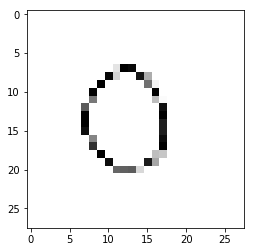

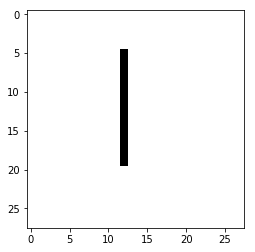

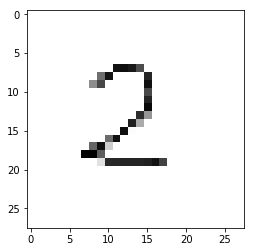

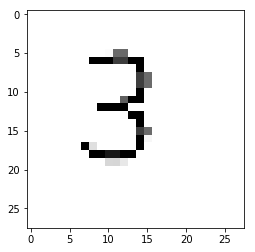

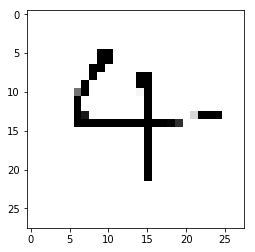

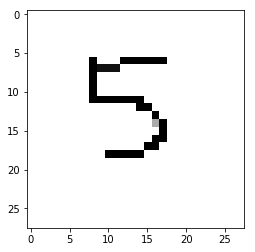

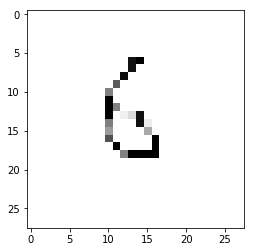

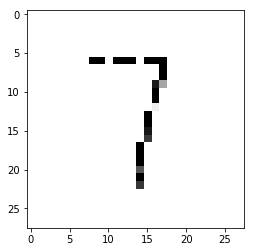

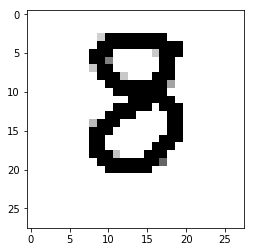

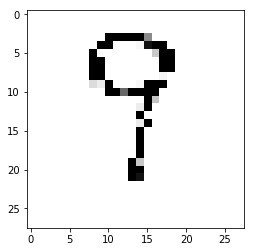

In [40]:
import scipy.misc
import glob
import matplotlib.pyplot as plt
import matplotlib
our_own_dataset = []
our_own_target = []
for image in glob.glob("F:\\hello\\ownhandwritting\\hw_?.png"):
    label = int(image[-5:-4])
    imarray = scipy.misc.imread(image,flatten=True)
    imarray = 255.0 - imarray.reshape(784)
    img_data = (imarray/255) * 0.98 + 0.01
    our_own_dataset.append(img_data)
    our_own_target.append(label)
    plt.imshow(img_data.reshape(28,28), cmap = matplotlib.cm.binary, interpolation="nearest")
    plt.show()

In [29]:
our_own_target

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

0.01
0.99
match! correct answer is: 0  predict answer is: 7


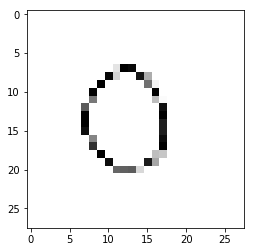

0.01
0.99
match! correct answer is: 1  predict answer is: 5


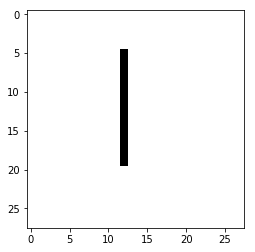

0.01
0.682549
match! correct answer is: 2  predict answer is: 2


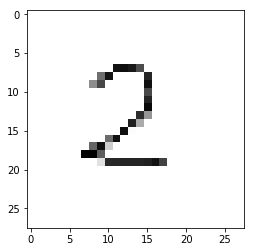

0.01
0.99
match! correct answer is: 3  predict answer is: 3


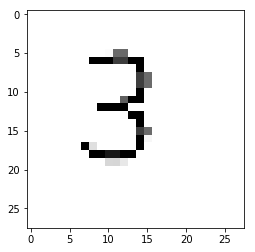

0.01
0.99
match! correct answer is: 4  predict answer is: 9


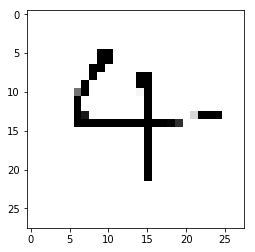

0.01
0.99
match! correct answer is: 5  predict answer is: 9


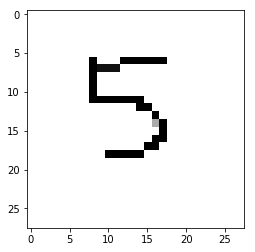

0.01
0.99
match! correct answer is: 6  predict answer is: 4


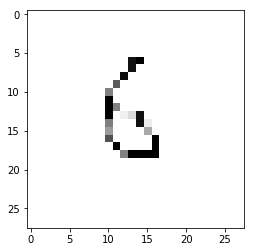

0.01
0.99
match! correct answer is: 7  predict answer is: 7


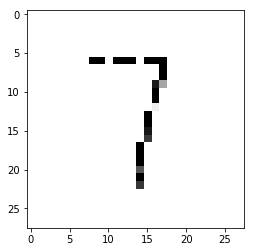

0.01
0.99
match! correct answer is: 8  predict answer is: 3


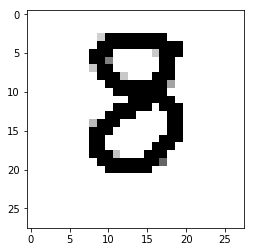

0.01
0.99
match! correct answer is: 9  predict answer is: 7


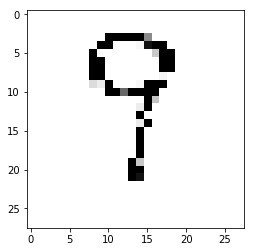

In [41]:
for index in range(len(our_own_dataset)):
    output = neural_nets.query(our_own_dataset[index])
    print(np.min(our_own_dataset[index]))
    print(np.max(our_own_dataset[index]))
    predict = np.argmax(output)
    print("match! correct answer is: "+str(our_own_target[index])+"  predict answer is: "+str(predict))
    plt.imshow(our_own_dataset[index].reshape(28,28), cmap = matplotlib.cm.binary, interpolation="nearest")
    plt.show()

match! correct answer is: 0.0  predict answer is: 0


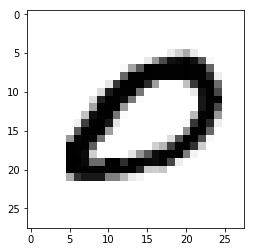

match! correct answer is: 7.0  predict answer is: 7


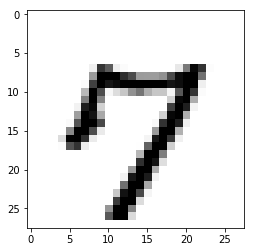

match! correct answer is: 1.0  predict answer is: 1


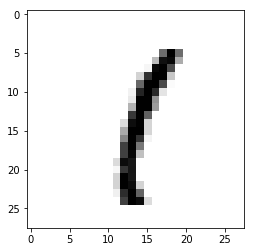

match! correct answer is: 6.0  predict answer is: 6


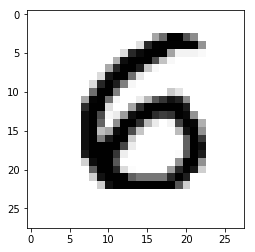

match! correct answer is: 3.0  predict answer is: 3


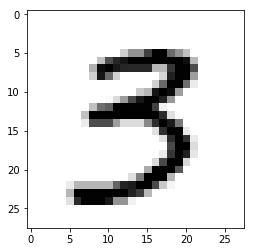

match! correct answer is: 7.0  predict answer is: 7


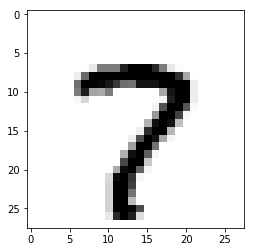

match! correct answer is: 8.0  predict answer is: 8


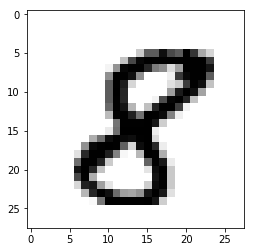

match! correct answer is: 5.0  predict answer is: 5


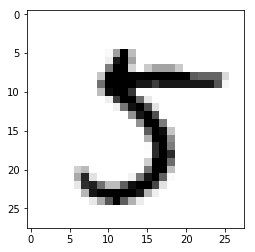

match! correct answer is: 3.0  predict answer is: 3


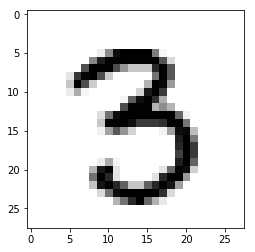

match! correct answer is: 9.0  predict answer is: 9


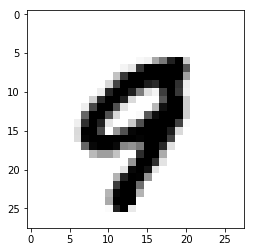

In [38]:
demo = np.random.permutation(10) 
for index in demo:
    output = neural_nets.query(x_test[index])
    predict = np.argmax(output)
    print("match! correct answer is: "+str(y_test[index])+"  predict answer is: "+str(predict))
    plt.imshow(x_test[index].reshape(28,28), cmap = matplotlib.cm.binary, interpolation="nearest")
    plt.show()

## brainscan of neural network

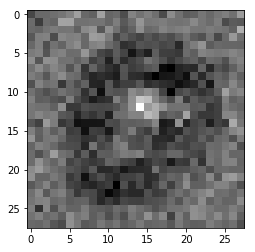

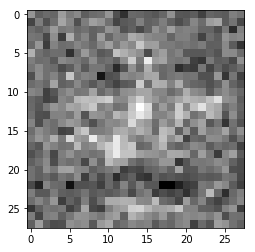

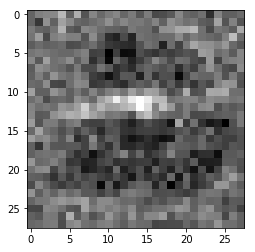

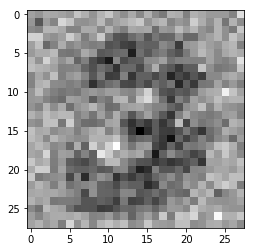

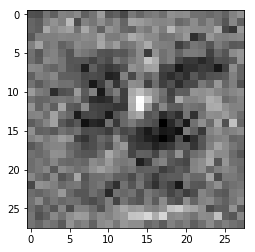

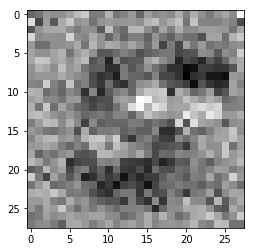

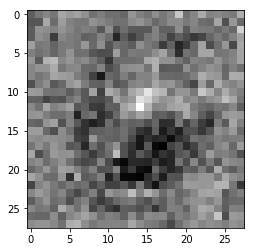

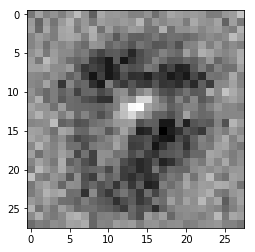

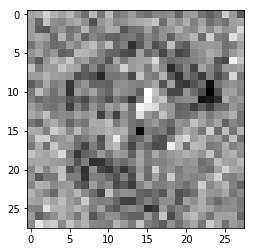

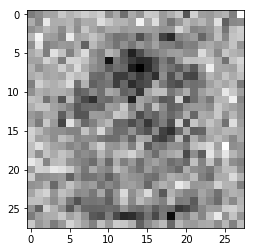

In [66]:
import scipy.special as ss
def backquery(weight_hidden, weight_output, target_list):
    inputs = target_list.reshape(-1,1)
    #print(inputs)
    input_log = ss.logit(inputs)
    #print(input_log)
    output_hidden = weight_output.T.dot(input_log)
    output_hidden -= np.min(output_hidden)
    output_hidden = (output_hidden/ np.max(output_hidden))*0.98+0.01
   # print(np.max(output_hidden))
    #print(np.min(output_hidden))
    hidden_log = ss.logit(output_hidden)
    #print(hidden_log)
    hidden_input = weight_hidden.T.dot(hidden_log)
   # print(hidden_input)
    plt.imshow(hidden_input.reshape(28,28), cmap = matplotlib.cm.binary, interpolation="nearest")
    #return hidden_input
    
    
#plt.figure(figsize=(9,9))
for i in our_own_target:
    
    sample = i
    sample_onehot = onehotoutput(sample)
    backQ = backquery(neural_nets.weight_hidden, neural_nets.weight_output, sample_onehot)
    #plt.imshow(backQ.reshape(28,28), cmap = matplotlib.cm.binary, interpolation="nearest")
    plt.show()
    


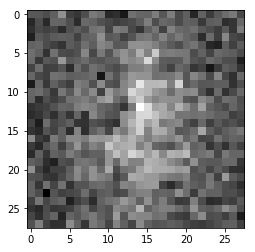

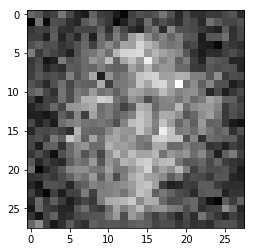

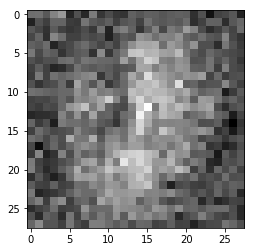

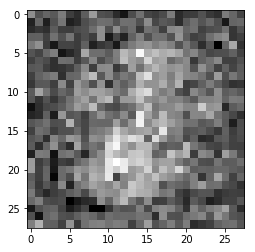

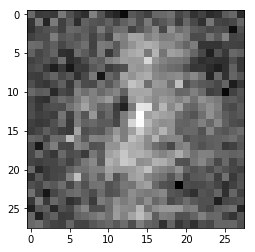

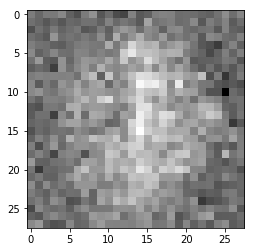

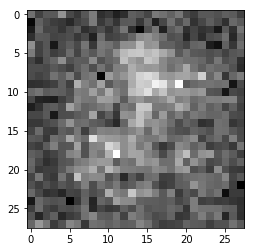

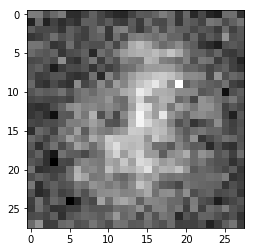

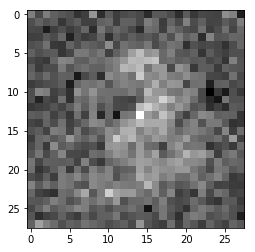

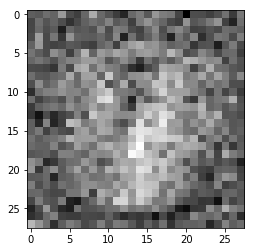

In [69]:
def anotherbackquery(weight_hidden, weight_output, target_list):
    inputs = target_list.reshape(-1,1)
    #print(inputs)
    input_log = ss.logit(inputs)
    #print(input_log)
    output_hidden = weight_output.T.dot(input_log)
    output_hidden = ss.expit(output_hidden)
    output_hidden = output_hidden*0.98 + 0.01
   # print(np.max(output_hidden))
    #print(np.min(output_hidden))
    hidden_log = ss.logit(output_hidden)
    #print(hidden_log)
    hidden_input = weight_hidden.T.dot(hidden_log)
   # print(hidden_input)
    plt.imshow(hidden_input.reshape(28,28), cmap = matplotlib.cm.binary, interpolation="nearest")
    #return hidden_input
    
    
#plt.figure(figsize=(9,9))
for i in our_own_target:
    
    sample = i
    sample_onehot = onehotoutput(sample)
    backQ = anotherbackquery(neural_nets.weight_hidden, neural_nets.weight_output, sample_onehot)
    #plt.imshow(backQ.reshape(28,28), cmap = matplotlib.cm.binary, interpolation="nearest")
    plt.show()
    


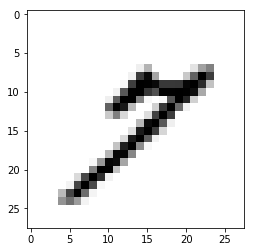

epoch:0number:0


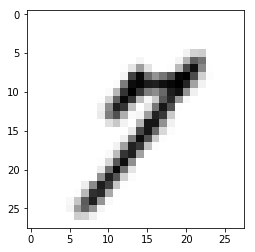

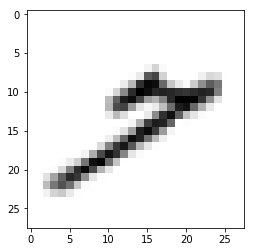

epoch:0number:1
epoch:0number:2
epoch:0number:3
epoch:0number:4
epoch:0number:5
epoch:0number:6
epoch:0number:7
epoch:0number:8
epoch:0number:9
epoch:0number:10
epoch:0number:11
epoch:0number:12
epoch:0number:13
epoch:0number:14
epoch:0number:15
epoch:0number:16
epoch:0number:17
epoch:0number:18
epoch:0number:19
epoch:0number:20
epoch:0number:21
epoch:0number:22
epoch:0number:23
epoch:0number:24
epoch:0number:25
epoch:0number:26
epoch:0number:27
epoch:0number:28
epoch:0number:29
epoch:0number:30
epoch:0number:31
epoch:0number:32
epoch:0number:33
epoch:0number:34
epoch:0number:35
epoch:0number:36
epoch:0number:37
epoch:0number:38
epoch:0number:39
epoch:0number:40
epoch:0number:41
epoch:0number:42
epoch:0number:43
epoch:0number:44
epoch:0number:45
epoch:0number:46
epoch:0number:47
epoch:0number:48
epoch:0number:49
epoch:0number:50
epoch:0number:51
epoch:0number:52
epoch:0number:53
epoch:0number:54
epoch:0number:55
epoch:0number:56
epoch:0number:57
epoch:0number:58
epoch:0number:59
epoch:

epoch:0number:479
epoch:0number:480
epoch:0number:481
epoch:0number:482
epoch:0number:483
epoch:0number:484
epoch:0number:485
epoch:0number:486
epoch:0number:487
epoch:0number:488
epoch:0number:489
epoch:0number:490
epoch:0number:491
epoch:0number:492
epoch:0number:493
epoch:0number:494
epoch:0number:495
epoch:0number:496
epoch:0number:497
epoch:0number:498
epoch:0number:499
epoch:0number:500
epoch:0number:501
epoch:0number:502
epoch:0number:503
epoch:0number:504
epoch:0number:505
epoch:0number:506
epoch:0number:507
epoch:0number:508
epoch:0number:509
epoch:0number:510
epoch:0number:511
epoch:0number:512
epoch:0number:513
epoch:0number:514
epoch:0number:515
epoch:0number:516
epoch:0number:517
epoch:0number:518
epoch:0number:519
epoch:0number:520
epoch:0number:521
epoch:0number:522
epoch:0number:523
epoch:0number:524
epoch:0number:525
epoch:0number:526
epoch:0number:527
epoch:0number:528
epoch:0number:529
epoch:0number:530
epoch:0number:531
epoch:0number:532
epoch:0number:533
epoch:0num

epoch:0number:950
epoch:0number:951
epoch:0number:952
epoch:0number:953
epoch:0number:954
epoch:0number:955
epoch:0number:956
epoch:0number:957
epoch:0number:958
epoch:0number:959
epoch:0number:960
epoch:0number:961
epoch:0number:962
epoch:0number:963
epoch:0number:964
epoch:0number:965
epoch:0number:966
epoch:0number:967
epoch:0number:968
epoch:0number:969
epoch:0number:970
epoch:0number:971
epoch:0number:972
epoch:0number:973
epoch:0number:974
epoch:0number:975
epoch:0number:976
epoch:0number:977
epoch:0number:978
epoch:0number:979
epoch:0number:980
epoch:0number:981
epoch:0number:982
epoch:0number:983
epoch:0number:984
epoch:0number:985
epoch:0number:986
epoch:0number:987
epoch:0number:988
epoch:0number:989
epoch:0number:990
epoch:0number:991
epoch:0number:992
epoch:0number:993
epoch:0number:994
epoch:0number:995
epoch:0number:996
epoch:0number:997
epoch:0number:998
epoch:0number:999
epoch:0number:1000
epoch:0number:1001
epoch:0number:1002
epoch:0number:1003
epoch:0number:1004
epoch

epoch:0number:1391
epoch:0number:1392
epoch:0number:1393
epoch:0number:1394
epoch:0number:1395
epoch:0number:1396
epoch:0number:1397
epoch:0number:1398
epoch:0number:1399
epoch:0number:1400
epoch:0number:1401
epoch:0number:1402
epoch:0number:1403
epoch:0number:1404
epoch:0number:1405
epoch:0number:1406
epoch:0number:1407
epoch:0number:1408
epoch:0number:1409
epoch:0number:1410
epoch:0number:1411
epoch:0number:1412
epoch:0number:1413
epoch:0number:1414
epoch:0number:1415
epoch:0number:1416
epoch:0number:1417
epoch:0number:1418
epoch:0number:1419
epoch:0number:1420
epoch:0number:1421
epoch:0number:1422
epoch:0number:1423
epoch:0number:1424
epoch:0number:1425
epoch:0number:1426
epoch:0number:1427
epoch:0number:1428
epoch:0number:1429
epoch:0number:1430
epoch:0number:1431
epoch:0number:1432
epoch:0number:1433
epoch:0number:1434
epoch:0number:1435
epoch:0number:1436
epoch:0number:1437
epoch:0number:1438
epoch:0number:1439
epoch:0number:1440
epoch:0number:1441
epoch:0number:1442
epoch:0numbe

epoch:0number:1839
epoch:0number:1840
epoch:0number:1841
epoch:0number:1842
epoch:0number:1843
epoch:0number:1844
epoch:0number:1845
epoch:0number:1846
epoch:0number:1847
epoch:0number:1848
epoch:0number:1849
epoch:0number:1850
epoch:0number:1851
epoch:0number:1852
epoch:0number:1853
epoch:0number:1854
epoch:0number:1855
epoch:0number:1856
epoch:0number:1857
epoch:0number:1858
epoch:0number:1859
epoch:0number:1860
epoch:0number:1861
epoch:0number:1862
epoch:0number:1863
epoch:0number:1864
epoch:0number:1865
epoch:0number:1866
epoch:0number:1867
epoch:0number:1868
epoch:0number:1869
epoch:0number:1870
epoch:0number:1871
epoch:0number:1872
epoch:0number:1873
epoch:0number:1874
epoch:0number:1875
epoch:0number:1876
epoch:0number:1877
epoch:0number:1878
epoch:0number:1879
epoch:0number:1880
epoch:0number:1881
epoch:0number:1882
epoch:0number:1883
epoch:0number:1884
epoch:0number:1885
epoch:0number:1886
epoch:0number:1887
epoch:0number:1888
epoch:0number:1889
epoch:0number:1890
epoch:0numbe

epoch:0number:2280
epoch:0number:2281
epoch:0number:2282
epoch:0number:2283
epoch:0number:2284
epoch:0number:2285
epoch:0number:2286
epoch:0number:2287
epoch:0number:2288
epoch:0number:2289
epoch:0number:2290
epoch:0number:2291
epoch:0number:2292
epoch:0number:2293
epoch:0number:2294
epoch:0number:2295
epoch:0number:2296
epoch:0number:2297
epoch:0number:2298
epoch:0number:2299
epoch:0number:2300
epoch:0number:2301
epoch:0number:2302
epoch:0number:2303
epoch:0number:2304
epoch:0number:2305
epoch:0number:2306
epoch:0number:2307
epoch:0number:2308
epoch:0number:2309
epoch:0number:2310
epoch:0number:2311
epoch:0number:2312
epoch:0number:2313
epoch:0number:2314
epoch:0number:2315
epoch:0number:2316
epoch:0number:2317
epoch:0number:2318
epoch:0number:2319
epoch:0number:2320
epoch:0number:2321
epoch:0number:2322
epoch:0number:2323
epoch:0number:2324
epoch:0number:2325
epoch:0number:2326
epoch:0number:2327
epoch:0number:2328
epoch:0number:2329
epoch:0number:2330
epoch:0number:2331
epoch:0numbe

epoch:0number:2718
epoch:0number:2719
epoch:0number:2720
epoch:0number:2721
epoch:0number:2722
epoch:0number:2723
epoch:0number:2724
epoch:0number:2725
epoch:0number:2726
epoch:0number:2727
epoch:0number:2728
epoch:0number:2729
epoch:0number:2730
epoch:0number:2731
epoch:0number:2732
epoch:0number:2733
epoch:0number:2734
epoch:0number:2735
epoch:0number:2736
epoch:0number:2737
epoch:0number:2738
epoch:0number:2739
epoch:0number:2740
epoch:0number:2741
epoch:0number:2742
epoch:0number:2743
epoch:0number:2744
epoch:0number:2745
epoch:0number:2746
epoch:0number:2747
epoch:0number:2748
epoch:0number:2749
epoch:0number:2750
epoch:0number:2751
epoch:0number:2752
epoch:0number:2753
epoch:0number:2754
epoch:0number:2755
epoch:0number:2756
epoch:0number:2757
epoch:0number:2758
epoch:0number:2759
epoch:0number:2760
epoch:0number:2761
epoch:0number:2762
epoch:0number:2763
epoch:0number:2764
epoch:0number:2765
epoch:0number:2766
epoch:0number:2767
epoch:0number:2768
epoch:0number:2769
epoch:0numbe

epoch:0number:3168
epoch:0number:3169
epoch:0number:3170
epoch:0number:3171
epoch:0number:3172
epoch:0number:3173
epoch:0number:3174
epoch:0number:3175
epoch:0number:3176
epoch:0number:3177
epoch:0number:3178
epoch:0number:3179
epoch:0number:3180
epoch:0number:3181
epoch:0number:3182
epoch:0number:3183
epoch:0number:3184
epoch:0number:3185
epoch:0number:3186
epoch:0number:3187
epoch:0number:3188
epoch:0number:3189
epoch:0number:3190
epoch:0number:3191
epoch:0number:3192
epoch:0number:3193
epoch:0number:3194
epoch:0number:3195
epoch:0number:3196
epoch:0number:3197
epoch:0number:3198
epoch:0number:3199
epoch:0number:3200
epoch:0number:3201
epoch:0number:3202
epoch:0number:3203
epoch:0number:3204
epoch:0number:3205
epoch:0number:3206
epoch:0number:3207
epoch:0number:3208
epoch:0number:3209
epoch:0number:3210
epoch:0number:3211
epoch:0number:3212
epoch:0number:3213
epoch:0number:3214
epoch:0number:3215
epoch:0number:3216
epoch:0number:3217
epoch:0number:3218
epoch:0number:3219
epoch:0numbe

epoch:0number:3618
epoch:0number:3619
epoch:0number:3620
epoch:0number:3621
epoch:0number:3622
epoch:0number:3623
epoch:0number:3624
epoch:0number:3625
epoch:0number:3626
epoch:0number:3627
epoch:0number:3628
epoch:0number:3629
epoch:0number:3630
epoch:0number:3631
epoch:0number:3632
epoch:0number:3633
epoch:0number:3634
epoch:0number:3635
epoch:0number:3636
epoch:0number:3637
epoch:0number:3638
epoch:0number:3639
epoch:0number:3640
epoch:0number:3641
epoch:0number:3642
epoch:0number:3643
epoch:0number:3644
epoch:0number:3645
epoch:0number:3646
epoch:0number:3647
epoch:0number:3648
epoch:0number:3649
epoch:0number:3650
epoch:0number:3651
epoch:0number:3652
epoch:0number:3653
epoch:0number:3654
epoch:0number:3655
epoch:0number:3656
epoch:0number:3657
epoch:0number:3658
epoch:0number:3659
epoch:0number:3660
epoch:0number:3661
epoch:0number:3662
epoch:0number:3663
epoch:0number:3664
epoch:0number:3665
epoch:0number:3666
epoch:0number:3667
epoch:0number:3668
epoch:0number:3669
epoch:0numbe

epoch:0number:4062
epoch:0number:4063
epoch:0number:4064
epoch:0number:4065
epoch:0number:4066
epoch:0number:4067
epoch:0number:4068
epoch:0number:4069
epoch:0number:4070
epoch:0number:4071
epoch:0number:4072
epoch:0number:4073
epoch:0number:4074
epoch:0number:4075
epoch:0number:4076
epoch:0number:4077
epoch:0number:4078
epoch:0number:4079
epoch:0number:4080
epoch:0number:4081
epoch:0number:4082
epoch:0number:4083
epoch:0number:4084
epoch:0number:4085
epoch:0number:4086
epoch:0number:4087
epoch:0number:4088
epoch:0number:4089
epoch:0number:4090
epoch:0number:4091
epoch:0number:4092
epoch:0number:4093
epoch:0number:4094
epoch:0number:4095
epoch:0number:4096
epoch:0number:4097
epoch:0number:4098
epoch:0number:4099
epoch:0number:4100
epoch:0number:4101
epoch:0number:4102
epoch:0number:4103
epoch:0number:4104
epoch:0number:4105
epoch:0number:4106
epoch:0number:4107
epoch:0number:4108
epoch:0number:4109
epoch:0number:4110
epoch:0number:4111
epoch:0number:4112
epoch:0number:4113
epoch:0numbe

epoch:0number:4518
epoch:0number:4519
epoch:0number:4520
epoch:0number:4521
epoch:0number:4522
epoch:0number:4523
epoch:0number:4524
epoch:0number:4525
epoch:0number:4526
epoch:0number:4527
epoch:0number:4528
epoch:0number:4529
epoch:0number:4530
epoch:0number:4531
epoch:0number:4532
epoch:0number:4533
epoch:0number:4534
epoch:0number:4535
epoch:0number:4536
epoch:0number:4537
epoch:0number:4538
epoch:0number:4539
epoch:0number:4540
epoch:0number:4541
epoch:0number:4542
epoch:0number:4543
epoch:0number:4544
epoch:0number:4545
epoch:0number:4546
epoch:0number:4547
epoch:0number:4548
epoch:0number:4549
epoch:0number:4550
epoch:0number:4551
epoch:0number:4552
epoch:0number:4553
epoch:0number:4554
epoch:0number:4555
epoch:0number:4556
epoch:0number:4557
epoch:0number:4558
epoch:0number:4559
epoch:0number:4560
epoch:0number:4561
epoch:0number:4562
epoch:0number:4563
epoch:0number:4564
epoch:0number:4565
epoch:0number:4566
epoch:0number:4567
epoch:0number:4568
epoch:0number:4569
epoch:0numbe

epoch:0number:4956
epoch:0number:4957
epoch:0number:4958
epoch:0number:4959
epoch:0number:4960
epoch:0number:4961
epoch:0number:4962
epoch:0number:4963
epoch:0number:4964
epoch:0number:4965
epoch:0number:4966
epoch:0number:4967
epoch:0number:4968
epoch:0number:4969
epoch:0number:4970
epoch:0number:4971
epoch:0number:4972
epoch:0number:4973
epoch:0number:4974
epoch:0number:4975
epoch:0number:4976
epoch:0number:4977
epoch:0number:4978
epoch:0number:4979
epoch:0number:4980
epoch:0number:4981
epoch:0number:4982
epoch:0number:4983
epoch:0number:4984
epoch:0number:4985
epoch:0number:4986
epoch:0number:4987
epoch:0number:4988
epoch:0number:4989
epoch:0number:4990
epoch:0number:4991
epoch:0number:4992
epoch:0number:4993
epoch:0number:4994
epoch:0number:4995
epoch:0number:4996
epoch:0number:4997
epoch:0number:4998
epoch:0number:4999
epoch:0number:5000
epoch:0number:5001
epoch:0number:5002
epoch:0number:5003
epoch:0number:5004
epoch:0number:5005
epoch:0number:5006
epoch:0number:5007
epoch:0numbe

epoch:0number:5848
epoch:0number:5849
epoch:0number:5850
epoch:0number:5851
epoch:0number:5852
epoch:0number:5853
epoch:0number:5854
epoch:0number:5855
epoch:0number:5856
epoch:0number:5857
epoch:0number:5858
epoch:0number:5859
epoch:0number:5860
epoch:0number:5861
epoch:0number:5862
epoch:0number:5863
epoch:0number:5864
epoch:0number:5865
epoch:0number:5866
epoch:0number:5867
epoch:0number:5868
epoch:0number:5869
epoch:0number:5870
epoch:0number:5871
epoch:0number:5872
epoch:0number:5873
epoch:0number:5874
epoch:0number:5875
epoch:0number:5876
epoch:0number:5877
epoch:0number:5878
epoch:0number:5879
epoch:0number:5880
epoch:0number:5881
epoch:0number:5882
epoch:0number:5883
epoch:0number:5884
epoch:0number:5885
epoch:0number:5886
epoch:0number:5887
epoch:0number:5888
epoch:0number:5889
epoch:0number:5890
epoch:0number:5891
epoch:0number:5892
epoch:0number:5893
epoch:0number:5894
epoch:0number:5895
epoch:0number:5896
epoch:0number:5897
epoch:0number:5898
epoch:0number:5899
epoch:0numbe

epoch:0number:6292
epoch:0number:6293
epoch:0number:6294
epoch:0number:6295
epoch:0number:6296
epoch:0number:6297
epoch:0number:6298
epoch:0number:6299
epoch:0number:6300
epoch:0number:6301
epoch:0number:6302
epoch:0number:6303
epoch:0number:6304
epoch:0number:6305
epoch:0number:6306
epoch:0number:6307
epoch:0number:6308
epoch:0number:6309
epoch:0number:6310
epoch:0number:6311
epoch:0number:6312
epoch:0number:6313
epoch:0number:6314
epoch:0number:6315
epoch:0number:6316
epoch:0number:6317
epoch:0number:6318
epoch:0number:6319
epoch:0number:6320
epoch:0number:6321
epoch:0number:6322
epoch:0number:6323
epoch:0number:6324
epoch:0number:6325
epoch:0number:6326
epoch:0number:6327
epoch:0number:6328
epoch:0number:6329
epoch:0number:6330
epoch:0number:6331
epoch:0number:6332
epoch:0number:6333
epoch:0number:6334
epoch:0number:6335
epoch:0number:6336
epoch:0number:6337
epoch:0number:6338
epoch:0number:6339
epoch:0number:6340
epoch:0number:6341
epoch:0number:6342
epoch:0number:6343
epoch:0numbe

epoch:0number:6735
epoch:0number:6736
epoch:0number:6737
epoch:0number:6738
epoch:0number:6739
epoch:0number:6740
epoch:0number:6741
epoch:0number:6742
epoch:0number:6743
epoch:0number:6744
epoch:0number:6745
epoch:0number:6746
epoch:0number:6747
epoch:0number:6748
epoch:0number:6749
epoch:0number:6750
epoch:0number:6751
epoch:0number:6752
epoch:0number:6753
epoch:0number:6754
epoch:0number:6755
epoch:0number:6756
epoch:0number:6757
epoch:0number:6758
epoch:0number:6759
epoch:0number:6760
epoch:0number:6761
epoch:0number:6762
epoch:0number:6763
epoch:0number:6764
epoch:0number:6765
epoch:0number:6766
epoch:0number:6767
epoch:0number:6768
epoch:0number:6769
epoch:0number:6770
epoch:0number:6771
epoch:0number:6772
epoch:0number:6773
epoch:0number:6774
epoch:0number:6775
epoch:0number:6776
epoch:0number:6777
epoch:0number:6778
epoch:0number:6779
epoch:0number:6780
epoch:0number:6781
epoch:0number:6782
epoch:0number:6783
epoch:0number:6784
epoch:0number:6785
epoch:0number:6786
epoch:0numbe

epoch:0number:7195
epoch:0number:7196
epoch:0number:7197
epoch:0number:7198
epoch:0number:7199
epoch:0number:7200
epoch:0number:7201
epoch:0number:7202
epoch:0number:7203
epoch:0number:7204
epoch:0number:7205
epoch:0number:7206
epoch:0number:7207
epoch:0number:7208
epoch:0number:7209
epoch:0number:7210
epoch:0number:7211
epoch:0number:7212
epoch:0number:7213
epoch:0number:7214
epoch:0number:7215
epoch:0number:7216
epoch:0number:7217
epoch:0number:7218
epoch:0number:7219
epoch:0number:7220
epoch:0number:7221
epoch:0number:7222
epoch:0number:7223
epoch:0number:7224
epoch:0number:7225
epoch:0number:7226
epoch:0number:7227
epoch:0number:7228
epoch:0number:7229
epoch:0number:7230
epoch:0number:7231
epoch:0number:7232
epoch:0number:7233
epoch:0number:7234
epoch:0number:7235
epoch:0number:7236
epoch:0number:7237
epoch:0number:7238
epoch:0number:7239
epoch:0number:7240
epoch:0number:7241
epoch:0number:7242
epoch:0number:7243
epoch:0number:7244
epoch:0number:7245
epoch:0number:7246
epoch:0numbe

epoch:0number:7648
epoch:0number:7649
epoch:0number:7650
epoch:0number:7651
epoch:0number:7652
epoch:0number:7653
epoch:0number:7654
epoch:0number:7655
epoch:0number:7656
epoch:0number:7657
epoch:0number:7658
epoch:0number:7659
epoch:0number:7660
epoch:0number:7661
epoch:0number:7662
epoch:0number:7663
epoch:0number:7664
epoch:0number:7665
epoch:0number:7666
epoch:0number:7667
epoch:0number:7668
epoch:0number:7669
epoch:0number:7670
epoch:0number:7671
epoch:0number:7672
epoch:0number:7673
epoch:0number:7674
epoch:0number:7675
epoch:0number:7676
epoch:0number:7677
epoch:0number:7678
epoch:0number:7679
epoch:0number:7680
epoch:0number:7681
epoch:0number:7682
epoch:0number:7683
epoch:0number:7684
epoch:0number:7685
epoch:0number:7686
epoch:0number:7687
epoch:0number:7688
epoch:0number:7689
epoch:0number:7690
epoch:0number:7691
epoch:0number:7692
epoch:0number:7693
epoch:0number:7694
epoch:0number:7695
epoch:0number:7696
epoch:0number:7697
epoch:0number:7698
epoch:0number:7699
epoch:0numbe

epoch:0number:8085
epoch:0number:8086
epoch:0number:8087
epoch:0number:8088
epoch:0number:8089
epoch:0number:8090
epoch:0number:8091
epoch:0number:8092
epoch:0number:8093
epoch:0number:8094
epoch:0number:8095
epoch:0number:8096
epoch:0number:8097
epoch:0number:8098
epoch:0number:8099
epoch:0number:8100
epoch:0number:8101
epoch:0number:8102
epoch:0number:8103
epoch:0number:8104
epoch:0number:8105
epoch:0number:8106
epoch:0number:8107
epoch:0number:8108
epoch:0number:8109
epoch:0number:8110
epoch:0number:8111
epoch:0number:8112
epoch:0number:8113
epoch:0number:8114
epoch:0number:8115
epoch:0number:8116
epoch:0number:8117
epoch:0number:8118
epoch:0number:8119
epoch:0number:8120
epoch:0number:8121
epoch:0number:8122
epoch:0number:8123
epoch:0number:8124
epoch:0number:8125
epoch:0number:8126
epoch:0number:8127
epoch:0number:8128
epoch:0number:8129
epoch:0number:8130
epoch:0number:8131
epoch:0number:8132
epoch:0number:8133
epoch:0number:8134
epoch:0number:8135
epoch:0number:8136
epoch:0numbe

epoch:0number:8534
epoch:0number:8535
epoch:0number:8536
epoch:0number:8537
epoch:0number:8538
epoch:0number:8539
epoch:0number:8540
epoch:0number:8541
epoch:0number:8542
epoch:0number:8543
epoch:0number:8544
epoch:0number:8545
epoch:0number:8546
epoch:0number:8547
epoch:0number:8548
epoch:0number:8549
epoch:0number:8550
epoch:0number:8551
epoch:0number:8552
epoch:0number:8553
epoch:0number:8554
epoch:0number:8555
epoch:0number:8556
epoch:0number:8557
epoch:0number:8558
epoch:0number:8559
epoch:0number:8560
epoch:0number:8561
epoch:0number:8562
epoch:0number:8563
epoch:0number:8564
epoch:0number:8565
epoch:0number:8566
epoch:0number:8567
epoch:0number:8568
epoch:0number:8569
epoch:0number:8570
epoch:0number:8571
epoch:0number:8572
epoch:0number:8573
epoch:0number:8574
epoch:0number:8575
epoch:0number:8576
epoch:0number:8577
epoch:0number:8578
epoch:0number:8579
epoch:0number:8580
epoch:0number:8581
epoch:0number:8582
epoch:0number:8583
epoch:0number:8584
epoch:0number:8585
epoch:0numbe

epoch:0number:8981
epoch:0number:8982
epoch:0number:8983
epoch:0number:8984
epoch:0number:8985
epoch:0number:8986
epoch:0number:8987
epoch:0number:8988
epoch:0number:8989
epoch:0number:8990
epoch:0number:8991
epoch:0number:8992
epoch:0number:8993
epoch:0number:8994
epoch:0number:8995
epoch:0number:8996
epoch:0number:8997
epoch:0number:8998
epoch:0number:8999
epoch:0number:9000
epoch:0number:9001
epoch:0number:9002
epoch:0number:9003
epoch:0number:9004
epoch:0number:9005
epoch:0number:9006
epoch:0number:9007
epoch:0number:9008
epoch:0number:9009
epoch:0number:9010
epoch:0number:9011
epoch:0number:9012
epoch:0number:9013
epoch:0number:9014
epoch:0number:9015
epoch:0number:9016
epoch:0number:9017
epoch:0number:9018
epoch:0number:9019
epoch:0number:9020
epoch:0number:9021
epoch:0number:9022
epoch:0number:9023
epoch:0number:9024
epoch:0number:9025
epoch:0number:9026
epoch:0number:9027
epoch:0number:9028
epoch:0number:9029
epoch:0number:9030
epoch:0number:9031
epoch:0number:9032
epoch:0numbe

epoch:0number:9422
epoch:0number:9423
epoch:0number:9424
epoch:0number:9425
epoch:0number:9426
epoch:0number:9427
epoch:0number:9428
epoch:0number:9429
epoch:0number:9430
epoch:0number:9431
epoch:0number:9432
epoch:0number:9433
epoch:0number:9434
epoch:0number:9435
epoch:0number:9436
epoch:0number:9437
epoch:0number:9438
epoch:0number:9439
epoch:0number:9440
epoch:0number:9441
epoch:0number:9442
epoch:0number:9443
epoch:0number:9444
epoch:0number:9445
epoch:0number:9446
epoch:0number:9447
epoch:0number:9448
epoch:0number:9449
epoch:0number:9450
epoch:0number:9451
epoch:0number:9452
epoch:0number:9453
epoch:0number:9454
epoch:0number:9455
epoch:0number:9456
epoch:0number:9457
epoch:0number:9458
epoch:0number:9459
epoch:0number:9460
epoch:0number:9461
epoch:0number:9462
epoch:0number:9463
epoch:0number:9464
epoch:0number:9465
epoch:0number:9466
epoch:0number:9467
epoch:0number:9468
epoch:0number:9469
epoch:0number:9470
epoch:0number:9471
epoch:0number:9472
epoch:0number:9473
epoch:0numbe

epoch:0number:9883
epoch:0number:9884
epoch:0number:9885
epoch:0number:9886
epoch:0number:9887
epoch:0number:9888
epoch:0number:9889
epoch:0number:9890
epoch:0number:9891
epoch:0number:9892
epoch:0number:9893
epoch:0number:9894
epoch:0number:9895
epoch:0number:9896
epoch:0number:9897
epoch:0number:9898
epoch:0number:9899
epoch:0number:9900
epoch:0number:9901
epoch:0number:9902
epoch:0number:9903
epoch:0number:9904
epoch:0number:9905
epoch:0number:9906
epoch:0number:9907
epoch:0number:9908
epoch:0number:9909
epoch:0number:9910
epoch:0number:9911
epoch:0number:9912
epoch:0number:9913
epoch:0number:9914
epoch:0number:9915
epoch:0number:9916
epoch:0number:9917
epoch:0number:9918
epoch:0number:9919
epoch:0number:9920
epoch:0number:9921
epoch:0number:9922
epoch:0number:9923
epoch:0number:9924
epoch:0number:9925
epoch:0number:9926
epoch:0number:9927
epoch:0number:9928
epoch:0number:9929
epoch:0number:9930
epoch:0number:9931
epoch:0number:9932
epoch:0number:9933
epoch:0number:9934
epoch:0numbe

epoch:0number:10311
epoch:0number:10312
epoch:0number:10313
epoch:0number:10314
epoch:0number:10315
epoch:0number:10316
epoch:0number:10317
epoch:0number:10318
epoch:0number:10319
epoch:0number:10320
epoch:0number:10321
epoch:0number:10322
epoch:0number:10323
epoch:0number:10324
epoch:0number:10325
epoch:0number:10326
epoch:0number:10327
epoch:0number:10328
epoch:0number:10329
epoch:0number:10330
epoch:0number:10331
epoch:0number:10332
epoch:0number:10333
epoch:0number:10334
epoch:0number:10335
epoch:0number:10336
epoch:0number:10337
epoch:0number:10338
epoch:0number:10339
epoch:0number:10340
epoch:0number:10341
epoch:0number:10342
epoch:0number:10343
epoch:0number:10344
epoch:0number:10345
epoch:0number:10346
epoch:0number:10347
epoch:0number:10348
epoch:0number:10349
epoch:0number:10350
epoch:0number:10351
epoch:0number:10352
epoch:0number:10353
epoch:0number:10354
epoch:0number:10355
epoch:0number:10356
epoch:0number:10357
epoch:0number:10358
epoch:0number:10359
epoch:0number:10360


epoch:0number:10746
epoch:0number:10747
epoch:0number:10748
epoch:0number:10749
epoch:0number:10750
epoch:0number:10751
epoch:0number:10752
epoch:0number:10753
epoch:0number:10754
epoch:0number:10755
epoch:0number:10756
epoch:0number:10757
epoch:0number:10758
epoch:0number:10759
epoch:0number:10760
epoch:0number:10761
epoch:0number:10762
epoch:0number:10763
epoch:0number:10764
epoch:0number:10765
epoch:0number:10766
epoch:0number:10767
epoch:0number:10768
epoch:0number:10769
epoch:0number:10770
epoch:0number:10771
epoch:0number:10772
epoch:0number:10773
epoch:0number:10774
epoch:0number:10775
epoch:0number:10776
epoch:0number:10777
epoch:0number:10778
epoch:0number:10779
epoch:0number:10780
epoch:0number:10781
epoch:0number:10782
epoch:0number:10783
epoch:0number:10784
epoch:0number:10785
epoch:0number:10786
epoch:0number:10787
epoch:0number:10788
epoch:0number:10789
epoch:0number:10790
epoch:0number:10791
epoch:0number:10792
epoch:0number:10793
epoch:0number:10794
epoch:0number:10795


epoch:0number:11169
epoch:0number:11170
epoch:0number:11171
epoch:0number:11172
epoch:0number:11173
epoch:0number:11174
epoch:0number:11175
epoch:0number:11176
epoch:0number:11177
epoch:0number:11178
epoch:0number:11179
epoch:0number:11180
epoch:0number:11181
epoch:0number:11182
epoch:0number:11183
epoch:0number:11184
epoch:0number:11185
epoch:0number:11186
epoch:0number:11187
epoch:0number:11188
epoch:0number:11189
epoch:0number:11190
epoch:0number:11191
epoch:0number:11192
epoch:0number:11193
epoch:0number:11194
epoch:0number:11195
epoch:0number:11196
epoch:0number:11197
epoch:0number:11198
epoch:0number:11199
epoch:0number:11200
epoch:0number:11201
epoch:0number:11202
epoch:0number:11203
epoch:0number:11204
epoch:0number:11205
epoch:0number:11206
epoch:0number:11207
epoch:0number:11208
epoch:0number:11209
epoch:0number:11210
epoch:0number:11211
epoch:0number:11212
epoch:0number:11213
epoch:0number:11214
epoch:0number:11215
epoch:0number:11216
epoch:0number:11217
epoch:0number:11218


epoch:0number:11590
epoch:0number:11591
epoch:0number:11592
epoch:0number:11593
epoch:0number:11594
epoch:0number:11595
epoch:0number:11596
epoch:0number:11597
epoch:0number:11598
epoch:0number:11599
epoch:0number:11600
epoch:0number:11601
epoch:0number:11602
epoch:0number:11603
epoch:0number:11604
epoch:0number:11605
epoch:0number:11606
epoch:0number:11607
epoch:0number:11608
epoch:0number:11609
epoch:0number:11610
epoch:0number:11611
epoch:0number:11612
epoch:0number:11613
epoch:0number:11614
epoch:0number:11615
epoch:0number:11616
epoch:0number:11617
epoch:0number:11618
epoch:0number:11619
epoch:0number:11620
epoch:0number:11621
epoch:0number:11622
epoch:0number:11623
epoch:0number:11624
epoch:0number:11625
epoch:0number:11626
epoch:0number:11627
epoch:0number:11628
epoch:0number:11629
epoch:0number:11630
epoch:0number:11631
epoch:0number:11632
epoch:0number:11633
epoch:0number:11634
epoch:0number:11635
epoch:0number:11636
epoch:0number:11637
epoch:0number:11638
epoch:0number:11639


epoch:0number:12019
epoch:0number:12020
epoch:0number:12021
epoch:0number:12022
epoch:0number:12023
epoch:0number:12024
epoch:0number:12025
epoch:0number:12026
epoch:0number:12027
epoch:0number:12028
epoch:0number:12029
epoch:0number:12030
epoch:0number:12031
epoch:0number:12032
epoch:0number:12033
epoch:0number:12034
epoch:0number:12035
epoch:0number:12036
epoch:0number:12037
epoch:0number:12038
epoch:0number:12039
epoch:0number:12040
epoch:0number:12041
epoch:0number:12042
epoch:0number:12043
epoch:0number:12044
epoch:0number:12045
epoch:0number:12046
epoch:0number:12047
epoch:0number:12048
epoch:0number:12049
epoch:0number:12050
epoch:0number:12051
epoch:0number:12052
epoch:0number:12053
epoch:0number:12054
epoch:0number:12055
epoch:0number:12056
epoch:0number:12057
epoch:0number:12058
epoch:0number:12059
epoch:0number:12060
epoch:0number:12061
epoch:0number:12062
epoch:0number:12063
epoch:0number:12064
epoch:0number:12065
epoch:0number:12066
epoch:0number:12067
epoch:0number:12068


epoch:0number:12447
epoch:0number:12448
epoch:0number:12449
epoch:0number:12450
epoch:0number:12451
epoch:0number:12452
epoch:0number:12453
epoch:0number:12454
epoch:0number:12455
epoch:0number:12456
epoch:0number:12457
epoch:0number:12458
epoch:0number:12459
epoch:0number:12460
epoch:0number:12461
epoch:0number:12462
epoch:0number:12463
epoch:0number:12464
epoch:0number:12465
epoch:0number:12466
epoch:0number:12467
epoch:0number:12468
epoch:0number:12469
epoch:0number:12470
epoch:0number:12471
epoch:0number:12472
epoch:0number:12473
epoch:0number:12474
epoch:0number:12475
epoch:0number:12476
epoch:0number:12477
epoch:0number:12478
epoch:0number:12479
epoch:0number:12480
epoch:0number:12481
epoch:0number:12482
epoch:0number:12483
epoch:0number:12484
epoch:0number:12485
epoch:0number:12486
epoch:0number:12487
epoch:0number:12488
epoch:0number:12489
epoch:0number:12490
epoch:0number:12491
epoch:0number:12492
epoch:0number:12493
epoch:0number:12494
epoch:0number:12495
epoch:0number:12496


epoch:0number:12875
epoch:0number:12876
epoch:0number:12877
epoch:0number:12878
epoch:0number:12879
epoch:0number:12880
epoch:0number:12881
epoch:0number:12882
epoch:0number:12883
epoch:0number:12884
epoch:0number:12885
epoch:0number:12886
epoch:0number:12887
epoch:0number:12888
epoch:0number:12889
epoch:0number:12890
epoch:0number:12891
epoch:0number:12892
epoch:0number:12893
epoch:0number:12894
epoch:0number:12895
epoch:0number:12896
epoch:0number:12897
epoch:0number:12898
epoch:0number:12899
epoch:0number:12900
epoch:0number:12901
epoch:0number:12902
epoch:0number:12903
epoch:0number:12904
epoch:0number:12905
epoch:0number:12906
epoch:0number:12907
epoch:0number:12908
epoch:0number:12909
epoch:0number:12910
epoch:0number:12911
epoch:0number:12912
epoch:0number:12913
epoch:0number:12914
epoch:0number:12915
epoch:0number:12916
epoch:0number:12917
epoch:0number:12918
epoch:0number:12919
epoch:0number:12920
epoch:0number:12921
epoch:0number:12922
epoch:0number:12923
epoch:0number:12924


epoch:0number:13299
epoch:0number:13300
epoch:0number:13301
epoch:0number:13302
epoch:0number:13303
epoch:0number:13304
epoch:0number:13305
epoch:0number:13306
epoch:0number:13307
epoch:0number:13308
epoch:0number:13309
epoch:0number:13310
epoch:0number:13311
epoch:0number:13312
epoch:0number:13313
epoch:0number:13314
epoch:0number:13315
epoch:0number:13316
epoch:0number:13317
epoch:0number:13318
epoch:0number:13319
epoch:0number:13320
epoch:0number:13321
epoch:0number:13322
epoch:0number:13323
epoch:0number:13324
epoch:0number:13325
epoch:0number:13326
epoch:0number:13327
epoch:0number:13328
epoch:0number:13329
epoch:0number:13330
epoch:0number:13331
epoch:0number:13332
epoch:0number:13333
epoch:0number:13334
epoch:0number:13335
epoch:0number:13336
epoch:0number:13337
epoch:0number:13338
epoch:0number:13339
epoch:0number:13340
epoch:0number:13341
epoch:0number:13342
epoch:0number:13343
epoch:0number:13344
epoch:0number:13345
epoch:0number:13346
epoch:0number:13347
epoch:0number:13348


epoch:0number:13729
epoch:0number:13730
epoch:0number:13731
epoch:0number:13732
epoch:0number:13733
epoch:0number:13734
epoch:0number:13735
epoch:0number:13736
epoch:0number:13737
epoch:0number:13738
epoch:0number:13739
epoch:0number:13740
epoch:0number:13741
epoch:0number:13742
epoch:0number:13743
epoch:0number:13744
epoch:0number:13745
epoch:0number:13746
epoch:0number:13747
epoch:0number:13748
epoch:0number:13749
epoch:0number:13750
epoch:0number:13751
epoch:0number:13752
epoch:0number:13753
epoch:0number:13754
epoch:0number:13755
epoch:0number:13756
epoch:0number:13757
epoch:0number:13758
epoch:0number:13759
epoch:0number:13760
epoch:0number:13761
epoch:0number:13762
epoch:0number:13763
epoch:0number:13764
epoch:0number:13765
epoch:0number:13766
epoch:0number:13767
epoch:0number:13768
epoch:0number:13769
epoch:0number:13770
epoch:0number:13771
epoch:0number:13772
epoch:0number:13773
epoch:0number:13774
epoch:0number:13775
epoch:0number:13776
epoch:0number:13777
epoch:0number:13778


epoch:0number:14149
epoch:0number:14150
epoch:0number:14151
epoch:0number:14152
epoch:0number:14153
epoch:0number:14154
epoch:0number:14155
epoch:0number:14156
epoch:0number:14157
epoch:0number:14158
epoch:0number:14159
epoch:0number:14160
epoch:0number:14161
epoch:0number:14162
epoch:0number:14163
epoch:0number:14164
epoch:0number:14165
epoch:0number:14166
epoch:0number:14167
epoch:0number:14168
epoch:0number:14169
epoch:0number:14170
epoch:0number:14171
epoch:0number:14172
epoch:0number:14173
epoch:0number:14174
epoch:0number:14175
epoch:0number:14176
epoch:0number:14177
epoch:0number:14178
epoch:0number:14179
epoch:0number:14180
epoch:0number:14181
epoch:0number:14182
epoch:0number:14183
epoch:0number:14184
epoch:0number:14185
epoch:0number:14186
epoch:0number:14187
epoch:0number:14188
epoch:0number:14189
epoch:0number:14190
epoch:0number:14191
epoch:0number:14192
epoch:0number:14193
epoch:0number:14194
epoch:0number:14195
epoch:0number:14196
epoch:0number:14197
epoch:0number:14198


epoch:0number:14580
epoch:0number:14581
epoch:0number:14582
epoch:0number:14583
epoch:0number:14584
epoch:0number:14585
epoch:0number:14586
epoch:0number:14587
epoch:0number:14588
epoch:0number:14589
epoch:0number:14590
epoch:0number:14591
epoch:0number:14592
epoch:0number:14593
epoch:0number:14594
epoch:0number:14595
epoch:0number:14596
epoch:0number:14597
epoch:0number:14598
epoch:0number:14599
epoch:0number:14600
epoch:0number:14601
epoch:0number:14602
epoch:0number:14603
epoch:0number:14604
epoch:0number:14605
epoch:0number:14606
epoch:0number:14607
epoch:0number:14608
epoch:0number:14609
epoch:0number:14610
epoch:0number:14611
epoch:0number:14612
epoch:0number:14613
epoch:0number:14614
epoch:0number:14615
epoch:0number:14616
epoch:0number:14617
epoch:0number:14618
epoch:0number:14619
epoch:0number:14620
epoch:0number:14621
epoch:0number:14622
epoch:0number:14623
epoch:0number:14624
epoch:0number:14625
epoch:0number:14626
epoch:0number:14627
epoch:0number:14628
epoch:0number:14629


epoch:0number:15002
epoch:0number:15003
epoch:0number:15004
epoch:0number:15005
epoch:0number:15006
epoch:0number:15007
epoch:0number:15008
epoch:0number:15009
epoch:0number:15010
epoch:0number:15011
epoch:0number:15012
epoch:0number:15013
epoch:0number:15014
epoch:0number:15015
epoch:0number:15016
epoch:0number:15017
epoch:0number:15018
epoch:0number:15019
epoch:0number:15020
epoch:0number:15021
epoch:0number:15022
epoch:0number:15023
epoch:0number:15024
epoch:0number:15025
epoch:0number:15026
epoch:0number:15027
epoch:0number:15028
epoch:0number:15029
epoch:0number:15030
epoch:0number:15031
epoch:0number:15032
epoch:0number:15033
epoch:0number:15034
epoch:0number:15035
epoch:0number:15036
epoch:0number:15037
epoch:0number:15038
epoch:0number:15039
epoch:0number:15040
epoch:0number:15041
epoch:0number:15042
epoch:0number:15043
epoch:0number:15044
epoch:0number:15045
epoch:0number:15046
epoch:0number:15047
epoch:0number:15048
epoch:0number:15049
epoch:0number:15050
epoch:0number:15051


epoch:0number:15419
epoch:0number:15420
epoch:0number:15421
epoch:0number:15422
epoch:0number:15423
epoch:0number:15424
epoch:0number:15425
epoch:0number:15426
epoch:0number:15427
epoch:0number:15428
epoch:0number:15429
epoch:0number:15430
epoch:0number:15431
epoch:0number:15432
epoch:0number:15433
epoch:0number:15434
epoch:0number:15435
epoch:0number:15436
epoch:0number:15437
epoch:0number:15438
epoch:0number:15439
epoch:0number:15440
epoch:0number:15441
epoch:0number:15442
epoch:0number:15443
epoch:0number:15444
epoch:0number:15445
epoch:0number:15446
epoch:0number:15447
epoch:0number:15448
epoch:0number:15449
epoch:0number:15450
epoch:0number:15451
epoch:0number:15452
epoch:0number:15453
epoch:0number:15454
epoch:0number:15455
epoch:0number:15456
epoch:0number:15457
epoch:0number:15458
epoch:0number:15459
epoch:0number:15460
epoch:0number:15461
epoch:0number:15462
epoch:0number:15463
epoch:0number:15464
epoch:0number:15465
epoch:0number:15466
epoch:0number:15467
epoch:0number:15468


epoch:0number:15847
epoch:0number:15848
epoch:0number:15849
epoch:0number:15850
epoch:0number:15851
epoch:0number:15852
epoch:0number:15853
epoch:0number:15854
epoch:0number:15855
epoch:0number:15856
epoch:0number:15857
epoch:0number:15858
epoch:0number:15859
epoch:0number:15860
epoch:0number:15861
epoch:0number:15862
epoch:0number:15863
epoch:0number:15864
epoch:0number:15865
epoch:0number:15866
epoch:0number:15867
epoch:0number:15868
epoch:0number:15869
epoch:0number:15870
epoch:0number:15871
epoch:0number:15872
epoch:0number:15873
epoch:0number:15874
epoch:0number:15875
epoch:0number:15876
epoch:0number:15877
epoch:0number:15878
epoch:0number:15879
epoch:0number:15880
epoch:0number:15881
epoch:0number:15882
epoch:0number:15883
epoch:0number:15884
epoch:0number:15885
epoch:0number:15886
epoch:0number:15887
epoch:0number:15888
epoch:0number:15889
epoch:0number:15890
epoch:0number:15891
epoch:0number:15892
epoch:0number:15893
epoch:0number:15894
epoch:0number:15895
epoch:0number:15896


epoch:0number:16273
epoch:0number:16274
epoch:0number:16275
epoch:0number:16276
epoch:0number:16277
epoch:0number:16278
epoch:0number:16279
epoch:0number:16280
epoch:0number:16281
epoch:0number:16282
epoch:0number:16283
epoch:0number:16284
epoch:0number:16285
epoch:0number:16286
epoch:0number:16287
epoch:0number:16288
epoch:0number:16289
epoch:0number:16290
epoch:0number:16291
epoch:0number:16292
epoch:0number:16293
epoch:0number:16294
epoch:0number:16295
epoch:0number:16296
epoch:0number:16297
epoch:0number:16298
epoch:0number:16299
epoch:0number:16300
epoch:0number:16301
epoch:0number:16302
epoch:0number:16303
epoch:0number:16304
epoch:0number:16305
epoch:0number:16306
epoch:0number:16307
epoch:0number:16308
epoch:0number:16309
epoch:0number:16310
epoch:0number:16311
epoch:0number:16312
epoch:0number:16313
epoch:0number:16314
epoch:0number:16315
epoch:0number:16316
epoch:0number:16317
epoch:0number:16318
epoch:0number:16319
epoch:0number:16320
epoch:0number:16321
epoch:0number:16322


epoch:0number:16713
epoch:0number:16714
epoch:0number:16715
epoch:0number:16716
epoch:0number:16717
epoch:0number:16718
epoch:0number:16719
epoch:0number:16720
epoch:0number:16721
epoch:0number:16722
epoch:0number:16723
epoch:0number:16724
epoch:0number:16725
epoch:0number:16726
epoch:0number:16727
epoch:0number:16728
epoch:0number:16729
epoch:0number:16730
epoch:0number:16731
epoch:0number:16732
epoch:0number:16733
epoch:0number:16734
epoch:0number:16735
epoch:0number:16736
epoch:0number:16737
epoch:0number:16738
epoch:0number:16739
epoch:0number:16740
epoch:0number:16741
epoch:0number:16742
epoch:0number:16743
epoch:0number:16744
epoch:0number:16745
epoch:0number:16746
epoch:0number:16747
epoch:0number:16748
epoch:0number:16749
epoch:0number:16750
epoch:0number:16751
epoch:0number:16752
epoch:0number:16753
epoch:0number:16754
epoch:0number:16755
epoch:0number:16756
epoch:0number:16757
epoch:0number:16758
epoch:0number:16759
epoch:0number:16760
epoch:0number:16761
epoch:0number:16762


epoch:0number:17152
epoch:0number:17153
epoch:0number:17154
epoch:0number:17155
epoch:0number:17156
epoch:0number:17157
epoch:0number:17158
epoch:0number:17159
epoch:0number:17160
epoch:0number:17161
epoch:0number:17162
epoch:0number:17163
epoch:0number:17164
epoch:0number:17165
epoch:0number:17166
epoch:0number:17167
epoch:0number:17168
epoch:0number:17169
epoch:0number:17170
epoch:0number:17171
epoch:0number:17172
epoch:0number:17173
epoch:0number:17174
epoch:0number:17175
epoch:0number:17176
epoch:0number:17177
epoch:0number:17178
epoch:0number:17179
epoch:0number:17180
epoch:0number:17181
epoch:0number:17182
epoch:0number:17183
epoch:0number:17184
epoch:0number:17185
epoch:0number:17186
epoch:0number:17187
epoch:0number:17188
epoch:0number:17189
epoch:0number:17190
epoch:0number:17191
epoch:0number:17192
epoch:0number:17193
epoch:0number:17194
epoch:0number:17195
epoch:0number:17196
epoch:0number:17197
epoch:0number:17198
epoch:0number:17199
epoch:0number:17200
epoch:0number:17201


epoch:0number:17571
epoch:0number:17572
epoch:0number:17573
epoch:0number:17574
epoch:0number:17575
epoch:0number:17576
epoch:0number:17577
epoch:0number:17578
epoch:0number:17579
epoch:0number:17580
epoch:0number:17581
epoch:0number:17582
epoch:0number:17583
epoch:0number:17584
epoch:0number:17585
epoch:0number:17586
epoch:0number:17587
epoch:0number:17588
epoch:0number:17589
epoch:0number:17590
epoch:0number:17591
epoch:0number:17592
epoch:0number:17593
epoch:0number:17594
epoch:0number:17595
epoch:0number:17596
epoch:0number:17597
epoch:0number:17598
epoch:0number:17599
epoch:0number:17600
epoch:0number:17601
epoch:0number:17602
epoch:0number:17603
epoch:0number:17604
epoch:0number:17605
epoch:0number:17606
epoch:0number:17607
epoch:0number:17608
epoch:0number:17609
epoch:0number:17610
epoch:0number:17611
epoch:0number:17612
epoch:0number:17613
epoch:0number:17614
epoch:0number:17615
epoch:0number:17616
epoch:0number:17617
epoch:0number:17618
epoch:0number:17619
epoch:0number:17620


epoch:0number:17982
epoch:0number:17983
epoch:0number:17984
epoch:0number:17985
epoch:0number:17986
epoch:0number:17987
epoch:0number:17988
epoch:0number:17989
epoch:0number:17990
epoch:0number:17991
epoch:0number:17992
epoch:0number:17993
epoch:0number:17994
epoch:0number:17995
epoch:0number:17996
epoch:0number:17997
epoch:0number:17998
epoch:0number:17999
epoch:0number:18000
epoch:0number:18001
epoch:0number:18002
epoch:0number:18003
epoch:0number:18004
epoch:0number:18005
epoch:0number:18006
epoch:0number:18007
epoch:0number:18008
epoch:0number:18009
epoch:0number:18010
epoch:0number:18011
epoch:0number:18012
epoch:0number:18013
epoch:0number:18014
epoch:0number:18015
epoch:0number:18016
epoch:0number:18017
epoch:0number:18018
epoch:0number:18019
epoch:0number:18020
epoch:0number:18021
epoch:0number:18022
epoch:0number:18023
epoch:0number:18024
epoch:0number:18025
epoch:0number:18026
epoch:0number:18027
epoch:0number:18028
epoch:0number:18029
epoch:0number:18030
epoch:0number:18031


epoch:0number:18410
epoch:0number:18411
epoch:0number:18412
epoch:0number:18413
epoch:0number:18414
epoch:0number:18415
epoch:0number:18416
epoch:0number:18417
epoch:0number:18418
epoch:0number:18419
epoch:0number:18420
epoch:0number:18421
epoch:0number:18422
epoch:0number:18423
epoch:0number:18424
epoch:0number:18425
epoch:0number:18426
epoch:0number:18427
epoch:0number:18428
epoch:0number:18429
epoch:0number:18430
epoch:0number:18431
epoch:0number:18432
epoch:0number:18433
epoch:0number:18434
epoch:0number:18435
epoch:0number:18436
epoch:0number:18437
epoch:0number:18438
epoch:0number:18439
epoch:0number:18440
epoch:0number:18441
epoch:0number:18442
epoch:0number:18443
epoch:0number:18444
epoch:0number:18445
epoch:0number:18446
epoch:0number:18447
epoch:0number:18448
epoch:0number:18449
epoch:0number:18450
epoch:0number:18451
epoch:0number:18452
epoch:0number:18453
epoch:0number:18454
epoch:0number:18455
epoch:0number:18456
epoch:0number:18457
epoch:0number:18458
epoch:0number:18459


epoch:0number:18844
epoch:0number:18845
epoch:0number:18846
epoch:0number:18847
epoch:0number:18848
epoch:0number:18849
epoch:0number:18850
epoch:0number:18851
epoch:0number:18852
epoch:0number:18853
epoch:0number:18854
epoch:0number:18855
epoch:0number:18856
epoch:0number:18857
epoch:0number:18858
epoch:0number:18859
epoch:0number:18860
epoch:0number:18861
epoch:0number:18862
epoch:0number:18863
epoch:0number:18864
epoch:0number:18865
epoch:0number:18866
epoch:0number:18867
epoch:0number:18868
epoch:0number:18869
epoch:0number:18870
epoch:0number:18871
epoch:0number:18872
epoch:0number:18873
epoch:0number:18874
epoch:0number:18875
epoch:0number:18876
epoch:0number:18877
epoch:0number:18878
epoch:0number:18879
epoch:0number:18880
epoch:0number:18881
epoch:0number:18882
epoch:0number:18883
epoch:0number:18884
epoch:0number:18885
epoch:0number:18886
epoch:0number:18887
epoch:0number:18888
epoch:0number:18889
epoch:0number:18890
epoch:0number:18891
epoch:0number:18892
epoch:0number:18893


epoch:0number:19269
epoch:0number:19270
epoch:0number:19271
epoch:0number:19272
epoch:0number:19273
epoch:0number:19274
epoch:0number:19275
epoch:0number:19276
epoch:0number:19277
epoch:0number:19278
epoch:0number:19279
epoch:0number:19280
epoch:0number:19281
epoch:0number:19282
epoch:0number:19283
epoch:0number:19284
epoch:0number:19285
epoch:0number:19286
epoch:0number:19287
epoch:0number:19288
epoch:0number:19289
epoch:0number:19290
epoch:0number:19291
epoch:0number:19292
epoch:0number:19293
epoch:0number:19294
epoch:0number:19295
epoch:0number:19296
epoch:0number:19297
epoch:0number:19298
epoch:0number:19299
epoch:0number:19300
epoch:0number:19301
epoch:0number:19302
epoch:0number:19303
epoch:0number:19304
epoch:0number:19305
epoch:0number:19306
epoch:0number:19307
epoch:0number:19308
epoch:0number:19309
epoch:0number:19310
epoch:0number:19311
epoch:0number:19312
epoch:0number:19313
epoch:0number:19314
epoch:0number:19315
epoch:0number:19316
epoch:0number:19317
epoch:0number:19318


epoch:0number:19686
epoch:0number:19687
epoch:0number:19688
epoch:0number:19689
epoch:0number:19690
epoch:0number:19691
epoch:0number:19692
epoch:0number:19693
epoch:0number:19694
epoch:0number:19695
epoch:0number:19696
epoch:0number:19697
epoch:0number:19698
epoch:0number:19699
epoch:0number:19700
epoch:0number:19701
epoch:0number:19702
epoch:0number:19703
epoch:0number:19704
epoch:0number:19705
epoch:0number:19706
epoch:0number:19707
epoch:0number:19708
epoch:0number:19709
epoch:0number:19710
epoch:0number:19711
epoch:0number:19712
epoch:0number:19713
epoch:0number:19714
epoch:0number:19715
epoch:0number:19716
epoch:0number:19717
epoch:0number:19718
epoch:0number:19719
epoch:0number:19720
epoch:0number:19721
epoch:0number:19722
epoch:0number:19723
epoch:0number:19724
epoch:0number:19725
epoch:0number:19726
epoch:0number:19727
epoch:0number:19728
epoch:0number:19729
epoch:0number:19730
epoch:0number:19731
epoch:0number:19732
epoch:0number:19733
epoch:0number:19734
epoch:0number:19735


epoch:0number:20111
epoch:0number:20112
epoch:0number:20113
epoch:0number:20114
epoch:0number:20115
epoch:0number:20116
epoch:0number:20117
epoch:0number:20118
epoch:0number:20119
epoch:0number:20120
epoch:0number:20121
epoch:0number:20122
epoch:0number:20123
epoch:0number:20124
epoch:0number:20125
epoch:0number:20126
epoch:0number:20127
epoch:0number:20128
epoch:0number:20129
epoch:0number:20130
epoch:0number:20131
epoch:0number:20132
epoch:0number:20133
epoch:0number:20134
epoch:0number:20135
epoch:0number:20136
epoch:0number:20137
epoch:0number:20138
epoch:0number:20139
epoch:0number:20140
epoch:0number:20141
epoch:0number:20142
epoch:0number:20143
epoch:0number:20144
epoch:0number:20145
epoch:0number:20146
epoch:0number:20147
epoch:0number:20148
epoch:0number:20149
epoch:0number:20150
epoch:0number:20151
epoch:0number:20152
epoch:0number:20153
epoch:0number:20154
epoch:0number:20155
epoch:0number:20156
epoch:0number:20157
epoch:0number:20158
epoch:0number:20159
epoch:0number:20160


epoch:0number:20533
epoch:0number:20534
epoch:0number:20535
epoch:0number:20536
epoch:0number:20537
epoch:0number:20538
epoch:0number:20539
epoch:0number:20540
epoch:0number:20541
epoch:0number:20542
epoch:0number:20543
epoch:0number:20544
epoch:0number:20545
epoch:0number:20546
epoch:0number:20547
epoch:0number:20548
epoch:0number:20549
epoch:0number:20550
epoch:0number:20551
epoch:0number:20552
epoch:0number:20553
epoch:0number:20554
epoch:0number:20555
epoch:0number:20556
epoch:0number:20557
epoch:0number:20558
epoch:0number:20559
epoch:0number:20560
epoch:0number:20561
epoch:0number:20562
epoch:0number:20563
epoch:0number:20564
epoch:0number:20565
epoch:0number:20566
epoch:0number:20567
epoch:0number:20568
epoch:0number:20569
epoch:0number:20570
epoch:0number:20571
epoch:0number:20572
epoch:0number:20573
epoch:0number:20574
epoch:0number:20575
epoch:0number:20576
epoch:0number:20577
epoch:0number:20578
epoch:0number:20579
epoch:0number:20580
epoch:0number:20581
epoch:0number:20582


epoch:0number:20956
epoch:0number:20957
epoch:0number:20958
epoch:0number:20959
epoch:0number:20960
epoch:0number:20961
epoch:0number:20962
epoch:0number:20963
epoch:0number:20964
epoch:0number:20965
epoch:0number:20966
epoch:0number:20967
epoch:0number:20968
epoch:0number:20969
epoch:0number:20970
epoch:0number:20971
epoch:0number:20972
epoch:0number:20973
epoch:0number:20974
epoch:0number:20975
epoch:0number:20976
epoch:0number:20977
epoch:0number:20978
epoch:0number:20979
epoch:0number:20980
epoch:0number:20981
epoch:0number:20982
epoch:0number:20983
epoch:0number:20984
epoch:0number:20985
epoch:0number:20986
epoch:0number:20987
epoch:0number:20988
epoch:0number:20989
epoch:0number:20990
epoch:0number:20991
epoch:0number:20992
epoch:0number:20993
epoch:0number:20994
epoch:0number:20995
epoch:0number:20996
epoch:0number:20997
epoch:0number:20998
epoch:0number:20999
epoch:0number:21000
epoch:0number:21001
epoch:0number:21002
epoch:0number:21003
epoch:0number:21004
epoch:0number:21005


epoch:0number:21382
epoch:0number:21383
epoch:0number:21384
epoch:0number:21385
epoch:0number:21386
epoch:0number:21387
epoch:0number:21388
epoch:0number:21389
epoch:0number:21390
epoch:0number:21391
epoch:0number:21392
epoch:0number:21393
epoch:0number:21394
epoch:0number:21395
epoch:0number:21396
epoch:0number:21397
epoch:0number:21398
epoch:0number:21399
epoch:0number:21400
epoch:0number:21401
epoch:0number:21402
epoch:0number:21403
epoch:0number:21404
epoch:0number:21405
epoch:0number:21406
epoch:0number:21407
epoch:0number:21408
epoch:0number:21409
epoch:0number:21410
epoch:0number:21411
epoch:0number:21412
epoch:0number:21413
epoch:0number:21414
epoch:0number:21415
epoch:0number:21416
epoch:0number:21417
epoch:0number:21418
epoch:0number:21419
epoch:0number:21420
epoch:0number:21421
epoch:0number:21422
epoch:0number:21423
epoch:0number:21424
epoch:0number:21425
epoch:0number:21426
epoch:0number:21427
epoch:0number:21428
epoch:0number:21429
epoch:0number:21430
epoch:0number:21431


epoch:0number:21806
epoch:0number:21807
epoch:0number:21808
epoch:0number:21809
epoch:0number:21810
epoch:0number:21811
epoch:0number:21812
epoch:0number:21813
epoch:0number:21814
epoch:0number:21815
epoch:0number:21816
epoch:0number:21817
epoch:0number:21818
epoch:0number:21819
epoch:0number:21820
epoch:0number:21821
epoch:0number:21822
epoch:0number:21823
epoch:0number:21824
epoch:0number:21825
epoch:0number:21826
epoch:0number:21827
epoch:0number:21828
epoch:0number:21829
epoch:0number:21830
epoch:0number:21831
epoch:0number:21832
epoch:0number:21833
epoch:0number:21834
epoch:0number:21835
epoch:0number:21836
epoch:0number:21837
epoch:0number:21838
epoch:0number:21839
epoch:0number:21840
epoch:0number:21841
epoch:0number:21842
epoch:0number:21843
epoch:0number:21844
epoch:0number:21845
epoch:0number:21846
epoch:0number:21847
epoch:0number:21848
epoch:0number:21849
epoch:0number:21850
epoch:0number:21851
epoch:0number:21852
epoch:0number:21853
epoch:0number:21854
epoch:0number:21855


epoch:0number:22229
epoch:0number:22230
epoch:0number:22231
epoch:0number:22232
epoch:0number:22233
epoch:0number:22234
epoch:0number:22235
epoch:0number:22236
epoch:0number:22237
epoch:0number:22238
epoch:0number:22239
epoch:0number:22240
epoch:0number:22241
epoch:0number:22242
epoch:0number:22243
epoch:0number:22244
epoch:0number:22245
epoch:0number:22246
epoch:0number:22247
epoch:0number:22248
epoch:0number:22249
epoch:0number:22250
epoch:0number:22251
epoch:0number:22252
epoch:0number:22253
epoch:0number:22254
epoch:0number:22255
epoch:0number:22256
epoch:0number:22257
epoch:0number:22258
epoch:0number:22259
epoch:0number:22260
epoch:0number:22261
epoch:0number:22262
epoch:0number:22263
epoch:0number:22264
epoch:0number:22265
epoch:0number:22266
epoch:0number:22267
epoch:0number:22268
epoch:0number:22269
epoch:0number:22270
epoch:0number:22271
epoch:0number:22272
epoch:0number:22273
epoch:0number:22274
epoch:0number:22275
epoch:0number:22276
epoch:0number:22277
epoch:0number:22278


epoch:0number:22646
epoch:0number:22647
epoch:0number:22648
epoch:0number:22649
epoch:0number:22650
epoch:0number:22651
epoch:0number:22652
epoch:0number:22653
epoch:0number:22654
epoch:0number:22655
epoch:0number:22656
epoch:0number:22657
epoch:0number:22658
epoch:0number:22659
epoch:0number:22660
epoch:0number:22661
epoch:0number:22662
epoch:0number:22663
epoch:0number:22664
epoch:0number:22665
epoch:0number:22666
epoch:0number:22667
epoch:0number:22668
epoch:0number:22669
epoch:0number:22670
epoch:0number:22671
epoch:0number:22672
epoch:0number:22673
epoch:0number:22674
epoch:0number:22675
epoch:0number:22676
epoch:0number:22677
epoch:0number:22678
epoch:0number:22679
epoch:0number:22680
epoch:0number:22681
epoch:0number:22682
epoch:0number:22683
epoch:0number:22684
epoch:0number:22685
epoch:0number:22686
epoch:0number:22687
epoch:0number:22688
epoch:0number:22689
epoch:0number:22690
epoch:0number:22691
epoch:0number:22692
epoch:0number:22693
epoch:0number:22694
epoch:0number:22695


epoch:0number:23075
epoch:0number:23076
epoch:0number:23077
epoch:0number:23078
epoch:0number:23079
epoch:0number:23080
epoch:0number:23081
epoch:0number:23082
epoch:0number:23083
epoch:0number:23084
epoch:0number:23085
epoch:0number:23086
epoch:0number:23087
epoch:0number:23088
epoch:0number:23089
epoch:0number:23090
epoch:0number:23091
epoch:0number:23092
epoch:0number:23093
epoch:0number:23094
epoch:0number:23095
epoch:0number:23096
epoch:0number:23097
epoch:0number:23098
epoch:0number:23099
epoch:0number:23100
epoch:0number:23101
epoch:0number:23102
epoch:0number:23103
epoch:0number:23104
epoch:0number:23105
epoch:0number:23106
epoch:0number:23107
epoch:0number:23108
epoch:0number:23109
epoch:0number:23110
epoch:0number:23111
epoch:0number:23112
epoch:0number:23113
epoch:0number:23114
epoch:0number:23115
epoch:0number:23116
epoch:0number:23117
epoch:0number:23118
epoch:0number:23119
epoch:0number:23120
epoch:0number:23121
epoch:0number:23122
epoch:0number:23123
epoch:0number:23124


epoch:0number:23495
epoch:0number:23496
epoch:0number:23497
epoch:0number:23498
epoch:0number:23499
epoch:0number:23500
epoch:0number:23501
epoch:0number:23502
epoch:0number:23503
epoch:0number:23504
epoch:0number:23505
epoch:0number:23506
epoch:0number:23507
epoch:0number:23508
epoch:0number:23509
epoch:0number:23510
epoch:0number:23511
epoch:0number:23512
epoch:0number:23513
epoch:0number:23514
epoch:0number:23515
epoch:0number:23516
epoch:0number:23517
epoch:0number:23518
epoch:0number:23519
epoch:0number:23520
epoch:0number:23521
epoch:0number:23522
epoch:0number:23523
epoch:0number:23524
epoch:0number:23525
epoch:0number:23526
epoch:0number:23527
epoch:0number:23528
epoch:0number:23529
epoch:0number:23530
epoch:0number:23531
epoch:0number:23532
epoch:0number:23533
epoch:0number:23534
epoch:0number:23535
epoch:0number:23536
epoch:0number:23537
epoch:0number:23538
epoch:0number:23539
epoch:0number:23540
epoch:0number:23541
epoch:0number:23542
epoch:0number:23543
epoch:0number:23544


epoch:0number:23917
epoch:0number:23918
epoch:0number:23919
epoch:0number:23920
epoch:0number:23921
epoch:0number:23922
epoch:0number:23923
epoch:0number:23924
epoch:0number:23925
epoch:0number:23926
epoch:0number:23927
epoch:0number:23928
epoch:0number:23929
epoch:0number:23930
epoch:0number:23931
epoch:0number:23932
epoch:0number:23933
epoch:0number:23934
epoch:0number:23935
epoch:0number:23936
epoch:0number:23937
epoch:0number:23938
epoch:0number:23939
epoch:0number:23940
epoch:0number:23941
epoch:0number:23942
epoch:0number:23943
epoch:0number:23944
epoch:0number:23945
epoch:0number:23946
epoch:0number:23947
epoch:0number:23948
epoch:0number:23949
epoch:0number:23950
epoch:0number:23951
epoch:0number:23952
epoch:0number:23953
epoch:0number:23954
epoch:0number:23955
epoch:0number:23956
epoch:0number:23957
epoch:0number:23958
epoch:0number:23959
epoch:0number:23960
epoch:0number:23961
epoch:0number:23962
epoch:0number:23963
epoch:0number:23964
epoch:0number:23965
epoch:0number:23966


epoch:0number:24343
epoch:0number:24344
epoch:0number:24345
epoch:0number:24346
epoch:0number:24347
epoch:0number:24348
epoch:0number:24349
epoch:0number:24350
epoch:0number:24351
epoch:0number:24352
epoch:0number:24353
epoch:0number:24354
epoch:0number:24355
epoch:0number:24356
epoch:0number:24357
epoch:0number:24358
epoch:0number:24359
epoch:0number:24360
epoch:0number:24361
epoch:0number:24362
epoch:0number:24363
epoch:0number:24364
epoch:0number:24365
epoch:0number:24366
epoch:0number:24367
epoch:0number:24368
epoch:0number:24369
epoch:0number:24370
epoch:0number:24371
epoch:0number:24372
epoch:0number:24373
epoch:0number:24374
epoch:0number:24375
epoch:0number:24376
epoch:0number:24377
epoch:0number:24378
epoch:0number:24379
epoch:0number:24380
epoch:0number:24381
epoch:0number:24382
epoch:0number:24383
epoch:0number:24384
epoch:0number:24385
epoch:0number:24386
epoch:0number:24387
epoch:0number:24388
epoch:0number:24389
epoch:0number:24390
epoch:0number:24391
epoch:0number:24392


epoch:0number:24758
epoch:0number:24759
epoch:0number:24760
epoch:0number:24761
epoch:0number:24762
epoch:0number:24763
epoch:0number:24764
epoch:0number:24765
epoch:0number:24766
epoch:0number:24767
epoch:0number:24768
epoch:0number:24769
epoch:0number:24770
epoch:0number:24771
epoch:0number:24772
epoch:0number:24773
epoch:0number:24774
epoch:0number:24775
epoch:0number:24776
epoch:0number:24777
epoch:0number:24778
epoch:0number:24779
epoch:0number:24780
epoch:0number:24781
epoch:0number:24782
epoch:0number:24783
epoch:0number:24784
epoch:0number:24785
epoch:0number:24786
epoch:0number:24787
epoch:0number:24788
epoch:0number:24789
epoch:0number:24790
epoch:0number:24791
epoch:0number:24792
epoch:0number:24793
epoch:0number:24794
epoch:0number:24795
epoch:0number:24796
epoch:0number:24797
epoch:0number:24798
epoch:0number:24799
epoch:0number:24800
epoch:0number:24801
epoch:0number:24802
epoch:0number:24803
epoch:0number:24804
epoch:0number:24805
epoch:0number:24806
epoch:0number:24807


epoch:0number:25179
epoch:0number:25180
epoch:0number:25181
epoch:0number:25182
epoch:0number:25183
epoch:0number:25184
epoch:0number:25185
epoch:0number:25186
epoch:0number:25187
epoch:0number:25188
epoch:0number:25189
epoch:0number:25190
epoch:0number:25191
epoch:0number:25192
epoch:0number:25193
epoch:0number:25194
epoch:0number:25195
epoch:0number:25196
epoch:0number:25197
epoch:0number:25198
epoch:0number:25199
epoch:0number:25200
epoch:0number:25201
epoch:0number:25202
epoch:0number:25203
epoch:0number:25204
epoch:0number:25205
epoch:0number:25206
epoch:0number:25207
epoch:0number:25208
epoch:0number:25209
epoch:0number:25210
epoch:0number:25211
epoch:0number:25212
epoch:0number:25213
epoch:0number:25214
epoch:0number:25215
epoch:0number:25216
epoch:0number:25217
epoch:0number:25218
epoch:0number:25219
epoch:0number:25220
epoch:0number:25221
epoch:0number:25222
epoch:0number:25223
epoch:0number:25224
epoch:0number:25225
epoch:0number:25226
epoch:0number:25227
epoch:0number:25228


epoch:0number:25602
epoch:0number:25603
epoch:0number:25604
epoch:0number:25605
epoch:0number:25606
epoch:0number:25607
epoch:0number:25608
epoch:0number:25609
epoch:0number:25610
epoch:0number:25611
epoch:0number:25612
epoch:0number:25613
epoch:0number:25614
epoch:0number:25615
epoch:0number:25616
epoch:0number:25617
epoch:0number:25618
epoch:0number:25619
epoch:0number:25620
epoch:0number:25621
epoch:0number:25622
epoch:0number:25623
epoch:0number:25624
epoch:0number:25625
epoch:0number:25626
epoch:0number:25627
epoch:0number:25628
epoch:0number:25629
epoch:0number:25630
epoch:0number:25631
epoch:0number:25632
epoch:0number:25633
epoch:0number:25634
epoch:0number:25635
epoch:0number:25636
epoch:0number:25637
epoch:0number:25638
epoch:0number:25639
epoch:0number:25640
epoch:0number:25641
epoch:0number:25642
epoch:0number:25643
epoch:0number:25644
epoch:0number:25645
epoch:0number:25646
epoch:0number:25647
epoch:0number:25648
epoch:0number:25649
epoch:0number:25650
epoch:0number:25651


epoch:0number:26026
epoch:0number:26027
epoch:0number:26028
epoch:0number:26029
epoch:0number:26030
epoch:0number:26031
epoch:0number:26032
epoch:0number:26033
epoch:0number:26034
epoch:0number:26035
epoch:0number:26036
epoch:0number:26037
epoch:0number:26038
epoch:0number:26039
epoch:0number:26040
epoch:0number:26041
epoch:0number:26042
epoch:0number:26043
epoch:0number:26044
epoch:0number:26045
epoch:0number:26046
epoch:0number:26047
epoch:0number:26048
epoch:0number:26049
epoch:0number:26050
epoch:0number:26051
epoch:0number:26052
epoch:0number:26053
epoch:0number:26054
epoch:0number:26055
epoch:0number:26056
epoch:0number:26057
epoch:0number:26058
epoch:0number:26059
epoch:0number:26060
epoch:0number:26061
epoch:0number:26062
epoch:0number:26063
epoch:0number:26064
epoch:0number:26065
epoch:0number:26066
epoch:0number:26067
epoch:0number:26068
epoch:0number:26069
epoch:0number:26070
epoch:0number:26071
epoch:0number:26072
epoch:0number:26073
epoch:0number:26074
epoch:0number:26075


epoch:0number:26440
epoch:0number:26441
epoch:0number:26442
epoch:0number:26443
epoch:0number:26444
epoch:0number:26445
epoch:0number:26446
epoch:0number:26447
epoch:0number:26448
epoch:0number:26449
epoch:0number:26450
epoch:0number:26451
epoch:0number:26452
epoch:0number:26453
epoch:0number:26454
epoch:0number:26455
epoch:0number:26456
epoch:0number:26457
epoch:0number:26458
epoch:0number:26459
epoch:0number:26460
epoch:0number:26461
epoch:0number:26462
epoch:0number:26463
epoch:0number:26464
epoch:0number:26465
epoch:0number:26466
epoch:0number:26467
epoch:0number:26468
epoch:0number:26469
epoch:0number:26470
epoch:0number:26471
epoch:0number:26472
epoch:0number:26473
epoch:0number:26474
epoch:0number:26475
epoch:0number:26476
epoch:0number:26477
epoch:0number:26478
epoch:0number:26479
epoch:0number:26480
epoch:0number:26481
epoch:0number:26482
epoch:0number:26483
epoch:0number:26484
epoch:0number:26485
epoch:0number:26486
epoch:0number:26487
epoch:0number:26488
epoch:0number:26489


epoch:0number:26853
epoch:0number:26854
epoch:0number:26855
epoch:0number:26856
epoch:0number:26857
epoch:0number:26858
epoch:0number:26859
epoch:0number:26860
epoch:0number:26861
epoch:0number:26862
epoch:0number:26863
epoch:0number:26864
epoch:0number:26865
epoch:0number:26866
epoch:0number:26867
epoch:0number:26868
epoch:0number:26869
epoch:0number:26870
epoch:0number:26871
epoch:0number:26872
epoch:0number:26873
epoch:0number:26874
epoch:0number:26875
epoch:0number:26876
epoch:0number:26877
epoch:0number:26878
epoch:0number:26879
epoch:0number:26880
epoch:0number:26881
epoch:0number:26882
epoch:0number:26883
epoch:0number:26884
epoch:0number:26885
epoch:0number:26886
epoch:0number:26887
epoch:0number:26888
epoch:0number:26889
epoch:0number:26890
epoch:0number:26891
epoch:0number:26892
epoch:0number:26893
epoch:0number:26894
epoch:0number:26895
epoch:0number:26896
epoch:0number:26897
epoch:0number:26898
epoch:0number:26899
epoch:0number:26900
epoch:0number:26901
epoch:0number:26902


epoch:0number:27284
epoch:0number:27285
epoch:0number:27286
epoch:0number:27287
epoch:0number:27288
epoch:0number:27289
epoch:0number:27290
epoch:0number:27291
epoch:0number:27292
epoch:0number:27293
epoch:0number:27294
epoch:0number:27295
epoch:0number:27296
epoch:0number:27297
epoch:0number:27298
epoch:0number:27299
epoch:0number:27300
epoch:0number:27301
epoch:0number:27302
epoch:0number:27303
epoch:0number:27304
epoch:0number:27305
epoch:0number:27306
epoch:0number:27307
epoch:0number:27308
epoch:0number:27309
epoch:0number:27310
epoch:0number:27311
epoch:0number:27312
epoch:0number:27313
epoch:0number:27314
epoch:0number:27315
epoch:0number:27316
epoch:0number:27317
epoch:0number:27318
epoch:0number:27319
epoch:0number:27320
epoch:0number:27321
epoch:0number:27322
epoch:0number:27323
epoch:0number:27324
epoch:0number:27325
epoch:0number:27326
epoch:0number:27327
epoch:0number:27328
epoch:0number:27329
epoch:0number:27330
epoch:0number:27331
epoch:0number:27332
epoch:0number:27333


epoch:0number:27706
epoch:0number:27707
epoch:0number:27708
epoch:0number:27709
epoch:0number:27710
epoch:0number:27711
epoch:0number:27712
epoch:0number:27713
epoch:0number:27714
epoch:0number:27715
epoch:0number:27716
epoch:0number:27717
epoch:0number:27718
epoch:0number:27719
epoch:0number:27720
epoch:0number:27721
epoch:0number:27722
epoch:0number:27723
epoch:0number:27724
epoch:0number:27725
epoch:0number:27726
epoch:0number:27727
epoch:0number:27728
epoch:0number:27729
epoch:0number:27730
epoch:0number:27731
epoch:0number:27732
epoch:0number:27733
epoch:0number:27734
epoch:0number:27735
epoch:0number:27736
epoch:0number:27737
epoch:0number:27738
epoch:0number:27739
epoch:0number:27740
epoch:0number:27741
epoch:0number:27742
epoch:0number:27743
epoch:0number:27744
epoch:0number:27745
epoch:0number:27746
epoch:0number:27747
epoch:0number:27748
epoch:0number:27749
epoch:0number:27750
epoch:0number:27751
epoch:0number:27752
epoch:0number:27753
epoch:0number:27754
epoch:0number:27755


epoch:0number:28116
epoch:0number:28117
epoch:0number:28118
epoch:0number:28119
epoch:0number:28120
epoch:0number:28121
epoch:0number:28122
epoch:0number:28123
epoch:0number:28124
epoch:0number:28125
epoch:0number:28126
epoch:0number:28127
epoch:0number:28128
epoch:0number:28129
epoch:0number:28130
epoch:0number:28131
epoch:0number:28132
epoch:0number:28133
epoch:0number:28134
epoch:0number:28135
epoch:0number:28136
epoch:0number:28137
epoch:0number:28138
epoch:0number:28139
epoch:0number:28140
epoch:0number:28141
epoch:0number:28142
epoch:0number:28143
epoch:0number:28144
epoch:0number:28145
epoch:0number:28146
epoch:0number:28147
epoch:0number:28148
epoch:0number:28149
epoch:0number:28150
epoch:0number:28151
epoch:0number:28152
epoch:0number:28153
epoch:0number:28154
epoch:0number:28155
epoch:0number:28156
epoch:0number:28157
epoch:0number:28158
epoch:0number:28159
epoch:0number:28160
epoch:0number:28161
epoch:0number:28162
epoch:0number:28163
epoch:0number:28164
epoch:0number:28165


epoch:0number:28528
epoch:0number:28529
epoch:0number:28530
epoch:0number:28531
epoch:0number:28532
epoch:0number:28533
epoch:0number:28534
epoch:0number:28535
epoch:0number:28536
epoch:0number:28537
epoch:0number:28538
epoch:0number:28539
epoch:0number:28540
epoch:0number:28541
epoch:0number:28542
epoch:0number:28543
epoch:0number:28544
epoch:0number:28545
epoch:0number:28546
epoch:0number:28547
epoch:0number:28548
epoch:0number:28549
epoch:0number:28550
epoch:0number:28551
epoch:0number:28552
epoch:0number:28553
epoch:0number:28554
epoch:0number:28555
epoch:0number:28556
epoch:0number:28557
epoch:0number:28558
epoch:0number:28559
epoch:0number:28560
epoch:0number:28561
epoch:0number:28562
epoch:0number:28563
epoch:0number:28564
epoch:0number:28565
epoch:0number:28566
epoch:0number:28567
epoch:0number:28568
epoch:0number:28569
epoch:0number:28570
epoch:0number:28571
epoch:0number:28572
epoch:0number:28573
epoch:0number:28574
epoch:0number:28575
epoch:0number:28576
epoch:0number:28577


epoch:0number:28956
epoch:0number:28957
epoch:0number:28958
epoch:0number:28959
epoch:0number:28960
epoch:0number:28961
epoch:0number:28962
epoch:0number:28963
epoch:0number:28964
epoch:0number:28965
epoch:0number:28966
epoch:0number:28967
epoch:0number:28968
epoch:0number:28969
epoch:0number:28970
epoch:0number:28971
epoch:0number:28972
epoch:0number:28973
epoch:0number:28974
epoch:0number:28975
epoch:0number:28976
epoch:0number:28977
epoch:0number:28978
epoch:0number:28979
epoch:0number:28980
epoch:0number:28981
epoch:0number:28982
epoch:0number:28983
epoch:0number:28984
epoch:0number:28985
epoch:0number:28986
epoch:0number:28987
epoch:0number:28988
epoch:0number:28989
epoch:0number:28990
epoch:0number:28991
epoch:0number:28992
epoch:0number:28993
epoch:0number:28994
epoch:0number:28995
epoch:0number:28996
epoch:0number:28997
epoch:0number:28998
epoch:0number:28999
epoch:0number:29000
epoch:0number:29001
epoch:0number:29002
epoch:0number:29003
epoch:0number:29004
epoch:0number:29005


epoch:0number:29391
epoch:0number:29392
epoch:0number:29393
epoch:0number:29394
epoch:0number:29395
epoch:0number:29396
epoch:0number:29397
epoch:0number:29398
epoch:0number:29399
epoch:0number:29400
epoch:0number:29401
epoch:0number:29402
epoch:0number:29403
epoch:0number:29404
epoch:0number:29405
epoch:0number:29406
epoch:0number:29407
epoch:0number:29408
epoch:0number:29409
epoch:0number:29410
epoch:0number:29411
epoch:0number:29412
epoch:0number:29413
epoch:0number:29414
epoch:0number:29415
epoch:0number:29416
epoch:0number:29417
epoch:0number:29418
epoch:0number:29419
epoch:0number:29420
epoch:0number:29421
epoch:0number:29422
epoch:0number:29423
epoch:0number:29424
epoch:0number:29425
epoch:0number:29426
epoch:0number:29427
epoch:0number:29428
epoch:0number:29429
epoch:0number:29430
epoch:0number:29431
epoch:0number:29432
epoch:0number:29433
epoch:0number:29434
epoch:0number:29435
epoch:0number:29436
epoch:0number:29437
epoch:0number:29438
epoch:0number:29439
epoch:0number:29440


epoch:0number:29803
epoch:0number:29804
epoch:0number:29805
epoch:0number:29806
epoch:0number:29807
epoch:0number:29808
epoch:0number:29809
epoch:0number:29810
epoch:0number:29811
epoch:0number:29812
epoch:0number:29813
epoch:0number:29814
epoch:0number:29815
epoch:0number:29816
epoch:0number:29817
epoch:0number:29818
epoch:0number:29819
epoch:0number:29820
epoch:0number:29821
epoch:0number:29822
epoch:0number:29823
epoch:0number:29824
epoch:0number:29825
epoch:0number:29826
epoch:0number:29827
epoch:0number:29828
epoch:0number:29829
epoch:0number:29830
epoch:0number:29831
epoch:0number:29832
epoch:0number:29833
epoch:0number:29834
epoch:0number:29835
epoch:0number:29836
epoch:0number:29837
epoch:0number:29838
epoch:0number:29839
epoch:0number:29840
epoch:0number:29841
epoch:0number:29842
epoch:0number:29843
epoch:0number:29844
epoch:0number:29845
epoch:0number:29846
epoch:0number:29847
epoch:0number:29848
epoch:0number:29849
epoch:0number:29850
epoch:0number:29851
epoch:0number:29852


epoch:0number:30637
epoch:0number:30638
epoch:0number:30639
epoch:0number:30640
epoch:0number:30641
epoch:0number:30642
epoch:0number:30643
epoch:0number:30644
epoch:0number:30645
epoch:0number:30646
epoch:0number:30647
epoch:0number:30648
epoch:0number:30649
epoch:0number:30650
epoch:0number:30651
epoch:0number:30652
epoch:0number:30653
epoch:0number:30654
epoch:0number:30655
epoch:0number:30656
epoch:0number:30657
epoch:0number:30658
epoch:0number:30659
epoch:0number:30660
epoch:0number:30661
epoch:0number:30662
epoch:0number:30663
epoch:0number:30664
epoch:0number:30665
epoch:0number:30666
epoch:0number:30667
epoch:0number:30668
epoch:0number:30669
epoch:0number:30670
epoch:0number:30671
epoch:0number:30672
epoch:0number:30673
epoch:0number:30674
epoch:0number:30675
epoch:0number:30676
epoch:0number:30677
epoch:0number:30678
epoch:0number:30679
epoch:0number:30680
epoch:0number:30681
epoch:0number:30682
epoch:0number:30683
epoch:0number:30684
epoch:0number:30685
epoch:0number:30686


epoch:0number:31059
epoch:0number:31060
epoch:0number:31061
epoch:0number:31062
epoch:0number:31063
epoch:0number:31064
epoch:0number:31065
epoch:0number:31066
epoch:0number:31067
epoch:0number:31068
epoch:0number:31069
epoch:0number:31070
epoch:0number:31071
epoch:0number:31072
epoch:0number:31073
epoch:0number:31074
epoch:0number:31075
epoch:0number:31076
epoch:0number:31077
epoch:0number:31078
epoch:0number:31079
epoch:0number:31080
epoch:0number:31081
epoch:0number:31082
epoch:0number:31083
epoch:0number:31084
epoch:0number:31085
epoch:0number:31086
epoch:0number:31087
epoch:0number:31088
epoch:0number:31089
epoch:0number:31090
epoch:0number:31091
epoch:0number:31092
epoch:0number:31093
epoch:0number:31094
epoch:0number:31095
epoch:0number:31096
epoch:0number:31097
epoch:0number:31098
epoch:0number:31099
epoch:0number:31100
epoch:0number:31101
epoch:0number:31102
epoch:0number:31103
epoch:0number:31104
epoch:0number:31105
epoch:0number:31106
epoch:0number:31107
epoch:0number:31108


epoch:0number:31491
epoch:0number:31492
epoch:0number:31493
epoch:0number:31494
epoch:0number:31495
epoch:0number:31496
epoch:0number:31497
epoch:0number:31498
epoch:0number:31499
epoch:0number:31500
epoch:0number:31501
epoch:0number:31502
epoch:0number:31503
epoch:0number:31504
epoch:0number:31505
epoch:0number:31506
epoch:0number:31507
epoch:0number:31508
epoch:0number:31509
epoch:0number:31510
epoch:0number:31511
epoch:0number:31512
epoch:0number:31513
epoch:0number:31514
epoch:0number:31515
epoch:0number:31516
epoch:0number:31517
epoch:0number:31518
epoch:0number:31519
epoch:0number:31520
epoch:0number:31521
epoch:0number:31522
epoch:0number:31523
epoch:0number:31524
epoch:0number:31525
epoch:0number:31526
epoch:0number:31527
epoch:0number:31528
epoch:0number:31529
epoch:0number:31530
epoch:0number:31531
epoch:0number:31532
epoch:0number:31533
epoch:0number:31534
epoch:0number:31535
epoch:0number:31536
epoch:0number:31537
epoch:0number:31538
epoch:0number:31539
epoch:0number:31540


epoch:0number:31913
epoch:0number:31914
epoch:0number:31915
epoch:0number:31916
epoch:0number:31917
epoch:0number:31918
epoch:0number:31919
epoch:0number:31920
epoch:0number:31921
epoch:0number:31922
epoch:0number:31923
epoch:0number:31924
epoch:0number:31925
epoch:0number:31926
epoch:0number:31927
epoch:0number:31928
epoch:0number:31929
epoch:0number:31930
epoch:0number:31931
epoch:0number:31932
epoch:0number:31933
epoch:0number:31934
epoch:0number:31935
epoch:0number:31936
epoch:0number:31937
epoch:0number:31938
epoch:0number:31939
epoch:0number:31940
epoch:0number:31941
epoch:0number:31942
epoch:0number:31943
epoch:0number:31944
epoch:0number:31945
epoch:0number:31946
epoch:0number:31947
epoch:0number:31948
epoch:0number:31949
epoch:0number:31950
epoch:0number:31951
epoch:0number:31952
epoch:0number:31953
epoch:0number:31954
epoch:0number:31955
epoch:0number:31956
epoch:0number:31957
epoch:0number:31958
epoch:0number:31959
epoch:0number:31960
epoch:0number:31961
epoch:0number:31962


epoch:0number:32331
epoch:0number:32332
epoch:0number:32333
epoch:0number:32334
epoch:0number:32335
epoch:0number:32336
epoch:0number:32337
epoch:0number:32338
epoch:0number:32339
epoch:0number:32340
epoch:0number:32341
epoch:0number:32342
epoch:0number:32343
epoch:0number:32344
epoch:0number:32345
epoch:0number:32346
epoch:0number:32347
epoch:0number:32348
epoch:0number:32349
epoch:0number:32350
epoch:0number:32351
epoch:0number:32352
epoch:0number:32353
epoch:0number:32354
epoch:0number:32355
epoch:0number:32356
epoch:0number:32357
epoch:0number:32358
epoch:0number:32359
epoch:0number:32360
epoch:0number:32361
epoch:0number:32362
epoch:0number:32363
epoch:0number:32364
epoch:0number:32365
epoch:0number:32366
epoch:0number:32367
epoch:0number:32368
epoch:0number:32369
epoch:0number:32370
epoch:0number:32371
epoch:0number:32372
epoch:0number:32373
epoch:0number:32374
epoch:0number:32375
epoch:0number:32376
epoch:0number:32377
epoch:0number:32378
epoch:0number:32379
epoch:0number:32380


epoch:0number:32766
epoch:0number:32767
epoch:0number:32768
epoch:0number:32769
epoch:0number:32770
epoch:0number:32771
epoch:0number:32772
epoch:0number:32773
epoch:0number:32774
epoch:0number:32775
epoch:0number:32776
epoch:0number:32777
epoch:0number:32778
epoch:0number:32779
epoch:0number:32780
epoch:0number:32781
epoch:0number:32782
epoch:0number:32783
epoch:0number:32784
epoch:0number:32785
epoch:0number:32786
epoch:0number:32787
epoch:0number:32788
epoch:0number:32789
epoch:0number:32790
epoch:0number:32791
epoch:0number:32792
epoch:0number:32793
epoch:0number:32794
epoch:0number:32795
epoch:0number:32796
epoch:0number:32797
epoch:0number:32798
epoch:0number:32799
epoch:0number:32800
epoch:0number:32801
epoch:0number:32802
epoch:0number:32803
epoch:0number:32804
epoch:0number:32805
epoch:0number:32806
epoch:0number:32807
epoch:0number:32808
epoch:0number:32809
epoch:0number:32810
epoch:0number:32811
epoch:0number:32812
epoch:0number:32813
epoch:0number:32814
epoch:0number:32815


epoch:0number:33205
epoch:0number:33206
epoch:0number:33207
epoch:0number:33208
epoch:0number:33209
epoch:0number:33210
epoch:0number:33211
epoch:0number:33212
epoch:0number:33213
epoch:0number:33214
epoch:0number:33215
epoch:0number:33216
epoch:0number:33217
epoch:0number:33218
epoch:0number:33219
epoch:0number:33220
epoch:0number:33221
epoch:0number:33222
epoch:0number:33223
epoch:0number:33224
epoch:0number:33225
epoch:0number:33226
epoch:0number:33227
epoch:0number:33228
epoch:0number:33229
epoch:0number:33230
epoch:0number:33231
epoch:0number:33232
epoch:0number:33233
epoch:0number:33234
epoch:0number:33235
epoch:0number:33236
epoch:0number:33237
epoch:0number:33238
epoch:0number:33239
epoch:0number:33240
epoch:0number:33241
epoch:0number:33242
epoch:0number:33243
epoch:0number:33244
epoch:0number:33245
epoch:0number:33246
epoch:0number:33247
epoch:0number:33248
epoch:0number:33249
epoch:0number:33250
epoch:0number:33251
epoch:0number:33252
epoch:0number:33253
epoch:0number:33254


epoch:0number:33621
epoch:0number:33622
epoch:0number:33623
epoch:0number:33624
epoch:0number:33625
epoch:0number:33626
epoch:0number:33627
epoch:0number:33628
epoch:0number:33629
epoch:0number:33630
epoch:0number:33631
epoch:0number:33632
epoch:0number:33633
epoch:0number:33634
epoch:0number:33635
epoch:0number:33636
epoch:0number:33637
epoch:0number:33638
epoch:0number:33639
epoch:0number:33640
epoch:0number:33641
epoch:0number:33642
epoch:0number:33643
epoch:0number:33644
epoch:0number:33645
epoch:0number:33646
epoch:0number:33647
epoch:0number:33648
epoch:0number:33649
epoch:0number:33650
epoch:0number:33651
epoch:0number:33652
epoch:0number:33653
epoch:0number:33654
epoch:0number:33655
epoch:0number:33656
epoch:0number:33657
epoch:0number:33658
epoch:0number:33659
epoch:0number:33660
epoch:0number:33661
epoch:0number:33662
epoch:0number:33663
epoch:0number:33664
epoch:0number:33665
epoch:0number:33666
epoch:0number:33667
epoch:0number:33668
epoch:0number:33669
epoch:0number:33670


epoch:0number:34057
epoch:0number:34058
epoch:0number:34059
epoch:0number:34060
epoch:0number:34061
epoch:0number:34062
epoch:0number:34063
epoch:0number:34064
epoch:0number:34065
epoch:0number:34066
epoch:0number:34067
epoch:0number:34068
epoch:0number:34069
epoch:0number:34070
epoch:0number:34071
epoch:0number:34072
epoch:0number:34073
epoch:0number:34074
epoch:0number:34075
epoch:0number:34076
epoch:0number:34077
epoch:0number:34078
epoch:0number:34079
epoch:0number:34080
epoch:0number:34081
epoch:0number:34082
epoch:0number:34083
epoch:0number:34084
epoch:0number:34085
epoch:0number:34086
epoch:0number:34087
epoch:0number:34088
epoch:0number:34089
epoch:0number:34090
epoch:0number:34091
epoch:0number:34092
epoch:0number:34093
epoch:0number:34094
epoch:0number:34095
epoch:0number:34096
epoch:0number:34097
epoch:0number:34098
epoch:0number:34099
epoch:0number:34100
epoch:0number:34101
epoch:0number:34102
epoch:0number:34103
epoch:0number:34104
epoch:0number:34105
epoch:0number:34106


epoch:0number:34476
epoch:0number:34477
epoch:0number:34478
epoch:0number:34479
epoch:0number:34480
epoch:0number:34481
epoch:0number:34482
epoch:0number:34483
epoch:0number:34484
epoch:0number:34485
epoch:0number:34486
epoch:0number:34487
epoch:0number:34488
epoch:0number:34489
epoch:0number:34490
epoch:0number:34491
epoch:0number:34492
epoch:0number:34493
epoch:0number:34494
epoch:0number:34495
epoch:0number:34496
epoch:0number:34497
epoch:0number:34498
epoch:0number:34499
epoch:0number:34500
epoch:0number:34501
epoch:0number:34502
epoch:0number:34503
epoch:0number:34504
epoch:0number:34505
epoch:0number:34506
epoch:0number:34507
epoch:0number:34508
epoch:0number:34509
epoch:0number:34510
epoch:0number:34511
epoch:0number:34512
epoch:0number:34513
epoch:0number:34514
epoch:0number:34515
epoch:0number:34516
epoch:0number:34517
epoch:0number:34518
epoch:0number:34519
epoch:0number:34520
epoch:0number:34521
epoch:0number:34522
epoch:0number:34523
epoch:0number:34524
epoch:0number:34525


epoch:0number:34900
epoch:0number:34901
epoch:0number:34902
epoch:0number:34903
epoch:0number:34904
epoch:0number:34905
epoch:0number:34906
epoch:0number:34907
epoch:0number:34908
epoch:0number:34909
epoch:0number:34910
epoch:0number:34911
epoch:0number:34912
epoch:0number:34913
epoch:0number:34914
epoch:0number:34915
epoch:0number:34916
epoch:0number:34917
epoch:0number:34918
epoch:0number:34919
epoch:0number:34920
epoch:0number:34921
epoch:0number:34922
epoch:0number:34923
epoch:0number:34924
epoch:0number:34925
epoch:0number:34926
epoch:0number:34927
epoch:0number:34928
epoch:0number:34929
epoch:0number:34930
epoch:0number:34931
epoch:0number:34932
epoch:0number:34933
epoch:0number:34934
epoch:0number:34935
epoch:0number:34936
epoch:0number:34937
epoch:0number:34938
epoch:0number:34939
epoch:0number:34940
epoch:0number:34941
epoch:0number:34942
epoch:0number:34943
epoch:0number:34944
epoch:0number:34945
epoch:0number:34946
epoch:0number:34947
epoch:0number:34948
epoch:0number:34949


epoch:0number:35314
epoch:0number:35315
epoch:0number:35316
epoch:0number:35317
epoch:0number:35318
epoch:0number:35319
epoch:0number:35320
epoch:0number:35321
epoch:0number:35322
epoch:0number:35323
epoch:0number:35324
epoch:0number:35325
epoch:0number:35326
epoch:0number:35327
epoch:0number:35328
epoch:0number:35329
epoch:0number:35330
epoch:0number:35331
epoch:0number:35332
epoch:0number:35333
epoch:0number:35334
epoch:0number:35335
epoch:0number:35336
epoch:0number:35337
epoch:0number:35338
epoch:0number:35339
epoch:0number:35340
epoch:0number:35341
epoch:0number:35342
epoch:0number:35343
epoch:0number:35344
epoch:0number:35345
epoch:0number:35346
epoch:0number:35347
epoch:0number:35348
epoch:0number:35349
epoch:0number:35350
epoch:0number:35351
epoch:0number:35352
epoch:0number:35353
epoch:0number:35354
epoch:0number:35355
epoch:0number:35356
epoch:0number:35357
epoch:0number:35358
epoch:0number:35359
epoch:0number:35360
epoch:0number:35361
epoch:0number:35362
epoch:0number:35363


epoch:0number:35745
epoch:0number:35746
epoch:0number:35747
epoch:0number:35748
epoch:0number:35749
epoch:0number:35750
epoch:0number:35751
epoch:0number:35752
epoch:0number:35753
epoch:0number:35754
epoch:0number:35755
epoch:0number:35756
epoch:0number:35757
epoch:0number:35758
epoch:0number:35759
epoch:0number:35760
epoch:0number:35761
epoch:0number:35762
epoch:0number:35763
epoch:0number:35764
epoch:0number:35765
epoch:0number:35766
epoch:0number:35767
epoch:0number:35768
epoch:0number:35769
epoch:0number:35770
epoch:0number:35771
epoch:0number:35772
epoch:0number:35773
epoch:0number:35774
epoch:0number:35775
epoch:0number:35776
epoch:0number:35777
epoch:0number:35778
epoch:0number:35779
epoch:0number:35780
epoch:0number:35781
epoch:0number:35782
epoch:0number:35783
epoch:0number:35784
epoch:0number:35785
epoch:0number:35786
epoch:0number:35787
epoch:0number:35788
epoch:0number:35789
epoch:0number:35790
epoch:0number:35791
epoch:0number:35792
epoch:0number:35793
epoch:0number:35794


epoch:0number:36157
epoch:0number:36158
epoch:0number:36159
epoch:0number:36160
epoch:0number:36161
epoch:0number:36162
epoch:0number:36163
epoch:0number:36164
epoch:0number:36165
epoch:0number:36166
epoch:0number:36167
epoch:0number:36168
epoch:0number:36169
epoch:0number:36170
epoch:0number:36171
epoch:0number:36172
epoch:0number:36173
epoch:0number:36174
epoch:0number:36175
epoch:0number:36176
epoch:0number:36177
epoch:0number:36178
epoch:0number:36179
epoch:0number:36180
epoch:0number:36181
epoch:0number:36182
epoch:0number:36183
epoch:0number:36184
epoch:0number:36185
epoch:0number:36186
epoch:0number:36187
epoch:0number:36188
epoch:0number:36189
epoch:0number:36190
epoch:0number:36191
epoch:0number:36192
epoch:0number:36193
epoch:0number:36194
epoch:0number:36195
epoch:0number:36196
epoch:0number:36197
epoch:0number:36198
epoch:0number:36199
epoch:0number:36200
epoch:0number:36201
epoch:0number:36202
epoch:0number:36203
epoch:0number:36204
epoch:0number:36205
epoch:0number:36206


epoch:0number:36596
epoch:0number:36597
epoch:0number:36598
epoch:0number:36599
epoch:0number:36600
epoch:0number:36601
epoch:0number:36602
epoch:0number:36603
epoch:0number:36604
epoch:0number:36605
epoch:0number:36606
epoch:0number:36607
epoch:0number:36608
epoch:0number:36609
epoch:0number:36610
epoch:0number:36611
epoch:0number:36612
epoch:0number:36613
epoch:0number:36614
epoch:0number:36615
epoch:0number:36616
epoch:0number:36617
epoch:0number:36618
epoch:0number:36619
epoch:0number:36620
epoch:0number:36621
epoch:0number:36622
epoch:0number:36623
epoch:0number:36624
epoch:0number:36625
epoch:0number:36626
epoch:0number:36627
epoch:0number:36628
epoch:0number:36629
epoch:0number:36630
epoch:0number:36631
epoch:0number:36632
epoch:0number:36633
epoch:0number:36634
epoch:0number:36635
epoch:0number:36636
epoch:0number:36637
epoch:0number:36638
epoch:0number:36639
epoch:0number:36640
epoch:0number:36641
epoch:0number:36642
epoch:0number:36643
epoch:0number:36644
epoch:0number:36645


epoch:0number:37030
epoch:0number:37031
epoch:0number:37032
epoch:0number:37033
epoch:0number:37034
epoch:0number:37035
epoch:0number:37036
epoch:0number:37037
epoch:0number:37038
epoch:0number:37039
epoch:0number:37040
epoch:0number:37041
epoch:0number:37042
epoch:0number:37043
epoch:0number:37044
epoch:0number:37045
epoch:0number:37046
epoch:0number:37047
epoch:0number:37048
epoch:0number:37049
epoch:0number:37050
epoch:0number:37051
epoch:0number:37052
epoch:0number:37053
epoch:0number:37054
epoch:0number:37055
epoch:0number:37056
epoch:0number:37057
epoch:0number:37058
epoch:0number:37059
epoch:0number:37060
epoch:0number:37061
epoch:0number:37062
epoch:0number:37063
epoch:0number:37064
epoch:0number:37065
epoch:0number:37066
epoch:0number:37067
epoch:0number:37068
epoch:0number:37069
epoch:0number:37070
epoch:0number:37071
epoch:0number:37072
epoch:0number:37073
epoch:0number:37074
epoch:0number:37075
epoch:0number:37076
epoch:0number:37077
epoch:0number:37078
epoch:0number:37079


epoch:0number:37443
epoch:0number:37444
epoch:0number:37445
epoch:0number:37446
epoch:0number:37447
epoch:0number:37448
epoch:0number:37449
epoch:0number:37450
epoch:0number:37451
epoch:0number:37452
epoch:0number:37453
epoch:0number:37454
epoch:0number:37455
epoch:0number:37456
epoch:0number:37457
epoch:0number:37458
epoch:0number:37459
epoch:0number:37460
epoch:0number:37461
epoch:0number:37462
epoch:0number:37463
epoch:0number:37464
epoch:0number:37465
epoch:0number:37466
epoch:0number:37467
epoch:0number:37468
epoch:0number:37469
epoch:0number:37470
epoch:0number:37471
epoch:0number:37472
epoch:0number:37473
epoch:0number:37474
epoch:0number:37475
epoch:0number:37476
epoch:0number:37477
epoch:0number:37478
epoch:0number:37479
epoch:0number:37480
epoch:0number:37481
epoch:0number:37482
epoch:0number:37483
epoch:0number:37484
epoch:0number:37485
epoch:0number:37486
epoch:0number:37487
epoch:0number:37488
epoch:0number:37489
epoch:0number:37490
epoch:0number:37491
epoch:0number:37492


epoch:0number:37855
epoch:0number:37856
epoch:0number:37857
epoch:0number:37858
epoch:0number:37859
epoch:0number:37860
epoch:0number:37861
epoch:0number:37862
epoch:0number:37863
epoch:0number:37864
epoch:0number:37865
epoch:0number:37866
epoch:0number:37867
epoch:0number:37868
epoch:0number:37869
epoch:0number:37870
epoch:0number:37871
epoch:0number:37872
epoch:0number:37873
epoch:0number:37874
epoch:0number:37875
epoch:0number:37876
epoch:0number:37877
epoch:0number:37878
epoch:0number:37879
epoch:0number:37880
epoch:0number:37881
epoch:0number:37882
epoch:0number:37883
epoch:0number:37884
epoch:0number:37885
epoch:0number:37886
epoch:0number:37887
epoch:0number:37888
epoch:0number:37889
epoch:0number:37890
epoch:0number:37891
epoch:0number:37892
epoch:0number:37893
epoch:0number:37894
epoch:0number:37895
epoch:0number:37896
epoch:0number:37897
epoch:0number:37898
epoch:0number:37899
epoch:0number:37900
epoch:0number:37901
epoch:0number:37902
epoch:0number:37903
epoch:0number:37904


epoch:0number:38280
epoch:0number:38281
epoch:0number:38282
epoch:0number:38283
epoch:0number:38284
epoch:0number:38285
epoch:0number:38286
epoch:0number:38287
epoch:0number:38288
epoch:0number:38289
epoch:0number:38290
epoch:0number:38291
epoch:0number:38292
epoch:0number:38293
epoch:0number:38294
epoch:0number:38295
epoch:0number:38296
epoch:0number:38297
epoch:0number:38298
epoch:0number:38299
epoch:0number:38300
epoch:0number:38301
epoch:0number:38302
epoch:0number:38303
epoch:0number:38304
epoch:0number:38305
epoch:0number:38306
epoch:0number:38307
epoch:0number:38308
epoch:0number:38309
epoch:0number:38310
epoch:0number:38311
epoch:0number:38312
epoch:0number:38313
epoch:0number:38314
epoch:0number:38315
epoch:0number:38316
epoch:0number:38317
epoch:0number:38318
epoch:0number:38319
epoch:0number:38320
epoch:0number:38321
epoch:0number:38322
epoch:0number:38323
epoch:0number:38324
epoch:0number:38325
epoch:0number:38326
epoch:0number:38327
epoch:0number:38328
epoch:0number:38329


epoch:0number:38710
epoch:0number:38711
epoch:0number:38712
epoch:0number:38713
epoch:0number:38714
epoch:0number:38715
epoch:0number:38716
epoch:0number:38717
epoch:0number:38718
epoch:0number:38719
epoch:0number:38720
epoch:0number:38721
epoch:0number:38722
epoch:0number:38723
epoch:0number:38724
epoch:0number:38725
epoch:0number:38726
epoch:0number:38727
epoch:0number:38728
epoch:0number:38729
epoch:0number:38730
epoch:0number:38731
epoch:0number:38732
epoch:0number:38733
epoch:0number:38734
epoch:0number:38735
epoch:0number:38736
epoch:0number:38737
epoch:0number:38738
epoch:0number:38739
epoch:0number:38740
epoch:0number:38741
epoch:0number:38742
epoch:0number:38743
epoch:0number:38744
epoch:0number:38745
epoch:0number:38746
epoch:0number:38747
epoch:0number:38748
epoch:0number:38749
epoch:0number:38750
epoch:0number:38751
epoch:0number:38752
epoch:0number:38753
epoch:0number:38754
epoch:0number:38755
epoch:0number:38756
epoch:0number:38757
epoch:0number:38758
epoch:0number:38759


epoch:0number:39136
epoch:0number:39137
epoch:0number:39138
epoch:0number:39139
epoch:0number:39140
epoch:0number:39141
epoch:0number:39142
epoch:0number:39143
epoch:0number:39144
epoch:0number:39145
epoch:0number:39146
epoch:0number:39147
epoch:0number:39148
epoch:0number:39149
epoch:0number:39150
epoch:0number:39151
epoch:0number:39152
epoch:0number:39153
epoch:0number:39154
epoch:0number:39155
epoch:0number:39156
epoch:0number:39157
epoch:0number:39158
epoch:0number:39159
epoch:0number:39160
epoch:0number:39161
epoch:0number:39162
epoch:0number:39163
epoch:0number:39164
epoch:0number:39165
epoch:0number:39166
epoch:0number:39167
epoch:0number:39168
epoch:0number:39169
epoch:0number:39170
epoch:0number:39171
epoch:0number:39172
epoch:0number:39173
epoch:0number:39174
epoch:0number:39175
epoch:0number:39176
epoch:0number:39177
epoch:0number:39178
epoch:0number:39179
epoch:0number:39180
epoch:0number:39181
epoch:0number:39182
epoch:0number:39183
epoch:0number:39184
epoch:0number:39185


epoch:0number:39556
epoch:0number:39557
epoch:0number:39558
epoch:0number:39559
epoch:0number:39560
epoch:0number:39561
epoch:0number:39562
epoch:0number:39563
epoch:0number:39564
epoch:0number:39565
epoch:0number:39566
epoch:0number:39567
epoch:0number:39568
epoch:0number:39569
epoch:0number:39570
epoch:0number:39571
epoch:0number:39572
epoch:0number:39573
epoch:0number:39574
epoch:0number:39575
epoch:0number:39576
epoch:0number:39577
epoch:0number:39578
epoch:0number:39579
epoch:0number:39580
epoch:0number:39581
epoch:0number:39582
epoch:0number:39583
epoch:0number:39584
epoch:0number:39585
epoch:0number:39586
epoch:0number:39587
epoch:0number:39588
epoch:0number:39589
epoch:0number:39590
epoch:0number:39591
epoch:0number:39592
epoch:0number:39593
epoch:0number:39594
epoch:0number:39595
epoch:0number:39596
epoch:0number:39597
epoch:0number:39598
epoch:0number:39599
epoch:0number:39600
epoch:0number:39601
epoch:0number:39602
epoch:0number:39603
epoch:0number:39604
epoch:0number:39605


epoch:0number:39982
epoch:0number:39983
epoch:0number:39984
epoch:0number:39985
epoch:0number:39986
epoch:0number:39987
epoch:0number:39988
epoch:0number:39989
epoch:0number:39990
epoch:0number:39991
epoch:0number:39992
epoch:0number:39993
epoch:0number:39994
epoch:0number:39995
epoch:0number:39996
epoch:0number:39997
epoch:0number:39998
epoch:0number:39999
epoch:0number:40000
epoch:0number:40001
epoch:0number:40002
epoch:0number:40003
epoch:0number:40004
epoch:0number:40005
epoch:0number:40006
epoch:0number:40007
epoch:0number:40008
epoch:0number:40009
epoch:0number:40010
epoch:0number:40011
epoch:0number:40012
epoch:0number:40013
epoch:0number:40014
epoch:0number:40015
epoch:0number:40016
epoch:0number:40017
epoch:0number:40018
epoch:0number:40019
epoch:0number:40020
epoch:0number:40021
epoch:0number:40022
epoch:0number:40023
epoch:0number:40024
epoch:0number:40025
epoch:0number:40026
epoch:0number:40027
epoch:0number:40028
epoch:0number:40029
epoch:0number:40030
epoch:0number:40031


epoch:0number:40422
epoch:0number:40423
epoch:0number:40424
epoch:0number:40425
epoch:0number:40426
epoch:0number:40427
epoch:0number:40428
epoch:0number:40429
epoch:0number:40430
epoch:0number:40431
epoch:0number:40432
epoch:0number:40433
epoch:0number:40434
epoch:0number:40435
epoch:0number:40436
epoch:0number:40437
epoch:0number:40438
epoch:0number:40439
epoch:0number:40440
epoch:0number:40441
epoch:0number:40442
epoch:0number:40443
epoch:0number:40444
epoch:0number:40445
epoch:0number:40446
epoch:0number:40447
epoch:0number:40448
epoch:0number:40449
epoch:0number:40450
epoch:0number:40451
epoch:0number:40452
epoch:0number:40453
epoch:0number:40454
epoch:0number:40455
epoch:0number:40456
epoch:0number:40457
epoch:0number:40458
epoch:0number:40459
epoch:0number:40460
epoch:0number:40461
epoch:0number:40462
epoch:0number:40463
epoch:0number:40464
epoch:0number:40465
epoch:0number:40466
epoch:0number:40467
epoch:0number:40468
epoch:0number:40469
epoch:0number:40470
epoch:0number:40471


epoch:0number:40837
epoch:0number:40838
epoch:0number:40839
epoch:0number:40840
epoch:0number:40841
epoch:0number:40842
epoch:0number:40843
epoch:0number:40844
epoch:0number:40845
epoch:0number:40846
epoch:0number:40847
epoch:0number:40848
epoch:0number:40849
epoch:0number:40850
epoch:0number:40851
epoch:0number:40852
epoch:0number:40853
epoch:0number:40854
epoch:0number:40855
epoch:0number:40856
epoch:0number:40857
epoch:0number:40858
epoch:0number:40859
epoch:0number:40860
epoch:0number:40861
epoch:0number:40862
epoch:0number:40863
epoch:0number:40864
epoch:0number:40865
epoch:0number:40866
epoch:0number:40867
epoch:0number:40868
epoch:0number:40869
epoch:0number:40870
epoch:0number:40871
epoch:0number:40872
epoch:0number:40873
epoch:0number:40874
epoch:0number:40875
epoch:0number:40876
epoch:0number:40877
epoch:0number:40878
epoch:0number:40879
epoch:0number:40880
epoch:0number:40881
epoch:0number:40882
epoch:0number:40883
epoch:0number:40884
epoch:0number:40885
epoch:0number:40886


epoch:0number:41249
epoch:0number:41250
epoch:0number:41251
epoch:0number:41252
epoch:0number:41253
epoch:0number:41254
epoch:0number:41255
epoch:0number:41256
epoch:0number:41257
epoch:0number:41258
epoch:0number:41259
epoch:0number:41260
epoch:0number:41261
epoch:0number:41262
epoch:0number:41263
epoch:0number:41264
epoch:0number:41265
epoch:0number:41266
epoch:0number:41267
epoch:0number:41268
epoch:0number:41269
epoch:0number:41270
epoch:0number:41271
epoch:0number:41272
epoch:0number:41273
epoch:0number:41274
epoch:0number:41275
epoch:0number:41276
epoch:0number:41277
epoch:0number:41278
epoch:0number:41279
epoch:0number:41280
epoch:0number:41281
epoch:0number:41282
epoch:0number:41283
epoch:0number:41284
epoch:0number:41285
epoch:0number:41286
epoch:0number:41287
epoch:0number:41288
epoch:0number:41289
epoch:0number:41290
epoch:0number:41291
epoch:0number:41292
epoch:0number:41293
epoch:0number:41294
epoch:0number:41295
epoch:0number:41296
epoch:0number:41297
epoch:0number:41298


epoch:0number:41670
epoch:0number:41671
epoch:0number:41672
epoch:0number:41673
epoch:0number:41674
epoch:0number:41675
epoch:0number:41676
epoch:0number:41677
epoch:0number:41678
epoch:0number:41679
epoch:0number:41680
epoch:0number:41681
epoch:0number:41682
epoch:0number:41683
epoch:0number:41684
epoch:0number:41685
epoch:0number:41686
epoch:0number:41687
epoch:0number:41688
epoch:0number:41689
epoch:0number:41690
epoch:0number:41691
epoch:0number:41692
epoch:0number:41693
epoch:0number:41694
epoch:0number:41695
epoch:0number:41696
epoch:0number:41697
epoch:0number:41698
epoch:0number:41699
epoch:0number:41700
epoch:0number:41701
epoch:0number:41702
epoch:0number:41703
epoch:0number:41704
epoch:0number:41705
epoch:0number:41706
epoch:0number:41707
epoch:0number:41708
epoch:0number:41709
epoch:0number:41710
epoch:0number:41711
epoch:0number:41712
epoch:0number:41713
epoch:0number:41714
epoch:0number:41715
epoch:0number:41716
epoch:0number:41717
epoch:0number:41718
epoch:0number:41719


epoch:0number:42086
epoch:0number:42087
epoch:0number:42088
epoch:0number:42089
epoch:0number:42090
epoch:0number:42091
epoch:0number:42092
epoch:0number:42093
epoch:0number:42094
epoch:0number:42095
epoch:0number:42096
epoch:0number:42097
epoch:0number:42098
epoch:0number:42099
epoch:0number:42100
epoch:0number:42101
epoch:0number:42102
epoch:0number:42103
epoch:0number:42104
epoch:0number:42105
epoch:0number:42106
epoch:0number:42107
epoch:0number:42108
epoch:0number:42109
epoch:0number:42110
epoch:0number:42111
epoch:0number:42112
epoch:0number:42113
epoch:0number:42114
epoch:0number:42115
epoch:0number:42116
epoch:0number:42117
epoch:0number:42118
epoch:0number:42119
epoch:0number:42120
epoch:0number:42121
epoch:0number:42122
epoch:0number:42123
epoch:0number:42124
epoch:0number:42125
epoch:0number:42126
epoch:0number:42127
epoch:0number:42128
epoch:0number:42129
epoch:0number:42130
epoch:0number:42131
epoch:0number:42132
epoch:0number:42133
epoch:0number:42134
epoch:0number:42135


epoch:0number:42504
epoch:0number:42505
epoch:0number:42506
epoch:0number:42507
epoch:0number:42508
epoch:0number:42509
epoch:0number:42510
epoch:0number:42511
epoch:0number:42512
epoch:0number:42513
epoch:0number:42514
epoch:0number:42515
epoch:0number:42516
epoch:0number:42517
epoch:0number:42518
epoch:0number:42519
epoch:0number:42520
epoch:0number:42521
epoch:0number:42522
epoch:0number:42523
epoch:0number:42524
epoch:0number:42525
epoch:0number:42526
epoch:0number:42527
epoch:0number:42528
epoch:0number:42529
epoch:0number:42530
epoch:0number:42531
epoch:0number:42532
epoch:0number:42533
epoch:0number:42534
epoch:0number:42535
epoch:0number:42536
epoch:0number:42537
epoch:0number:42538
epoch:0number:42539
epoch:0number:42540
epoch:0number:42541
epoch:0number:42542
epoch:0number:42543
epoch:0number:42544
epoch:0number:42545
epoch:0number:42546
epoch:0number:42547
epoch:0number:42548
epoch:0number:42549
epoch:0number:42550
epoch:0number:42551
epoch:0number:42552
epoch:0number:42553


epoch:0number:42930
epoch:0number:42931
epoch:0number:42932
epoch:0number:42933
epoch:0number:42934
epoch:0number:42935
epoch:0number:42936
epoch:0number:42937
epoch:0number:42938
epoch:0number:42939
epoch:0number:42940
epoch:0number:42941
epoch:0number:42942
epoch:0number:42943
epoch:0number:42944
epoch:0number:42945
epoch:0number:42946
epoch:0number:42947
epoch:0number:42948
epoch:0number:42949
epoch:0number:42950
epoch:0number:42951
epoch:0number:42952
epoch:0number:42953
epoch:0number:42954
epoch:0number:42955
epoch:0number:42956
epoch:0number:42957
epoch:0number:42958
epoch:0number:42959
epoch:0number:42960
epoch:0number:42961
epoch:0number:42962
epoch:0number:42963
epoch:0number:42964
epoch:0number:42965
epoch:0number:42966
epoch:0number:42967
epoch:0number:42968
epoch:0number:42969
epoch:0number:42970
epoch:0number:42971
epoch:0number:42972
epoch:0number:42973
epoch:0number:42974
epoch:0number:42975
epoch:0number:42976
epoch:0number:42977
epoch:0number:42978
epoch:0number:42979


epoch:0number:43346
epoch:0number:43347
epoch:0number:43348
epoch:0number:43349
epoch:0number:43350
epoch:0number:43351
epoch:0number:43352
epoch:0number:43353
epoch:0number:43354
epoch:0number:43355
epoch:0number:43356
epoch:0number:43357
epoch:0number:43358
epoch:0number:43359
epoch:0number:43360
epoch:0number:43361
epoch:0number:43362
epoch:0number:43363
epoch:0number:43364
epoch:0number:43365
epoch:0number:43366
epoch:0number:43367
epoch:0number:43368
epoch:0number:43369
epoch:0number:43370
epoch:0number:43371
epoch:0number:43372
epoch:0number:43373
epoch:0number:43374
epoch:0number:43375
epoch:0number:43376
epoch:0number:43377
epoch:0number:43378
epoch:0number:43379
epoch:0number:43380
epoch:0number:43381
epoch:0number:43382
epoch:0number:43383
epoch:0number:43384
epoch:0number:43385
epoch:0number:43386
epoch:0number:43387
epoch:0number:43388
epoch:0number:43389
epoch:0number:43390
epoch:0number:43391
epoch:0number:43392
epoch:0number:43393
epoch:0number:43394
epoch:0number:43395


epoch:0number:43761
epoch:0number:43762
epoch:0number:43763
epoch:0number:43764
epoch:0number:43765
epoch:0number:43766
epoch:0number:43767
epoch:0number:43768
epoch:0number:43769
epoch:0number:43770
epoch:0number:43771
epoch:0number:43772
epoch:0number:43773
epoch:0number:43774
epoch:0number:43775
epoch:0number:43776
epoch:0number:43777
epoch:0number:43778
epoch:0number:43779
epoch:0number:43780
epoch:0number:43781
epoch:0number:43782
epoch:0number:43783
epoch:0number:43784
epoch:0number:43785
epoch:0number:43786
epoch:0number:43787
epoch:0number:43788
epoch:0number:43789
epoch:0number:43790
epoch:0number:43791
epoch:0number:43792
epoch:0number:43793
epoch:0number:43794
epoch:0number:43795
epoch:0number:43796
epoch:0number:43797
epoch:0number:43798
epoch:0number:43799
epoch:0number:43800
epoch:0number:43801
epoch:0number:43802
epoch:0number:43803
epoch:0number:43804
epoch:0number:43805
epoch:0number:43806
epoch:0number:43807
epoch:0number:43808
epoch:0number:43809
epoch:0number:43810


epoch:0number:44184
epoch:0number:44185
epoch:0number:44186
epoch:0number:44187
epoch:0number:44188
epoch:0number:44189
epoch:0number:44190
epoch:0number:44191
epoch:0number:44192
epoch:0number:44193
epoch:0number:44194
epoch:0number:44195
epoch:0number:44196
epoch:0number:44197
epoch:0number:44198
epoch:0number:44199
epoch:0number:44200
epoch:0number:44201
epoch:0number:44202
epoch:0number:44203
epoch:0number:44204
epoch:0number:44205
epoch:0number:44206
epoch:0number:44207
epoch:0number:44208
epoch:0number:44209
epoch:0number:44210
epoch:0number:44211
epoch:0number:44212
epoch:0number:44213
epoch:0number:44214
epoch:0number:44215
epoch:0number:44216
epoch:0number:44217
epoch:0number:44218
epoch:0number:44219
epoch:0number:44220
epoch:0number:44221
epoch:0number:44222
epoch:0number:44223
epoch:0number:44224
epoch:0number:44225
epoch:0number:44226
epoch:0number:44227
epoch:0number:44228
epoch:0number:44229
epoch:0number:44230
epoch:0number:44231
epoch:0number:44232
epoch:0number:44233


epoch:0number:44605
epoch:0number:44606
epoch:0number:44607
epoch:0number:44608
epoch:0number:44609
epoch:0number:44610
epoch:0number:44611
epoch:0number:44612
epoch:0number:44613
epoch:0number:44614
epoch:0number:44615
epoch:0number:44616
epoch:0number:44617
epoch:0number:44618
epoch:0number:44619
epoch:0number:44620
epoch:0number:44621
epoch:0number:44622
epoch:0number:44623
epoch:0number:44624
epoch:0number:44625
epoch:0number:44626
epoch:0number:44627
epoch:0number:44628
epoch:0number:44629
epoch:0number:44630
epoch:0number:44631
epoch:0number:44632
epoch:0number:44633
epoch:0number:44634
epoch:0number:44635
epoch:0number:44636
epoch:0number:44637
epoch:0number:44638
epoch:0number:44639
epoch:0number:44640
epoch:0number:44641
epoch:0number:44642
epoch:0number:44643
epoch:0number:44644
epoch:0number:44645
epoch:0number:44646
epoch:0number:44647
epoch:0number:44648
epoch:0number:44649
epoch:0number:44650
epoch:0number:44651
epoch:0number:44652
epoch:0number:44653
epoch:0number:44654


epoch:0number:45038
epoch:0number:45039
epoch:0number:45040
epoch:0number:45041
epoch:0number:45042
epoch:0number:45043
epoch:0number:45044
epoch:0number:45045
epoch:0number:45046
epoch:0number:45047
epoch:0number:45048
epoch:0number:45049
epoch:0number:45050
epoch:0number:45051
epoch:0number:45052
epoch:0number:45053
epoch:0number:45054
epoch:0number:45055
epoch:0number:45056
epoch:0number:45057
epoch:0number:45058
epoch:0number:45059
epoch:0number:45060
epoch:0number:45061
epoch:0number:45062
epoch:0number:45063
epoch:0number:45064
epoch:0number:45065
epoch:0number:45066
epoch:0number:45067
epoch:0number:45068
epoch:0number:45069
epoch:0number:45070
epoch:0number:45071
epoch:0number:45072
epoch:0number:45073
epoch:0number:45074
epoch:0number:45075
epoch:0number:45076
epoch:0number:45077
epoch:0number:45078
epoch:0number:45079
epoch:0number:45080
epoch:0number:45081
epoch:0number:45082
epoch:0number:45083
epoch:0number:45084
epoch:0number:45085
epoch:0number:45086
epoch:0number:45087


epoch:0number:45459
epoch:0number:45460
epoch:0number:45461
epoch:0number:45462
epoch:0number:45463
epoch:0number:45464
epoch:0number:45465
epoch:0number:45466
epoch:0number:45467
epoch:0number:45468
epoch:0number:45469
epoch:0number:45470
epoch:0number:45471
epoch:0number:45472
epoch:0number:45473
epoch:0number:45474
epoch:0number:45475
epoch:0number:45476
epoch:0number:45477
epoch:0number:45478
epoch:0number:45479
epoch:0number:45480
epoch:0number:45481
epoch:0number:45482
epoch:0number:45483
epoch:0number:45484
epoch:0number:45485
epoch:0number:45486
epoch:0number:45487
epoch:0number:45488
epoch:0number:45489
epoch:0number:45490
epoch:0number:45491
epoch:0number:45492
epoch:0number:45493
epoch:0number:45494
epoch:0number:45495
epoch:0number:45496
epoch:0number:45497
epoch:0number:45498
epoch:0number:45499
epoch:0number:45500
epoch:0number:45501
epoch:0number:45502
epoch:0number:45503
epoch:0number:45504
epoch:0number:45505
epoch:0number:45506
epoch:0number:45507
epoch:0number:45508


epoch:0number:45875
epoch:0number:45876
epoch:0number:45877
epoch:0number:45878
epoch:0number:45879
epoch:0number:45880
epoch:0number:45881
epoch:0number:45882
epoch:0number:45883
epoch:0number:45884
epoch:0number:45885
epoch:0number:45886
epoch:0number:45887
epoch:0number:45888
epoch:0number:45889
epoch:0number:45890
epoch:0number:45891
epoch:0number:45892
epoch:0number:45893
epoch:0number:45894
epoch:0number:45895
epoch:0number:45896
epoch:0number:45897
epoch:0number:45898
epoch:0number:45899
epoch:0number:45900
epoch:0number:45901
epoch:0number:45902
epoch:0number:45903
epoch:0number:45904
epoch:0number:45905
epoch:0number:45906
epoch:0number:45907
epoch:0number:45908
epoch:0number:45909
epoch:0number:45910
epoch:0number:45911
epoch:0number:45912
epoch:0number:45913
epoch:0number:45914
epoch:0number:45915
epoch:0number:45916
epoch:0number:45917
epoch:0number:45918
epoch:0number:45919
epoch:0number:45920
epoch:0number:45921
epoch:0number:45922
epoch:0number:45923
epoch:0number:45924


epoch:0number:46293
epoch:0number:46294
epoch:0number:46295
epoch:0number:46296
epoch:0number:46297
epoch:0number:46298
epoch:0number:46299
epoch:0number:46300
epoch:0number:46301
epoch:0number:46302
epoch:0number:46303
epoch:0number:46304
epoch:0number:46305
epoch:0number:46306
epoch:0number:46307
epoch:0number:46308
epoch:0number:46309
epoch:0number:46310
epoch:0number:46311
epoch:0number:46312
epoch:0number:46313
epoch:0number:46314
epoch:0number:46315
epoch:0number:46316
epoch:0number:46317
epoch:0number:46318
epoch:0number:46319
epoch:0number:46320
epoch:0number:46321
epoch:0number:46322
epoch:0number:46323
epoch:0number:46324
epoch:0number:46325
epoch:0number:46326
epoch:0number:46327
epoch:0number:46328
epoch:0number:46329
epoch:0number:46330
epoch:0number:46331
epoch:0number:46332
epoch:0number:46333
epoch:0number:46334
epoch:0number:46335
epoch:0number:46336
epoch:0number:46337
epoch:0number:46338
epoch:0number:46339
epoch:0number:46340
epoch:0number:46341
epoch:0number:46342


epoch:0number:46719
epoch:0number:46720
epoch:0number:46721
epoch:0number:46722
epoch:0number:46723
epoch:0number:46724
epoch:0number:46725
epoch:0number:46726
epoch:0number:46727
epoch:0number:46728
epoch:0number:46729
epoch:0number:46730
epoch:0number:46731
epoch:0number:46732
epoch:0number:46733
epoch:0number:46734
epoch:0number:46735
epoch:0number:46736
epoch:0number:46737
epoch:0number:46738
epoch:0number:46739
epoch:0number:46740
epoch:0number:46741
epoch:0number:46742
epoch:0number:46743
epoch:0number:46744
epoch:0number:46745
epoch:0number:46746
epoch:0number:46747
epoch:0number:46748
epoch:0number:46749
epoch:0number:46750
epoch:0number:46751
epoch:0number:46752
epoch:0number:46753
epoch:0number:46754
epoch:0number:46755
epoch:0number:46756
epoch:0number:46757
epoch:0number:46758
epoch:0number:46759
epoch:0number:46760
epoch:0number:46761
epoch:0number:46762
epoch:0number:46763
epoch:0number:46764
epoch:0number:46765
epoch:0number:46766
epoch:0number:46767
epoch:0number:46768


epoch:0number:47139
epoch:0number:47140
epoch:0number:47141
epoch:0number:47142
epoch:0number:47143
epoch:0number:47144
epoch:0number:47145
epoch:0number:47146
epoch:0number:47147
epoch:0number:47148
epoch:0number:47149
epoch:0number:47150
epoch:0number:47151
epoch:0number:47152
epoch:0number:47153
epoch:0number:47154
epoch:0number:47155
epoch:0number:47156
epoch:0number:47157
epoch:0number:47158
epoch:0number:47159
epoch:0number:47160
epoch:0number:47161
epoch:0number:47162
epoch:0number:47163
epoch:0number:47164
epoch:0number:47165
epoch:0number:47166
epoch:0number:47167
epoch:0number:47168
epoch:0number:47169
epoch:0number:47170
epoch:0number:47171
epoch:0number:47172
epoch:0number:47173
epoch:0number:47174
epoch:0number:47175
epoch:0number:47176
epoch:0number:47177
epoch:0number:47178
epoch:0number:47179
epoch:0number:47180
epoch:0number:47181
epoch:0number:47182
epoch:0number:47183
epoch:0number:47184
epoch:0number:47185
epoch:0number:47186
epoch:0number:47187
epoch:0number:47188


epoch:0number:47567
epoch:0number:47568
epoch:0number:47569
epoch:0number:47570
epoch:0number:47571
epoch:0number:47572
epoch:0number:47573
epoch:0number:47574
epoch:0number:47575
epoch:0number:47576
epoch:0number:47577
epoch:0number:47578
epoch:0number:47579
epoch:0number:47580
epoch:0number:47581
epoch:0number:47582
epoch:0number:47583
epoch:0number:47584
epoch:0number:47585
epoch:0number:47586
epoch:0number:47587
epoch:0number:47588
epoch:0number:47589
epoch:0number:47590
epoch:0number:47591
epoch:0number:47592
epoch:0number:47593
epoch:0number:47594
epoch:0number:47595
epoch:0number:47596
epoch:0number:47597
epoch:0number:47598
epoch:0number:47599
epoch:0number:47600
epoch:0number:47601
epoch:0number:47602
epoch:0number:47603
epoch:0number:47604
epoch:0number:47605
epoch:0number:47606
epoch:0number:47607
epoch:0number:47608
epoch:0number:47609
epoch:0number:47610
epoch:0number:47611
epoch:0number:47612
epoch:0number:47613
epoch:0number:47614
epoch:0number:47615
epoch:0number:47616


epoch:0number:47981
epoch:0number:47982
epoch:0number:47983
epoch:0number:47984
epoch:0number:47985
epoch:0number:47986
epoch:0number:47987
epoch:0number:47988
epoch:0number:47989
epoch:0number:47990
epoch:0number:47991
epoch:0number:47992
epoch:0number:47993
epoch:0number:47994
epoch:0number:47995
epoch:0number:47996
epoch:0number:47997
epoch:0number:47998
epoch:0number:47999
epoch:0number:48000
epoch:0number:48001
epoch:0number:48002
epoch:0number:48003
epoch:0number:48004
epoch:0number:48005
epoch:0number:48006
epoch:0number:48007
epoch:0number:48008
epoch:0number:48009
epoch:0number:48010
epoch:0number:48011
epoch:0number:48012
epoch:0number:48013
epoch:0number:48014
epoch:0number:48015
epoch:0number:48016
epoch:0number:48017
epoch:0number:48018
epoch:0number:48019
epoch:0number:48020
epoch:0number:48021
epoch:0number:48022
epoch:0number:48023
epoch:0number:48024
epoch:0number:48025
epoch:0number:48026
epoch:0number:48027
epoch:0number:48028
epoch:0number:48029
epoch:0number:48030


epoch:0number:48408
epoch:0number:48409
epoch:0number:48410
epoch:0number:48411
epoch:0number:48412
epoch:0number:48413
epoch:0number:48414
epoch:0number:48415
epoch:0number:48416
epoch:0number:48417
epoch:0number:48418
epoch:0number:48419
epoch:0number:48420
epoch:0number:48421
epoch:0number:48422
epoch:0number:48423
epoch:0number:48424
epoch:0number:48425
epoch:0number:48426
epoch:0number:48427
epoch:0number:48428
epoch:0number:48429
epoch:0number:48430
epoch:0number:48431
epoch:0number:48432
epoch:0number:48433
epoch:0number:48434
epoch:0number:48435
epoch:0number:48436
epoch:0number:48437
epoch:0number:48438
epoch:0number:48439
epoch:0number:48440
epoch:0number:48441
epoch:0number:48442
epoch:0number:48443
epoch:0number:48444
epoch:0number:48445
epoch:0number:48446
epoch:0number:48447
epoch:0number:48448
epoch:0number:48449
epoch:0number:48450
epoch:0number:48451
epoch:0number:48452
epoch:0number:48453
epoch:0number:48454
epoch:0number:48455
epoch:0number:48456
epoch:0number:48457


epoch:0number:48833
epoch:0number:48834
epoch:0number:48835
epoch:0number:48836
epoch:0number:48837
epoch:0number:48838
epoch:0number:48839
epoch:0number:48840
epoch:0number:48841
epoch:0number:48842
epoch:0number:48843
epoch:0number:48844
epoch:0number:48845
epoch:0number:48846
epoch:0number:48847
epoch:0number:48848
epoch:0number:48849
epoch:0number:48850
epoch:0number:48851
epoch:0number:48852
epoch:0number:48853
epoch:0number:48854
epoch:0number:48855
epoch:0number:48856
epoch:0number:48857
epoch:0number:48858
epoch:0number:48859
epoch:0number:48860
epoch:0number:48861
epoch:0number:48862
epoch:0number:48863
epoch:0number:48864
epoch:0number:48865
epoch:0number:48866
epoch:0number:48867
epoch:0number:48868
epoch:0number:48869
epoch:0number:48870
epoch:0number:48871
epoch:0number:48872
epoch:0number:48873
epoch:0number:48874
epoch:0number:48875
epoch:0number:48876
epoch:0number:48877
epoch:0number:48878
epoch:0number:48879
epoch:0number:48880
epoch:0number:48881
epoch:0number:48882


epoch:0number:49256
epoch:0number:49257
epoch:0number:49258
epoch:0number:49259
epoch:0number:49260
epoch:0number:49261
epoch:0number:49262
epoch:0number:49263
epoch:0number:49264
epoch:0number:49265
epoch:0number:49266
epoch:0number:49267
epoch:0number:49268
epoch:0number:49269
epoch:0number:49270
epoch:0number:49271
epoch:0number:49272
epoch:0number:49273
epoch:0number:49274
epoch:0number:49275
epoch:0number:49276
epoch:0number:49277
epoch:0number:49278
epoch:0number:49279
epoch:0number:49280
epoch:0number:49281
epoch:0number:49282
epoch:0number:49283
epoch:0number:49284
epoch:0number:49285
epoch:0number:49286
epoch:0number:49287
epoch:0number:49288
epoch:0number:49289
epoch:0number:49290
epoch:0number:49291
epoch:0number:49292
epoch:0number:49293
epoch:0number:49294
epoch:0number:49295
epoch:0number:49296
epoch:0number:49297
epoch:0number:49298
epoch:0number:49299
epoch:0number:49300
epoch:0number:49301
epoch:0number:49302
epoch:0number:49303
epoch:0number:49304
epoch:0number:49305


epoch:0number:49680
epoch:0number:49681
epoch:0number:49682
epoch:0number:49683
epoch:0number:49684
epoch:0number:49685
epoch:0number:49686
epoch:0number:49687
epoch:0number:49688
epoch:0number:49689
epoch:0number:49690
epoch:0number:49691
epoch:0number:49692
epoch:0number:49693
epoch:0number:49694
epoch:0number:49695
epoch:0number:49696
epoch:0number:49697
epoch:0number:49698
epoch:0number:49699
epoch:0number:49700
epoch:0number:49701
epoch:0number:49702
epoch:0number:49703
epoch:0number:49704
epoch:0number:49705
epoch:0number:49706
epoch:0number:49707
epoch:0number:49708
epoch:0number:49709
epoch:0number:49710
epoch:0number:49711
epoch:0number:49712
epoch:0number:49713
epoch:0number:49714
epoch:0number:49715
epoch:0number:49716
epoch:0number:49717
epoch:0number:49718
epoch:0number:49719
epoch:0number:49720
epoch:0number:49721
epoch:0number:49722
epoch:0number:49723
epoch:0number:49724
epoch:0number:49725
epoch:0number:49726
epoch:0number:49727
epoch:0number:49728
epoch:0number:49729


epoch:0number:50102
epoch:0number:50103
epoch:0number:50104
epoch:0number:50105
epoch:0number:50106
epoch:0number:50107
epoch:0number:50108
epoch:0number:50109
epoch:0number:50110
epoch:0number:50111
epoch:0number:50112
epoch:0number:50113
epoch:0number:50114
epoch:0number:50115
epoch:0number:50116
epoch:0number:50117
epoch:0number:50118
epoch:0number:50119
epoch:0number:50120
epoch:0number:50121
epoch:0number:50122
epoch:0number:50123
epoch:0number:50124
epoch:0number:50125
epoch:0number:50126
epoch:0number:50127
epoch:0number:50128
epoch:0number:50129
epoch:0number:50130
epoch:0number:50131
epoch:0number:50132
epoch:0number:50133
epoch:0number:50134
epoch:0number:50135
epoch:0number:50136
epoch:0number:50137
epoch:0number:50138
epoch:0number:50139
epoch:0number:50140
epoch:0number:50141
epoch:0number:50142
epoch:0number:50143
epoch:0number:50144
epoch:0number:50145
epoch:0number:50146
epoch:0number:50147
epoch:0number:50148
epoch:0number:50149
epoch:0number:50150
epoch:0number:50151


epoch:0number:50524
epoch:0number:50525
epoch:0number:50526
epoch:0number:50527
epoch:0number:50528
epoch:0number:50529
epoch:0number:50530
epoch:0number:50531
epoch:0number:50532
epoch:0number:50533
epoch:0number:50534
epoch:0number:50535
epoch:0number:50536
epoch:0number:50537
epoch:0number:50538
epoch:0number:50539
epoch:0number:50540
epoch:0number:50541
epoch:0number:50542
epoch:0number:50543
epoch:0number:50544
epoch:0number:50545
epoch:0number:50546
epoch:0number:50547
epoch:0number:50548
epoch:0number:50549
epoch:0number:50550
epoch:0number:50551
epoch:0number:50552
epoch:0number:50553
epoch:0number:50554
epoch:0number:50555
epoch:0number:50556
epoch:0number:50557
epoch:0number:50558
epoch:0number:50559
epoch:0number:50560
epoch:0number:50561
epoch:0number:50562
epoch:0number:50563
epoch:0number:50564
epoch:0number:50565
epoch:0number:50566
epoch:0number:50567
epoch:0number:50568
epoch:0number:50569
epoch:0number:50570
epoch:0number:50571
epoch:0number:50572
epoch:0number:50573


epoch:0number:50948
epoch:0number:50949
epoch:0number:50950
epoch:0number:50951
epoch:0number:50952
epoch:0number:50953
epoch:0number:50954
epoch:0number:50955
epoch:0number:50956
epoch:0number:50957
epoch:0number:50958
epoch:0number:50959
epoch:0number:50960
epoch:0number:50961
epoch:0number:50962
epoch:0number:50963
epoch:0number:50964
epoch:0number:50965
epoch:0number:50966
epoch:0number:50967
epoch:0number:50968
epoch:0number:50969
epoch:0number:50970
epoch:0number:50971
epoch:0number:50972
epoch:0number:50973
epoch:0number:50974
epoch:0number:50975
epoch:0number:50976
epoch:0number:50977
epoch:0number:50978
epoch:0number:50979
epoch:0number:50980
epoch:0number:50981
epoch:0number:50982
epoch:0number:50983
epoch:0number:50984
epoch:0number:50985
epoch:0number:50986
epoch:0number:50987
epoch:0number:50988
epoch:0number:50989
epoch:0number:50990
epoch:0number:50991
epoch:0number:50992
epoch:0number:50993
epoch:0number:50994
epoch:0number:50995
epoch:0number:50996
epoch:0number:50997


epoch:0number:51368
epoch:0number:51369
epoch:0number:51370
epoch:0number:51371
epoch:0number:51372
epoch:0number:51373
epoch:0number:51374
epoch:0number:51375
epoch:0number:51376
epoch:0number:51377
epoch:0number:51378
epoch:0number:51379
epoch:0number:51380
epoch:0number:51381
epoch:0number:51382
epoch:0number:51383
epoch:0number:51384
epoch:0number:51385
epoch:0number:51386
epoch:0number:51387
epoch:0number:51388
epoch:0number:51389
epoch:0number:51390
epoch:0number:51391
epoch:0number:51392
epoch:0number:51393
epoch:0number:51394
epoch:0number:51395
epoch:0number:51396
epoch:0number:51397
epoch:0number:51398
epoch:0number:51399
epoch:0number:51400
epoch:0number:51401
epoch:0number:51402
epoch:0number:51403
epoch:0number:51404
epoch:0number:51405
epoch:0number:51406
epoch:0number:51407
epoch:0number:51408
epoch:0number:51409
epoch:0number:51410
epoch:0number:51411
epoch:0number:51412
epoch:0number:51413
epoch:0number:51414
epoch:0number:51415
epoch:0number:51416
epoch:0number:51417


epoch:0number:51786
epoch:0number:51787
epoch:0number:51788
epoch:0number:51789
epoch:0number:51790
epoch:0number:51791
epoch:0number:51792
epoch:0number:51793
epoch:0number:51794
epoch:0number:51795
epoch:0number:51796
epoch:0number:51797
epoch:0number:51798
epoch:0number:51799
epoch:0number:51800
epoch:0number:51801
epoch:0number:51802
epoch:0number:51803
epoch:0number:51804
epoch:0number:51805
epoch:0number:51806
epoch:0number:51807
epoch:0number:51808
epoch:0number:51809
epoch:0number:51810
epoch:0number:51811
epoch:0number:51812
epoch:0number:51813
epoch:0number:51814
epoch:0number:51815
epoch:0number:51816
epoch:0number:51817
epoch:0number:51818
epoch:0number:51819
epoch:0number:51820
epoch:0number:51821
epoch:0number:51822
epoch:0number:51823
epoch:0number:51824
epoch:0number:51825
epoch:0number:51826
epoch:0number:51827
epoch:0number:51828
epoch:0number:51829
epoch:0number:51830
epoch:0number:51831
epoch:0number:51832
epoch:0number:51833
epoch:0number:51834
epoch:0number:51835


epoch:0number:52213
epoch:0number:52214
epoch:0number:52215
epoch:0number:52216
epoch:0number:52217
epoch:0number:52218
epoch:0number:52219
epoch:0number:52220
epoch:0number:52221
epoch:0number:52222
epoch:0number:52223
epoch:0number:52224
epoch:0number:52225
epoch:0number:52226
epoch:0number:52227
epoch:0number:52228
epoch:0number:52229
epoch:0number:52230
epoch:0number:52231
epoch:0number:52232
epoch:0number:52233
epoch:0number:52234
epoch:0number:52235
epoch:0number:52236
epoch:0number:52237
epoch:0number:52238
epoch:0number:52239
epoch:0number:52240
epoch:0number:52241
epoch:0number:52242
epoch:0number:52243
epoch:0number:52244
epoch:0number:52245
epoch:0number:52246
epoch:0number:52247
epoch:0number:52248
epoch:0number:52249
epoch:0number:52250
epoch:0number:52251
epoch:0number:52252
epoch:0number:52253
epoch:0number:52254
epoch:0number:52255
epoch:0number:52256
epoch:0number:52257
epoch:0number:52258
epoch:0number:52259
epoch:0number:52260
epoch:0number:52261
epoch:0number:52262


epoch:0number:52637
epoch:0number:52638
epoch:0number:52639
epoch:0number:52640
epoch:0number:52641
epoch:0number:52642
epoch:0number:52643
epoch:0number:52644
epoch:0number:52645
epoch:0number:52646
epoch:0number:52647
epoch:0number:52648
epoch:0number:52649
epoch:0number:52650
epoch:0number:52651
epoch:0number:52652
epoch:0number:52653
epoch:0number:52654
epoch:0number:52655
epoch:0number:52656
epoch:0number:52657
epoch:0number:52658
epoch:0number:52659
epoch:0number:52660
epoch:0number:52661
epoch:0number:52662
epoch:0number:52663
epoch:0number:52664
epoch:0number:52665
epoch:0number:52666
epoch:0number:52667
epoch:0number:52668
epoch:0number:52669
epoch:0number:52670
epoch:0number:52671
epoch:0number:52672
epoch:0number:52673
epoch:0number:52674
epoch:0number:52675
epoch:0number:52676
epoch:0number:52677
epoch:0number:52678
epoch:0number:52679
epoch:0number:52680
epoch:0number:52681
epoch:0number:52682
epoch:0number:52683
epoch:0number:52684
epoch:0number:52685
epoch:0number:52686


epoch:0number:53065
epoch:0number:53066
epoch:0number:53067
epoch:0number:53068
epoch:0number:53069
epoch:0number:53070
epoch:0number:53071
epoch:0number:53072
epoch:0number:53073
epoch:0number:53074
epoch:0number:53075
epoch:0number:53076
epoch:0number:53077
epoch:0number:53078
epoch:0number:53079
epoch:0number:53080
epoch:0number:53081
epoch:0number:53082
epoch:0number:53083
epoch:0number:53084
epoch:0number:53085
epoch:0number:53086
epoch:0number:53087
epoch:0number:53088
epoch:0number:53089
epoch:0number:53090
epoch:0number:53091
epoch:0number:53092
epoch:0number:53093
epoch:0number:53094
epoch:0number:53095
epoch:0number:53096
epoch:0number:53097
epoch:0number:53098
epoch:0number:53099
epoch:0number:53100
epoch:0number:53101
epoch:0number:53102
epoch:0number:53103
epoch:0number:53104
epoch:0number:53105
epoch:0number:53106
epoch:0number:53107
epoch:0number:53108
epoch:0number:53109
epoch:0number:53110
epoch:0number:53111
epoch:0number:53112
epoch:0number:53113
epoch:0number:53114


epoch:0number:53500
epoch:0number:53501
epoch:0number:53502
epoch:0number:53503
epoch:0number:53504
epoch:0number:53505
epoch:0number:53506
epoch:0number:53507
epoch:0number:53508
epoch:0number:53509
epoch:0number:53510
epoch:0number:53511
epoch:0number:53512
epoch:0number:53513
epoch:0number:53514
epoch:0number:53515
epoch:0number:53516
epoch:0number:53517
epoch:0number:53518
epoch:0number:53519
epoch:0number:53520
epoch:0number:53521
epoch:0number:53522
epoch:0number:53523
epoch:0number:53524
epoch:0number:53525
epoch:0number:53526
epoch:0number:53527
epoch:0number:53528
epoch:0number:53529
epoch:0number:53530
epoch:0number:53531
epoch:0number:53532
epoch:0number:53533
epoch:0number:53534
epoch:0number:53535
epoch:0number:53536
epoch:0number:53537
epoch:0number:53538
epoch:0number:53539
epoch:0number:53540
epoch:0number:53541
epoch:0number:53542
epoch:0number:53543
epoch:0number:53544
epoch:0number:53545
epoch:0number:53546
epoch:0number:53547
epoch:0number:53548
epoch:0number:53549


epoch:0number:53918
epoch:0number:53919
epoch:0number:53920
epoch:0number:53921
epoch:0number:53922
epoch:0number:53923
epoch:0number:53924
epoch:0number:53925
epoch:0number:53926
epoch:0number:53927
epoch:0number:53928
epoch:0number:53929
epoch:0number:53930
epoch:0number:53931
epoch:0number:53932
epoch:0number:53933
epoch:0number:53934
epoch:0number:53935
epoch:0number:53936
epoch:0number:53937
epoch:0number:53938
epoch:0number:53939
epoch:0number:53940
epoch:0number:53941
epoch:0number:53942
epoch:0number:53943
epoch:0number:53944
epoch:0number:53945
epoch:0number:53946
epoch:0number:53947
epoch:0number:53948
epoch:0number:53949
epoch:0number:53950
epoch:0number:53951
epoch:0number:53952
epoch:0number:53953
epoch:0number:53954
epoch:0number:53955
epoch:0number:53956
epoch:0number:53957
epoch:0number:53958
epoch:0number:53959
epoch:0number:53960
epoch:0number:53961
epoch:0number:53962
epoch:0number:53963
epoch:0number:53964
epoch:0number:53965
epoch:0number:53966
epoch:0number:53967


epoch:0number:54354
epoch:0number:54355
epoch:0number:54356
epoch:0number:54357
epoch:0number:54358
epoch:0number:54359
epoch:0number:54360
epoch:0number:54361
epoch:0number:54362
epoch:0number:54363
epoch:0number:54364
epoch:0number:54365
epoch:0number:54366
epoch:0number:54367
epoch:0number:54368
epoch:0number:54369
epoch:0number:54370
epoch:0number:54371
epoch:0number:54372
epoch:0number:54373
epoch:0number:54374
epoch:0number:54375
epoch:0number:54376
epoch:0number:54377
epoch:0number:54378
epoch:0number:54379
epoch:0number:54380
epoch:0number:54381
epoch:0number:54382
epoch:0number:54383
epoch:0number:54384
epoch:0number:54385
epoch:0number:54386
epoch:0number:54387
epoch:0number:54388
epoch:0number:54389
epoch:0number:54390
epoch:0number:54391
epoch:0number:54392
epoch:0number:54393
epoch:0number:54394
epoch:0number:54395
epoch:0number:54396
epoch:0number:54397
epoch:0number:54398
epoch:0number:54399
epoch:0number:54400
epoch:0number:54401
epoch:0number:54402
epoch:0number:54403


epoch:0number:54781
epoch:0number:54782
epoch:0number:54783
epoch:0number:54784
epoch:0number:54785
epoch:0number:54786
epoch:0number:54787
epoch:0number:54788
epoch:0number:54789
epoch:0number:54790
epoch:0number:54791
epoch:0number:54792
epoch:0number:54793
epoch:0number:54794
epoch:0number:54795
epoch:0number:54796
epoch:0number:54797
epoch:0number:54798
epoch:0number:54799
epoch:0number:54800
epoch:0number:54801
epoch:0number:54802
epoch:0number:54803
epoch:0number:54804
epoch:0number:54805
epoch:0number:54806
epoch:0number:54807
epoch:0number:54808
epoch:0number:54809
epoch:0number:54810
epoch:0number:54811
epoch:0number:54812
epoch:0number:54813
epoch:0number:54814
epoch:0number:54815
epoch:0number:54816
epoch:0number:54817
epoch:0number:54818
epoch:0number:54819
epoch:0number:54820
epoch:0number:54821
epoch:0number:54822
epoch:0number:54823
epoch:0number:54824
epoch:0number:54825
epoch:0number:54826
epoch:0number:54827
epoch:0number:54828
epoch:0number:54829
epoch:0number:54830


epoch:0number:55203
epoch:0number:55204
epoch:0number:55205
epoch:0number:55206
epoch:0number:55207
epoch:0number:55208
epoch:0number:55209
epoch:0number:55210
epoch:0number:55211
epoch:0number:55212
epoch:0number:55213
epoch:0number:55214
epoch:0number:55215
epoch:0number:55216
epoch:0number:55217
epoch:0number:55218
epoch:0number:55219
epoch:0number:55220
epoch:0number:55221
epoch:0number:55222
epoch:0number:55223
epoch:0number:55224
epoch:0number:55225
epoch:0number:55226
epoch:0number:55227
epoch:0number:55228
epoch:0number:55229
epoch:0number:55230
epoch:0number:55231
epoch:0number:55232
epoch:0number:55233
epoch:0number:55234
epoch:0number:55235
epoch:0number:55236
epoch:0number:55237
epoch:0number:55238
epoch:0number:55239
epoch:0number:55240
epoch:0number:55241
epoch:0number:55242
epoch:0number:55243
epoch:0number:55244
epoch:0number:55245
epoch:0number:55246
epoch:0number:55247
epoch:0number:55248
epoch:0number:55249
epoch:0number:55250
epoch:0number:55251
epoch:0number:55252


epoch:0number:55626
epoch:0number:55627
epoch:0number:55628
epoch:0number:55629
epoch:0number:55630
epoch:0number:55631
epoch:0number:55632
epoch:0number:55633
epoch:0number:55634
epoch:0number:55635
epoch:0number:55636
epoch:0number:55637
epoch:0number:55638
epoch:0number:55639
epoch:0number:55640
epoch:0number:55641
epoch:0number:55642
epoch:0number:55643
epoch:0number:55644
epoch:0number:55645
epoch:0number:55646
epoch:0number:55647
epoch:0number:55648
epoch:0number:55649
epoch:0number:55650
epoch:0number:55651
epoch:0number:55652
epoch:0number:55653
epoch:0number:55654
epoch:0number:55655
epoch:0number:55656
epoch:0number:55657
epoch:0number:55658
epoch:0number:55659
epoch:0number:55660
epoch:0number:55661
epoch:0number:55662
epoch:0number:55663
epoch:0number:55664
epoch:0number:55665
epoch:0number:55666
epoch:0number:55667
epoch:0number:55668
epoch:0number:55669
epoch:0number:55670
epoch:0number:55671
epoch:0number:55672
epoch:0number:55673
epoch:0number:55674
epoch:0number:55675


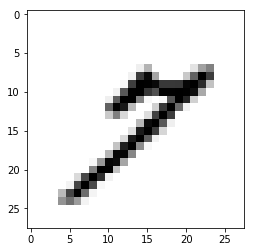

epoch:1number:0


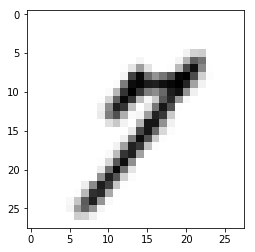

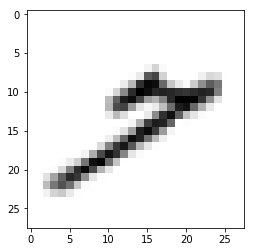

epoch:1number:1
epoch:1number:2
epoch:1number:3
epoch:1number:4
epoch:1number:5
epoch:1number:6
epoch:1number:7
epoch:1number:8
epoch:1number:9
epoch:1number:10
epoch:1number:11
epoch:1number:12
epoch:1number:13
epoch:1number:14
epoch:1number:15
epoch:1number:16
epoch:1number:17
epoch:1number:18
epoch:1number:19
epoch:1number:20
epoch:1number:21
epoch:1number:22
epoch:1number:23
epoch:1number:24
epoch:1number:25
epoch:1number:26
epoch:1number:27
epoch:1number:28
epoch:1number:29
epoch:1number:30
epoch:1number:31
epoch:1number:32
epoch:1number:33
epoch:1number:34
epoch:1number:35
epoch:1number:36
epoch:1number:37
epoch:1number:38
epoch:1number:39
epoch:1number:40
epoch:1number:41
epoch:1number:42
epoch:1number:43
epoch:1number:44
epoch:1number:45
epoch:1number:46
epoch:1number:47
epoch:1number:48
epoch:1number:49
epoch:1number:50
epoch:1number:51
epoch:1number:52
epoch:1number:53
epoch:1number:54
epoch:1number:55
epoch:1number:56
epoch:1number:57
epoch:1number:58
epoch:1number:59
epoch:

epoch:1number:482
epoch:1number:483
epoch:1number:484
epoch:1number:485
epoch:1number:486
epoch:1number:487
epoch:1number:488
epoch:1number:489
epoch:1number:490
epoch:1number:491
epoch:1number:492
epoch:1number:493
epoch:1number:494
epoch:1number:495
epoch:1number:496
epoch:1number:497
epoch:1number:498
epoch:1number:499
epoch:1number:500
epoch:1number:501
epoch:1number:502
epoch:1number:503
epoch:1number:504
epoch:1number:505
epoch:1number:506
epoch:1number:507
epoch:1number:508
epoch:1number:509
epoch:1number:510
epoch:1number:511
epoch:1number:512
epoch:1number:513
epoch:1number:514
epoch:1number:515
epoch:1number:516
epoch:1number:517
epoch:1number:518
epoch:1number:519
epoch:1number:520
epoch:1number:521
epoch:1number:522
epoch:1number:523
epoch:1number:524
epoch:1number:525
epoch:1number:526
epoch:1number:527
epoch:1number:528
epoch:1number:529
epoch:1number:530
epoch:1number:531
epoch:1number:532
epoch:1number:533
epoch:1number:534
epoch:1number:535
epoch:1number:536
epoch:1num

epoch:1number:967
epoch:1number:968
epoch:1number:969
epoch:1number:970
epoch:1number:971
epoch:1number:972
epoch:1number:973
epoch:1number:974
epoch:1number:975
epoch:1number:976
epoch:1number:977
epoch:1number:978
epoch:1number:979
epoch:1number:980
epoch:1number:981
epoch:1number:982
epoch:1number:983
epoch:1number:984
epoch:1number:985
epoch:1number:986
epoch:1number:987
epoch:1number:988
epoch:1number:989
epoch:1number:990
epoch:1number:991
epoch:1number:992
epoch:1number:993
epoch:1number:994
epoch:1number:995
epoch:1number:996
epoch:1number:997
epoch:1number:998
epoch:1number:999
epoch:1number:1000
epoch:1number:1001
epoch:1number:1002
epoch:1number:1003
epoch:1number:1004
epoch:1number:1005
epoch:1number:1006
epoch:1number:1007
epoch:1number:1008
epoch:1number:1009
epoch:1number:1010
epoch:1number:1011
epoch:1number:1012
epoch:1number:1013
epoch:1number:1014
epoch:1number:1015
epoch:1number:1016
epoch:1number:1017
epoch:1number:1018
epoch:1number:1019
epoch:1number:1020
epoch:1

epoch:1number:1425
epoch:1number:1426
epoch:1number:1427
epoch:1number:1428
epoch:1number:1429
epoch:1number:1430
epoch:1number:1431
epoch:1number:1432
epoch:1number:1433
epoch:1number:1434
epoch:1number:1435
epoch:1number:1436
epoch:1number:1437
epoch:1number:1438
epoch:1number:1439
epoch:1number:1440
epoch:1number:1441
epoch:1number:1442
epoch:1number:1443
epoch:1number:1444
epoch:1number:1445
epoch:1number:1446
epoch:1number:1447
epoch:1number:1448
epoch:1number:1449
epoch:1number:1450
epoch:1number:1451
epoch:1number:1452
epoch:1number:1453
epoch:1number:1454
epoch:1number:1455
epoch:1number:1456
epoch:1number:1457
epoch:1number:1458
epoch:1number:1459
epoch:1number:1460
epoch:1number:1461
epoch:1number:1462
epoch:1number:1463
epoch:1number:1464
epoch:1number:1465
epoch:1number:1466
epoch:1number:1467
epoch:1number:1468
epoch:1number:1469
epoch:1number:1470
epoch:1number:1471
epoch:1number:1472
epoch:1number:1473
epoch:1number:1474
epoch:1number:1475
epoch:1number:1476
epoch:1numbe

epoch:1number:1886
epoch:1number:1887
epoch:1number:1888
epoch:1number:1889
epoch:1number:1890
epoch:1number:1891
epoch:1number:1892
epoch:1number:1893
epoch:1number:1894
epoch:1number:1895
epoch:1number:1896
epoch:1number:1897
epoch:1number:1898
epoch:1number:1899
epoch:1number:1900
epoch:1number:1901
epoch:1number:1902
epoch:1number:1903
epoch:1number:1904
epoch:1number:1905
epoch:1number:1906
epoch:1number:1907
epoch:1number:1908
epoch:1number:1909
epoch:1number:1910
epoch:1number:1911
epoch:1number:1912
epoch:1number:1913
epoch:1number:1914
epoch:1number:1915
epoch:1number:1916
epoch:1number:1917
epoch:1number:1918
epoch:1number:1919
epoch:1number:1920
epoch:1number:1921
epoch:1number:1922
epoch:1number:1923
epoch:1number:1924
epoch:1number:1925
epoch:1number:1926
epoch:1number:1927
epoch:1number:1928
epoch:1number:1929
epoch:1number:1930
epoch:1number:1931
epoch:1number:1932
epoch:1number:1933
epoch:1number:1934
epoch:1number:1935
epoch:1number:1936
epoch:1number:1937
epoch:1numbe

epoch:1number:2344
epoch:1number:2345
epoch:1number:2346
epoch:1number:2347
epoch:1number:2348
epoch:1number:2349
epoch:1number:2350
epoch:1number:2351
epoch:1number:2352
epoch:1number:2353
epoch:1number:2354
epoch:1number:2355
epoch:1number:2356
epoch:1number:2357
epoch:1number:2358
epoch:1number:2359
epoch:1number:2360
epoch:1number:2361
epoch:1number:2362
epoch:1number:2363
epoch:1number:2364
epoch:1number:2365
epoch:1number:2366
epoch:1number:2367
epoch:1number:2368
epoch:1number:2369
epoch:1number:2370
epoch:1number:2371
epoch:1number:2372
epoch:1number:2373
epoch:1number:2374
epoch:1number:2375
epoch:1number:2376
epoch:1number:2377
epoch:1number:2378
epoch:1number:2379
epoch:1number:2380
epoch:1number:2381
epoch:1number:2382
epoch:1number:2383
epoch:1number:2384
epoch:1number:2385
epoch:1number:2386
epoch:1number:2387
epoch:1number:2388
epoch:1number:2389
epoch:1number:2390
epoch:1number:2391
epoch:1number:2392
epoch:1number:2393
epoch:1number:2394
epoch:1number:2395
epoch:1numbe

epoch:1number:2798
epoch:1number:2799
epoch:1number:2800
epoch:1number:2801
epoch:1number:2802
epoch:1number:2803
epoch:1number:2804
epoch:1number:2805
epoch:1number:2806
epoch:1number:2807
epoch:1number:2808
epoch:1number:2809
epoch:1number:2810
epoch:1number:2811
epoch:1number:2812
epoch:1number:2813
epoch:1number:2814
epoch:1number:2815
epoch:1number:2816
epoch:1number:2817
epoch:1number:2818
epoch:1number:2819
epoch:1number:2820
epoch:1number:2821
epoch:1number:2822
epoch:1number:2823
epoch:1number:2824
epoch:1number:2825
epoch:1number:2826
epoch:1number:2827
epoch:1number:2828
epoch:1number:2829
epoch:1number:2830
epoch:1number:2831
epoch:1number:2832
epoch:1number:2833
epoch:1number:2834
epoch:1number:2835
epoch:1number:2836
epoch:1number:2837
epoch:1number:2838
epoch:1number:2839
epoch:1number:2840
epoch:1number:2841
epoch:1number:2842
epoch:1number:2843
epoch:1number:2844
epoch:1number:2845
epoch:1number:2846
epoch:1number:2847
epoch:1number:2848
epoch:1number:2849
epoch:1numbe

epoch:1number:3251
epoch:1number:3252
epoch:1number:3253
epoch:1number:3254
epoch:1number:3255
epoch:1number:3256
epoch:1number:3257
epoch:1number:3258
epoch:1number:3259
epoch:1number:3260
epoch:1number:3261
epoch:1number:3262
epoch:1number:3263
epoch:1number:3264
epoch:1number:3265
epoch:1number:3266
epoch:1number:3267
epoch:1number:3268
epoch:1number:3269
epoch:1number:3270
epoch:1number:3271
epoch:1number:3272
epoch:1number:3273
epoch:1number:3274
epoch:1number:3275
epoch:1number:3276
epoch:1number:3277
epoch:1number:3278
epoch:1number:3279
epoch:1number:3280
epoch:1number:3281
epoch:1number:3282
epoch:1number:3283
epoch:1number:3284
epoch:1number:3285
epoch:1number:3286
epoch:1number:3287
epoch:1number:3288
epoch:1number:3289
epoch:1number:3290
epoch:1number:3291
epoch:1number:3292
epoch:1number:3293
epoch:1number:3294
epoch:1number:3295
epoch:1number:3296
epoch:1number:3297
epoch:1number:3298
epoch:1number:3299
epoch:1number:3300
epoch:1number:3301
epoch:1number:3302
epoch:1numbe

epoch:1number:3711
epoch:1number:3712
epoch:1number:3713
epoch:1number:3714
epoch:1number:3715
epoch:1number:3716
epoch:1number:3717
epoch:1number:3718
epoch:1number:3719
epoch:1number:3720
epoch:1number:3721
epoch:1number:3722
epoch:1number:3723
epoch:1number:3724
epoch:1number:3725
epoch:1number:3726
epoch:1number:3727
epoch:1number:3728
epoch:1number:3729
epoch:1number:3730
epoch:1number:3731
epoch:1number:3732
epoch:1number:3733
epoch:1number:3734
epoch:1number:3735
epoch:1number:3736
epoch:1number:3737
epoch:1number:3738
epoch:1number:3739
epoch:1number:3740
epoch:1number:3741
epoch:1number:3742
epoch:1number:3743
epoch:1number:3744
epoch:1number:3745
epoch:1number:3746
epoch:1number:3747
epoch:1number:3748
epoch:1number:3749
epoch:1number:3750
epoch:1number:3751
epoch:1number:3752
epoch:1number:3753
epoch:1number:3754
epoch:1number:3755
epoch:1number:3756
epoch:1number:3757
epoch:1number:3758
epoch:1number:3759
epoch:1number:3760
epoch:1number:3761
epoch:1number:3762
epoch:1numbe

epoch:1number:4164
epoch:1number:4165
epoch:1number:4166
epoch:1number:4167
epoch:1number:4168
epoch:1number:4169
epoch:1number:4170
epoch:1number:4171
epoch:1number:4172
epoch:1number:4173
epoch:1number:4174
epoch:1number:4175
epoch:1number:4176
epoch:1number:4177
epoch:1number:4178
epoch:1number:4179
epoch:1number:4180
epoch:1number:4181
epoch:1number:4182
epoch:1number:4183
epoch:1number:4184
epoch:1number:4185
epoch:1number:4186
epoch:1number:4187
epoch:1number:4188
epoch:1number:4189
epoch:1number:4190
epoch:1number:4191
epoch:1number:4192
epoch:1number:4193
epoch:1number:4194
epoch:1number:4195
epoch:1number:4196
epoch:1number:4197
epoch:1number:4198
epoch:1number:4199
epoch:1number:4200
epoch:1number:4201
epoch:1number:4202
epoch:1number:4203
epoch:1number:4204
epoch:1number:4205
epoch:1number:4206
epoch:1number:4207
epoch:1number:4208
epoch:1number:4209
epoch:1number:4210
epoch:1number:4211
epoch:1number:4212
epoch:1number:4213
epoch:1number:4214
epoch:1number:4215
epoch:1numbe

epoch:1number:4612
epoch:1number:4613
epoch:1number:4614
epoch:1number:4615
epoch:1number:4616
epoch:1number:4617
epoch:1number:4618
epoch:1number:4619
epoch:1number:4620
epoch:1number:4621
epoch:1number:4622
epoch:1number:4623
epoch:1number:4624
epoch:1number:4625
epoch:1number:4626
epoch:1number:4627
epoch:1number:4628
epoch:1number:4629
epoch:1number:4630
epoch:1number:4631
epoch:1number:4632
epoch:1number:4633
epoch:1number:4634
epoch:1number:4635
epoch:1number:4636
epoch:1number:4637
epoch:1number:4638
epoch:1number:4639
epoch:1number:4640
epoch:1number:4641
epoch:1number:4642
epoch:1number:4643
epoch:1number:4644
epoch:1number:4645
epoch:1number:4646
epoch:1number:4647
epoch:1number:4648
epoch:1number:4649
epoch:1number:4650
epoch:1number:4651
epoch:1number:4652
epoch:1number:4653
epoch:1number:4654
epoch:1number:4655
epoch:1number:4656
epoch:1number:4657
epoch:1number:4658
epoch:1number:4659
epoch:1number:4660
epoch:1number:4661
epoch:1number:4662
epoch:1number:4663
epoch:1numbe

epoch:1number:5074
epoch:1number:5075
epoch:1number:5076
epoch:1number:5077
epoch:1number:5078
epoch:1number:5079
epoch:1number:5080
epoch:1number:5081
epoch:1number:5082
epoch:1number:5083
epoch:1number:5084
epoch:1number:5085
epoch:1number:5086
epoch:1number:5087
epoch:1number:5088
epoch:1number:5089
epoch:1number:5090
epoch:1number:5091
epoch:1number:5092
epoch:1number:5093
epoch:1number:5094
epoch:1number:5095
epoch:1number:5096
epoch:1number:5097
epoch:1number:5098
epoch:1number:5099
epoch:1number:5100
epoch:1number:5101
epoch:1number:5102
epoch:1number:5103
epoch:1number:5104
epoch:1number:5105
epoch:1number:5106
epoch:1number:5107
epoch:1number:5108
epoch:1number:5109
epoch:1number:5110
epoch:1number:5111
epoch:1number:5112
epoch:1number:5113
epoch:1number:5114
epoch:1number:5115
epoch:1number:5116
epoch:1number:5117
epoch:1number:5118
epoch:1number:5119
epoch:1number:5120
epoch:1number:5121
epoch:1number:5122
epoch:1number:5123
epoch:1number:5124
epoch:1number:5125
epoch:1numbe

epoch:1number:5531
epoch:1number:5532
epoch:1number:5533
epoch:1number:5534
epoch:1number:5535
epoch:1number:5536
epoch:1number:5537
epoch:1number:5538
epoch:1number:5539
epoch:1number:5540
epoch:1number:5541
epoch:1number:5542
epoch:1number:5543
epoch:1number:5544
epoch:1number:5545
epoch:1number:5546
epoch:1number:5547
epoch:1number:5548
epoch:1number:5549
epoch:1number:5550
epoch:1number:5551
epoch:1number:5552
epoch:1number:5553
epoch:1number:5554
epoch:1number:5555
epoch:1number:5556
epoch:1number:5557
epoch:1number:5558
epoch:1number:5559
epoch:1number:5560
epoch:1number:5561
epoch:1number:5562
epoch:1number:5563
epoch:1number:5564
epoch:1number:5565
epoch:1number:5566
epoch:1number:5567
epoch:1number:5568
epoch:1number:5569
epoch:1number:5570
epoch:1number:5571
epoch:1number:5572
epoch:1number:5573
epoch:1number:5574
epoch:1number:5575
epoch:1number:5576
epoch:1number:5577
epoch:1number:5578
epoch:1number:5579
epoch:1number:5580
epoch:1number:5581
epoch:1number:5582
epoch:1numbe

epoch:1number:5987
epoch:1number:5988
epoch:1number:5989
epoch:1number:5990
epoch:1number:5991
epoch:1number:5992
epoch:1number:5993
epoch:1number:5994
epoch:1number:5995
epoch:1number:5996
epoch:1number:5997
epoch:1number:5998
epoch:1number:5999
epoch:1number:6000
epoch:1number:6001
epoch:1number:6002
epoch:1number:6003
epoch:1number:6004
epoch:1number:6005
epoch:1number:6006
epoch:1number:6007
epoch:1number:6008
epoch:1number:6009
epoch:1number:6010
epoch:1number:6011
epoch:1number:6012
epoch:1number:6013
epoch:1number:6014
epoch:1number:6015
epoch:1number:6016
epoch:1number:6017
epoch:1number:6018
epoch:1number:6019
epoch:1number:6020
epoch:1number:6021
epoch:1number:6022
epoch:1number:6023
epoch:1number:6024
epoch:1number:6025
epoch:1number:6026
epoch:1number:6027
epoch:1number:6028
epoch:1number:6029
epoch:1number:6030
epoch:1number:6031
epoch:1number:6032
epoch:1number:6033
epoch:1number:6034
epoch:1number:6035
epoch:1number:6036
epoch:1number:6037
epoch:1number:6038
epoch:1numbe

epoch:1number:6446
epoch:1number:6447
epoch:1number:6448
epoch:1number:6449
epoch:1number:6450
epoch:1number:6451
epoch:1number:6452
epoch:1number:6453
epoch:1number:6454
epoch:1number:6455
epoch:1number:6456
epoch:1number:6457
epoch:1number:6458
epoch:1number:6459
epoch:1number:6460
epoch:1number:6461
epoch:1number:6462
epoch:1number:6463
epoch:1number:6464
epoch:1number:6465
epoch:1number:6466
epoch:1number:6467
epoch:1number:6468
epoch:1number:6469
epoch:1number:6470
epoch:1number:6471
epoch:1number:6472
epoch:1number:6473
epoch:1number:6474
epoch:1number:6475
epoch:1number:6476
epoch:1number:6477
epoch:1number:6478
epoch:1number:6479
epoch:1number:6480
epoch:1number:6481
epoch:1number:6482
epoch:1number:6483
epoch:1number:6484
epoch:1number:6485
epoch:1number:6486
epoch:1number:6487
epoch:1number:6488
epoch:1number:6489
epoch:1number:6490
epoch:1number:6491
epoch:1number:6492
epoch:1number:6493
epoch:1number:6494
epoch:1number:6495
epoch:1number:6496
epoch:1number:6497
epoch:1numbe

epoch:1number:6895
epoch:1number:6896
epoch:1number:6897
epoch:1number:6898
epoch:1number:6899
epoch:1number:6900
epoch:1number:6901
epoch:1number:6902
epoch:1number:6903
epoch:1number:6904
epoch:1number:6905
epoch:1number:6906
epoch:1number:6907
epoch:1number:6908
epoch:1number:6909
epoch:1number:6910
epoch:1number:6911
epoch:1number:6912
epoch:1number:6913
epoch:1number:6914
epoch:1number:6915
epoch:1number:6916
epoch:1number:6917
epoch:1number:6918
epoch:1number:6919
epoch:1number:6920
epoch:1number:6921
epoch:1number:6922
epoch:1number:6923
epoch:1number:6924
epoch:1number:6925
epoch:1number:6926
epoch:1number:6927
epoch:1number:6928
epoch:1number:6929
epoch:1number:6930
epoch:1number:6931
epoch:1number:6932
epoch:1number:6933
epoch:1number:6934
epoch:1number:6935
epoch:1number:6936
epoch:1number:6937
epoch:1number:6938
epoch:1number:6939
epoch:1number:6940
epoch:1number:6941
epoch:1number:6942
epoch:1number:6943
epoch:1number:6944
epoch:1number:6945
epoch:1number:6946
epoch:1numbe

epoch:1number:7355
epoch:1number:7356
epoch:1number:7357
epoch:1number:7358
epoch:1number:7359
epoch:1number:7360
epoch:1number:7361
epoch:1number:7362
epoch:1number:7363
epoch:1number:7364
epoch:1number:7365
epoch:1number:7366
epoch:1number:7367
epoch:1number:7368
epoch:1number:7369
epoch:1number:7370
epoch:1number:7371
epoch:1number:7372
epoch:1number:7373
epoch:1number:7374
epoch:1number:7375
epoch:1number:7376
epoch:1number:7377
epoch:1number:7378
epoch:1number:7379
epoch:1number:7380
epoch:1number:7381
epoch:1number:7382
epoch:1number:7383
epoch:1number:7384
epoch:1number:7385
epoch:1number:7386
epoch:1number:7387
epoch:1number:7388
epoch:1number:7389
epoch:1number:7390
epoch:1number:7391
epoch:1number:7392
epoch:1number:7393
epoch:1number:7394
epoch:1number:7395
epoch:1number:7396
epoch:1number:7397
epoch:1number:7398
epoch:1number:7399
epoch:1number:7400
epoch:1number:7401
epoch:1number:7402
epoch:1number:7403
epoch:1number:7404
epoch:1number:7405
epoch:1number:7406
epoch:1numbe

epoch:1number:7795
epoch:1number:7796
epoch:1number:7797
epoch:1number:7798
epoch:1number:7799
epoch:1number:7800
epoch:1number:7801
epoch:1number:7802
epoch:1number:7803
epoch:1number:7804
epoch:1number:7805
epoch:1number:7806
epoch:1number:7807
epoch:1number:7808
epoch:1number:7809
epoch:1number:7810
epoch:1number:7811
epoch:1number:7812
epoch:1number:7813
epoch:1number:7814
epoch:1number:7815
epoch:1number:7816
epoch:1number:7817
epoch:1number:7818
epoch:1number:7819
epoch:1number:7820
epoch:1number:7821
epoch:1number:7822
epoch:1number:7823
epoch:1number:7824
epoch:1number:7825
epoch:1number:7826
epoch:1number:7827
epoch:1number:7828
epoch:1number:7829
epoch:1number:7830
epoch:1number:7831
epoch:1number:7832
epoch:1number:7833
epoch:1number:7834
epoch:1number:7835
epoch:1number:7836
epoch:1number:7837
epoch:1number:7838
epoch:1number:7839
epoch:1number:7840
epoch:1number:7841
epoch:1number:7842
epoch:1number:7843
epoch:1number:7844
epoch:1number:7845
epoch:1number:7846
epoch:1numbe

epoch:1number:8254
epoch:1number:8255
epoch:1number:8256
epoch:1number:8257
epoch:1number:8258
epoch:1number:8259
epoch:1number:8260
epoch:1number:8261
epoch:1number:8262
epoch:1number:8263
epoch:1number:8264
epoch:1number:8265
epoch:1number:8266
epoch:1number:8267
epoch:1number:8268
epoch:1number:8269
epoch:1number:8270
epoch:1number:8271
epoch:1number:8272
epoch:1number:8273
epoch:1number:8274
epoch:1number:8275
epoch:1number:8276
epoch:1number:8277
epoch:1number:8278
epoch:1number:8279
epoch:1number:8280
epoch:1number:8281
epoch:1number:8282
epoch:1number:8283
epoch:1number:8284
epoch:1number:8285
epoch:1number:8286
epoch:1number:8287
epoch:1number:8288
epoch:1number:8289
epoch:1number:8290
epoch:1number:8291
epoch:1number:8292
epoch:1number:8293
epoch:1number:8294
epoch:1number:8295
epoch:1number:8296
epoch:1number:8297
epoch:1number:8298
epoch:1number:8299
epoch:1number:8300
epoch:1number:8301
epoch:1number:8302
epoch:1number:8303
epoch:1number:8304
epoch:1number:8305
epoch:1numbe

epoch:1number:8712
epoch:1number:8713
epoch:1number:8714
epoch:1number:8715
epoch:1number:8716
epoch:1number:8717
epoch:1number:8718
epoch:1number:8719
epoch:1number:8720
epoch:1number:8721
epoch:1number:8722
epoch:1number:8723
epoch:1number:8724
epoch:1number:8725
epoch:1number:8726
epoch:1number:8727
epoch:1number:8728
epoch:1number:8729
epoch:1number:8730
epoch:1number:8731
epoch:1number:8732
epoch:1number:8733
epoch:1number:8734
epoch:1number:8735
epoch:1number:8736
epoch:1number:8737
epoch:1number:8738
epoch:1number:8739
epoch:1number:8740
epoch:1number:8741
epoch:1number:8742
epoch:1number:8743
epoch:1number:8744
epoch:1number:8745
epoch:1number:8746
epoch:1number:8747
epoch:1number:8748
epoch:1number:8749
epoch:1number:8750
epoch:1number:8751
epoch:1number:8752
epoch:1number:8753
epoch:1number:8754
epoch:1number:8755
epoch:1number:8756
epoch:1number:8757
epoch:1number:8758
epoch:1number:8759
epoch:1number:8760
epoch:1number:8761
epoch:1number:8762
epoch:1number:8763
epoch:1numbe

epoch:1number:9171
epoch:1number:9172
epoch:1number:9173
epoch:1number:9174
epoch:1number:9175
epoch:1number:9176
epoch:1number:9177
epoch:1number:9178
epoch:1number:9179
epoch:1number:9180
epoch:1number:9181
epoch:1number:9182
epoch:1number:9183
epoch:1number:9184
epoch:1number:9185
epoch:1number:9186
epoch:1number:9187
epoch:1number:9188
epoch:1number:9189
epoch:1number:9190
epoch:1number:9191
epoch:1number:9192
epoch:1number:9193
epoch:1number:9194
epoch:1number:9195
epoch:1number:9196
epoch:1number:9197
epoch:1number:9198
epoch:1number:9199
epoch:1number:9200
epoch:1number:9201
epoch:1number:9202
epoch:1number:9203
epoch:1number:9204
epoch:1number:9205
epoch:1number:9206
epoch:1number:9207
epoch:1number:9208
epoch:1number:9209
epoch:1number:9210
epoch:1number:9211
epoch:1number:9212
epoch:1number:9213
epoch:1number:9214
epoch:1number:9215
epoch:1number:9216
epoch:1number:9217
epoch:1number:9218
epoch:1number:9219
epoch:1number:9220
epoch:1number:9221
epoch:1number:9222
epoch:1numbe

epoch:1number:9628
epoch:1number:9629
epoch:1number:9630
epoch:1number:9631
epoch:1number:9632
epoch:1number:9633
epoch:1number:9634
epoch:1number:9635
epoch:1number:9636
epoch:1number:9637
epoch:1number:9638
epoch:1number:9639
epoch:1number:9640
epoch:1number:9641
epoch:1number:9642
epoch:1number:9643
epoch:1number:9644
epoch:1number:9645
epoch:1number:9646
epoch:1number:9647
epoch:1number:9648
epoch:1number:9649
epoch:1number:9650
epoch:1number:9651
epoch:1number:9652
epoch:1number:9653
epoch:1number:9654
epoch:1number:9655
epoch:1number:9656
epoch:1number:9657
epoch:1number:9658
epoch:1number:9659
epoch:1number:9660
epoch:1number:9661
epoch:1number:9662
epoch:1number:9663
epoch:1number:9664
epoch:1number:9665
epoch:1number:9666
epoch:1number:9667
epoch:1number:9668
epoch:1number:9669
epoch:1number:9670
epoch:1number:9671
epoch:1number:9672
epoch:1number:9673
epoch:1number:9674
epoch:1number:9675
epoch:1number:9676
epoch:1number:9677
epoch:1number:9678
epoch:1number:9679
epoch:1numbe

epoch:1number:10082
epoch:1number:10083
epoch:1number:10084
epoch:1number:10085
epoch:1number:10086
epoch:1number:10087
epoch:1number:10088
epoch:1number:10089
epoch:1number:10090
epoch:1number:10091
epoch:1number:10092
epoch:1number:10093
epoch:1number:10094
epoch:1number:10095
epoch:1number:10096
epoch:1number:10097
epoch:1number:10098
epoch:1number:10099
epoch:1number:10100
epoch:1number:10101
epoch:1number:10102
epoch:1number:10103
epoch:1number:10104
epoch:1number:10105
epoch:1number:10106
epoch:1number:10107
epoch:1number:10108
epoch:1number:10109
epoch:1number:10110
epoch:1number:10111
epoch:1number:10112
epoch:1number:10113
epoch:1number:10114
epoch:1number:10115
epoch:1number:10116
epoch:1number:10117
epoch:1number:10118
epoch:1number:10119
epoch:1number:10120
epoch:1number:10121
epoch:1number:10122
epoch:1number:10123
epoch:1number:10124
epoch:1number:10125
epoch:1number:10126
epoch:1number:10127
epoch:1number:10128
epoch:1number:10129
epoch:1number:10130
epoch:1number:10131


epoch:1number:10508
epoch:1number:10509
epoch:1number:10510
epoch:1number:10511
epoch:1number:10512
epoch:1number:10513
epoch:1number:10514
epoch:1number:10515
epoch:1number:10516
epoch:1number:10517
epoch:1number:10518
epoch:1number:10519
epoch:1number:10520
epoch:1number:10521
epoch:1number:10522
epoch:1number:10523
epoch:1number:10524
epoch:1number:10525
epoch:1number:10526
epoch:1number:10527
epoch:1number:10528
epoch:1number:10529
epoch:1number:10530
epoch:1number:10531
epoch:1number:10532
epoch:1number:10533
epoch:1number:10534
epoch:1number:10535
epoch:1number:10536
epoch:1number:10537
epoch:1number:10538
epoch:1number:10539
epoch:1number:10540
epoch:1number:10541
epoch:1number:10542
epoch:1number:10543
epoch:1number:10544
epoch:1number:10545
epoch:1number:10546
epoch:1number:10547
epoch:1number:10548
epoch:1number:10549
epoch:1number:10550
epoch:1number:10551
epoch:1number:10552
epoch:1number:10553
epoch:1number:10554
epoch:1number:10555
epoch:1number:10556
epoch:1number:10557


epoch:1number:10933
epoch:1number:10934
epoch:1number:10935
epoch:1number:10936
epoch:1number:10937
epoch:1number:10938
epoch:1number:10939
epoch:1number:10940
epoch:1number:10941
epoch:1number:10942
epoch:1number:10943
epoch:1number:10944
epoch:1number:10945
epoch:1number:10946
epoch:1number:10947
epoch:1number:10948
epoch:1number:10949
epoch:1number:10950
epoch:1number:10951
epoch:1number:10952
epoch:1number:10953
epoch:1number:10954
epoch:1number:10955
epoch:1number:10956
epoch:1number:10957
epoch:1number:10958
epoch:1number:10959
epoch:1number:10960
epoch:1number:10961
epoch:1number:10962
epoch:1number:10963
epoch:1number:10964
epoch:1number:10965
epoch:1number:10966
epoch:1number:10967
epoch:1number:10968
epoch:1number:10969
epoch:1number:10970
epoch:1number:10971
epoch:1number:10972
epoch:1number:10973
epoch:1number:10974
epoch:1number:10975
epoch:1number:10976
epoch:1number:10977
epoch:1number:10978
epoch:1number:10979
epoch:1number:10980
epoch:1number:10981
epoch:1number:10982


epoch:1number:11360
epoch:1number:11361
epoch:1number:11362
epoch:1number:11363
epoch:1number:11364
epoch:1number:11365
epoch:1number:11366
epoch:1number:11367
epoch:1number:11368
epoch:1number:11369
epoch:1number:11370
epoch:1number:11371
epoch:1number:11372
epoch:1number:11373
epoch:1number:11374
epoch:1number:11375
epoch:1number:11376
epoch:1number:11377
epoch:1number:11378
epoch:1number:11379
epoch:1number:11380
epoch:1number:11381
epoch:1number:11382
epoch:1number:11383
epoch:1number:11384
epoch:1number:11385
epoch:1number:11386
epoch:1number:11387
epoch:1number:11388
epoch:1number:11389
epoch:1number:11390
epoch:1number:11391
epoch:1number:11392
epoch:1number:11393
epoch:1number:11394
epoch:1number:11395
epoch:1number:11396
epoch:1number:11397
epoch:1number:11398
epoch:1number:11399
epoch:1number:11400
epoch:1number:11401
epoch:1number:11402
epoch:1number:11403
epoch:1number:11404
epoch:1number:11405
epoch:1number:11406
epoch:1number:11407
epoch:1number:11408
epoch:1number:11409


epoch:1number:11778
epoch:1number:11779
epoch:1number:11780
epoch:1number:11781
epoch:1number:11782
epoch:1number:11783
epoch:1number:11784
epoch:1number:11785
epoch:1number:11786
epoch:1number:11787
epoch:1number:11788
epoch:1number:11789
epoch:1number:11790
epoch:1number:11791
epoch:1number:11792
epoch:1number:11793
epoch:1number:11794
epoch:1number:11795
epoch:1number:11796
epoch:1number:11797
epoch:1number:11798
epoch:1number:11799
epoch:1number:11800
epoch:1number:11801
epoch:1number:11802
epoch:1number:11803
epoch:1number:11804
epoch:1number:11805
epoch:1number:11806
epoch:1number:11807
epoch:1number:11808
epoch:1number:11809
epoch:1number:11810
epoch:1number:11811
epoch:1number:11812
epoch:1number:11813
epoch:1number:11814
epoch:1number:11815
epoch:1number:11816
epoch:1number:11817
epoch:1number:11818
epoch:1number:11819
epoch:1number:11820
epoch:1number:11821
epoch:1number:11822
epoch:1number:11823
epoch:1number:11824
epoch:1number:11825
epoch:1number:11826
epoch:1number:11827


epoch:1number:12206
epoch:1number:12207
epoch:1number:12208
epoch:1number:12209
epoch:1number:12210
epoch:1number:12211
epoch:1number:12212
epoch:1number:12213
epoch:1number:12214
epoch:1number:12215
epoch:1number:12216
epoch:1number:12217
epoch:1number:12218
epoch:1number:12219
epoch:1number:12220
epoch:1number:12221
epoch:1number:12222
epoch:1number:12223
epoch:1number:12224
epoch:1number:12225
epoch:1number:12226
epoch:1number:12227
epoch:1number:12228
epoch:1number:12229
epoch:1number:12230
epoch:1number:12231
epoch:1number:12232
epoch:1number:12233
epoch:1number:12234
epoch:1number:12235
epoch:1number:12236
epoch:1number:12237
epoch:1number:12238
epoch:1number:12239
epoch:1number:12240
epoch:1number:12241
epoch:1number:12242
epoch:1number:12243
epoch:1number:12244
epoch:1number:12245
epoch:1number:12246
epoch:1number:12247
epoch:1number:12248
epoch:1number:12249
epoch:1number:12250
epoch:1number:12251
epoch:1number:12252
epoch:1number:12253
epoch:1number:12254
epoch:1number:12255


epoch:1number:12636
epoch:1number:12637
epoch:1number:12638
epoch:1number:12639
epoch:1number:12640
epoch:1number:12641
epoch:1number:12642
epoch:1number:12643
epoch:1number:12644
epoch:1number:12645
epoch:1number:12646
epoch:1number:12647
epoch:1number:12648
epoch:1number:12649
epoch:1number:12650
epoch:1number:12651
epoch:1number:12652
epoch:1number:12653
epoch:1number:12654
epoch:1number:12655
epoch:1number:12656
epoch:1number:12657
epoch:1number:12658
epoch:1number:12659
epoch:1number:12660
epoch:1number:12661
epoch:1number:12662
epoch:1number:12663
epoch:1number:12664
epoch:1number:12665
epoch:1number:12666
epoch:1number:12667
epoch:1number:12668
epoch:1number:12669
epoch:1number:12670
epoch:1number:12671
epoch:1number:12672
epoch:1number:12673
epoch:1number:12674
epoch:1number:12675
epoch:1number:12676
epoch:1number:12677
epoch:1number:12678
epoch:1number:12679
epoch:1number:12680
epoch:1number:12681
epoch:1number:12682
epoch:1number:12683
epoch:1number:12684
epoch:1number:12685


epoch:1number:13051
epoch:1number:13052
epoch:1number:13053
epoch:1number:13054
epoch:1number:13055
epoch:1number:13056
epoch:1number:13057
epoch:1number:13058
epoch:1number:13059
epoch:1number:13060
epoch:1number:13061
epoch:1number:13062
epoch:1number:13063
epoch:1number:13064
epoch:1number:13065
epoch:1number:13066
epoch:1number:13067
epoch:1number:13068
epoch:1number:13069
epoch:1number:13070
epoch:1number:13071
epoch:1number:13072
epoch:1number:13073
epoch:1number:13074
epoch:1number:13075
epoch:1number:13076
epoch:1number:13077
epoch:1number:13078
epoch:1number:13079
epoch:1number:13080
epoch:1number:13081
epoch:1number:13082
epoch:1number:13083
epoch:1number:13084
epoch:1number:13085
epoch:1number:13086
epoch:1number:13087
epoch:1number:13088
epoch:1number:13089
epoch:1number:13090
epoch:1number:13091
epoch:1number:13092
epoch:1number:13093
epoch:1number:13094
epoch:1number:13095
epoch:1number:13096
epoch:1number:13097
epoch:1number:13098
epoch:1number:13099
epoch:1number:13100


epoch:1number:13472
epoch:1number:13473
epoch:1number:13474
epoch:1number:13475
epoch:1number:13476
epoch:1number:13477
epoch:1number:13478
epoch:1number:13479
epoch:1number:13480
epoch:1number:13481
epoch:1number:13482
epoch:1number:13483
epoch:1number:13484
epoch:1number:13485
epoch:1number:13486
epoch:1number:13487
epoch:1number:13488
epoch:1number:13489
epoch:1number:13490
epoch:1number:13491
epoch:1number:13492
epoch:1number:13493
epoch:1number:13494
epoch:1number:13495
epoch:1number:13496
epoch:1number:13497
epoch:1number:13498
epoch:1number:13499
epoch:1number:13500
epoch:1number:13501
epoch:1number:13502
epoch:1number:13503
epoch:1number:13504
epoch:1number:13505
epoch:1number:13506
epoch:1number:13507
epoch:1number:13508
epoch:1number:13509
epoch:1number:13510
epoch:1number:13511
epoch:1number:13512
epoch:1number:13513
epoch:1number:13514
epoch:1number:13515
epoch:1number:13516
epoch:1number:13517
epoch:1number:13518
epoch:1number:13519
epoch:1number:13520
epoch:1number:13521


epoch:1number:13897
epoch:1number:13898
epoch:1number:13899
epoch:1number:13900
epoch:1number:13901
epoch:1number:13902
epoch:1number:13903
epoch:1number:13904
epoch:1number:13905
epoch:1number:13906
epoch:1number:13907
epoch:1number:13908
epoch:1number:13909
epoch:1number:13910
epoch:1number:13911
epoch:1number:13912
epoch:1number:13913
epoch:1number:13914
epoch:1number:13915
epoch:1number:13916
epoch:1number:13917
epoch:1number:13918
epoch:1number:13919
epoch:1number:13920
epoch:1number:13921
epoch:1number:13922
epoch:1number:13923
epoch:1number:13924
epoch:1number:13925
epoch:1number:13926
epoch:1number:13927
epoch:1number:13928
epoch:1number:13929
epoch:1number:13930
epoch:1number:13931
epoch:1number:13932
epoch:1number:13933
epoch:1number:13934
epoch:1number:13935
epoch:1number:13936
epoch:1number:13937
epoch:1number:13938
epoch:1number:13939
epoch:1number:13940
epoch:1number:13941
epoch:1number:13942
epoch:1number:13943
epoch:1number:13944
epoch:1number:13945
epoch:1number:13946


epoch:1number:14322
epoch:1number:14323
epoch:1number:14324
epoch:1number:14325
epoch:1number:14326
epoch:1number:14327
epoch:1number:14328
epoch:1number:14329
epoch:1number:14330
epoch:1number:14331
epoch:1number:14332
epoch:1number:14333
epoch:1number:14334
epoch:1number:14335
epoch:1number:14336
epoch:1number:14337
epoch:1number:14338
epoch:1number:14339
epoch:1number:14340
epoch:1number:14341
epoch:1number:14342
epoch:1number:14343
epoch:1number:14344
epoch:1number:14345
epoch:1number:14346
epoch:1number:14347
epoch:1number:14348
epoch:1number:14349
epoch:1number:14350
epoch:1number:14351
epoch:1number:14352
epoch:1number:14353
epoch:1number:14354
epoch:1number:14355
epoch:1number:14356
epoch:1number:14357
epoch:1number:14358
epoch:1number:14359
epoch:1number:14360
epoch:1number:14361
epoch:1number:14362
epoch:1number:14363
epoch:1number:14364
epoch:1number:14365
epoch:1number:14366
epoch:1number:14367
epoch:1number:14368
epoch:1number:14369
epoch:1number:14370
epoch:1number:14371


epoch:1number:14746
epoch:1number:14747
epoch:1number:14748
epoch:1number:14749
epoch:1number:14750
epoch:1number:14751
epoch:1number:14752
epoch:1number:14753
epoch:1number:14754
epoch:1number:14755
epoch:1number:14756
epoch:1number:14757
epoch:1number:14758
epoch:1number:14759
epoch:1number:14760
epoch:1number:14761
epoch:1number:14762
epoch:1number:14763
epoch:1number:14764
epoch:1number:14765
epoch:1number:14766
epoch:1number:14767
epoch:1number:14768
epoch:1number:14769
epoch:1number:14770
epoch:1number:14771
epoch:1number:14772
epoch:1number:14773
epoch:1number:14774
epoch:1number:14775
epoch:1number:14776
epoch:1number:14777
epoch:1number:14778
epoch:1number:14779
epoch:1number:14780
epoch:1number:14781
epoch:1number:14782
epoch:1number:14783
epoch:1number:14784
epoch:1number:14785
epoch:1number:14786
epoch:1number:14787
epoch:1number:14788
epoch:1number:14789
epoch:1number:14790
epoch:1number:14791
epoch:1number:14792
epoch:1number:14793
epoch:1number:14794
epoch:1number:14795


epoch:1number:15168
epoch:1number:15169
epoch:1number:15170
epoch:1number:15171
epoch:1number:15172
epoch:1number:15173
epoch:1number:15174
epoch:1number:15175
epoch:1number:15176
epoch:1number:15177
epoch:1number:15178
epoch:1number:15179
epoch:1number:15180
epoch:1number:15181
epoch:1number:15182
epoch:1number:15183
epoch:1number:15184
epoch:1number:15185
epoch:1number:15186
epoch:1number:15187
epoch:1number:15188
epoch:1number:15189
epoch:1number:15190
epoch:1number:15191
epoch:1number:15192
epoch:1number:15193
epoch:1number:15194
epoch:1number:15195
epoch:1number:15196
epoch:1number:15197
epoch:1number:15198
epoch:1number:15199
epoch:1number:15200
epoch:1number:15201
epoch:1number:15202
epoch:1number:15203
epoch:1number:15204
epoch:1number:15205
epoch:1number:15206
epoch:1number:15207
epoch:1number:15208
epoch:1number:15209
epoch:1number:15210
epoch:1number:15211
epoch:1number:15212
epoch:1number:15213
epoch:1number:15214
epoch:1number:15215
epoch:1number:15216
epoch:1number:15217


epoch:1number:15593
epoch:1number:15594
epoch:1number:15595
epoch:1number:15596
epoch:1number:15597
epoch:1number:15598
epoch:1number:15599
epoch:1number:15600
epoch:1number:15601
epoch:1number:15602
epoch:1number:15603
epoch:1number:15604
epoch:1number:15605
epoch:1number:15606
epoch:1number:15607
epoch:1number:15608
epoch:1number:15609
epoch:1number:15610
epoch:1number:15611
epoch:1number:15612
epoch:1number:15613
epoch:1number:15614
epoch:1number:15615
epoch:1number:15616
epoch:1number:15617
epoch:1number:15618
epoch:1number:15619
epoch:1number:15620
epoch:1number:15621
epoch:1number:15622
epoch:1number:15623
epoch:1number:15624
epoch:1number:15625
epoch:1number:15626
epoch:1number:15627
epoch:1number:15628
epoch:1number:15629
epoch:1number:15630
epoch:1number:15631
epoch:1number:15632
epoch:1number:15633
epoch:1number:15634
epoch:1number:15635
epoch:1number:15636
epoch:1number:15637
epoch:1number:15638
epoch:1number:15639
epoch:1number:15640
epoch:1number:15641
epoch:1number:15642


epoch:1number:16015
epoch:1number:16016
epoch:1number:16017
epoch:1number:16018
epoch:1number:16019
epoch:1number:16020
epoch:1number:16021
epoch:1number:16022
epoch:1number:16023
epoch:1number:16024
epoch:1number:16025
epoch:1number:16026
epoch:1number:16027
epoch:1number:16028
epoch:1number:16029
epoch:1number:16030
epoch:1number:16031
epoch:1number:16032
epoch:1number:16033
epoch:1number:16034
epoch:1number:16035
epoch:1number:16036
epoch:1number:16037
epoch:1number:16038
epoch:1number:16039
epoch:1number:16040
epoch:1number:16041
epoch:1number:16042
epoch:1number:16043
epoch:1number:16044
epoch:1number:16045
epoch:1number:16046
epoch:1number:16047
epoch:1number:16048
epoch:1number:16049
epoch:1number:16050
epoch:1number:16051
epoch:1number:16052
epoch:1number:16053
epoch:1number:16054
epoch:1number:16055
epoch:1number:16056
epoch:1number:16057
epoch:1number:16058
epoch:1number:16059
epoch:1number:16060
epoch:1number:16061
epoch:1number:16062
epoch:1number:16063
epoch:1number:16064


epoch:1number:16454
epoch:1number:16455
epoch:1number:16456
epoch:1number:16457
epoch:1number:16458
epoch:1number:16459
epoch:1number:16460
epoch:1number:16461
epoch:1number:16462
epoch:1number:16463
epoch:1number:16464
epoch:1number:16465
epoch:1number:16466
epoch:1number:16467
epoch:1number:16468
epoch:1number:16469
epoch:1number:16470
epoch:1number:16471
epoch:1number:16472
epoch:1number:16473
epoch:1number:16474
epoch:1number:16475
epoch:1number:16476
epoch:1number:16477
epoch:1number:16478
epoch:1number:16479
epoch:1number:16480
epoch:1number:16481
epoch:1number:16482
epoch:1number:16483
epoch:1number:16484
epoch:1number:16485
epoch:1number:16486
epoch:1number:16487
epoch:1number:16488
epoch:1number:16489
epoch:1number:16490
epoch:1number:16491
epoch:1number:16492
epoch:1number:16493
epoch:1number:16494
epoch:1number:16495
epoch:1number:16496
epoch:1number:16497
epoch:1number:16498
epoch:1number:16499
epoch:1number:16500
epoch:1number:16501
epoch:1number:16502
epoch:1number:16503


epoch:1number:16877
epoch:1number:16878
epoch:1number:16879
epoch:1number:16880
epoch:1number:16881
epoch:1number:16882
epoch:1number:16883
epoch:1number:16884
epoch:1number:16885
epoch:1number:16886
epoch:1number:16887
epoch:1number:16888
epoch:1number:16889
epoch:1number:16890
epoch:1number:16891
epoch:1number:16892
epoch:1number:16893
epoch:1number:16894
epoch:1number:16895
epoch:1number:16896
epoch:1number:16897
epoch:1number:16898
epoch:1number:16899
epoch:1number:16900
epoch:1number:16901
epoch:1number:16902
epoch:1number:16903
epoch:1number:16904
epoch:1number:16905
epoch:1number:16906
epoch:1number:16907
epoch:1number:16908
epoch:1number:16909
epoch:1number:16910
epoch:1number:16911
epoch:1number:16912
epoch:1number:16913
epoch:1number:16914
epoch:1number:16915
epoch:1number:16916
epoch:1number:16917
epoch:1number:16918
epoch:1number:16919
epoch:1number:16920
epoch:1number:16921
epoch:1number:16922
epoch:1number:16923
epoch:1number:16924
epoch:1number:16925
epoch:1number:16926


epoch:1number:17310
epoch:1number:17311
epoch:1number:17312
epoch:1number:17313
epoch:1number:17314
epoch:1number:17315
epoch:1number:17316
epoch:1number:17317
epoch:1number:17318
epoch:1number:17319
epoch:1number:17320
epoch:1number:17321
epoch:1number:17322
epoch:1number:17323
epoch:1number:17324
epoch:1number:17325
epoch:1number:17326
epoch:1number:17327
epoch:1number:17328
epoch:1number:17329
epoch:1number:17330
epoch:1number:17331
epoch:1number:17332
epoch:1number:17333
epoch:1number:17334
epoch:1number:17335
epoch:1number:17336
epoch:1number:17337
epoch:1number:17338
epoch:1number:17339
epoch:1number:17340
epoch:1number:17341
epoch:1number:17342
epoch:1number:17343
epoch:1number:17344
epoch:1number:17345
epoch:1number:17346
epoch:1number:17347
epoch:1number:17348
epoch:1number:17349
epoch:1number:17350
epoch:1number:17351
epoch:1number:17352
epoch:1number:17353
epoch:1number:17354
epoch:1number:17355
epoch:1number:17356
epoch:1number:17357
epoch:1number:17358
epoch:1number:17359


epoch:1number:17733
epoch:1number:17734
epoch:1number:17735
epoch:1number:17736
epoch:1number:17737
epoch:1number:17738
epoch:1number:17739
epoch:1number:17740
epoch:1number:17741
epoch:1number:17742
epoch:1number:17743
epoch:1number:17744
epoch:1number:17745
epoch:1number:17746
epoch:1number:17747
epoch:1number:17748
epoch:1number:17749
epoch:1number:17750
epoch:1number:17751
epoch:1number:17752
epoch:1number:17753
epoch:1number:17754
epoch:1number:17755
epoch:1number:17756
epoch:1number:17757
epoch:1number:17758
epoch:1number:17759
epoch:1number:17760
epoch:1number:17761
epoch:1number:17762
epoch:1number:17763
epoch:1number:17764
epoch:1number:17765
epoch:1number:17766
epoch:1number:17767
epoch:1number:17768
epoch:1number:17769
epoch:1number:17770
epoch:1number:17771
epoch:1number:17772
epoch:1number:17773
epoch:1number:17774
epoch:1number:17775
epoch:1number:17776
epoch:1number:17777
epoch:1number:17778
epoch:1number:17779
epoch:1number:17780
epoch:1number:17781
epoch:1number:17782


epoch:1number:18154
epoch:1number:18155
epoch:1number:18156
epoch:1number:18157
epoch:1number:18158
epoch:1number:18159
epoch:1number:18160
epoch:1number:18161
epoch:1number:18162
epoch:1number:18163
epoch:1number:18164
epoch:1number:18165
epoch:1number:18166
epoch:1number:18167
epoch:1number:18168
epoch:1number:18169
epoch:1number:18170
epoch:1number:18171
epoch:1number:18172
epoch:1number:18173
epoch:1number:18174
epoch:1number:18175
epoch:1number:18176
epoch:1number:18177
epoch:1number:18178
epoch:1number:18179
epoch:1number:18180
epoch:1number:18181
epoch:1number:18182
epoch:1number:18183
epoch:1number:18184
epoch:1number:18185
epoch:1number:18186
epoch:1number:18187
epoch:1number:18188
epoch:1number:18189
epoch:1number:18190
epoch:1number:18191
epoch:1number:18192
epoch:1number:18193
epoch:1number:18194
epoch:1number:18195
epoch:1number:18196
epoch:1number:18197
epoch:1number:18198
epoch:1number:18199
epoch:1number:18200
epoch:1number:18201
epoch:1number:18202
epoch:1number:18203


epoch:1number:18581
epoch:1number:18582
epoch:1number:18583
epoch:1number:18584
epoch:1number:18585
epoch:1number:18586
epoch:1number:18587
epoch:1number:18588
epoch:1number:18589
epoch:1number:18590
epoch:1number:18591
epoch:1number:18592
epoch:1number:18593
epoch:1number:18594
epoch:1number:18595
epoch:1number:18596
epoch:1number:18597
epoch:1number:18598
epoch:1number:18599
epoch:1number:18600
epoch:1number:18601
epoch:1number:18602
epoch:1number:18603
epoch:1number:18604
epoch:1number:18605
epoch:1number:18606
epoch:1number:18607
epoch:1number:18608
epoch:1number:18609
epoch:1number:18610
epoch:1number:18611
epoch:1number:18612
epoch:1number:18613
epoch:1number:18614
epoch:1number:18615
epoch:1number:18616
epoch:1number:18617
epoch:1number:18618
epoch:1number:18619
epoch:1number:18620
epoch:1number:18621
epoch:1number:18622
epoch:1number:18623
epoch:1number:18624
epoch:1number:18625
epoch:1number:18626
epoch:1number:18627
epoch:1number:18628
epoch:1number:18629
epoch:1number:18630


epoch:1number:19008
epoch:1number:19009
epoch:1number:19010
epoch:1number:19011
epoch:1number:19012
epoch:1number:19013
epoch:1number:19014
epoch:1number:19015
epoch:1number:19016
epoch:1number:19017
epoch:1number:19018
epoch:1number:19019
epoch:1number:19020
epoch:1number:19021
epoch:1number:19022
epoch:1number:19023
epoch:1number:19024
epoch:1number:19025
epoch:1number:19026
epoch:1number:19027
epoch:1number:19028
epoch:1number:19029
epoch:1number:19030
epoch:1number:19031
epoch:1number:19032
epoch:1number:19033
epoch:1number:19034
epoch:1number:19035
epoch:1number:19036
epoch:1number:19037
epoch:1number:19038
epoch:1number:19039
epoch:1number:19040
epoch:1number:19041
epoch:1number:19042
epoch:1number:19043
epoch:1number:19044
epoch:1number:19045
epoch:1number:19046
epoch:1number:19047
epoch:1number:19048
epoch:1number:19049
epoch:1number:19050
epoch:1number:19051
epoch:1number:19052
epoch:1number:19053
epoch:1number:19054
epoch:1number:19055
epoch:1number:19056
epoch:1number:19057


epoch:1number:19435
epoch:1number:19436
epoch:1number:19437
epoch:1number:19438
epoch:1number:19439
epoch:1number:19440
epoch:1number:19441
epoch:1number:19442
epoch:1number:19443
epoch:1number:19444
epoch:1number:19445
epoch:1number:19446
epoch:1number:19447
epoch:1number:19448
epoch:1number:19449
epoch:1number:19450
epoch:1number:19451
epoch:1number:19452
epoch:1number:19453
epoch:1number:19454
epoch:1number:19455
epoch:1number:19456
epoch:1number:19457
epoch:1number:19458
epoch:1number:19459
epoch:1number:19460
epoch:1number:19461
epoch:1number:19462
epoch:1number:19463
epoch:1number:19464
epoch:1number:19465
epoch:1number:19466
epoch:1number:19467
epoch:1number:19468
epoch:1number:19469
epoch:1number:19470
epoch:1number:19471
epoch:1number:19472
epoch:1number:19473
epoch:1number:19474
epoch:1number:19475
epoch:1number:19476
epoch:1number:19477
epoch:1number:19478
epoch:1number:19479
epoch:1number:19480
epoch:1number:19481
epoch:1number:19482
epoch:1number:19483
epoch:1number:19484


epoch:1number:19857
epoch:1number:19858
epoch:1number:19859
epoch:1number:19860
epoch:1number:19861
epoch:1number:19862
epoch:1number:19863
epoch:1number:19864
epoch:1number:19865
epoch:1number:19866
epoch:1number:19867
epoch:1number:19868
epoch:1number:19869
epoch:1number:19870
epoch:1number:19871
epoch:1number:19872
epoch:1number:19873
epoch:1number:19874
epoch:1number:19875
epoch:1number:19876
epoch:1number:19877
epoch:1number:19878
epoch:1number:19879
epoch:1number:19880
epoch:1number:19881
epoch:1number:19882
epoch:1number:19883
epoch:1number:19884
epoch:1number:19885
epoch:1number:19886
epoch:1number:19887
epoch:1number:19888
epoch:1number:19889
epoch:1number:19890
epoch:1number:19891
epoch:1number:19892
epoch:1number:19893
epoch:1number:19894
epoch:1number:19895
epoch:1number:19896
epoch:1number:19897
epoch:1number:19898
epoch:1number:19899
epoch:1number:19900
epoch:1number:19901
epoch:1number:19902
epoch:1number:19903
epoch:1number:19904
epoch:1number:19905
epoch:1number:19906


epoch:1number:20284
epoch:1number:20285
epoch:1number:20286
epoch:1number:20287
epoch:1number:20288
epoch:1number:20289
epoch:1number:20290
epoch:1number:20291
epoch:1number:20292
epoch:1number:20293
epoch:1number:20294
epoch:1number:20295
epoch:1number:20296
epoch:1number:20297
epoch:1number:20298
epoch:1number:20299
epoch:1number:20300
epoch:1number:20301
epoch:1number:20302
epoch:1number:20303
epoch:1number:20304
epoch:1number:20305
epoch:1number:20306
epoch:1number:20307
epoch:1number:20308
epoch:1number:20309
epoch:1number:20310
epoch:1number:20311
epoch:1number:20312
epoch:1number:20313
epoch:1number:20314
epoch:1number:20315
epoch:1number:20316
epoch:1number:20317
epoch:1number:20318
epoch:1number:20319
epoch:1number:20320
epoch:1number:20321
epoch:1number:20322
epoch:1number:20323
epoch:1number:20324
epoch:1number:20325
epoch:1number:20326
epoch:1number:20327
epoch:1number:20328
epoch:1number:20329
epoch:1number:20330
epoch:1number:20331
epoch:1number:20332
epoch:1number:20333


epoch:1number:20706
epoch:1number:20707
epoch:1number:20708
epoch:1number:20709
epoch:1number:20710
epoch:1number:20711
epoch:1number:20712
epoch:1number:20713
epoch:1number:20714
epoch:1number:20715
epoch:1number:20716
epoch:1number:20717
epoch:1number:20718
epoch:1number:20719
epoch:1number:20720
epoch:1number:20721
epoch:1number:20722
epoch:1number:20723
epoch:1number:20724
epoch:1number:20725
epoch:1number:20726
epoch:1number:20727
epoch:1number:20728
epoch:1number:20729
epoch:1number:20730
epoch:1number:20731
epoch:1number:20732
epoch:1number:20733
epoch:1number:20734
epoch:1number:20735
epoch:1number:20736
epoch:1number:20737
epoch:1number:20738
epoch:1number:20739
epoch:1number:20740
epoch:1number:20741
epoch:1number:20742
epoch:1number:20743
epoch:1number:20744
epoch:1number:20745
epoch:1number:20746
epoch:1number:20747
epoch:1number:20748
epoch:1number:20749
epoch:1number:20750
epoch:1number:20751
epoch:1number:20752
epoch:1number:20753
epoch:1number:20754
epoch:1number:20755


epoch:1number:21139
epoch:1number:21140
epoch:1number:21141
epoch:1number:21142
epoch:1number:21143
epoch:1number:21144
epoch:1number:21145
epoch:1number:21146
epoch:1number:21147
epoch:1number:21148
epoch:1number:21149
epoch:1number:21150
epoch:1number:21151
epoch:1number:21152
epoch:1number:21153
epoch:1number:21154
epoch:1number:21155
epoch:1number:21156
epoch:1number:21157
epoch:1number:21158
epoch:1number:21159
epoch:1number:21160
epoch:1number:21161
epoch:1number:21162
epoch:1number:21163
epoch:1number:21164
epoch:1number:21165
epoch:1number:21166
epoch:1number:21167
epoch:1number:21168
epoch:1number:21169
epoch:1number:21170
epoch:1number:21171
epoch:1number:21172
epoch:1number:21173
epoch:1number:21174
epoch:1number:21175
epoch:1number:21176
epoch:1number:21177
epoch:1number:21178
epoch:1number:21179
epoch:1number:21180
epoch:1number:21181
epoch:1number:21182
epoch:1number:21183
epoch:1number:21184
epoch:1number:21185
epoch:1number:21186
epoch:1number:21187
epoch:1number:21188


epoch:1number:21579
epoch:1number:21580
epoch:1number:21581
epoch:1number:21582
epoch:1number:21583
epoch:1number:21584
epoch:1number:21585
epoch:1number:21586
epoch:1number:21587
epoch:1number:21588
epoch:1number:21589
epoch:1number:21590
epoch:1number:21591
epoch:1number:21592
epoch:1number:21593
epoch:1number:21594
epoch:1number:21595
epoch:1number:21596
epoch:1number:21597
epoch:1number:21598
epoch:1number:21599
epoch:1number:21600
epoch:1number:21601
epoch:1number:21602
epoch:1number:21603
epoch:1number:21604
epoch:1number:21605
epoch:1number:21606
epoch:1number:21607
epoch:1number:21608
epoch:1number:21609
epoch:1number:21610
epoch:1number:21611
epoch:1number:21612
epoch:1number:21613
epoch:1number:21614
epoch:1number:21615
epoch:1number:21616
epoch:1number:21617
epoch:1number:21618
epoch:1number:21619
epoch:1number:21620
epoch:1number:21621
epoch:1number:21622
epoch:1number:21623
epoch:1number:21624
epoch:1number:21625
epoch:1number:21626
epoch:1number:21627
epoch:1number:21628


epoch:1number:22006
epoch:1number:22007
epoch:1number:22008
epoch:1number:22009
epoch:1number:22010
epoch:1number:22011
epoch:1number:22012
epoch:1number:22013
epoch:1number:22014
epoch:1number:22015
epoch:1number:22016
epoch:1number:22017
epoch:1number:22018
epoch:1number:22019
epoch:1number:22020
epoch:1number:22021
epoch:1number:22022
epoch:1number:22023
epoch:1number:22024
epoch:1number:22025
epoch:1number:22026
epoch:1number:22027
epoch:1number:22028
epoch:1number:22029
epoch:1number:22030
epoch:1number:22031
epoch:1number:22032
epoch:1number:22033
epoch:1number:22034
epoch:1number:22035
epoch:1number:22036
epoch:1number:22037
epoch:1number:22038
epoch:1number:22039
epoch:1number:22040
epoch:1number:22041
epoch:1number:22042
epoch:1number:22043
epoch:1number:22044
epoch:1number:22045
epoch:1number:22046
epoch:1number:22047
epoch:1number:22048
epoch:1number:22049
epoch:1number:22050
epoch:1number:22051
epoch:1number:22052
epoch:1number:22053
epoch:1number:22054
epoch:1number:22055


epoch:1number:22428
epoch:1number:22429
epoch:1number:22430
epoch:1number:22431
epoch:1number:22432
epoch:1number:22433
epoch:1number:22434
epoch:1number:22435
epoch:1number:22436
epoch:1number:22437
epoch:1number:22438
epoch:1number:22439
epoch:1number:22440
epoch:1number:22441
epoch:1number:22442
epoch:1number:22443
epoch:1number:22444
epoch:1number:22445
epoch:1number:22446
epoch:1number:22447
epoch:1number:22448
epoch:1number:22449
epoch:1number:22450
epoch:1number:22451
epoch:1number:22452
epoch:1number:22453
epoch:1number:22454
epoch:1number:22455
epoch:1number:22456
epoch:1number:22457
epoch:1number:22458
epoch:1number:22459
epoch:1number:22460
epoch:1number:22461
epoch:1number:22462
epoch:1number:22463
epoch:1number:22464
epoch:1number:22465
epoch:1number:22466
epoch:1number:22467
epoch:1number:22468
epoch:1number:22469
epoch:1number:22470
epoch:1number:22471
epoch:1number:22472
epoch:1number:22473
epoch:1number:22474
epoch:1number:22475
epoch:1number:22476
epoch:1number:22477


epoch:1number:22850
epoch:1number:22851
epoch:1number:22852
epoch:1number:22853
epoch:1number:22854
epoch:1number:22855
epoch:1number:22856
epoch:1number:22857
epoch:1number:22858
epoch:1number:22859
epoch:1number:22860
epoch:1number:22861
epoch:1number:22862
epoch:1number:22863
epoch:1number:22864
epoch:1number:22865
epoch:1number:22866
epoch:1number:22867
epoch:1number:22868
epoch:1number:22869
epoch:1number:22870
epoch:1number:22871
epoch:1number:22872
epoch:1number:22873
epoch:1number:22874
epoch:1number:22875
epoch:1number:22876
epoch:1number:22877
epoch:1number:22878
epoch:1number:22879
epoch:1number:22880
epoch:1number:22881
epoch:1number:22882
epoch:1number:22883
epoch:1number:22884
epoch:1number:22885
epoch:1number:22886
epoch:1number:22887
epoch:1number:22888
epoch:1number:22889
epoch:1number:22890
epoch:1number:22891
epoch:1number:22892
epoch:1number:22893
epoch:1number:22894
epoch:1number:22895
epoch:1number:22896
epoch:1number:22897
epoch:1number:22898
epoch:1number:22899


epoch:1number:23277
epoch:1number:23278
epoch:1number:23279
epoch:1number:23280
epoch:1number:23281
epoch:1number:23282
epoch:1number:23283
epoch:1number:23284
epoch:1number:23285
epoch:1number:23286
epoch:1number:23287
epoch:1number:23288
epoch:1number:23289
epoch:1number:23290
epoch:1number:23291
epoch:1number:23292
epoch:1number:23293
epoch:1number:23294
epoch:1number:23295
epoch:1number:23296
epoch:1number:23297
epoch:1number:23298
epoch:1number:23299
epoch:1number:23300
epoch:1number:23301
epoch:1number:23302
epoch:1number:23303
epoch:1number:23304
epoch:1number:23305
epoch:1number:23306
epoch:1number:23307
epoch:1number:23308
epoch:1number:23309
epoch:1number:23310
epoch:1number:23311
epoch:1number:23312
epoch:1number:23313
epoch:1number:23314
epoch:1number:23315
epoch:1number:23316
epoch:1number:23317
epoch:1number:23318
epoch:1number:23319
epoch:1number:23320
epoch:1number:23321
epoch:1number:23322
epoch:1number:23323
epoch:1number:23324
epoch:1number:23325
epoch:1number:23326


epoch:1number:23699
epoch:1number:23700
epoch:1number:23701
epoch:1number:23702
epoch:1number:23703
epoch:1number:23704
epoch:1number:23705
epoch:1number:23706
epoch:1number:23707
epoch:1number:23708
epoch:1number:23709
epoch:1number:23710
epoch:1number:23711
epoch:1number:23712
epoch:1number:23713
epoch:1number:23714
epoch:1number:23715
epoch:1number:23716
epoch:1number:23717
epoch:1number:23718
epoch:1number:23719
epoch:1number:23720
epoch:1number:23721
epoch:1number:23722
epoch:1number:23723
epoch:1number:23724
epoch:1number:23725
epoch:1number:23726
epoch:1number:23727
epoch:1number:23728
epoch:1number:23729
epoch:1number:23730
epoch:1number:23731
epoch:1number:23732
epoch:1number:23733
epoch:1number:23734
epoch:1number:23735
epoch:1number:23736
epoch:1number:23737
epoch:1number:23738
epoch:1number:23739
epoch:1number:23740
epoch:1number:23741
epoch:1number:23742
epoch:1number:23743
epoch:1number:23744
epoch:1number:23745
epoch:1number:23746
epoch:1number:23747
epoch:1number:23748


epoch:1number:24126
epoch:1number:24127
epoch:1number:24128
epoch:1number:24129
epoch:1number:24130
epoch:1number:24131
epoch:1number:24132
epoch:1number:24133
epoch:1number:24134
epoch:1number:24135
epoch:1number:24136
epoch:1number:24137
epoch:1number:24138
epoch:1number:24139
epoch:1number:24140
epoch:1number:24141
epoch:1number:24142
epoch:1number:24143
epoch:1number:24144
epoch:1number:24145
epoch:1number:24146
epoch:1number:24147
epoch:1number:24148
epoch:1number:24149
epoch:1number:24150
epoch:1number:24151
epoch:1number:24152
epoch:1number:24153
epoch:1number:24154
epoch:1number:24155
epoch:1number:24156
epoch:1number:24157
epoch:1number:24158
epoch:1number:24159
epoch:1number:24160
epoch:1number:24161
epoch:1number:24162
epoch:1number:24163
epoch:1number:24164
epoch:1number:24165
epoch:1number:24166
epoch:1number:24167
epoch:1number:24168
epoch:1number:24169
epoch:1number:24170
epoch:1number:24171
epoch:1number:24172
epoch:1number:24173
epoch:1number:24174
epoch:1number:24175


epoch:1number:24543
epoch:1number:24544
epoch:1number:24545
epoch:1number:24546
epoch:1number:24547
epoch:1number:24548
epoch:1number:24549
epoch:1number:24550
epoch:1number:24551
epoch:1number:24552
epoch:1number:24553
epoch:1number:24554
epoch:1number:24555
epoch:1number:24556
epoch:1number:24557
epoch:1number:24558
epoch:1number:24559
epoch:1number:24560
epoch:1number:24561
epoch:1number:24562
epoch:1number:24563
epoch:1number:24564
epoch:1number:24565
epoch:1number:24566
epoch:1number:24567
epoch:1number:24568
epoch:1number:24569
epoch:1number:24570
epoch:1number:24571
epoch:1number:24572
epoch:1number:24573
epoch:1number:24574
epoch:1number:24575
epoch:1number:24576
epoch:1number:24577
epoch:1number:24578
epoch:1number:24579
epoch:1number:24580
epoch:1number:24581
epoch:1number:24582
epoch:1number:24583
epoch:1number:24584
epoch:1number:24585
epoch:1number:24586
epoch:1number:24587
epoch:1number:24588
epoch:1number:24589
epoch:1number:24590
epoch:1number:24591
epoch:1number:24592


epoch:1number:24963
epoch:1number:24964
epoch:1number:24965
epoch:1number:24966
epoch:1number:24967
epoch:1number:24968
epoch:1number:24969
epoch:1number:24970
epoch:1number:24971
epoch:1number:24972
epoch:1number:24973
epoch:1number:24974
epoch:1number:24975
epoch:1number:24976
epoch:1number:24977
epoch:1number:24978
epoch:1number:24979
epoch:1number:24980
epoch:1number:24981
epoch:1number:24982
epoch:1number:24983
epoch:1number:24984
epoch:1number:24985
epoch:1number:24986
epoch:1number:24987
epoch:1number:24988
epoch:1number:24989
epoch:1number:24990
epoch:1number:24991
epoch:1number:24992
epoch:1number:24993
epoch:1number:24994
epoch:1number:24995
epoch:1number:24996
epoch:1number:24997
epoch:1number:24998
epoch:1number:24999
epoch:1number:25000
epoch:1number:25001
epoch:1number:25002
epoch:1number:25003
epoch:1number:25004
epoch:1number:25005
epoch:1number:25006
epoch:1number:25007
epoch:1number:25008
epoch:1number:25009
epoch:1number:25010
epoch:1number:25011
epoch:1number:25012


epoch:1number:25386
epoch:1number:25387
epoch:1number:25388
epoch:1number:25389
epoch:1number:25390
epoch:1number:25391
epoch:1number:25392
epoch:1number:25393
epoch:1number:25394
epoch:1number:25395
epoch:1number:25396
epoch:1number:25397
epoch:1number:25398
epoch:1number:25399
epoch:1number:25400
epoch:1number:25401
epoch:1number:25402
epoch:1number:25403
epoch:1number:25404
epoch:1number:25405
epoch:1number:25406
epoch:1number:25407
epoch:1number:25408
epoch:1number:25409
epoch:1number:25410
epoch:1number:25411
epoch:1number:25412
epoch:1number:25413
epoch:1number:25414
epoch:1number:25415
epoch:1number:25416
epoch:1number:25417
epoch:1number:25418
epoch:1number:25419
epoch:1number:25420
epoch:1number:25421
epoch:1number:25422
epoch:1number:25423
epoch:1number:25424
epoch:1number:25425
epoch:1number:25426
epoch:1number:25427
epoch:1number:25428
epoch:1number:25429
epoch:1number:25430
epoch:1number:25431
epoch:1number:25432
epoch:1number:25433
epoch:1number:25434
epoch:1number:25435


epoch:1number:25814
epoch:1number:25815
epoch:1number:25816
epoch:1number:25817
epoch:1number:25818
epoch:1number:25819
epoch:1number:25820
epoch:1number:25821
epoch:1number:25822
epoch:1number:25823
epoch:1number:25824
epoch:1number:25825
epoch:1number:25826
epoch:1number:25827
epoch:1number:25828
epoch:1number:25829
epoch:1number:25830
epoch:1number:25831
epoch:1number:25832
epoch:1number:25833
epoch:1number:25834
epoch:1number:25835
epoch:1number:25836
epoch:1number:25837
epoch:1number:25838
epoch:1number:25839
epoch:1number:25840
epoch:1number:25841
epoch:1number:25842
epoch:1number:25843
epoch:1number:25844
epoch:1number:25845
epoch:1number:25846
epoch:1number:25847
epoch:1number:25848
epoch:1number:25849
epoch:1number:25850
epoch:1number:25851
epoch:1number:25852
epoch:1number:25853
epoch:1number:25854
epoch:1number:25855
epoch:1number:25856
epoch:1number:25857
epoch:1number:25858
epoch:1number:25859
epoch:1number:25860
epoch:1number:25861
epoch:1number:25862
epoch:1number:25863


epoch:1number:26239
epoch:1number:26240
epoch:1number:26241
epoch:1number:26242
epoch:1number:26243
epoch:1number:26244
epoch:1number:26245
epoch:1number:26246
epoch:1number:26247
epoch:1number:26248
epoch:1number:26249
epoch:1number:26250
epoch:1number:26251
epoch:1number:26252
epoch:1number:26253
epoch:1number:26254
epoch:1number:26255
epoch:1number:26256
epoch:1number:26257
epoch:1number:26258
epoch:1number:26259
epoch:1number:26260
epoch:1number:26261
epoch:1number:26262
epoch:1number:26263
epoch:1number:26264
epoch:1number:26265
epoch:1number:26266
epoch:1number:26267
epoch:1number:26268
epoch:1number:26269
epoch:1number:26270
epoch:1number:26271
epoch:1number:26272
epoch:1number:26273
epoch:1number:26274
epoch:1number:26275
epoch:1number:26276
epoch:1number:26277
epoch:1number:26278
epoch:1number:26279
epoch:1number:26280
epoch:1number:26281
epoch:1number:26282
epoch:1number:26283
epoch:1number:26284
epoch:1number:26285
epoch:1number:26286
epoch:1number:26287
epoch:1number:26288


epoch:1number:26675
epoch:1number:26676
epoch:1number:26677
epoch:1number:26678
epoch:1number:26679
epoch:1number:26680
epoch:1number:26681
epoch:1number:26682
epoch:1number:26683
epoch:1number:26684
epoch:1number:26685
epoch:1number:26686
epoch:1number:26687
epoch:1number:26688
epoch:1number:26689
epoch:1number:26690
epoch:1number:26691
epoch:1number:26692
epoch:1number:26693
epoch:1number:26694
epoch:1number:26695
epoch:1number:26696
epoch:1number:26697
epoch:1number:26698
epoch:1number:26699
epoch:1number:26700
epoch:1number:26701
epoch:1number:26702
epoch:1number:26703
epoch:1number:26704
epoch:1number:26705
epoch:1number:26706
epoch:1number:26707
epoch:1number:26708
epoch:1number:26709
epoch:1number:26710
epoch:1number:26711
epoch:1number:26712
epoch:1number:26713
epoch:1number:26714
epoch:1number:26715
epoch:1number:26716
epoch:1number:26717
epoch:1number:26718
epoch:1number:26719
epoch:1number:26720
epoch:1number:26721
epoch:1number:26722
epoch:1number:26723
epoch:1number:26724


epoch:1number:27098
epoch:1number:27099
epoch:1number:27100
epoch:1number:27101
epoch:1number:27102
epoch:1number:27103
epoch:1number:27104
epoch:1number:27105
epoch:1number:27106
epoch:1number:27107
epoch:1number:27108
epoch:1number:27109
epoch:1number:27110
epoch:1number:27111
epoch:1number:27112
epoch:1number:27113
epoch:1number:27114
epoch:1number:27115
epoch:1number:27116
epoch:1number:27117
epoch:1number:27118
epoch:1number:27119
epoch:1number:27120
epoch:1number:27121
epoch:1number:27122
epoch:1number:27123
epoch:1number:27124
epoch:1number:27125
epoch:1number:27126
epoch:1number:27127
epoch:1number:27128
epoch:1number:27129
epoch:1number:27130
epoch:1number:27131
epoch:1number:27132
epoch:1number:27133
epoch:1number:27134
epoch:1number:27135
epoch:1number:27136
epoch:1number:27137
epoch:1number:27138
epoch:1number:27139
epoch:1number:27140
epoch:1number:27141
epoch:1number:27142
epoch:1number:27143
epoch:1number:27144
epoch:1number:27145
epoch:1number:27146
epoch:1number:27147


epoch:1number:27530
epoch:1number:27531
epoch:1number:27532
epoch:1number:27533
epoch:1number:27534
epoch:1number:27535
epoch:1number:27536
epoch:1number:27537
epoch:1number:27538
epoch:1number:27539
epoch:1number:27540
epoch:1number:27541
epoch:1number:27542
epoch:1number:27543
epoch:1number:27544
epoch:1number:27545
epoch:1number:27546
epoch:1number:27547
epoch:1number:27548
epoch:1number:27549
epoch:1number:27550
epoch:1number:27551
epoch:1number:27552
epoch:1number:27553
epoch:1number:27554
epoch:1number:27555
epoch:1number:27556
epoch:1number:27557
epoch:1number:27558
epoch:1number:27559
epoch:1number:27560
epoch:1number:27561
epoch:1number:27562
epoch:1number:27563
epoch:1number:27564
epoch:1number:27565
epoch:1number:27566
epoch:1number:27567
epoch:1number:27568
epoch:1number:27569
epoch:1number:27570
epoch:1number:27571
epoch:1number:27572
epoch:1number:27573
epoch:1number:27574
epoch:1number:27575
epoch:1number:27576
epoch:1number:27577
epoch:1number:27578
epoch:1number:27579


epoch:1number:27952
epoch:1number:27953
epoch:1number:27954
epoch:1number:27955
epoch:1number:27956
epoch:1number:27957
epoch:1number:27958
epoch:1number:27959
epoch:1number:27960
epoch:1number:27961
epoch:1number:27962
epoch:1number:27963
epoch:1number:27964
epoch:1number:27965
epoch:1number:27966
epoch:1number:27967
epoch:1number:27968
epoch:1number:27969
epoch:1number:27970
epoch:1number:27971
epoch:1number:27972
epoch:1number:27973
epoch:1number:27974
epoch:1number:27975
epoch:1number:27976
epoch:1number:27977
epoch:1number:27978
epoch:1number:27979
epoch:1number:27980
epoch:1number:27981
epoch:1number:27982
epoch:1number:27983
epoch:1number:27984
epoch:1number:27985
epoch:1number:27986
epoch:1number:27987
epoch:1number:27988
epoch:1number:27989
epoch:1number:27990
epoch:1number:27991
epoch:1number:27992
epoch:1number:27993
epoch:1number:27994
epoch:1number:27995
epoch:1number:27996
epoch:1number:27997
epoch:1number:27998
epoch:1number:27999
epoch:1number:28000
epoch:1number:28001


epoch:1number:28376
epoch:1number:28377
epoch:1number:28378
epoch:1number:28379
epoch:1number:28380
epoch:1number:28381
epoch:1number:28382
epoch:1number:28383
epoch:1number:28384
epoch:1number:28385
epoch:1number:28386
epoch:1number:28387
epoch:1number:28388
epoch:1number:28389
epoch:1number:28390
epoch:1number:28391
epoch:1number:28392
epoch:1number:28393
epoch:1number:28394
epoch:1number:28395
epoch:1number:28396
epoch:1number:28397
epoch:1number:28398
epoch:1number:28399
epoch:1number:28400
epoch:1number:28401
epoch:1number:28402
epoch:1number:28403
epoch:1number:28404
epoch:1number:28405
epoch:1number:28406
epoch:1number:28407
epoch:1number:28408
epoch:1number:28409
epoch:1number:28410
epoch:1number:28411
epoch:1number:28412
epoch:1number:28413
epoch:1number:28414
epoch:1number:28415
epoch:1number:28416
epoch:1number:28417
epoch:1number:28418
epoch:1number:28419
epoch:1number:28420
epoch:1number:28421
epoch:1number:28422
epoch:1number:28423
epoch:1number:28424
epoch:1number:28425


epoch:1number:28800
epoch:1number:28801
epoch:1number:28802
epoch:1number:28803
epoch:1number:28804
epoch:1number:28805
epoch:1number:28806
epoch:1number:28807
epoch:1number:28808
epoch:1number:28809
epoch:1number:28810
epoch:1number:28811
epoch:1number:28812
epoch:1number:28813
epoch:1number:28814
epoch:1number:28815
epoch:1number:28816
epoch:1number:28817
epoch:1number:28818
epoch:1number:28819
epoch:1number:28820
epoch:1number:28821
epoch:1number:28822
epoch:1number:28823
epoch:1number:28824
epoch:1number:28825
epoch:1number:28826
epoch:1number:28827
epoch:1number:28828
epoch:1number:28829
epoch:1number:28830
epoch:1number:28831
epoch:1number:28832
epoch:1number:28833
epoch:1number:28834
epoch:1number:28835
epoch:1number:28836
epoch:1number:28837
epoch:1number:28838
epoch:1number:28839
epoch:1number:28840
epoch:1number:28841
epoch:1number:28842
epoch:1number:28843
epoch:1number:28844
epoch:1number:28845
epoch:1number:28846
epoch:1number:28847
epoch:1number:28848
epoch:1number:28849


epoch:1number:29222
epoch:1number:29223
epoch:1number:29224
epoch:1number:29225
epoch:1number:29226
epoch:1number:29227
epoch:1number:29228
epoch:1number:29229
epoch:1number:29230
epoch:1number:29231
epoch:1number:29232
epoch:1number:29233
epoch:1number:29234
epoch:1number:29235
epoch:1number:29236
epoch:1number:29237
epoch:1number:29238
epoch:1number:29239
epoch:1number:29240
epoch:1number:29241
epoch:1number:29242
epoch:1number:29243
epoch:1number:29244
epoch:1number:29245
epoch:1number:29246
epoch:1number:29247
epoch:1number:29248
epoch:1number:29249
epoch:1number:29250
epoch:1number:29251
epoch:1number:29252
epoch:1number:29253
epoch:1number:29254
epoch:1number:29255
epoch:1number:29256
epoch:1number:29257
epoch:1number:29258
epoch:1number:29259
epoch:1number:29260
epoch:1number:29261
epoch:1number:29262
epoch:1number:29263
epoch:1number:29264
epoch:1number:29265
epoch:1number:29266
epoch:1number:29267
epoch:1number:29268
epoch:1number:29269
epoch:1number:29270
epoch:1number:29271


epoch:1number:29644
epoch:1number:29645
epoch:1number:29646
epoch:1number:29647
epoch:1number:29648
epoch:1number:29649
epoch:1number:29650
epoch:1number:29651
epoch:1number:29652
epoch:1number:29653
epoch:1number:29654
epoch:1number:29655
epoch:1number:29656
epoch:1number:29657
epoch:1number:29658
epoch:1number:29659
epoch:1number:29660
epoch:1number:29661
epoch:1number:29662
epoch:1number:29663
epoch:1number:29664
epoch:1number:29665
epoch:1number:29666
epoch:1number:29667
epoch:1number:29668
epoch:1number:29669
epoch:1number:29670
epoch:1number:29671
epoch:1number:29672
epoch:1number:29673
epoch:1number:29674
epoch:1number:29675
epoch:1number:29676
epoch:1number:29677
epoch:1number:29678
epoch:1number:29679
epoch:1number:29680
epoch:1number:29681
epoch:1number:29682
epoch:1number:29683
epoch:1number:29684
epoch:1number:29685
epoch:1number:29686
epoch:1number:29687
epoch:1number:29688
epoch:1number:29689
epoch:1number:29690
epoch:1number:29691
epoch:1number:29692
epoch:1number:29693


epoch:1number:30068
epoch:1number:30069
epoch:1number:30070
epoch:1number:30071
epoch:1number:30072
epoch:1number:30073
epoch:1number:30074
epoch:1number:30075
epoch:1number:30076
epoch:1number:30077
epoch:1number:30078
epoch:1number:30079
epoch:1number:30080
epoch:1number:30081
epoch:1number:30082
epoch:1number:30083
epoch:1number:30084
epoch:1number:30085
epoch:1number:30086
epoch:1number:30087
epoch:1number:30088
epoch:1number:30089
epoch:1number:30090
epoch:1number:30091
epoch:1number:30092
epoch:1number:30093
epoch:1number:30094
epoch:1number:30095
epoch:1number:30096
epoch:1number:30097
epoch:1number:30098
epoch:1number:30099
epoch:1number:30100
epoch:1number:30101
epoch:1number:30102
epoch:1number:30103
epoch:1number:30104
epoch:1number:30105
epoch:1number:30106
epoch:1number:30107
epoch:1number:30108
epoch:1number:30109
epoch:1number:30110
epoch:1number:30111
epoch:1number:30112
epoch:1number:30113
epoch:1number:30114
epoch:1number:30115
epoch:1number:30116
epoch:1number:30117


epoch:1number:30488
epoch:1number:30489
epoch:1number:30490
epoch:1number:30491
epoch:1number:30492
epoch:1number:30493
epoch:1number:30494
epoch:1number:30495
epoch:1number:30496
epoch:1number:30497
epoch:1number:30498
epoch:1number:30499
epoch:1number:30500
epoch:1number:30501
epoch:1number:30502
epoch:1number:30503
epoch:1number:30504
epoch:1number:30505
epoch:1number:30506
epoch:1number:30507
epoch:1number:30508
epoch:1number:30509
epoch:1number:30510
epoch:1number:30511
epoch:1number:30512
epoch:1number:30513
epoch:1number:30514
epoch:1number:30515
epoch:1number:30516
epoch:1number:30517
epoch:1number:30518
epoch:1number:30519
epoch:1number:30520
epoch:1number:30521
epoch:1number:30522
epoch:1number:30523
epoch:1number:30524
epoch:1number:30525
epoch:1number:30526
epoch:1number:30527
epoch:1number:30528
epoch:1number:30529
epoch:1number:30530
epoch:1number:30531
epoch:1number:30532
epoch:1number:30533
epoch:1number:30534
epoch:1number:30535
epoch:1number:30536
epoch:1number:30537


epoch:1number:30915
epoch:1number:30916
epoch:1number:30917
epoch:1number:30918
epoch:1number:30919
epoch:1number:30920
epoch:1number:30921
epoch:1number:30922
epoch:1number:30923
epoch:1number:30924
epoch:1number:30925
epoch:1number:30926
epoch:1number:30927
epoch:1number:30928
epoch:1number:30929
epoch:1number:30930
epoch:1number:30931
epoch:1number:30932
epoch:1number:30933
epoch:1number:30934
epoch:1number:30935
epoch:1number:30936
epoch:1number:30937
epoch:1number:30938
epoch:1number:30939
epoch:1number:30940
epoch:1number:30941
epoch:1number:30942
epoch:1number:30943
epoch:1number:30944
epoch:1number:30945
epoch:1number:30946
epoch:1number:30947
epoch:1number:30948
epoch:1number:30949
epoch:1number:30950
epoch:1number:30951
epoch:1number:30952
epoch:1number:30953
epoch:1number:30954
epoch:1number:30955
epoch:1number:30956
epoch:1number:30957
epoch:1number:30958
epoch:1number:30959
epoch:1number:30960
epoch:1number:30961
epoch:1number:30962
epoch:1number:30963
epoch:1number:30964


epoch:1number:31340
epoch:1number:31341
epoch:1number:31342
epoch:1number:31343
epoch:1number:31344
epoch:1number:31345
epoch:1number:31346
epoch:1number:31347
epoch:1number:31348
epoch:1number:31349
epoch:1number:31350
epoch:1number:31351
epoch:1number:31352
epoch:1number:31353
epoch:1number:31354
epoch:1number:31355
epoch:1number:31356
epoch:1number:31357
epoch:1number:31358
epoch:1number:31359
epoch:1number:31360
epoch:1number:31361
epoch:1number:31362
epoch:1number:31363
epoch:1number:31364
epoch:1number:31365
epoch:1number:31366
epoch:1number:31367
epoch:1number:31368
epoch:1number:31369
epoch:1number:31370
epoch:1number:31371
epoch:1number:31372
epoch:1number:31373
epoch:1number:31374
epoch:1number:31375
epoch:1number:31376
epoch:1number:31377
epoch:1number:31378
epoch:1number:31379
epoch:1number:31380
epoch:1number:31381
epoch:1number:31382
epoch:1number:31383
epoch:1number:31384
epoch:1number:31385
epoch:1number:31386
epoch:1number:31387
epoch:1number:31388
epoch:1number:31389


epoch:1number:31770
epoch:1number:31771
epoch:1number:31772
epoch:1number:31773
epoch:1number:31774
epoch:1number:31775
epoch:1number:31776
epoch:1number:31777
epoch:1number:31778
epoch:1number:31779
epoch:1number:31780
epoch:1number:31781
epoch:1number:31782
epoch:1number:31783
epoch:1number:31784
epoch:1number:31785
epoch:1number:31786
epoch:1number:31787
epoch:1number:31788
epoch:1number:31789
epoch:1number:31790
epoch:1number:31791
epoch:1number:31792
epoch:1number:31793
epoch:1number:31794
epoch:1number:31795
epoch:1number:31796
epoch:1number:31797
epoch:1number:31798
epoch:1number:31799
epoch:1number:31800
epoch:1number:31801
epoch:1number:31802
epoch:1number:31803
epoch:1number:31804
epoch:1number:31805
epoch:1number:31806
epoch:1number:31807
epoch:1number:31808
epoch:1number:31809
epoch:1number:31810
epoch:1number:31811
epoch:1number:31812
epoch:1number:31813
epoch:1number:31814
epoch:1number:31815
epoch:1number:31816
epoch:1number:31817
epoch:1number:31818
epoch:1number:31819


epoch:1number:32190
epoch:1number:32191
epoch:1number:32192
epoch:1number:32193
epoch:1number:32194
epoch:1number:32195
epoch:1number:32196
epoch:1number:32197
epoch:1number:32198
epoch:1number:32199
epoch:1number:32200
epoch:1number:32201
epoch:1number:32202
epoch:1number:32203
epoch:1number:32204
epoch:1number:32205
epoch:1number:32206
epoch:1number:32207
epoch:1number:32208
epoch:1number:32209
epoch:1number:32210
epoch:1number:32211
epoch:1number:32212
epoch:1number:32213
epoch:1number:32214
epoch:1number:32215
epoch:1number:32216
epoch:1number:32217
epoch:1number:32218
epoch:1number:32219
epoch:1number:32220
epoch:1number:32221
epoch:1number:32222
epoch:1number:32223
epoch:1number:32224
epoch:1number:32225
epoch:1number:32226
epoch:1number:32227
epoch:1number:32228
epoch:1number:32229
epoch:1number:32230
epoch:1number:32231
epoch:1number:32232
epoch:1number:32233
epoch:1number:32234
epoch:1number:32235
epoch:1number:32236
epoch:1number:32237
epoch:1number:32238
epoch:1number:32239


epoch:1number:32615
epoch:1number:32616
epoch:1number:32617
epoch:1number:32618
epoch:1number:32619
epoch:1number:32620
epoch:1number:32621
epoch:1number:32622
epoch:1number:32623
epoch:1number:32624
epoch:1number:32625
epoch:1number:32626
epoch:1number:32627
epoch:1number:32628
epoch:1number:32629
epoch:1number:32630
epoch:1number:32631
epoch:1number:32632
epoch:1number:32633
epoch:1number:32634
epoch:1number:32635
epoch:1number:32636
epoch:1number:32637
epoch:1number:32638
epoch:1number:32639
epoch:1number:32640
epoch:1number:32641
epoch:1number:32642
epoch:1number:32643
epoch:1number:32644
epoch:1number:32645
epoch:1number:32646
epoch:1number:32647
epoch:1number:32648
epoch:1number:32649
epoch:1number:32650
epoch:1number:32651
epoch:1number:32652
epoch:1number:32653
epoch:1number:32654
epoch:1number:32655
epoch:1number:32656
epoch:1number:32657
epoch:1number:32658
epoch:1number:32659
epoch:1number:32660
epoch:1number:32661
epoch:1number:32662
epoch:1number:32663
epoch:1number:32664


epoch:1number:33035
epoch:1number:33036
epoch:1number:33037
epoch:1number:33038
epoch:1number:33039
epoch:1number:33040
epoch:1number:33041
epoch:1number:33042
epoch:1number:33043
epoch:1number:33044
epoch:1number:33045
epoch:1number:33046
epoch:1number:33047
epoch:1number:33048
epoch:1number:33049
epoch:1number:33050
epoch:1number:33051
epoch:1number:33052
epoch:1number:33053
epoch:1number:33054
epoch:1number:33055
epoch:1number:33056
epoch:1number:33057
epoch:1number:33058
epoch:1number:33059
epoch:1number:33060
epoch:1number:33061
epoch:1number:33062
epoch:1number:33063
epoch:1number:33064
epoch:1number:33065
epoch:1number:33066
epoch:1number:33067
epoch:1number:33068
epoch:1number:33069
epoch:1number:33070
epoch:1number:33071
epoch:1number:33072
epoch:1number:33073
epoch:1number:33074
epoch:1number:33075
epoch:1number:33076
epoch:1number:33077
epoch:1number:33078
epoch:1number:33079
epoch:1number:33080
epoch:1number:33081
epoch:1number:33082
epoch:1number:33083
epoch:1number:33084


epoch:1number:33450
epoch:1number:33451
epoch:1number:33452
epoch:1number:33453
epoch:1number:33454
epoch:1number:33455
epoch:1number:33456
epoch:1number:33457
epoch:1number:33458
epoch:1number:33459
epoch:1number:33460
epoch:1number:33461
epoch:1number:33462
epoch:1number:33463
epoch:1number:33464
epoch:1number:33465
epoch:1number:33466
epoch:1number:33467
epoch:1number:33468
epoch:1number:33469
epoch:1number:33470
epoch:1number:33471
epoch:1number:33472
epoch:1number:33473
epoch:1number:33474
epoch:1number:33475
epoch:1number:33476
epoch:1number:33477
epoch:1number:33478
epoch:1number:33479
epoch:1number:33480
epoch:1number:33481
epoch:1number:33482
epoch:1number:33483
epoch:1number:33484
epoch:1number:33485
epoch:1number:33486
epoch:1number:33487
epoch:1number:33488
epoch:1number:33489
epoch:1number:33490
epoch:1number:33491
epoch:1number:33492
epoch:1number:33493
epoch:1number:33494
epoch:1number:33495
epoch:1number:33496
epoch:1number:33497
epoch:1number:33498
epoch:1number:33499


epoch:1number:33874
epoch:1number:33875
epoch:1number:33876
epoch:1number:33877
epoch:1number:33878
epoch:1number:33879
epoch:1number:33880
epoch:1number:33881
epoch:1number:33882
epoch:1number:33883
epoch:1number:33884
epoch:1number:33885
epoch:1number:33886
epoch:1number:33887
epoch:1number:33888
epoch:1number:33889
epoch:1number:33890
epoch:1number:33891
epoch:1number:33892
epoch:1number:33893
epoch:1number:33894
epoch:1number:33895
epoch:1number:33896
epoch:1number:33897
epoch:1number:33898
epoch:1number:33899
epoch:1number:33900
epoch:1number:33901
epoch:1number:33902
epoch:1number:33903
epoch:1number:33904
epoch:1number:33905
epoch:1number:33906
epoch:1number:33907
epoch:1number:33908
epoch:1number:33909
epoch:1number:33910
epoch:1number:33911
epoch:1number:33912
epoch:1number:33913
epoch:1number:33914
epoch:1number:33915
epoch:1number:33916
epoch:1number:33917
epoch:1number:33918
epoch:1number:33919
epoch:1number:33920
epoch:1number:33921
epoch:1number:33922
epoch:1number:33923


epoch:1number:34296
epoch:1number:34297
epoch:1number:34298
epoch:1number:34299
epoch:1number:34300
epoch:1number:34301
epoch:1number:34302
epoch:1number:34303
epoch:1number:34304
epoch:1number:34305
epoch:1number:34306
epoch:1number:34307
epoch:1number:34308
epoch:1number:34309
epoch:1number:34310
epoch:1number:34311
epoch:1number:34312
epoch:1number:34313
epoch:1number:34314
epoch:1number:34315
epoch:1number:34316
epoch:1number:34317
epoch:1number:34318
epoch:1number:34319
epoch:1number:34320
epoch:1number:34321
epoch:1number:34322
epoch:1number:34323
epoch:1number:34324
epoch:1number:34325
epoch:1number:34326
epoch:1number:34327
epoch:1number:34328
epoch:1number:34329
epoch:1number:34330
epoch:1number:34331
epoch:1number:34332
epoch:1number:34333
epoch:1number:34334
epoch:1number:34335
epoch:1number:34336
epoch:1number:34337
epoch:1number:34338
epoch:1number:34339
epoch:1number:34340
epoch:1number:34341
epoch:1number:34342
epoch:1number:34343
epoch:1number:34344
epoch:1number:34345


epoch:1number:34717
epoch:1number:34718
epoch:1number:34719
epoch:1number:34720
epoch:1number:34721
epoch:1number:34722
epoch:1number:34723
epoch:1number:34724
epoch:1number:34725
epoch:1number:34726
epoch:1number:34727
epoch:1number:34728
epoch:1number:34729
epoch:1number:34730
epoch:1number:34731
epoch:1number:34732
epoch:1number:34733
epoch:1number:34734
epoch:1number:34735
epoch:1number:34736
epoch:1number:34737
epoch:1number:34738
epoch:1number:34739
epoch:1number:34740
epoch:1number:34741
epoch:1number:34742
epoch:1number:34743
epoch:1number:34744
epoch:1number:34745
epoch:1number:34746
epoch:1number:34747
epoch:1number:34748
epoch:1number:34749
epoch:1number:34750
epoch:1number:34751
epoch:1number:34752
epoch:1number:34753
epoch:1number:34754
epoch:1number:34755
epoch:1number:34756
epoch:1number:34757
epoch:1number:34758
epoch:1number:34759
epoch:1number:34760
epoch:1number:34761
epoch:1number:34762
epoch:1number:34763
epoch:1number:34764
epoch:1number:34765
epoch:1number:34766


epoch:1number:35129
epoch:1number:35130
epoch:1number:35131
epoch:1number:35132
epoch:1number:35133
epoch:1number:35134
epoch:1number:35135
epoch:1number:35136
epoch:1number:35137
epoch:1number:35138
epoch:1number:35139
epoch:1number:35140
epoch:1number:35141
epoch:1number:35142
epoch:1number:35143
epoch:1number:35144
epoch:1number:35145
epoch:1number:35146
epoch:1number:35147
epoch:1number:35148
epoch:1number:35149
epoch:1number:35150
epoch:1number:35151
epoch:1number:35152
epoch:1number:35153
epoch:1number:35154
epoch:1number:35155
epoch:1number:35156
epoch:1number:35157
epoch:1number:35158
epoch:1number:35159
epoch:1number:35160
epoch:1number:35161
epoch:1number:35162
epoch:1number:35163
epoch:1number:35164
epoch:1number:35165
epoch:1number:35166
epoch:1number:35167
epoch:1number:35168
epoch:1number:35169
epoch:1number:35170
epoch:1number:35171
epoch:1number:35172
epoch:1number:35173
epoch:1number:35174
epoch:1number:35175
epoch:1number:35176
epoch:1number:35177
epoch:1number:35178


epoch:1number:35540
epoch:1number:35541
epoch:1number:35542
epoch:1number:35543
epoch:1number:35544
epoch:1number:35545
epoch:1number:35546
epoch:1number:35547
epoch:1number:35548
epoch:1number:35549
epoch:1number:35550
epoch:1number:35551
epoch:1number:35552
epoch:1number:35553
epoch:1number:35554
epoch:1number:35555
epoch:1number:35556
epoch:1number:35557
epoch:1number:35558
epoch:1number:35559
epoch:1number:35560
epoch:1number:35561
epoch:1number:35562
epoch:1number:35563
epoch:1number:35564
epoch:1number:35565
epoch:1number:35566
epoch:1number:35567
epoch:1number:35568
epoch:1number:35569
epoch:1number:35570
epoch:1number:35571
epoch:1number:35572
epoch:1number:35573
epoch:1number:35574
epoch:1number:35575
epoch:1number:35576
epoch:1number:35577
epoch:1number:35578
epoch:1number:35579
epoch:1number:35580
epoch:1number:35581
epoch:1number:35582
epoch:1number:35583
epoch:1number:35584
epoch:1number:35585
epoch:1number:35586
epoch:1number:35587
epoch:1number:35588
epoch:1number:35589


epoch:1number:35962
epoch:1number:35963
epoch:1number:35964
epoch:1number:35965
epoch:1number:35966
epoch:1number:35967
epoch:1number:35968
epoch:1number:35969
epoch:1number:35970
epoch:1number:35971
epoch:1number:35972
epoch:1number:35973
epoch:1number:35974
epoch:1number:35975
epoch:1number:35976
epoch:1number:35977
epoch:1number:35978
epoch:1number:35979
epoch:1number:35980
epoch:1number:35981
epoch:1number:35982
epoch:1number:35983
epoch:1number:35984
epoch:1number:35985
epoch:1number:35986
epoch:1number:35987
epoch:1number:35988
epoch:1number:35989
epoch:1number:35990
epoch:1number:35991
epoch:1number:35992
epoch:1number:35993
epoch:1number:35994
epoch:1number:35995
epoch:1number:35996
epoch:1number:35997
epoch:1number:35998
epoch:1number:35999
epoch:1number:36000
epoch:1number:36001
epoch:1number:36002
epoch:1number:36003
epoch:1number:36004
epoch:1number:36005
epoch:1number:36006
epoch:1number:36007
epoch:1number:36008
epoch:1number:36009
epoch:1number:36010
epoch:1number:36011


epoch:1number:36396
epoch:1number:36397
epoch:1number:36398
epoch:1number:36399
epoch:1number:36400
epoch:1number:36401
epoch:1number:36402
epoch:1number:36403
epoch:1number:36404
epoch:1number:36405
epoch:1number:36406
epoch:1number:36407
epoch:1number:36408
epoch:1number:36409
epoch:1number:36410
epoch:1number:36411
epoch:1number:36412
epoch:1number:36413
epoch:1number:36414
epoch:1number:36415
epoch:1number:36416
epoch:1number:36417
epoch:1number:36418
epoch:1number:36419
epoch:1number:36420
epoch:1number:36421
epoch:1number:36422
epoch:1number:36423
epoch:1number:36424
epoch:1number:36425
epoch:1number:36426
epoch:1number:36427
epoch:1number:36428
epoch:1number:36429
epoch:1number:36430
epoch:1number:36431
epoch:1number:36432
epoch:1number:36433
epoch:1number:36434
epoch:1number:36435
epoch:1number:36436
epoch:1number:36437
epoch:1number:36438
epoch:1number:36439
epoch:1number:36440
epoch:1number:36441
epoch:1number:36442
epoch:1number:36443
epoch:1number:36444
epoch:1number:36445


epoch:1number:36808
epoch:1number:36809
epoch:1number:36810
epoch:1number:36811
epoch:1number:36812
epoch:1number:36813
epoch:1number:36814
epoch:1number:36815
epoch:1number:36816
epoch:1number:36817
epoch:1number:36818
epoch:1number:36819
epoch:1number:36820
epoch:1number:36821
epoch:1number:36822
epoch:1number:36823
epoch:1number:36824
epoch:1number:36825
epoch:1number:36826
epoch:1number:36827
epoch:1number:36828
epoch:1number:36829
epoch:1number:36830
epoch:1number:36831
epoch:1number:36832
epoch:1number:36833
epoch:1number:36834
epoch:1number:36835
epoch:1number:36836
epoch:1number:36837
epoch:1number:36838
epoch:1number:36839
epoch:1number:36840
epoch:1number:36841
epoch:1number:36842
epoch:1number:36843
epoch:1number:36844
epoch:1number:36845
epoch:1number:36846
epoch:1number:36847
epoch:1number:36848
epoch:1number:36849
epoch:1number:36850
epoch:1number:36851
epoch:1number:36852
epoch:1number:36853
epoch:1number:36854
epoch:1number:36855
epoch:1number:36856
epoch:1number:36857


epoch:1number:37226
epoch:1number:37227
epoch:1number:37228
epoch:1number:37229
epoch:1number:37230
epoch:1number:37231
epoch:1number:37232
epoch:1number:37233
epoch:1number:37234
epoch:1number:37235
epoch:1number:37236
epoch:1number:37237
epoch:1number:37238
epoch:1number:37239
epoch:1number:37240
epoch:1number:37241
epoch:1number:37242
epoch:1number:37243
epoch:1number:37244
epoch:1number:37245
epoch:1number:37246
epoch:1number:37247
epoch:1number:37248
epoch:1number:37249
epoch:1number:37250
epoch:1number:37251
epoch:1number:37252
epoch:1number:37253
epoch:1number:37254
epoch:1number:37255
epoch:1number:37256
epoch:1number:37257
epoch:1number:37258
epoch:1number:37259
epoch:1number:37260
epoch:1number:37261
epoch:1number:37262
epoch:1number:37263
epoch:1number:37264
epoch:1number:37265
epoch:1number:37266
epoch:1number:37267
epoch:1number:37268
epoch:1number:37269
epoch:1number:37270
epoch:1number:37271
epoch:1number:37272
epoch:1number:37273
epoch:1number:37274
epoch:1number:37275


epoch:1number:37660
epoch:1number:37661
epoch:1number:37662
epoch:1number:37663
epoch:1number:37664
epoch:1number:37665
epoch:1number:37666
epoch:1number:37667
epoch:1number:37668
epoch:1number:37669
epoch:1number:37670
epoch:1number:37671
epoch:1number:37672
epoch:1number:37673
epoch:1number:37674
epoch:1number:37675
epoch:1number:37676
epoch:1number:37677
epoch:1number:37678
epoch:1number:37679
epoch:1number:37680
epoch:1number:37681
epoch:1number:37682
epoch:1number:37683
epoch:1number:37684
epoch:1number:37685
epoch:1number:37686
epoch:1number:37687
epoch:1number:37688
epoch:1number:37689
epoch:1number:37690
epoch:1number:37691
epoch:1number:37692
epoch:1number:37693
epoch:1number:37694
epoch:1number:37695
epoch:1number:37696
epoch:1number:37697
epoch:1number:37698
epoch:1number:37699
epoch:1number:37700
epoch:1number:37701
epoch:1number:37702
epoch:1number:37703
epoch:1number:37704
epoch:1number:37705
epoch:1number:37706
epoch:1number:37707
epoch:1number:37708
epoch:1number:37709


epoch:1number:38089
epoch:1number:38090
epoch:1number:38091
epoch:1number:38092
epoch:1number:38093
epoch:1number:38094
epoch:1number:38095
epoch:1number:38096
epoch:1number:38097
epoch:1number:38098
epoch:1number:38099
epoch:1number:38100
epoch:1number:38101
epoch:1number:38102
epoch:1number:38103
epoch:1number:38104
epoch:1number:38105
epoch:1number:38106
epoch:1number:38107
epoch:1number:38108
epoch:1number:38109
epoch:1number:38110
epoch:1number:38111
epoch:1number:38112
epoch:1number:38113
epoch:1number:38114
epoch:1number:38115
epoch:1number:38116
epoch:1number:38117
epoch:1number:38118
epoch:1number:38119
epoch:1number:38120
epoch:1number:38121
epoch:1number:38122
epoch:1number:38123
epoch:1number:38124
epoch:1number:38125
epoch:1number:38126
epoch:1number:38127
epoch:1number:38128
epoch:1number:38129
epoch:1number:38130
epoch:1number:38131
epoch:1number:38132
epoch:1number:38133
epoch:1number:38134
epoch:1number:38135
epoch:1number:38136
epoch:1number:38137
epoch:1number:38138


epoch:1number:38512
epoch:1number:38513
epoch:1number:38514
epoch:1number:38515
epoch:1number:38516
epoch:1number:38517
epoch:1number:38518
epoch:1number:38519
epoch:1number:38520
epoch:1number:38521
epoch:1number:38522
epoch:1number:38523
epoch:1number:38524
epoch:1number:38525
epoch:1number:38526
epoch:1number:38527
epoch:1number:38528
epoch:1number:38529
epoch:1number:38530
epoch:1number:38531
epoch:1number:38532
epoch:1number:38533
epoch:1number:38534
epoch:1number:38535
epoch:1number:38536
epoch:1number:38537
epoch:1number:38538
epoch:1number:38539
epoch:1number:38540
epoch:1number:38541
epoch:1number:38542
epoch:1number:38543
epoch:1number:38544
epoch:1number:38545
epoch:1number:38546
epoch:1number:38547
epoch:1number:38548
epoch:1number:38549
epoch:1number:38550
epoch:1number:38551
epoch:1number:38552
epoch:1number:38553
epoch:1number:38554
epoch:1number:38555
epoch:1number:38556
epoch:1number:38557
epoch:1number:38558
epoch:1number:38559
epoch:1number:38560
epoch:1number:38561


epoch:1number:38944
epoch:1number:38945
epoch:1number:38946
epoch:1number:38947
epoch:1number:38948
epoch:1number:38949
epoch:1number:38950
epoch:1number:38951
epoch:1number:38952
epoch:1number:38953
epoch:1number:38954
epoch:1number:38955
epoch:1number:38956
epoch:1number:38957
epoch:1number:38958
epoch:1number:38959
epoch:1number:38960
epoch:1number:38961
epoch:1number:38962
epoch:1number:38963
epoch:1number:38964
epoch:1number:38965
epoch:1number:38966
epoch:1number:38967
epoch:1number:38968
epoch:1number:38969
epoch:1number:38970
epoch:1number:38971
epoch:1number:38972
epoch:1number:38973
epoch:1number:38974
epoch:1number:38975
epoch:1number:38976
epoch:1number:38977
epoch:1number:38978
epoch:1number:38979
epoch:1number:38980
epoch:1number:38981
epoch:1number:38982
epoch:1number:38983
epoch:1number:38984
epoch:1number:38985
epoch:1number:38986
epoch:1number:38987
epoch:1number:38988
epoch:1number:38989
epoch:1number:38990
epoch:1number:38991
epoch:1number:38992
epoch:1number:38993


epoch:1number:39376
epoch:1number:39377
epoch:1number:39378
epoch:1number:39379
epoch:1number:39380
epoch:1number:39381
epoch:1number:39382
epoch:1number:39383
epoch:1number:39384
epoch:1number:39385
epoch:1number:39386
epoch:1number:39387
epoch:1number:39388
epoch:1number:39389
epoch:1number:39390
epoch:1number:39391
epoch:1number:39392
epoch:1number:39393
epoch:1number:39394
epoch:1number:39395
epoch:1number:39396
epoch:1number:39397
epoch:1number:39398
epoch:1number:39399
epoch:1number:39400
epoch:1number:39401
epoch:1number:39402
epoch:1number:39403
epoch:1number:39404
epoch:1number:39405
epoch:1number:39406
epoch:1number:39407
epoch:1number:39408
epoch:1number:39409
epoch:1number:39410
epoch:1number:39411
epoch:1number:39412
epoch:1number:39413
epoch:1number:39414
epoch:1number:39415
epoch:1number:39416
epoch:1number:39417
epoch:1number:39418
epoch:1number:39419
epoch:1number:39420
epoch:1number:39421
epoch:1number:39422
epoch:1number:39423
epoch:1number:39424
epoch:1number:39425


epoch:1number:39790
epoch:1number:39791
epoch:1number:39792
epoch:1number:39793
epoch:1number:39794
epoch:1number:39795
epoch:1number:39796
epoch:1number:39797
epoch:1number:39798
epoch:1number:39799
epoch:1number:39800
epoch:1number:39801
epoch:1number:39802
epoch:1number:39803
epoch:1number:39804
epoch:1number:39805
epoch:1number:39806
epoch:1number:39807
epoch:1number:39808
epoch:1number:39809
epoch:1number:39810
epoch:1number:39811
epoch:1number:39812
epoch:1number:39813
epoch:1number:39814
epoch:1number:39815
epoch:1number:39816
epoch:1number:39817
epoch:1number:39818
epoch:1number:39819
epoch:1number:39820
epoch:1number:39821
epoch:1number:39822
epoch:1number:39823
epoch:1number:39824
epoch:1number:39825
epoch:1number:39826
epoch:1number:39827
epoch:1number:39828
epoch:1number:39829
epoch:1number:39830
epoch:1number:39831
epoch:1number:39832
epoch:1number:39833
epoch:1number:39834
epoch:1number:39835
epoch:1number:39836
epoch:1number:39837
epoch:1number:39838
epoch:1number:39839


epoch:1number:40210
epoch:1number:40211
epoch:1number:40212
epoch:1number:40213
epoch:1number:40214
epoch:1number:40215
epoch:1number:40216
epoch:1number:40217
epoch:1number:40218
epoch:1number:40219
epoch:1number:40220
epoch:1number:40221
epoch:1number:40222
epoch:1number:40223
epoch:1number:40224
epoch:1number:40225
epoch:1number:40226
epoch:1number:40227
epoch:1number:40228
epoch:1number:40229
epoch:1number:40230
epoch:1number:40231
epoch:1number:40232
epoch:1number:40233
epoch:1number:40234
epoch:1number:40235
epoch:1number:40236
epoch:1number:40237
epoch:1number:40238
epoch:1number:40239
epoch:1number:40240
epoch:1number:40241
epoch:1number:40242
epoch:1number:40243
epoch:1number:40244
epoch:1number:40245
epoch:1number:40246
epoch:1number:40247
epoch:1number:40248
epoch:1number:40249
epoch:1number:40250
epoch:1number:40251
epoch:1number:40252
epoch:1number:40253
epoch:1number:40254
epoch:1number:40255
epoch:1number:40256
epoch:1number:40257
epoch:1number:40258
epoch:1number:40259


epoch:1number:40637
epoch:1number:40638
epoch:1number:40639
epoch:1number:40640
epoch:1number:40641
epoch:1number:40642
epoch:1number:40643
epoch:1number:40644
epoch:1number:40645
epoch:1number:40646
epoch:1number:40647
epoch:1number:40648
epoch:1number:40649
epoch:1number:40650
epoch:1number:40651
epoch:1number:40652
epoch:1number:40653
epoch:1number:40654
epoch:1number:40655
epoch:1number:40656
epoch:1number:40657
epoch:1number:40658
epoch:1number:40659
epoch:1number:40660
epoch:1number:40661
epoch:1number:40662
epoch:1number:40663
epoch:1number:40664
epoch:1number:40665
epoch:1number:40666
epoch:1number:40667
epoch:1number:40668
epoch:1number:40669
epoch:1number:40670
epoch:1number:40671
epoch:1number:40672
epoch:1number:40673
epoch:1number:40674
epoch:1number:40675
epoch:1number:40676
epoch:1number:40677
epoch:1number:40678
epoch:1number:40679
epoch:1number:40680
epoch:1number:40681
epoch:1number:40682
epoch:1number:40683
epoch:1number:40684
epoch:1number:40685
epoch:1number:40686


epoch:1number:41065
epoch:1number:41066
epoch:1number:41067
epoch:1number:41068
epoch:1number:41069
epoch:1number:41070
epoch:1number:41071
epoch:1number:41072
epoch:1number:41073
epoch:1number:41074
epoch:1number:41075
epoch:1number:41076
epoch:1number:41077
epoch:1number:41078
epoch:1number:41079
epoch:1number:41080
epoch:1number:41081
epoch:1number:41082
epoch:1number:41083
epoch:1number:41084
epoch:1number:41085
epoch:1number:41086
epoch:1number:41087
epoch:1number:41088
epoch:1number:41089
epoch:1number:41090
epoch:1number:41091
epoch:1number:41092
epoch:1number:41093
epoch:1number:41094
epoch:1number:41095
epoch:1number:41096
epoch:1number:41097
epoch:1number:41098
epoch:1number:41099
epoch:1number:41100
epoch:1number:41101
epoch:1number:41102
epoch:1number:41103
epoch:1number:41104
epoch:1number:41105
epoch:1number:41106
epoch:1number:41107
epoch:1number:41108
epoch:1number:41109
epoch:1number:41110
epoch:1number:41111
epoch:1number:41112
epoch:1number:41113
epoch:1number:41114


epoch:1number:41493
epoch:1number:41494
epoch:1number:41495
epoch:1number:41496
epoch:1number:41497
epoch:1number:41498
epoch:1number:41499
epoch:1number:41500
epoch:1number:41501
epoch:1number:41502
epoch:1number:41503
epoch:1number:41504
epoch:1number:41505
epoch:1number:41506
epoch:1number:41507
epoch:1number:41508
epoch:1number:41509
epoch:1number:41510
epoch:1number:41511
epoch:1number:41512
epoch:1number:41513
epoch:1number:41514
epoch:1number:41515
epoch:1number:41516
epoch:1number:41517
epoch:1number:41518
epoch:1number:41519
epoch:1number:41520
epoch:1number:41521
epoch:1number:41522
epoch:1number:41523
epoch:1number:41524
epoch:1number:41525
epoch:1number:41526
epoch:1number:41527
epoch:1number:41528
epoch:1number:41529
epoch:1number:41530
epoch:1number:41531
epoch:1number:41532
epoch:1number:41533
epoch:1number:41534
epoch:1number:41535
epoch:1number:41536
epoch:1number:41537
epoch:1number:41538
epoch:1number:41539
epoch:1number:41540
epoch:1number:41541
epoch:1number:41542


epoch:1number:41905
epoch:1number:41906
epoch:1number:41907
epoch:1number:41908
epoch:1number:41909
epoch:1number:41910
epoch:1number:41911
epoch:1number:41912
epoch:1number:41913
epoch:1number:41914
epoch:1number:41915
epoch:1number:41916
epoch:1number:41917
epoch:1number:41918
epoch:1number:41919
epoch:1number:41920
epoch:1number:41921
epoch:1number:41922
epoch:1number:41923
epoch:1number:41924
epoch:1number:41925
epoch:1number:41926
epoch:1number:41927
epoch:1number:41928
epoch:1number:41929
epoch:1number:41930
epoch:1number:41931
epoch:1number:41932
epoch:1number:41933
epoch:1number:41934
epoch:1number:41935
epoch:1number:41936
epoch:1number:41937
epoch:1number:41938
epoch:1number:41939
epoch:1number:41940
epoch:1number:41941
epoch:1number:41942
epoch:1number:41943
epoch:1number:41944
epoch:1number:41945
epoch:1number:41946
epoch:1number:41947
epoch:1number:41948
epoch:1number:41949
epoch:1number:41950
epoch:1number:41951
epoch:1number:41952
epoch:1number:41953
epoch:1number:41954


epoch:1number:42321
epoch:1number:42322
epoch:1number:42323
epoch:1number:42324
epoch:1number:42325
epoch:1number:42326
epoch:1number:42327
epoch:1number:42328
epoch:1number:42329
epoch:1number:42330
epoch:1number:42331
epoch:1number:42332
epoch:1number:42333
epoch:1number:42334
epoch:1number:42335
epoch:1number:42336
epoch:1number:42337
epoch:1number:42338
epoch:1number:42339
epoch:1number:42340
epoch:1number:42341
epoch:1number:42342
epoch:1number:42343
epoch:1number:42344
epoch:1number:42345
epoch:1number:42346
epoch:1number:42347
epoch:1number:42348
epoch:1number:42349
epoch:1number:42350
epoch:1number:42351
epoch:1number:42352
epoch:1number:42353
epoch:1number:42354
epoch:1number:42355
epoch:1number:42356
epoch:1number:42357
epoch:1number:42358
epoch:1number:42359
epoch:1number:42360
epoch:1number:42361
epoch:1number:42362
epoch:1number:42363
epoch:1number:42364
epoch:1number:42365
epoch:1number:42366
epoch:1number:42367
epoch:1number:42368
epoch:1number:42369
epoch:1number:42370


epoch:1number:42748
epoch:1number:42749
epoch:1number:42750
epoch:1number:42751
epoch:1number:42752
epoch:1number:42753
epoch:1number:42754
epoch:1number:42755
epoch:1number:42756
epoch:1number:42757
epoch:1number:42758
epoch:1number:42759
epoch:1number:42760
epoch:1number:42761
epoch:1number:42762
epoch:1number:42763
epoch:1number:42764
epoch:1number:42765
epoch:1number:42766
epoch:1number:42767
epoch:1number:42768
epoch:1number:42769
epoch:1number:42770
epoch:1number:42771
epoch:1number:42772
epoch:1number:42773
epoch:1number:42774
epoch:1number:42775
epoch:1number:42776
epoch:1number:42777
epoch:1number:42778
epoch:1number:42779
epoch:1number:42780
epoch:1number:42781
epoch:1number:42782
epoch:1number:42783
epoch:1number:42784
epoch:1number:42785
epoch:1number:42786
epoch:1number:42787
epoch:1number:42788
epoch:1number:42789
epoch:1number:42790
epoch:1number:42791
epoch:1number:42792
epoch:1number:42793
epoch:1number:42794
epoch:1number:42795
epoch:1number:42796
epoch:1number:42797


epoch:1number:43159
epoch:1number:43160
epoch:1number:43161
epoch:1number:43162
epoch:1number:43163
epoch:1number:43164
epoch:1number:43165
epoch:1number:43166
epoch:1number:43167
epoch:1number:43168
epoch:1number:43169
epoch:1number:43170
epoch:1number:43171
epoch:1number:43172
epoch:1number:43173
epoch:1number:43174
epoch:1number:43175
epoch:1number:43176
epoch:1number:43177
epoch:1number:43178
epoch:1number:43179
epoch:1number:43180
epoch:1number:43181
epoch:1number:43182
epoch:1number:43183
epoch:1number:43184
epoch:1number:43185
epoch:1number:43186
epoch:1number:43187
epoch:1number:43188
epoch:1number:43189
epoch:1number:43190
epoch:1number:43191
epoch:1number:43192
epoch:1number:43193
epoch:1number:43194
epoch:1number:43195
epoch:1number:43196
epoch:1number:43197
epoch:1number:43198
epoch:1number:43199
epoch:1number:43200
epoch:1number:43201
epoch:1number:43202
epoch:1number:43203
epoch:1number:43204
epoch:1number:43205
epoch:1number:43206
epoch:1number:43207
epoch:1number:43208


epoch:1number:43582
epoch:1number:43583
epoch:1number:43584
epoch:1number:43585
epoch:1number:43586
epoch:1number:43587
epoch:1number:43588
epoch:1number:43589
epoch:1number:43590
epoch:1number:43591
epoch:1number:43592
epoch:1number:43593
epoch:1number:43594
epoch:1number:43595
epoch:1number:43596
epoch:1number:43597
epoch:1number:43598
epoch:1number:43599
epoch:1number:43600
epoch:1number:43601
epoch:1number:43602
epoch:1number:43603
epoch:1number:43604
epoch:1number:43605
epoch:1number:43606
epoch:1number:43607
epoch:1number:43608
epoch:1number:43609
epoch:1number:43610
epoch:1number:43611
epoch:1number:43612
epoch:1number:43613
epoch:1number:43614
epoch:1number:43615
epoch:1number:43616
epoch:1number:43617
epoch:1number:43618
epoch:1number:43619
epoch:1number:43620
epoch:1number:43621
epoch:1number:43622
epoch:1number:43623
epoch:1number:43624
epoch:1number:43625
epoch:1number:43626
epoch:1number:43627
epoch:1number:43628
epoch:1number:43629
epoch:1number:43630
epoch:1number:43631


epoch:1number:44000
epoch:1number:44001
epoch:1number:44002
epoch:1number:44003
epoch:1number:44004
epoch:1number:44005
epoch:1number:44006
epoch:1number:44007
epoch:1number:44008
epoch:1number:44009
epoch:1number:44010
epoch:1number:44011
epoch:1number:44012
epoch:1number:44013
epoch:1number:44014
epoch:1number:44015
epoch:1number:44016
epoch:1number:44017
epoch:1number:44018
epoch:1number:44019
epoch:1number:44020
epoch:1number:44021
epoch:1number:44022
epoch:1number:44023
epoch:1number:44024
epoch:1number:44025
epoch:1number:44026
epoch:1number:44027
epoch:1number:44028
epoch:1number:44029
epoch:1number:44030
epoch:1number:44031
epoch:1number:44032
epoch:1number:44033
epoch:1number:44034
epoch:1number:44035
epoch:1number:44036
epoch:1number:44037
epoch:1number:44038
epoch:1number:44039
epoch:1number:44040
epoch:1number:44041
epoch:1number:44042
epoch:1number:44043
epoch:1number:44044
epoch:1number:44045
epoch:1number:44046
epoch:1number:44047
epoch:1number:44048
epoch:1number:44049


epoch:1number:44427
epoch:1number:44428
epoch:1number:44429
epoch:1number:44430
epoch:1number:44431
epoch:1number:44432
epoch:1number:44433
epoch:1number:44434
epoch:1number:44435
epoch:1number:44436
epoch:1number:44437
epoch:1number:44438
epoch:1number:44439
epoch:1number:44440
epoch:1number:44441
epoch:1number:44442
epoch:1number:44443
epoch:1number:44444
epoch:1number:44445
epoch:1number:44446
epoch:1number:44447
epoch:1number:44448
epoch:1number:44449
epoch:1number:44450
epoch:1number:44451
epoch:1number:44452
epoch:1number:44453
epoch:1number:44454
epoch:1number:44455
epoch:1number:44456
epoch:1number:44457
epoch:1number:44458
epoch:1number:44459
epoch:1number:44460
epoch:1number:44461
epoch:1number:44462
epoch:1number:44463
epoch:1number:44464
epoch:1number:44465
epoch:1number:44466
epoch:1number:44467
epoch:1number:44468
epoch:1number:44469
epoch:1number:44470
epoch:1number:44471
epoch:1number:44472
epoch:1number:44473
epoch:1number:44474
epoch:1number:44475
epoch:1number:44476


epoch:1number:44855
epoch:1number:44856
epoch:1number:44857
epoch:1number:44858
epoch:1number:44859
epoch:1number:44860
epoch:1number:44861
epoch:1number:44862
epoch:1number:44863
epoch:1number:44864
epoch:1number:44865
epoch:1number:44866
epoch:1number:44867
epoch:1number:44868
epoch:1number:44869
epoch:1number:44870
epoch:1number:44871
epoch:1number:44872
epoch:1number:44873
epoch:1number:44874
epoch:1number:44875
epoch:1number:44876
epoch:1number:44877
epoch:1number:44878
epoch:1number:44879
epoch:1number:44880
epoch:1number:44881
epoch:1number:44882
epoch:1number:44883
epoch:1number:44884
epoch:1number:44885
epoch:1number:44886
epoch:1number:44887
epoch:1number:44888
epoch:1number:44889
epoch:1number:44890
epoch:1number:44891
epoch:1number:44892
epoch:1number:44893
epoch:1number:44894
epoch:1number:44895
epoch:1number:44896
epoch:1number:44897
epoch:1number:44898
epoch:1number:44899
epoch:1number:44900
epoch:1number:44901
epoch:1number:44902
epoch:1number:44903
epoch:1number:44904


epoch:1number:45278
epoch:1number:45279
epoch:1number:45280
epoch:1number:45281
epoch:1number:45282
epoch:1number:45283
epoch:1number:45284
epoch:1number:45285
epoch:1number:45286
epoch:1number:45287
epoch:1number:45288
epoch:1number:45289
epoch:1number:45290
epoch:1number:45291
epoch:1number:45292
epoch:1number:45293
epoch:1number:45294
epoch:1number:45295
epoch:1number:45296
epoch:1number:45297
epoch:1number:45298
epoch:1number:45299
epoch:1number:45300
epoch:1number:45301
epoch:1number:45302
epoch:1number:45303
epoch:1number:45304
epoch:1number:45305
epoch:1number:45306
epoch:1number:45307
epoch:1number:45308
epoch:1number:45309
epoch:1number:45310
epoch:1number:45311
epoch:1number:45312
epoch:1number:45313
epoch:1number:45314
epoch:1number:45315
epoch:1number:45316
epoch:1number:45317
epoch:1number:45318
epoch:1number:45319
epoch:1number:45320
epoch:1number:45321
epoch:1number:45322
epoch:1number:45323
epoch:1number:45324
epoch:1number:45325
epoch:1number:45326
epoch:1number:45327


epoch:1number:45708
epoch:1number:45709
epoch:1number:45710
epoch:1number:45711
epoch:1number:45712
epoch:1number:45713
epoch:1number:45714
epoch:1number:45715
epoch:1number:45716
epoch:1number:45717
epoch:1number:45718
epoch:1number:45719
epoch:1number:45720
epoch:1number:45721
epoch:1number:45722
epoch:1number:45723
epoch:1number:45724
epoch:1number:45725
epoch:1number:45726
epoch:1number:45727
epoch:1number:45728
epoch:1number:45729
epoch:1number:45730
epoch:1number:45731
epoch:1number:45732
epoch:1number:45733
epoch:1number:45734
epoch:1number:45735
epoch:1number:45736
epoch:1number:45737
epoch:1number:45738
epoch:1number:45739
epoch:1number:45740
epoch:1number:45741
epoch:1number:45742
epoch:1number:45743
epoch:1number:45744
epoch:1number:45745
epoch:1number:45746
epoch:1number:45747
epoch:1number:45748
epoch:1number:45749
epoch:1number:45750
epoch:1number:45751
epoch:1number:45752
epoch:1number:45753
epoch:1number:45754
epoch:1number:45755
epoch:1number:45756
epoch:1number:45757


epoch:1number:46132
epoch:1number:46133
epoch:1number:46134
epoch:1number:46135
epoch:1number:46136
epoch:1number:46137
epoch:1number:46138
epoch:1number:46139
epoch:1number:46140
epoch:1number:46141
epoch:1number:46142
epoch:1number:46143
epoch:1number:46144
epoch:1number:46145
epoch:1number:46146
epoch:1number:46147
epoch:1number:46148
epoch:1number:46149
epoch:1number:46150
epoch:1number:46151
epoch:1number:46152
epoch:1number:46153
epoch:1number:46154
epoch:1number:46155
epoch:1number:46156
epoch:1number:46157
epoch:1number:46158
epoch:1number:46159
epoch:1number:46160
epoch:1number:46161
epoch:1number:46162
epoch:1number:46163
epoch:1number:46164
epoch:1number:46165
epoch:1number:46166
epoch:1number:46167
epoch:1number:46168
epoch:1number:46169
epoch:1number:46170
epoch:1number:46171
epoch:1number:46172
epoch:1number:46173
epoch:1number:46174
epoch:1number:46175
epoch:1number:46176
epoch:1number:46177
epoch:1number:46178
epoch:1number:46179
epoch:1number:46180
epoch:1number:46181


epoch:1number:46568
epoch:1number:46569
epoch:1number:46570
epoch:1number:46571
epoch:1number:46572
epoch:1number:46573
epoch:1number:46574
epoch:1number:46575
epoch:1number:46576
epoch:1number:46577
epoch:1number:46578
epoch:1number:46579
epoch:1number:46580
epoch:1number:46581
epoch:1number:46582
epoch:1number:46583
epoch:1number:46584
epoch:1number:46585
epoch:1number:46586
epoch:1number:46587
epoch:1number:46588
epoch:1number:46589
epoch:1number:46590
epoch:1number:46591
epoch:1number:46592
epoch:1number:46593
epoch:1number:46594
epoch:1number:46595
epoch:1number:46596
epoch:1number:46597
epoch:1number:46598
epoch:1number:46599
epoch:1number:46600
epoch:1number:46601
epoch:1number:46602
epoch:1number:46603
epoch:1number:46604
epoch:1number:46605
epoch:1number:46606
epoch:1number:46607
epoch:1number:46608
epoch:1number:46609
epoch:1number:46610
epoch:1number:46611
epoch:1number:46612
epoch:1number:46613
epoch:1number:46614
epoch:1number:46615
epoch:1number:46616
epoch:1number:46617


epoch:1number:47407
epoch:1number:47408
epoch:1number:47409
epoch:1number:47410
epoch:1number:47411
epoch:1number:47412
epoch:1number:47413
epoch:1number:47414
epoch:1number:47415
epoch:1number:47416
epoch:1number:47417
epoch:1number:47418
epoch:1number:47419
epoch:1number:47420
epoch:1number:47421
epoch:1number:47422
epoch:1number:47423
epoch:1number:47424
epoch:1number:47425
epoch:1number:47426
epoch:1number:47427
epoch:1number:47428
epoch:1number:47429
epoch:1number:47430
epoch:1number:47431
epoch:1number:47432
epoch:1number:47433
epoch:1number:47434
epoch:1number:47435
epoch:1number:47436
epoch:1number:47437
epoch:1number:47438
epoch:1number:47439
epoch:1number:47440
epoch:1number:47441
epoch:1number:47442
epoch:1number:47443
epoch:1number:47444
epoch:1number:47445
epoch:1number:47446
epoch:1number:47447
epoch:1number:47448
epoch:1number:47449
epoch:1number:47450
epoch:1number:47451
epoch:1number:47452
epoch:1number:47453
epoch:1number:47454
epoch:1number:47455
epoch:1number:47456


epoch:1number:47827
epoch:1number:47828
epoch:1number:47829
epoch:1number:47830
epoch:1number:47831
epoch:1number:47832
epoch:1number:47833
epoch:1number:47834
epoch:1number:47835
epoch:1number:47836
epoch:1number:47837
epoch:1number:47838
epoch:1number:47839
epoch:1number:47840
epoch:1number:47841
epoch:1number:47842
epoch:1number:47843
epoch:1number:47844
epoch:1number:47845
epoch:1number:47846
epoch:1number:47847
epoch:1number:47848
epoch:1number:47849
epoch:1number:47850
epoch:1number:47851
epoch:1number:47852
epoch:1number:47853
epoch:1number:47854
epoch:1number:47855
epoch:1number:47856
epoch:1number:47857
epoch:1number:47858
epoch:1number:47859
epoch:1number:47860
epoch:1number:47861
epoch:1number:47862
epoch:1number:47863
epoch:1number:47864
epoch:1number:47865
epoch:1number:47866
epoch:1number:47867
epoch:1number:47868
epoch:1number:47869
epoch:1number:47870
epoch:1number:47871
epoch:1number:47872
epoch:1number:47873
epoch:1number:47874
epoch:1number:47875
epoch:1number:47876


epoch:1number:48250
epoch:1number:48251
epoch:1number:48252
epoch:1number:48253
epoch:1number:48254
epoch:1number:48255
epoch:1number:48256
epoch:1number:48257
epoch:1number:48258
epoch:1number:48259
epoch:1number:48260
epoch:1number:48261
epoch:1number:48262
epoch:1number:48263
epoch:1number:48264
epoch:1number:48265
epoch:1number:48266
epoch:1number:48267
epoch:1number:48268
epoch:1number:48269
epoch:1number:48270
epoch:1number:48271
epoch:1number:48272
epoch:1number:48273
epoch:1number:48274
epoch:1number:48275
epoch:1number:48276
epoch:1number:48277
epoch:1number:48278
epoch:1number:48279
epoch:1number:48280
epoch:1number:48281
epoch:1number:48282
epoch:1number:48283
epoch:1number:48284
epoch:1number:48285
epoch:1number:48286
epoch:1number:48287
epoch:1number:48288
epoch:1number:48289
epoch:1number:48290
epoch:1number:48291
epoch:1number:48292
epoch:1number:48293
epoch:1number:48294
epoch:1number:48295
epoch:1number:48296
epoch:1number:48297
epoch:1number:48298
epoch:1number:48299


epoch:1number:48675
epoch:1number:48676
epoch:1number:48677
epoch:1number:48678
epoch:1number:48679
epoch:1number:48680
epoch:1number:48681
epoch:1number:48682
epoch:1number:48683
epoch:1number:48684
epoch:1number:48685
epoch:1number:48686
epoch:1number:48687
epoch:1number:48688
epoch:1number:48689
epoch:1number:48690
epoch:1number:48691
epoch:1number:48692
epoch:1number:48693
epoch:1number:48694
epoch:1number:48695
epoch:1number:48696
epoch:1number:48697
epoch:1number:48698
epoch:1number:48699
epoch:1number:48700
epoch:1number:48701
epoch:1number:48702
epoch:1number:48703
epoch:1number:48704
epoch:1number:48705
epoch:1number:48706
epoch:1number:48707
epoch:1number:48708
epoch:1number:48709
epoch:1number:48710
epoch:1number:48711
epoch:1number:48712
epoch:1number:48713
epoch:1number:48714
epoch:1number:48715
epoch:1number:48716
epoch:1number:48717
epoch:1number:48718
epoch:1number:48719
epoch:1number:48720
epoch:1number:48721
epoch:1number:48722
epoch:1number:48723
epoch:1number:48724


epoch:1number:49103
epoch:1number:49104
epoch:1number:49105
epoch:1number:49106
epoch:1number:49107
epoch:1number:49108
epoch:1number:49109
epoch:1number:49110
epoch:1number:49111
epoch:1number:49112
epoch:1number:49113
epoch:1number:49114
epoch:1number:49115
epoch:1number:49116
epoch:1number:49117
epoch:1number:49118
epoch:1number:49119
epoch:1number:49120
epoch:1number:49121
epoch:1number:49122
epoch:1number:49123
epoch:1number:49124
epoch:1number:49125
epoch:1number:49126
epoch:1number:49127
epoch:1number:49128
epoch:1number:49129
epoch:1number:49130
epoch:1number:49131
epoch:1number:49132
epoch:1number:49133
epoch:1number:49134
epoch:1number:49135
epoch:1number:49136
epoch:1number:49137
epoch:1number:49138
epoch:1number:49139
epoch:1number:49140
epoch:1number:49141
epoch:1number:49142
epoch:1number:49143
epoch:1number:49144
epoch:1number:49145
epoch:1number:49146
epoch:1number:49147
epoch:1number:49148
epoch:1number:49149
epoch:1number:49150
epoch:1number:49151
epoch:1number:49152


epoch:1number:49522
epoch:1number:49523
epoch:1number:49524
epoch:1number:49525
epoch:1number:49526
epoch:1number:49527
epoch:1number:49528
epoch:1number:49529
epoch:1number:49530
epoch:1number:49531
epoch:1number:49532
epoch:1number:49533
epoch:1number:49534
epoch:1number:49535
epoch:1number:49536
epoch:1number:49537
epoch:1number:49538
epoch:1number:49539
epoch:1number:49540
epoch:1number:49541
epoch:1number:49542
epoch:1number:49543
epoch:1number:49544
epoch:1number:49545
epoch:1number:49546
epoch:1number:49547
epoch:1number:49548
epoch:1number:49549
epoch:1number:49550
epoch:1number:49551
epoch:1number:49552
epoch:1number:49553
epoch:1number:49554
epoch:1number:49555
epoch:1number:49556
epoch:1number:49557
epoch:1number:49558
epoch:1number:49559
epoch:1number:49560
epoch:1number:49561
epoch:1number:49562
epoch:1number:49563
epoch:1number:49564
epoch:1number:49565
epoch:1number:49566
epoch:1number:49567
epoch:1number:49568
epoch:1number:49569
epoch:1number:49570
epoch:1number:49571


epoch:1number:49937
epoch:1number:49938
epoch:1number:49939
epoch:1number:49940
epoch:1number:49941
epoch:1number:49942
epoch:1number:49943
epoch:1number:49944
epoch:1number:49945
epoch:1number:49946
epoch:1number:49947
epoch:1number:49948
epoch:1number:49949
epoch:1number:49950
epoch:1number:49951
epoch:1number:49952
epoch:1number:49953
epoch:1number:49954
epoch:1number:49955
epoch:1number:49956
epoch:1number:49957
epoch:1number:49958
epoch:1number:49959
epoch:1number:49960
epoch:1number:49961
epoch:1number:49962
epoch:1number:49963
epoch:1number:49964
epoch:1number:49965
epoch:1number:49966
epoch:1number:49967
epoch:1number:49968
epoch:1number:49969
epoch:1number:49970
epoch:1number:49971
epoch:1number:49972
epoch:1number:49973
epoch:1number:49974
epoch:1number:49975
epoch:1number:49976
epoch:1number:49977
epoch:1number:49978
epoch:1number:49979
epoch:1number:49980
epoch:1number:49981
epoch:1number:49982
epoch:1number:49983
epoch:1number:49984
epoch:1number:49985
epoch:1number:49986


epoch:1number:50348
epoch:1number:50349
epoch:1number:50350
epoch:1number:50351
epoch:1number:50352
epoch:1number:50353
epoch:1number:50354
epoch:1number:50355
epoch:1number:50356
epoch:1number:50357
epoch:1number:50358
epoch:1number:50359
epoch:1number:50360
epoch:1number:50361
epoch:1number:50362
epoch:1number:50363
epoch:1number:50364
epoch:1number:50365
epoch:1number:50366
epoch:1number:50367
epoch:1number:50368
epoch:1number:50369
epoch:1number:50370
epoch:1number:50371
epoch:1number:50372
epoch:1number:50373
epoch:1number:50374
epoch:1number:50375
epoch:1number:50376
epoch:1number:50377
epoch:1number:50378
epoch:1number:50379
epoch:1number:50380
epoch:1number:50381
epoch:1number:50382
epoch:1number:50383
epoch:1number:50384
epoch:1number:50385
epoch:1number:50386
epoch:1number:50387
epoch:1number:50388
epoch:1number:50389
epoch:1number:50390
epoch:1number:50391
epoch:1number:50392
epoch:1number:50393
epoch:1number:50394
epoch:1number:50395
epoch:1number:50396
epoch:1number:50397


epoch:1number:50769
epoch:1number:50770
epoch:1number:50771
epoch:1number:50772
epoch:1number:50773
epoch:1number:50774
epoch:1number:50775
epoch:1number:50776
epoch:1number:50777
epoch:1number:50778
epoch:1number:50779
epoch:1number:50780
epoch:1number:50781
epoch:1number:50782
epoch:1number:50783
epoch:1number:50784
epoch:1number:50785
epoch:1number:50786
epoch:1number:50787
epoch:1number:50788
epoch:1number:50789
epoch:1number:50790
epoch:1number:50791
epoch:1number:50792
epoch:1number:50793
epoch:1number:50794
epoch:1number:50795
epoch:1number:50796
epoch:1number:50797
epoch:1number:50798
epoch:1number:50799
epoch:1number:50800
epoch:1number:50801
epoch:1number:50802
epoch:1number:50803
epoch:1number:50804
epoch:1number:50805
epoch:1number:50806
epoch:1number:50807
epoch:1number:50808
epoch:1number:50809
epoch:1number:50810
epoch:1number:50811
epoch:1number:50812
epoch:1number:50813
epoch:1number:50814
epoch:1number:50815
epoch:1number:50816
epoch:1number:50817
epoch:1number:50818


epoch:1number:51191
epoch:1number:51192
epoch:1number:51193
epoch:1number:51194
epoch:1number:51195
epoch:1number:51196
epoch:1number:51197
epoch:1number:51198
epoch:1number:51199
epoch:1number:51200
epoch:1number:51201
epoch:1number:51202
epoch:1number:51203
epoch:1number:51204
epoch:1number:51205
epoch:1number:51206
epoch:1number:51207
epoch:1number:51208
epoch:1number:51209
epoch:1number:51210
epoch:1number:51211
epoch:1number:51212
epoch:1number:51213
epoch:1number:51214
epoch:1number:51215
epoch:1number:51216
epoch:1number:51217
epoch:1number:51218
epoch:1number:51219
epoch:1number:51220
epoch:1number:51221
epoch:1number:51222
epoch:1number:51223
epoch:1number:51224
epoch:1number:51225
epoch:1number:51226
epoch:1number:51227
epoch:1number:51228
epoch:1number:51229
epoch:1number:51230
epoch:1number:51231
epoch:1number:51232
epoch:1number:51233
epoch:1number:51234
epoch:1number:51235
epoch:1number:51236
epoch:1number:51237
epoch:1number:51238
epoch:1number:51239
epoch:1number:51240


epoch:1number:51602
epoch:1number:51603
epoch:1number:51604
epoch:1number:51605
epoch:1number:51606
epoch:1number:51607
epoch:1number:51608
epoch:1number:51609
epoch:1number:51610
epoch:1number:51611
epoch:1number:51612
epoch:1number:51613
epoch:1number:51614
epoch:1number:51615
epoch:1number:51616
epoch:1number:51617
epoch:1number:51618
epoch:1number:51619
epoch:1number:51620
epoch:1number:51621
epoch:1number:51622
epoch:1number:51623
epoch:1number:51624
epoch:1number:51625
epoch:1number:51626
epoch:1number:51627
epoch:1number:51628
epoch:1number:51629
epoch:1number:51630
epoch:1number:51631
epoch:1number:51632
epoch:1number:51633
epoch:1number:51634
epoch:1number:51635
epoch:1number:51636
epoch:1number:51637
epoch:1number:51638
epoch:1number:51639
epoch:1number:51640
epoch:1number:51641
epoch:1number:51642
epoch:1number:51643
epoch:1number:51644
epoch:1number:51645
epoch:1number:51646
epoch:1number:51647
epoch:1number:51648
epoch:1number:51649
epoch:1number:51650
epoch:1number:51651


epoch:1number:52026
epoch:1number:52027
epoch:1number:52028
epoch:1number:52029
epoch:1number:52030
epoch:1number:52031
epoch:1number:52032
epoch:1number:52033
epoch:1number:52034
epoch:1number:52035
epoch:1number:52036
epoch:1number:52037
epoch:1number:52038
epoch:1number:52039
epoch:1number:52040
epoch:1number:52041
epoch:1number:52042
epoch:1number:52043
epoch:1number:52044
epoch:1number:52045
epoch:1number:52046
epoch:1number:52047
epoch:1number:52048
epoch:1number:52049
epoch:1number:52050
epoch:1number:52051
epoch:1number:52052
epoch:1number:52053
epoch:1number:52054
epoch:1number:52055
epoch:1number:52056
epoch:1number:52057
epoch:1number:52058
epoch:1number:52059
epoch:1number:52060
epoch:1number:52061
epoch:1number:52062
epoch:1number:52063
epoch:1number:52064
epoch:1number:52065
epoch:1number:52066
epoch:1number:52067
epoch:1number:52068
epoch:1number:52069
epoch:1number:52070
epoch:1number:52071
epoch:1number:52072
epoch:1number:52073
epoch:1number:52074
epoch:1number:52075


epoch:1number:52457
epoch:1number:52458
epoch:1number:52459
epoch:1number:52460
epoch:1number:52461
epoch:1number:52462
epoch:1number:52463
epoch:1number:52464
epoch:1number:52465
epoch:1number:52466
epoch:1number:52467
epoch:1number:52468
epoch:1number:52469
epoch:1number:52470
epoch:1number:52471
epoch:1number:52472
epoch:1number:52473
epoch:1number:52474
epoch:1number:52475
epoch:1number:52476
epoch:1number:52477
epoch:1number:52478
epoch:1number:52479
epoch:1number:52480
epoch:1number:52481
epoch:1number:52482
epoch:1number:52483
epoch:1number:52484
epoch:1number:52485
epoch:1number:52486
epoch:1number:52487
epoch:1number:52488
epoch:1number:52489
epoch:1number:52490
epoch:1number:52491
epoch:1number:52492
epoch:1number:52493
epoch:1number:52494
epoch:1number:52495
epoch:1number:52496
epoch:1number:52497
epoch:1number:52498
epoch:1number:52499
epoch:1number:52500
epoch:1number:52501
epoch:1number:52502
epoch:1number:52503
epoch:1number:52504
epoch:1number:52505
epoch:1number:52506


epoch:1number:52875
epoch:1number:52876
epoch:1number:52877
epoch:1number:52878
epoch:1number:52879
epoch:1number:52880
epoch:1number:52881
epoch:1number:52882
epoch:1number:52883
epoch:1number:52884
epoch:1number:52885
epoch:1number:52886
epoch:1number:52887
epoch:1number:52888
epoch:1number:52889
epoch:1number:52890
epoch:1number:52891
epoch:1number:52892
epoch:1number:52893
epoch:1number:52894
epoch:1number:52895
epoch:1number:52896
epoch:1number:52897
epoch:1number:52898
epoch:1number:52899
epoch:1number:52900
epoch:1number:52901
epoch:1number:52902
epoch:1number:52903
epoch:1number:52904
epoch:1number:52905
epoch:1number:52906
epoch:1number:52907
epoch:1number:52908
epoch:1number:52909
epoch:1number:52910
epoch:1number:52911
epoch:1number:52912
epoch:1number:52913
epoch:1number:52914
epoch:1number:52915
epoch:1number:52916
epoch:1number:52917
epoch:1number:52918
epoch:1number:52919
epoch:1number:52920
epoch:1number:52921
epoch:1number:52922
epoch:1number:52923
epoch:1number:52924


epoch:1number:53292
epoch:1number:53293
epoch:1number:53294
epoch:1number:53295
epoch:1number:53296
epoch:1number:53297
epoch:1number:53298
epoch:1number:53299
epoch:1number:53300
epoch:1number:53301
epoch:1number:53302
epoch:1number:53303
epoch:1number:53304
epoch:1number:53305
epoch:1number:53306
epoch:1number:53307
epoch:1number:53308
epoch:1number:53309
epoch:1number:53310
epoch:1number:53311
epoch:1number:53312
epoch:1number:53313
epoch:1number:53314
epoch:1number:53315
epoch:1number:53316
epoch:1number:53317
epoch:1number:53318
epoch:1number:53319
epoch:1number:53320
epoch:1number:53321
epoch:1number:53322
epoch:1number:53323
epoch:1number:53324
epoch:1number:53325
epoch:1number:53326
epoch:1number:53327
epoch:1number:53328
epoch:1number:53329
epoch:1number:53330
epoch:1number:53331
epoch:1number:53332
epoch:1number:53333
epoch:1number:53334
epoch:1number:53335
epoch:1number:53336
epoch:1number:53337
epoch:1number:53338
epoch:1number:53339
epoch:1number:53340
epoch:1number:53341


epoch:1number:53703
epoch:1number:53704
epoch:1number:53705
epoch:1number:53706
epoch:1number:53707
epoch:1number:53708
epoch:1number:53709
epoch:1number:53710
epoch:1number:53711
epoch:1number:53712
epoch:1number:53713
epoch:1number:53714
epoch:1number:53715
epoch:1number:53716
epoch:1number:53717
epoch:1number:53718
epoch:1number:53719
epoch:1number:53720
epoch:1number:53721
epoch:1number:53722
epoch:1number:53723
epoch:1number:53724
epoch:1number:53725
epoch:1number:53726
epoch:1number:53727
epoch:1number:53728
epoch:1number:53729
epoch:1number:53730
epoch:1number:53731
epoch:1number:53732
epoch:1number:53733
epoch:1number:53734
epoch:1number:53735
epoch:1number:53736
epoch:1number:53737
epoch:1number:53738
epoch:1number:53739
epoch:1number:53740
epoch:1number:53741
epoch:1number:53742
epoch:1number:53743
epoch:1number:53744
epoch:1number:53745
epoch:1number:53746
epoch:1number:53747
epoch:1number:53748
epoch:1number:53749
epoch:1number:53750
epoch:1number:53751
epoch:1number:53752


epoch:1number:54136
epoch:1number:54137
epoch:1number:54138
epoch:1number:54139
epoch:1number:54140
epoch:1number:54141
epoch:1number:54142
epoch:1number:54143
epoch:1number:54144
epoch:1number:54145
epoch:1number:54146
epoch:1number:54147
epoch:1number:54148
epoch:1number:54149
epoch:1number:54150
epoch:1number:54151
epoch:1number:54152
epoch:1number:54153
epoch:1number:54154
epoch:1number:54155
epoch:1number:54156
epoch:1number:54157
epoch:1number:54158
epoch:1number:54159
epoch:1number:54160
epoch:1number:54161
epoch:1number:54162
epoch:1number:54163
epoch:1number:54164
epoch:1number:54165
epoch:1number:54166
epoch:1number:54167
epoch:1number:54168
epoch:1number:54169
epoch:1number:54170
epoch:1number:54171
epoch:1number:54172
epoch:1number:54173
epoch:1number:54174
epoch:1number:54175
epoch:1number:54176
epoch:1number:54177
epoch:1number:54178
epoch:1number:54179
epoch:1number:54180
epoch:1number:54181
epoch:1number:54182
epoch:1number:54183
epoch:1number:54184
epoch:1number:54185


epoch:1number:54547
epoch:1number:54548
epoch:1number:54549
epoch:1number:54550
epoch:1number:54551
epoch:1number:54552
epoch:1number:54553
epoch:1number:54554
epoch:1number:54555
epoch:1number:54556
epoch:1number:54557
epoch:1number:54558
epoch:1number:54559
epoch:1number:54560
epoch:1number:54561
epoch:1number:54562
epoch:1number:54563
epoch:1number:54564
epoch:1number:54565
epoch:1number:54566
epoch:1number:54567
epoch:1number:54568
epoch:1number:54569
epoch:1number:54570
epoch:1number:54571
epoch:1number:54572
epoch:1number:54573
epoch:1number:54574
epoch:1number:54575
epoch:1number:54576
epoch:1number:54577
epoch:1number:54578
epoch:1number:54579
epoch:1number:54580
epoch:1number:54581
epoch:1number:54582
epoch:1number:54583
epoch:1number:54584
epoch:1number:54585
epoch:1number:54586
epoch:1number:54587
epoch:1number:54588
epoch:1number:54589
epoch:1number:54590
epoch:1number:54591
epoch:1number:54592
epoch:1number:54593
epoch:1number:54594
epoch:1number:54595
epoch:1number:54596


epoch:1number:54972
epoch:1number:54973
epoch:1number:54974
epoch:1number:54975
epoch:1number:54976
epoch:1number:54977
epoch:1number:54978
epoch:1number:54979
epoch:1number:54980
epoch:1number:54981
epoch:1number:54982
epoch:1number:54983
epoch:1number:54984
epoch:1number:54985
epoch:1number:54986
epoch:1number:54987
epoch:1number:54988
epoch:1number:54989
epoch:1number:54990
epoch:1number:54991
epoch:1number:54992
epoch:1number:54993
epoch:1number:54994
epoch:1number:54995
epoch:1number:54996
epoch:1number:54997
epoch:1number:54998
epoch:1number:54999
epoch:1number:55000
epoch:1number:55001
epoch:1number:55002
epoch:1number:55003
epoch:1number:55004
epoch:1number:55005
epoch:1number:55006
epoch:1number:55007
epoch:1number:55008
epoch:1number:55009
epoch:1number:55010
epoch:1number:55011
epoch:1number:55012
epoch:1number:55013
epoch:1number:55014
epoch:1number:55015
epoch:1number:55016
epoch:1number:55017
epoch:1number:55018
epoch:1number:55019
epoch:1number:55020
epoch:1number:55021


epoch:1number:55385
epoch:1number:55386
epoch:1number:55387
epoch:1number:55388
epoch:1number:55389
epoch:1number:55390
epoch:1number:55391
epoch:1number:55392
epoch:1number:55393
epoch:1number:55394
epoch:1number:55395
epoch:1number:55396
epoch:1number:55397
epoch:1number:55398
epoch:1number:55399
epoch:1number:55400
epoch:1number:55401
epoch:1number:55402
epoch:1number:55403
epoch:1number:55404
epoch:1number:55405
epoch:1number:55406
epoch:1number:55407
epoch:1number:55408
epoch:1number:55409
epoch:1number:55410
epoch:1number:55411
epoch:1number:55412
epoch:1number:55413
epoch:1number:55414
epoch:1number:55415
epoch:1number:55416
epoch:1number:55417
epoch:1number:55418
epoch:1number:55419
epoch:1number:55420
epoch:1number:55421
epoch:1number:55422
epoch:1number:55423
epoch:1number:55424
epoch:1number:55425
epoch:1number:55426
epoch:1number:55427
epoch:1number:55428
epoch:1number:55429
epoch:1number:55430
epoch:1number:55431
epoch:1number:55432
epoch:1number:55433
epoch:1number:55434


epoch:1number:55804
epoch:1number:55805
epoch:1number:55806
epoch:1number:55807
epoch:1number:55808
epoch:1number:55809
epoch:1number:55810
epoch:1number:55811
epoch:1number:55812
epoch:1number:55813
epoch:1number:55814
epoch:1number:55815
epoch:1number:55816
epoch:1number:55817
epoch:1number:55818
epoch:1number:55819
epoch:1number:55820
epoch:1number:55821
epoch:1number:55822
epoch:1number:55823
epoch:1number:55824
epoch:1number:55825
epoch:1number:55826
epoch:1number:55827
epoch:1number:55828
epoch:1number:55829
epoch:1number:55830
epoch:1number:55831
epoch:1number:55832
epoch:1number:55833
epoch:1number:55834
epoch:1number:55835
epoch:1number:55836
epoch:1number:55837
epoch:1number:55838
epoch:1number:55839
epoch:1number:55840
epoch:1number:55841
epoch:1number:55842
epoch:1number:55843
epoch:1number:55844
epoch:1number:55845
epoch:1number:55846
epoch:1number:55847
epoch:1number:55848
epoch:1number:55849
epoch:1number:55850
epoch:1number:55851
epoch:1number:55852
epoch:1number:55853


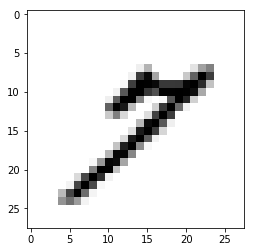

epoch:2number:0


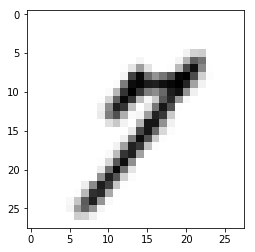

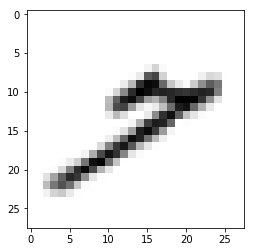

epoch:2number:1
epoch:2number:2
epoch:2number:3
epoch:2number:4
epoch:2number:5
epoch:2number:6
epoch:2number:7
epoch:2number:8
epoch:2number:9
epoch:2number:10
epoch:2number:11
epoch:2number:12
epoch:2number:13
epoch:2number:14
epoch:2number:15
epoch:2number:16
epoch:2number:17
epoch:2number:18
epoch:2number:19
epoch:2number:20
epoch:2number:21
epoch:2number:22
epoch:2number:23
epoch:2number:24
epoch:2number:25
epoch:2number:26
epoch:2number:27
epoch:2number:28
epoch:2number:29
epoch:2number:30
epoch:2number:31
epoch:2number:32
epoch:2number:33
epoch:2number:34
epoch:2number:35
epoch:2number:36
epoch:2number:37
epoch:2number:38
epoch:2number:39
epoch:2number:40
epoch:2number:41
epoch:2number:42
epoch:2number:43
epoch:2number:44
epoch:2number:45
epoch:2number:46
epoch:2number:47
epoch:2number:48
epoch:2number:49
epoch:2number:50
epoch:2number:51
epoch:2number:52
epoch:2number:53
epoch:2number:54
epoch:2number:55
epoch:2number:56
epoch:2number:57
epoch:2number:58
epoch:2number:59
epoch:

epoch:2number:491
epoch:2number:492
epoch:2number:493
epoch:2number:494
epoch:2number:495
epoch:2number:496
epoch:2number:497
epoch:2number:498
epoch:2number:499
epoch:2number:500
epoch:2number:501
epoch:2number:502
epoch:2number:503
epoch:2number:504
epoch:2number:505
epoch:2number:506
epoch:2number:507
epoch:2number:508
epoch:2number:509
epoch:2number:510
epoch:2number:511
epoch:2number:512
epoch:2number:513
epoch:2number:514
epoch:2number:515
epoch:2number:516
epoch:2number:517
epoch:2number:518
epoch:2number:519
epoch:2number:520
epoch:2number:521
epoch:2number:522
epoch:2number:523
epoch:2number:524
epoch:2number:525
epoch:2number:526
epoch:2number:527
epoch:2number:528
epoch:2number:529
epoch:2number:530
epoch:2number:531
epoch:2number:532
epoch:2number:533
epoch:2number:534
epoch:2number:535
epoch:2number:536
epoch:2number:537
epoch:2number:538
epoch:2number:539
epoch:2number:540
epoch:2number:541
epoch:2number:542
epoch:2number:543
epoch:2number:544
epoch:2number:545
epoch:2num

epoch:2number:951
epoch:2number:952
epoch:2number:953
epoch:2number:954
epoch:2number:955
epoch:2number:956
epoch:2number:957
epoch:2number:958
epoch:2number:959
epoch:2number:960
epoch:2number:961
epoch:2number:962
epoch:2number:963
epoch:2number:964
epoch:2number:965
epoch:2number:966
epoch:2number:967
epoch:2number:968
epoch:2number:969
epoch:2number:970
epoch:2number:971
epoch:2number:972
epoch:2number:973
epoch:2number:974
epoch:2number:975
epoch:2number:976
epoch:2number:977
epoch:2number:978
epoch:2number:979
epoch:2number:980
epoch:2number:981
epoch:2number:982
epoch:2number:983
epoch:2number:984
epoch:2number:985
epoch:2number:986
epoch:2number:987
epoch:2number:988
epoch:2number:989
epoch:2number:990
epoch:2number:991
epoch:2number:992
epoch:2number:993
epoch:2number:994
epoch:2number:995
epoch:2number:996
epoch:2number:997
epoch:2number:998
epoch:2number:999
epoch:2number:1000
epoch:2number:1001
epoch:2number:1002
epoch:2number:1003
epoch:2number:1004
epoch:2number:1005
epoc

epoch:2number:1402
epoch:2number:1403
epoch:2number:1404
epoch:2number:1405
epoch:2number:1406
epoch:2number:1407
epoch:2number:1408
epoch:2number:1409
epoch:2number:1410
epoch:2number:1411
epoch:2number:1412
epoch:2number:1413
epoch:2number:1414
epoch:2number:1415
epoch:2number:1416
epoch:2number:1417
epoch:2number:1418
epoch:2number:1419
epoch:2number:1420
epoch:2number:1421
epoch:2number:1422
epoch:2number:1423
epoch:2number:1424
epoch:2number:1425
epoch:2number:1426
epoch:2number:1427
epoch:2number:1428
epoch:2number:1429
epoch:2number:1430
epoch:2number:1431
epoch:2number:1432
epoch:2number:1433
epoch:2number:1434
epoch:2number:1435
epoch:2number:1436
epoch:2number:1437
epoch:2number:1438
epoch:2number:1439
epoch:2number:1440
epoch:2number:1441
epoch:2number:1442
epoch:2number:1443
epoch:2number:1444
epoch:2number:1445
epoch:2number:1446
epoch:2number:1447
epoch:2number:1448
epoch:2number:1449
epoch:2number:1450
epoch:2number:1451
epoch:2number:1452
epoch:2number:1453
epoch:2numbe

epoch:2number:1839
epoch:2number:1840
epoch:2number:1841
epoch:2number:1842
epoch:2number:1843
epoch:2number:1844
epoch:2number:1845
epoch:2number:1846
epoch:2number:1847
epoch:2number:1848
epoch:2number:1849
epoch:2number:1850
epoch:2number:1851
epoch:2number:1852
epoch:2number:1853
epoch:2number:1854
epoch:2number:1855
epoch:2number:1856
epoch:2number:1857
epoch:2number:1858
epoch:2number:1859
epoch:2number:1860
epoch:2number:1861
epoch:2number:1862
epoch:2number:1863
epoch:2number:1864
epoch:2number:1865
epoch:2number:1866
epoch:2number:1867
epoch:2number:1868
epoch:2number:1869
epoch:2number:1870
epoch:2number:1871
epoch:2number:1872
epoch:2number:1873
epoch:2number:1874
epoch:2number:1875
epoch:2number:1876
epoch:2number:1877
epoch:2number:1878
epoch:2number:1879
epoch:2number:1880
epoch:2number:1881
epoch:2number:1882
epoch:2number:1883
epoch:2number:1884
epoch:2number:1885
epoch:2number:1886
epoch:2number:1887
epoch:2number:1888
epoch:2number:1889
epoch:2number:1890
epoch:2numbe

epoch:2number:2299
epoch:2number:2300
epoch:2number:2301
epoch:2number:2302
epoch:2number:2303
epoch:2number:2304
epoch:2number:2305
epoch:2number:2306
epoch:2number:2307
epoch:2number:2308
epoch:2number:2309
epoch:2number:2310
epoch:2number:2311
epoch:2number:2312
epoch:2number:2313
epoch:2number:2314
epoch:2number:2315
epoch:2number:2316
epoch:2number:2317
epoch:2number:2318
epoch:2number:2319
epoch:2number:2320
epoch:2number:2321
epoch:2number:2322
epoch:2number:2323
epoch:2number:2324
epoch:2number:2325
epoch:2number:2326
epoch:2number:2327
epoch:2number:2328
epoch:2number:2329
epoch:2number:2330
epoch:2number:2331
epoch:2number:2332
epoch:2number:2333
epoch:2number:2334
epoch:2number:2335
epoch:2number:2336
epoch:2number:2337
epoch:2number:2338
epoch:2number:2339
epoch:2number:2340
epoch:2number:2341
epoch:2number:2342
epoch:2number:2343
epoch:2number:2344
epoch:2number:2345
epoch:2number:2346
epoch:2number:2347
epoch:2number:2348
epoch:2number:2349
epoch:2number:2350
epoch:2numbe

epoch:2number:2738
epoch:2number:2739
epoch:2number:2740
epoch:2number:2741
epoch:2number:2742
epoch:2number:2743
epoch:2number:2744
epoch:2number:2745
epoch:2number:2746
epoch:2number:2747
epoch:2number:2748
epoch:2number:2749
epoch:2number:2750
epoch:2number:2751
epoch:2number:2752
epoch:2number:2753
epoch:2number:2754
epoch:2number:2755
epoch:2number:2756
epoch:2number:2757
epoch:2number:2758
epoch:2number:2759
epoch:2number:2760
epoch:2number:2761
epoch:2number:2762
epoch:2number:2763
epoch:2number:2764
epoch:2number:2765
epoch:2number:2766
epoch:2number:2767
epoch:2number:2768
epoch:2number:2769
epoch:2number:2770
epoch:2number:2771
epoch:2number:2772
epoch:2number:2773
epoch:2number:2774
epoch:2number:2775
epoch:2number:2776
epoch:2number:2777
epoch:2number:2778
epoch:2number:2779
epoch:2number:2780
epoch:2number:2781
epoch:2number:2782
epoch:2number:2783
epoch:2number:2784
epoch:2number:2785
epoch:2number:2786
epoch:2number:2787
epoch:2number:2788
epoch:2number:2789
epoch:2numbe

epoch:2number:3197
epoch:2number:3198
epoch:2number:3199
epoch:2number:3200
epoch:2number:3201
epoch:2number:3202
epoch:2number:3203
epoch:2number:3204
epoch:2number:3205
epoch:2number:3206
epoch:2number:3207
epoch:2number:3208
epoch:2number:3209
epoch:2number:3210
epoch:2number:3211
epoch:2number:3212
epoch:2number:3213
epoch:2number:3214
epoch:2number:3215
epoch:2number:3216
epoch:2number:3217
epoch:2number:3218
epoch:2number:3219
epoch:2number:3220
epoch:2number:3221
epoch:2number:3222
epoch:2number:3223
epoch:2number:3224
epoch:2number:3225
epoch:2number:3226
epoch:2number:3227
epoch:2number:3228
epoch:2number:3229
epoch:2number:3230
epoch:2number:3231
epoch:2number:3232
epoch:2number:3233
epoch:2number:3234
epoch:2number:3235
epoch:2number:3236
epoch:2number:3237
epoch:2number:3238
epoch:2number:3239
epoch:2number:3240
epoch:2number:3241
epoch:2number:3242
epoch:2number:3243
epoch:2number:3244
epoch:2number:3245
epoch:2number:3246
epoch:2number:3247
epoch:2number:3248
epoch:2numbe

epoch:2number:3654
epoch:2number:3655
epoch:2number:3656
epoch:2number:3657
epoch:2number:3658
epoch:2number:3659
epoch:2number:3660
epoch:2number:3661
epoch:2number:3662
epoch:2number:3663
epoch:2number:3664
epoch:2number:3665
epoch:2number:3666
epoch:2number:3667
epoch:2number:3668
epoch:2number:3669
epoch:2number:3670
epoch:2number:3671
epoch:2number:3672
epoch:2number:3673
epoch:2number:3674
epoch:2number:3675
epoch:2number:3676
epoch:2number:3677
epoch:2number:3678
epoch:2number:3679
epoch:2number:3680
epoch:2number:3681
epoch:2number:3682
epoch:2number:3683
epoch:2number:3684
epoch:2number:3685
epoch:2number:3686
epoch:2number:3687
epoch:2number:3688
epoch:2number:3689
epoch:2number:3690
epoch:2number:3691
epoch:2number:3692
epoch:2number:3693
epoch:2number:3694
epoch:2number:3695
epoch:2number:3696
epoch:2number:3697
epoch:2number:3698
epoch:2number:3699
epoch:2number:3700
epoch:2number:3701
epoch:2number:3702
epoch:2number:3703
epoch:2number:3704
epoch:2number:3705
epoch:2numbe

epoch:2number:4111
epoch:2number:4112
epoch:2number:4113
epoch:2number:4114
epoch:2number:4115
epoch:2number:4116
epoch:2number:4117
epoch:2number:4118
epoch:2number:4119
epoch:2number:4120
epoch:2number:4121
epoch:2number:4122
epoch:2number:4123
epoch:2number:4124
epoch:2number:4125
epoch:2number:4126
epoch:2number:4127
epoch:2number:4128
epoch:2number:4129
epoch:2number:4130
epoch:2number:4131
epoch:2number:4132
epoch:2number:4133
epoch:2number:4134
epoch:2number:4135
epoch:2number:4136
epoch:2number:4137
epoch:2number:4138
epoch:2number:4139
epoch:2number:4140
epoch:2number:4141
epoch:2number:4142
epoch:2number:4143
epoch:2number:4144
epoch:2number:4145
epoch:2number:4146
epoch:2number:4147
epoch:2number:4148
epoch:2number:4149
epoch:2number:4150
epoch:2number:4151
epoch:2number:4152
epoch:2number:4153
epoch:2number:4154
epoch:2number:4155
epoch:2number:4156
epoch:2number:4157
epoch:2number:4158
epoch:2number:4159
epoch:2number:4160
epoch:2number:4161
epoch:2number:4162
epoch:2numbe

epoch:2number:4567
epoch:2number:4568
epoch:2number:4569
epoch:2number:4570
epoch:2number:4571
epoch:2number:4572
epoch:2number:4573
epoch:2number:4574
epoch:2number:4575
epoch:2number:4576
epoch:2number:4577
epoch:2number:4578
epoch:2number:4579
epoch:2number:4580
epoch:2number:4581
epoch:2number:4582
epoch:2number:4583
epoch:2number:4584
epoch:2number:4585
epoch:2number:4586
epoch:2number:4587
epoch:2number:4588
epoch:2number:4589
epoch:2number:4590
epoch:2number:4591
epoch:2number:4592
epoch:2number:4593
epoch:2number:4594
epoch:2number:4595
epoch:2number:4596
epoch:2number:4597
epoch:2number:4598
epoch:2number:4599
epoch:2number:4600
epoch:2number:4601
epoch:2number:4602
epoch:2number:4603
epoch:2number:4604
epoch:2number:4605
epoch:2number:4606
epoch:2number:4607
epoch:2number:4608
epoch:2number:4609
epoch:2number:4610
epoch:2number:4611
epoch:2number:4612
epoch:2number:4613
epoch:2number:4614
epoch:2number:4615
epoch:2number:4616
epoch:2number:4617
epoch:2number:4618
epoch:2numbe

epoch:2number:5028
epoch:2number:5029
epoch:2number:5030
epoch:2number:5031
epoch:2number:5032
epoch:2number:5033
epoch:2number:5034
epoch:2number:5035
epoch:2number:5036
epoch:2number:5037
epoch:2number:5038
epoch:2number:5039
epoch:2number:5040
epoch:2number:5041
epoch:2number:5042
epoch:2number:5043
epoch:2number:5044
epoch:2number:5045
epoch:2number:5046
epoch:2number:5047
epoch:2number:5048
epoch:2number:5049
epoch:2number:5050
epoch:2number:5051
epoch:2number:5052
epoch:2number:5053
epoch:2number:5054
epoch:2number:5055
epoch:2number:5056
epoch:2number:5057
epoch:2number:5058
epoch:2number:5059
epoch:2number:5060
epoch:2number:5061
epoch:2number:5062
epoch:2number:5063
epoch:2number:5064
epoch:2number:5065
epoch:2number:5066
epoch:2number:5067
epoch:2number:5068
epoch:2number:5069
epoch:2number:5070
epoch:2number:5071
epoch:2number:5072
epoch:2number:5073
epoch:2number:5074
epoch:2number:5075
epoch:2number:5076
epoch:2number:5077
epoch:2number:5078
epoch:2number:5079
epoch:2numbe

epoch:2number:5481
epoch:2number:5482
epoch:2number:5483
epoch:2number:5484
epoch:2number:5485
epoch:2number:5486
epoch:2number:5487
epoch:2number:5488
epoch:2number:5489
epoch:2number:5490
epoch:2number:5491
epoch:2number:5492
epoch:2number:5493
epoch:2number:5494
epoch:2number:5495
epoch:2number:5496
epoch:2number:5497
epoch:2number:5498
epoch:2number:5499
epoch:2number:5500
epoch:2number:5501
epoch:2number:5502
epoch:2number:5503
epoch:2number:5504
epoch:2number:5505
epoch:2number:5506
epoch:2number:5507
epoch:2number:5508
epoch:2number:5509
epoch:2number:5510
epoch:2number:5511
epoch:2number:5512
epoch:2number:5513
epoch:2number:5514
epoch:2number:5515
epoch:2number:5516
epoch:2number:5517
epoch:2number:5518
epoch:2number:5519
epoch:2number:5520
epoch:2number:5521
epoch:2number:5522
epoch:2number:5523
epoch:2number:5524
epoch:2number:5525
epoch:2number:5526
epoch:2number:5527
epoch:2number:5528
epoch:2number:5529
epoch:2number:5530
epoch:2number:5531
epoch:2number:5532
epoch:2numbe

epoch:2number:5938
epoch:2number:5939
epoch:2number:5940
epoch:2number:5941
epoch:2number:5942
epoch:2number:5943
epoch:2number:5944
epoch:2number:5945
epoch:2number:5946
epoch:2number:5947
epoch:2number:5948
epoch:2number:5949
epoch:2number:5950
epoch:2number:5951
epoch:2number:5952
epoch:2number:5953
epoch:2number:5954
epoch:2number:5955
epoch:2number:5956
epoch:2number:5957
epoch:2number:5958
epoch:2number:5959
epoch:2number:5960
epoch:2number:5961
epoch:2number:5962
epoch:2number:5963
epoch:2number:5964
epoch:2number:5965
epoch:2number:5966
epoch:2number:5967
epoch:2number:5968
epoch:2number:5969
epoch:2number:5970
epoch:2number:5971
epoch:2number:5972
epoch:2number:5973
epoch:2number:5974
epoch:2number:5975
epoch:2number:5976
epoch:2number:5977
epoch:2number:5978
epoch:2number:5979
epoch:2number:5980
epoch:2number:5981
epoch:2number:5982
epoch:2number:5983
epoch:2number:5984
epoch:2number:5985
epoch:2number:5986
epoch:2number:5987
epoch:2number:5988
epoch:2number:5989
epoch:2numbe

epoch:2number:6393
epoch:2number:6394
epoch:2number:6395
epoch:2number:6396
epoch:2number:6397
epoch:2number:6398
epoch:2number:6399
epoch:2number:6400
epoch:2number:6401
epoch:2number:6402
epoch:2number:6403
epoch:2number:6404
epoch:2number:6405
epoch:2number:6406
epoch:2number:6407
epoch:2number:6408
epoch:2number:6409
epoch:2number:6410
epoch:2number:6411
epoch:2number:6412
epoch:2number:6413
epoch:2number:6414
epoch:2number:6415
epoch:2number:6416
epoch:2number:6417
epoch:2number:6418
epoch:2number:6419
epoch:2number:6420
epoch:2number:6421
epoch:2number:6422
epoch:2number:6423
epoch:2number:6424
epoch:2number:6425
epoch:2number:6426
epoch:2number:6427
epoch:2number:6428
epoch:2number:6429
epoch:2number:6430
epoch:2number:6431
epoch:2number:6432
epoch:2number:6433
epoch:2number:6434
epoch:2number:6435
epoch:2number:6436
epoch:2number:6437
epoch:2number:6438
epoch:2number:6439
epoch:2number:6440
epoch:2number:6441
epoch:2number:6442
epoch:2number:6443
epoch:2number:6444
epoch:2numbe

epoch:2number:6849
epoch:2number:6850
epoch:2number:6851
epoch:2number:6852
epoch:2number:6853
epoch:2number:6854
epoch:2number:6855
epoch:2number:6856
epoch:2number:6857
epoch:2number:6858
epoch:2number:6859
epoch:2number:6860
epoch:2number:6861
epoch:2number:6862
epoch:2number:6863
epoch:2number:6864
epoch:2number:6865
epoch:2number:6866
epoch:2number:6867
epoch:2number:6868
epoch:2number:6869
epoch:2number:6870
epoch:2number:6871
epoch:2number:6872
epoch:2number:6873
epoch:2number:6874
epoch:2number:6875
epoch:2number:6876
epoch:2number:6877
epoch:2number:6878
epoch:2number:6879
epoch:2number:6880
epoch:2number:6881
epoch:2number:6882
epoch:2number:6883
epoch:2number:6884
epoch:2number:6885
epoch:2number:6886
epoch:2number:6887
epoch:2number:6888
epoch:2number:6889
epoch:2number:6890
epoch:2number:6891
epoch:2number:6892
epoch:2number:6893
epoch:2number:6894
epoch:2number:6895
epoch:2number:6896
epoch:2number:6897
epoch:2number:6898
epoch:2number:6899
epoch:2number:6900
epoch:2numbe

epoch:2number:7304
epoch:2number:7305
epoch:2number:7306
epoch:2number:7307
epoch:2number:7308
epoch:2number:7309
epoch:2number:7310
epoch:2number:7311
epoch:2number:7312
epoch:2number:7313
epoch:2number:7314
epoch:2number:7315
epoch:2number:7316
epoch:2number:7317
epoch:2number:7318
epoch:2number:7319
epoch:2number:7320
epoch:2number:7321
epoch:2number:7322
epoch:2number:7323
epoch:2number:7324
epoch:2number:7325
epoch:2number:7326
epoch:2number:7327
epoch:2number:7328
epoch:2number:7329
epoch:2number:7330
epoch:2number:7331
epoch:2number:7332
epoch:2number:7333
epoch:2number:7334
epoch:2number:7335
epoch:2number:7336
epoch:2number:7337
epoch:2number:7338
epoch:2number:7339
epoch:2number:7340
epoch:2number:7341
epoch:2number:7342
epoch:2number:7343
epoch:2number:7344
epoch:2number:7345
epoch:2number:7346
epoch:2number:7347
epoch:2number:7348
epoch:2number:7349
epoch:2number:7350
epoch:2number:7351
epoch:2number:7352
epoch:2number:7353
epoch:2number:7354
epoch:2number:7355
epoch:2numbe

epoch:2number:7762
epoch:2number:7763
epoch:2number:7764
epoch:2number:7765
epoch:2number:7766
epoch:2number:7767
epoch:2number:7768
epoch:2number:7769
epoch:2number:7770
epoch:2number:7771
epoch:2number:7772
epoch:2number:7773
epoch:2number:7774
epoch:2number:7775
epoch:2number:7776
epoch:2number:7777
epoch:2number:7778
epoch:2number:7779
epoch:2number:7780
epoch:2number:7781
epoch:2number:7782
epoch:2number:7783
epoch:2number:7784
epoch:2number:7785
epoch:2number:7786
epoch:2number:7787
epoch:2number:7788
epoch:2number:7789
epoch:2number:7790
epoch:2number:7791
epoch:2number:7792
epoch:2number:7793
epoch:2number:7794
epoch:2number:7795
epoch:2number:7796
epoch:2number:7797
epoch:2number:7798
epoch:2number:7799
epoch:2number:7800
epoch:2number:7801
epoch:2number:7802
epoch:2number:7803
epoch:2number:7804
epoch:2number:7805
epoch:2number:7806
epoch:2number:7807
epoch:2number:7808
epoch:2number:7809
epoch:2number:7810
epoch:2number:7811
epoch:2number:7812
epoch:2number:7813
epoch:2numbe

epoch:2number:8225
epoch:2number:8226
epoch:2number:8227
epoch:2number:8228
epoch:2number:8229
epoch:2number:8230
epoch:2number:8231
epoch:2number:8232
epoch:2number:8233
epoch:2number:8234
epoch:2number:8235
epoch:2number:8236
epoch:2number:8237
epoch:2number:8238
epoch:2number:8239
epoch:2number:8240
epoch:2number:8241
epoch:2number:8242
epoch:2number:8243
epoch:2number:8244
epoch:2number:8245
epoch:2number:8246
epoch:2number:8247
epoch:2number:8248
epoch:2number:8249
epoch:2number:8250
epoch:2number:8251
epoch:2number:8252
epoch:2number:8253
epoch:2number:8254
epoch:2number:8255
epoch:2number:8256
epoch:2number:8257
epoch:2number:8258
epoch:2number:8259
epoch:2number:8260
epoch:2number:8261
epoch:2number:8262
epoch:2number:8263
epoch:2number:8264
epoch:2number:8265
epoch:2number:8266
epoch:2number:8267
epoch:2number:8268
epoch:2number:8269
epoch:2number:8270
epoch:2number:8271
epoch:2number:8272
epoch:2number:8273
epoch:2number:8274
epoch:2number:8275
epoch:2number:8276
epoch:2numbe

epoch:2number:8679
epoch:2number:8680
epoch:2number:8681
epoch:2number:8682
epoch:2number:8683
epoch:2number:8684
epoch:2number:8685
epoch:2number:8686
epoch:2number:8687
epoch:2number:8688
epoch:2number:8689
epoch:2number:8690
epoch:2number:8691
epoch:2number:8692
epoch:2number:8693
epoch:2number:8694
epoch:2number:8695
epoch:2number:8696
epoch:2number:8697
epoch:2number:8698
epoch:2number:8699
epoch:2number:8700
epoch:2number:8701
epoch:2number:8702
epoch:2number:8703
epoch:2number:8704
epoch:2number:8705
epoch:2number:8706
epoch:2number:8707
epoch:2number:8708
epoch:2number:8709
epoch:2number:8710
epoch:2number:8711
epoch:2number:8712
epoch:2number:8713
epoch:2number:8714
epoch:2number:8715
epoch:2number:8716
epoch:2number:8717
epoch:2number:8718
epoch:2number:8719
epoch:2number:8720
epoch:2number:8721
epoch:2number:8722
epoch:2number:8723
epoch:2number:8724
epoch:2number:8725
epoch:2number:8726
epoch:2number:8727
epoch:2number:8728
epoch:2number:8729
epoch:2number:8730
epoch:2numbe

epoch:2number:9116
epoch:2number:9117
epoch:2number:9118
epoch:2number:9119
epoch:2number:9120
epoch:2number:9121
epoch:2number:9122
epoch:2number:9123
epoch:2number:9124
epoch:2number:9125
epoch:2number:9126
epoch:2number:9127
epoch:2number:9128
epoch:2number:9129
epoch:2number:9130
epoch:2number:9131
epoch:2number:9132
epoch:2number:9133
epoch:2number:9134
epoch:2number:9135
epoch:2number:9136
epoch:2number:9137
epoch:2number:9138
epoch:2number:9139
epoch:2number:9140
epoch:2number:9141
epoch:2number:9142
epoch:2number:9143
epoch:2number:9144
epoch:2number:9145
epoch:2number:9146
epoch:2number:9147
epoch:2number:9148
epoch:2number:9149
epoch:2number:9150
epoch:2number:9151
epoch:2number:9152
epoch:2number:9153
epoch:2number:9154
epoch:2number:9155
epoch:2number:9156
epoch:2number:9157
epoch:2number:9158
epoch:2number:9159
epoch:2number:9160
epoch:2number:9161
epoch:2number:9162
epoch:2number:9163
epoch:2number:9164
epoch:2number:9165
epoch:2number:9166
epoch:2number:9167
epoch:2numbe

epoch:2number:9563
epoch:2number:9564
epoch:2number:9565
epoch:2number:9566
epoch:2number:9567
epoch:2number:9568
epoch:2number:9569
epoch:2number:9570
epoch:2number:9571
epoch:2number:9572
epoch:2number:9573
epoch:2number:9574
epoch:2number:9575
epoch:2number:9576
epoch:2number:9577
epoch:2number:9578
epoch:2number:9579
epoch:2number:9580
epoch:2number:9581
epoch:2number:9582
epoch:2number:9583
epoch:2number:9584
epoch:2number:9585
epoch:2number:9586
epoch:2number:9587
epoch:2number:9588
epoch:2number:9589
epoch:2number:9590
epoch:2number:9591
epoch:2number:9592
epoch:2number:9593
epoch:2number:9594
epoch:2number:9595
epoch:2number:9596
epoch:2number:9597
epoch:2number:9598
epoch:2number:9599
epoch:2number:9600
epoch:2number:9601
epoch:2number:9602
epoch:2number:9603
epoch:2number:9604
epoch:2number:9605
epoch:2number:9606
epoch:2number:9607
epoch:2number:9608
epoch:2number:9609
epoch:2number:9610
epoch:2number:9611
epoch:2number:9612
epoch:2number:9613
epoch:2number:9614
epoch:2numbe

epoch:2number:10015
epoch:2number:10016
epoch:2number:10017
epoch:2number:10018
epoch:2number:10019
epoch:2number:10020
epoch:2number:10021
epoch:2number:10022
epoch:2number:10023
epoch:2number:10024
epoch:2number:10025
epoch:2number:10026
epoch:2number:10027
epoch:2number:10028
epoch:2number:10029
epoch:2number:10030
epoch:2number:10031
epoch:2number:10032
epoch:2number:10033
epoch:2number:10034
epoch:2number:10035
epoch:2number:10036
epoch:2number:10037
epoch:2number:10038
epoch:2number:10039
epoch:2number:10040
epoch:2number:10041
epoch:2number:10042
epoch:2number:10043
epoch:2number:10044
epoch:2number:10045
epoch:2number:10046
epoch:2number:10047
epoch:2number:10048
epoch:2number:10049
epoch:2number:10050
epoch:2number:10051
epoch:2number:10052
epoch:2number:10053
epoch:2number:10054
epoch:2number:10055
epoch:2number:10056
epoch:2number:10057
epoch:2number:10058
epoch:2number:10059
epoch:2number:10060
epoch:2number:10061
epoch:2number:10062
epoch:2number:10063
epoch:2number:10064


epoch:2number:10443
epoch:2number:10444
epoch:2number:10445
epoch:2number:10446
epoch:2number:10447
epoch:2number:10448
epoch:2number:10449
epoch:2number:10450
epoch:2number:10451
epoch:2number:10452
epoch:2number:10453
epoch:2number:10454
epoch:2number:10455
epoch:2number:10456
epoch:2number:10457
epoch:2number:10458
epoch:2number:10459
epoch:2number:10460
epoch:2number:10461
epoch:2number:10462
epoch:2number:10463
epoch:2number:10464
epoch:2number:10465
epoch:2number:10466
epoch:2number:10467
epoch:2number:10468
epoch:2number:10469
epoch:2number:10470
epoch:2number:10471
epoch:2number:10472
epoch:2number:10473
epoch:2number:10474
epoch:2number:10475
epoch:2number:10476
epoch:2number:10477
epoch:2number:10478
epoch:2number:10479
epoch:2number:10480
epoch:2number:10481
epoch:2number:10482
epoch:2number:10483
epoch:2number:10484
epoch:2number:10485
epoch:2number:10486
epoch:2number:10487
epoch:2number:10488
epoch:2number:10489
epoch:2number:10490
epoch:2number:10491
epoch:2number:10492


epoch:2number:10864
epoch:2number:10865
epoch:2number:10866
epoch:2number:10867
epoch:2number:10868
epoch:2number:10869
epoch:2number:10870
epoch:2number:10871
epoch:2number:10872
epoch:2number:10873
epoch:2number:10874
epoch:2number:10875
epoch:2number:10876
epoch:2number:10877
epoch:2number:10878
epoch:2number:10879
epoch:2number:10880
epoch:2number:10881
epoch:2number:10882
epoch:2number:10883
epoch:2number:10884
epoch:2number:10885
epoch:2number:10886
epoch:2number:10887
epoch:2number:10888
epoch:2number:10889
epoch:2number:10890
epoch:2number:10891
epoch:2number:10892
epoch:2number:10893
epoch:2number:10894
epoch:2number:10895
epoch:2number:10896
epoch:2number:10897
epoch:2number:10898
epoch:2number:10899
epoch:2number:10900
epoch:2number:10901
epoch:2number:10902
epoch:2number:10903
epoch:2number:10904
epoch:2number:10905
epoch:2number:10906
epoch:2number:10907
epoch:2number:10908
epoch:2number:10909
epoch:2number:10910
epoch:2number:10911
epoch:2number:10912
epoch:2number:10913


epoch:2number:11303
epoch:2number:11304
epoch:2number:11305
epoch:2number:11306
epoch:2number:11307
epoch:2number:11308
epoch:2number:11309
epoch:2number:11310
epoch:2number:11311
epoch:2number:11312
epoch:2number:11313
epoch:2number:11314
epoch:2number:11315
epoch:2number:11316
epoch:2number:11317
epoch:2number:11318
epoch:2number:11319
epoch:2number:11320
epoch:2number:11321
epoch:2number:11322
epoch:2number:11323
epoch:2number:11324
epoch:2number:11325
epoch:2number:11326
epoch:2number:11327
epoch:2number:11328
epoch:2number:11329
epoch:2number:11330
epoch:2number:11331
epoch:2number:11332
epoch:2number:11333
epoch:2number:11334
epoch:2number:11335
epoch:2number:11336
epoch:2number:11337
epoch:2number:11338
epoch:2number:11339
epoch:2number:11340
epoch:2number:11341
epoch:2number:11342
epoch:2number:11343
epoch:2number:11344
epoch:2number:11345
epoch:2number:11346
epoch:2number:11347
epoch:2number:11348
epoch:2number:11349
epoch:2number:11350
epoch:2number:11351
epoch:2number:11352


epoch:2number:11721
epoch:2number:11722
epoch:2number:11723
epoch:2number:11724
epoch:2number:11725
epoch:2number:11726
epoch:2number:11727
epoch:2number:11728
epoch:2number:11729
epoch:2number:11730
epoch:2number:11731
epoch:2number:11732
epoch:2number:11733
epoch:2number:11734
epoch:2number:11735
epoch:2number:11736
epoch:2number:11737
epoch:2number:11738
epoch:2number:11739
epoch:2number:11740
epoch:2number:11741
epoch:2number:11742
epoch:2number:11743
epoch:2number:11744
epoch:2number:11745
epoch:2number:11746
epoch:2number:11747
epoch:2number:11748
epoch:2number:11749
epoch:2number:11750
epoch:2number:11751
epoch:2number:11752
epoch:2number:11753
epoch:2number:11754
epoch:2number:11755
epoch:2number:11756
epoch:2number:11757
epoch:2number:11758
epoch:2number:11759
epoch:2number:11760
epoch:2number:11761
epoch:2number:11762
epoch:2number:11763
epoch:2number:11764
epoch:2number:11765
epoch:2number:11766
epoch:2number:11767
epoch:2number:11768
epoch:2number:11769
epoch:2number:11770


epoch:2number:12157
epoch:2number:12158
epoch:2number:12159
epoch:2number:12160
epoch:2number:12161
epoch:2number:12162
epoch:2number:12163
epoch:2number:12164
epoch:2number:12165
epoch:2number:12166
epoch:2number:12167
epoch:2number:12168
epoch:2number:12169
epoch:2number:12170
epoch:2number:12171
epoch:2number:12172
epoch:2number:12173
epoch:2number:12174
epoch:2number:12175
epoch:2number:12176
epoch:2number:12177
epoch:2number:12178
epoch:2number:12179
epoch:2number:12180
epoch:2number:12181
epoch:2number:12182
epoch:2number:12183
epoch:2number:12184
epoch:2number:12185
epoch:2number:12186
epoch:2number:12187
epoch:2number:12188
epoch:2number:12189
epoch:2number:12190
epoch:2number:12191
epoch:2number:12192
epoch:2number:12193
epoch:2number:12194
epoch:2number:12195
epoch:2number:12196
epoch:2number:12197
epoch:2number:12198
epoch:2number:12199
epoch:2number:12200
epoch:2number:12201
epoch:2number:12202
epoch:2number:12203
epoch:2number:12204
epoch:2number:12205
epoch:2number:12206


epoch:2number:12576
epoch:2number:12577
epoch:2number:12578
epoch:2number:12579
epoch:2number:12580
epoch:2number:12581
epoch:2number:12582
epoch:2number:12583
epoch:2number:12584
epoch:2number:12585
epoch:2number:12586
epoch:2number:12587
epoch:2number:12588
epoch:2number:12589
epoch:2number:12590
epoch:2number:12591
epoch:2number:12592
epoch:2number:12593
epoch:2number:12594
epoch:2number:12595
epoch:2number:12596
epoch:2number:12597
epoch:2number:12598
epoch:2number:12599
epoch:2number:12600
epoch:2number:12601
epoch:2number:12602
epoch:2number:12603
epoch:2number:12604
epoch:2number:12605
epoch:2number:12606
epoch:2number:12607
epoch:2number:12608
epoch:2number:12609
epoch:2number:12610
epoch:2number:12611
epoch:2number:12612
epoch:2number:12613
epoch:2number:12614
epoch:2number:12615
epoch:2number:12616
epoch:2number:12617
epoch:2number:12618
epoch:2number:12619
epoch:2number:12620
epoch:2number:12621
epoch:2number:12622
epoch:2number:12623
epoch:2number:12624
epoch:2number:12625


epoch:2number:13007
epoch:2number:13008
epoch:2number:13009
epoch:2number:13010
epoch:2number:13011
epoch:2number:13012
epoch:2number:13013
epoch:2number:13014
epoch:2number:13015
epoch:2number:13016
epoch:2number:13017
epoch:2number:13018
epoch:2number:13019
epoch:2number:13020
epoch:2number:13021
epoch:2number:13022
epoch:2number:13023
epoch:2number:13024
epoch:2number:13025
epoch:2number:13026
epoch:2number:13027
epoch:2number:13028
epoch:2number:13029
epoch:2number:13030
epoch:2number:13031
epoch:2number:13032
epoch:2number:13033
epoch:2number:13034
epoch:2number:13035
epoch:2number:13036
epoch:2number:13037
epoch:2number:13038
epoch:2number:13039
epoch:2number:13040
epoch:2number:13041
epoch:2number:13042
epoch:2number:13043
epoch:2number:13044
epoch:2number:13045
epoch:2number:13046
epoch:2number:13047
epoch:2number:13048
epoch:2number:13049
epoch:2number:13050
epoch:2number:13051
epoch:2number:13052
epoch:2number:13053
epoch:2number:13054
epoch:2number:13055
epoch:2number:13056


epoch:2number:13428
epoch:2number:13429
epoch:2number:13430
epoch:2number:13431
epoch:2number:13432
epoch:2number:13433
epoch:2number:13434
epoch:2number:13435
epoch:2number:13436
epoch:2number:13437
epoch:2number:13438
epoch:2number:13439
epoch:2number:13440
epoch:2number:13441
epoch:2number:13442
epoch:2number:13443
epoch:2number:13444
epoch:2number:13445
epoch:2number:13446
epoch:2number:13447
epoch:2number:13448
epoch:2number:13449
epoch:2number:13450
epoch:2number:13451
epoch:2number:13452
epoch:2number:13453
epoch:2number:13454
epoch:2number:13455
epoch:2number:13456
epoch:2number:13457
epoch:2number:13458
epoch:2number:13459
epoch:2number:13460
epoch:2number:13461
epoch:2number:13462
epoch:2number:13463
epoch:2number:13464
epoch:2number:13465
epoch:2number:13466
epoch:2number:13467
epoch:2number:13468
epoch:2number:13469
epoch:2number:13470
epoch:2number:13471
epoch:2number:13472
epoch:2number:13473
epoch:2number:13474
epoch:2number:13475
epoch:2number:13476
epoch:2number:13477


epoch:2number:13855
epoch:2number:13856
epoch:2number:13857
epoch:2number:13858
epoch:2number:13859
epoch:2number:13860
epoch:2number:13861
epoch:2number:13862
epoch:2number:13863
epoch:2number:13864
epoch:2number:13865
epoch:2number:13866
epoch:2number:13867
epoch:2number:13868
epoch:2number:13869
epoch:2number:13870
epoch:2number:13871
epoch:2number:13872
epoch:2number:13873
epoch:2number:13874
epoch:2number:13875
epoch:2number:13876
epoch:2number:13877
epoch:2number:13878
epoch:2number:13879
epoch:2number:13880
epoch:2number:13881
epoch:2number:13882
epoch:2number:13883
epoch:2number:13884
epoch:2number:13885
epoch:2number:13886
epoch:2number:13887
epoch:2number:13888
epoch:2number:13889
epoch:2number:13890
epoch:2number:13891
epoch:2number:13892
epoch:2number:13893
epoch:2number:13894
epoch:2number:13895
epoch:2number:13896
epoch:2number:13897
epoch:2number:13898
epoch:2number:13899
epoch:2number:13900
epoch:2number:13901
epoch:2number:13902
epoch:2number:13903
epoch:2number:13904


epoch:2number:14281
epoch:2number:14282
epoch:2number:14283
epoch:2number:14284
epoch:2number:14285
epoch:2number:14286
epoch:2number:14287
epoch:2number:14288
epoch:2number:14289
epoch:2number:14290
epoch:2number:14291
epoch:2number:14292
epoch:2number:14293
epoch:2number:14294
epoch:2number:14295
epoch:2number:14296
epoch:2number:14297
epoch:2number:14298
epoch:2number:14299
epoch:2number:14300
epoch:2number:14301
epoch:2number:14302
epoch:2number:14303
epoch:2number:14304
epoch:2number:14305
epoch:2number:14306
epoch:2number:14307
epoch:2number:14308
epoch:2number:14309
epoch:2number:14310
epoch:2number:14311
epoch:2number:14312
epoch:2number:14313
epoch:2number:14314
epoch:2number:14315
epoch:2number:14316
epoch:2number:14317
epoch:2number:14318
epoch:2number:14319
epoch:2number:14320
epoch:2number:14321
epoch:2number:14322
epoch:2number:14323
epoch:2number:14324
epoch:2number:14325
epoch:2number:14326
epoch:2number:14327
epoch:2number:14328
epoch:2number:14329
epoch:2number:14330


epoch:2number:14705
epoch:2number:14706
epoch:2number:14707
epoch:2number:14708
epoch:2number:14709
epoch:2number:14710
epoch:2number:14711
epoch:2number:14712
epoch:2number:14713
epoch:2number:14714
epoch:2number:14715
epoch:2number:14716
epoch:2number:14717
epoch:2number:14718
epoch:2number:14719
epoch:2number:14720
epoch:2number:14721
epoch:2number:14722
epoch:2number:14723
epoch:2number:14724
epoch:2number:14725
epoch:2number:14726
epoch:2number:14727
epoch:2number:14728
epoch:2number:14729
epoch:2number:14730
epoch:2number:14731
epoch:2number:14732
epoch:2number:14733
epoch:2number:14734
epoch:2number:14735
epoch:2number:14736
epoch:2number:14737
epoch:2number:14738
epoch:2number:14739
epoch:2number:14740
epoch:2number:14741
epoch:2number:14742
epoch:2number:14743
epoch:2number:14744
epoch:2number:14745
epoch:2number:14746
epoch:2number:14747
epoch:2number:14748
epoch:2number:14749
epoch:2number:14750
epoch:2number:14751
epoch:2number:14752
epoch:2number:14753
epoch:2number:14754


epoch:2number:15132
epoch:2number:15133
epoch:2number:15134
epoch:2number:15135
epoch:2number:15136
epoch:2number:15137
epoch:2number:15138
epoch:2number:15139
epoch:2number:15140
epoch:2number:15141
epoch:2number:15142
epoch:2number:15143
epoch:2number:15144
epoch:2number:15145
epoch:2number:15146
epoch:2number:15147
epoch:2number:15148
epoch:2number:15149
epoch:2number:15150
epoch:2number:15151
epoch:2number:15152
epoch:2number:15153
epoch:2number:15154
epoch:2number:15155
epoch:2number:15156
epoch:2number:15157
epoch:2number:15158
epoch:2number:15159
epoch:2number:15160
epoch:2number:15161
epoch:2number:15162
epoch:2number:15163
epoch:2number:15164
epoch:2number:15165
epoch:2number:15166
epoch:2number:15167
epoch:2number:15168
epoch:2number:15169
epoch:2number:15170
epoch:2number:15171
epoch:2number:15172
epoch:2number:15173
epoch:2number:15174
epoch:2number:15175
epoch:2number:15176
epoch:2number:15177
epoch:2number:15178
epoch:2number:15179
epoch:2number:15180
epoch:2number:15181


epoch:2number:15558
epoch:2number:15559
epoch:2number:15560
epoch:2number:15561
epoch:2number:15562
epoch:2number:15563
epoch:2number:15564
epoch:2number:15565
epoch:2number:15566
epoch:2number:15567
epoch:2number:15568
epoch:2number:15569
epoch:2number:15570
epoch:2number:15571
epoch:2number:15572
epoch:2number:15573
epoch:2number:15574
epoch:2number:15575
epoch:2number:15576
epoch:2number:15577
epoch:2number:15578
epoch:2number:15579
epoch:2number:15580
epoch:2number:15581
epoch:2number:15582
epoch:2number:15583
epoch:2number:15584
epoch:2number:15585
epoch:2number:15586
epoch:2number:15587
epoch:2number:15588
epoch:2number:15589
epoch:2number:15590
epoch:2number:15591
epoch:2number:15592
epoch:2number:15593
epoch:2number:15594
epoch:2number:15595
epoch:2number:15596
epoch:2number:15597
epoch:2number:15598
epoch:2number:15599
epoch:2number:15600
epoch:2number:15601
epoch:2number:15602
epoch:2number:15603
epoch:2number:15604
epoch:2number:15605
epoch:2number:15606
epoch:2number:15607


epoch:2number:15980
epoch:2number:15981
epoch:2number:15982
epoch:2number:15983
epoch:2number:15984
epoch:2number:15985
epoch:2number:15986
epoch:2number:15987
epoch:2number:15988
epoch:2number:15989
epoch:2number:15990
epoch:2number:15991
epoch:2number:15992
epoch:2number:15993
epoch:2number:15994
epoch:2number:15995
epoch:2number:15996
epoch:2number:15997
epoch:2number:15998
epoch:2number:15999
epoch:2number:16000
epoch:2number:16001
epoch:2number:16002
epoch:2number:16003
epoch:2number:16004
epoch:2number:16005
epoch:2number:16006
epoch:2number:16007
epoch:2number:16008
epoch:2number:16009
epoch:2number:16010
epoch:2number:16011
epoch:2number:16012
epoch:2number:16013
epoch:2number:16014
epoch:2number:16015
epoch:2number:16016
epoch:2number:16017
epoch:2number:16018
epoch:2number:16019
epoch:2number:16020
epoch:2number:16021
epoch:2number:16022
epoch:2number:16023
epoch:2number:16024
epoch:2number:16025
epoch:2number:16026
epoch:2number:16027
epoch:2number:16028
epoch:2number:16029


epoch:2number:16404
epoch:2number:16405
epoch:2number:16406
epoch:2number:16407
epoch:2number:16408
epoch:2number:16409
epoch:2number:16410
epoch:2number:16411
epoch:2number:16412
epoch:2number:16413
epoch:2number:16414
epoch:2number:16415
epoch:2number:16416
epoch:2number:16417
epoch:2number:16418
epoch:2number:16419
epoch:2number:16420
epoch:2number:16421
epoch:2number:16422
epoch:2number:16423
epoch:2number:16424
epoch:2number:16425
epoch:2number:16426
epoch:2number:16427
epoch:2number:16428
epoch:2number:16429
epoch:2number:16430
epoch:2number:16431
epoch:2number:16432
epoch:2number:16433
epoch:2number:16434
epoch:2number:16435
epoch:2number:16436
epoch:2number:16437
epoch:2number:16438
epoch:2number:16439
epoch:2number:16440
epoch:2number:16441
epoch:2number:16442
epoch:2number:16443
epoch:2number:16444
epoch:2number:16445
epoch:2number:16446
epoch:2number:16447
epoch:2number:16448
epoch:2number:16449
epoch:2number:16450
epoch:2number:16451
epoch:2number:16452
epoch:2number:16453


epoch:2number:16831
epoch:2number:16832
epoch:2number:16833
epoch:2number:16834
epoch:2number:16835
epoch:2number:16836
epoch:2number:16837
epoch:2number:16838
epoch:2number:16839
epoch:2number:16840
epoch:2number:16841
epoch:2number:16842
epoch:2number:16843
epoch:2number:16844
epoch:2number:16845
epoch:2number:16846
epoch:2number:16847
epoch:2number:16848
epoch:2number:16849
epoch:2number:16850
epoch:2number:16851
epoch:2number:16852
epoch:2number:16853
epoch:2number:16854
epoch:2number:16855
epoch:2number:16856
epoch:2number:16857
epoch:2number:16858
epoch:2number:16859
epoch:2number:16860
epoch:2number:16861
epoch:2number:16862
epoch:2number:16863
epoch:2number:16864
epoch:2number:16865
epoch:2number:16866
epoch:2number:16867
epoch:2number:16868
epoch:2number:16869
epoch:2number:16870
epoch:2number:16871
epoch:2number:16872
epoch:2number:16873
epoch:2number:16874
epoch:2number:16875
epoch:2number:16876
epoch:2number:16877
epoch:2number:16878
epoch:2number:16879
epoch:2number:16880


epoch:2number:17259
epoch:2number:17260
epoch:2number:17261
epoch:2number:17262
epoch:2number:17263
epoch:2number:17264
epoch:2number:17265
epoch:2number:17266
epoch:2number:17267
epoch:2number:17268
epoch:2number:17269
epoch:2number:17270
epoch:2number:17271
epoch:2number:17272
epoch:2number:17273
epoch:2number:17274
epoch:2number:17275
epoch:2number:17276
epoch:2number:17277
epoch:2number:17278
epoch:2number:17279
epoch:2number:17280
epoch:2number:17281
epoch:2number:17282
epoch:2number:17283
epoch:2number:17284
epoch:2number:17285
epoch:2number:17286
epoch:2number:17287
epoch:2number:17288
epoch:2number:17289
epoch:2number:17290
epoch:2number:17291
epoch:2number:17292
epoch:2number:17293
epoch:2number:17294
epoch:2number:17295
epoch:2number:17296
epoch:2number:17297
epoch:2number:17298
epoch:2number:17299
epoch:2number:17300
epoch:2number:17301
epoch:2number:17302
epoch:2number:17303
epoch:2number:17304
epoch:2number:17305
epoch:2number:17306
epoch:2number:17307
epoch:2number:17308


epoch:2number:17687
epoch:2number:17688
epoch:2number:17689
epoch:2number:17690
epoch:2number:17691
epoch:2number:17692
epoch:2number:17693
epoch:2number:17694
epoch:2number:17695
epoch:2number:17696
epoch:2number:17697
epoch:2number:17698
epoch:2number:17699
epoch:2number:17700
epoch:2number:17701
epoch:2number:17702
epoch:2number:17703
epoch:2number:17704
epoch:2number:17705
epoch:2number:17706
epoch:2number:17707
epoch:2number:17708
epoch:2number:17709
epoch:2number:17710
epoch:2number:17711
epoch:2number:17712
epoch:2number:17713
epoch:2number:17714
epoch:2number:17715
epoch:2number:17716
epoch:2number:17717
epoch:2number:17718
epoch:2number:17719
epoch:2number:17720
epoch:2number:17721
epoch:2number:17722
epoch:2number:17723
epoch:2number:17724
epoch:2number:17725
epoch:2number:17726
epoch:2number:17727
epoch:2number:17728
epoch:2number:17729
epoch:2number:17730
epoch:2number:17731
epoch:2number:17732
epoch:2number:17733
epoch:2number:17734
epoch:2number:17735
epoch:2number:17736


epoch:2number:18110
epoch:2number:18111
epoch:2number:18112
epoch:2number:18113
epoch:2number:18114
epoch:2number:18115
epoch:2number:18116
epoch:2number:18117
epoch:2number:18118
epoch:2number:18119
epoch:2number:18120
epoch:2number:18121
epoch:2number:18122
epoch:2number:18123
epoch:2number:18124
epoch:2number:18125
epoch:2number:18126
epoch:2number:18127
epoch:2number:18128
epoch:2number:18129
epoch:2number:18130
epoch:2number:18131
epoch:2number:18132
epoch:2number:18133
epoch:2number:18134
epoch:2number:18135
epoch:2number:18136
epoch:2number:18137
epoch:2number:18138
epoch:2number:18139
epoch:2number:18140
epoch:2number:18141
epoch:2number:18142
epoch:2number:18143
epoch:2number:18144
epoch:2number:18145
epoch:2number:18146
epoch:2number:18147
epoch:2number:18148
epoch:2number:18149
epoch:2number:18150
epoch:2number:18151
epoch:2number:18152
epoch:2number:18153
epoch:2number:18154
epoch:2number:18155
epoch:2number:18156
epoch:2number:18157
epoch:2number:18158
epoch:2number:18159


epoch:2number:18527
epoch:2number:18528
epoch:2number:18529
epoch:2number:18530
epoch:2number:18531
epoch:2number:18532
epoch:2number:18533
epoch:2number:18534
epoch:2number:18535
epoch:2number:18536
epoch:2number:18537
epoch:2number:18538
epoch:2number:18539
epoch:2number:18540
epoch:2number:18541
epoch:2number:18542
epoch:2number:18543
epoch:2number:18544
epoch:2number:18545
epoch:2number:18546
epoch:2number:18547
epoch:2number:18548
epoch:2number:18549
epoch:2number:18550
epoch:2number:18551
epoch:2number:18552
epoch:2number:18553
epoch:2number:18554
epoch:2number:18555
epoch:2number:18556
epoch:2number:18557
epoch:2number:18558
epoch:2number:18559
epoch:2number:18560
epoch:2number:18561
epoch:2number:18562
epoch:2number:18563
epoch:2number:18564
epoch:2number:18565
epoch:2number:18566
epoch:2number:18567
epoch:2number:18568
epoch:2number:18569
epoch:2number:18570
epoch:2number:18571
epoch:2number:18572
epoch:2number:18573
epoch:2number:18574
epoch:2number:18575
epoch:2number:18576


epoch:2number:18965
epoch:2number:18966
epoch:2number:18967
epoch:2number:18968
epoch:2number:18969
epoch:2number:18970
epoch:2number:18971
epoch:2number:18972
epoch:2number:18973
epoch:2number:18974
epoch:2number:18975
epoch:2number:18976
epoch:2number:18977
epoch:2number:18978
epoch:2number:18979
epoch:2number:18980
epoch:2number:18981
epoch:2number:18982
epoch:2number:18983
epoch:2number:18984
epoch:2number:18985
epoch:2number:18986
epoch:2number:18987
epoch:2number:18988
epoch:2number:18989
epoch:2number:18990
epoch:2number:18991
epoch:2number:18992
epoch:2number:18993
epoch:2number:18994
epoch:2number:18995
epoch:2number:18996
epoch:2number:18997
epoch:2number:18998
epoch:2number:18999
epoch:2number:19000
epoch:2number:19001
epoch:2number:19002
epoch:2number:19003
epoch:2number:19004
epoch:2number:19005
epoch:2number:19006
epoch:2number:19007
epoch:2number:19008
epoch:2number:19009
epoch:2number:19010
epoch:2number:19011
epoch:2number:19012
epoch:2number:19013
epoch:2number:19014


epoch:2number:19394
epoch:2number:19395
epoch:2number:19396
epoch:2number:19397
epoch:2number:19398
epoch:2number:19399
epoch:2number:19400
epoch:2number:19401
epoch:2number:19402
epoch:2number:19403
epoch:2number:19404
epoch:2number:19405
epoch:2number:19406
epoch:2number:19407
epoch:2number:19408
epoch:2number:19409
epoch:2number:19410
epoch:2number:19411
epoch:2number:19412
epoch:2number:19413
epoch:2number:19414
epoch:2number:19415
epoch:2number:19416
epoch:2number:19417
epoch:2number:19418
epoch:2number:19419
epoch:2number:19420
epoch:2number:19421
epoch:2number:19422
epoch:2number:19423
epoch:2number:19424
epoch:2number:19425
epoch:2number:19426
epoch:2number:19427
epoch:2number:19428
epoch:2number:19429
epoch:2number:19430
epoch:2number:19431
epoch:2number:19432
epoch:2number:19433
epoch:2number:19434
epoch:2number:19435
epoch:2number:19436
epoch:2number:19437
epoch:2number:19438
epoch:2number:19439
epoch:2number:19440
epoch:2number:19441
epoch:2number:19442
epoch:2number:19443


epoch:2number:19820
epoch:2number:19821
epoch:2number:19822
epoch:2number:19823
epoch:2number:19824
epoch:2number:19825
epoch:2number:19826
epoch:2number:19827
epoch:2number:19828
epoch:2number:19829
epoch:2number:19830
epoch:2number:19831
epoch:2number:19832
epoch:2number:19833
epoch:2number:19834
epoch:2number:19835
epoch:2number:19836
epoch:2number:19837
epoch:2number:19838
epoch:2number:19839
epoch:2number:19840
epoch:2number:19841
epoch:2number:19842
epoch:2number:19843
epoch:2number:19844
epoch:2number:19845
epoch:2number:19846
epoch:2number:19847
epoch:2number:19848
epoch:2number:19849
epoch:2number:19850
epoch:2number:19851
epoch:2number:19852
epoch:2number:19853
epoch:2number:19854
epoch:2number:19855
epoch:2number:19856
epoch:2number:19857
epoch:2number:19858
epoch:2number:19859
epoch:2number:19860
epoch:2number:19861
epoch:2number:19862
epoch:2number:19863
epoch:2number:19864
epoch:2number:19865
epoch:2number:19866
epoch:2number:19867
epoch:2number:19868
epoch:2number:19869


epoch:2number:20233
epoch:2number:20234
epoch:2number:20235
epoch:2number:20236
epoch:2number:20237
epoch:2number:20238
epoch:2number:20239
epoch:2number:20240
epoch:2number:20241
epoch:2number:20242
epoch:2number:20243
epoch:2number:20244
epoch:2number:20245
epoch:2number:20246
epoch:2number:20247
epoch:2number:20248
epoch:2number:20249
epoch:2number:20250
epoch:2number:20251
epoch:2number:20252
epoch:2number:20253
epoch:2number:20254
epoch:2number:20255
epoch:2number:20256
epoch:2number:20257
epoch:2number:20258
epoch:2number:20259
epoch:2number:20260
epoch:2number:20261
epoch:2number:20262
epoch:2number:20263
epoch:2number:20264
epoch:2number:20265
epoch:2number:20266
epoch:2number:20267
epoch:2number:20268
epoch:2number:20269
epoch:2number:20270
epoch:2number:20271
epoch:2number:20272
epoch:2number:20273
epoch:2number:20274
epoch:2number:20275
epoch:2number:20276
epoch:2number:20277
epoch:2number:20278
epoch:2number:20279
epoch:2number:20280
epoch:2number:20281
epoch:2number:20282


epoch:2number:20650
epoch:2number:20651
epoch:2number:20652
epoch:2number:20653
epoch:2number:20654
epoch:2number:20655
epoch:2number:20656
epoch:2number:20657
epoch:2number:20658
epoch:2number:20659
epoch:2number:20660
epoch:2number:20661
epoch:2number:20662
epoch:2number:20663
epoch:2number:20664
epoch:2number:20665
epoch:2number:20666
epoch:2number:20667
epoch:2number:20668
epoch:2number:20669
epoch:2number:20670
epoch:2number:20671
epoch:2number:20672
epoch:2number:20673
epoch:2number:20674
epoch:2number:20675
epoch:2number:20676
epoch:2number:20677
epoch:2number:20678
epoch:2number:20679
epoch:2number:20680
epoch:2number:20681
epoch:2number:20682
epoch:2number:20683
epoch:2number:20684
epoch:2number:20685
epoch:2number:20686
epoch:2number:20687
epoch:2number:20688
epoch:2number:20689
epoch:2number:20690
epoch:2number:20691
epoch:2number:20692
epoch:2number:20693
epoch:2number:20694
epoch:2number:20695
epoch:2number:20696
epoch:2number:20697
epoch:2number:20698
epoch:2number:20699


epoch:2number:21074
epoch:2number:21075
epoch:2number:21076
epoch:2number:21077
epoch:2number:21078
epoch:2number:21079
epoch:2number:21080
epoch:2number:21081
epoch:2number:21082
epoch:2number:21083
epoch:2number:21084
epoch:2number:21085
epoch:2number:21086
epoch:2number:21087
epoch:2number:21088
epoch:2number:21089
epoch:2number:21090
epoch:2number:21091
epoch:2number:21092
epoch:2number:21093
epoch:2number:21094
epoch:2number:21095
epoch:2number:21096
epoch:2number:21097
epoch:2number:21098
epoch:2number:21099
epoch:2number:21100
epoch:2number:21101
epoch:2number:21102
epoch:2number:21103
epoch:2number:21104
epoch:2number:21105
epoch:2number:21106
epoch:2number:21107
epoch:2number:21108
epoch:2number:21109
epoch:2number:21110
epoch:2number:21111
epoch:2number:21112
epoch:2number:21113
epoch:2number:21114
epoch:2number:21115
epoch:2number:21116
epoch:2number:21117
epoch:2number:21118
epoch:2number:21119
epoch:2number:21120
epoch:2number:21121
epoch:2number:21122
epoch:2number:21123


epoch:2number:21907
epoch:2number:21908
epoch:2number:21909
epoch:2number:21910
epoch:2number:21911
epoch:2number:21912
epoch:2number:21913
epoch:2number:21914
epoch:2number:21915
epoch:2number:21916
epoch:2number:21917
epoch:2number:21918
epoch:2number:21919
epoch:2number:21920
epoch:2number:21921
epoch:2number:21922
epoch:2number:21923
epoch:2number:21924
epoch:2number:21925
epoch:2number:21926
epoch:2number:21927
epoch:2number:21928
epoch:2number:21929
epoch:2number:21930
epoch:2number:21931
epoch:2number:21932
epoch:2number:21933
epoch:2number:21934
epoch:2number:21935
epoch:2number:21936
epoch:2number:21937
epoch:2number:21938
epoch:2number:21939
epoch:2number:21940
epoch:2number:21941
epoch:2number:21942
epoch:2number:21943
epoch:2number:21944
epoch:2number:21945
epoch:2number:21946
epoch:2number:21947
epoch:2number:21948
epoch:2number:21949
epoch:2number:21950
epoch:2number:21951
epoch:2number:21952
epoch:2number:21953
epoch:2number:21954
epoch:2number:21955
epoch:2number:21956


epoch:2number:22330
epoch:2number:22331
epoch:2number:22332
epoch:2number:22333
epoch:2number:22334
epoch:2number:22335
epoch:2number:22336
epoch:2number:22337
epoch:2number:22338
epoch:2number:22339
epoch:2number:22340
epoch:2number:22341
epoch:2number:22342
epoch:2number:22343
epoch:2number:22344
epoch:2number:22345
epoch:2number:22346
epoch:2number:22347
epoch:2number:22348
epoch:2number:22349
epoch:2number:22350
epoch:2number:22351
epoch:2number:22352
epoch:2number:22353
epoch:2number:22354
epoch:2number:22355
epoch:2number:22356
epoch:2number:22357
epoch:2number:22358
epoch:2number:22359
epoch:2number:22360
epoch:2number:22361
epoch:2number:22362
epoch:2number:22363
epoch:2number:22364
epoch:2number:22365
epoch:2number:22366
epoch:2number:22367
epoch:2number:22368
epoch:2number:22369
epoch:2number:22370
epoch:2number:22371
epoch:2number:22372
epoch:2number:22373
epoch:2number:22374
epoch:2number:22375
epoch:2number:22376
epoch:2number:22377
epoch:2number:22378
epoch:2number:22379


epoch:2number:22756
epoch:2number:22757
epoch:2number:22758
epoch:2number:22759
epoch:2number:22760
epoch:2number:22761
epoch:2number:22762
epoch:2number:22763
epoch:2number:22764
epoch:2number:22765
epoch:2number:22766
epoch:2number:22767
epoch:2number:22768
epoch:2number:22769
epoch:2number:22770
epoch:2number:22771
epoch:2number:22772
epoch:2number:22773
epoch:2number:22774
epoch:2number:22775
epoch:2number:22776
epoch:2number:22777
epoch:2number:22778
epoch:2number:22779
epoch:2number:22780
epoch:2number:22781
epoch:2number:22782
epoch:2number:22783
epoch:2number:22784
epoch:2number:22785
epoch:2number:22786
epoch:2number:22787
epoch:2number:22788
epoch:2number:22789
epoch:2number:22790
epoch:2number:22791
epoch:2number:22792
epoch:2number:22793
epoch:2number:22794
epoch:2number:22795
epoch:2number:22796
epoch:2number:22797
epoch:2number:22798
epoch:2number:22799
epoch:2number:22800
epoch:2number:22801
epoch:2number:22802
epoch:2number:22803
epoch:2number:22804
epoch:2number:22805


epoch:2number:23184
epoch:2number:23185
epoch:2number:23186
epoch:2number:23187
epoch:2number:23188
epoch:2number:23189
epoch:2number:23190
epoch:2number:23191
epoch:2number:23192
epoch:2number:23193
epoch:2number:23194
epoch:2number:23195
epoch:2number:23196
epoch:2number:23197
epoch:2number:23198
epoch:2number:23199
epoch:2number:23200
epoch:2number:23201
epoch:2number:23202
epoch:2number:23203
epoch:2number:23204
epoch:2number:23205
epoch:2number:23206
epoch:2number:23207
epoch:2number:23208
epoch:2number:23209
epoch:2number:23210
epoch:2number:23211
epoch:2number:23212
epoch:2number:23213
epoch:2number:23214
epoch:2number:23215
epoch:2number:23216
epoch:2number:23217
epoch:2number:23218
epoch:2number:23219
epoch:2number:23220
epoch:2number:23221
epoch:2number:23222
epoch:2number:23223
epoch:2number:23224
epoch:2number:23225
epoch:2number:23226
epoch:2number:23227
epoch:2number:23228
epoch:2number:23229
epoch:2number:23230
epoch:2number:23231
epoch:2number:23232
epoch:2number:23233


epoch:2number:23609
epoch:2number:23610
epoch:2number:23611
epoch:2number:23612
epoch:2number:23613
epoch:2number:23614
epoch:2number:23615
epoch:2number:23616
epoch:2number:23617
epoch:2number:23618
epoch:2number:23619
epoch:2number:23620
epoch:2number:23621
epoch:2number:23622
epoch:2number:23623
epoch:2number:23624
epoch:2number:23625
epoch:2number:23626
epoch:2number:23627
epoch:2number:23628
epoch:2number:23629
epoch:2number:23630
epoch:2number:23631
epoch:2number:23632
epoch:2number:23633
epoch:2number:23634
epoch:2number:23635
epoch:2number:23636
epoch:2number:23637
epoch:2number:23638
epoch:2number:23639
epoch:2number:23640
epoch:2number:23641
epoch:2number:23642
epoch:2number:23643
epoch:2number:23644
epoch:2number:23645
epoch:2number:23646
epoch:2number:23647
epoch:2number:23648
epoch:2number:23649
epoch:2number:23650
epoch:2number:23651
epoch:2number:23652
epoch:2number:23653
epoch:2number:23654
epoch:2number:23655
epoch:2number:23656
epoch:2number:23657
epoch:2number:23658


epoch:2number:24037
epoch:2number:24038
epoch:2number:24039
epoch:2number:24040
epoch:2number:24041
epoch:2number:24042
epoch:2number:24043
epoch:2number:24044
epoch:2number:24045
epoch:2number:24046
epoch:2number:24047
epoch:2number:24048
epoch:2number:24049
epoch:2number:24050
epoch:2number:24051
epoch:2number:24052
epoch:2number:24053
epoch:2number:24054
epoch:2number:24055
epoch:2number:24056
epoch:2number:24057
epoch:2number:24058
epoch:2number:24059
epoch:2number:24060
epoch:2number:24061
epoch:2number:24062
epoch:2number:24063
epoch:2number:24064
epoch:2number:24065
epoch:2number:24066
epoch:2number:24067
epoch:2number:24068
epoch:2number:24069
epoch:2number:24070
epoch:2number:24071
epoch:2number:24072
epoch:2number:24073
epoch:2number:24074
epoch:2number:24075
epoch:2number:24076
epoch:2number:24077
epoch:2number:24078
epoch:2number:24079
epoch:2number:24080
epoch:2number:24081
epoch:2number:24082
epoch:2number:24083
epoch:2number:24084
epoch:2number:24085
epoch:2number:24086


epoch:2number:24465
epoch:2number:24466
epoch:2number:24467
epoch:2number:24468
epoch:2number:24469
epoch:2number:24470
epoch:2number:24471
epoch:2number:24472
epoch:2number:24473
epoch:2number:24474
epoch:2number:24475
epoch:2number:24476
epoch:2number:24477
epoch:2number:24478
epoch:2number:24479
epoch:2number:24480
epoch:2number:24481
epoch:2number:24482
epoch:2number:24483
epoch:2number:24484
epoch:2number:24485
epoch:2number:24486
epoch:2number:24487
epoch:2number:24488
epoch:2number:24489
epoch:2number:24490
epoch:2number:24491
epoch:2number:24492
epoch:2number:24493
epoch:2number:24494
epoch:2number:24495
epoch:2number:24496
epoch:2number:24497
epoch:2number:24498
epoch:2number:24499
epoch:2number:24500
epoch:2number:24501
epoch:2number:24502
epoch:2number:24503
epoch:2number:24504
epoch:2number:24505
epoch:2number:24506
epoch:2number:24507
epoch:2number:24508
epoch:2number:24509
epoch:2number:24510
epoch:2number:24511
epoch:2number:24512
epoch:2number:24513
epoch:2number:24514


epoch:2number:24889
epoch:2number:24890
epoch:2number:24891
epoch:2number:24892
epoch:2number:24893
epoch:2number:24894
epoch:2number:24895
epoch:2number:24896
epoch:2number:24897
epoch:2number:24898
epoch:2number:24899
epoch:2number:24900
epoch:2number:24901
epoch:2number:24902
epoch:2number:24903
epoch:2number:24904
epoch:2number:24905
epoch:2number:24906
epoch:2number:24907
epoch:2number:24908
epoch:2number:24909
epoch:2number:24910
epoch:2number:24911
epoch:2number:24912
epoch:2number:24913
epoch:2number:24914
epoch:2number:24915
epoch:2number:24916
epoch:2number:24917
epoch:2number:24918
epoch:2number:24919
epoch:2number:24920
epoch:2number:24921
epoch:2number:24922
epoch:2number:24923
epoch:2number:24924
epoch:2number:24925
epoch:2number:24926
epoch:2number:24927
epoch:2number:24928
epoch:2number:24929
epoch:2number:24930
epoch:2number:24931
epoch:2number:24932
epoch:2number:24933
epoch:2number:24934
epoch:2number:24935
epoch:2number:24936
epoch:2number:24937
epoch:2number:24938


epoch:2number:25314
epoch:2number:25315
epoch:2number:25316
epoch:2number:25317
epoch:2number:25318
epoch:2number:25319
epoch:2number:25320
epoch:2number:25321
epoch:2number:25322
epoch:2number:25323
epoch:2number:25324
epoch:2number:25325
epoch:2number:25326
epoch:2number:25327
epoch:2number:25328
epoch:2number:25329
epoch:2number:25330
epoch:2number:25331
epoch:2number:25332
epoch:2number:25333
epoch:2number:25334
epoch:2number:25335
epoch:2number:25336
epoch:2number:25337
epoch:2number:25338
epoch:2number:25339
epoch:2number:25340
epoch:2number:25341
epoch:2number:25342
epoch:2number:25343
epoch:2number:25344
epoch:2number:25345
epoch:2number:25346
epoch:2number:25347
epoch:2number:25348
epoch:2number:25349
epoch:2number:25350
epoch:2number:25351
epoch:2number:25352
epoch:2number:25353
epoch:2number:25354
epoch:2number:25355
epoch:2number:25356
epoch:2number:25357
epoch:2number:25358
epoch:2number:25359
epoch:2number:25360
epoch:2number:25361
epoch:2number:25362
epoch:2number:25363


epoch:2number:25736
epoch:2number:25737
epoch:2number:25738
epoch:2number:25739
epoch:2number:25740
epoch:2number:25741
epoch:2number:25742
epoch:2number:25743
epoch:2number:25744
epoch:2number:25745
epoch:2number:25746
epoch:2number:25747
epoch:2number:25748
epoch:2number:25749
epoch:2number:25750
epoch:2number:25751
epoch:2number:25752
epoch:2number:25753
epoch:2number:25754
epoch:2number:25755
epoch:2number:25756
epoch:2number:25757
epoch:2number:25758
epoch:2number:25759
epoch:2number:25760
epoch:2number:25761
epoch:2number:25762
epoch:2number:25763
epoch:2number:25764
epoch:2number:25765
epoch:2number:25766
epoch:2number:25767
epoch:2number:25768
epoch:2number:25769
epoch:2number:25770
epoch:2number:25771
epoch:2number:25772
epoch:2number:25773
epoch:2number:25774
epoch:2number:25775
epoch:2number:25776
epoch:2number:25777
epoch:2number:25778
epoch:2number:25779
epoch:2number:25780
epoch:2number:25781
epoch:2number:25782
epoch:2number:25783
epoch:2number:25784
epoch:2number:25785


epoch:2number:26155
epoch:2number:26156
epoch:2number:26157
epoch:2number:26158
epoch:2number:26159
epoch:2number:26160
epoch:2number:26161
epoch:2number:26162
epoch:2number:26163
epoch:2number:26164
epoch:2number:26165
epoch:2number:26166
epoch:2number:26167
epoch:2number:26168
epoch:2number:26169
epoch:2number:26170
epoch:2number:26171
epoch:2number:26172
epoch:2number:26173
epoch:2number:26174
epoch:2number:26175
epoch:2number:26176
epoch:2number:26177
epoch:2number:26178
epoch:2number:26179
epoch:2number:26180
epoch:2number:26181
epoch:2number:26182
epoch:2number:26183
epoch:2number:26184
epoch:2number:26185
epoch:2number:26186
epoch:2number:26187
epoch:2number:26188
epoch:2number:26189
epoch:2number:26190
epoch:2number:26191
epoch:2number:26192
epoch:2number:26193
epoch:2number:26194
epoch:2number:26195
epoch:2number:26196
epoch:2number:26197
epoch:2number:26198
epoch:2number:26199
epoch:2number:26200
epoch:2number:26201
epoch:2number:26202
epoch:2number:26203
epoch:2number:26204


epoch:2number:26576
epoch:2number:26577
epoch:2number:26578
epoch:2number:26579
epoch:2number:26580
epoch:2number:26581
epoch:2number:26582
epoch:2number:26583
epoch:2number:26584
epoch:2number:26585
epoch:2number:26586
epoch:2number:26587
epoch:2number:26588
epoch:2number:26589
epoch:2number:26590
epoch:2number:26591
epoch:2number:26592
epoch:2number:26593
epoch:2number:26594
epoch:2number:26595
epoch:2number:26596
epoch:2number:26597
epoch:2number:26598
epoch:2number:26599
epoch:2number:26600
epoch:2number:26601
epoch:2number:26602
epoch:2number:26603
epoch:2number:26604
epoch:2number:26605
epoch:2number:26606
epoch:2number:26607
epoch:2number:26608
epoch:2number:26609
epoch:2number:26610
epoch:2number:26611
epoch:2number:26612
epoch:2number:26613
epoch:2number:26614
epoch:2number:26615
epoch:2number:26616
epoch:2number:26617
epoch:2number:26618
epoch:2number:26619
epoch:2number:26620
epoch:2number:26621
epoch:2number:26622
epoch:2number:26623
epoch:2number:26624
epoch:2number:26625


epoch:2number:26992
epoch:2number:26993
epoch:2number:26994
epoch:2number:26995
epoch:2number:26996
epoch:2number:26997
epoch:2number:26998
epoch:2number:26999
epoch:2number:27000
epoch:2number:27001
epoch:2number:27002
epoch:2number:27003
epoch:2number:27004
epoch:2number:27005
epoch:2number:27006
epoch:2number:27007
epoch:2number:27008
epoch:2number:27009
epoch:2number:27010
epoch:2number:27011
epoch:2number:27012
epoch:2number:27013
epoch:2number:27014
epoch:2number:27015
epoch:2number:27016
epoch:2number:27017
epoch:2number:27018
epoch:2number:27019
epoch:2number:27020
epoch:2number:27021
epoch:2number:27022
epoch:2number:27023
epoch:2number:27024
epoch:2number:27025
epoch:2number:27026
epoch:2number:27027
epoch:2number:27028
epoch:2number:27029
epoch:2number:27030
epoch:2number:27031
epoch:2number:27032
epoch:2number:27033
epoch:2number:27034
epoch:2number:27035
epoch:2number:27036
epoch:2number:27037
epoch:2number:27038
epoch:2number:27039
epoch:2number:27040
epoch:2number:27041


epoch:2number:27411
epoch:2number:27412
epoch:2number:27413
epoch:2number:27414
epoch:2number:27415
epoch:2number:27416
epoch:2number:27417
epoch:2number:27418
epoch:2number:27419
epoch:2number:27420
epoch:2number:27421
epoch:2number:27422
epoch:2number:27423
epoch:2number:27424
epoch:2number:27425
epoch:2number:27426
epoch:2number:27427
epoch:2number:27428
epoch:2number:27429
epoch:2number:27430
epoch:2number:27431
epoch:2number:27432
epoch:2number:27433
epoch:2number:27434
epoch:2number:27435
epoch:2number:27436
epoch:2number:27437
epoch:2number:27438
epoch:2number:27439
epoch:2number:27440
epoch:2number:27441
epoch:2number:27442
epoch:2number:27443
epoch:2number:27444
epoch:2number:27445
epoch:2number:27446
epoch:2number:27447
epoch:2number:27448
epoch:2number:27449
epoch:2number:27450
epoch:2number:27451
epoch:2number:27452
epoch:2number:27453
epoch:2number:27454
epoch:2number:27455
epoch:2number:27456
epoch:2number:27457
epoch:2number:27458
epoch:2number:27459
epoch:2number:27460


epoch:2number:27838
epoch:2number:27839
epoch:2number:27840
epoch:2number:27841
epoch:2number:27842
epoch:2number:27843
epoch:2number:27844
epoch:2number:27845
epoch:2number:27846
epoch:2number:27847
epoch:2number:27848
epoch:2number:27849
epoch:2number:27850
epoch:2number:27851
epoch:2number:27852
epoch:2number:27853
epoch:2number:27854
epoch:2number:27855
epoch:2number:27856
epoch:2number:27857
epoch:2number:27858
epoch:2number:27859
epoch:2number:27860
epoch:2number:27861
epoch:2number:27862
epoch:2number:27863
epoch:2number:27864
epoch:2number:27865
epoch:2number:27866
epoch:2number:27867
epoch:2number:27868
epoch:2number:27869
epoch:2number:27870
epoch:2number:27871
epoch:2number:27872
epoch:2number:27873
epoch:2number:27874
epoch:2number:27875
epoch:2number:27876
epoch:2number:27877
epoch:2number:27878
epoch:2number:27879
epoch:2number:27880
epoch:2number:27881
epoch:2number:27882
epoch:2number:27883
epoch:2number:27884
epoch:2number:27885
epoch:2number:27886
epoch:2number:27887


epoch:2number:28259
epoch:2number:28260
epoch:2number:28261
epoch:2number:28262
epoch:2number:28263
epoch:2number:28264
epoch:2number:28265
epoch:2number:28266
epoch:2number:28267
epoch:2number:28268
epoch:2number:28269
epoch:2number:28270
epoch:2number:28271
epoch:2number:28272
epoch:2number:28273
epoch:2number:28274
epoch:2number:28275
epoch:2number:28276
epoch:2number:28277
epoch:2number:28278
epoch:2number:28279
epoch:2number:28280
epoch:2number:28281
epoch:2number:28282
epoch:2number:28283
epoch:2number:28284
epoch:2number:28285
epoch:2number:28286
epoch:2number:28287
epoch:2number:28288
epoch:2number:28289
epoch:2number:28290
epoch:2number:28291
epoch:2number:28292
epoch:2number:28293
epoch:2number:28294
epoch:2number:28295
epoch:2number:28296
epoch:2number:28297
epoch:2number:28298
epoch:2number:28299
epoch:2number:28300
epoch:2number:28301
epoch:2number:28302
epoch:2number:28303
epoch:2number:28304
epoch:2number:28305
epoch:2number:28306
epoch:2number:28307
epoch:2number:28308


epoch:2number:28682
epoch:2number:28683
epoch:2number:28684
epoch:2number:28685
epoch:2number:28686
epoch:2number:28687
epoch:2number:28688
epoch:2number:28689
epoch:2number:28690
epoch:2number:28691
epoch:2number:28692
epoch:2number:28693
epoch:2number:28694
epoch:2number:28695
epoch:2number:28696
epoch:2number:28697
epoch:2number:28698
epoch:2number:28699
epoch:2number:28700
epoch:2number:28701
epoch:2number:28702
epoch:2number:28703
epoch:2number:28704
epoch:2number:28705
epoch:2number:28706
epoch:2number:28707
epoch:2number:28708
epoch:2number:28709
epoch:2number:28710
epoch:2number:28711
epoch:2number:28712
epoch:2number:28713
epoch:2number:28714
epoch:2number:28715
epoch:2number:28716
epoch:2number:28717
epoch:2number:28718
epoch:2number:28719
epoch:2number:28720
epoch:2number:28721
epoch:2number:28722
epoch:2number:28723
epoch:2number:28724
epoch:2number:28725
epoch:2number:28726
epoch:2number:28727
epoch:2number:28728
epoch:2number:28729
epoch:2number:28730
epoch:2number:28731


epoch:2number:29110
epoch:2number:29111
epoch:2number:29112
epoch:2number:29113
epoch:2number:29114
epoch:2number:29115
epoch:2number:29116
epoch:2number:29117
epoch:2number:29118
epoch:2number:29119
epoch:2number:29120
epoch:2number:29121
epoch:2number:29122
epoch:2number:29123
epoch:2number:29124
epoch:2number:29125
epoch:2number:29126
epoch:2number:29127
epoch:2number:29128
epoch:2number:29129
epoch:2number:29130
epoch:2number:29131
epoch:2number:29132
epoch:2number:29133
epoch:2number:29134
epoch:2number:29135
epoch:2number:29136
epoch:2number:29137
epoch:2number:29138
epoch:2number:29139
epoch:2number:29140
epoch:2number:29141
epoch:2number:29142
epoch:2number:29143
epoch:2number:29144
epoch:2number:29145
epoch:2number:29146
epoch:2number:29147
epoch:2number:29148
epoch:2number:29149
epoch:2number:29150
epoch:2number:29151
epoch:2number:29152
epoch:2number:29153
epoch:2number:29154
epoch:2number:29155
epoch:2number:29156
epoch:2number:29157
epoch:2number:29158
epoch:2number:29159


epoch:2number:29535
epoch:2number:29536
epoch:2number:29537
epoch:2number:29538
epoch:2number:29539
epoch:2number:29540
epoch:2number:29541
epoch:2number:29542
epoch:2number:29543
epoch:2number:29544
epoch:2number:29545
epoch:2number:29546
epoch:2number:29547
epoch:2number:29548
epoch:2number:29549
epoch:2number:29550
epoch:2number:29551
epoch:2number:29552
epoch:2number:29553
epoch:2number:29554
epoch:2number:29555
epoch:2number:29556
epoch:2number:29557
epoch:2number:29558
epoch:2number:29559
epoch:2number:29560
epoch:2number:29561
epoch:2number:29562
epoch:2number:29563
epoch:2number:29564
epoch:2number:29565
epoch:2number:29566
epoch:2number:29567
epoch:2number:29568
epoch:2number:29569
epoch:2number:29570
epoch:2number:29571
epoch:2number:29572
epoch:2number:29573
epoch:2number:29574
epoch:2number:29575
epoch:2number:29576
epoch:2number:29577
epoch:2number:29578
epoch:2number:29579
epoch:2number:29580
epoch:2number:29581
epoch:2number:29582
epoch:2number:29583
epoch:2number:29584


epoch:2number:29950
epoch:2number:29951
epoch:2number:29952
epoch:2number:29953
epoch:2number:29954
epoch:2number:29955
epoch:2number:29956
epoch:2number:29957
epoch:2number:29958
epoch:2number:29959
epoch:2number:29960
epoch:2number:29961
epoch:2number:29962
epoch:2number:29963
epoch:2number:29964
epoch:2number:29965
epoch:2number:29966
epoch:2number:29967
epoch:2number:29968
epoch:2number:29969
epoch:2number:29970
epoch:2number:29971
epoch:2number:29972
epoch:2number:29973
epoch:2number:29974
epoch:2number:29975
epoch:2number:29976
epoch:2number:29977
epoch:2number:29978
epoch:2number:29979
epoch:2number:29980
epoch:2number:29981
epoch:2number:29982
epoch:2number:29983
epoch:2number:29984
epoch:2number:29985
epoch:2number:29986
epoch:2number:29987
epoch:2number:29988
epoch:2number:29989
epoch:2number:29990
epoch:2number:29991
epoch:2number:29992
epoch:2number:29993
epoch:2number:29994
epoch:2number:29995
epoch:2number:29996
epoch:2number:29997
epoch:2number:29998
epoch:2number:29999


epoch:2number:30382
epoch:2number:30383
epoch:2number:30384
epoch:2number:30385
epoch:2number:30386
epoch:2number:30387
epoch:2number:30388
epoch:2number:30389
epoch:2number:30390
epoch:2number:30391
epoch:2number:30392
epoch:2number:30393
epoch:2number:30394
epoch:2number:30395
epoch:2number:30396
epoch:2number:30397
epoch:2number:30398
epoch:2number:30399
epoch:2number:30400
epoch:2number:30401
epoch:2number:30402
epoch:2number:30403
epoch:2number:30404
epoch:2number:30405
epoch:2number:30406
epoch:2number:30407
epoch:2number:30408
epoch:2number:30409
epoch:2number:30410
epoch:2number:30411
epoch:2number:30412
epoch:2number:30413
epoch:2number:30414
epoch:2number:30415
epoch:2number:30416
epoch:2number:30417
epoch:2number:30418
epoch:2number:30419
epoch:2number:30420
epoch:2number:30421
epoch:2number:30422
epoch:2number:30423
epoch:2number:30424
epoch:2number:30425
epoch:2number:30426
epoch:2number:30427
epoch:2number:30428
epoch:2number:30429
epoch:2number:30430
epoch:2number:30431


epoch:2number:30812
epoch:2number:30813
epoch:2number:30814
epoch:2number:30815
epoch:2number:30816
epoch:2number:30817
epoch:2number:30818
epoch:2number:30819
epoch:2number:30820
epoch:2number:30821
epoch:2number:30822
epoch:2number:30823
epoch:2number:30824
epoch:2number:30825
epoch:2number:30826
epoch:2number:30827
epoch:2number:30828
epoch:2number:30829
epoch:2number:30830
epoch:2number:30831
epoch:2number:30832
epoch:2number:30833
epoch:2number:30834
epoch:2number:30835
epoch:2number:30836
epoch:2number:30837
epoch:2number:30838
epoch:2number:30839
epoch:2number:30840
epoch:2number:30841
epoch:2number:30842
epoch:2number:30843
epoch:2number:30844
epoch:2number:30845
epoch:2number:30846
epoch:2number:30847
epoch:2number:30848
epoch:2number:30849
epoch:2number:30850
epoch:2number:30851
epoch:2number:30852
epoch:2number:30853
epoch:2number:30854
epoch:2number:30855
epoch:2number:30856
epoch:2number:30857
epoch:2number:30858
epoch:2number:30859
epoch:2number:30860
epoch:2number:30861


epoch:2number:31227
epoch:2number:31228
epoch:2number:31229
epoch:2number:31230
epoch:2number:31231
epoch:2number:31232
epoch:2number:31233
epoch:2number:31234
epoch:2number:31235
epoch:2number:31236
epoch:2number:31237
epoch:2number:31238
epoch:2number:31239
epoch:2number:31240
epoch:2number:31241
epoch:2number:31242
epoch:2number:31243
epoch:2number:31244
epoch:2number:31245
epoch:2number:31246
epoch:2number:31247
epoch:2number:31248
epoch:2number:31249
epoch:2number:31250
epoch:2number:31251
epoch:2number:31252
epoch:2number:31253
epoch:2number:31254
epoch:2number:31255
epoch:2number:31256
epoch:2number:31257
epoch:2number:31258
epoch:2number:31259
epoch:2number:31260
epoch:2number:31261
epoch:2number:31262
epoch:2number:31263
epoch:2number:31264
epoch:2number:31265
epoch:2number:31266
epoch:2number:31267
epoch:2number:31268
epoch:2number:31269
epoch:2number:31270
epoch:2number:31271
epoch:2number:31272
epoch:2number:31273
epoch:2number:31274
epoch:2number:31275
epoch:2number:31276


epoch:2number:31668
epoch:2number:31669
epoch:2number:31670
epoch:2number:31671
epoch:2number:31672
epoch:2number:31673
epoch:2number:31674
epoch:2number:31675
epoch:2number:31676
epoch:2number:31677
epoch:2number:31678
epoch:2number:31679
epoch:2number:31680
epoch:2number:31681
epoch:2number:31682
epoch:2number:31683
epoch:2number:31684
epoch:2number:31685
epoch:2number:31686
epoch:2number:31687
epoch:2number:31688
epoch:2number:31689
epoch:2number:31690
epoch:2number:31691
epoch:2number:31692
epoch:2number:31693
epoch:2number:31694
epoch:2number:31695
epoch:2number:31696
epoch:2number:31697
epoch:2number:31698
epoch:2number:31699
epoch:2number:31700
epoch:2number:31701
epoch:2number:31702
epoch:2number:31703
epoch:2number:31704
epoch:2number:31705
epoch:2number:31706
epoch:2number:31707
epoch:2number:31708
epoch:2number:31709
epoch:2number:31710
epoch:2number:31711
epoch:2number:31712
epoch:2number:31713
epoch:2number:31714
epoch:2number:31715
epoch:2number:31716
epoch:2number:31717


epoch:2number:32087
epoch:2number:32088
epoch:2number:32089
epoch:2number:32090
epoch:2number:32091
epoch:2number:32092
epoch:2number:32093
epoch:2number:32094
epoch:2number:32095
epoch:2number:32096
epoch:2number:32097
epoch:2number:32098
epoch:2number:32099
epoch:2number:32100
epoch:2number:32101
epoch:2number:32102
epoch:2number:32103
epoch:2number:32104
epoch:2number:32105
epoch:2number:32106
epoch:2number:32107
epoch:2number:32108
epoch:2number:32109
epoch:2number:32110
epoch:2number:32111
epoch:2number:32112
epoch:2number:32113
epoch:2number:32114
epoch:2number:32115
epoch:2number:32116
epoch:2number:32117
epoch:2number:32118
epoch:2number:32119
epoch:2number:32120
epoch:2number:32121
epoch:2number:32122
epoch:2number:32123
epoch:2number:32124
epoch:2number:32125
epoch:2number:32126
epoch:2number:32127
epoch:2number:32128
epoch:2number:32129
epoch:2number:32130
epoch:2number:32131
epoch:2number:32132
epoch:2number:32133
epoch:2number:32134
epoch:2number:32135
epoch:2number:32136


epoch:2number:32504
epoch:2number:32505
epoch:2number:32506
epoch:2number:32507
epoch:2number:32508
epoch:2number:32509
epoch:2number:32510
epoch:2number:32511
epoch:2number:32512
epoch:2number:32513
epoch:2number:32514
epoch:2number:32515
epoch:2number:32516
epoch:2number:32517
epoch:2number:32518
epoch:2number:32519
epoch:2number:32520
epoch:2number:32521
epoch:2number:32522
epoch:2number:32523
epoch:2number:32524
epoch:2number:32525
epoch:2number:32526
epoch:2number:32527
epoch:2number:32528
epoch:2number:32529
epoch:2number:32530
epoch:2number:32531
epoch:2number:32532
epoch:2number:32533
epoch:2number:32534
epoch:2number:32535
epoch:2number:32536
epoch:2number:32537
epoch:2number:32538
epoch:2number:32539
epoch:2number:32540
epoch:2number:32541
epoch:2number:32542
epoch:2number:32543
epoch:2number:32544
epoch:2number:32545
epoch:2number:32546
epoch:2number:32547
epoch:2number:32548
epoch:2number:32549
epoch:2number:32550
epoch:2number:32551
epoch:2number:32552
epoch:2number:32553


epoch:2number:32929
epoch:2number:32930
epoch:2number:32931
epoch:2number:32932
epoch:2number:32933
epoch:2number:32934
epoch:2number:32935
epoch:2number:32936
epoch:2number:32937
epoch:2number:32938
epoch:2number:32939
epoch:2number:32940
epoch:2number:32941
epoch:2number:32942
epoch:2number:32943
epoch:2number:32944
epoch:2number:32945
epoch:2number:32946
epoch:2number:32947
epoch:2number:32948
epoch:2number:32949
epoch:2number:32950
epoch:2number:32951
epoch:2number:32952
epoch:2number:32953
epoch:2number:32954
epoch:2number:32955
epoch:2number:32956
epoch:2number:32957
epoch:2number:32958
epoch:2number:32959
epoch:2number:32960
epoch:2number:32961
epoch:2number:32962
epoch:2number:32963
epoch:2number:32964
epoch:2number:32965
epoch:2number:32966
epoch:2number:32967
epoch:2number:32968
epoch:2number:32969
epoch:2number:32970
epoch:2number:32971
epoch:2number:32972
epoch:2number:32973
epoch:2number:32974
epoch:2number:32975
epoch:2number:32976
epoch:2number:32977
epoch:2number:32978


epoch:2number:33357
epoch:2number:33358
epoch:2number:33359
epoch:2number:33360
epoch:2number:33361
epoch:2number:33362
epoch:2number:33363
epoch:2number:33364
epoch:2number:33365
epoch:2number:33366
epoch:2number:33367
epoch:2number:33368
epoch:2number:33369
epoch:2number:33370
epoch:2number:33371
epoch:2number:33372
epoch:2number:33373
epoch:2number:33374
epoch:2number:33375
epoch:2number:33376
epoch:2number:33377
epoch:2number:33378
epoch:2number:33379
epoch:2number:33380
epoch:2number:33381
epoch:2number:33382
epoch:2number:33383
epoch:2number:33384
epoch:2number:33385
epoch:2number:33386
epoch:2number:33387
epoch:2number:33388
epoch:2number:33389
epoch:2number:33390
epoch:2number:33391
epoch:2number:33392
epoch:2number:33393
epoch:2number:33394
epoch:2number:33395
epoch:2number:33396
epoch:2number:33397
epoch:2number:33398
epoch:2number:33399
epoch:2number:33400
epoch:2number:33401
epoch:2number:33402
epoch:2number:33403
epoch:2number:33404
epoch:2number:33405
epoch:2number:33406


epoch:2number:33785
epoch:2number:33786
epoch:2number:33787
epoch:2number:33788
epoch:2number:33789
epoch:2number:33790
epoch:2number:33791
epoch:2number:33792
epoch:2number:33793
epoch:2number:33794
epoch:2number:33795
epoch:2number:33796
epoch:2number:33797
epoch:2number:33798
epoch:2number:33799
epoch:2number:33800
epoch:2number:33801
epoch:2number:33802
epoch:2number:33803
epoch:2number:33804
epoch:2number:33805
epoch:2number:33806
epoch:2number:33807
epoch:2number:33808
epoch:2number:33809
epoch:2number:33810
epoch:2number:33811
epoch:2number:33812
epoch:2number:33813
epoch:2number:33814
epoch:2number:33815
epoch:2number:33816
epoch:2number:33817
epoch:2number:33818
epoch:2number:33819
epoch:2number:33820
epoch:2number:33821
epoch:2number:33822
epoch:2number:33823
epoch:2number:33824
epoch:2number:33825
epoch:2number:33826
epoch:2number:33827
epoch:2number:33828
epoch:2number:33829
epoch:2number:33830
epoch:2number:33831
epoch:2number:33832
epoch:2number:33833
epoch:2number:33834


epoch:2number:34213
epoch:2number:34214
epoch:2number:34215
epoch:2number:34216
epoch:2number:34217
epoch:2number:34218
epoch:2number:34219
epoch:2number:34220
epoch:2number:34221
epoch:2number:34222
epoch:2number:34223
epoch:2number:34224
epoch:2number:34225
epoch:2number:34226
epoch:2number:34227
epoch:2number:34228
epoch:2number:34229
epoch:2number:34230
epoch:2number:34231
epoch:2number:34232
epoch:2number:34233
epoch:2number:34234
epoch:2number:34235
epoch:2number:34236
epoch:2number:34237
epoch:2number:34238
epoch:2number:34239
epoch:2number:34240
epoch:2number:34241
epoch:2number:34242
epoch:2number:34243
epoch:2number:34244
epoch:2number:34245
epoch:2number:34246
epoch:2number:34247
epoch:2number:34248
epoch:2number:34249
epoch:2number:34250
epoch:2number:34251
epoch:2number:34252
epoch:2number:34253
epoch:2number:34254
epoch:2number:34255
epoch:2number:34256
epoch:2number:34257
epoch:2number:34258
epoch:2number:34259
epoch:2number:34260
epoch:2number:34261
epoch:2number:34262


epoch:2number:34641
epoch:2number:34642
epoch:2number:34643
epoch:2number:34644
epoch:2number:34645
epoch:2number:34646
epoch:2number:34647
epoch:2number:34648
epoch:2number:34649
epoch:2number:34650
epoch:2number:34651
epoch:2number:34652
epoch:2number:34653
epoch:2number:34654
epoch:2number:34655
epoch:2number:34656
epoch:2number:34657
epoch:2number:34658
epoch:2number:34659
epoch:2number:34660
epoch:2number:34661
epoch:2number:34662
epoch:2number:34663
epoch:2number:34664
epoch:2number:34665
epoch:2number:34666
epoch:2number:34667
epoch:2number:34668
epoch:2number:34669
epoch:2number:34670
epoch:2number:34671
epoch:2number:34672
epoch:2number:34673
epoch:2number:34674
epoch:2number:34675
epoch:2number:34676
epoch:2number:34677
epoch:2number:34678
epoch:2number:34679
epoch:2number:34680
epoch:2number:34681
epoch:2number:34682
epoch:2number:34683
epoch:2number:34684
epoch:2number:34685
epoch:2number:34686
epoch:2number:34687
epoch:2number:34688
epoch:2number:34689
epoch:2number:34690


epoch:2number:35073
epoch:2number:35074
epoch:2number:35075
epoch:2number:35076
epoch:2number:35077
epoch:2number:35078
epoch:2number:35079
epoch:2number:35080
epoch:2number:35081
epoch:2number:35082
epoch:2number:35083
epoch:2number:35084
epoch:2number:35085
epoch:2number:35086
epoch:2number:35087
epoch:2number:35088
epoch:2number:35089
epoch:2number:35090
epoch:2number:35091
epoch:2number:35092
epoch:2number:35093
epoch:2number:35094
epoch:2number:35095
epoch:2number:35096
epoch:2number:35097
epoch:2number:35098
epoch:2number:35099
epoch:2number:35100
epoch:2number:35101
epoch:2number:35102
epoch:2number:35103
epoch:2number:35104
epoch:2number:35105
epoch:2number:35106
epoch:2number:35107
epoch:2number:35108
epoch:2number:35109
epoch:2number:35110
epoch:2number:35111
epoch:2number:35112
epoch:2number:35113
epoch:2number:35114
epoch:2number:35115
epoch:2number:35116
epoch:2number:35117
epoch:2number:35118
epoch:2number:35119
epoch:2number:35120
epoch:2number:35121
epoch:2number:35122


epoch:2number:35489
epoch:2number:35490
epoch:2number:35491
epoch:2number:35492
epoch:2number:35493
epoch:2number:35494
epoch:2number:35495
epoch:2number:35496
epoch:2number:35497
epoch:2number:35498
epoch:2number:35499
epoch:2number:35500
epoch:2number:35501
epoch:2number:35502
epoch:2number:35503
epoch:2number:35504
epoch:2number:35505
epoch:2number:35506
epoch:2number:35507
epoch:2number:35508
epoch:2number:35509
epoch:2number:35510
epoch:2number:35511
epoch:2number:35512
epoch:2number:35513
epoch:2number:35514
epoch:2number:35515
epoch:2number:35516
epoch:2number:35517
epoch:2number:35518
epoch:2number:35519
epoch:2number:35520
epoch:2number:35521
epoch:2number:35522
epoch:2number:35523
epoch:2number:35524
epoch:2number:35525
epoch:2number:35526
epoch:2number:35527
epoch:2number:35528
epoch:2number:35529
epoch:2number:35530
epoch:2number:35531
epoch:2number:35532
epoch:2number:35533
epoch:2number:35534
epoch:2number:35535
epoch:2number:35536
epoch:2number:35537
epoch:2number:35538


epoch:2number:35925
epoch:2number:35926
epoch:2number:35927
epoch:2number:35928
epoch:2number:35929
epoch:2number:35930
epoch:2number:35931
epoch:2number:35932
epoch:2number:35933
epoch:2number:35934
epoch:2number:35935
epoch:2number:35936
epoch:2number:35937
epoch:2number:35938
epoch:2number:35939
epoch:2number:35940
epoch:2number:35941
epoch:2number:35942
epoch:2number:35943
epoch:2number:35944
epoch:2number:35945
epoch:2number:35946
epoch:2number:35947
epoch:2number:35948
epoch:2number:35949
epoch:2number:35950
epoch:2number:35951
epoch:2number:35952
epoch:2number:35953
epoch:2number:35954
epoch:2number:35955
epoch:2number:35956
epoch:2number:35957
epoch:2number:35958
epoch:2number:35959
epoch:2number:35960
epoch:2number:35961
epoch:2number:35962
epoch:2number:35963
epoch:2number:35964
epoch:2number:35965
epoch:2number:35966
epoch:2number:35967
epoch:2number:35968
epoch:2number:35969
epoch:2number:35970
epoch:2number:35971
epoch:2number:35972
epoch:2number:35973
epoch:2number:35974


epoch:2number:36357
epoch:2number:36358
epoch:2number:36359
epoch:2number:36360
epoch:2number:36361
epoch:2number:36362
epoch:2number:36363
epoch:2number:36364
epoch:2number:36365
epoch:2number:36366
epoch:2number:36367
epoch:2number:36368
epoch:2number:36369
epoch:2number:36370
epoch:2number:36371
epoch:2number:36372
epoch:2number:36373
epoch:2number:36374
epoch:2number:36375
epoch:2number:36376
epoch:2number:36377
epoch:2number:36378
epoch:2number:36379
epoch:2number:36380
epoch:2number:36381
epoch:2number:36382
epoch:2number:36383
epoch:2number:36384
epoch:2number:36385
epoch:2number:36386
epoch:2number:36387
epoch:2number:36388
epoch:2number:36389
epoch:2number:36390
epoch:2number:36391
epoch:2number:36392
epoch:2number:36393
epoch:2number:36394
epoch:2number:36395
epoch:2number:36396
epoch:2number:36397
epoch:2number:36398
epoch:2number:36399
epoch:2number:36400
epoch:2number:36401
epoch:2number:36402
epoch:2number:36403
epoch:2number:36404
epoch:2number:36405
epoch:2number:36406


epoch:2number:36792
epoch:2number:36793
epoch:2number:36794
epoch:2number:36795
epoch:2number:36796
epoch:2number:36797
epoch:2number:36798
epoch:2number:36799
epoch:2number:36800
epoch:2number:36801
epoch:2number:36802
epoch:2number:36803
epoch:2number:36804
epoch:2number:36805
epoch:2number:36806
epoch:2number:36807
epoch:2number:36808
epoch:2number:36809
epoch:2number:36810
epoch:2number:36811
epoch:2number:36812
epoch:2number:36813
epoch:2number:36814
epoch:2number:36815
epoch:2number:36816
epoch:2number:36817
epoch:2number:36818
epoch:2number:36819
epoch:2number:36820
epoch:2number:36821
epoch:2number:36822
epoch:2number:36823
epoch:2number:36824
epoch:2number:36825
epoch:2number:36826
epoch:2number:36827
epoch:2number:36828
epoch:2number:36829
epoch:2number:36830
epoch:2number:36831
epoch:2number:36832
epoch:2number:36833
epoch:2number:36834
epoch:2number:36835
epoch:2number:36836
epoch:2number:36837
epoch:2number:36838
epoch:2number:36839
epoch:2number:36840
epoch:2number:36841


epoch:2number:37224
epoch:2number:37225
epoch:2number:37226
epoch:2number:37227
epoch:2number:37228
epoch:2number:37229
epoch:2number:37230
epoch:2number:37231
epoch:2number:37232
epoch:2number:37233
epoch:2number:37234
epoch:2number:37235
epoch:2number:37236
epoch:2number:37237
epoch:2number:37238
epoch:2number:37239
epoch:2number:37240
epoch:2number:37241
epoch:2number:37242
epoch:2number:37243
epoch:2number:37244
epoch:2number:37245
epoch:2number:37246
epoch:2number:37247
epoch:2number:37248
epoch:2number:37249
epoch:2number:37250
epoch:2number:37251
epoch:2number:37252
epoch:2number:37253
epoch:2number:37254
epoch:2number:37255
epoch:2number:37256
epoch:2number:37257
epoch:2number:37258
epoch:2number:37259
epoch:2number:37260
epoch:2number:37261
epoch:2number:37262
epoch:2number:37263
epoch:2number:37264
epoch:2number:37265
epoch:2number:37266
epoch:2number:37267
epoch:2number:37268
epoch:2number:37269
epoch:2number:37270
epoch:2number:37271
epoch:2number:37272
epoch:2number:37273


epoch:2number:37646
epoch:2number:37647
epoch:2number:37648
epoch:2number:37649
epoch:2number:37650
epoch:2number:37651
epoch:2number:37652
epoch:2number:37653
epoch:2number:37654
epoch:2number:37655
epoch:2number:37656
epoch:2number:37657
epoch:2number:37658
epoch:2number:37659
epoch:2number:37660
epoch:2number:37661
epoch:2number:37662
epoch:2number:37663
epoch:2number:37664
epoch:2number:37665
epoch:2number:37666
epoch:2number:37667
epoch:2number:37668
epoch:2number:37669
epoch:2number:37670
epoch:2number:37671
epoch:2number:37672
epoch:2number:37673
epoch:2number:37674
epoch:2number:37675
epoch:2number:37676
epoch:2number:37677
epoch:2number:37678
epoch:2number:37679
epoch:2number:37680
epoch:2number:37681
epoch:2number:37682
epoch:2number:37683
epoch:2number:37684
epoch:2number:37685
epoch:2number:37686
epoch:2number:37687
epoch:2number:37688
epoch:2number:37689
epoch:2number:37690
epoch:2number:37691
epoch:2number:37692
epoch:2number:37693
epoch:2number:37694
epoch:2number:37695


epoch:2number:38072
epoch:2number:38073
epoch:2number:38074
epoch:2number:38075
epoch:2number:38076
epoch:2number:38077
epoch:2number:38078
epoch:2number:38079
epoch:2number:38080
epoch:2number:38081
epoch:2number:38082
epoch:2number:38083
epoch:2number:38084
epoch:2number:38085
epoch:2number:38086
epoch:2number:38087
epoch:2number:38088
epoch:2number:38089
epoch:2number:38090
epoch:2number:38091
epoch:2number:38092
epoch:2number:38093
epoch:2number:38094
epoch:2number:38095
epoch:2number:38096
epoch:2number:38097
epoch:2number:38098
epoch:2number:38099
epoch:2number:38100
epoch:2number:38101
epoch:2number:38102
epoch:2number:38103
epoch:2number:38104
epoch:2number:38105
epoch:2number:38106
epoch:2number:38107
epoch:2number:38108
epoch:2number:38109
epoch:2number:38110
epoch:2number:38111
epoch:2number:38112
epoch:2number:38113
epoch:2number:38114
epoch:2number:38115
epoch:2number:38116
epoch:2number:38117
epoch:2number:38118
epoch:2number:38119
epoch:2number:38120
epoch:2number:38121


epoch:2number:38506
epoch:2number:38507
epoch:2number:38508
epoch:2number:38509
epoch:2number:38510
epoch:2number:38511
epoch:2number:38512
epoch:2number:38513
epoch:2number:38514
epoch:2number:38515
epoch:2number:38516
epoch:2number:38517
epoch:2number:38518
epoch:2number:38519
epoch:2number:38520
epoch:2number:38521
epoch:2number:38522
epoch:2number:38523
epoch:2number:38524
epoch:2number:38525
epoch:2number:38526
epoch:2number:38527
epoch:2number:38528
epoch:2number:38529
epoch:2number:38530
epoch:2number:38531
epoch:2number:38532
epoch:2number:38533
epoch:2number:38534
epoch:2number:38535
epoch:2number:38536
epoch:2number:38537
epoch:2number:38538
epoch:2number:38539
epoch:2number:38540
epoch:2number:38541
epoch:2number:38542
epoch:2number:38543
epoch:2number:38544
epoch:2number:38545
epoch:2number:38546
epoch:2number:38547
epoch:2number:38548
epoch:2number:38549
epoch:2number:38550
epoch:2number:38551
epoch:2number:38552
epoch:2number:38553
epoch:2number:38554
epoch:2number:38555


epoch:2number:38938
epoch:2number:38939
epoch:2number:38940
epoch:2number:38941
epoch:2number:38942
epoch:2number:38943
epoch:2number:38944
epoch:2number:38945
epoch:2number:38946
epoch:2number:38947
epoch:2number:38948
epoch:2number:38949
epoch:2number:38950
epoch:2number:38951
epoch:2number:38952
epoch:2number:38953
epoch:2number:38954
epoch:2number:38955
epoch:2number:38956
epoch:2number:38957
epoch:2number:38958
epoch:2number:38959
epoch:2number:38960
epoch:2number:38961
epoch:2number:38962
epoch:2number:38963
epoch:2number:38964
epoch:2number:38965
epoch:2number:38966
epoch:2number:38967
epoch:2number:38968
epoch:2number:38969
epoch:2number:38970
epoch:2number:38971
epoch:2number:38972
epoch:2number:38973
epoch:2number:38974
epoch:2number:38975
epoch:2number:38976
epoch:2number:38977
epoch:2number:38978
epoch:2number:38979
epoch:2number:38980
epoch:2number:38981
epoch:2number:38982
epoch:2number:38983
epoch:2number:38984
epoch:2number:38985
epoch:2number:38986
epoch:2number:38987


epoch:2number:39363
epoch:2number:39364
epoch:2number:39365
epoch:2number:39366
epoch:2number:39367
epoch:2number:39368
epoch:2number:39369
epoch:2number:39370
epoch:2number:39371
epoch:2number:39372
epoch:2number:39373
epoch:2number:39374
epoch:2number:39375
epoch:2number:39376
epoch:2number:39377
epoch:2number:39378
epoch:2number:39379
epoch:2number:39380
epoch:2number:39381
epoch:2number:39382
epoch:2number:39383
epoch:2number:39384
epoch:2number:39385
epoch:2number:39386
epoch:2number:39387
epoch:2number:39388
epoch:2number:39389
epoch:2number:39390
epoch:2number:39391
epoch:2number:39392
epoch:2number:39393
epoch:2number:39394
epoch:2number:39395
epoch:2number:39396
epoch:2number:39397
epoch:2number:39398
epoch:2number:39399
epoch:2number:39400
epoch:2number:39401
epoch:2number:39402
epoch:2number:39403
epoch:2number:39404
epoch:2number:39405
epoch:2number:39406
epoch:2number:39407
epoch:2number:39408
epoch:2number:39409
epoch:2number:39410
epoch:2number:39411
epoch:2number:39412


epoch:2number:39799
epoch:2number:39800
epoch:2number:39801
epoch:2number:39802
epoch:2number:39803
epoch:2number:39804
epoch:2number:39805
epoch:2number:39806
epoch:2number:39807
epoch:2number:39808
epoch:2number:39809
epoch:2number:39810
epoch:2number:39811
epoch:2number:39812
epoch:2number:39813
epoch:2number:39814
epoch:2number:39815
epoch:2number:39816
epoch:2number:39817
epoch:2number:39818
epoch:2number:39819
epoch:2number:39820
epoch:2number:39821
epoch:2number:39822
epoch:2number:39823
epoch:2number:39824
epoch:2number:39825
epoch:2number:39826
epoch:2number:39827
epoch:2number:39828
epoch:2number:39829
epoch:2number:39830
epoch:2number:39831
epoch:2number:39832
epoch:2number:39833
epoch:2number:39834
epoch:2number:39835
epoch:2number:39836
epoch:2number:39837
epoch:2number:39838
epoch:2number:39839
epoch:2number:39840
epoch:2number:39841
epoch:2number:39842
epoch:2number:39843
epoch:2number:39844
epoch:2number:39845
epoch:2number:39846
epoch:2number:39847
epoch:2number:39848


epoch:2number:40211
epoch:2number:40212
epoch:2number:40213
epoch:2number:40214
epoch:2number:40215
epoch:2number:40216
epoch:2number:40217
epoch:2number:40218
epoch:2number:40219
epoch:2number:40220
epoch:2number:40221
epoch:2number:40222
epoch:2number:40223
epoch:2number:40224
epoch:2number:40225
epoch:2number:40226
epoch:2number:40227
epoch:2number:40228
epoch:2number:40229
epoch:2number:40230
epoch:2number:40231
epoch:2number:40232
epoch:2number:40233
epoch:2number:40234
epoch:2number:40235
epoch:2number:40236
epoch:2number:40237
epoch:2number:40238
epoch:2number:40239
epoch:2number:40240
epoch:2number:40241
epoch:2number:40242
epoch:2number:40243
epoch:2number:40244
epoch:2number:40245
epoch:2number:40246
epoch:2number:40247
epoch:2number:40248
epoch:2number:40249
epoch:2number:40250
epoch:2number:40251
epoch:2number:40252
epoch:2number:40253
epoch:2number:40254
epoch:2number:40255
epoch:2number:40256
epoch:2number:40257
epoch:2number:40258
epoch:2number:40259
epoch:2number:40260


epoch:2number:40639
epoch:2number:40640
epoch:2number:40641
epoch:2number:40642
epoch:2number:40643
epoch:2number:40644
epoch:2number:40645
epoch:2number:40646
epoch:2number:40647
epoch:2number:40648
epoch:2number:40649
epoch:2number:40650
epoch:2number:40651
epoch:2number:40652
epoch:2number:40653
epoch:2number:40654
epoch:2number:40655
epoch:2number:40656
epoch:2number:40657
epoch:2number:40658
epoch:2number:40659
epoch:2number:40660
epoch:2number:40661
epoch:2number:40662
epoch:2number:40663
epoch:2number:40664
epoch:2number:40665
epoch:2number:40666
epoch:2number:40667
epoch:2number:40668
epoch:2number:40669
epoch:2number:40670
epoch:2number:40671
epoch:2number:40672
epoch:2number:40673
epoch:2number:40674
epoch:2number:40675
epoch:2number:40676
epoch:2number:40677
epoch:2number:40678
epoch:2number:40679
epoch:2number:40680
epoch:2number:40681
epoch:2number:40682
epoch:2number:40683
epoch:2number:40684
epoch:2number:40685
epoch:2number:40686
epoch:2number:40687
epoch:2number:40688


epoch:2number:41067
epoch:2number:41068
epoch:2number:41069
epoch:2number:41070
epoch:2number:41071
epoch:2number:41072
epoch:2number:41073
epoch:2number:41074
epoch:2number:41075
epoch:2number:41076
epoch:2number:41077
epoch:2number:41078
epoch:2number:41079
epoch:2number:41080
epoch:2number:41081
epoch:2number:41082
epoch:2number:41083
epoch:2number:41084
epoch:2number:41085
epoch:2number:41086
epoch:2number:41087
epoch:2number:41088
epoch:2number:41089
epoch:2number:41090
epoch:2number:41091
epoch:2number:41092
epoch:2number:41093
epoch:2number:41094
epoch:2number:41095
epoch:2number:41096
epoch:2number:41097
epoch:2number:41098
epoch:2number:41099
epoch:2number:41100
epoch:2number:41101
epoch:2number:41102
epoch:2number:41103
epoch:2number:41104
epoch:2number:41105
epoch:2number:41106
epoch:2number:41107
epoch:2number:41108
epoch:2number:41109
epoch:2number:41110
epoch:2number:41111
epoch:2number:41112
epoch:2number:41113
epoch:2number:41114
epoch:2number:41115
epoch:2number:41116


epoch:2number:41492
epoch:2number:41493
epoch:2number:41494
epoch:2number:41495
epoch:2number:41496
epoch:2number:41497
epoch:2number:41498
epoch:2number:41499
epoch:2number:41500
epoch:2number:41501
epoch:2number:41502
epoch:2number:41503
epoch:2number:41504
epoch:2number:41505
epoch:2number:41506
epoch:2number:41507
epoch:2number:41508
epoch:2number:41509
epoch:2number:41510
epoch:2number:41511
epoch:2number:41512
epoch:2number:41513
epoch:2number:41514
epoch:2number:41515
epoch:2number:41516
epoch:2number:41517
epoch:2number:41518
epoch:2number:41519
epoch:2number:41520
epoch:2number:41521
epoch:2number:41522
epoch:2number:41523
epoch:2number:41524
epoch:2number:41525
epoch:2number:41526
epoch:2number:41527
epoch:2number:41528
epoch:2number:41529
epoch:2number:41530
epoch:2number:41531
epoch:2number:41532
epoch:2number:41533
epoch:2number:41534
epoch:2number:41535
epoch:2number:41536
epoch:2number:41537
epoch:2number:41538
epoch:2number:41539
epoch:2number:41540
epoch:2number:41541


epoch:2number:41915
epoch:2number:41916
epoch:2number:41917
epoch:2number:41918
epoch:2number:41919
epoch:2number:41920
epoch:2number:41921
epoch:2number:41922
epoch:2number:41923
epoch:2number:41924
epoch:2number:41925
epoch:2number:41926
epoch:2number:41927
epoch:2number:41928
epoch:2number:41929
epoch:2number:41930
epoch:2number:41931
epoch:2number:41932
epoch:2number:41933
epoch:2number:41934
epoch:2number:41935
epoch:2number:41936
epoch:2number:41937
epoch:2number:41938
epoch:2number:41939
epoch:2number:41940
epoch:2number:41941
epoch:2number:41942
epoch:2number:41943
epoch:2number:41944
epoch:2number:41945
epoch:2number:41946
epoch:2number:41947
epoch:2number:41948
epoch:2number:41949
epoch:2number:41950
epoch:2number:41951
epoch:2number:41952
epoch:2number:41953
epoch:2number:41954
epoch:2number:41955
epoch:2number:41956
epoch:2number:41957
epoch:2number:41958
epoch:2number:41959
epoch:2number:41960
epoch:2number:41961
epoch:2number:41962
epoch:2number:41963
epoch:2number:41964


epoch:2number:42343
epoch:2number:42344
epoch:2number:42345
epoch:2number:42346
epoch:2number:42347
epoch:2number:42348
epoch:2number:42349
epoch:2number:42350
epoch:2number:42351
epoch:2number:42352
epoch:2number:42353
epoch:2number:42354
epoch:2number:42355
epoch:2number:42356
epoch:2number:42357
epoch:2number:42358
epoch:2number:42359
epoch:2number:42360
epoch:2number:42361
epoch:2number:42362
epoch:2number:42363
epoch:2number:42364
epoch:2number:42365
epoch:2number:42366
epoch:2number:42367
epoch:2number:42368
epoch:2number:42369
epoch:2number:42370
epoch:2number:42371
epoch:2number:42372
epoch:2number:42373
epoch:2number:42374
epoch:2number:42375
epoch:2number:42376
epoch:2number:42377
epoch:2number:42378
epoch:2number:42379
epoch:2number:42380
epoch:2number:42381
epoch:2number:42382
epoch:2number:42383
epoch:2number:42384
epoch:2number:42385
epoch:2number:42386
epoch:2number:42387
epoch:2number:42388
epoch:2number:42389
epoch:2number:42390
epoch:2number:42391
epoch:2number:42392


epoch:2number:42761
epoch:2number:42762
epoch:2number:42763
epoch:2number:42764
epoch:2number:42765
epoch:2number:42766
epoch:2number:42767
epoch:2number:42768
epoch:2number:42769
epoch:2number:42770
epoch:2number:42771
epoch:2number:42772
epoch:2number:42773
epoch:2number:42774
epoch:2number:42775
epoch:2number:42776
epoch:2number:42777
epoch:2number:42778
epoch:2number:42779
epoch:2number:42780
epoch:2number:42781
epoch:2number:42782
epoch:2number:42783
epoch:2number:42784
epoch:2number:42785
epoch:2number:42786
epoch:2number:42787
epoch:2number:42788
epoch:2number:42789
epoch:2number:42790
epoch:2number:42791
epoch:2number:42792
epoch:2number:42793
epoch:2number:42794
epoch:2number:42795
epoch:2number:42796
epoch:2number:42797
epoch:2number:42798
epoch:2number:42799
epoch:2number:42800
epoch:2number:42801
epoch:2number:42802
epoch:2number:42803
epoch:2number:42804
epoch:2number:42805
epoch:2number:42806
epoch:2number:42807
epoch:2number:42808
epoch:2number:42809
epoch:2number:42810


epoch:2number:43197
epoch:2number:43198
epoch:2number:43199
epoch:2number:43200
epoch:2number:43201
epoch:2number:43202
epoch:2number:43203
epoch:2number:43204
epoch:2number:43205
epoch:2number:43206
epoch:2number:43207
epoch:2number:43208
epoch:2number:43209
epoch:2number:43210
epoch:2number:43211
epoch:2number:43212
epoch:2number:43213
epoch:2number:43214
epoch:2number:43215
epoch:2number:43216
epoch:2number:43217
epoch:2number:43218
epoch:2number:43219
epoch:2number:43220
epoch:2number:43221
epoch:2number:43222
epoch:2number:43223
epoch:2number:43224
epoch:2number:43225
epoch:2number:43226
epoch:2number:43227
epoch:2number:43228
epoch:2number:43229
epoch:2number:43230
epoch:2number:43231
epoch:2number:43232
epoch:2number:43233
epoch:2number:43234
epoch:2number:43235
epoch:2number:43236
epoch:2number:43237
epoch:2number:43238
epoch:2number:43239
epoch:2number:43240
epoch:2number:43241
epoch:2number:43242
epoch:2number:43243
epoch:2number:43244
epoch:2number:43245
epoch:2number:43246


epoch:2number:43629
epoch:2number:43630
epoch:2number:43631
epoch:2number:43632
epoch:2number:43633
epoch:2number:43634
epoch:2number:43635
epoch:2number:43636
epoch:2number:43637
epoch:2number:43638
epoch:2number:43639
epoch:2number:43640
epoch:2number:43641
epoch:2number:43642
epoch:2number:43643
epoch:2number:43644
epoch:2number:43645
epoch:2number:43646
epoch:2number:43647
epoch:2number:43648
epoch:2number:43649
epoch:2number:43650
epoch:2number:43651
epoch:2number:43652
epoch:2number:43653
epoch:2number:43654
epoch:2number:43655
epoch:2number:43656
epoch:2number:43657
epoch:2number:43658
epoch:2number:43659
epoch:2number:43660
epoch:2number:43661
epoch:2number:43662
epoch:2number:43663
epoch:2number:43664
epoch:2number:43665
epoch:2number:43666
epoch:2number:43667
epoch:2number:43668
epoch:2number:43669
epoch:2number:43670
epoch:2number:43671
epoch:2number:43672
epoch:2number:43673
epoch:2number:43674
epoch:2number:43675
epoch:2number:43676
epoch:2number:43677
epoch:2number:43678


epoch:2number:44058
epoch:2number:44059
epoch:2number:44060
epoch:2number:44061
epoch:2number:44062
epoch:2number:44063
epoch:2number:44064
epoch:2number:44065
epoch:2number:44066
epoch:2number:44067
epoch:2number:44068
epoch:2number:44069
epoch:2number:44070
epoch:2number:44071
epoch:2number:44072
epoch:2number:44073
epoch:2number:44074
epoch:2number:44075
epoch:2number:44076
epoch:2number:44077
epoch:2number:44078
epoch:2number:44079
epoch:2number:44080
epoch:2number:44081
epoch:2number:44082
epoch:2number:44083
epoch:2number:44084
epoch:2number:44085
epoch:2number:44086
epoch:2number:44087
epoch:2number:44088
epoch:2number:44089
epoch:2number:44090
epoch:2number:44091
epoch:2number:44092
epoch:2number:44093
epoch:2number:44094
epoch:2number:44095
epoch:2number:44096
epoch:2number:44097
epoch:2number:44098
epoch:2number:44099
epoch:2number:44100
epoch:2number:44101
epoch:2number:44102
epoch:2number:44103
epoch:2number:44104
epoch:2number:44105
epoch:2number:44106
epoch:2number:44107


epoch:2number:44488
epoch:2number:44489
epoch:2number:44490
epoch:2number:44491
epoch:2number:44492
epoch:2number:44493
epoch:2number:44494
epoch:2number:44495
epoch:2number:44496
epoch:2number:44497
epoch:2number:44498
epoch:2number:44499
epoch:2number:44500
epoch:2number:44501
epoch:2number:44502
epoch:2number:44503
epoch:2number:44504
epoch:2number:44505
epoch:2number:44506
epoch:2number:44507
epoch:2number:44508
epoch:2number:44509
epoch:2number:44510
epoch:2number:44511
epoch:2number:44512
epoch:2number:44513
epoch:2number:44514
epoch:2number:44515
epoch:2number:44516
epoch:2number:44517
epoch:2number:44518
epoch:2number:44519
epoch:2number:44520
epoch:2number:44521
epoch:2number:44522
epoch:2number:44523
epoch:2number:44524
epoch:2number:44525
epoch:2number:44526
epoch:2number:44527
epoch:2number:44528
epoch:2number:44529
epoch:2number:44530
epoch:2number:44531
epoch:2number:44532
epoch:2number:44533
epoch:2number:44534
epoch:2number:44535
epoch:2number:44536
epoch:2number:44537


epoch:2number:44917
epoch:2number:44918
epoch:2number:44919
epoch:2number:44920
epoch:2number:44921
epoch:2number:44922
epoch:2number:44923
epoch:2number:44924
epoch:2number:44925
epoch:2number:44926
epoch:2number:44927
epoch:2number:44928
epoch:2number:44929
epoch:2number:44930
epoch:2number:44931
epoch:2number:44932
epoch:2number:44933
epoch:2number:44934
epoch:2number:44935
epoch:2number:44936
epoch:2number:44937
epoch:2number:44938
epoch:2number:44939
epoch:2number:44940
epoch:2number:44941
epoch:2number:44942
epoch:2number:44943
epoch:2number:44944
epoch:2number:44945
epoch:2number:44946
epoch:2number:44947
epoch:2number:44948
epoch:2number:44949
epoch:2number:44950
epoch:2number:44951
epoch:2number:44952
epoch:2number:44953
epoch:2number:44954
epoch:2number:44955
epoch:2number:44956
epoch:2number:44957
epoch:2number:44958
epoch:2number:44959
epoch:2number:44960
epoch:2number:44961
epoch:2number:44962
epoch:2number:44963
epoch:2number:44964
epoch:2number:44965
epoch:2number:44966


epoch:2number:45333
epoch:2number:45334
epoch:2number:45335
epoch:2number:45336
epoch:2number:45337
epoch:2number:45338
epoch:2number:45339
epoch:2number:45340
epoch:2number:45341
epoch:2number:45342
epoch:2number:45343
epoch:2number:45344
epoch:2number:45345
epoch:2number:45346
epoch:2number:45347
epoch:2number:45348
epoch:2number:45349
epoch:2number:45350
epoch:2number:45351
epoch:2number:45352
epoch:2number:45353
epoch:2number:45354
epoch:2number:45355
epoch:2number:45356
epoch:2number:45357
epoch:2number:45358
epoch:2number:45359
epoch:2number:45360
epoch:2number:45361
epoch:2number:45362
epoch:2number:45363
epoch:2number:45364
epoch:2number:45365
epoch:2number:45366
epoch:2number:45367
epoch:2number:45368
epoch:2number:45369
epoch:2number:45370
epoch:2number:45371
epoch:2number:45372
epoch:2number:45373
epoch:2number:45374
epoch:2number:45375
epoch:2number:45376
epoch:2number:45377
epoch:2number:45378
epoch:2number:45379
epoch:2number:45380
epoch:2number:45381
epoch:2number:45382


epoch:2number:45756
epoch:2number:45757
epoch:2number:45758
epoch:2number:45759
epoch:2number:45760
epoch:2number:45761
epoch:2number:45762
epoch:2number:45763
epoch:2number:45764
epoch:2number:45765
epoch:2number:45766
epoch:2number:45767
epoch:2number:45768
epoch:2number:45769
epoch:2number:45770
epoch:2number:45771
epoch:2number:45772
epoch:2number:45773
epoch:2number:45774
epoch:2number:45775
epoch:2number:45776
epoch:2number:45777
epoch:2number:45778
epoch:2number:45779
epoch:2number:45780
epoch:2number:45781
epoch:2number:45782
epoch:2number:45783
epoch:2number:45784
epoch:2number:45785
epoch:2number:45786
epoch:2number:45787
epoch:2number:45788
epoch:2number:45789
epoch:2number:45790
epoch:2number:45791
epoch:2number:45792
epoch:2number:45793
epoch:2number:45794
epoch:2number:45795
epoch:2number:45796
epoch:2number:45797
epoch:2number:45798
epoch:2number:45799
epoch:2number:45800
epoch:2number:45801
epoch:2number:45802
epoch:2number:45803
epoch:2number:45804
epoch:2number:45805


epoch:2number:46186
epoch:2number:46187
epoch:2number:46188
epoch:2number:46189
epoch:2number:46190
epoch:2number:46191
epoch:2number:46192
epoch:2number:46193
epoch:2number:46194
epoch:2number:46195
epoch:2number:46196
epoch:2number:46197
epoch:2number:46198
epoch:2number:46199
epoch:2number:46200
epoch:2number:46201
epoch:2number:46202
epoch:2number:46203
epoch:2number:46204
epoch:2number:46205
epoch:2number:46206
epoch:2number:46207
epoch:2number:46208
epoch:2number:46209
epoch:2number:46210
epoch:2number:46211
epoch:2number:46212
epoch:2number:46213
epoch:2number:46214
epoch:2number:46215
epoch:2number:46216
epoch:2number:46217
epoch:2number:46218
epoch:2number:46219
epoch:2number:46220
epoch:2number:46221
epoch:2number:46222
epoch:2number:46223
epoch:2number:46224
epoch:2number:46225
epoch:2number:46226
epoch:2number:46227
epoch:2number:46228
epoch:2number:46229
epoch:2number:46230
epoch:2number:46231
epoch:2number:46232
epoch:2number:46233
epoch:2number:46234
epoch:2number:46235


epoch:2number:46605
epoch:2number:46606
epoch:2number:46607
epoch:2number:46608
epoch:2number:46609
epoch:2number:46610
epoch:2number:46611
epoch:2number:46612
epoch:2number:46613
epoch:2number:46614
epoch:2number:46615
epoch:2number:46616
epoch:2number:46617
epoch:2number:46618
epoch:2number:46619
epoch:2number:46620
epoch:2number:46621
epoch:2number:46622
epoch:2number:46623
epoch:2number:46624
epoch:2number:46625
epoch:2number:46626
epoch:2number:46627
epoch:2number:46628
epoch:2number:46629
epoch:2number:46630
epoch:2number:46631
epoch:2number:46632
epoch:2number:46633
epoch:2number:46634
epoch:2number:46635
epoch:2number:46636
epoch:2number:46637
epoch:2number:46638
epoch:2number:46639
epoch:2number:46640
epoch:2number:46641
epoch:2number:46642
epoch:2number:46643
epoch:2number:46644
epoch:2number:46645
epoch:2number:46646
epoch:2number:46647
epoch:2number:46648
epoch:2number:46649
epoch:2number:46650
epoch:2number:46651
epoch:2number:46652
epoch:2number:46653
epoch:2number:46654


epoch:2number:47024
epoch:2number:47025
epoch:2number:47026
epoch:2number:47027
epoch:2number:47028
epoch:2number:47029
epoch:2number:47030
epoch:2number:47031
epoch:2number:47032
epoch:2number:47033
epoch:2number:47034
epoch:2number:47035
epoch:2number:47036
epoch:2number:47037
epoch:2number:47038
epoch:2number:47039
epoch:2number:47040
epoch:2number:47041
epoch:2number:47042
epoch:2number:47043
epoch:2number:47044
epoch:2number:47045
epoch:2number:47046
epoch:2number:47047
epoch:2number:47048
epoch:2number:47049
epoch:2number:47050
epoch:2number:47051
epoch:2number:47052
epoch:2number:47053
epoch:2number:47054
epoch:2number:47055
epoch:2number:47056
epoch:2number:47057
epoch:2number:47058
epoch:2number:47059
epoch:2number:47060
epoch:2number:47061
epoch:2number:47062
epoch:2number:47063
epoch:2number:47064
epoch:2number:47065
epoch:2number:47066
epoch:2number:47067
epoch:2number:47068
epoch:2number:47069
epoch:2number:47070
epoch:2number:47071
epoch:2number:47072
epoch:2number:47073


epoch:2number:47442
epoch:2number:47443
epoch:2number:47444
epoch:2number:47445
epoch:2number:47446
epoch:2number:47447
epoch:2number:47448
epoch:2number:47449
epoch:2number:47450
epoch:2number:47451
epoch:2number:47452
epoch:2number:47453
epoch:2number:47454
epoch:2number:47455
epoch:2number:47456
epoch:2number:47457
epoch:2number:47458
epoch:2number:47459
epoch:2number:47460
epoch:2number:47461
epoch:2number:47462
epoch:2number:47463
epoch:2number:47464
epoch:2number:47465
epoch:2number:47466
epoch:2number:47467
epoch:2number:47468
epoch:2number:47469
epoch:2number:47470
epoch:2number:47471
epoch:2number:47472
epoch:2number:47473
epoch:2number:47474
epoch:2number:47475
epoch:2number:47476
epoch:2number:47477
epoch:2number:47478
epoch:2number:47479
epoch:2number:47480
epoch:2number:47481
epoch:2number:47482
epoch:2number:47483
epoch:2number:47484
epoch:2number:47485
epoch:2number:47486
epoch:2number:47487
epoch:2number:47488
epoch:2number:47489
epoch:2number:47490
epoch:2number:47491


epoch:2number:47860
epoch:2number:47861
epoch:2number:47862
epoch:2number:47863
epoch:2number:47864
epoch:2number:47865
epoch:2number:47866
epoch:2number:47867
epoch:2number:47868
epoch:2number:47869
epoch:2number:47870
epoch:2number:47871
epoch:2number:47872
epoch:2number:47873
epoch:2number:47874
epoch:2number:47875
epoch:2number:47876
epoch:2number:47877
epoch:2number:47878
epoch:2number:47879
epoch:2number:47880
epoch:2number:47881
epoch:2number:47882
epoch:2number:47883
epoch:2number:47884
epoch:2number:47885
epoch:2number:47886
epoch:2number:47887
epoch:2number:47888
epoch:2number:47889
epoch:2number:47890
epoch:2number:47891
epoch:2number:47892
epoch:2number:47893
epoch:2number:47894
epoch:2number:47895
epoch:2number:47896
epoch:2number:47897
epoch:2number:47898
epoch:2number:47899
epoch:2number:47900
epoch:2number:47901
epoch:2number:47902
epoch:2number:47903
epoch:2number:47904
epoch:2number:47905
epoch:2number:47906
epoch:2number:47907
epoch:2number:47908
epoch:2number:47909


epoch:2number:48294
epoch:2number:48295
epoch:2number:48296
epoch:2number:48297
epoch:2number:48298
epoch:2number:48299
epoch:2number:48300
epoch:2number:48301
epoch:2number:48302
epoch:2number:48303
epoch:2number:48304
epoch:2number:48305
epoch:2number:48306
epoch:2number:48307
epoch:2number:48308
epoch:2number:48309
epoch:2number:48310
epoch:2number:48311
epoch:2number:48312
epoch:2number:48313
epoch:2number:48314
epoch:2number:48315
epoch:2number:48316
epoch:2number:48317
epoch:2number:48318
epoch:2number:48319
epoch:2number:48320
epoch:2number:48321
epoch:2number:48322
epoch:2number:48323
epoch:2number:48324
epoch:2number:48325
epoch:2number:48326
epoch:2number:48327
epoch:2number:48328
epoch:2number:48329
epoch:2number:48330
epoch:2number:48331
epoch:2number:48332
epoch:2number:48333
epoch:2number:48334
epoch:2number:48335
epoch:2number:48336
epoch:2number:48337
epoch:2number:48338
epoch:2number:48339
epoch:2number:48340
epoch:2number:48341
epoch:2number:48342
epoch:2number:48343


epoch:2number:48729
epoch:2number:48730
epoch:2number:48731
epoch:2number:48732
epoch:2number:48733
epoch:2number:48734
epoch:2number:48735
epoch:2number:48736
epoch:2number:48737
epoch:2number:48738
epoch:2number:48739
epoch:2number:48740
epoch:2number:48741
epoch:2number:48742
epoch:2number:48743
epoch:2number:48744
epoch:2number:48745
epoch:2number:48746
epoch:2number:48747
epoch:2number:48748
epoch:2number:48749
epoch:2number:48750
epoch:2number:48751
epoch:2number:48752
epoch:2number:48753
epoch:2number:48754
epoch:2number:48755
epoch:2number:48756
epoch:2number:48757
epoch:2number:48758
epoch:2number:48759
epoch:2number:48760
epoch:2number:48761
epoch:2number:48762
epoch:2number:48763
epoch:2number:48764
epoch:2number:48765
epoch:2number:48766
epoch:2number:48767
epoch:2number:48768
epoch:2number:48769
epoch:2number:48770
epoch:2number:48771
epoch:2number:48772
epoch:2number:48773
epoch:2number:48774
epoch:2number:48775
epoch:2number:48776
epoch:2number:48777
epoch:2number:48778


epoch:2number:49155
epoch:2number:49156
epoch:2number:49157
epoch:2number:49158
epoch:2number:49159
epoch:2number:49160
epoch:2number:49161
epoch:2number:49162
epoch:2number:49163
epoch:2number:49164
epoch:2number:49165
epoch:2number:49166
epoch:2number:49167
epoch:2number:49168
epoch:2number:49169
epoch:2number:49170
epoch:2number:49171
epoch:2number:49172
epoch:2number:49173
epoch:2number:49174
epoch:2number:49175
epoch:2number:49176
epoch:2number:49177
epoch:2number:49178
epoch:2number:49179
epoch:2number:49180
epoch:2number:49181
epoch:2number:49182
epoch:2number:49183
epoch:2number:49184
epoch:2number:49185
epoch:2number:49186
epoch:2number:49187
epoch:2number:49188
epoch:2number:49189
epoch:2number:49190
epoch:2number:49191
epoch:2number:49192
epoch:2number:49193
epoch:2number:49194
epoch:2number:49195
epoch:2number:49196
epoch:2number:49197
epoch:2number:49198
epoch:2number:49199
epoch:2number:49200
epoch:2number:49201
epoch:2number:49202
epoch:2number:49203
epoch:2number:49204


epoch:2number:49588
epoch:2number:49589
epoch:2number:49590
epoch:2number:49591
epoch:2number:49592
epoch:2number:49593
epoch:2number:49594
epoch:2number:49595
epoch:2number:49596
epoch:2number:49597
epoch:2number:49598
epoch:2number:49599
epoch:2number:49600
epoch:2number:49601
epoch:2number:49602
epoch:2number:49603
epoch:2number:49604
epoch:2number:49605
epoch:2number:49606
epoch:2number:49607
epoch:2number:49608
epoch:2number:49609
epoch:2number:49610
epoch:2number:49611
epoch:2number:49612
epoch:2number:49613
epoch:2number:49614
epoch:2number:49615
epoch:2number:49616
epoch:2number:49617
epoch:2number:49618
epoch:2number:49619
epoch:2number:49620
epoch:2number:49621
epoch:2number:49622
epoch:2number:49623
epoch:2number:49624
epoch:2number:49625
epoch:2number:49626
epoch:2number:49627
epoch:2number:49628
epoch:2number:49629
epoch:2number:49630
epoch:2number:49631
epoch:2number:49632
epoch:2number:49633
epoch:2number:49634
epoch:2number:49635
epoch:2number:49636
epoch:2number:49637


epoch:2number:50018
epoch:2number:50019
epoch:2number:50020
epoch:2number:50021
epoch:2number:50022
epoch:2number:50023
epoch:2number:50024
epoch:2number:50025
epoch:2number:50026
epoch:2number:50027
epoch:2number:50028
epoch:2number:50029
epoch:2number:50030
epoch:2number:50031
epoch:2number:50032
epoch:2number:50033
epoch:2number:50034
epoch:2number:50035
epoch:2number:50036
epoch:2number:50037
epoch:2number:50038
epoch:2number:50039
epoch:2number:50040
epoch:2number:50041
epoch:2number:50042
epoch:2number:50043
epoch:2number:50044
epoch:2number:50045
epoch:2number:50046
epoch:2number:50047
epoch:2number:50048
epoch:2number:50049
epoch:2number:50050
epoch:2number:50051
epoch:2number:50052
epoch:2number:50053
epoch:2number:50054
epoch:2number:50055
epoch:2number:50056
epoch:2number:50057
epoch:2number:50058
epoch:2number:50059
epoch:2number:50060
epoch:2number:50061
epoch:2number:50062
epoch:2number:50063
epoch:2number:50064
epoch:2number:50065
epoch:2number:50066
epoch:2number:50067


epoch:2number:50447
epoch:2number:50448
epoch:2number:50449
epoch:2number:50450
epoch:2number:50451
epoch:2number:50452
epoch:2number:50453
epoch:2number:50454
epoch:2number:50455
epoch:2number:50456
epoch:2number:50457
epoch:2number:50458
epoch:2number:50459
epoch:2number:50460
epoch:2number:50461
epoch:2number:50462
epoch:2number:50463
epoch:2number:50464
epoch:2number:50465
epoch:2number:50466
epoch:2number:50467
epoch:2number:50468
epoch:2number:50469
epoch:2number:50470
epoch:2number:50471
epoch:2number:50472
epoch:2number:50473
epoch:2number:50474
epoch:2number:50475
epoch:2number:50476
epoch:2number:50477
epoch:2number:50478
epoch:2number:50479
epoch:2number:50480
epoch:2number:50481
epoch:2number:50482
epoch:2number:50483
epoch:2number:50484
epoch:2number:50485
epoch:2number:50486
epoch:2number:50487
epoch:2number:50488
epoch:2number:50489
epoch:2number:50490
epoch:2number:50491
epoch:2number:50492
epoch:2number:50493
epoch:2number:50494
epoch:2number:50495
epoch:2number:50496


epoch:2number:50880
epoch:2number:50881
epoch:2number:50882
epoch:2number:50883
epoch:2number:50884
epoch:2number:50885
epoch:2number:50886
epoch:2number:50887
epoch:2number:50888
epoch:2number:50889
epoch:2number:50890
epoch:2number:50891
epoch:2number:50892
epoch:2number:50893
epoch:2number:50894
epoch:2number:50895
epoch:2number:50896
epoch:2number:50897
epoch:2number:50898
epoch:2number:50899
epoch:2number:50900
epoch:2number:50901
epoch:2number:50902
epoch:2number:50903
epoch:2number:50904
epoch:2number:50905
epoch:2number:50906
epoch:2number:50907
epoch:2number:50908
epoch:2number:50909
epoch:2number:50910
epoch:2number:50911
epoch:2number:50912
epoch:2number:50913
epoch:2number:50914
epoch:2number:50915
epoch:2number:50916
epoch:2number:50917
epoch:2number:50918
epoch:2number:50919
epoch:2number:50920
epoch:2number:50921
epoch:2number:50922
epoch:2number:50923
epoch:2number:50924
epoch:2number:50925
epoch:2number:50926
epoch:2number:50927
epoch:2number:50928
epoch:2number:50929


epoch:2number:51303
epoch:2number:51304
epoch:2number:51305
epoch:2number:51306
epoch:2number:51307
epoch:2number:51308
epoch:2number:51309
epoch:2number:51310
epoch:2number:51311
epoch:2number:51312
epoch:2number:51313
epoch:2number:51314
epoch:2number:51315
epoch:2number:51316
epoch:2number:51317
epoch:2number:51318
epoch:2number:51319
epoch:2number:51320
epoch:2number:51321
epoch:2number:51322
epoch:2number:51323
epoch:2number:51324
epoch:2number:51325
epoch:2number:51326
epoch:2number:51327
epoch:2number:51328
epoch:2number:51329
epoch:2number:51330
epoch:2number:51331
epoch:2number:51332
epoch:2number:51333
epoch:2number:51334
epoch:2number:51335
epoch:2number:51336
epoch:2number:51337
epoch:2number:51338
epoch:2number:51339
epoch:2number:51340
epoch:2number:51341
epoch:2number:51342
epoch:2number:51343
epoch:2number:51344
epoch:2number:51345
epoch:2number:51346
epoch:2number:51347
epoch:2number:51348
epoch:2number:51349
epoch:2number:51350
epoch:2number:51351
epoch:2number:51352


epoch:2number:51737
epoch:2number:51738
epoch:2number:51739
epoch:2number:51740
epoch:2number:51741
epoch:2number:51742
epoch:2number:51743
epoch:2number:51744
epoch:2number:51745
epoch:2number:51746
epoch:2number:51747
epoch:2number:51748
epoch:2number:51749
epoch:2number:51750
epoch:2number:51751
epoch:2number:51752
epoch:2number:51753
epoch:2number:51754
epoch:2number:51755
epoch:2number:51756
epoch:2number:51757
epoch:2number:51758
epoch:2number:51759
epoch:2number:51760
epoch:2number:51761
epoch:2number:51762
epoch:2number:51763
epoch:2number:51764
epoch:2number:51765
epoch:2number:51766
epoch:2number:51767
epoch:2number:51768
epoch:2number:51769
epoch:2number:51770
epoch:2number:51771
epoch:2number:51772
epoch:2number:51773
epoch:2number:51774
epoch:2number:51775
epoch:2number:51776
epoch:2number:51777
epoch:2number:51778
epoch:2number:51779
epoch:2number:51780
epoch:2number:51781
epoch:2number:51782
epoch:2number:51783
epoch:2number:51784
epoch:2number:51785
epoch:2number:51786


epoch:2number:52170
epoch:2number:52171
epoch:2number:52172
epoch:2number:52173
epoch:2number:52174
epoch:2number:52175
epoch:2number:52176
epoch:2number:52177
epoch:2number:52178
epoch:2number:52179
epoch:2number:52180
epoch:2number:52181
epoch:2number:52182
epoch:2number:52183
epoch:2number:52184
epoch:2number:52185
epoch:2number:52186
epoch:2number:52187
epoch:2number:52188
epoch:2number:52189
epoch:2number:52190
epoch:2number:52191
epoch:2number:52192
epoch:2number:52193
epoch:2number:52194
epoch:2number:52195
epoch:2number:52196
epoch:2number:52197
epoch:2number:52198
epoch:2number:52199
epoch:2number:52200
epoch:2number:52201
epoch:2number:52202
epoch:2number:52203
epoch:2number:52204
epoch:2number:52205
epoch:2number:52206
epoch:2number:52207
epoch:2number:52208
epoch:2number:52209
epoch:2number:52210
epoch:2number:52211
epoch:2number:52212
epoch:2number:52213
epoch:2number:52214
epoch:2number:52215
epoch:2number:52216
epoch:2number:52217
epoch:2number:52218
epoch:2number:52219


epoch:2number:52597
epoch:2number:52598
epoch:2number:52599
epoch:2number:52600
epoch:2number:52601
epoch:2number:52602
epoch:2number:52603
epoch:2number:52604
epoch:2number:52605
epoch:2number:52606
epoch:2number:52607
epoch:2number:52608
epoch:2number:52609
epoch:2number:52610
epoch:2number:52611
epoch:2number:52612
epoch:2number:52613
epoch:2number:52614
epoch:2number:52615
epoch:2number:52616
epoch:2number:52617
epoch:2number:52618
epoch:2number:52619
epoch:2number:52620
epoch:2number:52621
epoch:2number:52622
epoch:2number:52623
epoch:2number:52624
epoch:2number:52625
epoch:2number:52626
epoch:2number:52627
epoch:2number:52628
epoch:2number:52629
epoch:2number:52630
epoch:2number:52631
epoch:2number:52632
epoch:2number:52633
epoch:2number:52634
epoch:2number:52635
epoch:2number:52636
epoch:2number:52637
epoch:2number:52638
epoch:2number:52639
epoch:2number:52640
epoch:2number:52641
epoch:2number:52642
epoch:2number:52643
epoch:2number:52644
epoch:2number:52645
epoch:2number:52646


epoch:2number:53023
epoch:2number:53024
epoch:2number:53025
epoch:2number:53026
epoch:2number:53027
epoch:2number:53028
epoch:2number:53029
epoch:2number:53030
epoch:2number:53031
epoch:2number:53032
epoch:2number:53033
epoch:2number:53034
epoch:2number:53035
epoch:2number:53036
epoch:2number:53037
epoch:2number:53038
epoch:2number:53039
epoch:2number:53040
epoch:2number:53041
epoch:2number:53042
epoch:2number:53043
epoch:2number:53044
epoch:2number:53045
epoch:2number:53046
epoch:2number:53047
epoch:2number:53048
epoch:2number:53049
epoch:2number:53050
epoch:2number:53051
epoch:2number:53052
epoch:2number:53053
epoch:2number:53054
epoch:2number:53055
epoch:2number:53056
epoch:2number:53057
epoch:2number:53058
epoch:2number:53059
epoch:2number:53060
epoch:2number:53061
epoch:2number:53062
epoch:2number:53063
epoch:2number:53064
epoch:2number:53065
epoch:2number:53066
epoch:2number:53067
epoch:2number:53068
epoch:2number:53069
epoch:2number:53070
epoch:2number:53071
epoch:2number:53072


epoch:2number:53451
epoch:2number:53452
epoch:2number:53453
epoch:2number:53454
epoch:2number:53455
epoch:2number:53456
epoch:2number:53457
epoch:2number:53458
epoch:2number:53459
epoch:2number:53460
epoch:2number:53461
epoch:2number:53462
epoch:2number:53463
epoch:2number:53464
epoch:2number:53465
epoch:2number:53466
epoch:2number:53467
epoch:2number:53468
epoch:2number:53469
epoch:2number:53470
epoch:2number:53471
epoch:2number:53472
epoch:2number:53473
epoch:2number:53474
epoch:2number:53475
epoch:2number:53476
epoch:2number:53477
epoch:2number:53478
epoch:2number:53479
epoch:2number:53480
epoch:2number:53481
epoch:2number:53482
epoch:2number:53483
epoch:2number:53484
epoch:2number:53485
epoch:2number:53486
epoch:2number:53487
epoch:2number:53488
epoch:2number:53489
epoch:2number:53490
epoch:2number:53491
epoch:2number:53492
epoch:2number:53493
epoch:2number:53494
epoch:2number:53495
epoch:2number:53496
epoch:2number:53497
epoch:2number:53498
epoch:2number:53499
epoch:2number:53500


epoch:2number:53880
epoch:2number:53881
epoch:2number:53882
epoch:2number:53883
epoch:2number:53884
epoch:2number:53885
epoch:2number:53886
epoch:2number:53887
epoch:2number:53888
epoch:2number:53889
epoch:2number:53890
epoch:2number:53891
epoch:2number:53892
epoch:2number:53893
epoch:2number:53894
epoch:2number:53895
epoch:2number:53896
epoch:2number:53897
epoch:2number:53898
epoch:2number:53899
epoch:2number:53900
epoch:2number:53901
epoch:2number:53902
epoch:2number:53903
epoch:2number:53904
epoch:2number:53905
epoch:2number:53906
epoch:2number:53907
epoch:2number:53908
epoch:2number:53909
epoch:2number:53910
epoch:2number:53911
epoch:2number:53912
epoch:2number:53913
epoch:2number:53914
epoch:2number:53915
epoch:2number:53916
epoch:2number:53917
epoch:2number:53918
epoch:2number:53919
epoch:2number:53920
epoch:2number:53921
epoch:2number:53922
epoch:2number:53923
epoch:2number:53924
epoch:2number:53925
epoch:2number:53926
epoch:2number:53927
epoch:2number:53928
epoch:2number:53929


epoch:2number:54314
epoch:2number:54315
epoch:2number:54316
epoch:2number:54317
epoch:2number:54318
epoch:2number:54319
epoch:2number:54320
epoch:2number:54321
epoch:2number:54322
epoch:2number:54323
epoch:2number:54324
epoch:2number:54325
epoch:2number:54326
epoch:2number:54327
epoch:2number:54328
epoch:2number:54329
epoch:2number:54330
epoch:2number:54331
epoch:2number:54332
epoch:2number:54333
epoch:2number:54334
epoch:2number:54335
epoch:2number:54336
epoch:2number:54337
epoch:2number:54338
epoch:2number:54339
epoch:2number:54340
epoch:2number:54341
epoch:2number:54342
epoch:2number:54343
epoch:2number:54344
epoch:2number:54345
epoch:2number:54346
epoch:2number:54347
epoch:2number:54348
epoch:2number:54349
epoch:2number:54350
epoch:2number:54351
epoch:2number:54352
epoch:2number:54353
epoch:2number:54354
epoch:2number:54355
epoch:2number:54356
epoch:2number:54357
epoch:2number:54358
epoch:2number:54359
epoch:2number:54360
epoch:2number:54361
epoch:2number:54362
epoch:2number:54363


epoch:2number:54742
epoch:2number:54743
epoch:2number:54744
epoch:2number:54745
epoch:2number:54746
epoch:2number:54747
epoch:2number:54748
epoch:2number:54749
epoch:2number:54750
epoch:2number:54751
epoch:2number:54752
epoch:2number:54753
epoch:2number:54754
epoch:2number:54755
epoch:2number:54756
epoch:2number:54757
epoch:2number:54758
epoch:2number:54759
epoch:2number:54760
epoch:2number:54761
epoch:2number:54762
epoch:2number:54763
epoch:2number:54764
epoch:2number:54765
epoch:2number:54766
epoch:2number:54767
epoch:2number:54768
epoch:2number:54769
epoch:2number:54770
epoch:2number:54771
epoch:2number:54772
epoch:2number:54773
epoch:2number:54774
epoch:2number:54775
epoch:2number:54776
epoch:2number:54777
epoch:2number:54778
epoch:2number:54779
epoch:2number:54780
epoch:2number:54781
epoch:2number:54782
epoch:2number:54783
epoch:2number:54784
epoch:2number:54785
epoch:2number:54786
epoch:2number:54787
epoch:2number:54788
epoch:2number:54789
epoch:2number:54790
epoch:2number:54791


epoch:2number:55163
epoch:2number:55164
epoch:2number:55165
epoch:2number:55166
epoch:2number:55167
epoch:2number:55168
epoch:2number:55169
epoch:2number:55170
epoch:2number:55171
epoch:2number:55172
epoch:2number:55173
epoch:2number:55174
epoch:2number:55175
epoch:2number:55176
epoch:2number:55177
epoch:2number:55178
epoch:2number:55179
epoch:2number:55180
epoch:2number:55181
epoch:2number:55182
epoch:2number:55183
epoch:2number:55184
epoch:2number:55185
epoch:2number:55186
epoch:2number:55187
epoch:2number:55188
epoch:2number:55189
epoch:2number:55190
epoch:2number:55191
epoch:2number:55192
epoch:2number:55193
epoch:2number:55194
epoch:2number:55195
epoch:2number:55196
epoch:2number:55197
epoch:2number:55198
epoch:2number:55199
epoch:2number:55200
epoch:2number:55201
epoch:2number:55202
epoch:2number:55203
epoch:2number:55204
epoch:2number:55205
epoch:2number:55206
epoch:2number:55207
epoch:2number:55208
epoch:2number:55209
epoch:2number:55210
epoch:2number:55211
epoch:2number:55212


epoch:2number:55588
epoch:2number:55589
epoch:2number:55590
epoch:2number:55591
epoch:2number:55592
epoch:2number:55593
epoch:2number:55594
epoch:2number:55595
epoch:2number:55596
epoch:2number:55597
epoch:2number:55598
epoch:2number:55599
epoch:2number:55600
epoch:2number:55601
epoch:2number:55602
epoch:2number:55603
epoch:2number:55604
epoch:2number:55605
epoch:2number:55606
epoch:2number:55607
epoch:2number:55608
epoch:2number:55609
epoch:2number:55610
epoch:2number:55611
epoch:2number:55612
epoch:2number:55613
epoch:2number:55614
epoch:2number:55615
epoch:2number:55616
epoch:2number:55617
epoch:2number:55618
epoch:2number:55619
epoch:2number:55620
epoch:2number:55621
epoch:2number:55622
epoch:2number:55623
epoch:2number:55624
epoch:2number:55625
epoch:2number:55626
epoch:2number:55627
epoch:2number:55628
epoch:2number:55629
epoch:2number:55630
epoch:2number:55631
epoch:2number:55632
epoch:2number:55633
epoch:2number:55634
epoch:2number:55635
epoch:2number:55636
epoch:2number:55637


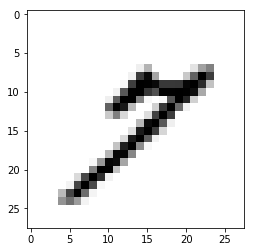

epoch:3number:0


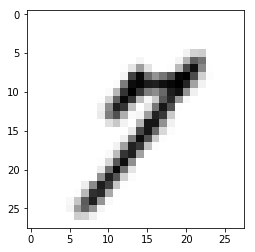

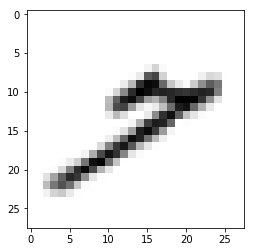

epoch:3number:1
epoch:3number:2
epoch:3number:3
epoch:3number:4
epoch:3number:5
epoch:3number:6
epoch:3number:7
epoch:3number:8
epoch:3number:9
epoch:3number:10
epoch:3number:11
epoch:3number:12
epoch:3number:13
epoch:3number:14
epoch:3number:15
epoch:3number:16
epoch:3number:17
epoch:3number:18
epoch:3number:19
epoch:3number:20
epoch:3number:21
epoch:3number:22
epoch:3number:23
epoch:3number:24
epoch:3number:25
epoch:3number:26
epoch:3number:27
epoch:3number:28
epoch:3number:29
epoch:3number:30
epoch:3number:31
epoch:3number:32
epoch:3number:33
epoch:3number:34
epoch:3number:35
epoch:3number:36
epoch:3number:37
epoch:3number:38
epoch:3number:39
epoch:3number:40
epoch:3number:41
epoch:3number:42
epoch:3number:43
epoch:3number:44
epoch:3number:45
epoch:3number:46
epoch:3number:47
epoch:3number:48
epoch:3number:49
epoch:3number:50
epoch:3number:51
epoch:3number:52
epoch:3number:53
epoch:3number:54
epoch:3number:55
epoch:3number:56
epoch:3number:57
epoch:3number:58
epoch:3number:59
epoch:

epoch:3number:463
epoch:3number:464
epoch:3number:465
epoch:3number:466
epoch:3number:467
epoch:3number:468
epoch:3number:469
epoch:3number:470
epoch:3number:471
epoch:3number:472
epoch:3number:473
epoch:3number:474
epoch:3number:475
epoch:3number:476
epoch:3number:477
epoch:3number:478
epoch:3number:479
epoch:3number:480
epoch:3number:481
epoch:3number:482
epoch:3number:483
epoch:3number:484
epoch:3number:485
epoch:3number:486
epoch:3number:487
epoch:3number:488
epoch:3number:489
epoch:3number:490
epoch:3number:491
epoch:3number:492
epoch:3number:493
epoch:3number:494
epoch:3number:495
epoch:3number:496
epoch:3number:497
epoch:3number:498
epoch:3number:499
epoch:3number:500
epoch:3number:501
epoch:3number:502
epoch:3number:503
epoch:3number:504
epoch:3number:505
epoch:3number:506
epoch:3number:507
epoch:3number:508
epoch:3number:509
epoch:3number:510
epoch:3number:511
epoch:3number:512
epoch:3number:513
epoch:3number:514
epoch:3number:515
epoch:3number:516
epoch:3number:517
epoch:3num

epoch:3number:927
epoch:3number:928
epoch:3number:929
epoch:3number:930
epoch:3number:931
epoch:3number:932
epoch:3number:933
epoch:3number:934
epoch:3number:935
epoch:3number:936
epoch:3number:937
epoch:3number:938
epoch:3number:939
epoch:3number:940
epoch:3number:941
epoch:3number:942
epoch:3number:943
epoch:3number:944
epoch:3number:945
epoch:3number:946
epoch:3number:947
epoch:3number:948
epoch:3number:949
epoch:3number:950
epoch:3number:951
epoch:3number:952
epoch:3number:953
epoch:3number:954
epoch:3number:955
epoch:3number:956
epoch:3number:957
epoch:3number:958
epoch:3number:959
epoch:3number:960
epoch:3number:961
epoch:3number:962
epoch:3number:963
epoch:3number:964
epoch:3number:965
epoch:3number:966
epoch:3number:967
epoch:3number:968
epoch:3number:969
epoch:3number:970
epoch:3number:971
epoch:3number:972
epoch:3number:973
epoch:3number:974
epoch:3number:975
epoch:3number:976
epoch:3number:977
epoch:3number:978
epoch:3number:979
epoch:3number:980
epoch:3number:981
epoch:3num

epoch:3number:1394
epoch:3number:1395
epoch:3number:1396
epoch:3number:1397
epoch:3number:1398
epoch:3number:1399
epoch:3number:1400
epoch:3number:1401
epoch:3number:1402
epoch:3number:1403
epoch:3number:1404
epoch:3number:1405
epoch:3number:1406
epoch:3number:1407
epoch:3number:1408
epoch:3number:1409
epoch:3number:1410
epoch:3number:1411
epoch:3number:1412
epoch:3number:1413
epoch:3number:1414
epoch:3number:1415
epoch:3number:1416
epoch:3number:1417
epoch:3number:1418
epoch:3number:1419
epoch:3number:1420
epoch:3number:1421
epoch:3number:1422
epoch:3number:1423
epoch:3number:1424
epoch:3number:1425
epoch:3number:1426
epoch:3number:1427
epoch:3number:1428
epoch:3number:1429
epoch:3number:1430
epoch:3number:1431
epoch:3number:1432
epoch:3number:1433
epoch:3number:1434
epoch:3number:1435
epoch:3number:1436
epoch:3number:1437
epoch:3number:1438
epoch:3number:1439
epoch:3number:1440
epoch:3number:1441
epoch:3number:1442
epoch:3number:1443
epoch:3number:1444
epoch:3number:1445
epoch:3numbe

epoch:3number:1858
epoch:3number:1859
epoch:3number:1860
epoch:3number:1861
epoch:3number:1862
epoch:3number:1863
epoch:3number:1864
epoch:3number:1865
epoch:3number:1866
epoch:3number:1867
epoch:3number:1868
epoch:3number:1869
epoch:3number:1870
epoch:3number:1871
epoch:3number:1872
epoch:3number:1873
epoch:3number:1874
epoch:3number:1875
epoch:3number:1876
epoch:3number:1877
epoch:3number:1878
epoch:3number:1879
epoch:3number:1880
epoch:3number:1881
epoch:3number:1882
epoch:3number:1883
epoch:3number:1884
epoch:3number:1885
epoch:3number:1886
epoch:3number:1887
epoch:3number:1888
epoch:3number:1889
epoch:3number:1890
epoch:3number:1891
epoch:3number:1892
epoch:3number:1893
epoch:3number:1894
epoch:3number:1895
epoch:3number:1896
epoch:3number:1897
epoch:3number:1898
epoch:3number:1899
epoch:3number:1900
epoch:3number:1901
epoch:3number:1902
epoch:3number:1903
epoch:3number:1904
epoch:3number:1905
epoch:3number:1906
epoch:3number:1907
epoch:3number:1908
epoch:3number:1909
epoch:3numbe

epoch:3number:2317
epoch:3number:2318
epoch:3number:2319
epoch:3number:2320
epoch:3number:2321
epoch:3number:2322
epoch:3number:2323
epoch:3number:2324
epoch:3number:2325
epoch:3number:2326
epoch:3number:2327
epoch:3number:2328
epoch:3number:2329
epoch:3number:2330
epoch:3number:2331
epoch:3number:2332
epoch:3number:2333
epoch:3number:2334
epoch:3number:2335
epoch:3number:2336
epoch:3number:2337
epoch:3number:2338
epoch:3number:2339
epoch:3number:2340
epoch:3number:2341
epoch:3number:2342
epoch:3number:2343
epoch:3number:2344
epoch:3number:2345
epoch:3number:2346
epoch:3number:2347
epoch:3number:2348
epoch:3number:2349
epoch:3number:2350
epoch:3number:2351
epoch:3number:2352
epoch:3number:2353
epoch:3number:2354
epoch:3number:2355
epoch:3number:2356
epoch:3number:2357
epoch:3number:2358
epoch:3number:2359
epoch:3number:2360
epoch:3number:2361
epoch:3number:2362
epoch:3number:2363
epoch:3number:2364
epoch:3number:2365
epoch:3number:2366
epoch:3number:2367
epoch:3number:2368
epoch:3numbe

epoch:3number:2780
epoch:3number:2781
epoch:3number:2782
epoch:3number:2783
epoch:3number:2784
epoch:3number:2785
epoch:3number:2786
epoch:3number:2787
epoch:3number:2788
epoch:3number:2789
epoch:3number:2790
epoch:3number:2791
epoch:3number:2792
epoch:3number:2793
epoch:3number:2794
epoch:3number:2795
epoch:3number:2796
epoch:3number:2797
epoch:3number:2798
epoch:3number:2799
epoch:3number:2800
epoch:3number:2801
epoch:3number:2802
epoch:3number:2803
epoch:3number:2804
epoch:3number:2805
epoch:3number:2806
epoch:3number:2807
epoch:3number:2808
epoch:3number:2809
epoch:3number:2810
epoch:3number:2811
epoch:3number:2812
epoch:3number:2813
epoch:3number:2814
epoch:3number:2815
epoch:3number:2816
epoch:3number:2817
epoch:3number:2818
epoch:3number:2819
epoch:3number:2820
epoch:3number:2821
epoch:3number:2822
epoch:3number:2823
epoch:3number:2824
epoch:3number:2825
epoch:3number:2826
epoch:3number:2827
epoch:3number:2828
epoch:3number:2829
epoch:3number:2830
epoch:3number:2831
epoch:3numbe

epoch:3number:3218
epoch:3number:3219
epoch:3number:3220
epoch:3number:3221
epoch:3number:3222
epoch:3number:3223
epoch:3number:3224
epoch:3number:3225
epoch:3number:3226
epoch:3number:3227
epoch:3number:3228
epoch:3number:3229
epoch:3number:3230
epoch:3number:3231
epoch:3number:3232
epoch:3number:3233
epoch:3number:3234
epoch:3number:3235
epoch:3number:3236
epoch:3number:3237
epoch:3number:3238
epoch:3number:3239
epoch:3number:3240
epoch:3number:3241
epoch:3number:3242
epoch:3number:3243
epoch:3number:3244
epoch:3number:3245
epoch:3number:3246
epoch:3number:3247
epoch:3number:3248
epoch:3number:3249
epoch:3number:3250
epoch:3number:3251
epoch:3number:3252
epoch:3number:3253
epoch:3number:3254
epoch:3number:3255
epoch:3number:3256
epoch:3number:3257
epoch:3number:3258
epoch:3number:3259
epoch:3number:3260
epoch:3number:3261
epoch:3number:3262
epoch:3number:3263
epoch:3number:3264
epoch:3number:3265
epoch:3number:3266
epoch:3number:3267
epoch:3number:3268
epoch:3number:3269
epoch:3numbe

epoch:3number:3652
epoch:3number:3653
epoch:3number:3654
epoch:3number:3655
epoch:3number:3656
epoch:3number:3657
epoch:3number:3658
epoch:3number:3659
epoch:3number:3660
epoch:3number:3661
epoch:3number:3662
epoch:3number:3663
epoch:3number:3664
epoch:3number:3665
epoch:3number:3666
epoch:3number:3667
epoch:3number:3668
epoch:3number:3669
epoch:3number:3670
epoch:3number:3671
epoch:3number:3672
epoch:3number:3673
epoch:3number:3674
epoch:3number:3675
epoch:3number:3676
epoch:3number:3677
epoch:3number:3678
epoch:3number:3679
epoch:3number:3680
epoch:3number:3681
epoch:3number:3682
epoch:3number:3683
epoch:3number:3684
epoch:3number:3685
epoch:3number:3686
epoch:3number:3687
epoch:3number:3688
epoch:3number:3689
epoch:3number:3690
epoch:3number:3691
epoch:3number:3692
epoch:3number:3693
epoch:3number:3694
epoch:3number:3695
epoch:3number:3696
epoch:3number:3697
epoch:3number:3698
epoch:3number:3699
epoch:3number:3700
epoch:3number:3701
epoch:3number:3702
epoch:3number:3703
epoch:3numbe

epoch:3number:4115
epoch:3number:4116
epoch:3number:4117
epoch:3number:4118
epoch:3number:4119
epoch:3number:4120
epoch:3number:4121
epoch:3number:4122
epoch:3number:4123
epoch:3number:4124
epoch:3number:4125
epoch:3number:4126
epoch:3number:4127
epoch:3number:4128
epoch:3number:4129
epoch:3number:4130
epoch:3number:4131
epoch:3number:4132
epoch:3number:4133
epoch:3number:4134
epoch:3number:4135
epoch:3number:4136
epoch:3number:4137
epoch:3number:4138
epoch:3number:4139
epoch:3number:4140
epoch:3number:4141
epoch:3number:4142
epoch:3number:4143
epoch:3number:4144
epoch:3number:4145
epoch:3number:4146
epoch:3number:4147
epoch:3number:4148
epoch:3number:4149
epoch:3number:4150
epoch:3number:4151
epoch:3number:4152
epoch:3number:4153
epoch:3number:4154
epoch:3number:4155
epoch:3number:4156
epoch:3number:4157
epoch:3number:4158
epoch:3number:4159
epoch:3number:4160
epoch:3number:4161
epoch:3number:4162
epoch:3number:4163
epoch:3number:4164
epoch:3number:4165
epoch:3number:4166
epoch:3numbe

epoch:3number:4547
epoch:3number:4548
epoch:3number:4549
epoch:3number:4550
epoch:3number:4551
epoch:3number:4552
epoch:3number:4553
epoch:3number:4554
epoch:3number:4555
epoch:3number:4556
epoch:3number:4557
epoch:3number:4558
epoch:3number:4559
epoch:3number:4560
epoch:3number:4561
epoch:3number:4562
epoch:3number:4563
epoch:3number:4564
epoch:3number:4565
epoch:3number:4566
epoch:3number:4567
epoch:3number:4568
epoch:3number:4569
epoch:3number:4570
epoch:3number:4571
epoch:3number:4572
epoch:3number:4573
epoch:3number:4574
epoch:3number:4575
epoch:3number:4576
epoch:3number:4577
epoch:3number:4578
epoch:3number:4579
epoch:3number:4580
epoch:3number:4581
epoch:3number:4582
epoch:3number:4583
epoch:3number:4584
epoch:3number:4585
epoch:3number:4586
epoch:3number:4587
epoch:3number:4588
epoch:3number:4589
epoch:3number:4590
epoch:3number:4591
epoch:3number:4592
epoch:3number:4593
epoch:3number:4594
epoch:3number:4595
epoch:3number:4596
epoch:3number:4597
epoch:3number:4598
epoch:3numbe

epoch:3number:5010
epoch:3number:5011
epoch:3number:5012
epoch:3number:5013
epoch:3number:5014
epoch:3number:5015
epoch:3number:5016
epoch:3number:5017
epoch:3number:5018
epoch:3number:5019
epoch:3number:5020
epoch:3number:5021
epoch:3number:5022
epoch:3number:5023
epoch:3number:5024
epoch:3number:5025
epoch:3number:5026
epoch:3number:5027
epoch:3number:5028
epoch:3number:5029
epoch:3number:5030
epoch:3number:5031
epoch:3number:5032
epoch:3number:5033
epoch:3number:5034
epoch:3number:5035
epoch:3number:5036
epoch:3number:5037
epoch:3number:5038
epoch:3number:5039
epoch:3number:5040
epoch:3number:5041
epoch:3number:5042
epoch:3number:5043
epoch:3number:5044
epoch:3number:5045
epoch:3number:5046
epoch:3number:5047
epoch:3number:5048
epoch:3number:5049
epoch:3number:5050
epoch:3number:5051
epoch:3number:5052
epoch:3number:5053
epoch:3number:5054
epoch:3number:5055
epoch:3number:5056
epoch:3number:5057
epoch:3number:5058
epoch:3number:5059
epoch:3number:5060
epoch:3number:5061
epoch:3numbe

epoch:3number:5469
epoch:3number:5470
epoch:3number:5471
epoch:3number:5472
epoch:3number:5473
epoch:3number:5474
epoch:3number:5475
epoch:3number:5476
epoch:3number:5477
epoch:3number:5478
epoch:3number:5479
epoch:3number:5480
epoch:3number:5481
epoch:3number:5482
epoch:3number:5483
epoch:3number:5484
epoch:3number:5485
epoch:3number:5486
epoch:3number:5487
epoch:3number:5488
epoch:3number:5489
epoch:3number:5490
epoch:3number:5491
epoch:3number:5492
epoch:3number:5493
epoch:3number:5494
epoch:3number:5495
epoch:3number:5496
epoch:3number:5497
epoch:3number:5498
epoch:3number:5499
epoch:3number:5500
epoch:3number:5501
epoch:3number:5502
epoch:3number:5503
epoch:3number:5504
epoch:3number:5505
epoch:3number:5506
epoch:3number:5507
epoch:3number:5508
epoch:3number:5509
epoch:3number:5510
epoch:3number:5511
epoch:3number:5512
epoch:3number:5513
epoch:3number:5514
epoch:3number:5515
epoch:3number:5516
epoch:3number:5517
epoch:3number:5518
epoch:3number:5519
epoch:3number:5520
epoch:3numbe

epoch:3number:5929
epoch:3number:5930
epoch:3number:5931
epoch:3number:5932
epoch:3number:5933
epoch:3number:5934
epoch:3number:5935
epoch:3number:5936
epoch:3number:5937
epoch:3number:5938
epoch:3number:5939
epoch:3number:5940
epoch:3number:5941
epoch:3number:5942
epoch:3number:5943
epoch:3number:5944
epoch:3number:5945
epoch:3number:5946
epoch:3number:5947
epoch:3number:5948
epoch:3number:5949
epoch:3number:5950
epoch:3number:5951
epoch:3number:5952
epoch:3number:5953
epoch:3number:5954
epoch:3number:5955
epoch:3number:5956
epoch:3number:5957
epoch:3number:5958
epoch:3number:5959
epoch:3number:5960
epoch:3number:5961
epoch:3number:5962
epoch:3number:5963
epoch:3number:5964
epoch:3number:5965
epoch:3number:5966
epoch:3number:5967
epoch:3number:5968
epoch:3number:5969
epoch:3number:5970
epoch:3number:5971
epoch:3number:5972
epoch:3number:5973
epoch:3number:5974
epoch:3number:5975
epoch:3number:5976
epoch:3number:5977
epoch:3number:5978
epoch:3number:5979
epoch:3number:5980
epoch:3numbe

epoch:3number:6385
epoch:3number:6386
epoch:3number:6387
epoch:3number:6388
epoch:3number:6389
epoch:3number:6390
epoch:3number:6391
epoch:3number:6392
epoch:3number:6393
epoch:3number:6394
epoch:3number:6395
epoch:3number:6396
epoch:3number:6397
epoch:3number:6398
epoch:3number:6399
epoch:3number:6400
epoch:3number:6401
epoch:3number:6402
epoch:3number:6403
epoch:3number:6404
epoch:3number:6405
epoch:3number:6406
epoch:3number:6407
epoch:3number:6408
epoch:3number:6409
epoch:3number:6410
epoch:3number:6411
epoch:3number:6412
epoch:3number:6413
epoch:3number:6414
epoch:3number:6415
epoch:3number:6416
epoch:3number:6417
epoch:3number:6418
epoch:3number:6419
epoch:3number:6420
epoch:3number:6421
epoch:3number:6422
epoch:3number:6423
epoch:3number:6424
epoch:3number:6425
epoch:3number:6426
epoch:3number:6427
epoch:3number:6428
epoch:3number:6429
epoch:3number:6430
epoch:3number:6431
epoch:3number:6432
epoch:3number:6433
epoch:3number:6434
epoch:3number:6435
epoch:3number:6436
epoch:3numbe

epoch:3number:6847
epoch:3number:6848
epoch:3number:6849
epoch:3number:6850
epoch:3number:6851
epoch:3number:6852
epoch:3number:6853
epoch:3number:6854
epoch:3number:6855
epoch:3number:6856
epoch:3number:6857
epoch:3number:6858
epoch:3number:6859
epoch:3number:6860
epoch:3number:6861
epoch:3number:6862
epoch:3number:6863
epoch:3number:6864
epoch:3number:6865
epoch:3number:6866
epoch:3number:6867
epoch:3number:6868
epoch:3number:6869
epoch:3number:6870
epoch:3number:6871
epoch:3number:6872
epoch:3number:6873
epoch:3number:6874
epoch:3number:6875
epoch:3number:6876
epoch:3number:6877
epoch:3number:6878
epoch:3number:6879
epoch:3number:6880
epoch:3number:6881
epoch:3number:6882
epoch:3number:6883
epoch:3number:6884
epoch:3number:6885
epoch:3number:6886
epoch:3number:6887
epoch:3number:6888
epoch:3number:6889
epoch:3number:6890
epoch:3number:6891
epoch:3number:6892
epoch:3number:6893
epoch:3number:6894
epoch:3number:6895
epoch:3number:6896
epoch:3number:6897
epoch:3number:6898
epoch:3numbe

epoch:3number:7304
epoch:3number:7305
epoch:3number:7306
epoch:3number:7307
epoch:3number:7308
epoch:3number:7309
epoch:3number:7310
epoch:3number:7311
epoch:3number:7312
epoch:3number:7313
epoch:3number:7314
epoch:3number:7315
epoch:3number:7316
epoch:3number:7317
epoch:3number:7318
epoch:3number:7319
epoch:3number:7320
epoch:3number:7321
epoch:3number:7322
epoch:3number:7323
epoch:3number:7324
epoch:3number:7325
epoch:3number:7326
epoch:3number:7327
epoch:3number:7328
epoch:3number:7329
epoch:3number:7330
epoch:3number:7331
epoch:3number:7332
epoch:3number:7333
epoch:3number:7334
epoch:3number:7335
epoch:3number:7336
epoch:3number:7337
epoch:3number:7338
epoch:3number:7339
epoch:3number:7340
epoch:3number:7341
epoch:3number:7342
epoch:3number:7343
epoch:3number:7344
epoch:3number:7345
epoch:3number:7346
epoch:3number:7347
epoch:3number:7348
epoch:3number:7349
epoch:3number:7350
epoch:3number:7351
epoch:3number:7352
epoch:3number:7353
epoch:3number:7354
epoch:3number:7355
epoch:3numbe

epoch:3number:7736
epoch:3number:7737
epoch:3number:7738
epoch:3number:7739
epoch:3number:7740
epoch:3number:7741
epoch:3number:7742
epoch:3number:7743
epoch:3number:7744
epoch:3number:7745
epoch:3number:7746
epoch:3number:7747
epoch:3number:7748
epoch:3number:7749
epoch:3number:7750
epoch:3number:7751
epoch:3number:7752
epoch:3number:7753
epoch:3number:7754
epoch:3number:7755
epoch:3number:7756
epoch:3number:7757
epoch:3number:7758
epoch:3number:7759
epoch:3number:7760
epoch:3number:7761
epoch:3number:7762
epoch:3number:7763
epoch:3number:7764
epoch:3number:7765
epoch:3number:7766
epoch:3number:7767
epoch:3number:7768
epoch:3number:7769
epoch:3number:7770
epoch:3number:7771
epoch:3number:7772
epoch:3number:7773
epoch:3number:7774
epoch:3number:7775
epoch:3number:7776
epoch:3number:7777
epoch:3number:7778
epoch:3number:7779
epoch:3number:7780
epoch:3number:7781
epoch:3number:7782
epoch:3number:7783
epoch:3number:7784
epoch:3number:7785
epoch:3number:7786
epoch:3number:7787
epoch:3numbe

epoch:3number:8169
epoch:3number:8170
epoch:3number:8171
epoch:3number:8172
epoch:3number:8173
epoch:3number:8174
epoch:3number:8175
epoch:3number:8176
epoch:3number:8177
epoch:3number:8178
epoch:3number:8179
epoch:3number:8180
epoch:3number:8181
epoch:3number:8182
epoch:3number:8183
epoch:3number:8184
epoch:3number:8185
epoch:3number:8186
epoch:3number:8187
epoch:3number:8188
epoch:3number:8189
epoch:3number:8190
epoch:3number:8191
epoch:3number:8192
epoch:3number:8193
epoch:3number:8194
epoch:3number:8195
epoch:3number:8196
epoch:3number:8197
epoch:3number:8198
epoch:3number:8199
epoch:3number:8200
epoch:3number:8201
epoch:3number:8202
epoch:3number:8203
epoch:3number:8204
epoch:3number:8205
epoch:3number:8206
epoch:3number:8207
epoch:3number:8208
epoch:3number:8209
epoch:3number:8210
epoch:3number:8211
epoch:3number:8212
epoch:3number:8213
epoch:3number:8214
epoch:3number:8215
epoch:3number:8216
epoch:3number:8217
epoch:3number:8218
epoch:3number:8219
epoch:3number:8220
epoch:3numbe

epoch:3number:8601
epoch:3number:8602
epoch:3number:8603
epoch:3number:8604
epoch:3number:8605
epoch:3number:8606
epoch:3number:8607
epoch:3number:8608
epoch:3number:8609
epoch:3number:8610
epoch:3number:8611
epoch:3number:8612
epoch:3number:8613
epoch:3number:8614
epoch:3number:8615
epoch:3number:8616
epoch:3number:8617
epoch:3number:8618
epoch:3number:8619
epoch:3number:8620
epoch:3number:8621
epoch:3number:8622
epoch:3number:8623
epoch:3number:8624
epoch:3number:8625
epoch:3number:8626
epoch:3number:8627
epoch:3number:8628
epoch:3number:8629
epoch:3number:8630
epoch:3number:8631
epoch:3number:8632
epoch:3number:8633
epoch:3number:8634
epoch:3number:8635
epoch:3number:8636
epoch:3number:8637
epoch:3number:8638
epoch:3number:8639
epoch:3number:8640
epoch:3number:8641
epoch:3number:8642
epoch:3number:8643
epoch:3number:8644
epoch:3number:8645
epoch:3number:8646
epoch:3number:8647
epoch:3number:8648
epoch:3number:8649
epoch:3number:8650
epoch:3number:8651
epoch:3number:8652
epoch:3numbe

epoch:3number:9035
epoch:3number:9036
epoch:3number:9037
epoch:3number:9038
epoch:3number:9039
epoch:3number:9040
epoch:3number:9041
epoch:3number:9042
epoch:3number:9043
epoch:3number:9044
epoch:3number:9045
epoch:3number:9046
epoch:3number:9047
epoch:3number:9048
epoch:3number:9049
epoch:3number:9050
epoch:3number:9051
epoch:3number:9052
epoch:3number:9053
epoch:3number:9054
epoch:3number:9055
epoch:3number:9056
epoch:3number:9057
epoch:3number:9058
epoch:3number:9059
epoch:3number:9060
epoch:3number:9061
epoch:3number:9062
epoch:3number:9063
epoch:3number:9064
epoch:3number:9065
epoch:3number:9066
epoch:3number:9067
epoch:3number:9068
epoch:3number:9069
epoch:3number:9070
epoch:3number:9071
epoch:3number:9072
epoch:3number:9073
epoch:3number:9074
epoch:3number:9075
epoch:3number:9076
epoch:3number:9077
epoch:3number:9078
epoch:3number:9079
epoch:3number:9080
epoch:3number:9081
epoch:3number:9082
epoch:3number:9083
epoch:3number:9084
epoch:3number:9085
epoch:3number:9086
epoch:3numbe

epoch:3number:9468
epoch:3number:9469
epoch:3number:9470
epoch:3number:9471
epoch:3number:9472
epoch:3number:9473
epoch:3number:9474
epoch:3number:9475
epoch:3number:9476
epoch:3number:9477
epoch:3number:9478
epoch:3number:9479
epoch:3number:9480
epoch:3number:9481
epoch:3number:9482
epoch:3number:9483
epoch:3number:9484
epoch:3number:9485
epoch:3number:9486
epoch:3number:9487
epoch:3number:9488
epoch:3number:9489
epoch:3number:9490
epoch:3number:9491
epoch:3number:9492
epoch:3number:9493
epoch:3number:9494
epoch:3number:9495
epoch:3number:9496
epoch:3number:9497
epoch:3number:9498
epoch:3number:9499
epoch:3number:9500
epoch:3number:9501
epoch:3number:9502
epoch:3number:9503
epoch:3number:9504
epoch:3number:9505
epoch:3number:9506
epoch:3number:9507
epoch:3number:9508
epoch:3number:9509
epoch:3number:9510
epoch:3number:9511
epoch:3number:9512
epoch:3number:9513
epoch:3number:9514
epoch:3number:9515
epoch:3number:9516
epoch:3number:9517
epoch:3number:9518
epoch:3number:9519
epoch:3numbe

epoch:3number:9929
epoch:3number:9930
epoch:3number:9931
epoch:3number:9932
epoch:3number:9933
epoch:3number:9934
epoch:3number:9935
epoch:3number:9936
epoch:3number:9937
epoch:3number:9938
epoch:3number:9939
epoch:3number:9940
epoch:3number:9941
epoch:3number:9942
epoch:3number:9943
epoch:3number:9944
epoch:3number:9945
epoch:3number:9946
epoch:3number:9947
epoch:3number:9948
epoch:3number:9949
epoch:3number:9950
epoch:3number:9951
epoch:3number:9952
epoch:3number:9953
epoch:3number:9954
epoch:3number:9955
epoch:3number:9956
epoch:3number:9957
epoch:3number:9958
epoch:3number:9959
epoch:3number:9960
epoch:3number:9961
epoch:3number:9962
epoch:3number:9963
epoch:3number:9964
epoch:3number:9965
epoch:3number:9966
epoch:3number:9967
epoch:3number:9968
epoch:3number:9969
epoch:3number:9970
epoch:3number:9971
epoch:3number:9972
epoch:3number:9973
epoch:3number:9974
epoch:3number:9975
epoch:3number:9976
epoch:3number:9977
epoch:3number:9978
epoch:3number:9979
epoch:3number:9980
epoch:3numbe

epoch:3number:10360
epoch:3number:10361
epoch:3number:10362
epoch:3number:10363
epoch:3number:10364
epoch:3number:10365
epoch:3number:10366
epoch:3number:10367
epoch:3number:10368
epoch:3number:10369
epoch:3number:10370
epoch:3number:10371
epoch:3number:10372
epoch:3number:10373
epoch:3number:10374
epoch:3number:10375
epoch:3number:10376
epoch:3number:10377
epoch:3number:10378
epoch:3number:10379
epoch:3number:10380
epoch:3number:10381
epoch:3number:10382
epoch:3number:10383
epoch:3number:10384
epoch:3number:10385
epoch:3number:10386
epoch:3number:10387
epoch:3number:10388
epoch:3number:10389
epoch:3number:10390
epoch:3number:10391
epoch:3number:10392
epoch:3number:10393
epoch:3number:10394
epoch:3number:10395
epoch:3number:10396
epoch:3number:10397
epoch:3number:10398
epoch:3number:10399
epoch:3number:10400
epoch:3number:10401
epoch:3number:10402
epoch:3number:10403
epoch:3number:10404
epoch:3number:10405
epoch:3number:10406
epoch:3number:10407
epoch:3number:10408
epoch:3number:10409


epoch:3number:10793
epoch:3number:10794
epoch:3number:10795
epoch:3number:10796
epoch:3number:10797
epoch:3number:10798
epoch:3number:10799
epoch:3number:10800
epoch:3number:10801
epoch:3number:10802
epoch:3number:10803
epoch:3number:10804
epoch:3number:10805
epoch:3number:10806
epoch:3number:10807
epoch:3number:10808
epoch:3number:10809
epoch:3number:10810
epoch:3number:10811
epoch:3number:10812
epoch:3number:10813
epoch:3number:10814
epoch:3number:10815
epoch:3number:10816
epoch:3number:10817
epoch:3number:10818
epoch:3number:10819
epoch:3number:10820
epoch:3number:10821
epoch:3number:10822
epoch:3number:10823
epoch:3number:10824
epoch:3number:10825
epoch:3number:10826
epoch:3number:10827
epoch:3number:10828
epoch:3number:10829
epoch:3number:10830
epoch:3number:10831
epoch:3number:10832
epoch:3number:10833
epoch:3number:10834
epoch:3number:10835
epoch:3number:10836
epoch:3number:10837
epoch:3number:10838
epoch:3number:10839
epoch:3number:10840
epoch:3number:10841
epoch:3number:10842


epoch:3number:11215
epoch:3number:11216
epoch:3number:11217
epoch:3number:11218
epoch:3number:11219
epoch:3number:11220
epoch:3number:11221
epoch:3number:11222
epoch:3number:11223
epoch:3number:11224
epoch:3number:11225
epoch:3number:11226
epoch:3number:11227
epoch:3number:11228
epoch:3number:11229
epoch:3number:11230
epoch:3number:11231
epoch:3number:11232
epoch:3number:11233
epoch:3number:11234
epoch:3number:11235
epoch:3number:11236
epoch:3number:11237
epoch:3number:11238
epoch:3number:11239
epoch:3number:11240
epoch:3number:11241
epoch:3number:11242
epoch:3number:11243
epoch:3number:11244
epoch:3number:11245
epoch:3number:11246
epoch:3number:11247
epoch:3number:11248
epoch:3number:11249
epoch:3number:11250
epoch:3number:11251
epoch:3number:11252
epoch:3number:11253
epoch:3number:11254
epoch:3number:11255
epoch:3number:11256
epoch:3number:11257
epoch:3number:11258
epoch:3number:11259
epoch:3number:11260
epoch:3number:11261
epoch:3number:11262
epoch:3number:11263
epoch:3number:11264


epoch:3number:11645
epoch:3number:11646
epoch:3number:11647
epoch:3number:11648
epoch:3number:11649
epoch:3number:11650
epoch:3number:11651
epoch:3number:11652
epoch:3number:11653
epoch:3number:11654
epoch:3number:11655
epoch:3number:11656
epoch:3number:11657
epoch:3number:11658
epoch:3number:11659
epoch:3number:11660
epoch:3number:11661
epoch:3number:11662
epoch:3number:11663
epoch:3number:11664
epoch:3number:11665
epoch:3number:11666
epoch:3number:11667
epoch:3number:11668
epoch:3number:11669
epoch:3number:11670
epoch:3number:11671
epoch:3number:11672
epoch:3number:11673
epoch:3number:11674
epoch:3number:11675
epoch:3number:11676
epoch:3number:11677
epoch:3number:11678
epoch:3number:11679
epoch:3number:11680
epoch:3number:11681
epoch:3number:11682
epoch:3number:11683
epoch:3number:11684
epoch:3number:11685
epoch:3number:11686
epoch:3number:11687
epoch:3number:11688
epoch:3number:11689
epoch:3number:11690
epoch:3number:11691
epoch:3number:11692
epoch:3number:11693
epoch:3number:11694


epoch:3number:12056
epoch:3number:12057
epoch:3number:12058
epoch:3number:12059
epoch:3number:12060
epoch:3number:12061
epoch:3number:12062
epoch:3number:12063
epoch:3number:12064
epoch:3number:12065
epoch:3number:12066
epoch:3number:12067
epoch:3number:12068
epoch:3number:12069
epoch:3number:12070
epoch:3number:12071
epoch:3number:12072
epoch:3number:12073
epoch:3number:12074
epoch:3number:12075
epoch:3number:12076
epoch:3number:12077
epoch:3number:12078
epoch:3number:12079
epoch:3number:12080
epoch:3number:12081
epoch:3number:12082
epoch:3number:12083
epoch:3number:12084
epoch:3number:12085
epoch:3number:12086
epoch:3number:12087
epoch:3number:12088
epoch:3number:12089
epoch:3number:12090
epoch:3number:12091
epoch:3number:12092
epoch:3number:12093
epoch:3number:12094
epoch:3number:12095
epoch:3number:12096
epoch:3number:12097
epoch:3number:12098
epoch:3number:12099
epoch:3number:12100
epoch:3number:12101
epoch:3number:12102
epoch:3number:12103
epoch:3number:12104
epoch:3number:12105


epoch:3number:12467
epoch:3number:12468
epoch:3number:12469
epoch:3number:12470
epoch:3number:12471
epoch:3number:12472
epoch:3number:12473
epoch:3number:12474
epoch:3number:12475
epoch:3number:12476
epoch:3number:12477
epoch:3number:12478
epoch:3number:12479
epoch:3number:12480
epoch:3number:12481
epoch:3number:12482
epoch:3number:12483
epoch:3number:12484
epoch:3number:12485
epoch:3number:12486
epoch:3number:12487
epoch:3number:12488
epoch:3number:12489
epoch:3number:12490
epoch:3number:12491
epoch:3number:12492
epoch:3number:12493
epoch:3number:12494
epoch:3number:12495
epoch:3number:12496
epoch:3number:12497
epoch:3number:12498
epoch:3number:12499
epoch:3number:12500
epoch:3number:12501
epoch:3number:12502
epoch:3number:12503
epoch:3number:12504
epoch:3number:12505
epoch:3number:12506
epoch:3number:12507
epoch:3number:12508
epoch:3number:12509
epoch:3number:12510
epoch:3number:12511
epoch:3number:12512
epoch:3number:12513
epoch:3number:12514
epoch:3number:12515
epoch:3number:12516


epoch:3number:12899
epoch:3number:12900
epoch:3number:12901
epoch:3number:12902
epoch:3number:12903
epoch:3number:12904
epoch:3number:12905
epoch:3number:12906
epoch:3number:12907
epoch:3number:12908
epoch:3number:12909
epoch:3number:12910
epoch:3number:12911
epoch:3number:12912
epoch:3number:12913
epoch:3number:12914
epoch:3number:12915
epoch:3number:12916
epoch:3number:12917
epoch:3number:12918
epoch:3number:12919
epoch:3number:12920
epoch:3number:12921
epoch:3number:12922
epoch:3number:12923
epoch:3number:12924
epoch:3number:12925
epoch:3number:12926
epoch:3number:12927
epoch:3number:12928
epoch:3number:12929
epoch:3number:12930
epoch:3number:12931
epoch:3number:12932
epoch:3number:12933
epoch:3number:12934
epoch:3number:12935
epoch:3number:12936
epoch:3number:12937
epoch:3number:12938
epoch:3number:12939
epoch:3number:12940
epoch:3number:12941
epoch:3number:12942
epoch:3number:12943
epoch:3number:12944
epoch:3number:12945
epoch:3number:12946
epoch:3number:12947
epoch:3number:12948


epoch:3number:13332
epoch:3number:13333
epoch:3number:13334
epoch:3number:13335
epoch:3number:13336
epoch:3number:13337
epoch:3number:13338
epoch:3number:13339
epoch:3number:13340
epoch:3number:13341
epoch:3number:13342
epoch:3number:13343
epoch:3number:13344
epoch:3number:13345
epoch:3number:13346
epoch:3number:13347
epoch:3number:13348
epoch:3number:13349
epoch:3number:13350
epoch:3number:13351
epoch:3number:13352
epoch:3number:13353
epoch:3number:13354
epoch:3number:13355
epoch:3number:13356
epoch:3number:13357
epoch:3number:13358
epoch:3number:13359
epoch:3number:13360
epoch:3number:13361
epoch:3number:13362
epoch:3number:13363
epoch:3number:13364
epoch:3number:13365
epoch:3number:13366
epoch:3number:13367
epoch:3number:13368
epoch:3number:13369
epoch:3number:13370
epoch:3number:13371
epoch:3number:13372
epoch:3number:13373
epoch:3number:13374
epoch:3number:13375
epoch:3number:13376
epoch:3number:13377
epoch:3number:13378
epoch:3number:13379
epoch:3number:13380
epoch:3number:13381


epoch:3number:13749
epoch:3number:13750
epoch:3number:13751
epoch:3number:13752
epoch:3number:13753
epoch:3number:13754
epoch:3number:13755
epoch:3number:13756
epoch:3number:13757
epoch:3number:13758
epoch:3number:13759
epoch:3number:13760
epoch:3number:13761
epoch:3number:13762
epoch:3number:13763
epoch:3number:13764
epoch:3number:13765
epoch:3number:13766
epoch:3number:13767
epoch:3number:13768
epoch:3number:13769
epoch:3number:13770
epoch:3number:13771
epoch:3number:13772
epoch:3number:13773
epoch:3number:13774
epoch:3number:13775
epoch:3number:13776
epoch:3number:13777
epoch:3number:13778
epoch:3number:13779
epoch:3number:13780
epoch:3number:13781
epoch:3number:13782
epoch:3number:13783
epoch:3number:13784
epoch:3number:13785
epoch:3number:13786
epoch:3number:13787
epoch:3number:13788
epoch:3number:13789
epoch:3number:13790
epoch:3number:13791
epoch:3number:13792
epoch:3number:13793
epoch:3number:13794
epoch:3number:13795
epoch:3number:13796
epoch:3number:13797
epoch:3number:13798


epoch:3number:14173
epoch:3number:14174
epoch:3number:14175
epoch:3number:14176
epoch:3number:14177
epoch:3number:14178
epoch:3number:14179
epoch:3number:14180
epoch:3number:14181
epoch:3number:14182
epoch:3number:14183
epoch:3number:14184
epoch:3number:14185
epoch:3number:14186
epoch:3number:14187
epoch:3number:14188
epoch:3number:14189
epoch:3number:14190
epoch:3number:14191
epoch:3number:14192
epoch:3number:14193
epoch:3number:14194
epoch:3number:14195
epoch:3number:14196
epoch:3number:14197
epoch:3number:14198
epoch:3number:14199
epoch:3number:14200
epoch:3number:14201
epoch:3number:14202
epoch:3number:14203
epoch:3number:14204
epoch:3number:14205
epoch:3number:14206
epoch:3number:14207
epoch:3number:14208
epoch:3number:14209
epoch:3number:14210
epoch:3number:14211
epoch:3number:14212
epoch:3number:14213
epoch:3number:14214
epoch:3number:14215
epoch:3number:14216
epoch:3number:14217
epoch:3number:14218
epoch:3number:14219
epoch:3number:14220
epoch:3number:14221
epoch:3number:14222


epoch:3number:14592
epoch:3number:14593
epoch:3number:14594
epoch:3number:14595
epoch:3number:14596
epoch:3number:14597
epoch:3number:14598
epoch:3number:14599
epoch:3number:14600
epoch:3number:14601
epoch:3number:14602
epoch:3number:14603
epoch:3number:14604
epoch:3number:14605
epoch:3number:14606
epoch:3number:14607
epoch:3number:14608
epoch:3number:14609
epoch:3number:14610
epoch:3number:14611
epoch:3number:14612
epoch:3number:14613
epoch:3number:14614
epoch:3number:14615
epoch:3number:14616
epoch:3number:14617
epoch:3number:14618
epoch:3number:14619
epoch:3number:14620
epoch:3number:14621
epoch:3number:14622
epoch:3number:14623
epoch:3number:14624
epoch:3number:14625
epoch:3number:14626
epoch:3number:14627
epoch:3number:14628
epoch:3number:14629
epoch:3number:14630
epoch:3number:14631
epoch:3number:14632
epoch:3number:14633
epoch:3number:14634
epoch:3number:14635
epoch:3number:14636
epoch:3number:14637
epoch:3number:14638
epoch:3number:14639
epoch:3number:14640
epoch:3number:14641


epoch:3number:15020
epoch:3number:15021
epoch:3number:15022
epoch:3number:15023
epoch:3number:15024
epoch:3number:15025
epoch:3number:15026
epoch:3number:15027
epoch:3number:15028
epoch:3number:15029
epoch:3number:15030
epoch:3number:15031
epoch:3number:15032
epoch:3number:15033
epoch:3number:15034
epoch:3number:15035
epoch:3number:15036
epoch:3number:15037
epoch:3number:15038
epoch:3number:15039
epoch:3number:15040
epoch:3number:15041
epoch:3number:15042
epoch:3number:15043
epoch:3number:15044
epoch:3number:15045
epoch:3number:15046
epoch:3number:15047
epoch:3number:15048
epoch:3number:15049
epoch:3number:15050
epoch:3number:15051
epoch:3number:15052
epoch:3number:15053
epoch:3number:15054
epoch:3number:15055
epoch:3number:15056
epoch:3number:15057
epoch:3number:15058
epoch:3number:15059
epoch:3number:15060
epoch:3number:15061
epoch:3number:15062
epoch:3number:15063
epoch:3number:15064
epoch:3number:15065
epoch:3number:15066
epoch:3number:15067
epoch:3number:15068
epoch:3number:15069


epoch:3number:15452
epoch:3number:15453
epoch:3number:15454
epoch:3number:15455
epoch:3number:15456
epoch:3number:15457
epoch:3number:15458
epoch:3number:15459
epoch:3number:15460
epoch:3number:15461
epoch:3number:15462
epoch:3number:15463
epoch:3number:15464
epoch:3number:15465
epoch:3number:15466
epoch:3number:15467
epoch:3number:15468
epoch:3number:15469
epoch:3number:15470
epoch:3number:15471
epoch:3number:15472
epoch:3number:15473
epoch:3number:15474
epoch:3number:15475
epoch:3number:15476
epoch:3number:15477
epoch:3number:15478
epoch:3number:15479
epoch:3number:15480
epoch:3number:15481
epoch:3number:15482
epoch:3number:15483
epoch:3number:15484
epoch:3number:15485
epoch:3number:15486
epoch:3number:15487
epoch:3number:15488
epoch:3number:15489
epoch:3number:15490
epoch:3number:15491
epoch:3number:15492
epoch:3number:15493
epoch:3number:15494
epoch:3number:15495
epoch:3number:15496
epoch:3number:15497
epoch:3number:15498
epoch:3number:15499
epoch:3number:15500
epoch:3number:15501


epoch:3number:15878
epoch:3number:15879
epoch:3number:15880
epoch:3number:15881
epoch:3number:15882
epoch:3number:15883
epoch:3number:15884
epoch:3number:15885
epoch:3number:15886
epoch:3number:15887
epoch:3number:15888
epoch:3number:15889
epoch:3number:15890
epoch:3number:15891
epoch:3number:15892
epoch:3number:15893
epoch:3number:15894
epoch:3number:15895
epoch:3number:15896
epoch:3number:15897
epoch:3number:15898
epoch:3number:15899
epoch:3number:15900
epoch:3number:15901
epoch:3number:15902
epoch:3number:15903
epoch:3number:15904
epoch:3number:15905
epoch:3number:15906
epoch:3number:15907
epoch:3number:15908
epoch:3number:15909
epoch:3number:15910
epoch:3number:15911
epoch:3number:15912
epoch:3number:15913
epoch:3number:15914
epoch:3number:15915
epoch:3number:15916
epoch:3number:15917
epoch:3number:15918
epoch:3number:15919
epoch:3number:15920
epoch:3number:15921
epoch:3number:15922
epoch:3number:15923
epoch:3number:15924
epoch:3number:15925
epoch:3number:15926
epoch:3number:15927


epoch:3number:16305
epoch:3number:16306
epoch:3number:16307
epoch:3number:16308
epoch:3number:16309
epoch:3number:16310
epoch:3number:16311
epoch:3number:16312
epoch:3number:16313
epoch:3number:16314
epoch:3number:16315
epoch:3number:16316
epoch:3number:16317
epoch:3number:16318
epoch:3number:16319
epoch:3number:16320
epoch:3number:16321
epoch:3number:16322
epoch:3number:16323
epoch:3number:16324
epoch:3number:16325
epoch:3number:16326
epoch:3number:16327
epoch:3number:16328
epoch:3number:16329
epoch:3number:16330
epoch:3number:16331
epoch:3number:16332
epoch:3number:16333
epoch:3number:16334
epoch:3number:16335
epoch:3number:16336
epoch:3number:16337
epoch:3number:16338
epoch:3number:16339
epoch:3number:16340
epoch:3number:16341
epoch:3number:16342
epoch:3number:16343
epoch:3number:16344
epoch:3number:16345
epoch:3number:16346
epoch:3number:16347
epoch:3number:16348
epoch:3number:16349
epoch:3number:16350
epoch:3number:16351
epoch:3number:16352
epoch:3number:16353
epoch:3number:16354


epoch:3number:16733
epoch:3number:16734
epoch:3number:16735
epoch:3number:16736
epoch:3number:16737
epoch:3number:16738
epoch:3number:16739
epoch:3number:16740
epoch:3number:16741
epoch:3number:16742
epoch:3number:16743
epoch:3number:16744
epoch:3number:16745
epoch:3number:16746
epoch:3number:16747
epoch:3number:16748
epoch:3number:16749
epoch:3number:16750
epoch:3number:16751
epoch:3number:16752
epoch:3number:16753
epoch:3number:16754
epoch:3number:16755
epoch:3number:16756
epoch:3number:16757
epoch:3number:16758
epoch:3number:16759
epoch:3number:16760
epoch:3number:16761
epoch:3number:16762
epoch:3number:16763
epoch:3number:16764
epoch:3number:16765
epoch:3number:16766
epoch:3number:16767
epoch:3number:16768
epoch:3number:16769
epoch:3number:16770
epoch:3number:16771
epoch:3number:16772
epoch:3number:16773
epoch:3number:16774
epoch:3number:16775
epoch:3number:16776
epoch:3number:16777
epoch:3number:16778
epoch:3number:16779
epoch:3number:16780
epoch:3number:16781
epoch:3number:16782


epoch:3number:17165
epoch:3number:17166
epoch:3number:17167
epoch:3number:17168
epoch:3number:17169
epoch:3number:17170
epoch:3number:17171
epoch:3number:17172
epoch:3number:17173
epoch:3number:17174
epoch:3number:17175
epoch:3number:17176
epoch:3number:17177
epoch:3number:17178
epoch:3number:17179
epoch:3number:17180
epoch:3number:17181
epoch:3number:17182
epoch:3number:17183
epoch:3number:17184
epoch:3number:17185
epoch:3number:17186
epoch:3number:17187
epoch:3number:17188
epoch:3number:17189
epoch:3number:17190
epoch:3number:17191
epoch:3number:17192
epoch:3number:17193
epoch:3number:17194
epoch:3number:17195
epoch:3number:17196
epoch:3number:17197
epoch:3number:17198
epoch:3number:17199
epoch:3number:17200
epoch:3number:17201
epoch:3number:17202
epoch:3number:17203
epoch:3number:17204
epoch:3number:17205
epoch:3number:17206
epoch:3number:17207
epoch:3number:17208
epoch:3number:17209
epoch:3number:17210
epoch:3number:17211
epoch:3number:17212
epoch:3number:17213
epoch:3number:17214


epoch:3number:17597
epoch:3number:17598
epoch:3number:17599
epoch:3number:17600
epoch:3number:17601
epoch:3number:17602
epoch:3number:17603
epoch:3number:17604
epoch:3number:17605
epoch:3number:17606
epoch:3number:17607
epoch:3number:17608
epoch:3number:17609
epoch:3number:17610
epoch:3number:17611
epoch:3number:17612
epoch:3number:17613
epoch:3number:17614
epoch:3number:17615
epoch:3number:17616
epoch:3number:17617
epoch:3number:17618
epoch:3number:17619
epoch:3number:17620
epoch:3number:17621
epoch:3number:17622
epoch:3number:17623
epoch:3number:17624
epoch:3number:17625
epoch:3number:17626
epoch:3number:17627
epoch:3number:17628
epoch:3number:17629
epoch:3number:17630
epoch:3number:17631
epoch:3number:17632
epoch:3number:17633
epoch:3number:17634
epoch:3number:17635
epoch:3number:17636
epoch:3number:17637
epoch:3number:17638
epoch:3number:17639
epoch:3number:17640
epoch:3number:17641
epoch:3number:17642
epoch:3number:17643
epoch:3number:17644
epoch:3number:17645
epoch:3number:17646


epoch:3number:18028
epoch:3number:18029
epoch:3number:18030
epoch:3number:18031
epoch:3number:18032
epoch:3number:18033
epoch:3number:18034
epoch:3number:18035
epoch:3number:18036
epoch:3number:18037
epoch:3number:18038
epoch:3number:18039
epoch:3number:18040
epoch:3number:18041
epoch:3number:18042
epoch:3number:18043
epoch:3number:18044
epoch:3number:18045
epoch:3number:18046
epoch:3number:18047
epoch:3number:18048
epoch:3number:18049
epoch:3number:18050
epoch:3number:18051
epoch:3number:18052
epoch:3number:18053
epoch:3number:18054
epoch:3number:18055
epoch:3number:18056
epoch:3number:18057
epoch:3number:18058
epoch:3number:18059
epoch:3number:18060
epoch:3number:18061
epoch:3number:18062
epoch:3number:18063
epoch:3number:18064
epoch:3number:18065
epoch:3number:18066
epoch:3number:18067
epoch:3number:18068
epoch:3number:18069
epoch:3number:18070
epoch:3number:18071
epoch:3number:18072
epoch:3number:18073
epoch:3number:18074
epoch:3number:18075
epoch:3number:18076
epoch:3number:18077


epoch:3number:18457
epoch:3number:18458
epoch:3number:18459
epoch:3number:18460
epoch:3number:18461
epoch:3number:18462
epoch:3number:18463
epoch:3number:18464
epoch:3number:18465
epoch:3number:18466
epoch:3number:18467
epoch:3number:18468
epoch:3number:18469
epoch:3number:18470
epoch:3number:18471
epoch:3number:18472
epoch:3number:18473
epoch:3number:18474
epoch:3number:18475
epoch:3number:18476
epoch:3number:18477
epoch:3number:18478
epoch:3number:18479
epoch:3number:18480
epoch:3number:18481
epoch:3number:18482
epoch:3number:18483
epoch:3number:18484
epoch:3number:18485
epoch:3number:18486
epoch:3number:18487
epoch:3number:18488
epoch:3number:18489
epoch:3number:18490
epoch:3number:18491
epoch:3number:18492
epoch:3number:18493
epoch:3number:18494
epoch:3number:18495
epoch:3number:18496
epoch:3number:18497
epoch:3number:18498
epoch:3number:18499
epoch:3number:18500
epoch:3number:18501
epoch:3number:18502
epoch:3number:18503
epoch:3number:18504
epoch:3number:18505
epoch:3number:18506


epoch:3number:18886
epoch:3number:18887
epoch:3number:18888
epoch:3number:18889
epoch:3number:18890
epoch:3number:18891
epoch:3number:18892
epoch:3number:18893
epoch:3number:18894
epoch:3number:18895
epoch:3number:18896
epoch:3number:18897
epoch:3number:18898
epoch:3number:18899
epoch:3number:18900
epoch:3number:18901
epoch:3number:18902
epoch:3number:18903
epoch:3number:18904
epoch:3number:18905
epoch:3number:18906
epoch:3number:18907
epoch:3number:18908
epoch:3number:18909
epoch:3number:18910
epoch:3number:18911
epoch:3number:18912
epoch:3number:18913
epoch:3number:18914
epoch:3number:18915
epoch:3number:18916
epoch:3number:18917
epoch:3number:18918
epoch:3number:18919
epoch:3number:18920
epoch:3number:18921
epoch:3number:18922
epoch:3number:18923
epoch:3number:18924
epoch:3number:18925
epoch:3number:18926
epoch:3number:18927
epoch:3number:18928
epoch:3number:18929
epoch:3number:18930
epoch:3number:18931
epoch:3number:18932
epoch:3number:18933
epoch:3number:18934
epoch:3number:18935


epoch:3number:19317
epoch:3number:19318
epoch:3number:19319
epoch:3number:19320
epoch:3number:19321
epoch:3number:19322
epoch:3number:19323
epoch:3number:19324
epoch:3number:19325
epoch:3number:19326
epoch:3number:19327
epoch:3number:19328
epoch:3number:19329
epoch:3number:19330
epoch:3number:19331
epoch:3number:19332
epoch:3number:19333
epoch:3number:19334
epoch:3number:19335
epoch:3number:19336
epoch:3number:19337
epoch:3number:19338
epoch:3number:19339
epoch:3number:19340
epoch:3number:19341
epoch:3number:19342
epoch:3number:19343
epoch:3number:19344
epoch:3number:19345
epoch:3number:19346
epoch:3number:19347
epoch:3number:19348
epoch:3number:19349
epoch:3number:19350
epoch:3number:19351
epoch:3number:19352
epoch:3number:19353
epoch:3number:19354
epoch:3number:19355
epoch:3number:19356
epoch:3number:19357
epoch:3number:19358
epoch:3number:19359
epoch:3number:19360
epoch:3number:19361
epoch:3number:19362
epoch:3number:19363
epoch:3number:19364
epoch:3number:19365
epoch:3number:19366


epoch:3number:19749
epoch:3number:19750
epoch:3number:19751
epoch:3number:19752
epoch:3number:19753
epoch:3number:19754
epoch:3number:19755
epoch:3number:19756
epoch:3number:19757
epoch:3number:19758
epoch:3number:19759
epoch:3number:19760
epoch:3number:19761
epoch:3number:19762
epoch:3number:19763
epoch:3number:19764
epoch:3number:19765
epoch:3number:19766
epoch:3number:19767
epoch:3number:19768
epoch:3number:19769
epoch:3number:19770
epoch:3number:19771
epoch:3number:19772
epoch:3number:19773
epoch:3number:19774
epoch:3number:19775
epoch:3number:19776
epoch:3number:19777
epoch:3number:19778
epoch:3number:19779
epoch:3number:19780
epoch:3number:19781
epoch:3number:19782
epoch:3number:19783
epoch:3number:19784
epoch:3number:19785
epoch:3number:19786
epoch:3number:19787
epoch:3number:19788
epoch:3number:19789
epoch:3number:19790
epoch:3number:19791
epoch:3number:19792
epoch:3number:19793
epoch:3number:19794
epoch:3number:19795
epoch:3number:19796
epoch:3number:19797
epoch:3number:19798


epoch:3number:20180
epoch:3number:20181
epoch:3number:20182
epoch:3number:20183
epoch:3number:20184
epoch:3number:20185
epoch:3number:20186
epoch:3number:20187
epoch:3number:20188
epoch:3number:20189
epoch:3number:20190
epoch:3number:20191
epoch:3number:20192
epoch:3number:20193
epoch:3number:20194
epoch:3number:20195
epoch:3number:20196
epoch:3number:20197
epoch:3number:20198
epoch:3number:20199
epoch:3number:20200
epoch:3number:20201
epoch:3number:20202
epoch:3number:20203
epoch:3number:20204
epoch:3number:20205
epoch:3number:20206
epoch:3number:20207
epoch:3number:20208
epoch:3number:20209
epoch:3number:20210
epoch:3number:20211
epoch:3number:20212
epoch:3number:20213
epoch:3number:20214
epoch:3number:20215
epoch:3number:20216
epoch:3number:20217
epoch:3number:20218
epoch:3number:20219
epoch:3number:20220
epoch:3number:20221
epoch:3number:20222
epoch:3number:20223
epoch:3number:20224
epoch:3number:20225
epoch:3number:20226
epoch:3number:20227
epoch:3number:20228
epoch:3number:20229


epoch:3number:20610
epoch:3number:20611
epoch:3number:20612
epoch:3number:20613
epoch:3number:20614
epoch:3number:20615
epoch:3number:20616
epoch:3number:20617
epoch:3number:20618
epoch:3number:20619
epoch:3number:20620
epoch:3number:20621
epoch:3number:20622
epoch:3number:20623
epoch:3number:20624
epoch:3number:20625
epoch:3number:20626
epoch:3number:20627
epoch:3number:20628
epoch:3number:20629
epoch:3number:20630
epoch:3number:20631
epoch:3number:20632
epoch:3number:20633
epoch:3number:20634
epoch:3number:20635
epoch:3number:20636
epoch:3number:20637
epoch:3number:20638
epoch:3number:20639
epoch:3number:20640
epoch:3number:20641
epoch:3number:20642
epoch:3number:20643
epoch:3number:20644
epoch:3number:20645
epoch:3number:20646
epoch:3number:20647
epoch:3number:20648
epoch:3number:20649
epoch:3number:20650
epoch:3number:20651
epoch:3number:20652
epoch:3number:20653
epoch:3number:20654
epoch:3number:20655
epoch:3number:20656
epoch:3number:20657
epoch:3number:20658
epoch:3number:20659


epoch:3number:21040
epoch:3number:21041
epoch:3number:21042
epoch:3number:21043
epoch:3number:21044
epoch:3number:21045
epoch:3number:21046
epoch:3number:21047
epoch:3number:21048
epoch:3number:21049
epoch:3number:21050
epoch:3number:21051
epoch:3number:21052
epoch:3number:21053
epoch:3number:21054
epoch:3number:21055
epoch:3number:21056
epoch:3number:21057
epoch:3number:21058
epoch:3number:21059
epoch:3number:21060
epoch:3number:21061
epoch:3number:21062
epoch:3number:21063
epoch:3number:21064
epoch:3number:21065
epoch:3number:21066
epoch:3number:21067
epoch:3number:21068
epoch:3number:21069
epoch:3number:21070
epoch:3number:21071
epoch:3number:21072
epoch:3number:21073
epoch:3number:21074
epoch:3number:21075
epoch:3number:21076
epoch:3number:21077
epoch:3number:21078
epoch:3number:21079
epoch:3number:21080
epoch:3number:21081
epoch:3number:21082
epoch:3number:21083
epoch:3number:21084
epoch:3number:21085
epoch:3number:21086
epoch:3number:21087
epoch:3number:21088
epoch:3number:21089


epoch:3number:21473
epoch:3number:21474
epoch:3number:21475
epoch:3number:21476
epoch:3number:21477
epoch:3number:21478
epoch:3number:21479
epoch:3number:21480
epoch:3number:21481
epoch:3number:21482
epoch:3number:21483
epoch:3number:21484
epoch:3number:21485
epoch:3number:21486
epoch:3number:21487
epoch:3number:21488
epoch:3number:21489
epoch:3number:21490
epoch:3number:21491
epoch:3number:21492
epoch:3number:21493
epoch:3number:21494
epoch:3number:21495
epoch:3number:21496
epoch:3number:21497
epoch:3number:21498
epoch:3number:21499
epoch:3number:21500
epoch:3number:21501
epoch:3number:21502
epoch:3number:21503
epoch:3number:21504
epoch:3number:21505
epoch:3number:21506
epoch:3number:21507
epoch:3number:21508
epoch:3number:21509
epoch:3number:21510
epoch:3number:21511
epoch:3number:21512
epoch:3number:21513
epoch:3number:21514
epoch:3number:21515
epoch:3number:21516
epoch:3number:21517
epoch:3number:21518
epoch:3number:21519
epoch:3number:21520
epoch:3number:21521
epoch:3number:21522


epoch:3number:21914
epoch:3number:21915
epoch:3number:21916
epoch:3number:21917
epoch:3number:21918
epoch:3number:21919
epoch:3number:21920
epoch:3number:21921
epoch:3number:21922
epoch:3number:21923
epoch:3number:21924
epoch:3number:21925
epoch:3number:21926
epoch:3number:21927
epoch:3number:21928
epoch:3number:21929
epoch:3number:21930
epoch:3number:21931
epoch:3number:21932
epoch:3number:21933
epoch:3number:21934
epoch:3number:21935
epoch:3number:21936
epoch:3number:21937
epoch:3number:21938
epoch:3number:21939
epoch:3number:21940
epoch:3number:21941
epoch:3number:21942
epoch:3number:21943
epoch:3number:21944
epoch:3number:21945
epoch:3number:21946
epoch:3number:21947
epoch:3number:21948
epoch:3number:21949
epoch:3number:21950
epoch:3number:21951
epoch:3number:21952
epoch:3number:21953
epoch:3number:21954
epoch:3number:21955
epoch:3number:21956
epoch:3number:21957
epoch:3number:21958
epoch:3number:21959
epoch:3number:21960
epoch:3number:21961
epoch:3number:21962
epoch:3number:21963


epoch:3number:22353
epoch:3number:22354
epoch:3number:22355
epoch:3number:22356
epoch:3number:22357
epoch:3number:22358
epoch:3number:22359
epoch:3number:22360
epoch:3number:22361
epoch:3number:22362
epoch:3number:22363
epoch:3number:22364
epoch:3number:22365
epoch:3number:22366
epoch:3number:22367
epoch:3number:22368
epoch:3number:22369
epoch:3number:22370
epoch:3number:22371
epoch:3number:22372
epoch:3number:22373
epoch:3number:22374
epoch:3number:22375
epoch:3number:22376
epoch:3number:22377
epoch:3number:22378
epoch:3number:22379
epoch:3number:22380
epoch:3number:22381
epoch:3number:22382
epoch:3number:22383
epoch:3number:22384
epoch:3number:22385
epoch:3number:22386
epoch:3number:22387
epoch:3number:22388
epoch:3number:22389
epoch:3number:22390
epoch:3number:22391
epoch:3number:22392
epoch:3number:22393
epoch:3number:22394
epoch:3number:22395
epoch:3number:22396
epoch:3number:22397
epoch:3number:22398
epoch:3number:22399
epoch:3number:22400
epoch:3number:22401
epoch:3number:22402


epoch:3number:22782
epoch:3number:22783
epoch:3number:22784
epoch:3number:22785
epoch:3number:22786
epoch:3number:22787
epoch:3number:22788
epoch:3number:22789
epoch:3number:22790
epoch:3number:22791
epoch:3number:22792
epoch:3number:22793
epoch:3number:22794
epoch:3number:22795
epoch:3number:22796
epoch:3number:22797
epoch:3number:22798
epoch:3number:22799
epoch:3number:22800
epoch:3number:22801
epoch:3number:22802
epoch:3number:22803
epoch:3number:22804
epoch:3number:22805
epoch:3number:22806
epoch:3number:22807
epoch:3number:22808
epoch:3number:22809
epoch:3number:22810
epoch:3number:22811
epoch:3number:22812
epoch:3number:22813
epoch:3number:22814
epoch:3number:22815
epoch:3number:22816
epoch:3number:22817
epoch:3number:22818
epoch:3number:22819
epoch:3number:22820
epoch:3number:22821
epoch:3number:22822
epoch:3number:22823
epoch:3number:22824
epoch:3number:22825
epoch:3number:22826
epoch:3number:22827
epoch:3number:22828
epoch:3number:22829
epoch:3number:22830
epoch:3number:22831


epoch:3number:23209
epoch:3number:23210
epoch:3number:23211
epoch:3number:23212
epoch:3number:23213
epoch:3number:23214
epoch:3number:23215
epoch:3number:23216
epoch:3number:23217
epoch:3number:23218
epoch:3number:23219
epoch:3number:23220
epoch:3number:23221
epoch:3number:23222
epoch:3number:23223
epoch:3number:23224
epoch:3number:23225
epoch:3number:23226
epoch:3number:23227
epoch:3number:23228
epoch:3number:23229
epoch:3number:23230
epoch:3number:23231
epoch:3number:23232
epoch:3number:23233
epoch:3number:23234
epoch:3number:23235
epoch:3number:23236
epoch:3number:23237
epoch:3number:23238
epoch:3number:23239
epoch:3number:23240
epoch:3number:23241
epoch:3number:23242
epoch:3number:23243
epoch:3number:23244
epoch:3number:23245
epoch:3number:23246
epoch:3number:23247
epoch:3number:23248
epoch:3number:23249
epoch:3number:23250
epoch:3number:23251
epoch:3number:23252
epoch:3number:23253
epoch:3number:23254
epoch:3number:23255
epoch:3number:23256
epoch:3number:23257
epoch:3number:23258


epoch:3number:23635
epoch:3number:23636
epoch:3number:23637
epoch:3number:23638
epoch:3number:23639
epoch:3number:23640
epoch:3number:23641
epoch:3number:23642
epoch:3number:23643
epoch:3number:23644
epoch:3number:23645
epoch:3number:23646
epoch:3number:23647
epoch:3number:23648
epoch:3number:23649
epoch:3number:23650
epoch:3number:23651
epoch:3number:23652
epoch:3number:23653
epoch:3number:23654
epoch:3number:23655
epoch:3number:23656
epoch:3number:23657
epoch:3number:23658
epoch:3number:23659
epoch:3number:23660
epoch:3number:23661
epoch:3number:23662
epoch:3number:23663
epoch:3number:23664
epoch:3number:23665
epoch:3number:23666
epoch:3number:23667
epoch:3number:23668
epoch:3number:23669
epoch:3number:23670
epoch:3number:23671
epoch:3number:23672
epoch:3number:23673
epoch:3number:23674
epoch:3number:23675
epoch:3number:23676
epoch:3number:23677
epoch:3number:23678
epoch:3number:23679
epoch:3number:23680
epoch:3number:23681
epoch:3number:23682
epoch:3number:23683
epoch:3number:23684


epoch:3number:24073
epoch:3number:24074
epoch:3number:24075
epoch:3number:24076
epoch:3number:24077
epoch:3number:24078
epoch:3number:24079
epoch:3number:24080
epoch:3number:24081
epoch:3number:24082
epoch:3number:24083
epoch:3number:24084
epoch:3number:24085
epoch:3number:24086
epoch:3number:24087
epoch:3number:24088
epoch:3number:24089
epoch:3number:24090
epoch:3number:24091
epoch:3number:24092
epoch:3number:24093
epoch:3number:24094
epoch:3number:24095
epoch:3number:24096
epoch:3number:24097
epoch:3number:24098
epoch:3number:24099
epoch:3number:24100
epoch:3number:24101
epoch:3number:24102
epoch:3number:24103
epoch:3number:24104
epoch:3number:24105
epoch:3number:24106
epoch:3number:24107
epoch:3number:24108
epoch:3number:24109
epoch:3number:24110
epoch:3number:24111
epoch:3number:24112
epoch:3number:24113
epoch:3number:24114
epoch:3number:24115
epoch:3number:24116
epoch:3number:24117
epoch:3number:24118
epoch:3number:24119
epoch:3number:24120
epoch:3number:24121
epoch:3number:24122


epoch:3number:24495
epoch:3number:24496
epoch:3number:24497
epoch:3number:24498
epoch:3number:24499
epoch:3number:24500
epoch:3number:24501
epoch:3number:24502
epoch:3number:24503
epoch:3number:24504
epoch:3number:24505
epoch:3number:24506
epoch:3number:24507
epoch:3number:24508
epoch:3number:24509
epoch:3number:24510
epoch:3number:24511
epoch:3number:24512
epoch:3number:24513
epoch:3number:24514
epoch:3number:24515
epoch:3number:24516
epoch:3number:24517
epoch:3number:24518
epoch:3number:24519
epoch:3number:24520
epoch:3number:24521
epoch:3number:24522
epoch:3number:24523
epoch:3number:24524
epoch:3number:24525
epoch:3number:24526
epoch:3number:24527
epoch:3number:24528
epoch:3number:24529
epoch:3number:24530
epoch:3number:24531
epoch:3number:24532
epoch:3number:24533
epoch:3number:24534
epoch:3number:24535
epoch:3number:24536
epoch:3number:24537
epoch:3number:24538
epoch:3number:24539
epoch:3number:24540
epoch:3number:24541
epoch:3number:24542
epoch:3number:24543
epoch:3number:24544


epoch:3number:24928
epoch:3number:24929
epoch:3number:24930
epoch:3number:24931
epoch:3number:24932
epoch:3number:24933
epoch:3number:24934
epoch:3number:24935
epoch:3number:24936
epoch:3number:24937
epoch:3number:24938
epoch:3number:24939
epoch:3number:24940
epoch:3number:24941
epoch:3number:24942
epoch:3number:24943
epoch:3number:24944
epoch:3number:24945
epoch:3number:24946
epoch:3number:24947
epoch:3number:24948
epoch:3number:24949
epoch:3number:24950
epoch:3number:24951
epoch:3number:24952
epoch:3number:24953
epoch:3number:24954
epoch:3number:24955
epoch:3number:24956
epoch:3number:24957
epoch:3number:24958
epoch:3number:24959
epoch:3number:24960
epoch:3number:24961
epoch:3number:24962
epoch:3number:24963
epoch:3number:24964
epoch:3number:24965
epoch:3number:24966
epoch:3number:24967
epoch:3number:24968
epoch:3number:24969
epoch:3number:24970
epoch:3number:24971
epoch:3number:24972
epoch:3number:24973
epoch:3number:24974
epoch:3number:24975
epoch:3number:24976
epoch:3number:24977


epoch:3number:25348
epoch:3number:25349
epoch:3number:25350
epoch:3number:25351
epoch:3number:25352
epoch:3number:25353
epoch:3number:25354
epoch:3number:25355
epoch:3number:25356
epoch:3number:25357
epoch:3number:25358
epoch:3number:25359
epoch:3number:25360
epoch:3number:25361
epoch:3number:25362
epoch:3number:25363
epoch:3number:25364
epoch:3number:25365
epoch:3number:25366
epoch:3number:25367
epoch:3number:25368
epoch:3number:25369
epoch:3number:25370
epoch:3number:25371
epoch:3number:25372
epoch:3number:25373
epoch:3number:25374
epoch:3number:25375
epoch:3number:25376
epoch:3number:25377
epoch:3number:25378
epoch:3number:25379
epoch:3number:25380
epoch:3number:25381
epoch:3number:25382
epoch:3number:25383
epoch:3number:25384
epoch:3number:25385
epoch:3number:25386
epoch:3number:25387
epoch:3number:25388
epoch:3number:25389
epoch:3number:25390
epoch:3number:25391
epoch:3number:25392
epoch:3number:25393
epoch:3number:25394
epoch:3number:25395
epoch:3number:25396
epoch:3number:25397


epoch:3number:25773
epoch:3number:25774
epoch:3number:25775
epoch:3number:25776
epoch:3number:25777
epoch:3number:25778
epoch:3number:25779
epoch:3number:25780
epoch:3number:25781
epoch:3number:25782
epoch:3number:25783
epoch:3number:25784
epoch:3number:25785
epoch:3number:25786
epoch:3number:25787
epoch:3number:25788
epoch:3number:25789
epoch:3number:25790
epoch:3number:25791
epoch:3number:25792
epoch:3number:25793
epoch:3number:25794
epoch:3number:25795
epoch:3number:25796
epoch:3number:25797
epoch:3number:25798
epoch:3number:25799
epoch:3number:25800
epoch:3number:25801
epoch:3number:25802
epoch:3number:25803
epoch:3number:25804
epoch:3number:25805
epoch:3number:25806
epoch:3number:25807
epoch:3number:25808
epoch:3number:25809
epoch:3number:25810
epoch:3number:25811
epoch:3number:25812
epoch:3number:25813
epoch:3number:25814
epoch:3number:25815
epoch:3number:25816
epoch:3number:25817
epoch:3number:25818
epoch:3number:25819
epoch:3number:25820
epoch:3number:25821
epoch:3number:25822


epoch:3number:26195
epoch:3number:26196
epoch:3number:26197
epoch:3number:26198
epoch:3number:26199
epoch:3number:26200
epoch:3number:26201
epoch:3number:26202
epoch:3number:26203
epoch:3number:26204
epoch:3number:26205
epoch:3number:26206
epoch:3number:26207
epoch:3number:26208
epoch:3number:26209
epoch:3number:26210
epoch:3number:26211
epoch:3number:26212
epoch:3number:26213
epoch:3number:26214
epoch:3number:26215
epoch:3number:26216
epoch:3number:26217
epoch:3number:26218
epoch:3number:26219
epoch:3number:26220
epoch:3number:26221
epoch:3number:26222
epoch:3number:26223
epoch:3number:26224
epoch:3number:26225
epoch:3number:26226
epoch:3number:26227
epoch:3number:26228
epoch:3number:26229
epoch:3number:26230
epoch:3number:26231
epoch:3number:26232
epoch:3number:26233
epoch:3number:26234
epoch:3number:26235
epoch:3number:26236
epoch:3number:26237
epoch:3number:26238
epoch:3number:26239
epoch:3number:26240
epoch:3number:26241
epoch:3number:26242
epoch:3number:26243
epoch:3number:26244


epoch:3number:26606
epoch:3number:26607
epoch:3number:26608
epoch:3number:26609
epoch:3number:26610
epoch:3number:26611
epoch:3number:26612
epoch:3number:26613
epoch:3number:26614
epoch:3number:26615
epoch:3number:26616
epoch:3number:26617
epoch:3number:26618
epoch:3number:26619
epoch:3number:26620
epoch:3number:26621
epoch:3number:26622
epoch:3number:26623
epoch:3number:26624
epoch:3number:26625
epoch:3number:26626
epoch:3number:26627
epoch:3number:26628
epoch:3number:26629
epoch:3number:26630
epoch:3number:26631
epoch:3number:26632
epoch:3number:26633
epoch:3number:26634
epoch:3number:26635
epoch:3number:26636
epoch:3number:26637
epoch:3number:26638
epoch:3number:26639
epoch:3number:26640
epoch:3number:26641
epoch:3number:26642
epoch:3number:26643
epoch:3number:26644
epoch:3number:26645
epoch:3number:26646
epoch:3number:26647
epoch:3number:26648
epoch:3number:26649
epoch:3number:26650
epoch:3number:26651
epoch:3number:26652
epoch:3number:26653
epoch:3number:26654
epoch:3number:26655


epoch:3number:27029
epoch:3number:27030
epoch:3number:27031
epoch:3number:27032
epoch:3number:27033
epoch:3number:27034
epoch:3number:27035
epoch:3number:27036
epoch:3number:27037
epoch:3number:27038
epoch:3number:27039
epoch:3number:27040
epoch:3number:27041
epoch:3number:27042
epoch:3number:27043
epoch:3number:27044
epoch:3number:27045
epoch:3number:27046
epoch:3number:27047
epoch:3number:27048
epoch:3number:27049
epoch:3number:27050
epoch:3number:27051
epoch:3number:27052
epoch:3number:27053
epoch:3number:27054
epoch:3number:27055
epoch:3number:27056
epoch:3number:27057
epoch:3number:27058
epoch:3number:27059
epoch:3number:27060
epoch:3number:27061
epoch:3number:27062
epoch:3number:27063
epoch:3number:27064
epoch:3number:27065
epoch:3number:27066
epoch:3number:27067
epoch:3number:27068
epoch:3number:27069
epoch:3number:27070
epoch:3number:27071
epoch:3number:27072
epoch:3number:27073
epoch:3number:27074
epoch:3number:27075
epoch:3number:27076
epoch:3number:27077
epoch:3number:27078


epoch:3number:27459
epoch:3number:27460
epoch:3number:27461
epoch:3number:27462
epoch:3number:27463
epoch:3number:27464
epoch:3number:27465
epoch:3number:27466
epoch:3number:27467
epoch:3number:27468
epoch:3number:27469
epoch:3number:27470
epoch:3number:27471
epoch:3number:27472
epoch:3number:27473
epoch:3number:27474
epoch:3number:27475
epoch:3number:27476
epoch:3number:27477
epoch:3number:27478
epoch:3number:27479
epoch:3number:27480
epoch:3number:27481
epoch:3number:27482
epoch:3number:27483
epoch:3number:27484
epoch:3number:27485
epoch:3number:27486
epoch:3number:27487
epoch:3number:27488
epoch:3number:27489
epoch:3number:27490
epoch:3number:27491
epoch:3number:27492
epoch:3number:27493
epoch:3number:27494
epoch:3number:27495
epoch:3number:27496
epoch:3number:27497
epoch:3number:27498
epoch:3number:27499
epoch:3number:27500
epoch:3number:27501
epoch:3number:27502
epoch:3number:27503
epoch:3number:27504
epoch:3number:27505
epoch:3number:27506
epoch:3number:27507
epoch:3number:27508


epoch:3number:27889
epoch:3number:27890
epoch:3number:27891
epoch:3number:27892
epoch:3number:27893
epoch:3number:27894
epoch:3number:27895
epoch:3number:27896
epoch:3number:27897
epoch:3number:27898
epoch:3number:27899
epoch:3number:27900
epoch:3number:27901
epoch:3number:27902
epoch:3number:27903
epoch:3number:27904
epoch:3number:27905
epoch:3number:27906
epoch:3number:27907
epoch:3number:27908
epoch:3number:27909
epoch:3number:27910
epoch:3number:27911
epoch:3number:27912
epoch:3number:27913
epoch:3number:27914
epoch:3number:27915
epoch:3number:27916
epoch:3number:27917
epoch:3number:27918
epoch:3number:27919
epoch:3number:27920
epoch:3number:27921
epoch:3number:27922
epoch:3number:27923
epoch:3number:27924
epoch:3number:27925
epoch:3number:27926
epoch:3number:27927
epoch:3number:27928
epoch:3number:27929
epoch:3number:27930
epoch:3number:27931
epoch:3number:27932
epoch:3number:27933
epoch:3number:27934
epoch:3number:27935
epoch:3number:27936
epoch:3number:27937
epoch:3number:27938


epoch:3number:28322
epoch:3number:28323
epoch:3number:28324
epoch:3number:28325
epoch:3number:28326
epoch:3number:28327
epoch:3number:28328
epoch:3number:28329
epoch:3number:28330
epoch:3number:28331
epoch:3number:28332
epoch:3number:28333
epoch:3number:28334
epoch:3number:28335
epoch:3number:28336
epoch:3number:28337
epoch:3number:28338
epoch:3number:28339
epoch:3number:28340
epoch:3number:28341
epoch:3number:28342
epoch:3number:28343
epoch:3number:28344
epoch:3number:28345
epoch:3number:28346
epoch:3number:28347
epoch:3number:28348
epoch:3number:28349
epoch:3number:28350
epoch:3number:28351
epoch:3number:28352
epoch:3number:28353
epoch:3number:28354
epoch:3number:28355
epoch:3number:28356
epoch:3number:28357
epoch:3number:28358
epoch:3number:28359
epoch:3number:28360
epoch:3number:28361
epoch:3number:28362
epoch:3number:28363
epoch:3number:28364
epoch:3number:28365
epoch:3number:28366
epoch:3number:28367
epoch:3number:28368
epoch:3number:28369
epoch:3number:28370
epoch:3number:28371


epoch:3number:28752
epoch:3number:28753
epoch:3number:28754
epoch:3number:28755
epoch:3number:28756
epoch:3number:28757
epoch:3number:28758
epoch:3number:28759
epoch:3number:28760
epoch:3number:28761
epoch:3number:28762
epoch:3number:28763
epoch:3number:28764
epoch:3number:28765
epoch:3number:28766
epoch:3number:28767
epoch:3number:28768
epoch:3number:28769
epoch:3number:28770
epoch:3number:28771
epoch:3number:28772
epoch:3number:28773
epoch:3number:28774
epoch:3number:28775
epoch:3number:28776
epoch:3number:28777
epoch:3number:28778
epoch:3number:28779
epoch:3number:28780
epoch:3number:28781
epoch:3number:28782
epoch:3number:28783
epoch:3number:28784
epoch:3number:28785
epoch:3number:28786
epoch:3number:28787
epoch:3number:28788
epoch:3number:28789
epoch:3number:28790
epoch:3number:28791
epoch:3number:28792
epoch:3number:28793
epoch:3number:28794
epoch:3number:28795
epoch:3number:28796
epoch:3number:28797
epoch:3number:28798
epoch:3number:28799
epoch:3number:28800
epoch:3number:28801


epoch:3number:29180
epoch:3number:29181
epoch:3number:29182
epoch:3number:29183
epoch:3number:29184
epoch:3number:29185
epoch:3number:29186
epoch:3number:29187
epoch:3number:29188
epoch:3number:29189
epoch:3number:29190
epoch:3number:29191
epoch:3number:29192
epoch:3number:29193
epoch:3number:29194
epoch:3number:29195
epoch:3number:29196
epoch:3number:29197
epoch:3number:29198
epoch:3number:29199
epoch:3number:29200
epoch:3number:29201
epoch:3number:29202
epoch:3number:29203
epoch:3number:29204
epoch:3number:29205
epoch:3number:29206
epoch:3number:29207
epoch:3number:29208
epoch:3number:29209
epoch:3number:29210
epoch:3number:29211
epoch:3number:29212
epoch:3number:29213
epoch:3number:29214
epoch:3number:29215
epoch:3number:29216
epoch:3number:29217
epoch:3number:29218
epoch:3number:29219
epoch:3number:29220
epoch:3number:29221
epoch:3number:29222
epoch:3number:29223
epoch:3number:29224
epoch:3number:29225
epoch:3number:29226
epoch:3number:29227
epoch:3number:29228
epoch:3number:29229


epoch:3number:29606
epoch:3number:29607
epoch:3number:29608
epoch:3number:29609
epoch:3number:29610
epoch:3number:29611
epoch:3number:29612
epoch:3number:29613
epoch:3number:29614
epoch:3number:29615
epoch:3number:29616
epoch:3number:29617
epoch:3number:29618
epoch:3number:29619
epoch:3number:29620
epoch:3number:29621
epoch:3number:29622
epoch:3number:29623
epoch:3number:29624
epoch:3number:29625
epoch:3number:29626
epoch:3number:29627
epoch:3number:29628
epoch:3number:29629
epoch:3number:29630
epoch:3number:29631
epoch:3number:29632
epoch:3number:29633
epoch:3number:29634
epoch:3number:29635
epoch:3number:29636
epoch:3number:29637
epoch:3number:29638
epoch:3number:29639
epoch:3number:29640
epoch:3number:29641
epoch:3number:29642
epoch:3number:29643
epoch:3number:29644
epoch:3number:29645
epoch:3number:29646
epoch:3number:29647
epoch:3number:29648
epoch:3number:29649
epoch:3number:29650
epoch:3number:29651
epoch:3number:29652
epoch:3number:29653
epoch:3number:29654
epoch:3number:29655


epoch:3number:30041
epoch:3number:30042
epoch:3number:30043
epoch:3number:30044
epoch:3number:30045
epoch:3number:30046
epoch:3number:30047
epoch:3number:30048
epoch:3number:30049
epoch:3number:30050
epoch:3number:30051
epoch:3number:30052
epoch:3number:30053
epoch:3number:30054
epoch:3number:30055
epoch:3number:30056
epoch:3number:30057
epoch:3number:30058
epoch:3number:30059
epoch:3number:30060
epoch:3number:30061
epoch:3number:30062
epoch:3number:30063
epoch:3number:30064
epoch:3number:30065
epoch:3number:30066
epoch:3number:30067
epoch:3number:30068
epoch:3number:30069
epoch:3number:30070
epoch:3number:30071
epoch:3number:30072
epoch:3number:30073
epoch:3number:30074
epoch:3number:30075
epoch:3number:30076
epoch:3number:30077
epoch:3number:30078
epoch:3number:30079
epoch:3number:30080
epoch:3number:30081
epoch:3number:30082
epoch:3number:30083
epoch:3number:30084
epoch:3number:30085
epoch:3number:30086
epoch:3number:30087
epoch:3number:30088
epoch:3number:30089
epoch:3number:30090


epoch:3number:30458
epoch:3number:30459
epoch:3number:30460
epoch:3number:30461
epoch:3number:30462
epoch:3number:30463
epoch:3number:30464
epoch:3number:30465
epoch:3number:30466
epoch:3number:30467
epoch:3number:30468
epoch:3number:30469
epoch:3number:30470
epoch:3number:30471
epoch:3number:30472
epoch:3number:30473
epoch:3number:30474
epoch:3number:30475
epoch:3number:30476
epoch:3number:30477
epoch:3number:30478
epoch:3number:30479
epoch:3number:30480
epoch:3number:30481
epoch:3number:30482
epoch:3number:30483
epoch:3number:30484
epoch:3number:30485
epoch:3number:30486
epoch:3number:30487
epoch:3number:30488
epoch:3number:30489
epoch:3number:30490
epoch:3number:30491
epoch:3number:30492
epoch:3number:30493
epoch:3number:30494
epoch:3number:30495
epoch:3number:30496
epoch:3number:30497
epoch:3number:30498
epoch:3number:30499
epoch:3number:30500
epoch:3number:30501
epoch:3number:30502
epoch:3number:30503
epoch:3number:30504
epoch:3number:30505
epoch:3number:30506
epoch:3number:30507


epoch:3number:30890
epoch:3number:30891
epoch:3number:30892
epoch:3number:30893
epoch:3number:30894
epoch:3number:30895
epoch:3number:30896
epoch:3number:30897
epoch:3number:30898
epoch:3number:30899
epoch:3number:30900
epoch:3number:30901
epoch:3number:30902
epoch:3number:30903
epoch:3number:30904
epoch:3number:30905
epoch:3number:30906
epoch:3number:30907
epoch:3number:30908
epoch:3number:30909
epoch:3number:30910
epoch:3number:30911
epoch:3number:30912
epoch:3number:30913
epoch:3number:30914
epoch:3number:30915
epoch:3number:30916
epoch:3number:30917
epoch:3number:30918
epoch:3number:30919
epoch:3number:30920
epoch:3number:30921
epoch:3number:30922
epoch:3number:30923
epoch:3number:30924
epoch:3number:30925
epoch:3number:30926
epoch:3number:30927
epoch:3number:30928
epoch:3number:30929
epoch:3number:30930
epoch:3number:30931
epoch:3number:30932
epoch:3number:30933
epoch:3number:30934
epoch:3number:30935
epoch:3number:30936
epoch:3number:30937
epoch:3number:30938
epoch:3number:30939


epoch:3number:31304
epoch:3number:31305
epoch:3number:31306
epoch:3number:31307
epoch:3number:31308
epoch:3number:31309
epoch:3number:31310
epoch:3number:31311
epoch:3number:31312
epoch:3number:31313
epoch:3number:31314
epoch:3number:31315
epoch:3number:31316
epoch:3number:31317
epoch:3number:31318
epoch:3number:31319
epoch:3number:31320
epoch:3number:31321
epoch:3number:31322
epoch:3number:31323
epoch:3number:31324
epoch:3number:31325
epoch:3number:31326
epoch:3number:31327
epoch:3number:31328
epoch:3number:31329
epoch:3number:31330
epoch:3number:31331
epoch:3number:31332
epoch:3number:31333
epoch:3number:31334
epoch:3number:31335
epoch:3number:31336
epoch:3number:31337
epoch:3number:31338
epoch:3number:31339
epoch:3number:31340
epoch:3number:31341
epoch:3number:31342
epoch:3number:31343
epoch:3number:31344
epoch:3number:31345
epoch:3number:31346
epoch:3number:31347
epoch:3number:31348
epoch:3number:31349
epoch:3number:31350
epoch:3number:31351
epoch:3number:31352
epoch:3number:31353


epoch:3number:31720
epoch:3number:31721
epoch:3number:31722
epoch:3number:31723
epoch:3number:31724
epoch:3number:31725
epoch:3number:31726
epoch:3number:31727
epoch:3number:31728
epoch:3number:31729
epoch:3number:31730
epoch:3number:31731
epoch:3number:31732
epoch:3number:31733
epoch:3number:31734
epoch:3number:31735
epoch:3number:31736
epoch:3number:31737
epoch:3number:31738
epoch:3number:31739
epoch:3number:31740
epoch:3number:31741
epoch:3number:31742
epoch:3number:31743
epoch:3number:31744
epoch:3number:31745
epoch:3number:31746
epoch:3number:31747
epoch:3number:31748
epoch:3number:31749
epoch:3number:31750
epoch:3number:31751
epoch:3number:31752
epoch:3number:31753
epoch:3number:31754
epoch:3number:31755
epoch:3number:31756
epoch:3number:31757
epoch:3number:31758
epoch:3number:31759
epoch:3number:31760
epoch:3number:31761
epoch:3number:31762
epoch:3number:31763
epoch:3number:31764
epoch:3number:31765
epoch:3number:31766
epoch:3number:31767
epoch:3number:31768
epoch:3number:31769


epoch:3number:32132
epoch:3number:32133
epoch:3number:32134
epoch:3number:32135
epoch:3number:32136
epoch:3number:32137
epoch:3number:32138
epoch:3number:32139
epoch:3number:32140
epoch:3number:32141
epoch:3number:32142
epoch:3number:32143
epoch:3number:32144
epoch:3number:32145
epoch:3number:32146
epoch:3number:32147
epoch:3number:32148
epoch:3number:32149
epoch:3number:32150
epoch:3number:32151
epoch:3number:32152
epoch:3number:32153
epoch:3number:32154
epoch:3number:32155
epoch:3number:32156
epoch:3number:32157
epoch:3number:32158
epoch:3number:32159
epoch:3number:32160
epoch:3number:32161
epoch:3number:32162
epoch:3number:32163
epoch:3number:32164
epoch:3number:32165
epoch:3number:32166
epoch:3number:32167
epoch:3number:32168
epoch:3number:32169
epoch:3number:32170
epoch:3number:32171
epoch:3number:32172
epoch:3number:32173
epoch:3number:32174
epoch:3number:32175
epoch:3number:32176
epoch:3number:32177
epoch:3number:32178
epoch:3number:32179
epoch:3number:32180
epoch:3number:32181


epoch:3number:32553
epoch:3number:32554
epoch:3number:32555
epoch:3number:32556
epoch:3number:32557
epoch:3number:32558
epoch:3number:32559
epoch:3number:32560
epoch:3number:32561
epoch:3number:32562
epoch:3number:32563
epoch:3number:32564
epoch:3number:32565
epoch:3number:32566
epoch:3number:32567
epoch:3number:32568
epoch:3number:32569
epoch:3number:32570
epoch:3number:32571
epoch:3number:32572
epoch:3number:32573
epoch:3number:32574
epoch:3number:32575
epoch:3number:32576
epoch:3number:32577
epoch:3number:32578
epoch:3number:32579
epoch:3number:32580
epoch:3number:32581
epoch:3number:32582
epoch:3number:32583
epoch:3number:32584
epoch:3number:32585
epoch:3number:32586
epoch:3number:32587
epoch:3number:32588
epoch:3number:32589
epoch:3number:32590
epoch:3number:32591
epoch:3number:32592
epoch:3number:32593
epoch:3number:32594
epoch:3number:32595
epoch:3number:32596
epoch:3number:32597
epoch:3number:32598
epoch:3number:32599
epoch:3number:32600
epoch:3number:32601
epoch:3number:32602


epoch:3number:32981
epoch:3number:32982
epoch:3number:32983
epoch:3number:32984
epoch:3number:32985
epoch:3number:32986
epoch:3number:32987
epoch:3number:32988
epoch:3number:32989
epoch:3number:32990
epoch:3number:32991
epoch:3number:32992
epoch:3number:32993
epoch:3number:32994
epoch:3number:32995
epoch:3number:32996
epoch:3number:32997
epoch:3number:32998
epoch:3number:32999
epoch:3number:33000
epoch:3number:33001
epoch:3number:33002
epoch:3number:33003
epoch:3number:33004
epoch:3number:33005
epoch:3number:33006
epoch:3number:33007
epoch:3number:33008
epoch:3number:33009
epoch:3number:33010
epoch:3number:33011
epoch:3number:33012
epoch:3number:33013
epoch:3number:33014
epoch:3number:33015
epoch:3number:33016
epoch:3number:33017
epoch:3number:33018
epoch:3number:33019
epoch:3number:33020
epoch:3number:33021
epoch:3number:33022
epoch:3number:33023
epoch:3number:33024
epoch:3number:33025
epoch:3number:33026
epoch:3number:33027
epoch:3number:33028
epoch:3number:33029
epoch:3number:33030


epoch:3number:33415
epoch:3number:33416
epoch:3number:33417
epoch:3number:33418
epoch:3number:33419
epoch:3number:33420
epoch:3number:33421
epoch:3number:33422
epoch:3number:33423
epoch:3number:33424
epoch:3number:33425
epoch:3number:33426
epoch:3number:33427
epoch:3number:33428
epoch:3number:33429
epoch:3number:33430
epoch:3number:33431
epoch:3number:33432
epoch:3number:33433
epoch:3number:33434
epoch:3number:33435
epoch:3number:33436
epoch:3number:33437
epoch:3number:33438
epoch:3number:33439
epoch:3number:33440
epoch:3number:33441
epoch:3number:33442
epoch:3number:33443
epoch:3number:33444
epoch:3number:33445
epoch:3number:33446
epoch:3number:33447
epoch:3number:33448
epoch:3number:33449
epoch:3number:33450
epoch:3number:33451
epoch:3number:33452
epoch:3number:33453
epoch:3number:33454
epoch:3number:33455
epoch:3number:33456
epoch:3number:33457
epoch:3number:33458
epoch:3number:33459
epoch:3number:33460
epoch:3number:33461
epoch:3number:33462
epoch:3number:33463
epoch:3number:33464


epoch:3number:33827
epoch:3number:33828
epoch:3number:33829
epoch:3number:33830
epoch:3number:33831
epoch:3number:33832
epoch:3number:33833
epoch:3number:33834
epoch:3number:33835
epoch:3number:33836
epoch:3number:33837
epoch:3number:33838
epoch:3number:33839
epoch:3number:33840
epoch:3number:33841
epoch:3number:33842
epoch:3number:33843
epoch:3number:33844
epoch:3number:33845
epoch:3number:33846
epoch:3number:33847
epoch:3number:33848
epoch:3number:33849
epoch:3number:33850
epoch:3number:33851
epoch:3number:33852
epoch:3number:33853
epoch:3number:33854
epoch:3number:33855
epoch:3number:33856
epoch:3number:33857
epoch:3number:33858
epoch:3number:33859
epoch:3number:33860
epoch:3number:33861
epoch:3number:33862
epoch:3number:33863
epoch:3number:33864
epoch:3number:33865
epoch:3number:33866
epoch:3number:33867
epoch:3number:33868
epoch:3number:33869
epoch:3number:33870
epoch:3number:33871
epoch:3number:33872
epoch:3number:33873
epoch:3number:33874
epoch:3number:33875
epoch:3number:33876


epoch:3number:34254
epoch:3number:34255
epoch:3number:34256
epoch:3number:34257
epoch:3number:34258
epoch:3number:34259
epoch:3number:34260
epoch:3number:34261
epoch:3number:34262
epoch:3number:34263
epoch:3number:34264
epoch:3number:34265
epoch:3number:34266
epoch:3number:34267
epoch:3number:34268
epoch:3number:34269
epoch:3number:34270
epoch:3number:34271
epoch:3number:34272
epoch:3number:34273
epoch:3number:34274
epoch:3number:34275
epoch:3number:34276
epoch:3number:34277
epoch:3number:34278
epoch:3number:34279
epoch:3number:34280
epoch:3number:34281
epoch:3number:34282
epoch:3number:34283
epoch:3number:34284
epoch:3number:34285
epoch:3number:34286
epoch:3number:34287
epoch:3number:34288
epoch:3number:34289
epoch:3number:34290
epoch:3number:34291
epoch:3number:34292
epoch:3number:34293
epoch:3number:34294
epoch:3number:34295
epoch:3number:34296
epoch:3number:34297
epoch:3number:34298
epoch:3number:34299
epoch:3number:34300
epoch:3number:34301
epoch:3number:34302
epoch:3number:34303


epoch:3number:34676
epoch:3number:34677
epoch:3number:34678
epoch:3number:34679
epoch:3number:34680
epoch:3number:34681
epoch:3number:34682
epoch:3number:34683
epoch:3number:34684
epoch:3number:34685
epoch:3number:34686
epoch:3number:34687
epoch:3number:34688
epoch:3number:34689
epoch:3number:34690
epoch:3number:34691
epoch:3number:34692
epoch:3number:34693
epoch:3number:34694
epoch:3number:34695
epoch:3number:34696
epoch:3number:34697
epoch:3number:34698
epoch:3number:34699
epoch:3number:34700
epoch:3number:34701
epoch:3number:34702
epoch:3number:34703
epoch:3number:34704
epoch:3number:34705
epoch:3number:34706
epoch:3number:34707
epoch:3number:34708
epoch:3number:34709
epoch:3number:34710
epoch:3number:34711
epoch:3number:34712
epoch:3number:34713
epoch:3number:34714
epoch:3number:34715
epoch:3number:34716
epoch:3number:34717
epoch:3number:34718
epoch:3number:34719
epoch:3number:34720
epoch:3number:34721
epoch:3number:34722
epoch:3number:34723
epoch:3number:34724
epoch:3number:34725


epoch:3number:35093
epoch:3number:35094
epoch:3number:35095
epoch:3number:35096
epoch:3number:35097
epoch:3number:35098
epoch:3number:35099
epoch:3number:35100
epoch:3number:35101
epoch:3number:35102
epoch:3number:35103
epoch:3number:35104
epoch:3number:35105
epoch:3number:35106
epoch:3number:35107
epoch:3number:35108
epoch:3number:35109
epoch:3number:35110
epoch:3number:35111
epoch:3number:35112
epoch:3number:35113
epoch:3number:35114
epoch:3number:35115
epoch:3number:35116
epoch:3number:35117
epoch:3number:35118
epoch:3number:35119
epoch:3number:35120
epoch:3number:35121
epoch:3number:35122
epoch:3number:35123
epoch:3number:35124
epoch:3number:35125
epoch:3number:35126
epoch:3number:35127
epoch:3number:35128
epoch:3number:35129
epoch:3number:35130
epoch:3number:35131
epoch:3number:35132
epoch:3number:35133
epoch:3number:35134
epoch:3number:35135
epoch:3number:35136
epoch:3number:35137
epoch:3number:35138
epoch:3number:35139
epoch:3number:35140
epoch:3number:35141
epoch:3number:35142


epoch:3number:35519
epoch:3number:35520
epoch:3number:35521
epoch:3number:35522
epoch:3number:35523
epoch:3number:35524
epoch:3number:35525
epoch:3number:35526
epoch:3number:35527
epoch:3number:35528
epoch:3number:35529
epoch:3number:35530
epoch:3number:35531
epoch:3number:35532
epoch:3number:35533
epoch:3number:35534
epoch:3number:35535
epoch:3number:35536
epoch:3number:35537
epoch:3number:35538
epoch:3number:35539
epoch:3number:35540
epoch:3number:35541
epoch:3number:35542
epoch:3number:35543
epoch:3number:35544
epoch:3number:35545
epoch:3number:35546
epoch:3number:35547
epoch:3number:35548
epoch:3number:35549
epoch:3number:35550
epoch:3number:35551
epoch:3number:35552
epoch:3number:35553
epoch:3number:35554
epoch:3number:35555
epoch:3number:35556
epoch:3number:35557
epoch:3number:35558
epoch:3number:35559
epoch:3number:35560
epoch:3number:35561
epoch:3number:35562
epoch:3number:35563
epoch:3number:35564
epoch:3number:35565
epoch:3number:35566
epoch:3number:35567
epoch:3number:35568


epoch:3number:35949
epoch:3number:35950
epoch:3number:35951
epoch:3number:35952
epoch:3number:35953
epoch:3number:35954
epoch:3number:35955
epoch:3number:35956
epoch:3number:35957
epoch:3number:35958
epoch:3number:35959
epoch:3number:35960
epoch:3number:35961
epoch:3number:35962
epoch:3number:35963
epoch:3number:35964
epoch:3number:35965
epoch:3number:35966
epoch:3number:35967
epoch:3number:35968
epoch:3number:35969
epoch:3number:35970
epoch:3number:35971
epoch:3number:35972
epoch:3number:35973
epoch:3number:35974
epoch:3number:35975
epoch:3number:35976
epoch:3number:35977
epoch:3number:35978
epoch:3number:35979
epoch:3number:35980
epoch:3number:35981
epoch:3number:35982
epoch:3number:35983
epoch:3number:35984
epoch:3number:35985
epoch:3number:35986
epoch:3number:35987
epoch:3number:35988
epoch:3number:35989
epoch:3number:35990
epoch:3number:35991
epoch:3number:35992
epoch:3number:35993
epoch:3number:35994
epoch:3number:35995
epoch:3number:35996
epoch:3number:35997
epoch:3number:35998


epoch:3number:36386
epoch:3number:36387
epoch:3number:36388
epoch:3number:36389
epoch:3number:36390
epoch:3number:36391
epoch:3number:36392
epoch:3number:36393
epoch:3number:36394
epoch:3number:36395
epoch:3number:36396
epoch:3number:36397
epoch:3number:36398
epoch:3number:36399
epoch:3number:36400
epoch:3number:36401
epoch:3number:36402
epoch:3number:36403
epoch:3number:36404
epoch:3number:36405
epoch:3number:36406
epoch:3number:36407
epoch:3number:36408
epoch:3number:36409
epoch:3number:36410
epoch:3number:36411
epoch:3number:36412
epoch:3number:36413
epoch:3number:36414
epoch:3number:36415
epoch:3number:36416
epoch:3number:36417
epoch:3number:36418
epoch:3number:36419
epoch:3number:36420
epoch:3number:36421
epoch:3number:36422
epoch:3number:36423
epoch:3number:36424
epoch:3number:36425
epoch:3number:36426
epoch:3number:36427
epoch:3number:36428
epoch:3number:36429
epoch:3number:36430
epoch:3number:36431
epoch:3number:36432
epoch:3number:36433
epoch:3number:36434
epoch:3number:36435


epoch:3number:36804
epoch:3number:36805
epoch:3number:36806
epoch:3number:36807
epoch:3number:36808
epoch:3number:36809
epoch:3number:36810
epoch:3number:36811
epoch:3number:36812
epoch:3number:36813
epoch:3number:36814
epoch:3number:36815
epoch:3number:36816
epoch:3number:36817
epoch:3number:36818
epoch:3number:36819
epoch:3number:36820
epoch:3number:36821
epoch:3number:36822
epoch:3number:36823
epoch:3number:36824
epoch:3number:36825
epoch:3number:36826
epoch:3number:36827
epoch:3number:36828
epoch:3number:36829
epoch:3number:36830
epoch:3number:36831
epoch:3number:36832
epoch:3number:36833
epoch:3number:36834
epoch:3number:36835
epoch:3number:36836
epoch:3number:36837
epoch:3number:36838
epoch:3number:36839
epoch:3number:36840
epoch:3number:36841
epoch:3number:36842
epoch:3number:36843
epoch:3number:36844
epoch:3number:36845
epoch:3number:36846
epoch:3number:36847
epoch:3number:36848
epoch:3number:36849
epoch:3number:36850
epoch:3number:36851
epoch:3number:36852
epoch:3number:36853


epoch:3number:37232
epoch:3number:37233
epoch:3number:37234
epoch:3number:37235
epoch:3number:37236
epoch:3number:37237
epoch:3number:37238
epoch:3number:37239
epoch:3number:37240
epoch:3number:37241
epoch:3number:37242
epoch:3number:37243
epoch:3number:37244
epoch:3number:37245
epoch:3number:37246
epoch:3number:37247
epoch:3number:37248
epoch:3number:37249
epoch:3number:37250
epoch:3number:37251
epoch:3number:37252
epoch:3number:37253
epoch:3number:37254
epoch:3number:37255
epoch:3number:37256
epoch:3number:37257
epoch:3number:37258
epoch:3number:37259
epoch:3number:37260
epoch:3number:37261
epoch:3number:37262
epoch:3number:37263
epoch:3number:37264
epoch:3number:37265
epoch:3number:37266
epoch:3number:37267
epoch:3number:37268
epoch:3number:37269
epoch:3number:37270
epoch:3number:37271
epoch:3number:37272
epoch:3number:37273
epoch:3number:37274
epoch:3number:37275
epoch:3number:37276
epoch:3number:37277
epoch:3number:37278
epoch:3number:37279
epoch:3number:37280
epoch:3number:37281


epoch:3number:37657
epoch:3number:37658
epoch:3number:37659
epoch:3number:37660
epoch:3number:37661
epoch:3number:37662
epoch:3number:37663
epoch:3number:37664
epoch:3number:37665
epoch:3number:37666
epoch:3number:37667
epoch:3number:37668
epoch:3number:37669
epoch:3number:37670
epoch:3number:37671
epoch:3number:37672
epoch:3number:37673
epoch:3number:37674
epoch:3number:37675
epoch:3number:37676
epoch:3number:37677
epoch:3number:37678
epoch:3number:37679
epoch:3number:37680
epoch:3number:37681
epoch:3number:37682
epoch:3number:37683
epoch:3number:37684
epoch:3number:37685
epoch:3number:37686
epoch:3number:37687
epoch:3number:37688
epoch:3number:37689
epoch:3number:37690
epoch:3number:37691
epoch:3number:37692
epoch:3number:37693
epoch:3number:37694
epoch:3number:37695
epoch:3number:37696
epoch:3number:37697
epoch:3number:37698
epoch:3number:37699
epoch:3number:37700
epoch:3number:37701
epoch:3number:37702
epoch:3number:37703
epoch:3number:37704
epoch:3number:37705
epoch:3number:37706


epoch:3number:38087
epoch:3number:38088
epoch:3number:38089
epoch:3number:38090
epoch:3number:38091
epoch:3number:38092
epoch:3number:38093
epoch:3number:38094
epoch:3number:38095
epoch:3number:38096
epoch:3number:38097
epoch:3number:38098
epoch:3number:38099
epoch:3number:38100
epoch:3number:38101
epoch:3number:38102
epoch:3number:38103
epoch:3number:38104
epoch:3number:38105
epoch:3number:38106
epoch:3number:38107
epoch:3number:38108
epoch:3number:38109
epoch:3number:38110
epoch:3number:38111
epoch:3number:38112
epoch:3number:38113
epoch:3number:38114
epoch:3number:38115
epoch:3number:38116
epoch:3number:38117
epoch:3number:38118
epoch:3number:38119
epoch:3number:38120
epoch:3number:38121
epoch:3number:38122
epoch:3number:38123
epoch:3number:38124
epoch:3number:38125
epoch:3number:38126
epoch:3number:38127
epoch:3number:38128
epoch:3number:38129
epoch:3number:38130
epoch:3number:38131
epoch:3number:38132
epoch:3number:38133
epoch:3number:38134
epoch:3number:38135
epoch:3number:38136


epoch:3number:38508
epoch:3number:38509
epoch:3number:38510
epoch:3number:38511
epoch:3number:38512
epoch:3number:38513
epoch:3number:38514
epoch:3number:38515
epoch:3number:38516
epoch:3number:38517
epoch:3number:38518
epoch:3number:38519
epoch:3number:38520
epoch:3number:38521
epoch:3number:38522
epoch:3number:38523
epoch:3number:38524
epoch:3number:38525
epoch:3number:38526
epoch:3number:38527
epoch:3number:38528
epoch:3number:38529
epoch:3number:38530
epoch:3number:38531
epoch:3number:38532
epoch:3number:38533
epoch:3number:38534
epoch:3number:38535
epoch:3number:38536
epoch:3number:38537
epoch:3number:38538
epoch:3number:38539
epoch:3number:38540
epoch:3number:38541
epoch:3number:38542
epoch:3number:38543
epoch:3number:38544
epoch:3number:38545
epoch:3number:38546
epoch:3number:38547
epoch:3number:38548
epoch:3number:38549
epoch:3number:38550
epoch:3number:38551
epoch:3number:38552
epoch:3number:38553
epoch:3number:38554
epoch:3number:38555
epoch:3number:38556
epoch:3number:38557


epoch:3number:38936
epoch:3number:38937
epoch:3number:38938
epoch:3number:38939
epoch:3number:38940
epoch:3number:38941
epoch:3number:38942
epoch:3number:38943
epoch:3number:38944
epoch:3number:38945
epoch:3number:38946
epoch:3number:38947
epoch:3number:38948
epoch:3number:38949
epoch:3number:38950
epoch:3number:38951
epoch:3number:38952
epoch:3number:38953
epoch:3number:38954
epoch:3number:38955
epoch:3number:38956
epoch:3number:38957
epoch:3number:38958
epoch:3number:38959
epoch:3number:38960
epoch:3number:38961
epoch:3number:38962
epoch:3number:38963
epoch:3number:38964
epoch:3number:38965
epoch:3number:38966
epoch:3number:38967
epoch:3number:38968
epoch:3number:38969
epoch:3number:38970
epoch:3number:38971
epoch:3number:38972
epoch:3number:38973
epoch:3number:38974
epoch:3number:38975
epoch:3number:38976
epoch:3number:38977
epoch:3number:38978
epoch:3number:38979
epoch:3number:38980
epoch:3number:38981
epoch:3number:38982
epoch:3number:38983
epoch:3number:38984
epoch:3number:38985


epoch:3number:39347
epoch:3number:39348
epoch:3number:39349
epoch:3number:39350
epoch:3number:39351
epoch:3number:39352
epoch:3number:39353
epoch:3number:39354
epoch:3number:39355
epoch:3number:39356
epoch:3number:39357
epoch:3number:39358
epoch:3number:39359
epoch:3number:39360
epoch:3number:39361
epoch:3number:39362
epoch:3number:39363
epoch:3number:39364
epoch:3number:39365
epoch:3number:39366
epoch:3number:39367
epoch:3number:39368
epoch:3number:39369
epoch:3number:39370
epoch:3number:39371
epoch:3number:39372
epoch:3number:39373
epoch:3number:39374
epoch:3number:39375
epoch:3number:39376
epoch:3number:39377
epoch:3number:39378
epoch:3number:39379
epoch:3number:39380
epoch:3number:39381
epoch:3number:39382
epoch:3number:39383
epoch:3number:39384
epoch:3number:39385
epoch:3number:39386
epoch:3number:39387
epoch:3number:39388
epoch:3number:39389
epoch:3number:39390
epoch:3number:39391
epoch:3number:39392
epoch:3number:39393
epoch:3number:39394
epoch:3number:39395
epoch:3number:39396


epoch:3number:39761
epoch:3number:39762
epoch:3number:39763
epoch:3number:39764
epoch:3number:39765
epoch:3number:39766
epoch:3number:39767
epoch:3number:39768
epoch:3number:39769
epoch:3number:39770
epoch:3number:39771
epoch:3number:39772
epoch:3number:39773
epoch:3number:39774
epoch:3number:39775
epoch:3number:39776
epoch:3number:39777
epoch:3number:39778
epoch:3number:39779
epoch:3number:39780
epoch:3number:39781
epoch:3number:39782
epoch:3number:39783
epoch:3number:39784
epoch:3number:39785
epoch:3number:39786
epoch:3number:39787
epoch:3number:39788
epoch:3number:39789
epoch:3number:39790
epoch:3number:39791
epoch:3number:39792
epoch:3number:39793
epoch:3number:39794
epoch:3number:39795
epoch:3number:39796
epoch:3number:39797
epoch:3number:39798
epoch:3number:39799
epoch:3number:39800
epoch:3number:39801
epoch:3number:39802
epoch:3number:39803
epoch:3number:39804
epoch:3number:39805
epoch:3number:39806
epoch:3number:39807
epoch:3number:39808
epoch:3number:39809
epoch:3number:39810


epoch:3number:40181
epoch:3number:40182
epoch:3number:40183
epoch:3number:40184
epoch:3number:40185
epoch:3number:40186
epoch:3number:40187
epoch:3number:40188
epoch:3number:40189
epoch:3number:40190
epoch:3number:40191
epoch:3number:40192
epoch:3number:40193
epoch:3number:40194
epoch:3number:40195
epoch:3number:40196
epoch:3number:40197
epoch:3number:40198
epoch:3number:40199
epoch:3number:40200
epoch:3number:40201
epoch:3number:40202
epoch:3number:40203
epoch:3number:40204
epoch:3number:40205
epoch:3number:40206
epoch:3number:40207
epoch:3number:40208
epoch:3number:40209
epoch:3number:40210
epoch:3number:40211
epoch:3number:40212
epoch:3number:40213
epoch:3number:40214
epoch:3number:40215
epoch:3number:40216
epoch:3number:40217
epoch:3number:40218
epoch:3number:40219
epoch:3number:40220
epoch:3number:40221
epoch:3number:40222
epoch:3number:40223
epoch:3number:40224
epoch:3number:40225
epoch:3number:40226
epoch:3number:40227
epoch:3number:40228
epoch:3number:40229
epoch:3number:40230


epoch:3number:40604
epoch:3number:40605
epoch:3number:40606
epoch:3number:40607
epoch:3number:40608
epoch:3number:40609
epoch:3number:40610
epoch:3number:40611
epoch:3number:40612
epoch:3number:40613
epoch:3number:40614
epoch:3number:40615
epoch:3number:40616
epoch:3number:40617
epoch:3number:40618
epoch:3number:40619
epoch:3number:40620
epoch:3number:40621
epoch:3number:40622
epoch:3number:40623
epoch:3number:40624
epoch:3number:40625
epoch:3number:40626
epoch:3number:40627
epoch:3number:40628
epoch:3number:40629
epoch:3number:40630
epoch:3number:40631
epoch:3number:40632
epoch:3number:40633
epoch:3number:40634
epoch:3number:40635
epoch:3number:40636
epoch:3number:40637
epoch:3number:40638
epoch:3number:40639
epoch:3number:40640
epoch:3number:40641
epoch:3number:40642
epoch:3number:40643
epoch:3number:40644
epoch:3number:40645
epoch:3number:40646
epoch:3number:40647
epoch:3number:40648
epoch:3number:40649
epoch:3number:40650
epoch:3number:40651
epoch:3number:40652
epoch:3number:40653


epoch:3number:41032
epoch:3number:41033
epoch:3number:41034
epoch:3number:41035
epoch:3number:41036
epoch:3number:41037
epoch:3number:41038
epoch:3number:41039
epoch:3number:41040
epoch:3number:41041
epoch:3number:41042
epoch:3number:41043
epoch:3number:41044
epoch:3number:41045
epoch:3number:41046
epoch:3number:41047
epoch:3number:41048
epoch:3number:41049
epoch:3number:41050
epoch:3number:41051
epoch:3number:41052
epoch:3number:41053
epoch:3number:41054
epoch:3number:41055
epoch:3number:41056
epoch:3number:41057
epoch:3number:41058
epoch:3number:41059
epoch:3number:41060
epoch:3number:41061
epoch:3number:41062
epoch:3number:41063
epoch:3number:41064
epoch:3number:41065
epoch:3number:41066
epoch:3number:41067
epoch:3number:41068
epoch:3number:41069
epoch:3number:41070
epoch:3number:41071
epoch:3number:41072
epoch:3number:41073
epoch:3number:41074
epoch:3number:41075
epoch:3number:41076
epoch:3number:41077
epoch:3number:41078
epoch:3number:41079
epoch:3number:41080
epoch:3number:41081


epoch:3number:41461
epoch:3number:41462
epoch:3number:41463
epoch:3number:41464
epoch:3number:41465
epoch:3number:41466
epoch:3number:41467
epoch:3number:41468
epoch:3number:41469
epoch:3number:41470
epoch:3number:41471
epoch:3number:41472
epoch:3number:41473
epoch:3number:41474
epoch:3number:41475
epoch:3number:41476
epoch:3number:41477
epoch:3number:41478
epoch:3number:41479
epoch:3number:41480
epoch:3number:41481
epoch:3number:41482
epoch:3number:41483
epoch:3number:41484
epoch:3number:41485
epoch:3number:41486
epoch:3number:41487
epoch:3number:41488
epoch:3number:41489
epoch:3number:41490
epoch:3number:41491
epoch:3number:41492
epoch:3number:41493
epoch:3number:41494
epoch:3number:41495
epoch:3number:41496
epoch:3number:41497
epoch:3number:41498
epoch:3number:41499
epoch:3number:41500
epoch:3number:41501
epoch:3number:41502
epoch:3number:41503
epoch:3number:41504
epoch:3number:41505
epoch:3number:41506
epoch:3number:41507
epoch:3number:41508
epoch:3number:41509
epoch:3number:41510


epoch:3number:41898
epoch:3number:41899
epoch:3number:41900
epoch:3number:41901
epoch:3number:41902
epoch:3number:41903
epoch:3number:41904
epoch:3number:41905
epoch:3number:41906
epoch:3number:41907
epoch:3number:41908
epoch:3number:41909
epoch:3number:41910
epoch:3number:41911
epoch:3number:41912
epoch:3number:41913
epoch:3number:41914
epoch:3number:41915
epoch:3number:41916
epoch:3number:41917
epoch:3number:41918
epoch:3number:41919
epoch:3number:41920
epoch:3number:41921
epoch:3number:41922
epoch:3number:41923
epoch:3number:41924
epoch:3number:41925
epoch:3number:41926
epoch:3number:41927
epoch:3number:41928
epoch:3number:41929
epoch:3number:41930
epoch:3number:41931
epoch:3number:41932
epoch:3number:41933
epoch:3number:41934
epoch:3number:41935
epoch:3number:41936
epoch:3number:41937
epoch:3number:41938
epoch:3number:41939
epoch:3number:41940
epoch:3number:41941
epoch:3number:41942
epoch:3number:41943
epoch:3number:41944
epoch:3number:41945
epoch:3number:41946
epoch:3number:41947


epoch:3number:42330
epoch:3number:42331
epoch:3number:42332
epoch:3number:42333
epoch:3number:42334
epoch:3number:42335
epoch:3number:42336
epoch:3number:42337
epoch:3number:42338
epoch:3number:42339
epoch:3number:42340
epoch:3number:42341
epoch:3number:42342
epoch:3number:42343
epoch:3number:42344
epoch:3number:42345
epoch:3number:42346
epoch:3number:42347
epoch:3number:42348
epoch:3number:42349
epoch:3number:42350
epoch:3number:42351
epoch:3number:42352
epoch:3number:42353
epoch:3number:42354
epoch:3number:42355
epoch:3number:42356
epoch:3number:42357
epoch:3number:42358
epoch:3number:42359
epoch:3number:42360
epoch:3number:42361
epoch:3number:42362
epoch:3number:42363
epoch:3number:42364
epoch:3number:42365
epoch:3number:42366
epoch:3number:42367
epoch:3number:42368
epoch:3number:42369
epoch:3number:42370
epoch:3number:42371
epoch:3number:42372
epoch:3number:42373
epoch:3number:42374
epoch:3number:42375
epoch:3number:42376
epoch:3number:42377
epoch:3number:42378
epoch:3number:42379


epoch:3number:42753
epoch:3number:42754
epoch:3number:42755
epoch:3number:42756
epoch:3number:42757
epoch:3number:42758
epoch:3number:42759
epoch:3number:42760
epoch:3number:42761
epoch:3number:42762
epoch:3number:42763
epoch:3number:42764
epoch:3number:42765
epoch:3number:42766
epoch:3number:42767
epoch:3number:42768
epoch:3number:42769
epoch:3number:42770
epoch:3number:42771
epoch:3number:42772
epoch:3number:42773
epoch:3number:42774
epoch:3number:42775
epoch:3number:42776
epoch:3number:42777
epoch:3number:42778
epoch:3number:42779
epoch:3number:42780
epoch:3number:42781
epoch:3number:42782
epoch:3number:42783
epoch:3number:42784
epoch:3number:42785
epoch:3number:42786
epoch:3number:42787
epoch:3number:42788
epoch:3number:42789
epoch:3number:42790
epoch:3number:42791
epoch:3number:42792
epoch:3number:42793
epoch:3number:42794
epoch:3number:42795
epoch:3number:42796
epoch:3number:42797
epoch:3number:42798
epoch:3number:42799
epoch:3number:42800
epoch:3number:42801
epoch:3number:42802


epoch:3number:43188
epoch:3number:43189
epoch:3number:43190
epoch:3number:43191
epoch:3number:43192
epoch:3number:43193
epoch:3number:43194
epoch:3number:43195
epoch:3number:43196
epoch:3number:43197
epoch:3number:43198
epoch:3number:43199
epoch:3number:43200
epoch:3number:43201
epoch:3number:43202
epoch:3number:43203
epoch:3number:43204
epoch:3number:43205
epoch:3number:43206
epoch:3number:43207
epoch:3number:43208
epoch:3number:43209
epoch:3number:43210
epoch:3number:43211
epoch:3number:43212
epoch:3number:43213
epoch:3number:43214
epoch:3number:43215
epoch:3number:43216
epoch:3number:43217
epoch:3number:43218
epoch:3number:43219
epoch:3number:43220
epoch:3number:43221
epoch:3number:43222
epoch:3number:43223
epoch:3number:43224
epoch:3number:43225
epoch:3number:43226
epoch:3number:43227
epoch:3number:43228
epoch:3number:43229
epoch:3number:43230
epoch:3number:43231
epoch:3number:43232
epoch:3number:43233
epoch:3number:43234
epoch:3number:43235
epoch:3number:43236
epoch:3number:43237


epoch:3number:43609
epoch:3number:43610
epoch:3number:43611
epoch:3number:43612
epoch:3number:43613
epoch:3number:43614
epoch:3number:43615
epoch:3number:43616
epoch:3number:43617
epoch:3number:43618
epoch:3number:43619
epoch:3number:43620
epoch:3number:43621
epoch:3number:43622
epoch:3number:43623
epoch:3number:43624
epoch:3number:43625
epoch:3number:43626
epoch:3number:43627
epoch:3number:43628
epoch:3number:43629
epoch:3number:43630
epoch:3number:43631
epoch:3number:43632
epoch:3number:43633
epoch:3number:43634
epoch:3number:43635
epoch:3number:43636
epoch:3number:43637
epoch:3number:43638
epoch:3number:43639
epoch:3number:43640
epoch:3number:43641
epoch:3number:43642
epoch:3number:43643
epoch:3number:43644
epoch:3number:43645
epoch:3number:43646
epoch:3number:43647
epoch:3number:43648
epoch:3number:43649
epoch:3number:43650
epoch:3number:43651
epoch:3number:43652
epoch:3number:43653
epoch:3number:43654
epoch:3number:43655
epoch:3number:43656
epoch:3number:43657
epoch:3number:43658


epoch:3number:44043
epoch:3number:44044
epoch:3number:44045
epoch:3number:44046
epoch:3number:44047
epoch:3number:44048
epoch:3number:44049
epoch:3number:44050
epoch:3number:44051
epoch:3number:44052
epoch:3number:44053
epoch:3number:44054
epoch:3number:44055
epoch:3number:44056
epoch:3number:44057
epoch:3number:44058
epoch:3number:44059
epoch:3number:44060
epoch:3number:44061
epoch:3number:44062
epoch:3number:44063
epoch:3number:44064
epoch:3number:44065
epoch:3number:44066
epoch:3number:44067
epoch:3number:44068
epoch:3number:44069
epoch:3number:44070
epoch:3number:44071
epoch:3number:44072
epoch:3number:44073
epoch:3number:44074
epoch:3number:44075
epoch:3number:44076
epoch:3number:44077
epoch:3number:44078
epoch:3number:44079
epoch:3number:44080
epoch:3number:44081
epoch:3number:44082
epoch:3number:44083
epoch:3number:44084
epoch:3number:44085
epoch:3number:44086
epoch:3number:44087
epoch:3number:44088
epoch:3number:44089
epoch:3number:44090
epoch:3number:44091
epoch:3number:44092


epoch:3number:44471
epoch:3number:44472
epoch:3number:44473
epoch:3number:44474
epoch:3number:44475
epoch:3number:44476
epoch:3number:44477
epoch:3number:44478
epoch:3number:44479
epoch:3number:44480
epoch:3number:44481
epoch:3number:44482
epoch:3number:44483
epoch:3number:44484
epoch:3number:44485
epoch:3number:44486
epoch:3number:44487
epoch:3number:44488
epoch:3number:44489
epoch:3number:44490
epoch:3number:44491
epoch:3number:44492
epoch:3number:44493
epoch:3number:44494
epoch:3number:44495
epoch:3number:44496
epoch:3number:44497
epoch:3number:44498
epoch:3number:44499
epoch:3number:44500
epoch:3number:44501
epoch:3number:44502
epoch:3number:44503
epoch:3number:44504
epoch:3number:44505
epoch:3number:44506
epoch:3number:44507
epoch:3number:44508
epoch:3number:44509
epoch:3number:44510
epoch:3number:44511
epoch:3number:44512
epoch:3number:44513
epoch:3number:44514
epoch:3number:44515
epoch:3number:44516
epoch:3number:44517
epoch:3number:44518
epoch:3number:44519
epoch:3number:44520


epoch:3number:44897
epoch:3number:44898
epoch:3number:44899
epoch:3number:44900
epoch:3number:44901
epoch:3number:44902
epoch:3number:44903
epoch:3number:44904
epoch:3number:44905
epoch:3number:44906
epoch:3number:44907
epoch:3number:44908
epoch:3number:44909
epoch:3number:44910
epoch:3number:44911
epoch:3number:44912
epoch:3number:44913
epoch:3number:44914
epoch:3number:44915
epoch:3number:44916
epoch:3number:44917
epoch:3number:44918
epoch:3number:44919
epoch:3number:44920
epoch:3number:44921
epoch:3number:44922
epoch:3number:44923
epoch:3number:44924
epoch:3number:44925
epoch:3number:44926
epoch:3number:44927
epoch:3number:44928
epoch:3number:44929
epoch:3number:44930
epoch:3number:44931
epoch:3number:44932
epoch:3number:44933
epoch:3number:44934
epoch:3number:44935
epoch:3number:44936
epoch:3number:44937
epoch:3number:44938
epoch:3number:44939
epoch:3number:44940
epoch:3number:44941
epoch:3number:44942
epoch:3number:44943
epoch:3number:44944
epoch:3number:44945
epoch:3number:44946


epoch:3number:45312
epoch:3number:45313
epoch:3number:45314
epoch:3number:45315
epoch:3number:45316
epoch:3number:45317
epoch:3number:45318
epoch:3number:45319
epoch:3number:45320
epoch:3number:45321
epoch:3number:45322
epoch:3number:45323
epoch:3number:45324
epoch:3number:45325
epoch:3number:45326
epoch:3number:45327
epoch:3number:45328
epoch:3number:45329
epoch:3number:45330
epoch:3number:45331
epoch:3number:45332
epoch:3number:45333
epoch:3number:45334
epoch:3number:45335
epoch:3number:45336
epoch:3number:45337
epoch:3number:45338
epoch:3number:45339
epoch:3number:45340
epoch:3number:45341
epoch:3number:45342
epoch:3number:45343
epoch:3number:45344
epoch:3number:45345
epoch:3number:45346
epoch:3number:45347
epoch:3number:45348
epoch:3number:45349
epoch:3number:45350
epoch:3number:45351
epoch:3number:45352
epoch:3number:45353
epoch:3number:45354
epoch:3number:45355
epoch:3number:45356
epoch:3number:45357
epoch:3number:45358
epoch:3number:45359
epoch:3number:45360
epoch:3number:45361


epoch:3number:45735
epoch:3number:45736
epoch:3number:45737
epoch:3number:45738
epoch:3number:45739
epoch:3number:45740
epoch:3number:45741
epoch:3number:45742
epoch:3number:45743
epoch:3number:45744
epoch:3number:45745
epoch:3number:45746
epoch:3number:45747
epoch:3number:45748
epoch:3number:45749
epoch:3number:45750
epoch:3number:45751
epoch:3number:45752
epoch:3number:45753
epoch:3number:45754
epoch:3number:45755
epoch:3number:45756
epoch:3number:45757
epoch:3number:45758
epoch:3number:45759
epoch:3number:45760
epoch:3number:45761
epoch:3number:45762
epoch:3number:45763
epoch:3number:45764
epoch:3number:45765
epoch:3number:45766
epoch:3number:45767
epoch:3number:45768
epoch:3number:45769
epoch:3number:45770
epoch:3number:45771
epoch:3number:45772
epoch:3number:45773
epoch:3number:45774
epoch:3number:45775
epoch:3number:45776
epoch:3number:45777
epoch:3number:45778
epoch:3number:45779
epoch:3number:45780
epoch:3number:45781
epoch:3number:45782
epoch:3number:45783
epoch:3number:45784


epoch:3number:46159
epoch:3number:46160
epoch:3number:46161
epoch:3number:46162
epoch:3number:46163
epoch:3number:46164
epoch:3number:46165
epoch:3number:46166
epoch:3number:46167
epoch:3number:46168
epoch:3number:46169
epoch:3number:46170
epoch:3number:46171
epoch:3number:46172
epoch:3number:46173
epoch:3number:46174
epoch:3number:46175
epoch:3number:46176
epoch:3number:46177
epoch:3number:46178
epoch:3number:46179
epoch:3number:46180
epoch:3number:46181
epoch:3number:46182
epoch:3number:46183
epoch:3number:46184
epoch:3number:46185
epoch:3number:46186
epoch:3number:46187
epoch:3number:46188
epoch:3number:46189
epoch:3number:46190
epoch:3number:46191
epoch:3number:46192
epoch:3number:46193
epoch:3number:46194
epoch:3number:46195
epoch:3number:46196
epoch:3number:46197
epoch:3number:46198
epoch:3number:46199
epoch:3number:46200
epoch:3number:46201
epoch:3number:46202
epoch:3number:46203
epoch:3number:46204
epoch:3number:46205
epoch:3number:46206
epoch:3number:46207
epoch:3number:46208


epoch:3number:46576
epoch:3number:46577
epoch:3number:46578
epoch:3number:46579
epoch:3number:46580
epoch:3number:46581
epoch:3number:46582
epoch:3number:46583
epoch:3number:46584
epoch:3number:46585
epoch:3number:46586
epoch:3number:46587
epoch:3number:46588
epoch:3number:46589
epoch:3number:46590
epoch:3number:46591
epoch:3number:46592
epoch:3number:46593
epoch:3number:46594
epoch:3number:46595
epoch:3number:46596
epoch:3number:46597
epoch:3number:46598
epoch:3number:46599
epoch:3number:46600
epoch:3number:46601
epoch:3number:46602
epoch:3number:46603
epoch:3number:46604
epoch:3number:46605
epoch:3number:46606
epoch:3number:46607
epoch:3number:46608
epoch:3number:46609
epoch:3number:46610
epoch:3number:46611
epoch:3number:46612
epoch:3number:46613
epoch:3number:46614
epoch:3number:46615
epoch:3number:46616
epoch:3number:46617
epoch:3number:46618
epoch:3number:46619
epoch:3number:46620
epoch:3number:46621
epoch:3number:46622
epoch:3number:46623
epoch:3number:46624
epoch:3number:46625


epoch:3number:47007
epoch:3number:47008
epoch:3number:47009
epoch:3number:47010
epoch:3number:47011
epoch:3number:47012
epoch:3number:47013
epoch:3number:47014
epoch:3number:47015
epoch:3number:47016
epoch:3number:47017
epoch:3number:47018
epoch:3number:47019
epoch:3number:47020
epoch:3number:47021
epoch:3number:47022
epoch:3number:47023
epoch:3number:47024
epoch:3number:47025
epoch:3number:47026
epoch:3number:47027
epoch:3number:47028
epoch:3number:47029
epoch:3number:47030
epoch:3number:47031
epoch:3number:47032
epoch:3number:47033
epoch:3number:47034
epoch:3number:47035
epoch:3number:47036
epoch:3number:47037
epoch:3number:47038
epoch:3number:47039
epoch:3number:47040
epoch:3number:47041
epoch:3number:47042
epoch:3number:47043
epoch:3number:47044
epoch:3number:47045
epoch:3number:47046
epoch:3number:47047
epoch:3number:47048
epoch:3number:47049
epoch:3number:47050
epoch:3number:47051
epoch:3number:47052
epoch:3number:47053
epoch:3number:47054
epoch:3number:47055
epoch:3number:47056


epoch:3number:47433
epoch:3number:47434
epoch:3number:47435
epoch:3number:47436
epoch:3number:47437
epoch:3number:47438
epoch:3number:47439
epoch:3number:47440
epoch:3number:47441
epoch:3number:47442
epoch:3number:47443
epoch:3number:47444
epoch:3number:47445
epoch:3number:47446
epoch:3number:47447
epoch:3number:47448
epoch:3number:47449
epoch:3number:47450
epoch:3number:47451
epoch:3number:47452
epoch:3number:47453
epoch:3number:47454
epoch:3number:47455
epoch:3number:47456
epoch:3number:47457
epoch:3number:47458
epoch:3number:47459
epoch:3number:47460
epoch:3number:47461
epoch:3number:47462
epoch:3number:47463
epoch:3number:47464
epoch:3number:47465
epoch:3number:47466
epoch:3number:47467
epoch:3number:47468
epoch:3number:47469
epoch:3number:47470
epoch:3number:47471
epoch:3number:47472
epoch:3number:47473
epoch:3number:47474
epoch:3number:47475
epoch:3number:47476
epoch:3number:47477
epoch:3number:47478
epoch:3number:47479
epoch:3number:47480
epoch:3number:47481
epoch:3number:47482


epoch:3number:47857
epoch:3number:47858
epoch:3number:47859
epoch:3number:47860
epoch:3number:47861
epoch:3number:47862
epoch:3number:47863
epoch:3number:47864
epoch:3number:47865
epoch:3number:47866
epoch:3number:47867
epoch:3number:47868
epoch:3number:47869
epoch:3number:47870
epoch:3number:47871
epoch:3number:47872
epoch:3number:47873
epoch:3number:47874
epoch:3number:47875
epoch:3number:47876
epoch:3number:47877
epoch:3number:47878
epoch:3number:47879
epoch:3number:47880
epoch:3number:47881
epoch:3number:47882
epoch:3number:47883
epoch:3number:47884
epoch:3number:47885
epoch:3number:47886
epoch:3number:47887
epoch:3number:47888
epoch:3number:47889
epoch:3number:47890
epoch:3number:47891
epoch:3number:47892
epoch:3number:47893
epoch:3number:47894
epoch:3number:47895
epoch:3number:47896
epoch:3number:47897
epoch:3number:47898
epoch:3number:47899
epoch:3number:47900
epoch:3number:47901
epoch:3number:47902
epoch:3number:47903
epoch:3number:47904
epoch:3number:47905
epoch:3number:47906


epoch:3number:48281
epoch:3number:48282
epoch:3number:48283
epoch:3number:48284
epoch:3number:48285
epoch:3number:48286
epoch:3number:48287
epoch:3number:48288
epoch:3number:48289
epoch:3number:48290
epoch:3number:48291
epoch:3number:48292
epoch:3number:48293
epoch:3number:48294
epoch:3number:48295
epoch:3number:48296
epoch:3number:48297
epoch:3number:48298
epoch:3number:48299
epoch:3number:48300
epoch:3number:48301
epoch:3number:48302
epoch:3number:48303
epoch:3number:48304
epoch:3number:48305
epoch:3number:48306
epoch:3number:48307
epoch:3number:48308
epoch:3number:48309
epoch:3number:48310
epoch:3number:48311
epoch:3number:48312
epoch:3number:48313
epoch:3number:48314
epoch:3number:48315
epoch:3number:48316
epoch:3number:48317
epoch:3number:48318
epoch:3number:48319
epoch:3number:48320
epoch:3number:48321
epoch:3number:48322
epoch:3number:48323
epoch:3number:48324
epoch:3number:48325
epoch:3number:48326
epoch:3number:48327
epoch:3number:48328
epoch:3number:48329
epoch:3number:48330


epoch:3number:48700
epoch:3number:48701
epoch:3number:48702
epoch:3number:48703
epoch:3number:48704
epoch:3number:48705
epoch:3number:48706
epoch:3number:48707
epoch:3number:48708
epoch:3number:48709
epoch:3number:48710
epoch:3number:48711
epoch:3number:48712
epoch:3number:48713
epoch:3number:48714
epoch:3number:48715
epoch:3number:48716
epoch:3number:48717
epoch:3number:48718
epoch:3number:48719
epoch:3number:48720
epoch:3number:48721
epoch:3number:48722
epoch:3number:48723
epoch:3number:48724
epoch:3number:48725
epoch:3number:48726
epoch:3number:48727
epoch:3number:48728
epoch:3number:48729
epoch:3number:48730
epoch:3number:48731
epoch:3number:48732
epoch:3number:48733
epoch:3number:48734
epoch:3number:48735
epoch:3number:48736
epoch:3number:48737
epoch:3number:48738
epoch:3number:48739
epoch:3number:48740
epoch:3number:48741
epoch:3number:48742
epoch:3number:48743
epoch:3number:48744
epoch:3number:48745
epoch:3number:48746
epoch:3number:48747
epoch:3number:48748
epoch:3number:48749


epoch:3number:49122
epoch:3number:49123
epoch:3number:49124
epoch:3number:49125
epoch:3number:49126
epoch:3number:49127
epoch:3number:49128
epoch:3number:49129
epoch:3number:49130
epoch:3number:49131
epoch:3number:49132
epoch:3number:49133
epoch:3number:49134
epoch:3number:49135
epoch:3number:49136
epoch:3number:49137
epoch:3number:49138
epoch:3number:49139
epoch:3number:49140
epoch:3number:49141
epoch:3number:49142
epoch:3number:49143
epoch:3number:49144
epoch:3number:49145
epoch:3number:49146
epoch:3number:49147
epoch:3number:49148
epoch:3number:49149
epoch:3number:49150
epoch:3number:49151
epoch:3number:49152
epoch:3number:49153
epoch:3number:49154
epoch:3number:49155
epoch:3number:49156
epoch:3number:49157
epoch:3number:49158
epoch:3number:49159
epoch:3number:49160
epoch:3number:49161
epoch:3number:49162
epoch:3number:49163
epoch:3number:49164
epoch:3number:49165
epoch:3number:49166
epoch:3number:49167
epoch:3number:49168
epoch:3number:49169
epoch:3number:49170
epoch:3number:49171


epoch:3number:49542
epoch:3number:49543
epoch:3number:49544
epoch:3number:49545
epoch:3number:49546
epoch:3number:49547
epoch:3number:49548
epoch:3number:49549
epoch:3number:49550
epoch:3number:49551
epoch:3number:49552
epoch:3number:49553
epoch:3number:49554
epoch:3number:49555
epoch:3number:49556
epoch:3number:49557
epoch:3number:49558
epoch:3number:49559
epoch:3number:49560
epoch:3number:49561
epoch:3number:49562
epoch:3number:49563
epoch:3number:49564
epoch:3number:49565
epoch:3number:49566
epoch:3number:49567
epoch:3number:49568
epoch:3number:49569
epoch:3number:49570
epoch:3number:49571
epoch:3number:49572
epoch:3number:49573
epoch:3number:49574
epoch:3number:49575
epoch:3number:49576
epoch:3number:49577
epoch:3number:49578
epoch:3number:49579
epoch:3number:49580
epoch:3number:49581
epoch:3number:49582
epoch:3number:49583
epoch:3number:49584
epoch:3number:49585
epoch:3number:49586
epoch:3number:49587
epoch:3number:49588
epoch:3number:49589
epoch:3number:49590
epoch:3number:49591


epoch:3number:49958
epoch:3number:49959
epoch:3number:49960
epoch:3number:49961
epoch:3number:49962
epoch:3number:49963
epoch:3number:49964
epoch:3number:49965
epoch:3number:49966
epoch:3number:49967
epoch:3number:49968
epoch:3number:49969
epoch:3number:49970
epoch:3number:49971
epoch:3number:49972
epoch:3number:49973
epoch:3number:49974
epoch:3number:49975
epoch:3number:49976
epoch:3number:49977
epoch:3number:49978
epoch:3number:49979
epoch:3number:49980
epoch:3number:49981
epoch:3number:49982
epoch:3number:49983
epoch:3number:49984
epoch:3number:49985
epoch:3number:49986
epoch:3number:49987
epoch:3number:49988
epoch:3number:49989
epoch:3number:49990
epoch:3number:49991
epoch:3number:49992
epoch:3number:49993
epoch:3number:49994
epoch:3number:49995
epoch:3number:49996
epoch:3number:49997
epoch:3number:49998
epoch:3number:49999
epoch:3number:50000
epoch:3number:50001
epoch:3number:50002
epoch:3number:50003
epoch:3number:50004
epoch:3number:50005
epoch:3number:50006
epoch:3number:50007


epoch:3number:50376
epoch:3number:50377
epoch:3number:50378
epoch:3number:50379
epoch:3number:50380
epoch:3number:50381
epoch:3number:50382
epoch:3number:50383
epoch:3number:50384
epoch:3number:50385
epoch:3number:50386
epoch:3number:50387
epoch:3number:50388
epoch:3number:50389
epoch:3number:50390
epoch:3number:50391
epoch:3number:50392
epoch:3number:50393
epoch:3number:50394
epoch:3number:50395
epoch:3number:50396
epoch:3number:50397
epoch:3number:50398
epoch:3number:50399
epoch:3number:50400
epoch:3number:50401
epoch:3number:50402
epoch:3number:50403
epoch:3number:50404
epoch:3number:50405
epoch:3number:50406
epoch:3number:50407
epoch:3number:50408
epoch:3number:50409
epoch:3number:50410
epoch:3number:50411
epoch:3number:50412
epoch:3number:50413
epoch:3number:50414
epoch:3number:50415
epoch:3number:50416
epoch:3number:50417
epoch:3number:50418
epoch:3number:50419
epoch:3number:50420
epoch:3number:50421
epoch:3number:50422
epoch:3number:50423
epoch:3number:50424
epoch:3number:50425


epoch:3number:50791
epoch:3number:50792
epoch:3number:50793
epoch:3number:50794
epoch:3number:50795
epoch:3number:50796
epoch:3number:50797
epoch:3number:50798
epoch:3number:50799
epoch:3number:50800
epoch:3number:50801
epoch:3number:50802
epoch:3number:50803
epoch:3number:50804
epoch:3number:50805
epoch:3number:50806
epoch:3number:50807
epoch:3number:50808
epoch:3number:50809
epoch:3number:50810
epoch:3number:50811
epoch:3number:50812
epoch:3number:50813
epoch:3number:50814
epoch:3number:50815
epoch:3number:50816
epoch:3number:50817
epoch:3number:50818
epoch:3number:50819
epoch:3number:50820
epoch:3number:50821
epoch:3number:50822
epoch:3number:50823
epoch:3number:50824
epoch:3number:50825
epoch:3number:50826
epoch:3number:50827
epoch:3number:50828
epoch:3number:50829
epoch:3number:50830
epoch:3number:50831
epoch:3number:50832
epoch:3number:50833
epoch:3number:50834
epoch:3number:50835
epoch:3number:50836
epoch:3number:50837
epoch:3number:50838
epoch:3number:50839
epoch:3number:50840


epoch:3number:51219
epoch:3number:51220
epoch:3number:51221
epoch:3number:51222
epoch:3number:51223
epoch:3number:51224
epoch:3number:51225
epoch:3number:51226
epoch:3number:51227
epoch:3number:51228
epoch:3number:51229
epoch:3number:51230
epoch:3number:51231
epoch:3number:51232
epoch:3number:51233
epoch:3number:51234
epoch:3number:51235
epoch:3number:51236
epoch:3number:51237
epoch:3number:51238
epoch:3number:51239
epoch:3number:51240
epoch:3number:51241
epoch:3number:51242
epoch:3number:51243
epoch:3number:51244
epoch:3number:51245
epoch:3number:51246
epoch:3number:51247
epoch:3number:51248
epoch:3number:51249
epoch:3number:51250
epoch:3number:51251
epoch:3number:51252
epoch:3number:51253
epoch:3number:51254
epoch:3number:51255
epoch:3number:51256
epoch:3number:51257
epoch:3number:51258
epoch:3number:51259
epoch:3number:51260
epoch:3number:51261
epoch:3number:51262
epoch:3number:51263
epoch:3number:51264
epoch:3number:51265
epoch:3number:51266
epoch:3number:51267
epoch:3number:51268


epoch:3number:51642
epoch:3number:51643
epoch:3number:51644
epoch:3number:51645
epoch:3number:51646
epoch:3number:51647
epoch:3number:51648
epoch:3number:51649
epoch:3number:51650
epoch:3number:51651
epoch:3number:51652
epoch:3number:51653
epoch:3number:51654
epoch:3number:51655
epoch:3number:51656
epoch:3number:51657
epoch:3number:51658
epoch:3number:51659
epoch:3number:51660
epoch:3number:51661
epoch:3number:51662
epoch:3number:51663
epoch:3number:51664
epoch:3number:51665
epoch:3number:51666
epoch:3number:51667
epoch:3number:51668
epoch:3number:51669
epoch:3number:51670
epoch:3number:51671
epoch:3number:51672
epoch:3number:51673
epoch:3number:51674
epoch:3number:51675
epoch:3number:51676
epoch:3number:51677
epoch:3number:51678
epoch:3number:51679
epoch:3number:51680
epoch:3number:51681
epoch:3number:51682
epoch:3number:51683
epoch:3number:51684
epoch:3number:51685
epoch:3number:51686
epoch:3number:51687
epoch:3number:51688
epoch:3number:51689
epoch:3number:51690
epoch:3number:51691


epoch:3number:52063
epoch:3number:52064
epoch:3number:52065
epoch:3number:52066
epoch:3number:52067
epoch:3number:52068
epoch:3number:52069
epoch:3number:52070
epoch:3number:52071
epoch:3number:52072
epoch:3number:52073
epoch:3number:52074
epoch:3number:52075
epoch:3number:52076
epoch:3number:52077
epoch:3number:52078
epoch:3number:52079
epoch:3number:52080
epoch:3number:52081
epoch:3number:52082
epoch:3number:52083
epoch:3number:52084
epoch:3number:52085
epoch:3number:52086
epoch:3number:52087
epoch:3number:52088
epoch:3number:52089
epoch:3number:52090
epoch:3number:52091
epoch:3number:52092
epoch:3number:52093
epoch:3number:52094
epoch:3number:52095
epoch:3number:52096
epoch:3number:52097
epoch:3number:52098
epoch:3number:52099
epoch:3number:52100
epoch:3number:52101
epoch:3number:52102
epoch:3number:52103
epoch:3number:52104
epoch:3number:52105
epoch:3number:52106
epoch:3number:52107
epoch:3number:52108
epoch:3number:52109
epoch:3number:52110
epoch:3number:52111
epoch:3number:52112


epoch:3number:52482
epoch:3number:52483
epoch:3number:52484
epoch:3number:52485
epoch:3number:52486
epoch:3number:52487
epoch:3number:52488
epoch:3number:52489
epoch:3number:52490
epoch:3number:52491
epoch:3number:52492
epoch:3number:52493
epoch:3number:52494
epoch:3number:52495
epoch:3number:52496
epoch:3number:52497
epoch:3number:52498
epoch:3number:52499
epoch:3number:52500
epoch:3number:52501
epoch:3number:52502
epoch:3number:52503
epoch:3number:52504
epoch:3number:52505
epoch:3number:52506
epoch:3number:52507
epoch:3number:52508
epoch:3number:52509
epoch:3number:52510
epoch:3number:52511
epoch:3number:52512
epoch:3number:52513
epoch:3number:52514
epoch:3number:52515
epoch:3number:52516
epoch:3number:52517
epoch:3number:52518
epoch:3number:52519
epoch:3number:52520
epoch:3number:52521
epoch:3number:52522
epoch:3number:52523
epoch:3number:52524
epoch:3number:52525
epoch:3number:52526
epoch:3number:52527
epoch:3number:52528
epoch:3number:52529
epoch:3number:52530
epoch:3number:52531


epoch:3number:52913
epoch:3number:52914
epoch:3number:52915
epoch:3number:52916
epoch:3number:52917
epoch:3number:52918
epoch:3number:52919
epoch:3number:52920
epoch:3number:52921
epoch:3number:52922
epoch:3number:52923
epoch:3number:52924
epoch:3number:52925
epoch:3number:52926
epoch:3number:52927
epoch:3number:52928
epoch:3number:52929
epoch:3number:52930
epoch:3number:52931
epoch:3number:52932
epoch:3number:52933
epoch:3number:52934
epoch:3number:52935
epoch:3number:52936
epoch:3number:52937
epoch:3number:52938
epoch:3number:52939
epoch:3number:52940
epoch:3number:52941
epoch:3number:52942
epoch:3number:52943
epoch:3number:52944
epoch:3number:52945
epoch:3number:52946
epoch:3number:52947
epoch:3number:52948
epoch:3number:52949
epoch:3number:52950
epoch:3number:52951
epoch:3number:52952
epoch:3number:52953
epoch:3number:52954
epoch:3number:52955
epoch:3number:52956
epoch:3number:52957
epoch:3number:52958
epoch:3number:52959
epoch:3number:52960
epoch:3number:52961
epoch:3number:52962


epoch:3number:53346
epoch:3number:53347
epoch:3number:53348
epoch:3number:53349
epoch:3number:53350
epoch:3number:53351
epoch:3number:53352
epoch:3number:53353
epoch:3number:53354
epoch:3number:53355
epoch:3number:53356
epoch:3number:53357
epoch:3number:53358
epoch:3number:53359
epoch:3number:53360
epoch:3number:53361
epoch:3number:53362
epoch:3number:53363
epoch:3number:53364
epoch:3number:53365
epoch:3number:53366
epoch:3number:53367
epoch:3number:53368
epoch:3number:53369
epoch:3number:53370
epoch:3number:53371
epoch:3number:53372
epoch:3number:53373
epoch:3number:53374
epoch:3number:53375
epoch:3number:53376
epoch:3number:53377
epoch:3number:53378
epoch:3number:53379
epoch:3number:53380
epoch:3number:53381
epoch:3number:53382
epoch:3number:53383
epoch:3number:53384
epoch:3number:53385
epoch:3number:53386
epoch:3number:53387
epoch:3number:53388
epoch:3number:53389
epoch:3number:53390
epoch:3number:53391
epoch:3number:53392
epoch:3number:53393
epoch:3number:53394
epoch:3number:53395


epoch:3number:53768
epoch:3number:53769
epoch:3number:53770
epoch:3number:53771
epoch:3number:53772
epoch:3number:53773
epoch:3number:53774
epoch:3number:53775
epoch:3number:53776
epoch:3number:53777
epoch:3number:53778
epoch:3number:53779
epoch:3number:53780
epoch:3number:53781
epoch:3number:53782
epoch:3number:53783
epoch:3number:53784
epoch:3number:53785
epoch:3number:53786
epoch:3number:53787
epoch:3number:53788
epoch:3number:53789
epoch:3number:53790
epoch:3number:53791
epoch:3number:53792
epoch:3number:53793
epoch:3number:53794
epoch:3number:53795
epoch:3number:53796
epoch:3number:53797
epoch:3number:53798
epoch:3number:53799
epoch:3number:53800
epoch:3number:53801
epoch:3number:53802
epoch:3number:53803
epoch:3number:53804
epoch:3number:53805
epoch:3number:53806
epoch:3number:53807
epoch:3number:53808
epoch:3number:53809
epoch:3number:53810
epoch:3number:53811
epoch:3number:53812
epoch:3number:53813
epoch:3number:53814
epoch:3number:53815
epoch:3number:53816
epoch:3number:53817


epoch:3number:54187
epoch:3number:54188
epoch:3number:54189
epoch:3number:54190
epoch:3number:54191
epoch:3number:54192
epoch:3number:54193
epoch:3number:54194
epoch:3number:54195
epoch:3number:54196
epoch:3number:54197
epoch:3number:54198
epoch:3number:54199
epoch:3number:54200
epoch:3number:54201
epoch:3number:54202
epoch:3number:54203
epoch:3number:54204
epoch:3number:54205
epoch:3number:54206
epoch:3number:54207
epoch:3number:54208
epoch:3number:54209
epoch:3number:54210
epoch:3number:54211
epoch:3number:54212
epoch:3number:54213
epoch:3number:54214
epoch:3number:54215
epoch:3number:54216
epoch:3number:54217
epoch:3number:54218
epoch:3number:54219
epoch:3number:54220
epoch:3number:54221
epoch:3number:54222
epoch:3number:54223
epoch:3number:54224
epoch:3number:54225
epoch:3number:54226
epoch:3number:54227
epoch:3number:54228
epoch:3number:54229
epoch:3number:54230
epoch:3number:54231
epoch:3number:54232
epoch:3number:54233
epoch:3number:54234
epoch:3number:54235
epoch:3number:54236


epoch:3number:54620
epoch:3number:54621
epoch:3number:54622
epoch:3number:54623
epoch:3number:54624
epoch:3number:54625
epoch:3number:54626
epoch:3number:54627
epoch:3number:54628
epoch:3number:54629
epoch:3number:54630
epoch:3number:54631
epoch:3number:54632
epoch:3number:54633
epoch:3number:54634
epoch:3number:54635
epoch:3number:54636
epoch:3number:54637
epoch:3number:54638
epoch:3number:54639
epoch:3number:54640
epoch:3number:54641
epoch:3number:54642
epoch:3number:54643
epoch:3number:54644
epoch:3number:54645
epoch:3number:54646
epoch:3number:54647
epoch:3number:54648
epoch:3number:54649
epoch:3number:54650
epoch:3number:54651
epoch:3number:54652
epoch:3number:54653
epoch:3number:54654
epoch:3number:54655
epoch:3number:54656
epoch:3number:54657
epoch:3number:54658
epoch:3number:54659
epoch:3number:54660
epoch:3number:54661
epoch:3number:54662
epoch:3number:54663
epoch:3number:54664
epoch:3number:54665
epoch:3number:54666
epoch:3number:54667
epoch:3number:54668
epoch:3number:54669


epoch:3number:55046
epoch:3number:55047
epoch:3number:55048
epoch:3number:55049
epoch:3number:55050
epoch:3number:55051
epoch:3number:55052
epoch:3number:55053
epoch:3number:55054
epoch:3number:55055
epoch:3number:55056
epoch:3number:55057
epoch:3number:55058
epoch:3number:55059
epoch:3number:55060
epoch:3number:55061
epoch:3number:55062
epoch:3number:55063
epoch:3number:55064
epoch:3number:55065
epoch:3number:55066
epoch:3number:55067
epoch:3number:55068
epoch:3number:55069
epoch:3number:55070
epoch:3number:55071
epoch:3number:55072
epoch:3number:55073
epoch:3number:55074
epoch:3number:55075
epoch:3number:55076
epoch:3number:55077
epoch:3number:55078
epoch:3number:55079
epoch:3number:55080
epoch:3number:55081
epoch:3number:55082
epoch:3number:55083
epoch:3number:55084
epoch:3number:55085
epoch:3number:55086
epoch:3number:55087
epoch:3number:55088
epoch:3number:55089
epoch:3number:55090
epoch:3number:55091
epoch:3number:55092
epoch:3number:55093
epoch:3number:55094
epoch:3number:55095


epoch:3number:55477
epoch:3number:55478
epoch:3number:55479
epoch:3number:55480
epoch:3number:55481
epoch:3number:55482
epoch:3number:55483
epoch:3number:55484
epoch:3number:55485
epoch:3number:55486
epoch:3number:55487
epoch:3number:55488
epoch:3number:55489
epoch:3number:55490
epoch:3number:55491
epoch:3number:55492
epoch:3number:55493
epoch:3number:55494
epoch:3number:55495
epoch:3number:55496
epoch:3number:55497
epoch:3number:55498
epoch:3number:55499
epoch:3number:55500
epoch:3number:55501
epoch:3number:55502
epoch:3number:55503
epoch:3number:55504
epoch:3number:55505
epoch:3number:55506
epoch:3number:55507
epoch:3number:55508
epoch:3number:55509
epoch:3number:55510
epoch:3number:55511
epoch:3number:55512
epoch:3number:55513
epoch:3number:55514
epoch:3number:55515
epoch:3number:55516
epoch:3number:55517
epoch:3number:55518
epoch:3number:55519
epoch:3number:55520
epoch:3number:55521
epoch:3number:55522
epoch:3number:55523
epoch:3number:55524
epoch:3number:55525
epoch:3number:55526


epoch:3number:55888
epoch:3number:55889
epoch:3number:55890
epoch:3number:55891
epoch:3number:55892
epoch:3number:55893
epoch:3number:55894
epoch:3number:55895
epoch:3number:55896
epoch:3number:55897
epoch:3number:55898
epoch:3number:55899
epoch:3number:55900
epoch:3number:55901
epoch:3number:55902
epoch:3number:55903
epoch:3number:55904
epoch:3number:55905
epoch:3number:55906
epoch:3number:55907
epoch:3number:55908
epoch:3number:55909
epoch:3number:55910
epoch:3number:55911
epoch:3number:55912
epoch:3number:55913
epoch:3number:55914
epoch:3number:55915
epoch:3number:55916
epoch:3number:55917
epoch:3number:55918
epoch:3number:55919
epoch:3number:55920
epoch:3number:55921
epoch:3number:55922
epoch:3number:55923
epoch:3number:55924
epoch:3number:55925
epoch:3number:55926
epoch:3number:55927
epoch:3number:55928
epoch:3number:55929
epoch:3number:55930
epoch:3number:55931
epoch:3number:55932
epoch:3number:55933
epoch:3number:55934
epoch:3number:55935
epoch:3number:55936
epoch:3number:55937


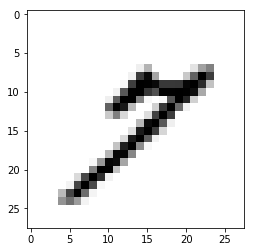

epoch:4number:0


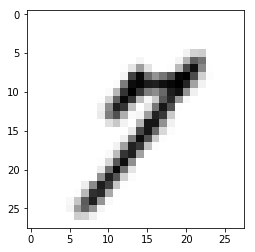

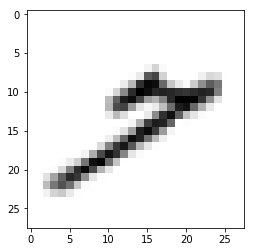

epoch:4number:1
epoch:4number:2
epoch:4number:3
epoch:4number:4
epoch:4number:5
epoch:4number:6
epoch:4number:7
epoch:4number:8
epoch:4number:9
epoch:4number:10
epoch:4number:11
epoch:4number:12
epoch:4number:13
epoch:4number:14
epoch:4number:15
epoch:4number:16
epoch:4number:17
epoch:4number:18
epoch:4number:19
epoch:4number:20
epoch:4number:21
epoch:4number:22
epoch:4number:23
epoch:4number:24
epoch:4number:25
epoch:4number:26
epoch:4number:27
epoch:4number:28
epoch:4number:29
epoch:4number:30
epoch:4number:31
epoch:4number:32
epoch:4number:33
epoch:4number:34
epoch:4number:35
epoch:4number:36
epoch:4number:37
epoch:4number:38
epoch:4number:39
epoch:4number:40
epoch:4number:41
epoch:4number:42
epoch:4number:43
epoch:4number:44
epoch:4number:45
epoch:4number:46
epoch:4number:47
epoch:4number:48
epoch:4number:49
epoch:4number:50
epoch:4number:51
epoch:4number:52
epoch:4number:53
epoch:4number:54
epoch:4number:55
epoch:4number:56
epoch:4number:57
epoch:4number:58
epoch:4number:59
epoch:

epoch:4number:476
epoch:4number:477
epoch:4number:478
epoch:4number:479
epoch:4number:480
epoch:4number:481
epoch:4number:482
epoch:4number:483
epoch:4number:484
epoch:4number:485
epoch:4number:486
epoch:4number:487
epoch:4number:488
epoch:4number:489
epoch:4number:490
epoch:4number:491
epoch:4number:492
epoch:4number:493
epoch:4number:494
epoch:4number:495
epoch:4number:496
epoch:4number:497
epoch:4number:498
epoch:4number:499
epoch:4number:500
epoch:4number:501
epoch:4number:502
epoch:4number:503
epoch:4number:504
epoch:4number:505
epoch:4number:506
epoch:4number:507
epoch:4number:508
epoch:4number:509
epoch:4number:510
epoch:4number:511
epoch:4number:512
epoch:4number:513
epoch:4number:514
epoch:4number:515
epoch:4number:516
epoch:4number:517
epoch:4number:518
epoch:4number:519
epoch:4number:520
epoch:4number:521
epoch:4number:522
epoch:4number:523
epoch:4number:524
epoch:4number:525
epoch:4number:526
epoch:4number:527
epoch:4number:528
epoch:4number:529
epoch:4number:530
epoch:4num

epoch:4number:935
epoch:4number:936
epoch:4number:937
epoch:4number:938
epoch:4number:939
epoch:4number:940
epoch:4number:941
epoch:4number:942
epoch:4number:943
epoch:4number:944
epoch:4number:945
epoch:4number:946
epoch:4number:947
epoch:4number:948
epoch:4number:949
epoch:4number:950
epoch:4number:951
epoch:4number:952
epoch:4number:953
epoch:4number:954
epoch:4number:955
epoch:4number:956
epoch:4number:957
epoch:4number:958
epoch:4number:959
epoch:4number:960
epoch:4number:961
epoch:4number:962
epoch:4number:963
epoch:4number:964
epoch:4number:965
epoch:4number:966
epoch:4number:967
epoch:4number:968
epoch:4number:969
epoch:4number:970
epoch:4number:971
epoch:4number:972
epoch:4number:973
epoch:4number:974
epoch:4number:975
epoch:4number:976
epoch:4number:977
epoch:4number:978
epoch:4number:979
epoch:4number:980
epoch:4number:981
epoch:4number:982
epoch:4number:983
epoch:4number:984
epoch:4number:985
epoch:4number:986
epoch:4number:987
epoch:4number:988
epoch:4number:989
epoch:4num

epoch:4number:1394
epoch:4number:1395
epoch:4number:1396
epoch:4number:1397
epoch:4number:1398
epoch:4number:1399
epoch:4number:1400
epoch:4number:1401
epoch:4number:1402
epoch:4number:1403
epoch:4number:1404
epoch:4number:1405
epoch:4number:1406
epoch:4number:1407
epoch:4number:1408
epoch:4number:1409
epoch:4number:1410
epoch:4number:1411
epoch:4number:1412
epoch:4number:1413
epoch:4number:1414
epoch:4number:1415
epoch:4number:1416
epoch:4number:1417
epoch:4number:1418
epoch:4number:1419
epoch:4number:1420
epoch:4number:1421
epoch:4number:1422
epoch:4number:1423
epoch:4number:1424
epoch:4number:1425
epoch:4number:1426
epoch:4number:1427
epoch:4number:1428
epoch:4number:1429
epoch:4number:1430
epoch:4number:1431
epoch:4number:1432
epoch:4number:1433
epoch:4number:1434
epoch:4number:1435
epoch:4number:1436
epoch:4number:1437
epoch:4number:1438
epoch:4number:1439
epoch:4number:1440
epoch:4number:1441
epoch:4number:1442
epoch:4number:1443
epoch:4number:1444
epoch:4number:1445
epoch:4numbe

epoch:4number:1848
epoch:4number:1849
epoch:4number:1850
epoch:4number:1851
epoch:4number:1852
epoch:4number:1853
epoch:4number:1854
epoch:4number:1855
epoch:4number:1856
epoch:4number:1857
epoch:4number:1858
epoch:4number:1859
epoch:4number:1860
epoch:4number:1861
epoch:4number:1862
epoch:4number:1863
epoch:4number:1864
epoch:4number:1865
epoch:4number:1866
epoch:4number:1867
epoch:4number:1868
epoch:4number:1869
epoch:4number:1870
epoch:4number:1871
epoch:4number:1872
epoch:4number:1873
epoch:4number:1874
epoch:4number:1875
epoch:4number:1876
epoch:4number:1877
epoch:4number:1878
epoch:4number:1879
epoch:4number:1880
epoch:4number:1881
epoch:4number:1882
epoch:4number:1883
epoch:4number:1884
epoch:4number:1885
epoch:4number:1886
epoch:4number:1887
epoch:4number:1888
epoch:4number:1889
epoch:4number:1890
epoch:4number:1891
epoch:4number:1892
epoch:4number:1893
epoch:4number:1894
epoch:4number:1895
epoch:4number:1896
epoch:4number:1897
epoch:4number:1898
epoch:4number:1899
epoch:4numbe

epoch:4number:2285
epoch:4number:2286
epoch:4number:2287
epoch:4number:2288
epoch:4number:2289
epoch:4number:2290
epoch:4number:2291
epoch:4number:2292
epoch:4number:2293
epoch:4number:2294
epoch:4number:2295
epoch:4number:2296
epoch:4number:2297
epoch:4number:2298
epoch:4number:2299
epoch:4number:2300
epoch:4number:2301
epoch:4number:2302
epoch:4number:2303
epoch:4number:2304
epoch:4number:2305
epoch:4number:2306
epoch:4number:2307
epoch:4number:2308
epoch:4number:2309
epoch:4number:2310
epoch:4number:2311
epoch:4number:2312
epoch:4number:2313
epoch:4number:2314
epoch:4number:2315
epoch:4number:2316
epoch:4number:2317
epoch:4number:2318
epoch:4number:2319
epoch:4number:2320
epoch:4number:2321
epoch:4number:2322
epoch:4number:2323
epoch:4number:2324
epoch:4number:2325
epoch:4number:2326
epoch:4number:2327
epoch:4number:2328
epoch:4number:2329
epoch:4number:2330
epoch:4number:2331
epoch:4number:2332
epoch:4number:2333
epoch:4number:2334
epoch:4number:2335
epoch:4number:2336
epoch:4numbe

epoch:4number:2735
epoch:4number:2736
epoch:4number:2737
epoch:4number:2738
epoch:4number:2739
epoch:4number:2740
epoch:4number:2741
epoch:4number:2742
epoch:4number:2743
epoch:4number:2744
epoch:4number:2745
epoch:4number:2746
epoch:4number:2747
epoch:4number:2748
epoch:4number:2749
epoch:4number:2750
epoch:4number:2751
epoch:4number:2752
epoch:4number:2753
epoch:4number:2754
epoch:4number:2755
epoch:4number:2756
epoch:4number:2757
epoch:4number:2758
epoch:4number:2759
epoch:4number:2760
epoch:4number:2761
epoch:4number:2762
epoch:4number:2763
epoch:4number:2764
epoch:4number:2765
epoch:4number:2766
epoch:4number:2767
epoch:4number:2768
epoch:4number:2769
epoch:4number:2770
epoch:4number:2771
epoch:4number:2772
epoch:4number:2773
epoch:4number:2774
epoch:4number:2775
epoch:4number:2776
epoch:4number:2777
epoch:4number:2778
epoch:4number:2779
epoch:4number:2780
epoch:4number:2781
epoch:4number:2782
epoch:4number:2783
epoch:4number:2784
epoch:4number:2785
epoch:4number:2786
epoch:4numbe

epoch:4number:3190
epoch:4number:3191
epoch:4number:3192
epoch:4number:3193
epoch:4number:3194
epoch:4number:3195
epoch:4number:3196
epoch:4number:3197
epoch:4number:3198
epoch:4number:3199
epoch:4number:3200
epoch:4number:3201
epoch:4number:3202
epoch:4number:3203
epoch:4number:3204
epoch:4number:3205
epoch:4number:3206
epoch:4number:3207
epoch:4number:3208
epoch:4number:3209
epoch:4number:3210
epoch:4number:3211
epoch:4number:3212
epoch:4number:3213
epoch:4number:3214
epoch:4number:3215
epoch:4number:3216
epoch:4number:3217
epoch:4number:3218
epoch:4number:3219
epoch:4number:3220
epoch:4number:3221
epoch:4number:3222
epoch:4number:3223
epoch:4number:3224
epoch:4number:3225
epoch:4number:3226
epoch:4number:3227
epoch:4number:3228
epoch:4number:3229
epoch:4number:3230
epoch:4number:3231
epoch:4number:3232
epoch:4number:3233
epoch:4number:3234
epoch:4number:3235
epoch:4number:3236
epoch:4number:3237
epoch:4number:3238
epoch:4number:3239
epoch:4number:3240
epoch:4number:3241
epoch:4numbe

epoch:4number:3642
epoch:4number:3643
epoch:4number:3644
epoch:4number:3645
epoch:4number:3646
epoch:4number:3647
epoch:4number:3648
epoch:4number:3649
epoch:4number:3650
epoch:4number:3651
epoch:4number:3652
epoch:4number:3653
epoch:4number:3654
epoch:4number:3655
epoch:4number:3656
epoch:4number:3657
epoch:4number:3658
epoch:4number:3659
epoch:4number:3660
epoch:4number:3661
epoch:4number:3662
epoch:4number:3663
epoch:4number:3664
epoch:4number:3665
epoch:4number:3666
epoch:4number:3667
epoch:4number:3668
epoch:4number:3669
epoch:4number:3670
epoch:4number:3671
epoch:4number:3672
epoch:4number:3673
epoch:4number:3674
epoch:4number:3675
epoch:4number:3676
epoch:4number:3677
epoch:4number:3678
epoch:4number:3679
epoch:4number:3680
epoch:4number:3681
epoch:4number:3682
epoch:4number:3683
epoch:4number:3684
epoch:4number:3685
epoch:4number:3686
epoch:4number:3687
epoch:4number:3688
epoch:4number:3689
epoch:4number:3690
epoch:4number:3691
epoch:4number:3692
epoch:4number:3693
epoch:4numbe

epoch:4number:4102
epoch:4number:4103
epoch:4number:4104
epoch:4number:4105
epoch:4number:4106
epoch:4number:4107
epoch:4number:4108
epoch:4number:4109
epoch:4number:4110
epoch:4number:4111
epoch:4number:4112
epoch:4number:4113
epoch:4number:4114
epoch:4number:4115
epoch:4number:4116
epoch:4number:4117
epoch:4number:4118
epoch:4number:4119
epoch:4number:4120
epoch:4number:4121
epoch:4number:4122
epoch:4number:4123
epoch:4number:4124
epoch:4number:4125
epoch:4number:4126
epoch:4number:4127
epoch:4number:4128
epoch:4number:4129
epoch:4number:4130
epoch:4number:4131
epoch:4number:4132
epoch:4number:4133
epoch:4number:4134
epoch:4number:4135
epoch:4number:4136
epoch:4number:4137
epoch:4number:4138
epoch:4number:4139
epoch:4number:4140
epoch:4number:4141
epoch:4number:4142
epoch:4number:4143
epoch:4number:4144
epoch:4number:4145
epoch:4number:4146
epoch:4number:4147
epoch:4number:4148
epoch:4number:4149
epoch:4number:4150
epoch:4number:4151
epoch:4number:4152
epoch:4number:4153
epoch:4numbe

epoch:4number:4549
epoch:4number:4550
epoch:4number:4551
epoch:4number:4552
epoch:4number:4553
epoch:4number:4554
epoch:4number:4555
epoch:4number:4556
epoch:4number:4557
epoch:4number:4558
epoch:4number:4559
epoch:4number:4560
epoch:4number:4561
epoch:4number:4562
epoch:4number:4563
epoch:4number:4564
epoch:4number:4565
epoch:4number:4566
epoch:4number:4567
epoch:4number:4568
epoch:4number:4569
epoch:4number:4570
epoch:4number:4571
epoch:4number:4572
epoch:4number:4573
epoch:4number:4574
epoch:4number:4575
epoch:4number:4576
epoch:4number:4577
epoch:4number:4578
epoch:4number:4579
epoch:4number:4580
epoch:4number:4581
epoch:4number:4582
epoch:4number:4583
epoch:4number:4584
epoch:4number:4585
epoch:4number:4586
epoch:4number:4587
epoch:4number:4588
epoch:4number:4589
epoch:4number:4590
epoch:4number:4591
epoch:4number:4592
epoch:4number:4593
epoch:4number:4594
epoch:4number:4595
epoch:4number:4596
epoch:4number:4597
epoch:4number:4598
epoch:4number:4599
epoch:4number:4600
epoch:4numbe

epoch:4number:4998
epoch:4number:4999
epoch:4number:5000
epoch:4number:5001
epoch:4number:5002
epoch:4number:5003
epoch:4number:5004
epoch:4number:5005
epoch:4number:5006
epoch:4number:5007
epoch:4number:5008
epoch:4number:5009
epoch:4number:5010
epoch:4number:5011
epoch:4number:5012
epoch:4number:5013
epoch:4number:5014
epoch:4number:5015
epoch:4number:5016
epoch:4number:5017
epoch:4number:5018
epoch:4number:5019
epoch:4number:5020
epoch:4number:5021
epoch:4number:5022
epoch:4number:5023
epoch:4number:5024
epoch:4number:5025
epoch:4number:5026
epoch:4number:5027
epoch:4number:5028
epoch:4number:5029
epoch:4number:5030
epoch:4number:5031
epoch:4number:5032
epoch:4number:5033
epoch:4number:5034
epoch:4number:5035
epoch:4number:5036
epoch:4number:5037
epoch:4number:5038
epoch:4number:5039
epoch:4number:5040
epoch:4number:5041
epoch:4number:5042
epoch:4number:5043
epoch:4number:5044
epoch:4number:5045
epoch:4number:5046
epoch:4number:5047
epoch:4number:5048
epoch:4number:5049
epoch:4numbe

epoch:4number:5456
epoch:4number:5457
epoch:4number:5458
epoch:4number:5459
epoch:4number:5460
epoch:4number:5461
epoch:4number:5462
epoch:4number:5463
epoch:4number:5464
epoch:4number:5465
epoch:4number:5466
epoch:4number:5467
epoch:4number:5468
epoch:4number:5469
epoch:4number:5470
epoch:4number:5471
epoch:4number:5472
epoch:4number:5473
epoch:4number:5474
epoch:4number:5475
epoch:4number:5476
epoch:4number:5477
epoch:4number:5478
epoch:4number:5479
epoch:4number:5480
epoch:4number:5481
epoch:4number:5482
epoch:4number:5483
epoch:4number:5484
epoch:4number:5485
epoch:4number:5486
epoch:4number:5487
epoch:4number:5488
epoch:4number:5489
epoch:4number:5490
epoch:4number:5491
epoch:4number:5492
epoch:4number:5493
epoch:4number:5494
epoch:4number:5495
epoch:4number:5496
epoch:4number:5497
epoch:4number:5498
epoch:4number:5499
epoch:4number:5500
epoch:4number:5501
epoch:4number:5502
epoch:4number:5503
epoch:4number:5504
epoch:4number:5505
epoch:4number:5506
epoch:4number:5507
epoch:4numbe

epoch:4number:5899
epoch:4number:5900
epoch:4number:5901
epoch:4number:5902
epoch:4number:5903
epoch:4number:5904
epoch:4number:5905
epoch:4number:5906
epoch:4number:5907
epoch:4number:5908
epoch:4number:5909
epoch:4number:5910
epoch:4number:5911
epoch:4number:5912
epoch:4number:5913
epoch:4number:5914
epoch:4number:5915
epoch:4number:5916
epoch:4number:5917
epoch:4number:5918
epoch:4number:5919
epoch:4number:5920
epoch:4number:5921
epoch:4number:5922
epoch:4number:5923
epoch:4number:5924
epoch:4number:5925
epoch:4number:5926
epoch:4number:5927
epoch:4number:5928
epoch:4number:5929
epoch:4number:5930
epoch:4number:5931
epoch:4number:5932
epoch:4number:5933
epoch:4number:5934
epoch:4number:5935
epoch:4number:5936
epoch:4number:5937
epoch:4number:5938
epoch:4number:5939
epoch:4number:5940
epoch:4number:5941
epoch:4number:5942
epoch:4number:5943
epoch:4number:5944
epoch:4number:5945
epoch:4number:5946
epoch:4number:5947
epoch:4number:5948
epoch:4number:5949
epoch:4number:5950
epoch:4numbe

epoch:4number:6339
epoch:4number:6340
epoch:4number:6341
epoch:4number:6342
epoch:4number:6343
epoch:4number:6344
epoch:4number:6345
epoch:4number:6346
epoch:4number:6347
epoch:4number:6348
epoch:4number:6349
epoch:4number:6350
epoch:4number:6351
epoch:4number:6352
epoch:4number:6353
epoch:4number:6354
epoch:4number:6355
epoch:4number:6356
epoch:4number:6357
epoch:4number:6358
epoch:4number:6359
epoch:4number:6360
epoch:4number:6361
epoch:4number:6362
epoch:4number:6363
epoch:4number:6364
epoch:4number:6365
epoch:4number:6366
epoch:4number:6367
epoch:4number:6368
epoch:4number:6369
epoch:4number:6370
epoch:4number:6371
epoch:4number:6372
epoch:4number:6373
epoch:4number:6374
epoch:4number:6375
epoch:4number:6376
epoch:4number:6377
epoch:4number:6378
epoch:4number:6379
epoch:4number:6380
epoch:4number:6381
epoch:4number:6382
epoch:4number:6383
epoch:4number:6384
epoch:4number:6385
epoch:4number:6386
epoch:4number:6387
epoch:4number:6388
epoch:4number:6389
epoch:4number:6390
epoch:4numbe

epoch:4number:6780
epoch:4number:6781
epoch:4number:6782
epoch:4number:6783
epoch:4number:6784
epoch:4number:6785
epoch:4number:6786
epoch:4number:6787
epoch:4number:6788
epoch:4number:6789
epoch:4number:6790
epoch:4number:6791
epoch:4number:6792
epoch:4number:6793
epoch:4number:6794
epoch:4number:6795
epoch:4number:6796
epoch:4number:6797
epoch:4number:6798
epoch:4number:6799
epoch:4number:6800
epoch:4number:6801
epoch:4number:6802
epoch:4number:6803
epoch:4number:6804
epoch:4number:6805
epoch:4number:6806
epoch:4number:6807
epoch:4number:6808
epoch:4number:6809
epoch:4number:6810
epoch:4number:6811
epoch:4number:6812
epoch:4number:6813
epoch:4number:6814
epoch:4number:6815
epoch:4number:6816
epoch:4number:6817
epoch:4number:6818
epoch:4number:6819
epoch:4number:6820
epoch:4number:6821
epoch:4number:6822
epoch:4number:6823
epoch:4number:6824
epoch:4number:6825
epoch:4number:6826
epoch:4number:6827
epoch:4number:6828
epoch:4number:6829
epoch:4number:6830
epoch:4number:6831
epoch:4numbe

epoch:4number:7218
epoch:4number:7219
epoch:4number:7220
epoch:4number:7221
epoch:4number:7222
epoch:4number:7223
epoch:4number:7224
epoch:4number:7225
epoch:4number:7226
epoch:4number:7227
epoch:4number:7228
epoch:4number:7229
epoch:4number:7230
epoch:4number:7231
epoch:4number:7232
epoch:4number:7233
epoch:4number:7234
epoch:4number:7235
epoch:4number:7236
epoch:4number:7237
epoch:4number:7238
epoch:4number:7239
epoch:4number:7240
epoch:4number:7241
epoch:4number:7242
epoch:4number:7243
epoch:4number:7244
epoch:4number:7245
epoch:4number:7246
epoch:4number:7247
epoch:4number:7248
epoch:4number:7249
epoch:4number:7250
epoch:4number:7251
epoch:4number:7252
epoch:4number:7253
epoch:4number:7254
epoch:4number:7255
epoch:4number:7256
epoch:4number:7257
epoch:4number:7258
epoch:4number:7259
epoch:4number:7260
epoch:4number:7261
epoch:4number:7262
epoch:4number:7263
epoch:4number:7264
epoch:4number:7265
epoch:4number:7266
epoch:4number:7267
epoch:4number:7268
epoch:4number:7269
epoch:4numbe

epoch:4number:7676
epoch:4number:7677
epoch:4number:7678
epoch:4number:7679
epoch:4number:7680
epoch:4number:7681
epoch:4number:7682
epoch:4number:7683
epoch:4number:7684
epoch:4number:7685
epoch:4number:7686
epoch:4number:7687
epoch:4number:7688
epoch:4number:7689
epoch:4number:7690
epoch:4number:7691
epoch:4number:7692
epoch:4number:7693
epoch:4number:7694
epoch:4number:7695
epoch:4number:7696
epoch:4number:7697
epoch:4number:7698
epoch:4number:7699
epoch:4number:7700
epoch:4number:7701
epoch:4number:7702
epoch:4number:7703
epoch:4number:7704
epoch:4number:7705
epoch:4number:7706
epoch:4number:7707
epoch:4number:7708
epoch:4number:7709
epoch:4number:7710
epoch:4number:7711
epoch:4number:7712
epoch:4number:7713
epoch:4number:7714
epoch:4number:7715
epoch:4number:7716
epoch:4number:7717
epoch:4number:7718
epoch:4number:7719
epoch:4number:7720
epoch:4number:7721
epoch:4number:7722
epoch:4number:7723
epoch:4number:7724
epoch:4number:7725
epoch:4number:7726
epoch:4number:7727
epoch:4numbe

epoch:4number:8136
epoch:4number:8137
epoch:4number:8138
epoch:4number:8139
epoch:4number:8140
epoch:4number:8141
epoch:4number:8142
epoch:4number:8143
epoch:4number:8144
epoch:4number:8145
epoch:4number:8146
epoch:4number:8147
epoch:4number:8148
epoch:4number:8149
epoch:4number:8150
epoch:4number:8151
epoch:4number:8152
epoch:4number:8153
epoch:4number:8154
epoch:4number:8155
epoch:4number:8156
epoch:4number:8157
epoch:4number:8158
epoch:4number:8159
epoch:4number:8160
epoch:4number:8161
epoch:4number:8162
epoch:4number:8163
epoch:4number:8164
epoch:4number:8165
epoch:4number:8166
epoch:4number:8167
epoch:4number:8168
epoch:4number:8169
epoch:4number:8170
epoch:4number:8171
epoch:4number:8172
epoch:4number:8173
epoch:4number:8174
epoch:4number:8175
epoch:4number:8176
epoch:4number:8177
epoch:4number:8178
epoch:4number:8179
epoch:4number:8180
epoch:4number:8181
epoch:4number:8182
epoch:4number:8183
epoch:4number:8184
epoch:4number:8185
epoch:4number:8186
epoch:4number:8187
epoch:4numbe

epoch:4number:8568
epoch:4number:8569
epoch:4number:8570
epoch:4number:8571
epoch:4number:8572
epoch:4number:8573
epoch:4number:8574
epoch:4number:8575
epoch:4number:8576
epoch:4number:8577
epoch:4number:8578
epoch:4number:8579
epoch:4number:8580
epoch:4number:8581
epoch:4number:8582
epoch:4number:8583
epoch:4number:8584
epoch:4number:8585
epoch:4number:8586
epoch:4number:8587
epoch:4number:8588
epoch:4number:8589
epoch:4number:8590
epoch:4number:8591
epoch:4number:8592
epoch:4number:8593
epoch:4number:8594
epoch:4number:8595
epoch:4number:8596
epoch:4number:8597
epoch:4number:8598
epoch:4number:8599
epoch:4number:8600
epoch:4number:8601
epoch:4number:8602
epoch:4number:8603
epoch:4number:8604
epoch:4number:8605
epoch:4number:8606
epoch:4number:8607
epoch:4number:8608
epoch:4number:8609
epoch:4number:8610
epoch:4number:8611
epoch:4number:8612
epoch:4number:8613
epoch:4number:8614
epoch:4number:8615
epoch:4number:8616
epoch:4number:8617
epoch:4number:8618
epoch:4number:8619
epoch:4numbe

epoch:4number:9030
epoch:4number:9031
epoch:4number:9032
epoch:4number:9033
epoch:4number:9034
epoch:4number:9035
epoch:4number:9036
epoch:4number:9037
epoch:4number:9038
epoch:4number:9039
epoch:4number:9040
epoch:4number:9041
epoch:4number:9042
epoch:4number:9043
epoch:4number:9044
epoch:4number:9045
epoch:4number:9046
epoch:4number:9047
epoch:4number:9048
epoch:4number:9049
epoch:4number:9050
epoch:4number:9051
epoch:4number:9052
epoch:4number:9053
epoch:4number:9054
epoch:4number:9055
epoch:4number:9056
epoch:4number:9057
epoch:4number:9058
epoch:4number:9059
epoch:4number:9060
epoch:4number:9061
epoch:4number:9062
epoch:4number:9063
epoch:4number:9064
epoch:4number:9065
epoch:4number:9066
epoch:4number:9067
epoch:4number:9068
epoch:4number:9069
epoch:4number:9070
epoch:4number:9071
epoch:4number:9072
epoch:4number:9073
epoch:4number:9074
epoch:4number:9075
epoch:4number:9076
epoch:4number:9077
epoch:4number:9078
epoch:4number:9079
epoch:4number:9080
epoch:4number:9081
epoch:4numbe

epoch:4number:9468
epoch:4number:9469
epoch:4number:9470
epoch:4number:9471
epoch:4number:9472
epoch:4number:9473
epoch:4number:9474
epoch:4number:9475
epoch:4number:9476
epoch:4number:9477
epoch:4number:9478
epoch:4number:9479
epoch:4number:9480
epoch:4number:9481
epoch:4number:9482
epoch:4number:9483
epoch:4number:9484
epoch:4number:9485
epoch:4number:9486
epoch:4number:9487
epoch:4number:9488
epoch:4number:9489
epoch:4number:9490
epoch:4number:9491
epoch:4number:9492
epoch:4number:9493
epoch:4number:9494
epoch:4number:9495
epoch:4number:9496
epoch:4number:9497
epoch:4number:9498
epoch:4number:9499
epoch:4number:9500
epoch:4number:9501
epoch:4number:9502
epoch:4number:9503
epoch:4number:9504
epoch:4number:9505
epoch:4number:9506
epoch:4number:9507
epoch:4number:9508
epoch:4number:9509
epoch:4number:9510
epoch:4number:9511
epoch:4number:9512
epoch:4number:9513
epoch:4number:9514
epoch:4number:9515
epoch:4number:9516
epoch:4number:9517
epoch:4number:9518
epoch:4number:9519
epoch:4numbe

epoch:4number:9924
epoch:4number:9925
epoch:4number:9926
epoch:4number:9927
epoch:4number:9928
epoch:4number:9929
epoch:4number:9930
epoch:4number:9931
epoch:4number:9932
epoch:4number:9933
epoch:4number:9934
epoch:4number:9935
epoch:4number:9936
epoch:4number:9937
epoch:4number:9938
epoch:4number:9939
epoch:4number:9940
epoch:4number:9941
epoch:4number:9942
epoch:4number:9943
epoch:4number:9944
epoch:4number:9945
epoch:4number:9946
epoch:4number:9947
epoch:4number:9948
epoch:4number:9949
epoch:4number:9950
epoch:4number:9951
epoch:4number:9952
epoch:4number:9953
epoch:4number:9954
epoch:4number:9955
epoch:4number:9956
epoch:4number:9957
epoch:4number:9958
epoch:4number:9959
epoch:4number:9960
epoch:4number:9961
epoch:4number:9962
epoch:4number:9963
epoch:4number:9964
epoch:4number:9965
epoch:4number:9966
epoch:4number:9967
epoch:4number:9968
epoch:4number:9969
epoch:4number:9970
epoch:4number:9971
epoch:4number:9972
epoch:4number:9973
epoch:4number:9974
epoch:4number:9975
epoch:4numbe

epoch:4number:10367
epoch:4number:10368
epoch:4number:10369
epoch:4number:10370
epoch:4number:10371
epoch:4number:10372
epoch:4number:10373
epoch:4number:10374
epoch:4number:10375
epoch:4number:10376
epoch:4number:10377
epoch:4number:10378
epoch:4number:10379
epoch:4number:10380
epoch:4number:10381
epoch:4number:10382
epoch:4number:10383
epoch:4number:10384
epoch:4number:10385
epoch:4number:10386
epoch:4number:10387
epoch:4number:10388
epoch:4number:10389
epoch:4number:10390
epoch:4number:10391
epoch:4number:10392
epoch:4number:10393
epoch:4number:10394
epoch:4number:10395
epoch:4number:10396
epoch:4number:10397
epoch:4number:10398
epoch:4number:10399
epoch:4number:10400
epoch:4number:10401
epoch:4number:10402
epoch:4number:10403
epoch:4number:10404
epoch:4number:10405
epoch:4number:10406
epoch:4number:10407
epoch:4number:10408
epoch:4number:10409
epoch:4number:10410
epoch:4number:10411
epoch:4number:10412
epoch:4number:10413
epoch:4number:10414
epoch:4number:10415
epoch:4number:10416


epoch:4number:10780
epoch:4number:10781
epoch:4number:10782
epoch:4number:10783
epoch:4number:10784
epoch:4number:10785
epoch:4number:10786
epoch:4number:10787
epoch:4number:10788
epoch:4number:10789
epoch:4number:10790
epoch:4number:10791
epoch:4number:10792
epoch:4number:10793
epoch:4number:10794
epoch:4number:10795
epoch:4number:10796
epoch:4number:10797
epoch:4number:10798
epoch:4number:10799
epoch:4number:10800
epoch:4number:10801
epoch:4number:10802
epoch:4number:10803
epoch:4number:10804
epoch:4number:10805
epoch:4number:10806
epoch:4number:10807
epoch:4number:10808
epoch:4number:10809
epoch:4number:10810
epoch:4number:10811
epoch:4number:10812
epoch:4number:10813
epoch:4number:10814
epoch:4number:10815
epoch:4number:10816
epoch:4number:10817
epoch:4number:10818
epoch:4number:10819
epoch:4number:10820
epoch:4number:10821
epoch:4number:10822
epoch:4number:10823
epoch:4number:10824
epoch:4number:10825
epoch:4number:10826
epoch:4number:10827
epoch:4number:10828
epoch:4number:10829


epoch:4number:11203
epoch:4number:11204
epoch:4number:11205
epoch:4number:11206
epoch:4number:11207
epoch:4number:11208
epoch:4number:11209
epoch:4number:11210
epoch:4number:11211
epoch:4number:11212
epoch:4number:11213
epoch:4number:11214
epoch:4number:11215
epoch:4number:11216
epoch:4number:11217
epoch:4number:11218
epoch:4number:11219
epoch:4number:11220
epoch:4number:11221
epoch:4number:11222
epoch:4number:11223
epoch:4number:11224
epoch:4number:11225
epoch:4number:11226
epoch:4number:11227
epoch:4number:11228
epoch:4number:11229
epoch:4number:11230
epoch:4number:11231
epoch:4number:11232
epoch:4number:11233
epoch:4number:11234
epoch:4number:11235
epoch:4number:11236
epoch:4number:11237
epoch:4number:11238
epoch:4number:11239
epoch:4number:11240
epoch:4number:11241
epoch:4number:11242
epoch:4number:11243
epoch:4number:11244
epoch:4number:11245
epoch:4number:11246
epoch:4number:11247
epoch:4number:11248
epoch:4number:11249
epoch:4number:11250
epoch:4number:11251
epoch:4number:11252


epoch:4number:11620
epoch:4number:11621
epoch:4number:11622
epoch:4number:11623
epoch:4number:11624
epoch:4number:11625
epoch:4number:11626
epoch:4number:11627
epoch:4number:11628
epoch:4number:11629
epoch:4number:11630
epoch:4number:11631
epoch:4number:11632
epoch:4number:11633
epoch:4number:11634
epoch:4number:11635
epoch:4number:11636
epoch:4number:11637
epoch:4number:11638
epoch:4number:11639
epoch:4number:11640
epoch:4number:11641
epoch:4number:11642
epoch:4number:11643
epoch:4number:11644
epoch:4number:11645
epoch:4number:11646
epoch:4number:11647
epoch:4number:11648
epoch:4number:11649
epoch:4number:11650
epoch:4number:11651
epoch:4number:11652
epoch:4number:11653
epoch:4number:11654
epoch:4number:11655
epoch:4number:11656
epoch:4number:11657
epoch:4number:11658
epoch:4number:11659
epoch:4number:11660
epoch:4number:11661
epoch:4number:11662
epoch:4number:11663
epoch:4number:11664
epoch:4number:11665
epoch:4number:11666
epoch:4number:11667
epoch:4number:11668
epoch:4number:11669


epoch:4number:12043
epoch:4number:12044
epoch:4number:12045
epoch:4number:12046
epoch:4number:12047
epoch:4number:12048
epoch:4number:12049
epoch:4number:12050
epoch:4number:12051
epoch:4number:12052
epoch:4number:12053
epoch:4number:12054
epoch:4number:12055
epoch:4number:12056
epoch:4number:12057
epoch:4number:12058
epoch:4number:12059
epoch:4number:12060
epoch:4number:12061
epoch:4number:12062
epoch:4number:12063
epoch:4number:12064
epoch:4number:12065
epoch:4number:12066
epoch:4number:12067
epoch:4number:12068
epoch:4number:12069
epoch:4number:12070
epoch:4number:12071
epoch:4number:12072
epoch:4number:12073
epoch:4number:12074
epoch:4number:12075
epoch:4number:12076
epoch:4number:12077
epoch:4number:12078
epoch:4number:12079
epoch:4number:12080
epoch:4number:12081
epoch:4number:12082
epoch:4number:12083
epoch:4number:12084
epoch:4number:12085
epoch:4number:12086
epoch:4number:12087
epoch:4number:12088
epoch:4number:12089
epoch:4number:12090
epoch:4number:12091
epoch:4number:12092


epoch:4number:12469
epoch:4number:12470
epoch:4number:12471
epoch:4number:12472
epoch:4number:12473
epoch:4number:12474
epoch:4number:12475
epoch:4number:12476
epoch:4number:12477
epoch:4number:12478
epoch:4number:12479
epoch:4number:12480
epoch:4number:12481
epoch:4number:12482
epoch:4number:12483
epoch:4number:12484
epoch:4number:12485
epoch:4number:12486
epoch:4number:12487
epoch:4number:12488
epoch:4number:12489
epoch:4number:12490
epoch:4number:12491
epoch:4number:12492
epoch:4number:12493
epoch:4number:12494
epoch:4number:12495
epoch:4number:12496
epoch:4number:12497
epoch:4number:12498
epoch:4number:12499
epoch:4number:12500
epoch:4number:12501
epoch:4number:12502
epoch:4number:12503
epoch:4number:12504
epoch:4number:12505
epoch:4number:12506
epoch:4number:12507
epoch:4number:12508
epoch:4number:12509
epoch:4number:12510
epoch:4number:12511
epoch:4number:12512
epoch:4number:12513
epoch:4number:12514
epoch:4number:12515
epoch:4number:12516
epoch:4number:12517
epoch:4number:12518


epoch:4number:12896
epoch:4number:12897
epoch:4number:12898
epoch:4number:12899
epoch:4number:12900
epoch:4number:12901
epoch:4number:12902
epoch:4number:12903
epoch:4number:12904
epoch:4number:12905
epoch:4number:12906
epoch:4number:12907
epoch:4number:12908
epoch:4number:12909
epoch:4number:12910
epoch:4number:12911
epoch:4number:12912
epoch:4number:12913
epoch:4number:12914
epoch:4number:12915
epoch:4number:12916
epoch:4number:12917
epoch:4number:12918
epoch:4number:12919
epoch:4number:12920
epoch:4number:12921
epoch:4number:12922
epoch:4number:12923
epoch:4number:12924
epoch:4number:12925
epoch:4number:12926
epoch:4number:12927
epoch:4number:12928
epoch:4number:12929
epoch:4number:12930
epoch:4number:12931
epoch:4number:12932
epoch:4number:12933
epoch:4number:12934
epoch:4number:12935
epoch:4number:12936
epoch:4number:12937
epoch:4number:12938
epoch:4number:12939
epoch:4number:12940
epoch:4number:12941
epoch:4number:12942
epoch:4number:12943
epoch:4number:12944
epoch:4number:12945


epoch:4number:13314
epoch:4number:13315
epoch:4number:13316
epoch:4number:13317
epoch:4number:13318
epoch:4number:13319
epoch:4number:13320
epoch:4number:13321
epoch:4number:13322
epoch:4number:13323
epoch:4number:13324
epoch:4number:13325
epoch:4number:13326
epoch:4number:13327
epoch:4number:13328
epoch:4number:13329
epoch:4number:13330
epoch:4number:13331
epoch:4number:13332
epoch:4number:13333
epoch:4number:13334
epoch:4number:13335
epoch:4number:13336
epoch:4number:13337
epoch:4number:13338
epoch:4number:13339
epoch:4number:13340
epoch:4number:13341
epoch:4number:13342
epoch:4number:13343
epoch:4number:13344
epoch:4number:13345
epoch:4number:13346
epoch:4number:13347
epoch:4number:13348
epoch:4number:13349
epoch:4number:13350
epoch:4number:13351
epoch:4number:13352
epoch:4number:13353
epoch:4number:13354
epoch:4number:13355
epoch:4number:13356
epoch:4number:13357
epoch:4number:13358
epoch:4number:13359
epoch:4number:13360
epoch:4number:13361
epoch:4number:13362
epoch:4number:13363


epoch:4number:13737
epoch:4number:13738
epoch:4number:13739
epoch:4number:13740
epoch:4number:13741
epoch:4number:13742
epoch:4number:13743
epoch:4number:13744
epoch:4number:13745
epoch:4number:13746
epoch:4number:13747
epoch:4number:13748
epoch:4number:13749
epoch:4number:13750
epoch:4number:13751
epoch:4number:13752
epoch:4number:13753
epoch:4number:13754
epoch:4number:13755
epoch:4number:13756
epoch:4number:13757
epoch:4number:13758
epoch:4number:13759
epoch:4number:13760
epoch:4number:13761
epoch:4number:13762
epoch:4number:13763
epoch:4number:13764
epoch:4number:13765
epoch:4number:13766
epoch:4number:13767
epoch:4number:13768
epoch:4number:13769
epoch:4number:13770
epoch:4number:13771
epoch:4number:13772
epoch:4number:13773
epoch:4number:13774
epoch:4number:13775
epoch:4number:13776
epoch:4number:13777
epoch:4number:13778
epoch:4number:13779
epoch:4number:13780
epoch:4number:13781
epoch:4number:13782
epoch:4number:13783
epoch:4number:13784
epoch:4number:13785
epoch:4number:13786


epoch:4number:14156
epoch:4number:14157
epoch:4number:14158
epoch:4number:14159
epoch:4number:14160
epoch:4number:14161
epoch:4number:14162
epoch:4number:14163
epoch:4number:14164
epoch:4number:14165
epoch:4number:14166
epoch:4number:14167
epoch:4number:14168
epoch:4number:14169
epoch:4number:14170
epoch:4number:14171
epoch:4number:14172
epoch:4number:14173
epoch:4number:14174
epoch:4number:14175
epoch:4number:14176
epoch:4number:14177
epoch:4number:14178
epoch:4number:14179
epoch:4number:14180
epoch:4number:14181
epoch:4number:14182
epoch:4number:14183
epoch:4number:14184
epoch:4number:14185
epoch:4number:14186
epoch:4number:14187
epoch:4number:14188
epoch:4number:14189
epoch:4number:14190
epoch:4number:14191
epoch:4number:14192
epoch:4number:14193
epoch:4number:14194
epoch:4number:14195
epoch:4number:14196
epoch:4number:14197
epoch:4number:14198
epoch:4number:14199
epoch:4number:14200
epoch:4number:14201
epoch:4number:14202
epoch:4number:14203
epoch:4number:14204
epoch:4number:14205


epoch:4number:14592
epoch:4number:14593
epoch:4number:14594
epoch:4number:14595
epoch:4number:14596
epoch:4number:14597
epoch:4number:14598
epoch:4number:14599
epoch:4number:14600
epoch:4number:14601
epoch:4number:14602
epoch:4number:14603
epoch:4number:14604
epoch:4number:14605
epoch:4number:14606
epoch:4number:14607
epoch:4number:14608
epoch:4number:14609
epoch:4number:14610
epoch:4number:14611
epoch:4number:14612
epoch:4number:14613
epoch:4number:14614
epoch:4number:14615
epoch:4number:14616
epoch:4number:14617
epoch:4number:14618
epoch:4number:14619
epoch:4number:14620
epoch:4number:14621
epoch:4number:14622
epoch:4number:14623
epoch:4number:14624
epoch:4number:14625
epoch:4number:14626
epoch:4number:14627
epoch:4number:14628
epoch:4number:14629
epoch:4number:14630
epoch:4number:14631
epoch:4number:14632
epoch:4number:14633
epoch:4number:14634
epoch:4number:14635
epoch:4number:14636
epoch:4number:14637
epoch:4number:14638
epoch:4number:14639
epoch:4number:14640
epoch:4number:14641


epoch:4number:15011
epoch:4number:15012
epoch:4number:15013
epoch:4number:15014
epoch:4number:15015
epoch:4number:15016
epoch:4number:15017
epoch:4number:15018
epoch:4number:15019
epoch:4number:15020
epoch:4number:15021
epoch:4number:15022
epoch:4number:15023
epoch:4number:15024
epoch:4number:15025
epoch:4number:15026
epoch:4number:15027
epoch:4number:15028
epoch:4number:15029
epoch:4number:15030
epoch:4number:15031
epoch:4number:15032
epoch:4number:15033
epoch:4number:15034
epoch:4number:15035
epoch:4number:15036
epoch:4number:15037
epoch:4number:15038
epoch:4number:15039
epoch:4number:15040
epoch:4number:15041
epoch:4number:15042
epoch:4number:15043
epoch:4number:15044
epoch:4number:15045
epoch:4number:15046
epoch:4number:15047
epoch:4number:15048
epoch:4number:15049
epoch:4number:15050
epoch:4number:15051
epoch:4number:15052
epoch:4number:15053
epoch:4number:15054
epoch:4number:15055
epoch:4number:15056
epoch:4number:15057
epoch:4number:15058
epoch:4number:15059
epoch:4number:15060


epoch:4number:15428
epoch:4number:15429
epoch:4number:15430
epoch:4number:15431
epoch:4number:15432
epoch:4number:15433
epoch:4number:15434
epoch:4number:15435
epoch:4number:15436
epoch:4number:15437
epoch:4number:15438
epoch:4number:15439
epoch:4number:15440
epoch:4number:15441
epoch:4number:15442
epoch:4number:15443
epoch:4number:15444
epoch:4number:15445
epoch:4number:15446
epoch:4number:15447
epoch:4number:15448
epoch:4number:15449
epoch:4number:15450
epoch:4number:15451
epoch:4number:15452
epoch:4number:15453
epoch:4number:15454
epoch:4number:15455
epoch:4number:15456
epoch:4number:15457
epoch:4number:15458
epoch:4number:15459
epoch:4number:15460
epoch:4number:15461
epoch:4number:15462
epoch:4number:15463
epoch:4number:15464
epoch:4number:15465
epoch:4number:15466
epoch:4number:15467
epoch:4number:15468
epoch:4number:15469
epoch:4number:15470
epoch:4number:15471
epoch:4number:15472
epoch:4number:15473
epoch:4number:15474
epoch:4number:15475
epoch:4number:15476
epoch:4number:15477


epoch:4number:15855
epoch:4number:15856
epoch:4number:15857
epoch:4number:15858
epoch:4number:15859
epoch:4number:15860
epoch:4number:15861
epoch:4number:15862
epoch:4number:15863
epoch:4number:15864
epoch:4number:15865
epoch:4number:15866
epoch:4number:15867
epoch:4number:15868
epoch:4number:15869
epoch:4number:15870
epoch:4number:15871
epoch:4number:15872
epoch:4number:15873
epoch:4number:15874
epoch:4number:15875
epoch:4number:15876
epoch:4number:15877
epoch:4number:15878
epoch:4number:15879
epoch:4number:15880
epoch:4number:15881
epoch:4number:15882
epoch:4number:15883
epoch:4number:15884
epoch:4number:15885
epoch:4number:15886
epoch:4number:15887
epoch:4number:15888
epoch:4number:15889
epoch:4number:15890
epoch:4number:15891
epoch:4number:15892
epoch:4number:15893
epoch:4number:15894
epoch:4number:15895
epoch:4number:15896
epoch:4number:15897
epoch:4number:15898
epoch:4number:15899
epoch:4number:15900
epoch:4number:15901
epoch:4number:15902
epoch:4number:15903
epoch:4number:15904


epoch:4number:16268
epoch:4number:16269
epoch:4number:16270
epoch:4number:16271
epoch:4number:16272
epoch:4number:16273
epoch:4number:16274
epoch:4number:16275
epoch:4number:16276
epoch:4number:16277
epoch:4number:16278
epoch:4number:16279
epoch:4number:16280
epoch:4number:16281
epoch:4number:16282
epoch:4number:16283
epoch:4number:16284
epoch:4number:16285
epoch:4number:16286
epoch:4number:16287
epoch:4number:16288
epoch:4number:16289
epoch:4number:16290
epoch:4number:16291
epoch:4number:16292
epoch:4number:16293
epoch:4number:16294
epoch:4number:16295
epoch:4number:16296
epoch:4number:16297
epoch:4number:16298
epoch:4number:16299
epoch:4number:16300
epoch:4number:16301
epoch:4number:16302
epoch:4number:16303
epoch:4number:16304
epoch:4number:16305
epoch:4number:16306
epoch:4number:16307
epoch:4number:16308
epoch:4number:16309
epoch:4number:16310
epoch:4number:16311
epoch:4number:16312
epoch:4number:16313
epoch:4number:16314
epoch:4number:16315
epoch:4number:16316
epoch:4number:16317


epoch:4number:16698
epoch:4number:16699
epoch:4number:16700
epoch:4number:16701
epoch:4number:16702
epoch:4number:16703
epoch:4number:16704
epoch:4number:16705
epoch:4number:16706
epoch:4number:16707
epoch:4number:16708
epoch:4number:16709
epoch:4number:16710
epoch:4number:16711
epoch:4number:16712
epoch:4number:16713
epoch:4number:16714
epoch:4number:16715
epoch:4number:16716
epoch:4number:16717
epoch:4number:16718
epoch:4number:16719
epoch:4number:16720
epoch:4number:16721
epoch:4number:16722
epoch:4number:16723
epoch:4number:16724
epoch:4number:16725
epoch:4number:16726
epoch:4number:16727
epoch:4number:16728
epoch:4number:16729
epoch:4number:16730
epoch:4number:16731
epoch:4number:16732
epoch:4number:16733
epoch:4number:16734
epoch:4number:16735
epoch:4number:16736
epoch:4number:16737
epoch:4number:16738
epoch:4number:16739
epoch:4number:16740
epoch:4number:16741
epoch:4number:16742
epoch:4number:16743
epoch:4number:16744
epoch:4number:16745
epoch:4number:16746
epoch:4number:16747


epoch:4number:17123
epoch:4number:17124
epoch:4number:17125
epoch:4number:17126
epoch:4number:17127
epoch:4number:17128
epoch:4number:17129
epoch:4number:17130
epoch:4number:17131
epoch:4number:17132
epoch:4number:17133
epoch:4number:17134
epoch:4number:17135
epoch:4number:17136
epoch:4number:17137
epoch:4number:17138
epoch:4number:17139
epoch:4number:17140
epoch:4number:17141
epoch:4number:17142
epoch:4number:17143
epoch:4number:17144
epoch:4number:17145
epoch:4number:17146
epoch:4number:17147
epoch:4number:17148
epoch:4number:17149
epoch:4number:17150
epoch:4number:17151
epoch:4number:17152
epoch:4number:17153
epoch:4number:17154
epoch:4number:17155
epoch:4number:17156
epoch:4number:17157
epoch:4number:17158
epoch:4number:17159
epoch:4number:17160
epoch:4number:17161
epoch:4number:17162
epoch:4number:17163
epoch:4number:17164
epoch:4number:17165
epoch:4number:17166
epoch:4number:17167
epoch:4number:17168
epoch:4number:17169
epoch:4number:17170
epoch:4number:17171
epoch:4number:17172


epoch:4number:17560
epoch:4number:17561
epoch:4number:17562
epoch:4number:17563
epoch:4number:17564
epoch:4number:17565
epoch:4number:17566
epoch:4number:17567
epoch:4number:17568
epoch:4number:17569
epoch:4number:17570
epoch:4number:17571
epoch:4number:17572
epoch:4number:17573
epoch:4number:17574
epoch:4number:17575
epoch:4number:17576
epoch:4number:17577
epoch:4number:17578
epoch:4number:17579
epoch:4number:17580
epoch:4number:17581
epoch:4number:17582
epoch:4number:17583
epoch:4number:17584
epoch:4number:17585
epoch:4number:17586
epoch:4number:17587
epoch:4number:17588
epoch:4number:17589
epoch:4number:17590
epoch:4number:17591
epoch:4number:17592
epoch:4number:17593
epoch:4number:17594
epoch:4number:17595
epoch:4number:17596
epoch:4number:17597
epoch:4number:17598
epoch:4number:17599
epoch:4number:17600
epoch:4number:17601
epoch:4number:17602
epoch:4number:17603
epoch:4number:17604
epoch:4number:17605
epoch:4number:17606
epoch:4number:17607
epoch:4number:17608
epoch:4number:17609


epoch:4number:17981
epoch:4number:17982
epoch:4number:17983
epoch:4number:17984
epoch:4number:17985
epoch:4number:17986
epoch:4number:17987
epoch:4number:17988
epoch:4number:17989
epoch:4number:17990
epoch:4number:17991
epoch:4number:17992
epoch:4number:17993
epoch:4number:17994
epoch:4number:17995
epoch:4number:17996
epoch:4number:17997
epoch:4number:17998
epoch:4number:17999
epoch:4number:18000
epoch:4number:18001
epoch:4number:18002
epoch:4number:18003
epoch:4number:18004
epoch:4number:18005
epoch:4number:18006
epoch:4number:18007
epoch:4number:18008
epoch:4number:18009
epoch:4number:18010
epoch:4number:18011
epoch:4number:18012
epoch:4number:18013
epoch:4number:18014
epoch:4number:18015
epoch:4number:18016
epoch:4number:18017
epoch:4number:18018
epoch:4number:18019
epoch:4number:18020
epoch:4number:18021
epoch:4number:18022
epoch:4number:18023
epoch:4number:18024
epoch:4number:18025
epoch:4number:18026
epoch:4number:18027
epoch:4number:18028
epoch:4number:18029
epoch:4number:18030


epoch:4number:18392
epoch:4number:18393
epoch:4number:18394
epoch:4number:18395
epoch:4number:18396
epoch:4number:18397
epoch:4number:18398
epoch:4number:18399
epoch:4number:18400
epoch:4number:18401
epoch:4number:18402
epoch:4number:18403
epoch:4number:18404
epoch:4number:18405
epoch:4number:18406
epoch:4number:18407
epoch:4number:18408
epoch:4number:18409
epoch:4number:18410
epoch:4number:18411
epoch:4number:18412
epoch:4number:18413
epoch:4number:18414
epoch:4number:18415
epoch:4number:18416
epoch:4number:18417
epoch:4number:18418
epoch:4number:18419
epoch:4number:18420
epoch:4number:18421
epoch:4number:18422
epoch:4number:18423
epoch:4number:18424
epoch:4number:18425
epoch:4number:18426
epoch:4number:18427
epoch:4number:18428
epoch:4number:18429
epoch:4number:18430
epoch:4number:18431
epoch:4number:18432
epoch:4number:18433
epoch:4number:18434
epoch:4number:18435
epoch:4number:18436
epoch:4number:18437
epoch:4number:18438
epoch:4number:18439
epoch:4number:18440
epoch:4number:18441


epoch:4number:18825
epoch:4number:18826
epoch:4number:18827
epoch:4number:18828
epoch:4number:18829
epoch:4number:18830
epoch:4number:18831
epoch:4number:18832
epoch:4number:18833
epoch:4number:18834
epoch:4number:18835
epoch:4number:18836
epoch:4number:18837
epoch:4number:18838
epoch:4number:18839
epoch:4number:18840
epoch:4number:18841
epoch:4number:18842
epoch:4number:18843
epoch:4number:18844
epoch:4number:18845
epoch:4number:18846
epoch:4number:18847
epoch:4number:18848
epoch:4number:18849
epoch:4number:18850
epoch:4number:18851
epoch:4number:18852
epoch:4number:18853
epoch:4number:18854
epoch:4number:18855
epoch:4number:18856
epoch:4number:18857
epoch:4number:18858
epoch:4number:18859
epoch:4number:18860
epoch:4number:18861
epoch:4number:18862
epoch:4number:18863
epoch:4number:18864
epoch:4number:18865
epoch:4number:18866
epoch:4number:18867
epoch:4number:18868
epoch:4number:18869
epoch:4number:18870
epoch:4number:18871
epoch:4number:18872
epoch:4number:18873
epoch:4number:18874


epoch:4number:19258
epoch:4number:19259
epoch:4number:19260
epoch:4number:19261
epoch:4number:19262
epoch:4number:19263
epoch:4number:19264
epoch:4number:19265
epoch:4number:19266
epoch:4number:19267
epoch:4number:19268
epoch:4number:19269
epoch:4number:19270
epoch:4number:19271
epoch:4number:19272
epoch:4number:19273
epoch:4number:19274
epoch:4number:19275
epoch:4number:19276
epoch:4number:19277
epoch:4number:19278
epoch:4number:19279
epoch:4number:19280
epoch:4number:19281
epoch:4number:19282
epoch:4number:19283
epoch:4number:19284
epoch:4number:19285
epoch:4number:19286
epoch:4number:19287
epoch:4number:19288
epoch:4number:19289
epoch:4number:19290
epoch:4number:19291
epoch:4number:19292
epoch:4number:19293
epoch:4number:19294
epoch:4number:19295
epoch:4number:19296
epoch:4number:19297
epoch:4number:19298
epoch:4number:19299
epoch:4number:19300
epoch:4number:19301
epoch:4number:19302
epoch:4number:19303
epoch:4number:19304
epoch:4number:19305
epoch:4number:19306
epoch:4number:19307


epoch:4number:19692
epoch:4number:19693
epoch:4number:19694
epoch:4number:19695
epoch:4number:19696
epoch:4number:19697
epoch:4number:19698
epoch:4number:19699
epoch:4number:19700
epoch:4number:19701
epoch:4number:19702
epoch:4number:19703
epoch:4number:19704
epoch:4number:19705
epoch:4number:19706
epoch:4number:19707
epoch:4number:19708
epoch:4number:19709
epoch:4number:19710
epoch:4number:19711
epoch:4number:19712
epoch:4number:19713
epoch:4number:19714
epoch:4number:19715
epoch:4number:19716
epoch:4number:19717
epoch:4number:19718
epoch:4number:19719
epoch:4number:19720
epoch:4number:19721
epoch:4number:19722
epoch:4number:19723
epoch:4number:19724
epoch:4number:19725
epoch:4number:19726
epoch:4number:19727
epoch:4number:19728
epoch:4number:19729
epoch:4number:19730
epoch:4number:19731
epoch:4number:19732
epoch:4number:19733
epoch:4number:19734
epoch:4number:19735
epoch:4number:19736
epoch:4number:19737
epoch:4number:19738
epoch:4number:19739
epoch:4number:19740
epoch:4number:19741


epoch:4number:20127
epoch:4number:20128
epoch:4number:20129
epoch:4number:20130
epoch:4number:20131
epoch:4number:20132
epoch:4number:20133
epoch:4number:20134
epoch:4number:20135
epoch:4number:20136
epoch:4number:20137
epoch:4number:20138
epoch:4number:20139
epoch:4number:20140
epoch:4number:20141
epoch:4number:20142
epoch:4number:20143
epoch:4number:20144
epoch:4number:20145
epoch:4number:20146
epoch:4number:20147
epoch:4number:20148
epoch:4number:20149
epoch:4number:20150
epoch:4number:20151
epoch:4number:20152
epoch:4number:20153
epoch:4number:20154
epoch:4number:20155
epoch:4number:20156
epoch:4number:20157
epoch:4number:20158
epoch:4number:20159
epoch:4number:20160
epoch:4number:20161
epoch:4number:20162
epoch:4number:20163
epoch:4number:20164
epoch:4number:20165
epoch:4number:20166
epoch:4number:20167
epoch:4number:20168
epoch:4number:20169
epoch:4number:20170
epoch:4number:20171
epoch:4number:20172
epoch:4number:20173
epoch:4number:20174
epoch:4number:20175
epoch:4number:20176


epoch:4number:20543
epoch:4number:20544
epoch:4number:20545
epoch:4number:20546
epoch:4number:20547
epoch:4number:20548
epoch:4number:20549
epoch:4number:20550
epoch:4number:20551
epoch:4number:20552
epoch:4number:20553
epoch:4number:20554
epoch:4number:20555
epoch:4number:20556
epoch:4number:20557
epoch:4number:20558
epoch:4number:20559
epoch:4number:20560
epoch:4number:20561
epoch:4number:20562
epoch:4number:20563
epoch:4number:20564
epoch:4number:20565
epoch:4number:20566
epoch:4number:20567
epoch:4number:20568
epoch:4number:20569
epoch:4number:20570
epoch:4number:20571
epoch:4number:20572
epoch:4number:20573
epoch:4number:20574
epoch:4number:20575
epoch:4number:20576
epoch:4number:20577
epoch:4number:20578
epoch:4number:20579
epoch:4number:20580
epoch:4number:20581
epoch:4number:20582
epoch:4number:20583
epoch:4number:20584
epoch:4number:20585
epoch:4number:20586
epoch:4number:20587
epoch:4number:20588
epoch:4number:20589
epoch:4number:20590
epoch:4number:20591
epoch:4number:20592


epoch:4number:20972
epoch:4number:20973
epoch:4number:20974
epoch:4number:20975
epoch:4number:20976
epoch:4number:20977
epoch:4number:20978
epoch:4number:20979
epoch:4number:20980
epoch:4number:20981
epoch:4number:20982
epoch:4number:20983
epoch:4number:20984
epoch:4number:20985
epoch:4number:20986
epoch:4number:20987
epoch:4number:20988
epoch:4number:20989
epoch:4number:20990
epoch:4number:20991
epoch:4number:20992
epoch:4number:20993
epoch:4number:20994
epoch:4number:20995
epoch:4number:20996
epoch:4number:20997
epoch:4number:20998
epoch:4number:20999
epoch:4number:21000
epoch:4number:21001
epoch:4number:21002
epoch:4number:21003
epoch:4number:21004
epoch:4number:21005
epoch:4number:21006
epoch:4number:21007
epoch:4number:21008
epoch:4number:21009
epoch:4number:21010
epoch:4number:21011
epoch:4number:21012
epoch:4number:21013
epoch:4number:21014
epoch:4number:21015
epoch:4number:21016
epoch:4number:21017
epoch:4number:21018
epoch:4number:21019
epoch:4number:21020
epoch:4number:21021


epoch:4number:21385
epoch:4number:21386
epoch:4number:21387
epoch:4number:21388
epoch:4number:21389
epoch:4number:21390
epoch:4number:21391
epoch:4number:21392
epoch:4number:21393
epoch:4number:21394
epoch:4number:21395
epoch:4number:21396
epoch:4number:21397
epoch:4number:21398
epoch:4number:21399
epoch:4number:21400
epoch:4number:21401
epoch:4number:21402
epoch:4number:21403
epoch:4number:21404
epoch:4number:21405
epoch:4number:21406
epoch:4number:21407
epoch:4number:21408
epoch:4number:21409
epoch:4number:21410
epoch:4number:21411
epoch:4number:21412
epoch:4number:21413
epoch:4number:21414
epoch:4number:21415
epoch:4number:21416
epoch:4number:21417
epoch:4number:21418
epoch:4number:21419
epoch:4number:21420
epoch:4number:21421
epoch:4number:21422
epoch:4number:21423
epoch:4number:21424
epoch:4number:21425
epoch:4number:21426
epoch:4number:21427
epoch:4number:21428
epoch:4number:21429
epoch:4number:21430
epoch:4number:21431
epoch:4number:21432
epoch:4number:21433
epoch:4number:21434


epoch:4number:21814
epoch:4number:21815
epoch:4number:21816
epoch:4number:21817
epoch:4number:21818
epoch:4number:21819
epoch:4number:21820
epoch:4number:21821
epoch:4number:21822
epoch:4number:21823
epoch:4number:21824
epoch:4number:21825
epoch:4number:21826
epoch:4number:21827
epoch:4number:21828
epoch:4number:21829
epoch:4number:21830
epoch:4number:21831
epoch:4number:21832
epoch:4number:21833
epoch:4number:21834
epoch:4number:21835
epoch:4number:21836
epoch:4number:21837
epoch:4number:21838
epoch:4number:21839
epoch:4number:21840
epoch:4number:21841
epoch:4number:21842
epoch:4number:21843
epoch:4number:21844
epoch:4number:21845
epoch:4number:21846
epoch:4number:21847
epoch:4number:21848
epoch:4number:21849
epoch:4number:21850
epoch:4number:21851
epoch:4number:21852
epoch:4number:21853
epoch:4number:21854
epoch:4number:21855
epoch:4number:21856
epoch:4number:21857
epoch:4number:21858
epoch:4number:21859
epoch:4number:21860
epoch:4number:21861
epoch:4number:21862
epoch:4number:21863


epoch:4number:22237
epoch:4number:22238
epoch:4number:22239
epoch:4number:22240
epoch:4number:22241
epoch:4number:22242
epoch:4number:22243
epoch:4number:22244
epoch:4number:22245
epoch:4number:22246
epoch:4number:22247
epoch:4number:22248
epoch:4number:22249
epoch:4number:22250
epoch:4number:22251
epoch:4number:22252
epoch:4number:22253
epoch:4number:22254
epoch:4number:22255
epoch:4number:22256
epoch:4number:22257
epoch:4number:22258
epoch:4number:22259
epoch:4number:22260
epoch:4number:22261
epoch:4number:22262
epoch:4number:22263
epoch:4number:22264
epoch:4number:22265
epoch:4number:22266
epoch:4number:22267
epoch:4number:22268
epoch:4number:22269
epoch:4number:22270
epoch:4number:22271
epoch:4number:22272
epoch:4number:22273
epoch:4number:22274
epoch:4number:22275
epoch:4number:22276
epoch:4number:22277
epoch:4number:22278
epoch:4number:22279
epoch:4number:22280
epoch:4number:22281
epoch:4number:22282
epoch:4number:22283
epoch:4number:22284
epoch:4number:22285
epoch:4number:22286


epoch:4number:22671
epoch:4number:22672
epoch:4number:22673
epoch:4number:22674
epoch:4number:22675
epoch:4number:22676
epoch:4number:22677
epoch:4number:22678
epoch:4number:22679
epoch:4number:22680
epoch:4number:22681
epoch:4number:22682
epoch:4number:22683
epoch:4number:22684
epoch:4number:22685
epoch:4number:22686
epoch:4number:22687
epoch:4number:22688
epoch:4number:22689
epoch:4number:22690
epoch:4number:22691
epoch:4number:22692
epoch:4number:22693
epoch:4number:22694
epoch:4number:22695
epoch:4number:22696
epoch:4number:22697
epoch:4number:22698
epoch:4number:22699
epoch:4number:22700
epoch:4number:22701
epoch:4number:22702
epoch:4number:22703
epoch:4number:22704
epoch:4number:22705
epoch:4number:22706
epoch:4number:22707
epoch:4number:22708
epoch:4number:22709
epoch:4number:22710
epoch:4number:22711
epoch:4number:22712
epoch:4number:22713
epoch:4number:22714
epoch:4number:22715
epoch:4number:22716
epoch:4number:22717
epoch:4number:22718
epoch:4number:22719
epoch:4number:22720


epoch:4number:23099
epoch:4number:23100
epoch:4number:23101
epoch:4number:23102
epoch:4number:23103
epoch:4number:23104
epoch:4number:23105
epoch:4number:23106
epoch:4number:23107
epoch:4number:23108
epoch:4number:23109
epoch:4number:23110
epoch:4number:23111
epoch:4number:23112
epoch:4number:23113
epoch:4number:23114
epoch:4number:23115
epoch:4number:23116
epoch:4number:23117
epoch:4number:23118
epoch:4number:23119
epoch:4number:23120
epoch:4number:23121
epoch:4number:23122
epoch:4number:23123
epoch:4number:23124
epoch:4number:23125
epoch:4number:23126
epoch:4number:23127
epoch:4number:23128
epoch:4number:23129
epoch:4number:23130
epoch:4number:23131
epoch:4number:23132
epoch:4number:23133
epoch:4number:23134
epoch:4number:23135
epoch:4number:23136
epoch:4number:23137
epoch:4number:23138
epoch:4number:23139
epoch:4number:23140
epoch:4number:23141
epoch:4number:23142
epoch:4number:23143
epoch:4number:23144
epoch:4number:23145
epoch:4number:23146
epoch:4number:23147
epoch:4number:23148


epoch:4number:23532
epoch:4number:23533
epoch:4number:23534
epoch:4number:23535
epoch:4number:23536
epoch:4number:23537
epoch:4number:23538
epoch:4number:23539
epoch:4number:23540
epoch:4number:23541
epoch:4number:23542
epoch:4number:23543
epoch:4number:23544
epoch:4number:23545
epoch:4number:23546
epoch:4number:23547
epoch:4number:23548
epoch:4number:23549
epoch:4number:23550
epoch:4number:23551
epoch:4number:23552
epoch:4number:23553
epoch:4number:23554
epoch:4number:23555
epoch:4number:23556
epoch:4number:23557
epoch:4number:23558
epoch:4number:23559
epoch:4number:23560
epoch:4number:23561
epoch:4number:23562
epoch:4number:23563
epoch:4number:23564
epoch:4number:23565
epoch:4number:23566
epoch:4number:23567
epoch:4number:23568
epoch:4number:23569
epoch:4number:23570
epoch:4number:23571
epoch:4number:23572
epoch:4number:23573
epoch:4number:23574
epoch:4number:23575
epoch:4number:23576
epoch:4number:23577
epoch:4number:23578
epoch:4number:23579
epoch:4number:23580
epoch:4number:23581


epoch:4number:23962
epoch:4number:23963
epoch:4number:23964
epoch:4number:23965
epoch:4number:23966
epoch:4number:23967
epoch:4number:23968
epoch:4number:23969
epoch:4number:23970
epoch:4number:23971
epoch:4number:23972
epoch:4number:23973
epoch:4number:23974
epoch:4number:23975
epoch:4number:23976
epoch:4number:23977
epoch:4number:23978
epoch:4number:23979
epoch:4number:23980
epoch:4number:23981
epoch:4number:23982
epoch:4number:23983
epoch:4number:23984
epoch:4number:23985
epoch:4number:23986
epoch:4number:23987
epoch:4number:23988
epoch:4number:23989
epoch:4number:23990
epoch:4number:23991
epoch:4number:23992
epoch:4number:23993
epoch:4number:23994
epoch:4number:23995
epoch:4number:23996
epoch:4number:23997
epoch:4number:23998
epoch:4number:23999
epoch:4number:24000
epoch:4number:24001
epoch:4number:24002
epoch:4number:24003
epoch:4number:24004
epoch:4number:24005
epoch:4number:24006
epoch:4number:24007
epoch:4number:24008
epoch:4number:24009
epoch:4number:24010
epoch:4number:24011


epoch:4number:24392
epoch:4number:24393
epoch:4number:24394
epoch:4number:24395
epoch:4number:24396
epoch:4number:24397
epoch:4number:24398
epoch:4number:24399
epoch:4number:24400
epoch:4number:24401
epoch:4number:24402
epoch:4number:24403
epoch:4number:24404
epoch:4number:24405
epoch:4number:24406
epoch:4number:24407
epoch:4number:24408
epoch:4number:24409
epoch:4number:24410
epoch:4number:24411
epoch:4number:24412
epoch:4number:24413
epoch:4number:24414
epoch:4number:24415
epoch:4number:24416
epoch:4number:24417
epoch:4number:24418
epoch:4number:24419
epoch:4number:24420
epoch:4number:24421
epoch:4number:24422
epoch:4number:24423
epoch:4number:24424
epoch:4number:24425
epoch:4number:24426
epoch:4number:24427
epoch:4number:24428
epoch:4number:24429
epoch:4number:24430
epoch:4number:24431
epoch:4number:24432
epoch:4number:24433
epoch:4number:24434
epoch:4number:24435
epoch:4number:24436
epoch:4number:24437
epoch:4number:24438
epoch:4number:24439
epoch:4number:24440
epoch:4number:24441


epoch:4number:24821
epoch:4number:24822
epoch:4number:24823
epoch:4number:24824
epoch:4number:24825
epoch:4number:24826
epoch:4number:24827
epoch:4number:24828
epoch:4number:24829
epoch:4number:24830
epoch:4number:24831
epoch:4number:24832
epoch:4number:24833
epoch:4number:24834
epoch:4number:24835
epoch:4number:24836
epoch:4number:24837
epoch:4number:24838
epoch:4number:24839
epoch:4number:24840
epoch:4number:24841
epoch:4number:24842
epoch:4number:24843
epoch:4number:24844
epoch:4number:24845
epoch:4number:24846
epoch:4number:24847
epoch:4number:24848
epoch:4number:24849
epoch:4number:24850
epoch:4number:24851
epoch:4number:24852
epoch:4number:24853
epoch:4number:24854
epoch:4number:24855
epoch:4number:24856
epoch:4number:24857
epoch:4number:24858
epoch:4number:24859
epoch:4number:24860
epoch:4number:24861
epoch:4number:24862
epoch:4number:24863
epoch:4number:24864
epoch:4number:24865
epoch:4number:24866
epoch:4number:24867
epoch:4number:24868
epoch:4number:24869
epoch:4number:24870


epoch:4number:25252
epoch:4number:25253
epoch:4number:25254
epoch:4number:25255
epoch:4number:25256
epoch:4number:25257
epoch:4number:25258
epoch:4number:25259
epoch:4number:25260
epoch:4number:25261
epoch:4number:25262
epoch:4number:25263
epoch:4number:25264
epoch:4number:25265
epoch:4number:25266
epoch:4number:25267
epoch:4number:25268
epoch:4number:25269
epoch:4number:25270
epoch:4number:25271
epoch:4number:25272
epoch:4number:25273
epoch:4number:25274
epoch:4number:25275
epoch:4number:25276
epoch:4number:25277
epoch:4number:25278
epoch:4number:25279
epoch:4number:25280
epoch:4number:25281
epoch:4number:25282
epoch:4number:25283
epoch:4number:25284
epoch:4number:25285
epoch:4number:25286
epoch:4number:25287
epoch:4number:25288
epoch:4number:25289
epoch:4number:25290
epoch:4number:25291
epoch:4number:25292
epoch:4number:25293
epoch:4number:25294
epoch:4number:25295
epoch:4number:25296
epoch:4number:25297
epoch:4number:25298
epoch:4number:25299
epoch:4number:25300
epoch:4number:25301


epoch:4number:25681
epoch:4number:25682
epoch:4number:25683
epoch:4number:25684
epoch:4number:25685
epoch:4number:25686
epoch:4number:25687
epoch:4number:25688
epoch:4number:25689
epoch:4number:25690
epoch:4number:25691
epoch:4number:25692
epoch:4number:25693
epoch:4number:25694
epoch:4number:25695
epoch:4number:25696
epoch:4number:25697
epoch:4number:25698
epoch:4number:25699
epoch:4number:25700
epoch:4number:25701
epoch:4number:25702
epoch:4number:25703
epoch:4number:25704
epoch:4number:25705
epoch:4number:25706
epoch:4number:25707
epoch:4number:25708
epoch:4number:25709
epoch:4number:25710
epoch:4number:25711
epoch:4number:25712
epoch:4number:25713
epoch:4number:25714
epoch:4number:25715
epoch:4number:25716
epoch:4number:25717
epoch:4number:25718
epoch:4number:25719
epoch:4number:25720
epoch:4number:25721
epoch:4number:25722
epoch:4number:25723
epoch:4number:25724
epoch:4number:25725
epoch:4number:25726
epoch:4number:25727
epoch:4number:25728
epoch:4number:25729
epoch:4number:25730


epoch:4number:26113
epoch:4number:26114
epoch:4number:26115
epoch:4number:26116
epoch:4number:26117
epoch:4number:26118
epoch:4number:26119
epoch:4number:26120
epoch:4number:26121
epoch:4number:26122
epoch:4number:26123
epoch:4number:26124
epoch:4number:26125
epoch:4number:26126
epoch:4number:26127
epoch:4number:26128
epoch:4number:26129
epoch:4number:26130
epoch:4number:26131
epoch:4number:26132
epoch:4number:26133
epoch:4number:26134
epoch:4number:26135
epoch:4number:26136
epoch:4number:26137
epoch:4number:26138
epoch:4number:26139
epoch:4number:26140
epoch:4number:26141
epoch:4number:26142
epoch:4number:26143
epoch:4number:26144
epoch:4number:26145
epoch:4number:26146
epoch:4number:26147
epoch:4number:26148
epoch:4number:26149
epoch:4number:26150
epoch:4number:26151
epoch:4number:26152
epoch:4number:26153
epoch:4number:26154
epoch:4number:26155
epoch:4number:26156
epoch:4number:26157
epoch:4number:26158
epoch:4number:26159
epoch:4number:26160
epoch:4number:26161
epoch:4number:26162


epoch:4number:26547
epoch:4number:26548
epoch:4number:26549
epoch:4number:26550
epoch:4number:26551
epoch:4number:26552
epoch:4number:26553
epoch:4number:26554
epoch:4number:26555
epoch:4number:26556
epoch:4number:26557
epoch:4number:26558
epoch:4number:26559
epoch:4number:26560
epoch:4number:26561
epoch:4number:26562
epoch:4number:26563
epoch:4number:26564
epoch:4number:26565
epoch:4number:26566
epoch:4number:26567
epoch:4number:26568
epoch:4number:26569
epoch:4number:26570
epoch:4number:26571
epoch:4number:26572
epoch:4number:26573
epoch:4number:26574
epoch:4number:26575
epoch:4number:26576
epoch:4number:26577
epoch:4number:26578
epoch:4number:26579
epoch:4number:26580
epoch:4number:26581
epoch:4number:26582
epoch:4number:26583
epoch:4number:26584
epoch:4number:26585
epoch:4number:26586
epoch:4number:26587
epoch:4number:26588
epoch:4number:26589
epoch:4number:26590
epoch:4number:26591
epoch:4number:26592
epoch:4number:26593
epoch:4number:26594
epoch:4number:26595
epoch:4number:26596


epoch:4number:26966
epoch:4number:26967
epoch:4number:26968
epoch:4number:26969
epoch:4number:26970
epoch:4number:26971
epoch:4number:26972
epoch:4number:26973
epoch:4number:26974
epoch:4number:26975
epoch:4number:26976
epoch:4number:26977
epoch:4number:26978
epoch:4number:26979
epoch:4number:26980
epoch:4number:26981
epoch:4number:26982
epoch:4number:26983
epoch:4number:26984
epoch:4number:26985
epoch:4number:26986
epoch:4number:26987
epoch:4number:26988
epoch:4number:26989
epoch:4number:26990
epoch:4number:26991
epoch:4number:26992
epoch:4number:26993
epoch:4number:26994
epoch:4number:26995
epoch:4number:26996
epoch:4number:26997
epoch:4number:26998
epoch:4number:26999
epoch:4number:27000
epoch:4number:27001
epoch:4number:27002
epoch:4number:27003
epoch:4number:27004
epoch:4number:27005
epoch:4number:27006
epoch:4number:27007
epoch:4number:27008
epoch:4number:27009
epoch:4number:27010
epoch:4number:27011
epoch:4number:27012
epoch:4number:27013
epoch:4number:27014
epoch:4number:27015


epoch:4number:27394
epoch:4number:27395
epoch:4number:27396
epoch:4number:27397
epoch:4number:27398
epoch:4number:27399
epoch:4number:27400
epoch:4number:27401
epoch:4number:27402
epoch:4number:27403
epoch:4number:27404
epoch:4number:27405
epoch:4number:27406
epoch:4number:27407
epoch:4number:27408
epoch:4number:27409
epoch:4number:27410
epoch:4number:27411
epoch:4number:27412
epoch:4number:27413
epoch:4number:27414
epoch:4number:27415
epoch:4number:27416
epoch:4number:27417
epoch:4number:27418
epoch:4number:27419
epoch:4number:27420
epoch:4number:27421
epoch:4number:27422
epoch:4number:27423
epoch:4number:27424
epoch:4number:27425
epoch:4number:27426
epoch:4number:27427
epoch:4number:27428
epoch:4number:27429
epoch:4number:27430
epoch:4number:27431
epoch:4number:27432
epoch:4number:27433
epoch:4number:27434
epoch:4number:27435
epoch:4number:27436
epoch:4number:27437
epoch:4number:27438
epoch:4number:27439
epoch:4number:27440
epoch:4number:27441
epoch:4number:27442
epoch:4number:27443


epoch:4number:27819
epoch:4number:27820
epoch:4number:27821
epoch:4number:27822
epoch:4number:27823
epoch:4number:27824
epoch:4number:27825
epoch:4number:27826
epoch:4number:27827
epoch:4number:27828
epoch:4number:27829
epoch:4number:27830
epoch:4number:27831
epoch:4number:27832
epoch:4number:27833
epoch:4number:27834
epoch:4number:27835
epoch:4number:27836
epoch:4number:27837
epoch:4number:27838
epoch:4number:27839
epoch:4number:27840
epoch:4number:27841
epoch:4number:27842
epoch:4number:27843
epoch:4number:27844
epoch:4number:27845
epoch:4number:27846
epoch:4number:27847
epoch:4number:27848
epoch:4number:27849
epoch:4number:27850
epoch:4number:27851
epoch:4number:27852
epoch:4number:27853
epoch:4number:27854
epoch:4number:27855
epoch:4number:27856
epoch:4number:27857
epoch:4number:27858
epoch:4number:27859
epoch:4number:27860
epoch:4number:27861
epoch:4number:27862
epoch:4number:27863
epoch:4number:27864
epoch:4number:27865
epoch:4number:27866
epoch:4number:27867
epoch:4number:27868


epoch:4number:28229
epoch:4number:28230
epoch:4number:28231
epoch:4number:28232
epoch:4number:28233
epoch:4number:28234
epoch:4number:28235
epoch:4number:28236
epoch:4number:28237
epoch:4number:28238
epoch:4number:28239
epoch:4number:28240
epoch:4number:28241
epoch:4number:28242
epoch:4number:28243
epoch:4number:28244
epoch:4number:28245
epoch:4number:28246
epoch:4number:28247
epoch:4number:28248
epoch:4number:28249
epoch:4number:28250
epoch:4number:28251
epoch:4number:28252
epoch:4number:28253
epoch:4number:28254
epoch:4number:28255
epoch:4number:28256
epoch:4number:28257
epoch:4number:28258
epoch:4number:28259
epoch:4number:28260
epoch:4number:28261
epoch:4number:28262
epoch:4number:28263
epoch:4number:28264
epoch:4number:28265
epoch:4number:28266
epoch:4number:28267
epoch:4number:28268
epoch:4number:28269
epoch:4number:28270
epoch:4number:28271
epoch:4number:28272
epoch:4number:28273
epoch:4number:28274
epoch:4number:28275
epoch:4number:28276
epoch:4number:28277
epoch:4number:28278


epoch:4number:28642
epoch:4number:28643
epoch:4number:28644
epoch:4number:28645
epoch:4number:28646
epoch:4number:28647
epoch:4number:28648
epoch:4number:28649
epoch:4number:28650
epoch:4number:28651
epoch:4number:28652
epoch:4number:28653
epoch:4number:28654
epoch:4number:28655
epoch:4number:28656
epoch:4number:28657
epoch:4number:28658
epoch:4number:28659
epoch:4number:28660
epoch:4number:28661
epoch:4number:28662
epoch:4number:28663
epoch:4number:28664
epoch:4number:28665
epoch:4number:28666
epoch:4number:28667
epoch:4number:28668
epoch:4number:28669
epoch:4number:28670
epoch:4number:28671
epoch:4number:28672
epoch:4number:28673
epoch:4number:28674
epoch:4number:28675
epoch:4number:28676
epoch:4number:28677
epoch:4number:28678
epoch:4number:28679
epoch:4number:28680
epoch:4number:28681
epoch:4number:28682
epoch:4number:28683
epoch:4number:28684
epoch:4number:28685
epoch:4number:28686
epoch:4number:28687
epoch:4number:28688
epoch:4number:28689
epoch:4number:28690
epoch:4number:28691


epoch:4number:29077
epoch:4number:29078
epoch:4number:29079
epoch:4number:29080
epoch:4number:29081
epoch:4number:29082
epoch:4number:29083
epoch:4number:29084
epoch:4number:29085
epoch:4number:29086
epoch:4number:29087
epoch:4number:29088
epoch:4number:29089
epoch:4number:29090
epoch:4number:29091
epoch:4number:29092
epoch:4number:29093
epoch:4number:29094
epoch:4number:29095
epoch:4number:29096
epoch:4number:29097
epoch:4number:29098
epoch:4number:29099
epoch:4number:29100
epoch:4number:29101
epoch:4number:29102
epoch:4number:29103
epoch:4number:29104
epoch:4number:29105
epoch:4number:29106
epoch:4number:29107
epoch:4number:29108
epoch:4number:29109
epoch:4number:29110
epoch:4number:29111
epoch:4number:29112
epoch:4number:29113
epoch:4number:29114
epoch:4number:29115
epoch:4number:29116
epoch:4number:29117
epoch:4number:29118
epoch:4number:29119
epoch:4number:29120
epoch:4number:29121
epoch:4number:29122
epoch:4number:29123
epoch:4number:29124
epoch:4number:29125
epoch:4number:29126


epoch:4number:29491
epoch:4number:29492
epoch:4number:29493
epoch:4number:29494
epoch:4number:29495
epoch:4number:29496
epoch:4number:29497
epoch:4number:29498
epoch:4number:29499
epoch:4number:29500
epoch:4number:29501
epoch:4number:29502
epoch:4number:29503
epoch:4number:29504
epoch:4number:29505
epoch:4number:29506
epoch:4number:29507
epoch:4number:29508
epoch:4number:29509
epoch:4number:29510
epoch:4number:29511
epoch:4number:29512
epoch:4number:29513
epoch:4number:29514
epoch:4number:29515
epoch:4number:29516
epoch:4number:29517
epoch:4number:29518
epoch:4number:29519
epoch:4number:29520
epoch:4number:29521
epoch:4number:29522
epoch:4number:29523
epoch:4number:29524
epoch:4number:29525
epoch:4number:29526
epoch:4number:29527
epoch:4number:29528
epoch:4number:29529
epoch:4number:29530
epoch:4number:29531
epoch:4number:29532
epoch:4number:29533
epoch:4number:29534
epoch:4number:29535
epoch:4number:29536
epoch:4number:29537
epoch:4number:29538
epoch:4number:29539
epoch:4number:29540


epoch:4number:29904
epoch:4number:29905
epoch:4number:29906
epoch:4number:29907
epoch:4number:29908
epoch:4number:29909
epoch:4number:29910
epoch:4number:29911
epoch:4number:29912
epoch:4number:29913
epoch:4number:29914
epoch:4number:29915
epoch:4number:29916
epoch:4number:29917
epoch:4number:29918
epoch:4number:29919
epoch:4number:29920
epoch:4number:29921
epoch:4number:29922
epoch:4number:29923
epoch:4number:29924
epoch:4number:29925
epoch:4number:29926
epoch:4number:29927
epoch:4number:29928
epoch:4number:29929
epoch:4number:29930
epoch:4number:29931
epoch:4number:29932
epoch:4number:29933
epoch:4number:29934
epoch:4number:29935
epoch:4number:29936
epoch:4number:29937
epoch:4number:29938
epoch:4number:29939
epoch:4number:29940
epoch:4number:29941
epoch:4number:29942
epoch:4number:29943
epoch:4number:29944
epoch:4number:29945
epoch:4number:29946
epoch:4number:29947
epoch:4number:29948
epoch:4number:29949
epoch:4number:29950
epoch:4number:29951
epoch:4number:29952
epoch:4number:29953


epoch:4number:30331
epoch:4number:30332
epoch:4number:30333
epoch:4number:30334
epoch:4number:30335
epoch:4number:30336
epoch:4number:30337
epoch:4number:30338
epoch:4number:30339
epoch:4number:30340
epoch:4number:30341
epoch:4number:30342
epoch:4number:30343
epoch:4number:30344
epoch:4number:30345
epoch:4number:30346
epoch:4number:30347
epoch:4number:30348
epoch:4number:30349
epoch:4number:30350
epoch:4number:30351
epoch:4number:30352
epoch:4number:30353
epoch:4number:30354
epoch:4number:30355
epoch:4number:30356
epoch:4number:30357
epoch:4number:30358
epoch:4number:30359
epoch:4number:30360
epoch:4number:30361
epoch:4number:30362
epoch:4number:30363
epoch:4number:30364
epoch:4number:30365
epoch:4number:30366
epoch:4number:30367
epoch:4number:30368
epoch:4number:30369
epoch:4number:30370
epoch:4number:30371
epoch:4number:30372
epoch:4number:30373
epoch:4number:30374
epoch:4number:30375
epoch:4number:30376
epoch:4number:30377
epoch:4number:30378
epoch:4number:30379
epoch:4number:30380


epoch:4number:30766
epoch:4number:30767
epoch:4number:30768
epoch:4number:30769
epoch:4number:30770
epoch:4number:30771
epoch:4number:30772
epoch:4number:30773
epoch:4number:30774
epoch:4number:30775
epoch:4number:30776
epoch:4number:30777
epoch:4number:30778
epoch:4number:30779
epoch:4number:30780
epoch:4number:30781
epoch:4number:30782
epoch:4number:30783
epoch:4number:30784
epoch:4number:30785
epoch:4number:30786
epoch:4number:30787
epoch:4number:30788
epoch:4number:30789
epoch:4number:30790
epoch:4number:30791
epoch:4number:30792
epoch:4number:30793
epoch:4number:30794
epoch:4number:30795
epoch:4number:30796
epoch:4number:30797
epoch:4number:30798
epoch:4number:30799
epoch:4number:30800
epoch:4number:30801
epoch:4number:30802
epoch:4number:30803
epoch:4number:30804
epoch:4number:30805
epoch:4number:30806
epoch:4number:30807
epoch:4number:30808
epoch:4number:30809
epoch:4number:30810
epoch:4number:30811
epoch:4number:30812
epoch:4number:30813
epoch:4number:30814
epoch:4number:30815


epoch:4number:31196
epoch:4number:31197
epoch:4number:31198
epoch:4number:31199
epoch:4number:31200
epoch:4number:31201
epoch:4number:31202
epoch:4number:31203
epoch:4number:31204
epoch:4number:31205
epoch:4number:31206
epoch:4number:31207
epoch:4number:31208
epoch:4number:31209
epoch:4number:31210
epoch:4number:31211
epoch:4number:31212
epoch:4number:31213
epoch:4number:31214
epoch:4number:31215
epoch:4number:31216
epoch:4number:31217
epoch:4number:31218
epoch:4number:31219
epoch:4number:31220
epoch:4number:31221
epoch:4number:31222
epoch:4number:31223
epoch:4number:31224
epoch:4number:31225
epoch:4number:31226
epoch:4number:31227
epoch:4number:31228
epoch:4number:31229
epoch:4number:31230
epoch:4number:31231
epoch:4number:31232
epoch:4number:31233
epoch:4number:31234
epoch:4number:31235
epoch:4number:31236
epoch:4number:31237
epoch:4number:31238
epoch:4number:31239
epoch:4number:31240
epoch:4number:31241
epoch:4number:31242
epoch:4number:31243
epoch:4number:31244
epoch:4number:31245


epoch:4number:31624
epoch:4number:31625
epoch:4number:31626
epoch:4number:31627
epoch:4number:31628
epoch:4number:31629
epoch:4number:31630
epoch:4number:31631
epoch:4number:31632
epoch:4number:31633
epoch:4number:31634
epoch:4number:31635
epoch:4number:31636
epoch:4number:31637
epoch:4number:31638
epoch:4number:31639
epoch:4number:31640
epoch:4number:31641
epoch:4number:31642
epoch:4number:31643
epoch:4number:31644
epoch:4number:31645
epoch:4number:31646
epoch:4number:31647
epoch:4number:31648
epoch:4number:31649
epoch:4number:31650
epoch:4number:31651
epoch:4number:31652
epoch:4number:31653
epoch:4number:31654
epoch:4number:31655
epoch:4number:31656
epoch:4number:31657
epoch:4number:31658
epoch:4number:31659
epoch:4number:31660
epoch:4number:31661
epoch:4number:31662
epoch:4number:31663
epoch:4number:31664
epoch:4number:31665
epoch:4number:31666
epoch:4number:31667
epoch:4number:31668
epoch:4number:31669
epoch:4number:31670
epoch:4number:31671
epoch:4number:31672
epoch:4number:31673


epoch:4number:32036
epoch:4number:32037
epoch:4number:32038
epoch:4number:32039
epoch:4number:32040
epoch:4number:32041
epoch:4number:32042
epoch:4number:32043
epoch:4number:32044
epoch:4number:32045
epoch:4number:32046
epoch:4number:32047
epoch:4number:32048
epoch:4number:32049
epoch:4number:32050
epoch:4number:32051
epoch:4number:32052
epoch:4number:32053
epoch:4number:32054
epoch:4number:32055
epoch:4number:32056
epoch:4number:32057
epoch:4number:32058
epoch:4number:32059
epoch:4number:32060
epoch:4number:32061
epoch:4number:32062
epoch:4number:32063
epoch:4number:32064
epoch:4number:32065
epoch:4number:32066
epoch:4number:32067
epoch:4number:32068
epoch:4number:32069
epoch:4number:32070
epoch:4number:32071
epoch:4number:32072
epoch:4number:32073
epoch:4number:32074
epoch:4number:32075
epoch:4number:32076
epoch:4number:32077
epoch:4number:32078
epoch:4number:32079
epoch:4number:32080
epoch:4number:32081
epoch:4number:32082
epoch:4number:32083
epoch:4number:32084
epoch:4number:32085


epoch:4number:32462
epoch:4number:32463
epoch:4number:32464
epoch:4number:32465
epoch:4number:32466
epoch:4number:32467
epoch:4number:32468
epoch:4number:32469
epoch:4number:32470
epoch:4number:32471
epoch:4number:32472
epoch:4number:32473
epoch:4number:32474
epoch:4number:32475
epoch:4number:32476
epoch:4number:32477
epoch:4number:32478
epoch:4number:32479
epoch:4number:32480
epoch:4number:32481
epoch:4number:32482
epoch:4number:32483
epoch:4number:32484
epoch:4number:32485
epoch:4number:32486
epoch:4number:32487
epoch:4number:32488
epoch:4number:32489
epoch:4number:32490
epoch:4number:32491
epoch:4number:32492
epoch:4number:32493
epoch:4number:32494
epoch:4number:32495
epoch:4number:32496
epoch:4number:32497
epoch:4number:32498
epoch:4number:32499
epoch:4number:32500
epoch:4number:32501
epoch:4number:32502
epoch:4number:32503
epoch:4number:32504
epoch:4number:32505
epoch:4number:32506
epoch:4number:32507
epoch:4number:32508
epoch:4number:32509
epoch:4number:32510
epoch:4number:32511


epoch:4number:32886
epoch:4number:32887
epoch:4number:32888
epoch:4number:32889
epoch:4number:32890
epoch:4number:32891
epoch:4number:32892
epoch:4number:32893
epoch:4number:32894
epoch:4number:32895
epoch:4number:32896
epoch:4number:32897
epoch:4number:32898
epoch:4number:32899
epoch:4number:32900
epoch:4number:32901
epoch:4number:32902
epoch:4number:32903
epoch:4number:32904
epoch:4number:32905
epoch:4number:32906
epoch:4number:32907
epoch:4number:32908
epoch:4number:32909
epoch:4number:32910
epoch:4number:32911
epoch:4number:32912
epoch:4number:32913
epoch:4number:32914
epoch:4number:32915
epoch:4number:32916
epoch:4number:32917
epoch:4number:32918
epoch:4number:32919
epoch:4number:32920
epoch:4number:32921
epoch:4number:32922
epoch:4number:32923
epoch:4number:32924
epoch:4number:32925
epoch:4number:32926
epoch:4number:32927
epoch:4number:32928
epoch:4number:32929
epoch:4number:32930
epoch:4number:32931
epoch:4number:32932
epoch:4number:32933
epoch:4number:32934
epoch:4number:32935


epoch:4number:33324
epoch:4number:33325
epoch:4number:33326
epoch:4number:33327
epoch:4number:33328
epoch:4number:33329
epoch:4number:33330
epoch:4number:33331
epoch:4number:33332
epoch:4number:33333
epoch:4number:33334
epoch:4number:33335
epoch:4number:33336
epoch:4number:33337
epoch:4number:33338
epoch:4number:33339
epoch:4number:33340
epoch:4number:33341
epoch:4number:33342
epoch:4number:33343
epoch:4number:33344
epoch:4number:33345
epoch:4number:33346
epoch:4number:33347
epoch:4number:33348
epoch:4number:33349
epoch:4number:33350
epoch:4number:33351
epoch:4number:33352
epoch:4number:33353
epoch:4number:33354
epoch:4number:33355
epoch:4number:33356
epoch:4number:33357
epoch:4number:33358
epoch:4number:33359
epoch:4number:33360
epoch:4number:33361
epoch:4number:33362
epoch:4number:33363
epoch:4number:33364
epoch:4number:33365
epoch:4number:33366
epoch:4number:33367
epoch:4number:33368
epoch:4number:33369
epoch:4number:33370
epoch:4number:33371
epoch:4number:33372
epoch:4number:33373


epoch:4number:33736
epoch:4number:33737
epoch:4number:33738
epoch:4number:33739
epoch:4number:33740
epoch:4number:33741
epoch:4number:33742
epoch:4number:33743
epoch:4number:33744
epoch:4number:33745
epoch:4number:33746
epoch:4number:33747
epoch:4number:33748
epoch:4number:33749
epoch:4number:33750
epoch:4number:33751
epoch:4number:33752
epoch:4number:33753
epoch:4number:33754
epoch:4number:33755
epoch:4number:33756
epoch:4number:33757
epoch:4number:33758
epoch:4number:33759
epoch:4number:33760
epoch:4number:33761
epoch:4number:33762
epoch:4number:33763
epoch:4number:33764
epoch:4number:33765
epoch:4number:33766
epoch:4number:33767
epoch:4number:33768
epoch:4number:33769
epoch:4number:33770
epoch:4number:33771
epoch:4number:33772
epoch:4number:33773
epoch:4number:33774
epoch:4number:33775
epoch:4number:33776
epoch:4number:33777
epoch:4number:33778
epoch:4number:33779
epoch:4number:33780
epoch:4number:33781
epoch:4number:33782
epoch:4number:33783
epoch:4number:33784
epoch:4number:33785


epoch:4number:34161
epoch:4number:34162
epoch:4number:34163
epoch:4number:34164
epoch:4number:34165
epoch:4number:34166
epoch:4number:34167
epoch:4number:34168
epoch:4number:34169
epoch:4number:34170
epoch:4number:34171
epoch:4number:34172
epoch:4number:34173
epoch:4number:34174
epoch:4number:34175
epoch:4number:34176
epoch:4number:34177
epoch:4number:34178
epoch:4number:34179
epoch:4number:34180
epoch:4number:34181
epoch:4number:34182
epoch:4number:34183
epoch:4number:34184
epoch:4number:34185
epoch:4number:34186
epoch:4number:34187
epoch:4number:34188
epoch:4number:34189
epoch:4number:34190
epoch:4number:34191
epoch:4number:34192
epoch:4number:34193
epoch:4number:34194
epoch:4number:34195
epoch:4number:34196
epoch:4number:34197
epoch:4number:34198
epoch:4number:34199
epoch:4number:34200
epoch:4number:34201
epoch:4number:34202
epoch:4number:34203
epoch:4number:34204
epoch:4number:34205
epoch:4number:34206
epoch:4number:34207
epoch:4number:34208
epoch:4number:34209
epoch:4number:34210


epoch:4number:34593
epoch:4number:34594
epoch:4number:34595
epoch:4number:34596
epoch:4number:34597
epoch:4number:34598
epoch:4number:34599
epoch:4number:34600
epoch:4number:34601
epoch:4number:34602
epoch:4number:34603
epoch:4number:34604
epoch:4number:34605
epoch:4number:34606
epoch:4number:34607
epoch:4number:34608
epoch:4number:34609
epoch:4number:34610
epoch:4number:34611
epoch:4number:34612
epoch:4number:34613
epoch:4number:34614
epoch:4number:34615
epoch:4number:34616
epoch:4number:34617
epoch:4number:34618
epoch:4number:34619
epoch:4number:34620
epoch:4number:34621
epoch:4number:34622
epoch:4number:34623
epoch:4number:34624
epoch:4number:34625
epoch:4number:34626
epoch:4number:34627
epoch:4number:34628
epoch:4number:34629
epoch:4number:34630
epoch:4number:34631
epoch:4number:34632
epoch:4number:34633
epoch:4number:34634
epoch:4number:34635
epoch:4number:34636
epoch:4number:34637
epoch:4number:34638
epoch:4number:34639
epoch:4number:34640
epoch:4number:34641
epoch:4number:34642


epoch:4number:35030
epoch:4number:35031
epoch:4number:35032
epoch:4number:35033
epoch:4number:35034
epoch:4number:35035
epoch:4number:35036
epoch:4number:35037
epoch:4number:35038
epoch:4number:35039
epoch:4number:35040
epoch:4number:35041
epoch:4number:35042
epoch:4number:35043
epoch:4number:35044
epoch:4number:35045
epoch:4number:35046
epoch:4number:35047
epoch:4number:35048
epoch:4number:35049
epoch:4number:35050
epoch:4number:35051
epoch:4number:35052
epoch:4number:35053
epoch:4number:35054
epoch:4number:35055
epoch:4number:35056
epoch:4number:35057
epoch:4number:35058
epoch:4number:35059
epoch:4number:35060
epoch:4number:35061
epoch:4number:35062
epoch:4number:35063
epoch:4number:35064
epoch:4number:35065
epoch:4number:35066
epoch:4number:35067
epoch:4number:35068
epoch:4number:35069
epoch:4number:35070
epoch:4number:35071
epoch:4number:35072
epoch:4number:35073
epoch:4number:35074
epoch:4number:35075
epoch:4number:35076
epoch:4number:35077
epoch:4number:35078
epoch:4number:35079


epoch:4number:35461
epoch:4number:35462
epoch:4number:35463
epoch:4number:35464
epoch:4number:35465
epoch:4number:35466
epoch:4number:35467
epoch:4number:35468
epoch:4number:35469
epoch:4number:35470
epoch:4number:35471
epoch:4number:35472
epoch:4number:35473
epoch:4number:35474
epoch:4number:35475
epoch:4number:35476
epoch:4number:35477
epoch:4number:35478
epoch:4number:35479
epoch:4number:35480
epoch:4number:35481
epoch:4number:35482
epoch:4number:35483
epoch:4number:35484
epoch:4number:35485
epoch:4number:35486
epoch:4number:35487
epoch:4number:35488
epoch:4number:35489
epoch:4number:35490
epoch:4number:35491
epoch:4number:35492
epoch:4number:35493
epoch:4number:35494
epoch:4number:35495
epoch:4number:35496
epoch:4number:35497
epoch:4number:35498
epoch:4number:35499
epoch:4number:35500
epoch:4number:35501
epoch:4number:35502
epoch:4number:35503
epoch:4number:35504
epoch:4number:35505
epoch:4number:35506
epoch:4number:35507
epoch:4number:35508
epoch:4number:35509
epoch:4number:35510


epoch:4number:35890
epoch:4number:35891
epoch:4number:35892
epoch:4number:35893
epoch:4number:35894
epoch:4number:35895
epoch:4number:35896
epoch:4number:35897
epoch:4number:35898
epoch:4number:35899
epoch:4number:35900
epoch:4number:35901
epoch:4number:35902
epoch:4number:35903
epoch:4number:35904
epoch:4number:35905
epoch:4number:35906
epoch:4number:35907
epoch:4number:35908
epoch:4number:35909
epoch:4number:35910
epoch:4number:35911
epoch:4number:35912
epoch:4number:35913
epoch:4number:35914
epoch:4number:35915
epoch:4number:35916
epoch:4number:35917
epoch:4number:35918
epoch:4number:35919
epoch:4number:35920
epoch:4number:35921
epoch:4number:35922
epoch:4number:35923
epoch:4number:35924
epoch:4number:35925
epoch:4number:35926
epoch:4number:35927
epoch:4number:35928
epoch:4number:35929
epoch:4number:35930
epoch:4number:35931
epoch:4number:35932
epoch:4number:35933
epoch:4number:35934
epoch:4number:35935
epoch:4number:35936
epoch:4number:35937
epoch:4number:35938
epoch:4number:35939


epoch:4number:36322
epoch:4number:36323
epoch:4number:36324
epoch:4number:36325
epoch:4number:36326
epoch:4number:36327
epoch:4number:36328
epoch:4number:36329
epoch:4number:36330
epoch:4number:36331
epoch:4number:36332
epoch:4number:36333
epoch:4number:36334
epoch:4number:36335
epoch:4number:36336
epoch:4number:36337
epoch:4number:36338
epoch:4number:36339
epoch:4number:36340
epoch:4number:36341
epoch:4number:36342
epoch:4number:36343
epoch:4number:36344
epoch:4number:36345
epoch:4number:36346
epoch:4number:36347
epoch:4number:36348
epoch:4number:36349
epoch:4number:36350
epoch:4number:36351
epoch:4number:36352
epoch:4number:36353
epoch:4number:36354
epoch:4number:36355
epoch:4number:36356
epoch:4number:36357
epoch:4number:36358
epoch:4number:36359
epoch:4number:36360
epoch:4number:36361
epoch:4number:36362
epoch:4number:36363
epoch:4number:36364
epoch:4number:36365
epoch:4number:36366
epoch:4number:36367
epoch:4number:36368
epoch:4number:36369
epoch:4number:36370
epoch:4number:36371


epoch:4number:37166
epoch:4number:37167
epoch:4number:37168
epoch:4number:37169
epoch:4number:37170
epoch:4number:37171
epoch:4number:37172
epoch:4number:37173
epoch:4number:37174
epoch:4number:37175
epoch:4number:37176
epoch:4number:37177
epoch:4number:37178
epoch:4number:37179
epoch:4number:37180
epoch:4number:37181
epoch:4number:37182
epoch:4number:37183
epoch:4number:37184
epoch:4number:37185
epoch:4number:37186
epoch:4number:37187
epoch:4number:37188
epoch:4number:37189
epoch:4number:37190
epoch:4number:37191
epoch:4number:37192
epoch:4number:37193
epoch:4number:37194
epoch:4number:37195
epoch:4number:37196
epoch:4number:37197
epoch:4number:37198
epoch:4number:37199
epoch:4number:37200
epoch:4number:37201
epoch:4number:37202
epoch:4number:37203
epoch:4number:37204
epoch:4number:37205
epoch:4number:37206
epoch:4number:37207
epoch:4number:37208
epoch:4number:37209
epoch:4number:37210
epoch:4number:37211
epoch:4number:37212
epoch:4number:37213
epoch:4number:37214
epoch:4number:37215


epoch:4number:37579
epoch:4number:37580
epoch:4number:37581
epoch:4number:37582
epoch:4number:37583
epoch:4number:37584
epoch:4number:37585
epoch:4number:37586
epoch:4number:37587
epoch:4number:37588
epoch:4number:37589
epoch:4number:37590
epoch:4number:37591
epoch:4number:37592
epoch:4number:37593
epoch:4number:37594
epoch:4number:37595
epoch:4number:37596
epoch:4number:37597
epoch:4number:37598
epoch:4number:37599
epoch:4number:37600
epoch:4number:37601
epoch:4number:37602
epoch:4number:37603
epoch:4number:37604
epoch:4number:37605
epoch:4number:37606
epoch:4number:37607
epoch:4number:37608
epoch:4number:37609
epoch:4number:37610
epoch:4number:37611
epoch:4number:37612
epoch:4number:37613
epoch:4number:37614
epoch:4number:37615
epoch:4number:37616
epoch:4number:37617
epoch:4number:37618
epoch:4number:37619
epoch:4number:37620
epoch:4number:37621
epoch:4number:37622
epoch:4number:37623
epoch:4number:37624
epoch:4number:37625
epoch:4number:37626
epoch:4number:37627
epoch:4number:37628


epoch:4number:38014
epoch:4number:38015
epoch:4number:38016
epoch:4number:38017
epoch:4number:38018
epoch:4number:38019
epoch:4number:38020
epoch:4number:38021
epoch:4number:38022
epoch:4number:38023
epoch:4number:38024
epoch:4number:38025
epoch:4number:38026
epoch:4number:38027
epoch:4number:38028
epoch:4number:38029
epoch:4number:38030
epoch:4number:38031
epoch:4number:38032
epoch:4number:38033
epoch:4number:38034
epoch:4number:38035
epoch:4number:38036
epoch:4number:38037
epoch:4number:38038
epoch:4number:38039
epoch:4number:38040
epoch:4number:38041
epoch:4number:38042
epoch:4number:38043
epoch:4number:38044
epoch:4number:38045
epoch:4number:38046
epoch:4number:38047
epoch:4number:38048
epoch:4number:38049
epoch:4number:38050
epoch:4number:38051
epoch:4number:38052
epoch:4number:38053
epoch:4number:38054
epoch:4number:38055
epoch:4number:38056
epoch:4number:38057
epoch:4number:38058
epoch:4number:38059
epoch:4number:38060
epoch:4number:38061
epoch:4number:38062
epoch:4number:38063


epoch:4number:38449
epoch:4number:38450
epoch:4number:38451
epoch:4number:38452
epoch:4number:38453
epoch:4number:38454
epoch:4number:38455
epoch:4number:38456
epoch:4number:38457
epoch:4number:38458
epoch:4number:38459
epoch:4number:38460
epoch:4number:38461
epoch:4number:38462
epoch:4number:38463
epoch:4number:38464
epoch:4number:38465
epoch:4number:38466
epoch:4number:38467
epoch:4number:38468
epoch:4number:38469
epoch:4number:38470
epoch:4number:38471
epoch:4number:38472
epoch:4number:38473
epoch:4number:38474
epoch:4number:38475
epoch:4number:38476
epoch:4number:38477
epoch:4number:38478
epoch:4number:38479
epoch:4number:38480
epoch:4number:38481
epoch:4number:38482
epoch:4number:38483
epoch:4number:38484
epoch:4number:38485
epoch:4number:38486
epoch:4number:38487
epoch:4number:38488
epoch:4number:38489
epoch:4number:38490
epoch:4number:38491
epoch:4number:38492
epoch:4number:38493
epoch:4number:38494
epoch:4number:38495
epoch:4number:38496
epoch:4number:38497
epoch:4number:38498


epoch:4number:38880
epoch:4number:38881
epoch:4number:38882
epoch:4number:38883
epoch:4number:38884
epoch:4number:38885
epoch:4number:38886
epoch:4number:38887
epoch:4number:38888
epoch:4number:38889
epoch:4number:38890
epoch:4number:38891
epoch:4number:38892
epoch:4number:38893
epoch:4number:38894
epoch:4number:38895
epoch:4number:38896
epoch:4number:38897
epoch:4number:38898
epoch:4number:38899
epoch:4number:38900
epoch:4number:38901
epoch:4number:38902
epoch:4number:38903
epoch:4number:38904
epoch:4number:38905
epoch:4number:38906
epoch:4number:38907
epoch:4number:38908
epoch:4number:38909
epoch:4number:38910
epoch:4number:38911
epoch:4number:38912
epoch:4number:38913
epoch:4number:38914
epoch:4number:38915
epoch:4number:38916
epoch:4number:38917
epoch:4number:38918
epoch:4number:38919
epoch:4number:38920
epoch:4number:38921
epoch:4number:38922
epoch:4number:38923
epoch:4number:38924
epoch:4number:38925
epoch:4number:38926
epoch:4number:38927
epoch:4number:38928
epoch:4number:38929


epoch:4number:39317
epoch:4number:39318
epoch:4number:39319
epoch:4number:39320
epoch:4number:39321
epoch:4number:39322
epoch:4number:39323
epoch:4number:39324
epoch:4number:39325
epoch:4number:39326
epoch:4number:39327
epoch:4number:39328
epoch:4number:39329
epoch:4number:39330
epoch:4number:39331
epoch:4number:39332
epoch:4number:39333
epoch:4number:39334
epoch:4number:39335
epoch:4number:39336
epoch:4number:39337
epoch:4number:39338
epoch:4number:39339
epoch:4number:39340
epoch:4number:39341
epoch:4number:39342
epoch:4number:39343
epoch:4number:39344
epoch:4number:39345
epoch:4number:39346
epoch:4number:39347
epoch:4number:39348
epoch:4number:39349
epoch:4number:39350
epoch:4number:39351
epoch:4number:39352
epoch:4number:39353
epoch:4number:39354
epoch:4number:39355
epoch:4number:39356
epoch:4number:39357
epoch:4number:39358
epoch:4number:39359
epoch:4number:39360
epoch:4number:39361
epoch:4number:39362
epoch:4number:39363
epoch:4number:39364
epoch:4number:39365
epoch:4number:39366


epoch:4number:39741
epoch:4number:39742
epoch:4number:39743
epoch:4number:39744
epoch:4number:39745
epoch:4number:39746
epoch:4number:39747
epoch:4number:39748
epoch:4number:39749
epoch:4number:39750
epoch:4number:39751
epoch:4number:39752
epoch:4number:39753
epoch:4number:39754
epoch:4number:39755
epoch:4number:39756
epoch:4number:39757
epoch:4number:39758
epoch:4number:39759
epoch:4number:39760
epoch:4number:39761
epoch:4number:39762
epoch:4number:39763
epoch:4number:39764
epoch:4number:39765
epoch:4number:39766
epoch:4number:39767
epoch:4number:39768
epoch:4number:39769
epoch:4number:39770
epoch:4number:39771
epoch:4number:39772
epoch:4number:39773
epoch:4number:39774
epoch:4number:39775
epoch:4number:39776
epoch:4number:39777
epoch:4number:39778
epoch:4number:39779
epoch:4number:39780
epoch:4number:39781
epoch:4number:39782
epoch:4number:39783
epoch:4number:39784
epoch:4number:39785
epoch:4number:39786
epoch:4number:39787
epoch:4number:39788
epoch:4number:39789
epoch:4number:39790


epoch:4number:40172
epoch:4number:40173
epoch:4number:40174
epoch:4number:40175
epoch:4number:40176
epoch:4number:40177
epoch:4number:40178
epoch:4number:40179
epoch:4number:40180
epoch:4number:40181
epoch:4number:40182
epoch:4number:40183
epoch:4number:40184
epoch:4number:40185
epoch:4number:40186
epoch:4number:40187
epoch:4number:40188
epoch:4number:40189
epoch:4number:40190
epoch:4number:40191
epoch:4number:40192
epoch:4number:40193
epoch:4number:40194
epoch:4number:40195
epoch:4number:40196
epoch:4number:40197
epoch:4number:40198
epoch:4number:40199
epoch:4number:40200
epoch:4number:40201
epoch:4number:40202
epoch:4number:40203
epoch:4number:40204
epoch:4number:40205
epoch:4number:40206
epoch:4number:40207
epoch:4number:40208
epoch:4number:40209
epoch:4number:40210
epoch:4number:40211
epoch:4number:40212
epoch:4number:40213
epoch:4number:40214
epoch:4number:40215
epoch:4number:40216
epoch:4number:40217
epoch:4number:40218
epoch:4number:40219
epoch:4number:40220
epoch:4number:40221


epoch:4number:40599
epoch:4number:40600
epoch:4number:40601
epoch:4number:40602
epoch:4number:40603
epoch:4number:40604
epoch:4number:40605
epoch:4number:40606
epoch:4number:40607
epoch:4number:40608
epoch:4number:40609
epoch:4number:40610
epoch:4number:40611
epoch:4number:40612
epoch:4number:40613
epoch:4number:40614
epoch:4number:40615
epoch:4number:40616
epoch:4number:40617
epoch:4number:40618
epoch:4number:40619
epoch:4number:40620
epoch:4number:40621
epoch:4number:40622
epoch:4number:40623
epoch:4number:40624
epoch:4number:40625
epoch:4number:40626
epoch:4number:40627
epoch:4number:40628
epoch:4number:40629
epoch:4number:40630
epoch:4number:40631
epoch:4number:40632
epoch:4number:40633
epoch:4number:40634
epoch:4number:40635
epoch:4number:40636
epoch:4number:40637
epoch:4number:40638
epoch:4number:40639
epoch:4number:40640
epoch:4number:40641
epoch:4number:40642
epoch:4number:40643
epoch:4number:40644
epoch:4number:40645
epoch:4number:40646
epoch:4number:40647
epoch:4number:40648


epoch:4number:41029
epoch:4number:41030
epoch:4number:41031
epoch:4number:41032
epoch:4number:41033
epoch:4number:41034
epoch:4number:41035
epoch:4number:41036
epoch:4number:41037
epoch:4number:41038
epoch:4number:41039
epoch:4number:41040
epoch:4number:41041
epoch:4number:41042
epoch:4number:41043
epoch:4number:41044
epoch:4number:41045
epoch:4number:41046
epoch:4number:41047
epoch:4number:41048
epoch:4number:41049
epoch:4number:41050
epoch:4number:41051
epoch:4number:41052
epoch:4number:41053
epoch:4number:41054
epoch:4number:41055
epoch:4number:41056
epoch:4number:41057
epoch:4number:41058
epoch:4number:41059
epoch:4number:41060
epoch:4number:41061
epoch:4number:41062
epoch:4number:41063
epoch:4number:41064
epoch:4number:41065
epoch:4number:41066
epoch:4number:41067
epoch:4number:41068
epoch:4number:41069
epoch:4number:41070
epoch:4number:41071
epoch:4number:41072
epoch:4number:41073
epoch:4number:41074
epoch:4number:41075
epoch:4number:41076
epoch:4number:41077
epoch:4number:41078


epoch:4number:41457
epoch:4number:41458
epoch:4number:41459
epoch:4number:41460
epoch:4number:41461
epoch:4number:41462
epoch:4number:41463
epoch:4number:41464
epoch:4number:41465
epoch:4number:41466
epoch:4number:41467
epoch:4number:41468
epoch:4number:41469
epoch:4number:41470
epoch:4number:41471
epoch:4number:41472
epoch:4number:41473
epoch:4number:41474
epoch:4number:41475
epoch:4number:41476
epoch:4number:41477
epoch:4number:41478
epoch:4number:41479
epoch:4number:41480
epoch:4number:41481
epoch:4number:41482
epoch:4number:41483
epoch:4number:41484
epoch:4number:41485
epoch:4number:41486
epoch:4number:41487
epoch:4number:41488
epoch:4number:41489
epoch:4number:41490
epoch:4number:41491
epoch:4number:41492
epoch:4number:41493
epoch:4number:41494
epoch:4number:41495
epoch:4number:41496
epoch:4number:41497
epoch:4number:41498
epoch:4number:41499
epoch:4number:41500
epoch:4number:41501
epoch:4number:41502
epoch:4number:41503
epoch:4number:41504
epoch:4number:41505
epoch:4number:41506


epoch:4number:41883
epoch:4number:41884
epoch:4number:41885
epoch:4number:41886
epoch:4number:41887
epoch:4number:41888
epoch:4number:41889
epoch:4number:41890
epoch:4number:41891
epoch:4number:41892
epoch:4number:41893
epoch:4number:41894
epoch:4number:41895
epoch:4number:41896
epoch:4number:41897
epoch:4number:41898
epoch:4number:41899
epoch:4number:41900
epoch:4number:41901
epoch:4number:41902
epoch:4number:41903
epoch:4number:41904
epoch:4number:41905
epoch:4number:41906
epoch:4number:41907
epoch:4number:41908
epoch:4number:41909
epoch:4number:41910
epoch:4number:41911
epoch:4number:41912
epoch:4number:41913
epoch:4number:41914
epoch:4number:41915
epoch:4number:41916
epoch:4number:41917
epoch:4number:41918
epoch:4number:41919
epoch:4number:41920
epoch:4number:41921
epoch:4number:41922
epoch:4number:41923
epoch:4number:41924
epoch:4number:41925
epoch:4number:41926
epoch:4number:41927
epoch:4number:41928
epoch:4number:41929
epoch:4number:41930
epoch:4number:41931
epoch:4number:41932


epoch:4number:42315
epoch:4number:42316
epoch:4number:42317
epoch:4number:42318
epoch:4number:42319
epoch:4number:42320
epoch:4number:42321
epoch:4number:42322
epoch:4number:42323
epoch:4number:42324
epoch:4number:42325
epoch:4number:42326
epoch:4number:42327
epoch:4number:42328
epoch:4number:42329
epoch:4number:42330
epoch:4number:42331
epoch:4number:42332
epoch:4number:42333
epoch:4number:42334
epoch:4number:42335
epoch:4number:42336
epoch:4number:42337
epoch:4number:42338
epoch:4number:42339
epoch:4number:42340
epoch:4number:42341
epoch:4number:42342
epoch:4number:42343
epoch:4number:42344
epoch:4number:42345
epoch:4number:42346
epoch:4number:42347
epoch:4number:42348
epoch:4number:42349
epoch:4number:42350
epoch:4number:42351
epoch:4number:42352
epoch:4number:42353
epoch:4number:42354
epoch:4number:42355
epoch:4number:42356
epoch:4number:42357
epoch:4number:42358
epoch:4number:42359
epoch:4number:42360
epoch:4number:42361
epoch:4number:42362
epoch:4number:42363
epoch:4number:42364


epoch:4number:42746
epoch:4number:42747
epoch:4number:42748
epoch:4number:42749
epoch:4number:42750
epoch:4number:42751
epoch:4number:42752
epoch:4number:42753
epoch:4number:42754
epoch:4number:42755
epoch:4number:42756
epoch:4number:42757
epoch:4number:42758
epoch:4number:42759
epoch:4number:42760
epoch:4number:42761
epoch:4number:42762
epoch:4number:42763
epoch:4number:42764
epoch:4number:42765
epoch:4number:42766
epoch:4number:42767
epoch:4number:42768
epoch:4number:42769
epoch:4number:42770
epoch:4number:42771
epoch:4number:42772
epoch:4number:42773
epoch:4number:42774
epoch:4number:42775
epoch:4number:42776
epoch:4number:42777
epoch:4number:42778
epoch:4number:42779
epoch:4number:42780
epoch:4number:42781
epoch:4number:42782
epoch:4number:42783
epoch:4number:42784
epoch:4number:42785
epoch:4number:42786
epoch:4number:42787
epoch:4number:42788
epoch:4number:42789
epoch:4number:42790
epoch:4number:42791
epoch:4number:42792
epoch:4number:42793
epoch:4number:42794
epoch:4number:42795


epoch:4number:43176
epoch:4number:43177
epoch:4number:43178
epoch:4number:43179
epoch:4number:43180
epoch:4number:43181
epoch:4number:43182
epoch:4number:43183
epoch:4number:43184
epoch:4number:43185
epoch:4number:43186
epoch:4number:43187
epoch:4number:43188
epoch:4number:43189
epoch:4number:43190
epoch:4number:43191
epoch:4number:43192
epoch:4number:43193
epoch:4number:43194
epoch:4number:43195
epoch:4number:43196
epoch:4number:43197
epoch:4number:43198
epoch:4number:43199
epoch:4number:43200
epoch:4number:43201
epoch:4number:43202
epoch:4number:43203
epoch:4number:43204
epoch:4number:43205
epoch:4number:43206
epoch:4number:43207
epoch:4number:43208
epoch:4number:43209
epoch:4number:43210
epoch:4number:43211
epoch:4number:43212
epoch:4number:43213
epoch:4number:43214
epoch:4number:43215
epoch:4number:43216
epoch:4number:43217
epoch:4number:43218
epoch:4number:43219
epoch:4number:43220
epoch:4number:43221
epoch:4number:43222
epoch:4number:43223
epoch:4number:43224
epoch:4number:43225


epoch:4number:43592
epoch:4number:43593
epoch:4number:43594
epoch:4number:43595
epoch:4number:43596
epoch:4number:43597
epoch:4number:43598
epoch:4number:43599
epoch:4number:43600
epoch:4number:43601
epoch:4number:43602
epoch:4number:43603
epoch:4number:43604
epoch:4number:43605
epoch:4number:43606
epoch:4number:43607
epoch:4number:43608
epoch:4number:43609
epoch:4number:43610
epoch:4number:43611
epoch:4number:43612
epoch:4number:43613
epoch:4number:43614
epoch:4number:43615
epoch:4number:43616
epoch:4number:43617
epoch:4number:43618
epoch:4number:43619
epoch:4number:43620
epoch:4number:43621
epoch:4number:43622
epoch:4number:43623
epoch:4number:43624
epoch:4number:43625
epoch:4number:43626
epoch:4number:43627
epoch:4number:43628
epoch:4number:43629
epoch:4number:43630
epoch:4number:43631
epoch:4number:43632
epoch:4number:43633
epoch:4number:43634
epoch:4number:43635
epoch:4number:43636
epoch:4number:43637
epoch:4number:43638
epoch:4number:43639
epoch:4number:43640
epoch:4number:43641


epoch:4number:44028
epoch:4number:44029
epoch:4number:44030
epoch:4number:44031
epoch:4number:44032
epoch:4number:44033
epoch:4number:44034
epoch:4number:44035
epoch:4number:44036
epoch:4number:44037
epoch:4number:44038
epoch:4number:44039
epoch:4number:44040
epoch:4number:44041
epoch:4number:44042
epoch:4number:44043
epoch:4number:44044
epoch:4number:44045
epoch:4number:44046
epoch:4number:44047
epoch:4number:44048
epoch:4number:44049
epoch:4number:44050
epoch:4number:44051
epoch:4number:44052
epoch:4number:44053
epoch:4number:44054
epoch:4number:44055
epoch:4number:44056
epoch:4number:44057
epoch:4number:44058
epoch:4number:44059
epoch:4number:44060
epoch:4number:44061
epoch:4number:44062
epoch:4number:44063
epoch:4number:44064
epoch:4number:44065
epoch:4number:44066
epoch:4number:44067
epoch:4number:44068
epoch:4number:44069
epoch:4number:44070
epoch:4number:44071
epoch:4number:44072
epoch:4number:44073
epoch:4number:44074
epoch:4number:44075
epoch:4number:44076
epoch:4number:44077


epoch:4number:44464
epoch:4number:44465
epoch:4number:44466
epoch:4number:44467
epoch:4number:44468
epoch:4number:44469
epoch:4number:44470
epoch:4number:44471
epoch:4number:44472
epoch:4number:44473
epoch:4number:44474
epoch:4number:44475
epoch:4number:44476
epoch:4number:44477
epoch:4number:44478
epoch:4number:44479
epoch:4number:44480
epoch:4number:44481
epoch:4number:44482
epoch:4number:44483
epoch:4number:44484
epoch:4number:44485
epoch:4number:44486
epoch:4number:44487
epoch:4number:44488
epoch:4number:44489
epoch:4number:44490
epoch:4number:44491
epoch:4number:44492
epoch:4number:44493
epoch:4number:44494
epoch:4number:44495
epoch:4number:44496
epoch:4number:44497
epoch:4number:44498
epoch:4number:44499
epoch:4number:44500
epoch:4number:44501
epoch:4number:44502
epoch:4number:44503
epoch:4number:44504
epoch:4number:44505
epoch:4number:44506
epoch:4number:44507
epoch:4number:44508
epoch:4number:44509
epoch:4number:44510
epoch:4number:44511
epoch:4number:44512
epoch:4number:44513


epoch:4number:44894
epoch:4number:44895
epoch:4number:44896
epoch:4number:44897
epoch:4number:44898
epoch:4number:44899
epoch:4number:44900
epoch:4number:44901
epoch:4number:44902
epoch:4number:44903
epoch:4number:44904
epoch:4number:44905
epoch:4number:44906
epoch:4number:44907
epoch:4number:44908
epoch:4number:44909
epoch:4number:44910
epoch:4number:44911
epoch:4number:44912
epoch:4number:44913
epoch:4number:44914
epoch:4number:44915
epoch:4number:44916
epoch:4number:44917
epoch:4number:44918
epoch:4number:44919
epoch:4number:44920
epoch:4number:44921
epoch:4number:44922
epoch:4number:44923
epoch:4number:44924
epoch:4number:44925
epoch:4number:44926
epoch:4number:44927
epoch:4number:44928
epoch:4number:44929
epoch:4number:44930
epoch:4number:44931
epoch:4number:44932
epoch:4number:44933
epoch:4number:44934
epoch:4number:44935
epoch:4number:44936
epoch:4number:44937
epoch:4number:44938
epoch:4number:44939
epoch:4number:44940
epoch:4number:44941
epoch:4number:44942
epoch:4number:44943


epoch:4number:45323
epoch:4number:45324
epoch:4number:45325
epoch:4number:45326
epoch:4number:45327
epoch:4number:45328
epoch:4number:45329
epoch:4number:45330
epoch:4number:45331
epoch:4number:45332
epoch:4number:45333
epoch:4number:45334
epoch:4number:45335
epoch:4number:45336
epoch:4number:45337
epoch:4number:45338
epoch:4number:45339
epoch:4number:45340
epoch:4number:45341
epoch:4number:45342
epoch:4number:45343
epoch:4number:45344
epoch:4number:45345
epoch:4number:45346
epoch:4number:45347
epoch:4number:45348
epoch:4number:45349
epoch:4number:45350
epoch:4number:45351
epoch:4number:45352
epoch:4number:45353
epoch:4number:45354
epoch:4number:45355
epoch:4number:45356
epoch:4number:45357
epoch:4number:45358
epoch:4number:45359
epoch:4number:45360
epoch:4number:45361
epoch:4number:45362
epoch:4number:45363
epoch:4number:45364
epoch:4number:45365
epoch:4number:45366
epoch:4number:45367
epoch:4number:45368
epoch:4number:45369
epoch:4number:45370
epoch:4number:45371
epoch:4number:45372


epoch:4number:45755
epoch:4number:45756
epoch:4number:45757
epoch:4number:45758
epoch:4number:45759
epoch:4number:45760
epoch:4number:45761
epoch:4number:45762
epoch:4number:45763
epoch:4number:45764
epoch:4number:45765
epoch:4number:45766
epoch:4number:45767
epoch:4number:45768
epoch:4number:45769
epoch:4number:45770
epoch:4number:45771
epoch:4number:45772
epoch:4number:45773
epoch:4number:45774
epoch:4number:45775
epoch:4number:45776
epoch:4number:45777
epoch:4number:45778
epoch:4number:45779
epoch:4number:45780
epoch:4number:45781
epoch:4number:45782
epoch:4number:45783
epoch:4number:45784
epoch:4number:45785
epoch:4number:45786
epoch:4number:45787
epoch:4number:45788
epoch:4number:45789
epoch:4number:45790
epoch:4number:45791
epoch:4number:45792
epoch:4number:45793
epoch:4number:45794
epoch:4number:45795
epoch:4number:45796
epoch:4number:45797
epoch:4number:45798
epoch:4number:45799
epoch:4number:45800
epoch:4number:45801
epoch:4number:45802
epoch:4number:45803
epoch:4number:45804


epoch:4number:46185
epoch:4number:46186
epoch:4number:46187
epoch:4number:46188
epoch:4number:46189
epoch:4number:46190
epoch:4number:46191
epoch:4number:46192
epoch:4number:46193
epoch:4number:46194
epoch:4number:46195
epoch:4number:46196
epoch:4number:46197
epoch:4number:46198
epoch:4number:46199
epoch:4number:46200
epoch:4number:46201
epoch:4number:46202
epoch:4number:46203
epoch:4number:46204
epoch:4number:46205
epoch:4number:46206
epoch:4number:46207
epoch:4number:46208
epoch:4number:46209
epoch:4number:46210
epoch:4number:46211
epoch:4number:46212
epoch:4number:46213
epoch:4number:46214
epoch:4number:46215
epoch:4number:46216
epoch:4number:46217
epoch:4number:46218
epoch:4number:46219
epoch:4number:46220
epoch:4number:46221
epoch:4number:46222
epoch:4number:46223
epoch:4number:46224
epoch:4number:46225
epoch:4number:46226
epoch:4number:46227
epoch:4number:46228
epoch:4number:46229
epoch:4number:46230
epoch:4number:46231
epoch:4number:46232
epoch:4number:46233
epoch:4number:46234


epoch:4number:46618
epoch:4number:46619
epoch:4number:46620
epoch:4number:46621
epoch:4number:46622
epoch:4number:46623
epoch:4number:46624
epoch:4number:46625
epoch:4number:46626
epoch:4number:46627
epoch:4number:46628
epoch:4number:46629
epoch:4number:46630
epoch:4number:46631
epoch:4number:46632
epoch:4number:46633
epoch:4number:46634
epoch:4number:46635
epoch:4number:46636
epoch:4number:46637
epoch:4number:46638
epoch:4number:46639
epoch:4number:46640
epoch:4number:46641
epoch:4number:46642
epoch:4number:46643
epoch:4number:46644
epoch:4number:46645
epoch:4number:46646
epoch:4number:46647
epoch:4number:46648
epoch:4number:46649
epoch:4number:46650
epoch:4number:46651
epoch:4number:46652
epoch:4number:46653
epoch:4number:46654
epoch:4number:46655
epoch:4number:46656
epoch:4number:46657
epoch:4number:46658
epoch:4number:46659
epoch:4number:46660
epoch:4number:46661
epoch:4number:46662
epoch:4number:46663
epoch:4number:46664
epoch:4number:46665
epoch:4number:46666
epoch:4number:46667


epoch:4number:47044
epoch:4number:47045
epoch:4number:47046
epoch:4number:47047
epoch:4number:47048
epoch:4number:47049
epoch:4number:47050
epoch:4number:47051
epoch:4number:47052
epoch:4number:47053
epoch:4number:47054
epoch:4number:47055
epoch:4number:47056
epoch:4number:47057
epoch:4number:47058
epoch:4number:47059
epoch:4number:47060
epoch:4number:47061
epoch:4number:47062
epoch:4number:47063
epoch:4number:47064
epoch:4number:47065
epoch:4number:47066
epoch:4number:47067
epoch:4number:47068
epoch:4number:47069
epoch:4number:47070
epoch:4number:47071
epoch:4number:47072
epoch:4number:47073
epoch:4number:47074
epoch:4number:47075
epoch:4number:47076
epoch:4number:47077
epoch:4number:47078
epoch:4number:47079
epoch:4number:47080
epoch:4number:47081
epoch:4number:47082
epoch:4number:47083
epoch:4number:47084
epoch:4number:47085
epoch:4number:47086
epoch:4number:47087
epoch:4number:47088
epoch:4number:47089
epoch:4number:47090
epoch:4number:47091
epoch:4number:47092
epoch:4number:47093


epoch:4number:47473
epoch:4number:47474
epoch:4number:47475
epoch:4number:47476
epoch:4number:47477
epoch:4number:47478
epoch:4number:47479
epoch:4number:47480
epoch:4number:47481
epoch:4number:47482
epoch:4number:47483
epoch:4number:47484
epoch:4number:47485
epoch:4number:47486
epoch:4number:47487
epoch:4number:47488
epoch:4number:47489
epoch:4number:47490
epoch:4number:47491
epoch:4number:47492
epoch:4number:47493
epoch:4number:47494
epoch:4number:47495
epoch:4number:47496
epoch:4number:47497
epoch:4number:47498
epoch:4number:47499
epoch:4number:47500
epoch:4number:47501
epoch:4number:47502
epoch:4number:47503
epoch:4number:47504
epoch:4number:47505
epoch:4number:47506
epoch:4number:47507
epoch:4number:47508
epoch:4number:47509
epoch:4number:47510
epoch:4number:47511
epoch:4number:47512
epoch:4number:47513
epoch:4number:47514
epoch:4number:47515
epoch:4number:47516
epoch:4number:47517
epoch:4number:47518
epoch:4number:47519
epoch:4number:47520
epoch:4number:47521
epoch:4number:47522


epoch:4number:47897
epoch:4number:47898
epoch:4number:47899
epoch:4number:47900
epoch:4number:47901
epoch:4number:47902
epoch:4number:47903
epoch:4number:47904
epoch:4number:47905
epoch:4number:47906
epoch:4number:47907
epoch:4number:47908
epoch:4number:47909
epoch:4number:47910
epoch:4number:47911
epoch:4number:47912
epoch:4number:47913
epoch:4number:47914
epoch:4number:47915
epoch:4number:47916
epoch:4number:47917
epoch:4number:47918
epoch:4number:47919
epoch:4number:47920
epoch:4number:47921
epoch:4number:47922
epoch:4number:47923
epoch:4number:47924
epoch:4number:47925
epoch:4number:47926
epoch:4number:47927
epoch:4number:47928
epoch:4number:47929
epoch:4number:47930
epoch:4number:47931
epoch:4number:47932
epoch:4number:47933
epoch:4number:47934
epoch:4number:47935
epoch:4number:47936
epoch:4number:47937
epoch:4number:47938
epoch:4number:47939
epoch:4number:47940
epoch:4number:47941
epoch:4number:47942
epoch:4number:47943
epoch:4number:47944
epoch:4number:47945
epoch:4number:47946


epoch:4number:48336
epoch:4number:48337
epoch:4number:48338
epoch:4number:48339
epoch:4number:48340
epoch:4number:48341
epoch:4number:48342
epoch:4number:48343
epoch:4number:48344
epoch:4number:48345
epoch:4number:48346
epoch:4number:48347
epoch:4number:48348
epoch:4number:48349
epoch:4number:48350
epoch:4number:48351
epoch:4number:48352
epoch:4number:48353
epoch:4number:48354
epoch:4number:48355
epoch:4number:48356
epoch:4number:48357
epoch:4number:48358
epoch:4number:48359
epoch:4number:48360
epoch:4number:48361
epoch:4number:48362
epoch:4number:48363
epoch:4number:48364
epoch:4number:48365
epoch:4number:48366
epoch:4number:48367
epoch:4number:48368
epoch:4number:48369
epoch:4number:48370
epoch:4number:48371
epoch:4number:48372
epoch:4number:48373
epoch:4number:48374
epoch:4number:48375
epoch:4number:48376
epoch:4number:48377
epoch:4number:48378
epoch:4number:48379
epoch:4number:48380
epoch:4number:48381
epoch:4number:48382
epoch:4number:48383
epoch:4number:48384
epoch:4number:48385


epoch:4number:48766
epoch:4number:48767
epoch:4number:48768
epoch:4number:48769
epoch:4number:48770
epoch:4number:48771
epoch:4number:48772
epoch:4number:48773
epoch:4number:48774
epoch:4number:48775
epoch:4number:48776
epoch:4number:48777
epoch:4number:48778
epoch:4number:48779
epoch:4number:48780
epoch:4number:48781
epoch:4number:48782
epoch:4number:48783
epoch:4number:48784
epoch:4number:48785
epoch:4number:48786
epoch:4number:48787
epoch:4number:48788
epoch:4number:48789
epoch:4number:48790
epoch:4number:48791
epoch:4number:48792
epoch:4number:48793
epoch:4number:48794
epoch:4number:48795
epoch:4number:48796
epoch:4number:48797
epoch:4number:48798
epoch:4number:48799
epoch:4number:48800
epoch:4number:48801
epoch:4number:48802
epoch:4number:48803
epoch:4number:48804
epoch:4number:48805
epoch:4number:48806
epoch:4number:48807
epoch:4number:48808
epoch:4number:48809
epoch:4number:48810
epoch:4number:48811
epoch:4number:48812
epoch:4number:48813
epoch:4number:48814
epoch:4number:48815


epoch:4number:49205
epoch:4number:49206
epoch:4number:49207
epoch:4number:49208
epoch:4number:49209
epoch:4number:49210
epoch:4number:49211
epoch:4number:49212
epoch:4number:49213
epoch:4number:49214
epoch:4number:49215
epoch:4number:49216
epoch:4number:49217
epoch:4number:49218
epoch:4number:49219
epoch:4number:49220
epoch:4number:49221
epoch:4number:49222
epoch:4number:49223
epoch:4number:49224
epoch:4number:49225
epoch:4number:49226
epoch:4number:49227
epoch:4number:49228
epoch:4number:49229
epoch:4number:49230
epoch:4number:49231
epoch:4number:49232
epoch:4number:49233
epoch:4number:49234
epoch:4number:49235
epoch:4number:49236
epoch:4number:49237
epoch:4number:49238
epoch:4number:49239
epoch:4number:49240
epoch:4number:49241
epoch:4number:49242
epoch:4number:49243
epoch:4number:49244
epoch:4number:49245
epoch:4number:49246
epoch:4number:49247
epoch:4number:49248
epoch:4number:49249
epoch:4number:49250
epoch:4number:49251
epoch:4number:49252
epoch:4number:49253
epoch:4number:49254


epoch:4number:49636
epoch:4number:49637
epoch:4number:49638
epoch:4number:49639
epoch:4number:49640
epoch:4number:49641
epoch:4number:49642
epoch:4number:49643
epoch:4number:49644
epoch:4number:49645
epoch:4number:49646
epoch:4number:49647
epoch:4number:49648
epoch:4number:49649
epoch:4number:49650
epoch:4number:49651
epoch:4number:49652
epoch:4number:49653
epoch:4number:49654
epoch:4number:49655
epoch:4number:49656
epoch:4number:49657
epoch:4number:49658
epoch:4number:49659
epoch:4number:49660
epoch:4number:49661
epoch:4number:49662
epoch:4number:49663
epoch:4number:49664
epoch:4number:49665
epoch:4number:49666
epoch:4number:49667
epoch:4number:49668
epoch:4number:49669
epoch:4number:49670
epoch:4number:49671
epoch:4number:49672
epoch:4number:49673
epoch:4number:49674
epoch:4number:49675
epoch:4number:49676
epoch:4number:49677
epoch:4number:49678
epoch:4number:49679
epoch:4number:49680
epoch:4number:49681
epoch:4number:49682
epoch:4number:49683
epoch:4number:49684
epoch:4number:49685


epoch:4number:50062
epoch:4number:50063
epoch:4number:50064
epoch:4number:50065
epoch:4number:50066
epoch:4number:50067
epoch:4number:50068
epoch:4number:50069
epoch:4number:50070
epoch:4number:50071
epoch:4number:50072
epoch:4number:50073
epoch:4number:50074
epoch:4number:50075
epoch:4number:50076
epoch:4number:50077
epoch:4number:50078
epoch:4number:50079
epoch:4number:50080
epoch:4number:50081
epoch:4number:50082
epoch:4number:50083
epoch:4number:50084
epoch:4number:50085
epoch:4number:50086
epoch:4number:50087
epoch:4number:50088
epoch:4number:50089
epoch:4number:50090
epoch:4number:50091
epoch:4number:50092
epoch:4number:50093
epoch:4number:50094
epoch:4number:50095
epoch:4number:50096
epoch:4number:50097
epoch:4number:50098
epoch:4number:50099
epoch:4number:50100
epoch:4number:50101
epoch:4number:50102
epoch:4number:50103
epoch:4number:50104
epoch:4number:50105
epoch:4number:50106
epoch:4number:50107
epoch:4number:50108
epoch:4number:50109
epoch:4number:50110
epoch:4number:50111


epoch:4number:50493
epoch:4number:50494
epoch:4number:50495
epoch:4number:50496
epoch:4number:50497
epoch:4number:50498
epoch:4number:50499
epoch:4number:50500
epoch:4number:50501
epoch:4number:50502
epoch:4number:50503
epoch:4number:50504
epoch:4number:50505
epoch:4number:50506
epoch:4number:50507
epoch:4number:50508
epoch:4number:50509
epoch:4number:50510
epoch:4number:50511
epoch:4number:50512
epoch:4number:50513
epoch:4number:50514
epoch:4number:50515
epoch:4number:50516
epoch:4number:50517
epoch:4number:50518
epoch:4number:50519
epoch:4number:50520
epoch:4number:50521
epoch:4number:50522
epoch:4number:50523
epoch:4number:50524
epoch:4number:50525
epoch:4number:50526
epoch:4number:50527
epoch:4number:50528
epoch:4number:50529
epoch:4number:50530
epoch:4number:50531
epoch:4number:50532
epoch:4number:50533
epoch:4number:50534
epoch:4number:50535
epoch:4number:50536
epoch:4number:50537
epoch:4number:50538
epoch:4number:50539
epoch:4number:50540
epoch:4number:50541
epoch:4number:50542


epoch:4number:50912
epoch:4number:50913
epoch:4number:50914
epoch:4number:50915
epoch:4number:50916
epoch:4number:50917
epoch:4number:50918
epoch:4number:50919
epoch:4number:50920
epoch:4number:50921
epoch:4number:50922
epoch:4number:50923
epoch:4number:50924
epoch:4number:50925
epoch:4number:50926
epoch:4number:50927
epoch:4number:50928
epoch:4number:50929
epoch:4number:50930
epoch:4number:50931
epoch:4number:50932
epoch:4number:50933
epoch:4number:50934
epoch:4number:50935
epoch:4number:50936
epoch:4number:50937
epoch:4number:50938
epoch:4number:50939
epoch:4number:50940
epoch:4number:50941
epoch:4number:50942
epoch:4number:50943
epoch:4number:50944
epoch:4number:50945
epoch:4number:50946
epoch:4number:50947
epoch:4number:50948
epoch:4number:50949
epoch:4number:50950
epoch:4number:50951
epoch:4number:50952
epoch:4number:50953
epoch:4number:50954
epoch:4number:50955
epoch:4number:50956
epoch:4number:50957
epoch:4number:50958
epoch:4number:50959
epoch:4number:50960
epoch:4number:50961


epoch:4number:51348
epoch:4number:51349
epoch:4number:51350
epoch:4number:51351
epoch:4number:51352
epoch:4number:51353
epoch:4number:51354
epoch:4number:51355
epoch:4number:51356
epoch:4number:51357
epoch:4number:51358
epoch:4number:51359
epoch:4number:51360
epoch:4number:51361
epoch:4number:51362
epoch:4number:51363
epoch:4number:51364
epoch:4number:51365
epoch:4number:51366
epoch:4number:51367
epoch:4number:51368
epoch:4number:51369
epoch:4number:51370
epoch:4number:51371
epoch:4number:51372
epoch:4number:51373
epoch:4number:51374
epoch:4number:51375
epoch:4number:51376
epoch:4number:51377
epoch:4number:51378
epoch:4number:51379
epoch:4number:51380
epoch:4number:51381
epoch:4number:51382
epoch:4number:51383
epoch:4number:51384
epoch:4number:51385
epoch:4number:51386
epoch:4number:51387
epoch:4number:51388
epoch:4number:51389
epoch:4number:51390
epoch:4number:51391
epoch:4number:51392
epoch:4number:51393
epoch:4number:51394
epoch:4number:51395
epoch:4number:51396
epoch:4number:51397


epoch:4number:51765
epoch:4number:51766
epoch:4number:51767
epoch:4number:51768
epoch:4number:51769
epoch:4number:51770
epoch:4number:51771
epoch:4number:51772
epoch:4number:51773
epoch:4number:51774
epoch:4number:51775
epoch:4number:51776
epoch:4number:51777
epoch:4number:51778
epoch:4number:51779
epoch:4number:51780
epoch:4number:51781
epoch:4number:51782
epoch:4number:51783
epoch:4number:51784
epoch:4number:51785
epoch:4number:51786
epoch:4number:51787
epoch:4number:51788
epoch:4number:51789
epoch:4number:51790
epoch:4number:51791
epoch:4number:51792
epoch:4number:51793
epoch:4number:51794
epoch:4number:51795
epoch:4number:51796
epoch:4number:51797
epoch:4number:51798
epoch:4number:51799
epoch:4number:51800
epoch:4number:51801
epoch:4number:51802
epoch:4number:51803
epoch:4number:51804
epoch:4number:51805
epoch:4number:51806
epoch:4number:51807
epoch:4number:51808
epoch:4number:51809
epoch:4number:51810
epoch:4number:51811
epoch:4number:51812
epoch:4number:51813
epoch:4number:51814


epoch:4number:52204
epoch:4number:52205
epoch:4number:52206
epoch:4number:52207
epoch:4number:52208
epoch:4number:52209
epoch:4number:52210
epoch:4number:52211
epoch:4number:52212
epoch:4number:52213
epoch:4number:52214
epoch:4number:52215
epoch:4number:52216
epoch:4number:52217
epoch:4number:52218
epoch:4number:52219
epoch:4number:52220
epoch:4number:52221
epoch:4number:52222
epoch:4number:52223
epoch:4number:52224
epoch:4number:52225
epoch:4number:52226
epoch:4number:52227
epoch:4number:52228
epoch:4number:52229
epoch:4number:52230
epoch:4number:52231
epoch:4number:52232
epoch:4number:52233
epoch:4number:52234
epoch:4number:52235
epoch:4number:52236
epoch:4number:52237
epoch:4number:52238
epoch:4number:52239
epoch:4number:52240
epoch:4number:52241
epoch:4number:52242
epoch:4number:52243
epoch:4number:52244
epoch:4number:52245
epoch:4number:52246
epoch:4number:52247
epoch:4number:52248
epoch:4number:52249
epoch:4number:52250
epoch:4number:52251
epoch:4number:52252
epoch:4number:52253


epoch:4number:52623
epoch:4number:52624
epoch:4number:52625
epoch:4number:52626
epoch:4number:52627
epoch:4number:52628
epoch:4number:52629
epoch:4number:52630
epoch:4number:52631
epoch:4number:52632
epoch:4number:52633
epoch:4number:52634
epoch:4number:52635
epoch:4number:52636
epoch:4number:52637
epoch:4number:52638
epoch:4number:52639
epoch:4number:52640
epoch:4number:52641
epoch:4number:52642
epoch:4number:52643
epoch:4number:52644
epoch:4number:52645
epoch:4number:52646
epoch:4number:52647
epoch:4number:52648
epoch:4number:52649
epoch:4number:52650
epoch:4number:52651
epoch:4number:52652
epoch:4number:52653
epoch:4number:52654
epoch:4number:52655
epoch:4number:52656
epoch:4number:52657
epoch:4number:52658
epoch:4number:52659
epoch:4number:52660
epoch:4number:52661
epoch:4number:52662
epoch:4number:52663
epoch:4number:52664
epoch:4number:52665
epoch:4number:52666
epoch:4number:52667
epoch:4number:52668
epoch:4number:52669
epoch:4number:52670
epoch:4number:52671
epoch:4number:52672


epoch:4number:53059
epoch:4number:53060
epoch:4number:53061
epoch:4number:53062
epoch:4number:53063
epoch:4number:53064
epoch:4number:53065
epoch:4number:53066
epoch:4number:53067
epoch:4number:53068
epoch:4number:53069
epoch:4number:53070
epoch:4number:53071
epoch:4number:53072
epoch:4number:53073
epoch:4number:53074
epoch:4number:53075
epoch:4number:53076
epoch:4number:53077
epoch:4number:53078
epoch:4number:53079
epoch:4number:53080
epoch:4number:53081
epoch:4number:53082
epoch:4number:53083
epoch:4number:53084
epoch:4number:53085
epoch:4number:53086
epoch:4number:53087
epoch:4number:53088
epoch:4number:53089
epoch:4number:53090
epoch:4number:53091
epoch:4number:53092
epoch:4number:53093
epoch:4number:53094
epoch:4number:53095
epoch:4number:53096
epoch:4number:53097
epoch:4number:53098
epoch:4number:53099
epoch:4number:53100
epoch:4number:53101
epoch:4number:53102
epoch:4number:53103
epoch:4number:53104
epoch:4number:53105
epoch:4number:53106
epoch:4number:53107
epoch:4number:53108


epoch:4number:53496
epoch:4number:53497
epoch:4number:53498
epoch:4number:53499
epoch:4number:53500
epoch:4number:53501
epoch:4number:53502
epoch:4number:53503
epoch:4number:53504
epoch:4number:53505
epoch:4number:53506
epoch:4number:53507
epoch:4number:53508
epoch:4number:53509
epoch:4number:53510
epoch:4number:53511
epoch:4number:53512
epoch:4number:53513
epoch:4number:53514
epoch:4number:53515
epoch:4number:53516
epoch:4number:53517
epoch:4number:53518
epoch:4number:53519
epoch:4number:53520
epoch:4number:53521
epoch:4number:53522
epoch:4number:53523
epoch:4number:53524
epoch:4number:53525
epoch:4number:53526
epoch:4number:53527
epoch:4number:53528
epoch:4number:53529
epoch:4number:53530
epoch:4number:53531
epoch:4number:53532
epoch:4number:53533
epoch:4number:53534
epoch:4number:53535
epoch:4number:53536
epoch:4number:53537
epoch:4number:53538
epoch:4number:53539
epoch:4number:53540
epoch:4number:53541
epoch:4number:53542
epoch:4number:53543
epoch:4number:53544
epoch:4number:53545


epoch:4number:53909
epoch:4number:53910
epoch:4number:53911
epoch:4number:53912
epoch:4number:53913
epoch:4number:53914
epoch:4number:53915
epoch:4number:53916
epoch:4number:53917
epoch:4number:53918
epoch:4number:53919
epoch:4number:53920
epoch:4number:53921
epoch:4number:53922
epoch:4number:53923
epoch:4number:53924
epoch:4number:53925
epoch:4number:53926
epoch:4number:53927
epoch:4number:53928
epoch:4number:53929
epoch:4number:53930
epoch:4number:53931
epoch:4number:53932
epoch:4number:53933
epoch:4number:53934
epoch:4number:53935
epoch:4number:53936
epoch:4number:53937
epoch:4number:53938
epoch:4number:53939
epoch:4number:53940
epoch:4number:53941
epoch:4number:53942
epoch:4number:53943
epoch:4number:53944
epoch:4number:53945
epoch:4number:53946
epoch:4number:53947
epoch:4number:53948
epoch:4number:53949
epoch:4number:53950
epoch:4number:53951
epoch:4number:53952
epoch:4number:53953
epoch:4number:53954
epoch:4number:53955
epoch:4number:53956
epoch:4number:53957
epoch:4number:53958


epoch:4number:54345
epoch:4number:54346
epoch:4number:54347
epoch:4number:54348
epoch:4number:54349
epoch:4number:54350
epoch:4number:54351
epoch:4number:54352
epoch:4number:54353
epoch:4number:54354
epoch:4number:54355
epoch:4number:54356
epoch:4number:54357
epoch:4number:54358
epoch:4number:54359
epoch:4number:54360
epoch:4number:54361
epoch:4number:54362
epoch:4number:54363
epoch:4number:54364
epoch:4number:54365
epoch:4number:54366
epoch:4number:54367
epoch:4number:54368
epoch:4number:54369
epoch:4number:54370
epoch:4number:54371
epoch:4number:54372
epoch:4number:54373
epoch:4number:54374
epoch:4number:54375
epoch:4number:54376
epoch:4number:54377
epoch:4number:54378
epoch:4number:54379
epoch:4number:54380
epoch:4number:54381
epoch:4number:54382
epoch:4number:54383
epoch:4number:54384
epoch:4number:54385
epoch:4number:54386
epoch:4number:54387
epoch:4number:54388
epoch:4number:54389
epoch:4number:54390
epoch:4number:54391
epoch:4number:54392
epoch:4number:54393
epoch:4number:54394


epoch:4number:54768
epoch:4number:54769
epoch:4number:54770
epoch:4number:54771
epoch:4number:54772
epoch:4number:54773
epoch:4number:54774
epoch:4number:54775
epoch:4number:54776
epoch:4number:54777
epoch:4number:54778
epoch:4number:54779
epoch:4number:54780
epoch:4number:54781
epoch:4number:54782
epoch:4number:54783
epoch:4number:54784
epoch:4number:54785
epoch:4number:54786
epoch:4number:54787
epoch:4number:54788
epoch:4number:54789
epoch:4number:54790
epoch:4number:54791
epoch:4number:54792
epoch:4number:54793
epoch:4number:54794
epoch:4number:54795
epoch:4number:54796
epoch:4number:54797
epoch:4number:54798
epoch:4number:54799
epoch:4number:54800
epoch:4number:54801
epoch:4number:54802
epoch:4number:54803
epoch:4number:54804
epoch:4number:54805
epoch:4number:54806
epoch:4number:54807
epoch:4number:54808
epoch:4number:54809
epoch:4number:54810
epoch:4number:54811
epoch:4number:54812
epoch:4number:54813
epoch:4number:54814
epoch:4number:54815
epoch:4number:54816
epoch:4number:54817


epoch:4number:55191
epoch:4number:55192
epoch:4number:55193
epoch:4number:55194
epoch:4number:55195
epoch:4number:55196
epoch:4number:55197
epoch:4number:55198
epoch:4number:55199
epoch:4number:55200
epoch:4number:55201
epoch:4number:55202
epoch:4number:55203
epoch:4number:55204
epoch:4number:55205
epoch:4number:55206
epoch:4number:55207
epoch:4number:55208
epoch:4number:55209
epoch:4number:55210
epoch:4number:55211
epoch:4number:55212
epoch:4number:55213
epoch:4number:55214
epoch:4number:55215
epoch:4number:55216
epoch:4number:55217
epoch:4number:55218
epoch:4number:55219
epoch:4number:55220
epoch:4number:55221
epoch:4number:55222
epoch:4number:55223
epoch:4number:55224
epoch:4number:55225
epoch:4number:55226
epoch:4number:55227
epoch:4number:55228
epoch:4number:55229
epoch:4number:55230
epoch:4number:55231
epoch:4number:55232
epoch:4number:55233
epoch:4number:55234
epoch:4number:55235
epoch:4number:55236
epoch:4number:55237
epoch:4number:55238
epoch:4number:55239
epoch:4number:55240


epoch:4number:55605
epoch:4number:55606
epoch:4number:55607
epoch:4number:55608
epoch:4number:55609
epoch:4number:55610
epoch:4number:55611
epoch:4number:55612
epoch:4number:55613
epoch:4number:55614
epoch:4number:55615
epoch:4number:55616
epoch:4number:55617
epoch:4number:55618
epoch:4number:55619
epoch:4number:55620
epoch:4number:55621
epoch:4number:55622
epoch:4number:55623
epoch:4number:55624
epoch:4number:55625
epoch:4number:55626
epoch:4number:55627
epoch:4number:55628
epoch:4number:55629
epoch:4number:55630
epoch:4number:55631
epoch:4number:55632
epoch:4number:55633
epoch:4number:55634
epoch:4number:55635
epoch:4number:55636
epoch:4number:55637
epoch:4number:55638
epoch:4number:55639
epoch:4number:55640
epoch:4number:55641
epoch:4number:55642
epoch:4number:55643
epoch:4number:55644
epoch:4number:55645
epoch:4number:55646
epoch:4number:55647
epoch:4number:55648
epoch:4number:55649
epoch:4number:55650
epoch:4number:55651
epoch:4number:55652
epoch:4number:55653
epoch:4number:55654


In [77]:
import scipy.ndimage as sn
second_learn_rate = 0.03
neural_nets_rotate = neuralNetwork(input_nodes, output_nodes, hidden_nodes, second_learn_rate)
for epoch in range(epochs):
    for index in range(len(x_train)):
        label = onehotoutput(y_train[index])
        #print(label.reshape(-1,1))
        x = x_train[index].reshape(-1,1)
        inputs = ((x / 255.0) * 0.99) + 0.01
        if index ==0:
            plt.imshow(inputs.reshape(28,28), cmap = matplotlib.cm.binary, interpolation="nearest")
            plt.show()
        print("epoch:"+str(epoch)+"number:"+str(index))
        neural_nets_rotate.train(inputs,label.reshape(-1,1))
        inputs_plus10 = sn.interpolation.rotate(inputs.reshape(28,28),10,cval=0.01,order=1, reshape=False)
        if index ==0:
            plt.imshow(inputs_plus10.reshape(28,28), cmap = matplotlib.cm.binary, interpolation="nearest")
            plt.show()
        neural_nets_rotate.train(inputs_plus10.reshape(-1,1),label.reshape(-1,1))
        inputs_minus10 = sn.interpolation.rotate(inputs.reshape(28,28),-10,cval=0.01,order=1, reshape=False)
        if index ==0:
            plt.imshow(inputs_minus10.reshape(28,28), cmap = matplotlib.cm.binary, interpolation="nearest")
            plt.show()
        neural_nets_rotate.train(inputs_minus10.reshape(-1,1),label.reshape(-1,1))
    print("epoch number"+str(epoch))

[[ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01   

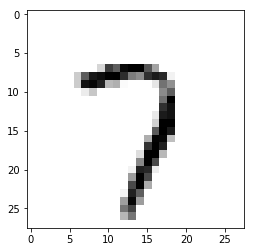

[[ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01      ]
 [ 0.01   

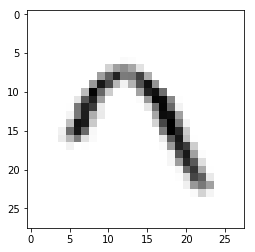

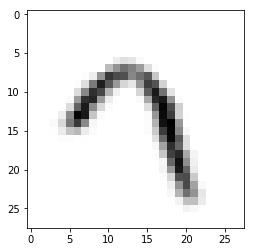

In [76]:
x = x_train[1].reshape(-1,1)
inputs = ((x / 255.0) * 0.99) + 0.01
print(inputs)
plt.imshow(inputs.reshape(28,28), cmap = matplotlib.cm.binary, interpolation="nearest")
plt.show()
#print("epoch:"+str(epoch)+"number:"+str(index))
#neural_nets_rotate.train(inputs,label.reshape(-1,1))
inputs = sn.interpolation.rotate(inputs.reshape(28,28),50,cval=0.01,order=1, reshape=False)
print(inputs.reshape(-1,1))
plt.imshow(inputs.reshape(28,28), cmap = matplotlib.cm.binary, interpolation="nearest")
plt.show()
#neural_nets_rotate.train(inputs.reshape(-1,1),label.reshape(-1,1))
inputs = sn.interpolation.rotate(inputs.reshape(28,28),-10,cval=0.01,order=1, reshape=False)
plt.imshow(inputs.reshape(28,28), cmap = matplotlib.cm.binary, interpolation="nearest")
plt.show()

In [78]:
scorecard_rotate = []

for instance in range(len(x_test)):
    inputs = (np.asfarray(x_test[instance]) / 255.0 * 0.99) + 0.01
    inputs = inputs.reshape(-1,1)
    outputs = neural_nets_rotate.query(inputs)
    output = np.argmax(outputs)
    if (output == y_test[instance]):
        scorecard_rotate.append(1)
    else:
        scorecard_rotate.append(0)
scorecard_array_rotate = np.asarray(scorecard_rotate)
print ("performance = ", scorecard_array_rotate.sum() / scorecard_array_rotate.size)


performance =  0.975428571429


0.01
0.99
match! correct answer is: 0  predict answer is: 7


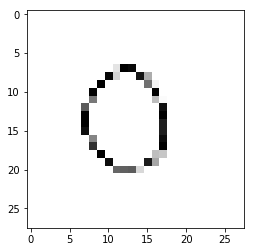

0.01
0.99
match! correct answer is: 1  predict answer is: 5


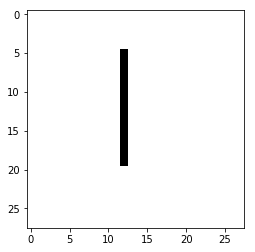

0.01
0.682549
match! correct answer is: 2  predict answer is: 2


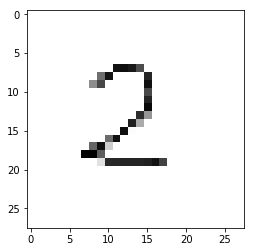

0.01
0.99
match! correct answer is: 3  predict answer is: 3


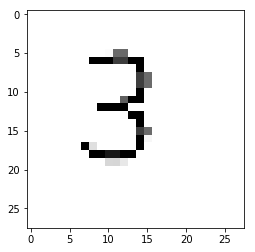

0.01
0.99
match! correct answer is: 4  predict answer is: 4


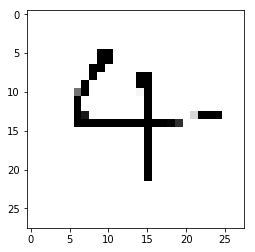

0.01
0.99
match! correct answer is: 5  predict answer is: 7


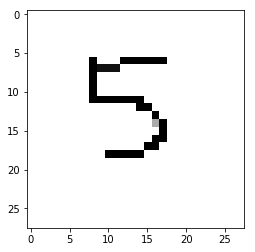

0.01
0.99
match! correct answer is: 6  predict answer is: 4


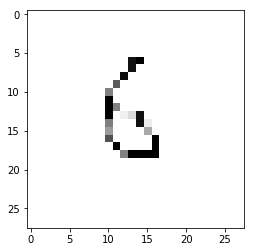

0.01
0.99
match! correct answer is: 7  predict answer is: 7


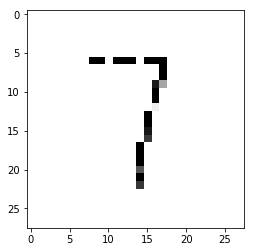

0.01
0.99
match! correct answer is: 8  predict answer is: 3


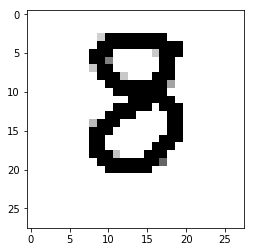

0.01
0.99
match! correct answer is: 9  predict answer is: 7


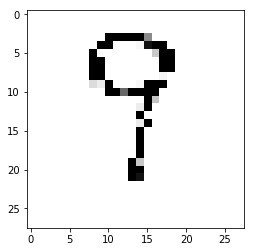

In [79]:
for index in range(len(our_own_dataset)):
    output = neural_nets_rotate.query(our_own_dataset[index])
    print(np.min(our_own_dataset[index]))
    print(np.max(our_own_dataset[index]))
    predict = np.argmax(output)
    print("match! correct answer is: "+str(our_own_target[index])+"  predict answer is: "+str(predict))
    plt.imshow(our_own_dataset[index].reshape(28,28), cmap = matplotlib.cm.binary, interpolation="nearest")
    plt.show()

In [1]:
from tensorflow.examples.tutorials.mnist import input_data
mnist_incase = input_data.read_data_sets("/tmp/data")

Extracting /tmp/data\train-images-idx3-ubyte.gz
Extracting /tmp/data\train-labels-idx1-ubyte.gz
Extracting /tmp/data\t10k-images-idx3-ubyte.gz
Extracting /tmp/data\t10k-labels-idx1-ubyte.gz


In [4]:
mnist_incase.validation.images.shape

(5000, 784)